In [1]:
# https://www.kaggle.com/code/pr4nav101/phishing-website-detection-cnn-lstm

import numpy as np 
import pandas as pd 
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import layers 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report,ConfusionMatrixDisplay

import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('stopwords')

from keras import Sequential

import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn import tree
from colorama import Fore  #Colorama is a module to color the python outputs
from urllib.parse import urlparse

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from tld import get_tld, is_tld

# 現在我們可以建立我們的模型。我們將使用一個簡單的LSTM模型。
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

2024-04-07 15:38:06.048703: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/simhoz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
df = pd.read_csv('phishing_url_3.csv')
df.head(20)

,url,type,Category,url_len,domain,@,?,-,=,.,...,!,*,",",//,abnormal_url,https,digits,letters,Shortining_Service,having_ip_address
0,br-icloud.com.br,phishing,2,16,br-icloud.com.br,0,0,1,0,2,...,0,0,0,0,0,0,0,13,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,mp3raid.com,0,0,0,0,2,...,0,0,0,0,0,0,1,29,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,bopsecrets.org,0,0,0,0,2,...,0,0,0,0,0,0,1,25,0,0
3,http://buzzfil.net/m/show-art/ils-etaient-loin...,benign,0,118,buzzfil.net,0,0,16,0,2,...,0,0,0,1,1,0,1,93,0,0
4,espn.go.com/nba/player/_/id/3457/brandon-rush,benign,0,45,espn.go.com,0,0,1,0,2,...,0,0,0,0,0,0,4,31,0,0
5,yourbittorrent.com/?q=anthony-hamilton-soulife,benign,0,46,yourbittorrent.com,0,1,2,1,1,...,0,0,0,0,0,0,0,40,1,0
6,allmusic.com/album/crazy-from-the-heat-r16990,benign,0,45,allmusic.com,0,0,4,0,1,...,0,0,0,0,0,0,5,33,0,0
7,corporationwiki.com/Ohio/Columbus/frank-s-bens...,benign,0,62,corporationwiki.com,0,0,3,0,2,...,0,0,0,0,0,0,7,47,0,0
8,myspace.com/video/vid/30602581,benign,0,30,myspace.com,0,0,0,0,1,...,0,0,0,0,0,0,8,18,0,0
9,quickfacts.census.gov/qfd/maps/iowa_map.html,benign,0,44,quickfacts.census.gov,0,0,0,0,3,...,0,0,0,0,0,0,0,37,0,0


In [10]:
def update_categorety(c):
    if c == 2:
        c = 1
    return c
df['Category']= df['Category'].apply(lambda i: update_categorety(i))


In [11]:
df.head(10)

,url,type,Category,url_len,domain,@,?,-,=,.,...,*,",",//,abnormal_url,https,digits,letters,Shortining_Service,having_ip_address,ans
0,br-icloud.com.br,phishing,1,16,br-icloud.com.br,0,0,1,0,2,...,0,0,0,0,0,0,13,0,0,1.0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,mp3raid.com,0,0,0,0,2,...,0,0,0,0,0,1,29,0,0,NaN
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,bopsecrets.org,0,0,0,0,2,...,0,0,0,0,0,1,25,0,0,NaN
3,http://buzzfil.net/m/show-art/ils-etaient-loin...,benign,0,118,buzzfil.net,0,0,16,0,2,...,0,0,1,1,0,1,93,0,0,NaN
4,espn.go.com/nba/player/_/id/3457/brandon-rush,benign,0,45,espn.go.com,0,0,1,0,2,...,0,0,0,0,0,4,31,0,0,NaN
5,yourbittorrent.com/?q=anthony-hamilton-soulife,benign,0,46,yourbittorrent.com,0,1,2,1,1,...,0,0,0,0,0,0,40,1,0,NaN
6,allmusic.com/album/crazy-from-the-heat-r16990,benign,0,45,allmusic.com,0,0,4,0,1,...,0,0,0,0,0,5,33,0,0,NaN
7,corporationwiki.com/Ohio/Columbus/frank-s-bens...,benign,0,62,corporationwiki.com,0,0,3,0,2,...,0,0,0,0,0,7,47,0,0,NaN
8,myspace.com/video/vid/30602581,benign,0,30,myspace.com,0,0,0,0,1,...,0,0,0,0,0,8,18,0,0,NaN
9,quickfacts.census.gov/qfd/maps/iowa_map.html,benign,0,44,quickfacts.census.gov,0,0,0,0,3,...,0,0,0,0,0,0,37,0,0,NaN


In [13]:
df[['type','Category']].head(10)

,type,Category
0,phishing,1
1,benign,0
2,benign,0
3,benign,0
4,benign,0
5,benign,0
6,benign,0
7,benign,0
8,benign,0
9,benign,0


In [14]:
Y1 = df['Category']
X1 = df.drop(columns = ['url','type','Category','domain'])

In [15]:
X1.head(2)

,url_len,@,?,-,=,.,#,%,+,$,...,*,",",//,abnormal_url,https,digits,letters,Shortining_Service,having_ip_address,ans
0,16,0,0,1,0,2,0,0,0,0,...,0,0,0,0,0,0,13,0,0,1.0
1,35,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,1,29,0,0,NaN


In [16]:
Y1.head(2)

0    1
1    0
Name: Category, dtype: int64

In [17]:
#data for learning without features 

X2 = df['url']
X2.head(2)

0                       br-icloud.com.br
1    mp3raid.com/music/krizz_kaliko.html
Name: url, dtype: object

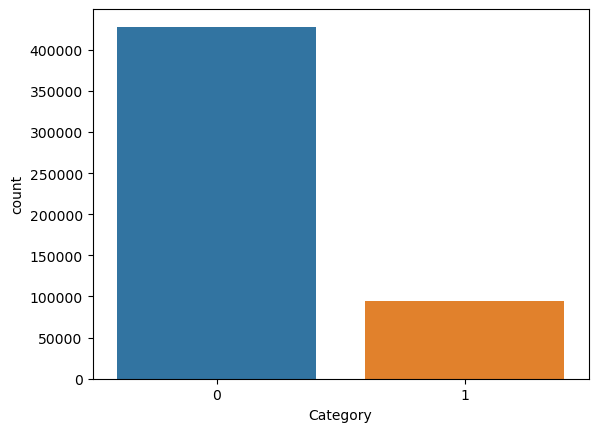

In [19]:
sns.countplot(x='Category', data=df);

<AxesSubplot:>

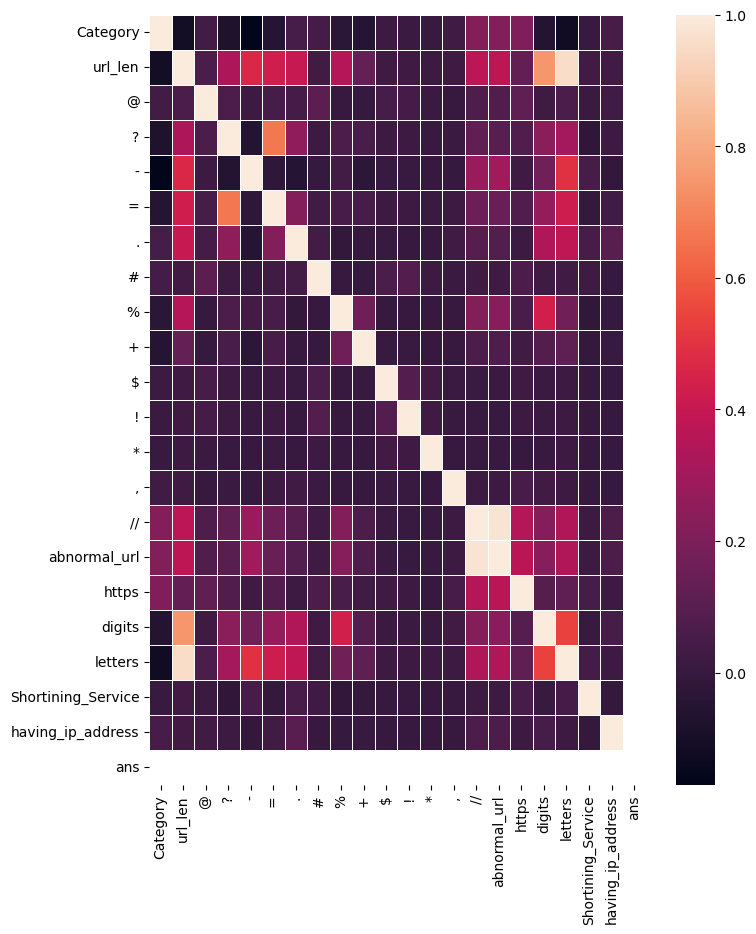

In [20]:
plt.figure(figsize=(8, 10))
sns.heatmap(df.corr(), linewidths=.5)

In [21]:
from sklearn.model_selection import train_test_split
X_train1,X_test1,Y_train1,Y_test1 = train_test_split(X1,Y1,stratify = Y1,test_size = 0.2,random_state = 42)

In [22]:
X_train1 = np.expand_dims(X_train1, axis=-1)
X_test1 = np.expand_dims(X_test1, axis=-1)

X_train1.shape

(417771, 21, 1)

In [23]:
# CREATING DATASET WITHOUT PRIOR FEATURE EXTRACTION
ps = PorterStemmer()
corpus_train = []

def albumentations(X,corpus_t):
    for i in range(len(X)):
        print(i,"/",len(X))
        review = re.sub("[^a-zA-Z]"," ",X[i])
        review = review.lower()
        review = review.split()
        review = [ps.stem(word) for word in review if word not in set(stopwords.words("english"))] #TO REMOVE STOP WORDS LIKE THE, A ETC 
        review = " ".join(review)
        corpus_t.append(review)
albumentations(X2,corpus_train)

0 / 522214
1 / 522214
2 / 522214
3 / 522214
4 / 522214
5 / 522214
6 / 522214
7 / 522214
8 / 522214
9 / 522214
10 / 522214
11 / 522214
12 / 522214
13 / 522214
14 / 522214
15 / 522214
16 / 522214
17 / 522214
18 / 522214
19 / 522214
20 / 522214
21 / 522214
22 / 522214
23 / 522214
24 / 522214
25 / 522214
26 / 522214
27 / 522214
28 / 522214
29 / 522214
30 / 522214
31 / 522214
32 / 522214
33 / 522214
34 / 522214
35 / 522214
36 / 522214
37 / 522214
38 / 522214
39 / 522214
40 / 522214
41 / 522214
42 / 522214
43 / 522214
44 / 522214
45 / 522214
46 / 522214
47 / 522214
48 / 522214
49 / 522214
50 / 522214
51 / 522214
52 / 522214
53 / 522214
54 / 522214
55 / 522214
56 / 522214
57 / 522214
58 / 522214
59 / 522214
60 / 522214
61 / 522214
62 / 522214
63 / 522214
64 / 522214
65 / 522214
66 / 522214
67 / 522214
68 / 522214
69 / 522214
70 / 522214
71 / 522214
72 / 522214
73 / 522214
74 / 522214
75 / 522214
76 / 522214
77 / 522214
78 / 522214
79 / 522214
80 / 522214
81 / 522214
82 / 522214
83 / 522214
84

761 / 522214
762 / 522214
763 / 522214
764 / 522214
765 / 522214
766 / 522214
767 / 522214
768 / 522214
769 / 522214
770 / 522214
771 / 522214
772 / 522214
773 / 522214
774 / 522214
775 / 522214
776 / 522214
777 / 522214
778 / 522214
779 / 522214
780 / 522214
781 / 522214
782 / 522214
783 / 522214
784 / 522214
785 / 522214
786 / 522214
787 / 522214
788 / 522214
789 / 522214
790 / 522214
791 / 522214
792 / 522214
793 / 522214
794 / 522214
795 / 522214
796 / 522214
797 / 522214
798 / 522214
799 / 522214
800 / 522214
801 / 522214
802 / 522214
803 / 522214
804 / 522214
805 / 522214
806 / 522214
807 / 522214
808 / 522214
809 / 522214
810 / 522214
811 / 522214
812 / 522214
813 / 522214
814 / 522214
815 / 522214
816 / 522214
817 / 522214
818 / 522214
819 / 522214
820 / 522214
821 / 522214
822 / 522214
823 / 522214
824 / 522214
825 / 522214
826 / 522214
827 / 522214
828 / 522214
829 / 522214
830 / 522214
831 / 522214
832 / 522214
833 / 522214
834 / 522214
835 / 522214
836 / 522214
837 / 522214

1418 / 522214
1419 / 522214
1420 / 522214
1421 / 522214
1422 / 522214
1423 / 522214
1424 / 522214
1425 / 522214
1426 / 522214
1427 / 522214
1428 / 522214
1429 / 522214
1430 / 522214
1431 / 522214
1432 / 522214
1433 / 522214
1434 / 522214
1435 / 522214
1436 / 522214
1437 / 522214
1438 / 522214
1439 / 522214
1440 / 522214
1441 / 522214
1442 / 522214
1443 / 522214
1444 / 522214
1445 / 522214
1446 / 522214
1447 / 522214
1448 / 522214
1449 / 522214
1450 / 522214
1451 / 522214
1452 / 522214
1453 / 522214
1454 / 522214
1455 / 522214
1456 / 522214
1457 / 522214
1458 / 522214
1459 / 522214
1460 / 522214
1461 / 522214
1462 / 522214
1463 / 522214
1464 / 522214
1465 / 522214
1466 / 522214
1467 / 522214
1468 / 522214
1469 / 522214
1470 / 522214
1471 / 522214
1472 / 522214
1473 / 522214
1474 / 522214
1475 / 522214
1476 / 522214
1477 / 522214
1478 / 522214
1479 / 522214
1480 / 522214
1481 / 522214
1482 / 522214
1483 / 522214
1484 / 522214
1485 / 522214
1486 / 522214
1487 / 522214
1488 / 522214
1489 /

2012 / 522214
2013 / 522214
2014 / 522214
2015 / 522214
2016 / 522214
2017 / 522214
2018 / 522214
2019 / 522214
2020 / 522214
2021 / 522214
2022 / 522214
2023 / 522214
2024 / 522214
2025 / 522214
2026 / 522214
2027 / 522214
2028 / 522214
2029 / 522214
2030 / 522214
2031 / 522214
2032 / 522214
2033 / 522214
2034 / 522214
2035 / 522214
2036 / 522214
2037 / 522214
2038 / 522214
2039 / 522214
2040 / 522214
2041 / 522214
2042 / 522214
2043 / 522214
2044 / 522214
2045 / 522214
2046 / 522214
2047 / 522214
2048 / 522214
2049 / 522214
2050 / 522214
2051 / 522214
2052 / 522214
2053 / 522214
2054 / 522214
2055 / 522214
2056 / 522214
2057 / 522214
2058 / 522214
2059 / 522214
2060 / 522214
2061 / 522214
2062 / 522214
2063 / 522214
2064 / 522214
2065 / 522214
2066 / 522214
2067 / 522214
2068 / 522214
2069 / 522214
2070 / 522214
2071 / 522214
2072 / 522214
2073 / 522214
2074 / 522214
2075 / 522214
2076 / 522214
2077 / 522214
2078 / 522214
2079 / 522214
2080 / 522214
2081 / 522214
2082 / 522214
2083 /

2631 / 522214
2632 / 522214
2633 / 522214
2634 / 522214
2635 / 522214
2636 / 522214
2637 / 522214
2638 / 522214
2639 / 522214
2640 / 522214
2641 / 522214
2642 / 522214
2643 / 522214
2644 / 522214
2645 / 522214
2646 / 522214
2647 / 522214
2648 / 522214
2649 / 522214
2650 / 522214
2651 / 522214
2652 / 522214
2653 / 522214
2654 / 522214
2655 / 522214
2656 / 522214
2657 / 522214
2658 / 522214
2659 / 522214
2660 / 522214
2661 / 522214
2662 / 522214
2663 / 522214
2664 / 522214
2665 / 522214
2666 / 522214
2667 / 522214
2668 / 522214
2669 / 522214
2670 / 522214
2671 / 522214
2672 / 522214
2673 / 522214
2674 / 522214
2675 / 522214
2676 / 522214
2677 / 522214
2678 / 522214
2679 / 522214
2680 / 522214
2681 / 522214
2682 / 522214
2683 / 522214
2684 / 522214
2685 / 522214
2686 / 522214
2687 / 522214
2688 / 522214
2689 / 522214
2690 / 522214
2691 / 522214
2692 / 522214
2693 / 522214
2694 / 522214
2695 / 522214
2696 / 522214
2697 / 522214
2698 / 522214
2699 / 522214
2700 / 522214
2701 / 522214
2702 /

3298 / 522214
3299 / 522214
3300 / 522214
3301 / 522214
3302 / 522214
3303 / 522214
3304 / 522214
3305 / 522214
3306 / 522214
3307 / 522214
3308 / 522214
3309 / 522214
3310 / 522214
3311 / 522214
3312 / 522214
3313 / 522214
3314 / 522214
3315 / 522214
3316 / 522214
3317 / 522214
3318 / 522214
3319 / 522214
3320 / 522214
3321 / 522214
3322 / 522214
3323 / 522214
3324 / 522214
3325 / 522214
3326 / 522214
3327 / 522214
3328 / 522214
3329 / 522214
3330 / 522214
3331 / 522214
3332 / 522214
3333 / 522214
3334 / 522214
3335 / 522214
3336 / 522214
3337 / 522214
3338 / 522214
3339 / 522214
3340 / 522214
3341 / 522214
3342 / 522214
3343 / 522214
3344 / 522214
3345 / 522214
3346 / 522214
3347 / 522214
3348 / 522214
3349 / 522214
3350 / 522214
3351 / 522214
3352 / 522214
3353 / 522214
3354 / 522214
3355 / 522214
3356 / 522214
3357 / 522214
3358 / 522214
3359 / 522214
3360 / 522214
3361 / 522214
3362 / 522214
3363 / 522214
3364 / 522214
3365 / 522214
3366 / 522214
3367 / 522214
3368 / 522214
3369 /

3942 / 522214
3943 / 522214
3944 / 522214
3945 / 522214
3946 / 522214
3947 / 522214
3948 / 522214
3949 / 522214
3950 / 522214
3951 / 522214
3952 / 522214
3953 / 522214
3954 / 522214
3955 / 522214
3956 / 522214
3957 / 522214
3958 / 522214
3959 / 522214
3960 / 522214
3961 / 522214
3962 / 522214
3963 / 522214
3964 / 522214
3965 / 522214
3966 / 522214
3967 / 522214
3968 / 522214
3969 / 522214
3970 / 522214
3971 / 522214
3972 / 522214
3973 / 522214
3974 / 522214
3975 / 522214
3976 / 522214
3977 / 522214
3978 / 522214
3979 / 522214
3980 / 522214
3981 / 522214
3982 / 522214
3983 / 522214
3984 / 522214
3985 / 522214
3986 / 522214
3987 / 522214
3988 / 522214
3989 / 522214
3990 / 522214
3991 / 522214
3992 / 522214
3993 / 522214
3994 / 522214
3995 / 522214
3996 / 522214
3997 / 522214
3998 / 522214
3999 / 522214
4000 / 522214
4001 / 522214
4002 / 522214
4003 / 522214
4004 / 522214
4005 / 522214
4006 / 522214
4007 / 522214
4008 / 522214
4009 / 522214
4010 / 522214
4011 / 522214
4012 / 522214
4013 /

4621 / 522214
4622 / 522214
4623 / 522214
4624 / 522214
4625 / 522214
4626 / 522214
4627 / 522214
4628 / 522214
4629 / 522214
4630 / 522214
4631 / 522214
4632 / 522214
4633 / 522214
4634 / 522214
4635 / 522214
4636 / 522214
4637 / 522214
4638 / 522214
4639 / 522214
4640 / 522214
4641 / 522214
4642 / 522214
4643 / 522214
4644 / 522214
4645 / 522214
4646 / 522214
4647 / 522214
4648 / 522214
4649 / 522214
4650 / 522214
4651 / 522214
4652 / 522214
4653 / 522214
4654 / 522214
4655 / 522214
4656 / 522214
4657 / 522214
4658 / 522214
4659 / 522214
4660 / 522214
4661 / 522214
4662 / 522214
4663 / 522214
4664 / 522214
4665 / 522214
4666 / 522214
4667 / 522214
4668 / 522214
4669 / 522214
4670 / 522214
4671 / 522214
4672 / 522214
4673 / 522214
4674 / 522214
4675 / 522214
4676 / 522214
4677 / 522214
4678 / 522214
4679 / 522214
4680 / 522214
4681 / 522214
4682 / 522214
4683 / 522214
4684 / 522214
4685 / 522214
4686 / 522214
4687 / 522214
4688 / 522214
4689 / 522214
4690 / 522214
4691 / 522214
4692 /

5283 / 522214
5284 / 522214
5285 / 522214
5286 / 522214
5287 / 522214
5288 / 522214
5289 / 522214
5290 / 522214
5291 / 522214
5292 / 522214
5293 / 522214
5294 / 522214
5295 / 522214
5296 / 522214
5297 / 522214
5298 / 522214
5299 / 522214
5300 / 522214
5301 / 522214
5302 / 522214
5303 / 522214
5304 / 522214
5305 / 522214
5306 / 522214
5307 / 522214
5308 / 522214
5309 / 522214
5310 / 522214
5311 / 522214
5312 / 522214
5313 / 522214
5314 / 522214
5315 / 522214
5316 / 522214
5317 / 522214
5318 / 522214
5319 / 522214
5320 / 522214
5321 / 522214
5322 / 522214
5323 / 522214
5324 / 522214
5325 / 522214
5326 / 522214
5327 / 522214
5328 / 522214
5329 / 522214
5330 / 522214
5331 / 522214
5332 / 522214
5333 / 522214
5334 / 522214
5335 / 522214
5336 / 522214
5337 / 522214
5338 / 522214
5339 / 522214
5340 / 522214
5341 / 522214
5342 / 522214
5343 / 522214
5344 / 522214
5345 / 522214
5346 / 522214
5347 / 522214
5348 / 522214
5349 / 522214
5350 / 522214
5351 / 522214
5352 / 522214
5353 / 522214
5354 /

5966 / 522214
5967 / 522214
5968 / 522214
5969 / 522214
5970 / 522214
5971 / 522214
5972 / 522214
5973 / 522214
5974 / 522214
5975 / 522214
5976 / 522214
5977 / 522214
5978 / 522214
5979 / 522214
5980 / 522214
5981 / 522214
5982 / 522214
5983 / 522214
5984 / 522214
5985 / 522214
5986 / 522214
5987 / 522214
5988 / 522214
5989 / 522214
5990 / 522214
5991 / 522214
5992 / 522214
5993 / 522214
5994 / 522214
5995 / 522214
5996 / 522214
5997 / 522214
5998 / 522214
5999 / 522214
6000 / 522214
6001 / 522214
6002 / 522214
6003 / 522214
6004 / 522214
6005 / 522214
6006 / 522214
6007 / 522214
6008 / 522214
6009 / 522214
6010 / 522214
6011 / 522214
6012 / 522214
6013 / 522214
6014 / 522214
6015 / 522214
6016 / 522214
6017 / 522214
6018 / 522214
6019 / 522214
6020 / 522214
6021 / 522214
6022 / 522214
6023 / 522214
6024 / 522214
6025 / 522214
6026 / 522214
6027 / 522214
6028 / 522214
6029 / 522214
6030 / 522214
6031 / 522214
6032 / 522214
6033 / 522214
6034 / 522214
6035 / 522214
6036 / 522214
6037 /

6674 / 522214
6675 / 522214
6676 / 522214
6677 / 522214
6678 / 522214
6679 / 522214
6680 / 522214
6681 / 522214
6682 / 522214
6683 / 522214
6684 / 522214
6685 / 522214
6686 / 522214
6687 / 522214
6688 / 522214
6689 / 522214
6690 / 522214
6691 / 522214
6692 / 522214
6693 / 522214
6694 / 522214
6695 / 522214
6696 / 522214
6697 / 522214
6698 / 522214
6699 / 522214
6700 / 522214
6701 / 522214
6702 / 522214
6703 / 522214
6704 / 522214
6705 / 522214
6706 / 522214
6707 / 522214
6708 / 522214
6709 / 522214
6710 / 522214
6711 / 522214
6712 / 522214
6713 / 522214
6714 / 522214
6715 / 522214
6716 / 522214
6717 / 522214
6718 / 522214
6719 / 522214
6720 / 522214
6721 / 522214
6722 / 522214
6723 / 522214
6724 / 522214
6725 / 522214
6726 / 522214
6727 / 522214
6728 / 522214
6729 / 522214
6730 / 522214
6731 / 522214
6732 / 522214
6733 / 522214
6734 / 522214
6735 / 522214
6736 / 522214
6737 / 522214
6738 / 522214
6739 / 522214
6740 / 522214
6741 / 522214
6742 / 522214
6743 / 522214
6744 / 522214
6745 /

7330 / 522214
7331 / 522214
7332 / 522214
7333 / 522214
7334 / 522214
7335 / 522214
7336 / 522214
7337 / 522214
7338 / 522214
7339 / 522214
7340 / 522214
7341 / 522214
7342 / 522214
7343 / 522214
7344 / 522214
7345 / 522214
7346 / 522214
7347 / 522214
7348 / 522214
7349 / 522214
7350 / 522214
7351 / 522214
7352 / 522214
7353 / 522214
7354 / 522214
7355 / 522214
7356 / 522214
7357 / 522214
7358 / 522214
7359 / 522214
7360 / 522214
7361 / 522214
7362 / 522214
7363 / 522214
7364 / 522214
7365 / 522214
7366 / 522214
7367 / 522214
7368 / 522214
7369 / 522214
7370 / 522214
7371 / 522214
7372 / 522214
7373 / 522214
7374 / 522214
7375 / 522214
7376 / 522214
7377 / 522214
7378 / 522214
7379 / 522214
7380 / 522214
7381 / 522214
7382 / 522214
7383 / 522214
7384 / 522214
7385 / 522214
7386 / 522214
7387 / 522214
7388 / 522214
7389 / 522214
7390 / 522214
7391 / 522214
7392 / 522214
7393 / 522214
7394 / 522214
7395 / 522214
7396 / 522214
7397 / 522214
7398 / 522214
7399 / 522214
7400 / 522214
7401 /

8035 / 522214
8036 / 522214
8037 / 522214
8038 / 522214
8039 / 522214
8040 / 522214
8041 / 522214
8042 / 522214
8043 / 522214
8044 / 522214
8045 / 522214
8046 / 522214
8047 / 522214
8048 / 522214
8049 / 522214
8050 / 522214
8051 / 522214
8052 / 522214
8053 / 522214
8054 / 522214
8055 / 522214
8056 / 522214
8057 / 522214
8058 / 522214
8059 / 522214
8060 / 522214
8061 / 522214
8062 / 522214
8063 / 522214
8064 / 522214
8065 / 522214
8066 / 522214
8067 / 522214
8068 / 522214
8069 / 522214
8070 / 522214
8071 / 522214
8072 / 522214
8073 / 522214
8074 / 522214
8075 / 522214
8076 / 522214
8077 / 522214
8078 / 522214
8079 / 522214
8080 / 522214
8081 / 522214
8082 / 522214
8083 / 522214
8084 / 522214
8085 / 522214
8086 / 522214
8087 / 522214
8088 / 522214
8089 / 522214
8090 / 522214
8091 / 522214
8092 / 522214
8093 / 522214
8094 / 522214
8095 / 522214
8096 / 522214
8097 / 522214
8098 / 522214
8099 / 522214
8100 / 522214
8101 / 522214
8102 / 522214
8103 / 522214
8104 / 522214
8105 / 522214
8106 /

8654 / 522214
8655 / 522214
8656 / 522214
8657 / 522214
8658 / 522214
8659 / 522214
8660 / 522214
8661 / 522214
8662 / 522214
8663 / 522214
8664 / 522214
8665 / 522214
8666 / 522214
8667 / 522214
8668 / 522214
8669 / 522214
8670 / 522214
8671 / 522214
8672 / 522214
8673 / 522214
8674 / 522214
8675 / 522214
8676 / 522214
8677 / 522214
8678 / 522214
8679 / 522214
8680 / 522214
8681 / 522214
8682 / 522214
8683 / 522214
8684 / 522214
8685 / 522214
8686 / 522214
8687 / 522214
8688 / 522214
8689 / 522214
8690 / 522214
8691 / 522214
8692 / 522214
8693 / 522214
8694 / 522214
8695 / 522214
8696 / 522214
8697 / 522214
8698 / 522214
8699 / 522214
8700 / 522214
8701 / 522214
8702 / 522214
8703 / 522214
8704 / 522214
8705 / 522214
8706 / 522214
8707 / 522214
8708 / 522214
8709 / 522214
8710 / 522214
8711 / 522214
8712 / 522214
8713 / 522214
8714 / 522214
8715 / 522214
8716 / 522214
8717 / 522214
8718 / 522214
8719 / 522214
8720 / 522214
8721 / 522214
8722 / 522214
8723 / 522214
8724 / 522214
8725 /

9347 / 522214
9348 / 522214
9349 / 522214
9350 / 522214
9351 / 522214
9352 / 522214
9353 / 522214
9354 / 522214
9355 / 522214
9356 / 522214
9357 / 522214
9358 / 522214
9359 / 522214
9360 / 522214
9361 / 522214
9362 / 522214
9363 / 522214
9364 / 522214
9365 / 522214
9366 / 522214
9367 / 522214
9368 / 522214
9369 / 522214
9370 / 522214
9371 / 522214
9372 / 522214
9373 / 522214
9374 / 522214
9375 / 522214
9376 / 522214
9377 / 522214
9378 / 522214
9379 / 522214
9380 / 522214
9381 / 522214
9382 / 522214
9383 / 522214
9384 / 522214
9385 / 522214
9386 / 522214
9387 / 522214
9388 / 522214
9389 / 522214
9390 / 522214
9391 / 522214
9392 / 522214
9393 / 522214
9394 / 522214
9395 / 522214
9396 / 522214
9397 / 522214
9398 / 522214
9399 / 522214
9400 / 522214
9401 / 522214
9402 / 522214
9403 / 522214
9404 / 522214
9405 / 522214
9406 / 522214
9407 / 522214
9408 / 522214
9409 / 522214
9410 / 522214
9411 / 522214
9412 / 522214
9413 / 522214
9414 / 522214
9415 / 522214
9416 / 522214
9417 / 522214
9418 /

10020 / 522214
10021 / 522214
10022 / 522214
10023 / 522214
10024 / 522214
10025 / 522214
10026 / 522214
10027 / 522214
10028 / 522214
10029 / 522214
10030 / 522214
10031 / 522214
10032 / 522214
10033 / 522214
10034 / 522214
10035 / 522214
10036 / 522214
10037 / 522214
10038 / 522214
10039 / 522214
10040 / 522214
10041 / 522214
10042 / 522214
10043 / 522214
10044 / 522214
10045 / 522214
10046 / 522214
10047 / 522214
10048 / 522214
10049 / 522214
10050 / 522214
10051 / 522214
10052 / 522214
10053 / 522214
10054 / 522214
10055 / 522214
10056 / 522214
10057 / 522214
10058 / 522214
10059 / 522214
10060 / 522214
10061 / 522214
10062 / 522214
10063 / 522214
10064 / 522214
10065 / 522214
10066 / 522214
10067 / 522214
10068 / 522214
10069 / 522214
10070 / 522214
10071 / 522214
10072 / 522214
10073 / 522214
10074 / 522214
10075 / 522214
10076 / 522214
10077 / 522214
10078 / 522214
10079 / 522214
10080 / 522214
10081 / 522214
10082 / 522214
10083 / 522214
10084 / 522214
10085 / 522214
10086 / 52

10594 / 522214
10595 / 522214
10596 / 522214
10597 / 522214
10598 / 522214
10599 / 522214
10600 / 522214
10601 / 522214
10602 / 522214
10603 / 522214
10604 / 522214
10605 / 522214
10606 / 522214
10607 / 522214
10608 / 522214
10609 / 522214
10610 / 522214
10611 / 522214
10612 / 522214
10613 / 522214
10614 / 522214
10615 / 522214
10616 / 522214
10617 / 522214
10618 / 522214
10619 / 522214
10620 / 522214
10621 / 522214
10622 / 522214
10623 / 522214
10624 / 522214
10625 / 522214
10626 / 522214
10627 / 522214
10628 / 522214
10629 / 522214
10630 / 522214
10631 / 522214
10632 / 522214
10633 / 522214
10634 / 522214
10635 / 522214
10636 / 522214
10637 / 522214
10638 / 522214
10639 / 522214
10640 / 522214
10641 / 522214
10642 / 522214
10643 / 522214
10644 / 522214
10645 / 522214
10646 / 522214
10647 / 522214
10648 / 522214
10649 / 522214
10650 / 522214
10651 / 522214
10652 / 522214
10653 / 522214
10654 / 522214
10655 / 522214
10656 / 522214
10657 / 522214
10658 / 522214
10659 / 522214
10660 / 52

11205 / 522214
11206 / 522214
11207 / 522214
11208 / 522214
11209 / 522214
11210 / 522214
11211 / 522214
11212 / 522214
11213 / 522214
11214 / 522214
11215 / 522214
11216 / 522214
11217 / 522214
11218 / 522214
11219 / 522214
11220 / 522214
11221 / 522214
11222 / 522214
11223 / 522214
11224 / 522214
11225 / 522214
11226 / 522214
11227 / 522214
11228 / 522214
11229 / 522214
11230 / 522214
11231 / 522214
11232 / 522214
11233 / 522214
11234 / 522214
11235 / 522214
11236 / 522214
11237 / 522214
11238 / 522214
11239 / 522214
11240 / 522214
11241 / 522214
11242 / 522214
11243 / 522214
11244 / 522214
11245 / 522214
11246 / 522214
11247 / 522214
11248 / 522214
11249 / 522214
11250 / 522214
11251 / 522214
11252 / 522214
11253 / 522214
11254 / 522214
11255 / 522214
11256 / 522214
11257 / 522214
11258 / 522214
11259 / 522214
11260 / 522214
11261 / 522214
11262 / 522214
11263 / 522214
11264 / 522214
11265 / 522214
11266 / 522214
11267 / 522214
11268 / 522214
11269 / 522214
11270 / 522214
11271 / 52

11764 / 522214
11765 / 522214
11766 / 522214
11767 / 522214
11768 / 522214
11769 / 522214
11770 / 522214
11771 / 522214
11772 / 522214
11773 / 522214
11774 / 522214
11775 / 522214
11776 / 522214
11777 / 522214
11778 / 522214
11779 / 522214
11780 / 522214
11781 / 522214
11782 / 522214
11783 / 522214
11784 / 522214
11785 / 522214
11786 / 522214
11787 / 522214
11788 / 522214
11789 / 522214
11790 / 522214
11791 / 522214
11792 / 522214
11793 / 522214
11794 / 522214
11795 / 522214
11796 / 522214
11797 / 522214
11798 / 522214
11799 / 522214
11800 / 522214
11801 / 522214
11802 / 522214
11803 / 522214
11804 / 522214
11805 / 522214
11806 / 522214
11807 / 522214
11808 / 522214
11809 / 522214
11810 / 522214
11811 / 522214
11812 / 522214
11813 / 522214
11814 / 522214
11815 / 522214
11816 / 522214
11817 / 522214
11818 / 522214
11819 / 522214
11820 / 522214
11821 / 522214
11822 / 522214
11823 / 522214
11824 / 522214
11825 / 522214
11826 / 522214
11827 / 522214
11828 / 522214
11829 / 522214
11830 / 52

12342 / 522214
12343 / 522214
12344 / 522214
12345 / 522214
12346 / 522214
12347 / 522214
12348 / 522214
12349 / 522214
12350 / 522214
12351 / 522214
12352 / 522214
12353 / 522214
12354 / 522214
12355 / 522214
12356 / 522214
12357 / 522214
12358 / 522214
12359 / 522214
12360 / 522214
12361 / 522214
12362 / 522214
12363 / 522214
12364 / 522214
12365 / 522214
12366 / 522214
12367 / 522214
12368 / 522214
12369 / 522214
12370 / 522214
12371 / 522214
12372 / 522214
12373 / 522214
12374 / 522214
12375 / 522214
12376 / 522214
12377 / 522214
12378 / 522214
12379 / 522214
12380 / 522214
12381 / 522214
12382 / 522214
12383 / 522214
12384 / 522214
12385 / 522214
12386 / 522214
12387 / 522214
12388 / 522214
12389 / 522214
12390 / 522214
12391 / 522214
12392 / 522214
12393 / 522214
12394 / 522214
12395 / 522214
12396 / 522214
12397 / 522214
12398 / 522214
12399 / 522214
12400 / 522214
12401 / 522214
12402 / 522214
12403 / 522214
12404 / 522214
12405 / 522214
12406 / 522214
12407 / 522214
12408 / 52

12991 / 522214
12992 / 522214
12993 / 522214
12994 / 522214
12995 / 522214
12996 / 522214
12997 / 522214
12998 / 522214
12999 / 522214
13000 / 522214
13001 / 522214
13002 / 522214
13003 / 522214
13004 / 522214
13005 / 522214
13006 / 522214
13007 / 522214
13008 / 522214
13009 / 522214
13010 / 522214
13011 / 522214
13012 / 522214
13013 / 522214
13014 / 522214
13015 / 522214
13016 / 522214
13017 / 522214
13018 / 522214
13019 / 522214
13020 / 522214
13021 / 522214
13022 / 522214
13023 / 522214
13024 / 522214
13025 / 522214
13026 / 522214
13027 / 522214
13028 / 522214
13029 / 522214
13030 / 522214
13031 / 522214
13032 / 522214
13033 / 522214
13034 / 522214
13035 / 522214
13036 / 522214
13037 / 522214
13038 / 522214
13039 / 522214
13040 / 522214
13041 / 522214
13042 / 522214
13043 / 522214
13044 / 522214
13045 / 522214
13046 / 522214
13047 / 522214
13048 / 522214
13049 / 522214
13050 / 522214
13051 / 522214
13052 / 522214
13053 / 522214
13054 / 522214
13055 / 522214
13056 / 522214
13057 / 52

13576 / 522214
13577 / 522214
13578 / 522214
13579 / 522214
13580 / 522214
13581 / 522214
13582 / 522214
13583 / 522214
13584 / 522214
13585 / 522214
13586 / 522214
13587 / 522214
13588 / 522214
13589 / 522214
13590 / 522214
13591 / 522214
13592 / 522214
13593 / 522214
13594 / 522214
13595 / 522214
13596 / 522214
13597 / 522214
13598 / 522214
13599 / 522214
13600 / 522214
13601 / 522214
13602 / 522214
13603 / 522214
13604 / 522214
13605 / 522214
13606 / 522214
13607 / 522214
13608 / 522214
13609 / 522214
13610 / 522214
13611 / 522214
13612 / 522214
13613 / 522214
13614 / 522214
13615 / 522214
13616 / 522214
13617 / 522214
13618 / 522214
13619 / 522214
13620 / 522214
13621 / 522214
13622 / 522214
13623 / 522214
13624 / 522214
13625 / 522214
13626 / 522214
13627 / 522214
13628 / 522214
13629 / 522214
13630 / 522214
13631 / 522214
13632 / 522214
13633 / 522214
13634 / 522214
13635 / 522214
13636 / 522214
13637 / 522214
13638 / 522214
13639 / 522214
13640 / 522214
13641 / 522214
13642 / 52

14189 / 522214
14190 / 522214
14191 / 522214
14192 / 522214
14193 / 522214
14194 / 522214
14195 / 522214
14196 / 522214
14197 / 522214
14198 / 522214
14199 / 522214
14200 / 522214
14201 / 522214
14202 / 522214
14203 / 522214
14204 / 522214
14205 / 522214
14206 / 522214
14207 / 522214
14208 / 522214
14209 / 522214
14210 / 522214
14211 / 522214
14212 / 522214
14213 / 522214
14214 / 522214
14215 / 522214
14216 / 522214
14217 / 522214
14218 / 522214
14219 / 522214
14220 / 522214
14221 / 522214
14222 / 522214
14223 / 522214
14224 / 522214
14225 / 522214
14226 / 522214
14227 / 522214
14228 / 522214
14229 / 522214
14230 / 522214
14231 / 522214
14232 / 522214
14233 / 522214
14234 / 522214
14235 / 522214
14236 / 522214
14237 / 522214
14238 / 522214
14239 / 522214
14240 / 522214
14241 / 522214
14242 / 522214
14243 / 522214
14244 / 522214
14245 / 522214
14246 / 522214
14247 / 522214
14248 / 522214
14249 / 522214
14250 / 522214
14251 / 522214
14252 / 522214
14253 / 522214
14254 / 522214
14255 / 52

14827 / 522214
14828 / 522214
14829 / 522214
14830 / 522214
14831 / 522214
14832 / 522214
14833 / 522214
14834 / 522214
14835 / 522214
14836 / 522214
14837 / 522214
14838 / 522214
14839 / 522214
14840 / 522214
14841 / 522214
14842 / 522214
14843 / 522214
14844 / 522214
14845 / 522214
14846 / 522214
14847 / 522214
14848 / 522214
14849 / 522214
14850 / 522214
14851 / 522214
14852 / 522214
14853 / 522214
14854 / 522214
14855 / 522214
14856 / 522214
14857 / 522214
14858 / 522214
14859 / 522214
14860 / 522214
14861 / 522214
14862 / 522214
14863 / 522214
14864 / 522214
14865 / 522214
14866 / 522214
14867 / 522214
14868 / 522214
14869 / 522214
14870 / 522214
14871 / 522214
14872 / 522214
14873 / 522214
14874 / 522214
14875 / 522214
14876 / 522214
14877 / 522214
14878 / 522214
14879 / 522214
14880 / 522214
14881 / 522214
14882 / 522214
14883 / 522214
14884 / 522214
14885 / 522214
14886 / 522214
14887 / 522214
14888 / 522214
14889 / 522214
14890 / 522214
14891 / 522214
14892 / 522214
14893 / 52

15428 / 522214
15429 / 522214
15430 / 522214
15431 / 522214
15432 / 522214
15433 / 522214
15434 / 522214
15435 / 522214
15436 / 522214
15437 / 522214
15438 / 522214
15439 / 522214
15440 / 522214
15441 / 522214
15442 / 522214
15443 / 522214
15444 / 522214
15445 / 522214
15446 / 522214
15447 / 522214
15448 / 522214
15449 / 522214
15450 / 522214
15451 / 522214
15452 / 522214
15453 / 522214
15454 / 522214
15455 / 522214
15456 / 522214
15457 / 522214
15458 / 522214
15459 / 522214
15460 / 522214
15461 / 522214
15462 / 522214
15463 / 522214
15464 / 522214
15465 / 522214
15466 / 522214
15467 / 522214
15468 / 522214
15469 / 522214
15470 / 522214
15471 / 522214
15472 / 522214
15473 / 522214
15474 / 522214
15475 / 522214
15476 / 522214
15477 / 522214
15478 / 522214
15479 / 522214
15480 / 522214
15481 / 522214
15482 / 522214
15483 / 522214
15484 / 522214
15485 / 522214
15486 / 522214
15487 / 522214
15488 / 522214
15489 / 522214
15490 / 522214
15491 / 522214
15492 / 522214
15493 / 522214
15494 / 52

16072 / 522214
16073 / 522214
16074 / 522214
16075 / 522214
16076 / 522214
16077 / 522214
16078 / 522214
16079 / 522214
16080 / 522214
16081 / 522214
16082 / 522214
16083 / 522214
16084 / 522214
16085 / 522214
16086 / 522214
16087 / 522214
16088 / 522214
16089 / 522214
16090 / 522214
16091 / 522214
16092 / 522214
16093 / 522214
16094 / 522214
16095 / 522214
16096 / 522214
16097 / 522214
16098 / 522214
16099 / 522214
16100 / 522214
16101 / 522214
16102 / 522214
16103 / 522214
16104 / 522214
16105 / 522214
16106 / 522214
16107 / 522214
16108 / 522214
16109 / 522214
16110 / 522214
16111 / 522214
16112 / 522214
16113 / 522214
16114 / 522214
16115 / 522214
16116 / 522214
16117 / 522214
16118 / 522214
16119 / 522214
16120 / 522214
16121 / 522214
16122 / 522214
16123 / 522214
16124 / 522214
16125 / 522214
16126 / 522214
16127 / 522214
16128 / 522214
16129 / 522214
16130 / 522214
16131 / 522214
16132 / 522214
16133 / 522214
16134 / 522214
16135 / 522214
16136 / 522214
16137 / 522214
16138 / 52

16732 / 522214
16733 / 522214
16734 / 522214
16735 / 522214
16736 / 522214
16737 / 522214
16738 / 522214
16739 / 522214
16740 / 522214
16741 / 522214
16742 / 522214
16743 / 522214
16744 / 522214
16745 / 522214
16746 / 522214
16747 / 522214
16748 / 522214
16749 / 522214
16750 / 522214
16751 / 522214
16752 / 522214
16753 / 522214
16754 / 522214
16755 / 522214
16756 / 522214
16757 / 522214
16758 / 522214
16759 / 522214
16760 / 522214
16761 / 522214
16762 / 522214
16763 / 522214
16764 / 522214
16765 / 522214
16766 / 522214
16767 / 522214
16768 / 522214
16769 / 522214
16770 / 522214
16771 / 522214
16772 / 522214
16773 / 522214
16774 / 522214
16775 / 522214
16776 / 522214
16777 / 522214
16778 / 522214
16779 / 522214
16780 / 522214
16781 / 522214
16782 / 522214
16783 / 522214
16784 / 522214
16785 / 522214
16786 / 522214
16787 / 522214
16788 / 522214
16789 / 522214
16790 / 522214
16791 / 522214
16792 / 522214
16793 / 522214
16794 / 522214
16795 / 522214
16796 / 522214
16797 / 522214
16798 / 52

17424 / 522214
17425 / 522214
17426 / 522214
17427 / 522214
17428 / 522214
17429 / 522214
17430 / 522214
17431 / 522214
17432 / 522214
17433 / 522214
17434 / 522214
17435 / 522214
17436 / 522214
17437 / 522214
17438 / 522214
17439 / 522214
17440 / 522214
17441 / 522214
17442 / 522214
17443 / 522214
17444 / 522214
17445 / 522214
17446 / 522214
17447 / 522214
17448 / 522214
17449 / 522214
17450 / 522214
17451 / 522214
17452 / 522214
17453 / 522214
17454 / 522214
17455 / 522214
17456 / 522214
17457 / 522214
17458 / 522214
17459 / 522214
17460 / 522214
17461 / 522214
17462 / 522214
17463 / 522214
17464 / 522214
17465 / 522214
17466 / 522214
17467 / 522214
17468 / 522214
17469 / 522214
17470 / 522214
17471 / 522214
17472 / 522214
17473 / 522214
17474 / 522214
17475 / 522214
17476 / 522214
17477 / 522214
17478 / 522214
17479 / 522214
17480 / 522214
17481 / 522214
17482 / 522214
17483 / 522214
17484 / 522214
17485 / 522214
17486 / 522214
17487 / 522214
17488 / 522214
17489 / 522214
17490 / 52

18081 / 522214
18082 / 522214
18083 / 522214
18084 / 522214
18085 / 522214
18086 / 522214
18087 / 522214
18088 / 522214
18089 / 522214
18090 / 522214
18091 / 522214
18092 / 522214
18093 / 522214
18094 / 522214
18095 / 522214
18096 / 522214
18097 / 522214
18098 / 522214
18099 / 522214
18100 / 522214
18101 / 522214
18102 / 522214
18103 / 522214
18104 / 522214
18105 / 522214
18106 / 522214
18107 / 522214
18108 / 522214
18109 / 522214
18110 / 522214
18111 / 522214
18112 / 522214
18113 / 522214
18114 / 522214
18115 / 522214
18116 / 522214
18117 / 522214
18118 / 522214
18119 / 522214
18120 / 522214
18121 / 522214
18122 / 522214
18123 / 522214
18124 / 522214
18125 / 522214
18126 / 522214
18127 / 522214
18128 / 522214
18129 / 522214
18130 / 522214
18131 / 522214
18132 / 522214
18133 / 522214
18134 / 522214
18135 / 522214
18136 / 522214
18137 / 522214
18138 / 522214
18139 / 522214
18140 / 522214
18141 / 522214
18142 / 522214
18143 / 522214
18144 / 522214
18145 / 522214
18146 / 522214
18147 / 52

18746 / 522214
18747 / 522214
18748 / 522214
18749 / 522214
18750 / 522214
18751 / 522214
18752 / 522214
18753 / 522214
18754 / 522214
18755 / 522214
18756 / 522214
18757 / 522214
18758 / 522214
18759 / 522214
18760 / 522214
18761 / 522214
18762 / 522214
18763 / 522214
18764 / 522214
18765 / 522214
18766 / 522214
18767 / 522214
18768 / 522214
18769 / 522214
18770 / 522214
18771 / 522214
18772 / 522214
18773 / 522214
18774 / 522214
18775 / 522214
18776 / 522214
18777 / 522214
18778 / 522214
18779 / 522214
18780 / 522214
18781 / 522214
18782 / 522214
18783 / 522214
18784 / 522214
18785 / 522214
18786 / 522214
18787 / 522214
18788 / 522214
18789 / 522214
18790 / 522214
18791 / 522214
18792 / 522214
18793 / 522214
18794 / 522214
18795 / 522214
18796 / 522214
18797 / 522214
18798 / 522214
18799 / 522214
18800 / 522214
18801 / 522214
18802 / 522214
18803 / 522214
18804 / 522214
18805 / 522214
18806 / 522214
18807 / 522214
18808 / 522214
18809 / 522214
18810 / 522214
18811 / 522214
18812 / 52

19318 / 522214
19319 / 522214
19320 / 522214
19321 / 522214
19322 / 522214
19323 / 522214
19324 / 522214
19325 / 522214
19326 / 522214
19327 / 522214
19328 / 522214
19329 / 522214
19330 / 522214
19331 / 522214
19332 / 522214
19333 / 522214
19334 / 522214
19335 / 522214
19336 / 522214
19337 / 522214
19338 / 522214
19339 / 522214
19340 / 522214
19341 / 522214
19342 / 522214
19343 / 522214
19344 / 522214
19345 / 522214
19346 / 522214
19347 / 522214
19348 / 522214
19349 / 522214
19350 / 522214
19351 / 522214
19352 / 522214
19353 / 522214
19354 / 522214
19355 / 522214
19356 / 522214
19357 / 522214
19358 / 522214
19359 / 522214
19360 / 522214
19361 / 522214
19362 / 522214
19363 / 522214
19364 / 522214
19365 / 522214
19366 / 522214
19367 / 522214
19368 / 522214
19369 / 522214
19370 / 522214
19371 / 522214
19372 / 522214
19373 / 522214
19374 / 522214
19375 / 522214
19376 / 522214
19377 / 522214
19378 / 522214
19379 / 522214
19380 / 522214
19381 / 522214
19382 / 522214
19383 / 522214
19384 / 52

19878 / 522214
19879 / 522214
19880 / 522214
19881 / 522214
19882 / 522214
19883 / 522214
19884 / 522214
19885 / 522214
19886 / 522214
19887 / 522214
19888 / 522214
19889 / 522214
19890 / 522214
19891 / 522214
19892 / 522214
19893 / 522214
19894 / 522214
19895 / 522214
19896 / 522214
19897 / 522214
19898 / 522214
19899 / 522214
19900 / 522214
19901 / 522214
19902 / 522214
19903 / 522214
19904 / 522214
19905 / 522214
19906 / 522214
19907 / 522214
19908 / 522214
19909 / 522214
19910 / 522214
19911 / 522214
19912 / 522214
19913 / 522214
19914 / 522214
19915 / 522214
19916 / 522214
19917 / 522214
19918 / 522214
19919 / 522214
19920 / 522214
19921 / 522214
19922 / 522214
19923 / 522214
19924 / 522214
19925 / 522214
19926 / 522214
19927 / 522214
19928 / 522214
19929 / 522214
19930 / 522214
19931 / 522214
19932 / 522214
19933 / 522214
19934 / 522214
19935 / 522214
19936 / 522214
19937 / 522214
19938 / 522214
19939 / 522214
19940 / 522214
19941 / 522214
19942 / 522214
19943 / 522214
19944 / 52

20495 / 522214
20496 / 522214
20497 / 522214
20498 / 522214
20499 / 522214
20500 / 522214
20501 / 522214
20502 / 522214
20503 / 522214
20504 / 522214
20505 / 522214
20506 / 522214
20507 / 522214
20508 / 522214
20509 / 522214
20510 / 522214
20511 / 522214
20512 / 522214
20513 / 522214
20514 / 522214
20515 / 522214
20516 / 522214
20517 / 522214
20518 / 522214
20519 / 522214
20520 / 522214
20521 / 522214
20522 / 522214
20523 / 522214
20524 / 522214
20525 / 522214
20526 / 522214
20527 / 522214
20528 / 522214
20529 / 522214
20530 / 522214
20531 / 522214
20532 / 522214
20533 / 522214
20534 / 522214
20535 / 522214
20536 / 522214
20537 / 522214
20538 / 522214
20539 / 522214
20540 / 522214
20541 / 522214
20542 / 522214
20543 / 522214
20544 / 522214
20545 / 522214
20546 / 522214
20547 / 522214
20548 / 522214
20549 / 522214
20550 / 522214
20551 / 522214
20552 / 522214
20553 / 522214
20554 / 522214
20555 / 522214
20556 / 522214
20557 / 522214
20558 / 522214
20559 / 522214
20560 / 522214
20561 / 52

21135 / 522214
21136 / 522214
21137 / 522214
21138 / 522214
21139 / 522214
21140 / 522214
21141 / 522214
21142 / 522214
21143 / 522214
21144 / 522214
21145 / 522214
21146 / 522214
21147 / 522214
21148 / 522214
21149 / 522214
21150 / 522214
21151 / 522214
21152 / 522214
21153 / 522214
21154 / 522214
21155 / 522214
21156 / 522214
21157 / 522214
21158 / 522214
21159 / 522214
21160 / 522214
21161 / 522214
21162 / 522214
21163 / 522214
21164 / 522214
21165 / 522214
21166 / 522214
21167 / 522214
21168 / 522214
21169 / 522214
21170 / 522214
21171 / 522214
21172 / 522214
21173 / 522214
21174 / 522214
21175 / 522214
21176 / 522214
21177 / 522214
21178 / 522214
21179 / 522214
21180 / 522214
21181 / 522214
21182 / 522214
21183 / 522214
21184 / 522214
21185 / 522214
21186 / 522214
21187 / 522214
21188 / 522214
21189 / 522214
21190 / 522214
21191 / 522214
21192 / 522214
21193 / 522214
21194 / 522214
21195 / 522214
21196 / 522214
21197 / 522214
21198 / 522214
21199 / 522214
21200 / 522214
21201 / 52

21815 / 522214
21816 / 522214
21817 / 522214
21818 / 522214
21819 / 522214
21820 / 522214
21821 / 522214
21822 / 522214
21823 / 522214
21824 / 522214
21825 / 522214
21826 / 522214
21827 / 522214
21828 / 522214
21829 / 522214
21830 / 522214
21831 / 522214
21832 / 522214
21833 / 522214
21834 / 522214
21835 / 522214
21836 / 522214
21837 / 522214
21838 / 522214
21839 / 522214
21840 / 522214
21841 / 522214
21842 / 522214
21843 / 522214
21844 / 522214
21845 / 522214
21846 / 522214
21847 / 522214
21848 / 522214
21849 / 522214
21850 / 522214
21851 / 522214
21852 / 522214
21853 / 522214
21854 / 522214
21855 / 522214
21856 / 522214
21857 / 522214
21858 / 522214
21859 / 522214
21860 / 522214
21861 / 522214
21862 / 522214
21863 / 522214
21864 / 522214
21865 / 522214
21866 / 522214
21867 / 522214
21868 / 522214
21869 / 522214
21870 / 522214
21871 / 522214
21872 / 522214
21873 / 522214
21874 / 522214
21875 / 522214
21876 / 522214
21877 / 522214
21878 / 522214
21879 / 522214
21880 / 522214
21881 / 52

22427 / 522214
22428 / 522214
22429 / 522214
22430 / 522214
22431 / 522214
22432 / 522214
22433 / 522214
22434 / 522214
22435 / 522214
22436 / 522214
22437 / 522214
22438 / 522214
22439 / 522214
22440 / 522214
22441 / 522214
22442 / 522214
22443 / 522214
22444 / 522214
22445 / 522214
22446 / 522214
22447 / 522214
22448 / 522214
22449 / 522214
22450 / 522214
22451 / 522214
22452 / 522214
22453 / 522214
22454 / 522214
22455 / 522214
22456 / 522214
22457 / 522214
22458 / 522214
22459 / 522214
22460 / 522214
22461 / 522214
22462 / 522214
22463 / 522214
22464 / 522214
22465 / 522214
22466 / 522214
22467 / 522214
22468 / 522214
22469 / 522214
22470 / 522214
22471 / 522214
22472 / 522214
22473 / 522214
22474 / 522214
22475 / 522214
22476 / 522214
22477 / 522214
22478 / 522214
22479 / 522214
22480 / 522214
22481 / 522214
22482 / 522214
22483 / 522214
22484 / 522214
22485 / 522214
22486 / 522214
22487 / 522214
22488 / 522214
22489 / 522214
22490 / 522214
22491 / 522214
22492 / 522214
22493 / 52

23027 / 522214
23028 / 522214
23029 / 522214
23030 / 522214
23031 / 522214
23032 / 522214
23033 / 522214
23034 / 522214
23035 / 522214
23036 / 522214
23037 / 522214
23038 / 522214
23039 / 522214
23040 / 522214
23041 / 522214
23042 / 522214
23043 / 522214
23044 / 522214
23045 / 522214
23046 / 522214
23047 / 522214
23048 / 522214
23049 / 522214
23050 / 522214
23051 / 522214
23052 / 522214
23053 / 522214
23054 / 522214
23055 / 522214
23056 / 522214
23057 / 522214
23058 / 522214
23059 / 522214
23060 / 522214
23061 / 522214
23062 / 522214
23063 / 522214
23064 / 522214
23065 / 522214
23066 / 522214
23067 / 522214
23068 / 522214
23069 / 522214
23070 / 522214
23071 / 522214
23072 / 522214
23073 / 522214
23074 / 522214
23075 / 522214
23076 / 522214
23077 / 522214
23078 / 522214
23079 / 522214
23080 / 522214
23081 / 522214
23082 / 522214
23083 / 522214
23084 / 522214
23085 / 522214
23086 / 522214
23087 / 522214
23088 / 522214
23089 / 522214
23090 / 522214
23091 / 522214
23092 / 522214
23093 / 52

23669 / 522214
23670 / 522214
23671 / 522214
23672 / 522214
23673 / 522214
23674 / 522214
23675 / 522214
23676 / 522214
23677 / 522214
23678 / 522214
23679 / 522214
23680 / 522214
23681 / 522214
23682 / 522214
23683 / 522214
23684 / 522214
23685 / 522214
23686 / 522214
23687 / 522214
23688 / 522214
23689 / 522214
23690 / 522214
23691 / 522214
23692 / 522214
23693 / 522214
23694 / 522214
23695 / 522214
23696 / 522214
23697 / 522214
23698 / 522214
23699 / 522214
23700 / 522214
23701 / 522214
23702 / 522214
23703 / 522214
23704 / 522214
23705 / 522214
23706 / 522214
23707 / 522214
23708 / 522214
23709 / 522214
23710 / 522214
23711 / 522214
23712 / 522214
23713 / 522214
23714 / 522214
23715 / 522214
23716 / 522214
23717 / 522214
23718 / 522214
23719 / 522214
23720 / 522214
23721 / 522214
23722 / 522214
23723 / 522214
23724 / 522214
23725 / 522214
23726 / 522214
23727 / 522214
23728 / 522214
23729 / 522214
23730 / 522214
23731 / 522214
23732 / 522214
23733 / 522214
23734 / 522214
23735 / 52

24341 / 522214
24342 / 522214
24343 / 522214
24344 / 522214
24345 / 522214
24346 / 522214
24347 / 522214
24348 / 522214
24349 / 522214
24350 / 522214
24351 / 522214
24352 / 522214
24353 / 522214
24354 / 522214
24355 / 522214
24356 / 522214
24357 / 522214
24358 / 522214
24359 / 522214
24360 / 522214
24361 / 522214
24362 / 522214
24363 / 522214
24364 / 522214
24365 / 522214
24366 / 522214
24367 / 522214
24368 / 522214
24369 / 522214
24370 / 522214
24371 / 522214
24372 / 522214
24373 / 522214
24374 / 522214
24375 / 522214
24376 / 522214
24377 / 522214
24378 / 522214
24379 / 522214
24380 / 522214
24381 / 522214
24382 / 522214
24383 / 522214
24384 / 522214
24385 / 522214
24386 / 522214
24387 / 522214
24388 / 522214
24389 / 522214
24390 / 522214
24391 / 522214
24392 / 522214
24393 / 522214
24394 / 522214
24395 / 522214
24396 / 522214
24397 / 522214
24398 / 522214
24399 / 522214
24400 / 522214
24401 / 522214
24402 / 522214
24403 / 522214
24404 / 522214
24405 / 522214
24406 / 522214
24407 / 52

24986 / 522214
24987 / 522214
24988 / 522214
24989 / 522214
24990 / 522214
24991 / 522214
24992 / 522214
24993 / 522214
24994 / 522214
24995 / 522214
24996 / 522214
24997 / 522214
24998 / 522214
24999 / 522214
25000 / 522214
25001 / 522214
25002 / 522214
25003 / 522214
25004 / 522214
25005 / 522214
25006 / 522214
25007 / 522214
25008 / 522214
25009 / 522214
25010 / 522214
25011 / 522214
25012 / 522214
25013 / 522214
25014 / 522214
25015 / 522214
25016 / 522214
25017 / 522214
25018 / 522214
25019 / 522214
25020 / 522214
25021 / 522214
25022 / 522214
25023 / 522214
25024 / 522214
25025 / 522214
25026 / 522214
25027 / 522214
25028 / 522214
25029 / 522214
25030 / 522214
25031 / 522214
25032 / 522214
25033 / 522214
25034 / 522214
25035 / 522214
25036 / 522214
25037 / 522214
25038 / 522214
25039 / 522214
25040 / 522214
25041 / 522214
25042 / 522214
25043 / 522214
25044 / 522214
25045 / 522214
25046 / 522214
25047 / 522214
25048 / 522214
25049 / 522214
25050 / 522214
25051 / 522214
25052 / 52

25678 / 522214
25679 / 522214
25680 / 522214
25681 / 522214
25682 / 522214
25683 / 522214
25684 / 522214
25685 / 522214
25686 / 522214
25687 / 522214
25688 / 522214
25689 / 522214
25690 / 522214
25691 / 522214
25692 / 522214
25693 / 522214
25694 / 522214
25695 / 522214
25696 / 522214
25697 / 522214
25698 / 522214
25699 / 522214
25700 / 522214
25701 / 522214
25702 / 522214
25703 / 522214
25704 / 522214
25705 / 522214
25706 / 522214
25707 / 522214
25708 / 522214
25709 / 522214
25710 / 522214
25711 / 522214
25712 / 522214
25713 / 522214
25714 / 522214
25715 / 522214
25716 / 522214
25717 / 522214
25718 / 522214
25719 / 522214
25720 / 522214
25721 / 522214
25722 / 522214
25723 / 522214
25724 / 522214
25725 / 522214
25726 / 522214
25727 / 522214
25728 / 522214
25729 / 522214
25730 / 522214
25731 / 522214
25732 / 522214
25733 / 522214
25734 / 522214
25735 / 522214
25736 / 522214
25737 / 522214
25738 / 522214
25739 / 522214
25740 / 522214
25741 / 522214
25742 / 522214
25743 / 522214
25744 / 52

26336 / 522214
26337 / 522214
26338 / 522214
26339 / 522214
26340 / 522214
26341 / 522214
26342 / 522214
26343 / 522214
26344 / 522214
26345 / 522214
26346 / 522214
26347 / 522214
26348 / 522214
26349 / 522214
26350 / 522214
26351 / 522214
26352 / 522214
26353 / 522214
26354 / 522214
26355 / 522214
26356 / 522214
26357 / 522214
26358 / 522214
26359 / 522214
26360 / 522214
26361 / 522214
26362 / 522214
26363 / 522214
26364 / 522214
26365 / 522214
26366 / 522214
26367 / 522214
26368 / 522214
26369 / 522214
26370 / 522214
26371 / 522214
26372 / 522214
26373 / 522214
26374 / 522214
26375 / 522214
26376 / 522214
26377 / 522214
26378 / 522214
26379 / 522214
26380 / 522214
26381 / 522214
26382 / 522214
26383 / 522214
26384 / 522214
26385 / 522214
26386 / 522214
26387 / 522214
26388 / 522214
26389 / 522214
26390 / 522214
26391 / 522214
26392 / 522214
26393 / 522214
26394 / 522214
26395 / 522214
26396 / 522214
26397 / 522214
26398 / 522214
26399 / 522214
26400 / 522214
26401 / 522214
26402 / 52

27020 / 522214
27021 / 522214
27022 / 522214
27023 / 522214
27024 / 522214
27025 / 522214
27026 / 522214
27027 / 522214
27028 / 522214
27029 / 522214
27030 / 522214
27031 / 522214
27032 / 522214
27033 / 522214
27034 / 522214
27035 / 522214
27036 / 522214
27037 / 522214
27038 / 522214
27039 / 522214
27040 / 522214
27041 / 522214
27042 / 522214
27043 / 522214
27044 / 522214
27045 / 522214
27046 / 522214
27047 / 522214
27048 / 522214
27049 / 522214
27050 / 522214
27051 / 522214
27052 / 522214
27053 / 522214
27054 / 522214
27055 / 522214
27056 / 522214
27057 / 522214
27058 / 522214
27059 / 522214
27060 / 522214
27061 / 522214
27062 / 522214
27063 / 522214
27064 / 522214
27065 / 522214
27066 / 522214
27067 / 522214
27068 / 522214
27069 / 522214
27070 / 522214
27071 / 522214
27072 / 522214
27073 / 522214
27074 / 522214
27075 / 522214
27076 / 522214
27077 / 522214
27078 / 522214
27079 / 522214
27080 / 522214
27081 / 522214
27082 / 522214
27083 / 522214
27084 / 522214
27085 / 522214
27086 / 52

27692 / 522214
27693 / 522214
27694 / 522214
27695 / 522214
27696 / 522214
27697 / 522214
27698 / 522214
27699 / 522214
27700 / 522214
27701 / 522214
27702 / 522214
27703 / 522214
27704 / 522214
27705 / 522214
27706 / 522214
27707 / 522214
27708 / 522214
27709 / 522214
27710 / 522214
27711 / 522214
27712 / 522214
27713 / 522214
27714 / 522214
27715 / 522214
27716 / 522214
27717 / 522214
27718 / 522214
27719 / 522214
27720 / 522214
27721 / 522214
27722 / 522214
27723 / 522214
27724 / 522214
27725 / 522214
27726 / 522214
27727 / 522214
27728 / 522214
27729 / 522214
27730 / 522214
27731 / 522214
27732 / 522214
27733 / 522214
27734 / 522214
27735 / 522214
27736 / 522214
27737 / 522214
27738 / 522214
27739 / 522214
27740 / 522214
27741 / 522214
27742 / 522214
27743 / 522214
27744 / 522214
27745 / 522214
27746 / 522214
27747 / 522214
27748 / 522214
27749 / 522214
27750 / 522214
27751 / 522214
27752 / 522214
27753 / 522214
27754 / 522214
27755 / 522214
27756 / 522214
27757 / 522214
27758 / 52

28389 / 522214
28390 / 522214
28391 / 522214
28392 / 522214
28393 / 522214
28394 / 522214
28395 / 522214
28396 / 522214
28397 / 522214
28398 / 522214
28399 / 522214
28400 / 522214
28401 / 522214
28402 / 522214
28403 / 522214
28404 / 522214
28405 / 522214
28406 / 522214
28407 / 522214
28408 / 522214
28409 / 522214
28410 / 522214
28411 / 522214
28412 / 522214
28413 / 522214
28414 / 522214
28415 / 522214
28416 / 522214
28417 / 522214
28418 / 522214
28419 / 522214
28420 / 522214
28421 / 522214
28422 / 522214
28423 / 522214
28424 / 522214
28425 / 522214
28426 / 522214
28427 / 522214
28428 / 522214
28429 / 522214
28430 / 522214
28431 / 522214
28432 / 522214
28433 / 522214
28434 / 522214
28435 / 522214
28436 / 522214
28437 / 522214
28438 / 522214
28439 / 522214
28440 / 522214
28441 / 522214
28442 / 522214
28443 / 522214
28444 / 522214
28445 / 522214
28446 / 522214
28447 / 522214
28448 / 522214
28449 / 522214
28450 / 522214
28451 / 522214
28452 / 522214
28453 / 522214
28454 / 522214
28455 / 52

29028 / 522214
29029 / 522214
29030 / 522214
29031 / 522214
29032 / 522214
29033 / 522214
29034 / 522214
29035 / 522214
29036 / 522214
29037 / 522214
29038 / 522214
29039 / 522214
29040 / 522214
29041 / 522214
29042 / 522214
29043 / 522214
29044 / 522214
29045 / 522214
29046 / 522214
29047 / 522214
29048 / 522214
29049 / 522214
29050 / 522214
29051 / 522214
29052 / 522214
29053 / 522214
29054 / 522214
29055 / 522214
29056 / 522214
29057 / 522214
29058 / 522214
29059 / 522214
29060 / 522214
29061 / 522214
29062 / 522214
29063 / 522214
29064 / 522214
29065 / 522214
29066 / 522214
29067 / 522214
29068 / 522214
29069 / 522214
29070 / 522214
29071 / 522214
29072 / 522214
29073 / 522214
29074 / 522214
29075 / 522214
29076 / 522214
29077 / 522214
29078 / 522214
29079 / 522214
29080 / 522214
29081 / 522214
29082 / 522214
29083 / 522214
29084 / 522214
29085 / 522214
29086 / 522214
29087 / 522214
29088 / 522214
29089 / 522214
29090 / 522214
29091 / 522214
29092 / 522214
29093 / 522214
29094 / 52

29659 / 522214
29660 / 522214
29661 / 522214
29662 / 522214
29663 / 522214
29664 / 522214
29665 / 522214
29666 / 522214
29667 / 522214
29668 / 522214
29669 / 522214
29670 / 522214
29671 / 522214
29672 / 522214
29673 / 522214
29674 / 522214
29675 / 522214
29676 / 522214
29677 / 522214
29678 / 522214
29679 / 522214
29680 / 522214
29681 / 522214
29682 / 522214
29683 / 522214
29684 / 522214
29685 / 522214
29686 / 522214
29687 / 522214
29688 / 522214
29689 / 522214
29690 / 522214
29691 / 522214
29692 / 522214
29693 / 522214
29694 / 522214
29695 / 522214
29696 / 522214
29697 / 522214
29698 / 522214
29699 / 522214
29700 / 522214
29701 / 522214
29702 / 522214
29703 / 522214
29704 / 522214
29705 / 522214
29706 / 522214
29707 / 522214
29708 / 522214
29709 / 522214
29710 / 522214
29711 / 522214
29712 / 522214
29713 / 522214
29714 / 522214
29715 / 522214
29716 / 522214
29717 / 522214
29718 / 522214
29719 / 522214
29720 / 522214
29721 / 522214
29722 / 522214
29723 / 522214
29724 / 522214
29725 / 52

30288 / 522214
30289 / 522214
30290 / 522214
30291 / 522214
30292 / 522214
30293 / 522214
30294 / 522214
30295 / 522214
30296 / 522214
30297 / 522214
30298 / 522214
30299 / 522214
30300 / 522214
30301 / 522214
30302 / 522214
30303 / 522214
30304 / 522214
30305 / 522214
30306 / 522214
30307 / 522214
30308 / 522214
30309 / 522214
30310 / 522214
30311 / 522214
30312 / 522214
30313 / 522214
30314 / 522214
30315 / 522214
30316 / 522214
30317 / 522214
30318 / 522214
30319 / 522214
30320 / 522214
30321 / 522214
30322 / 522214
30323 / 522214
30324 / 522214
30325 / 522214
30326 / 522214
30327 / 522214
30328 / 522214
30329 / 522214
30330 / 522214
30331 / 522214
30332 / 522214
30333 / 522214
30334 / 522214
30335 / 522214
30336 / 522214
30337 / 522214
30338 / 522214
30339 / 522214
30340 / 522214
30341 / 522214
30342 / 522214
30343 / 522214
30344 / 522214
30345 / 522214
30346 / 522214
30347 / 522214
30348 / 522214
30349 / 522214
30350 / 522214
30351 / 522214
30352 / 522214
30353 / 522214
30354 / 52

30944 / 522214
30945 / 522214
30946 / 522214
30947 / 522214
30948 / 522214
30949 / 522214
30950 / 522214
30951 / 522214
30952 / 522214
30953 / 522214
30954 / 522214
30955 / 522214
30956 / 522214
30957 / 522214
30958 / 522214
30959 / 522214
30960 / 522214
30961 / 522214
30962 / 522214
30963 / 522214
30964 / 522214
30965 / 522214
30966 / 522214
30967 / 522214
30968 / 522214
30969 / 522214
30970 / 522214
30971 / 522214
30972 / 522214
30973 / 522214
30974 / 522214
30975 / 522214
30976 / 522214
30977 / 522214
30978 / 522214
30979 / 522214
30980 / 522214
30981 / 522214
30982 / 522214
30983 / 522214
30984 / 522214
30985 / 522214
30986 / 522214
30987 / 522214
30988 / 522214
30989 / 522214
30990 / 522214
30991 / 522214
30992 / 522214
30993 / 522214
30994 / 522214
30995 / 522214
30996 / 522214
30997 / 522214
30998 / 522214
30999 / 522214
31000 / 522214
31001 / 522214
31002 / 522214
31003 / 522214
31004 / 522214
31005 / 522214
31006 / 522214
31007 / 522214
31008 / 522214
31009 / 522214
31010 / 52

31592 / 522214
31593 / 522214
31594 / 522214
31595 / 522214
31596 / 522214
31597 / 522214
31598 / 522214
31599 / 522214
31600 / 522214
31601 / 522214
31602 / 522214
31603 / 522214
31604 / 522214
31605 / 522214
31606 / 522214
31607 / 522214
31608 / 522214
31609 / 522214
31610 / 522214
31611 / 522214
31612 / 522214
31613 / 522214
31614 / 522214
31615 / 522214
31616 / 522214
31617 / 522214
31618 / 522214
31619 / 522214
31620 / 522214
31621 / 522214
31622 / 522214
31623 / 522214
31624 / 522214
31625 / 522214
31626 / 522214
31627 / 522214
31628 / 522214
31629 / 522214
31630 / 522214
31631 / 522214
31632 / 522214
31633 / 522214
31634 / 522214
31635 / 522214
31636 / 522214
31637 / 522214
31638 / 522214
31639 / 522214
31640 / 522214
31641 / 522214
31642 / 522214
31643 / 522214
31644 / 522214
31645 / 522214
31646 / 522214
31647 / 522214
31648 / 522214
31649 / 522214
31650 / 522214
31651 / 522214
31652 / 522214
31653 / 522214
31654 / 522214
31655 / 522214
31656 / 522214
31657 / 522214
31658 / 52

32259 / 522214
32260 / 522214
32261 / 522214
32262 / 522214
32263 / 522214
32264 / 522214
32265 / 522214
32266 / 522214
32267 / 522214
32268 / 522214
32269 / 522214
32270 / 522214
32271 / 522214
32272 / 522214
32273 / 522214
32274 / 522214
32275 / 522214
32276 / 522214
32277 / 522214
32278 / 522214
32279 / 522214
32280 / 522214
32281 / 522214
32282 / 522214
32283 / 522214
32284 / 522214
32285 / 522214
32286 / 522214
32287 / 522214
32288 / 522214
32289 / 522214
32290 / 522214
32291 / 522214
32292 / 522214
32293 / 522214
32294 / 522214
32295 / 522214
32296 / 522214
32297 / 522214
32298 / 522214
32299 / 522214
32300 / 522214
32301 / 522214
32302 / 522214
32303 / 522214
32304 / 522214
32305 / 522214
32306 / 522214
32307 / 522214
32308 / 522214
32309 / 522214
32310 / 522214
32311 / 522214
32312 / 522214
32313 / 522214
32314 / 522214
32315 / 522214
32316 / 522214
32317 / 522214
32318 / 522214
32319 / 522214
32320 / 522214
32321 / 522214
32322 / 522214
32323 / 522214
32324 / 522214
32325 / 52

32892 / 522214
32893 / 522214
32894 / 522214
32895 / 522214
32896 / 522214
32897 / 522214
32898 / 522214
32899 / 522214
32900 / 522214
32901 / 522214
32902 / 522214
32903 / 522214
32904 / 522214
32905 / 522214
32906 / 522214
32907 / 522214
32908 / 522214
32909 / 522214
32910 / 522214
32911 / 522214
32912 / 522214
32913 / 522214
32914 / 522214
32915 / 522214
32916 / 522214
32917 / 522214
32918 / 522214
32919 / 522214
32920 / 522214
32921 / 522214
32922 / 522214
32923 / 522214
32924 / 522214
32925 / 522214
32926 / 522214
32927 / 522214
32928 / 522214
32929 / 522214
32930 / 522214
32931 / 522214
32932 / 522214
32933 / 522214
32934 / 522214
32935 / 522214
32936 / 522214
32937 / 522214
32938 / 522214
32939 / 522214
32940 / 522214
32941 / 522214
32942 / 522214
32943 / 522214
32944 / 522214
32945 / 522214
32946 / 522214
32947 / 522214
32948 / 522214
32949 / 522214
32950 / 522214
32951 / 522214
32952 / 522214
32953 / 522214
32954 / 522214
32955 / 522214
32956 / 522214
32957 / 522214
32958 / 52

33558 / 522214
33559 / 522214
33560 / 522214
33561 / 522214
33562 / 522214
33563 / 522214
33564 / 522214
33565 / 522214
33566 / 522214
33567 / 522214
33568 / 522214
33569 / 522214
33570 / 522214
33571 / 522214
33572 / 522214
33573 / 522214
33574 / 522214
33575 / 522214
33576 / 522214
33577 / 522214
33578 / 522214
33579 / 522214
33580 / 522214
33581 / 522214
33582 / 522214
33583 / 522214
33584 / 522214
33585 / 522214
33586 / 522214
33587 / 522214
33588 / 522214
33589 / 522214
33590 / 522214
33591 / 522214
33592 / 522214
33593 / 522214
33594 / 522214
33595 / 522214
33596 / 522214
33597 / 522214
33598 / 522214
33599 / 522214
33600 / 522214
33601 / 522214
33602 / 522214
33603 / 522214
33604 / 522214
33605 / 522214
33606 / 522214
33607 / 522214
33608 / 522214
33609 / 522214
33610 / 522214
33611 / 522214
33612 / 522214
33613 / 522214
33614 / 522214
33615 / 522214
33616 / 522214
33617 / 522214
33618 / 522214
33619 / 522214
33620 / 522214
33621 / 522214
33622 / 522214
33623 / 522214
33624 / 52

34216 / 522214
34217 / 522214
34218 / 522214
34219 / 522214
34220 / 522214
34221 / 522214
34222 / 522214
34223 / 522214
34224 / 522214
34225 / 522214
34226 / 522214
34227 / 522214
34228 / 522214
34229 / 522214
34230 / 522214
34231 / 522214
34232 / 522214
34233 / 522214
34234 / 522214
34235 / 522214
34236 / 522214
34237 / 522214
34238 / 522214
34239 / 522214
34240 / 522214
34241 / 522214
34242 / 522214
34243 / 522214
34244 / 522214
34245 / 522214
34246 / 522214
34247 / 522214
34248 / 522214
34249 / 522214
34250 / 522214
34251 / 522214
34252 / 522214
34253 / 522214
34254 / 522214
34255 / 522214
34256 / 522214
34257 / 522214
34258 / 522214
34259 / 522214
34260 / 522214
34261 / 522214
34262 / 522214
34263 / 522214
34264 / 522214
34265 / 522214
34266 / 522214
34267 / 522214
34268 / 522214
34269 / 522214
34270 / 522214
34271 / 522214
34272 / 522214
34273 / 522214
34274 / 522214
34275 / 522214
34276 / 522214
34277 / 522214
34278 / 522214
34279 / 522214
34280 / 522214
34281 / 522214
34282 / 52

34876 / 522214
34877 / 522214
34878 / 522214
34879 / 522214
34880 / 522214
34881 / 522214
34882 / 522214
34883 / 522214
34884 / 522214
34885 / 522214
34886 / 522214
34887 / 522214
34888 / 522214
34889 / 522214
34890 / 522214
34891 / 522214
34892 / 522214
34893 / 522214
34894 / 522214
34895 / 522214
34896 / 522214
34897 / 522214
34898 / 522214
34899 / 522214
34900 / 522214
34901 / 522214
34902 / 522214
34903 / 522214
34904 / 522214
34905 / 522214
34906 / 522214
34907 / 522214
34908 / 522214
34909 / 522214
34910 / 522214
34911 / 522214
34912 / 522214
34913 / 522214
34914 / 522214
34915 / 522214
34916 / 522214
34917 / 522214
34918 / 522214
34919 / 522214
34920 / 522214
34921 / 522214
34922 / 522214
34923 / 522214
34924 / 522214
34925 / 522214
34926 / 522214
34927 / 522214
34928 / 522214
34929 / 522214
34930 / 522214
34931 / 522214
34932 / 522214
34933 / 522214
34934 / 522214
34935 / 522214
34936 / 522214
34937 / 522214
34938 / 522214
34939 / 522214
34940 / 522214
34941 / 522214
34942 / 52

35505 / 522214
35506 / 522214
35507 / 522214
35508 / 522214
35509 / 522214
35510 / 522214
35511 / 522214
35512 / 522214
35513 / 522214
35514 / 522214
35515 / 522214
35516 / 522214
35517 / 522214
35518 / 522214
35519 / 522214
35520 / 522214
35521 / 522214
35522 / 522214
35523 / 522214
35524 / 522214
35525 / 522214
35526 / 522214
35527 / 522214
35528 / 522214
35529 / 522214
35530 / 522214
35531 / 522214
35532 / 522214
35533 / 522214
35534 / 522214
35535 / 522214
35536 / 522214
35537 / 522214
35538 / 522214
35539 / 522214
35540 / 522214
35541 / 522214
35542 / 522214
35543 / 522214
35544 / 522214
35545 / 522214
35546 / 522214
35547 / 522214
35548 / 522214
35549 / 522214
35550 / 522214
35551 / 522214
35552 / 522214
35553 / 522214
35554 / 522214
35555 / 522214
35556 / 522214
35557 / 522214
35558 / 522214
35559 / 522214
35560 / 522214
35561 / 522214
35562 / 522214
35563 / 522214
35564 / 522214
35565 / 522214
35566 / 522214
35567 / 522214
35568 / 522214
35569 / 522214
35570 / 522214
35571 / 52

36175 / 522214
36176 / 522214
36177 / 522214
36178 / 522214
36179 / 522214
36180 / 522214
36181 / 522214
36182 / 522214
36183 / 522214
36184 / 522214
36185 / 522214
36186 / 522214
36187 / 522214
36188 / 522214
36189 / 522214
36190 / 522214
36191 / 522214
36192 / 522214
36193 / 522214
36194 / 522214
36195 / 522214
36196 / 522214
36197 / 522214
36198 / 522214
36199 / 522214
36200 / 522214
36201 / 522214
36202 / 522214
36203 / 522214
36204 / 522214
36205 / 522214
36206 / 522214
36207 / 522214
36208 / 522214
36209 / 522214
36210 / 522214
36211 / 522214
36212 / 522214
36213 / 522214
36214 / 522214
36215 / 522214
36216 / 522214
36217 / 522214
36218 / 522214
36219 / 522214
36220 / 522214
36221 / 522214
36222 / 522214
36223 / 522214
36224 / 522214
36225 / 522214
36226 / 522214
36227 / 522214
36228 / 522214
36229 / 522214
36230 / 522214
36231 / 522214
36232 / 522214
36233 / 522214
36234 / 522214
36235 / 522214
36236 / 522214
36237 / 522214
36238 / 522214
36239 / 522214
36240 / 522214
36241 / 52

36875 / 522214
36876 / 522214
36877 / 522214
36878 / 522214
36879 / 522214
36880 / 522214
36881 / 522214
36882 / 522214
36883 / 522214
36884 / 522214
36885 / 522214
36886 / 522214
36887 / 522214
36888 / 522214
36889 / 522214
36890 / 522214
36891 / 522214
36892 / 522214
36893 / 522214
36894 / 522214
36895 / 522214
36896 / 522214
36897 / 522214
36898 / 522214
36899 / 522214
36900 / 522214
36901 / 522214
36902 / 522214
36903 / 522214
36904 / 522214
36905 / 522214
36906 / 522214
36907 / 522214
36908 / 522214
36909 / 522214
36910 / 522214
36911 / 522214
36912 / 522214
36913 / 522214
36914 / 522214
36915 / 522214
36916 / 522214
36917 / 522214
36918 / 522214
36919 / 522214
36920 / 522214
36921 / 522214
36922 / 522214
36923 / 522214
36924 / 522214
36925 / 522214
36926 / 522214
36927 / 522214
36928 / 522214
36929 / 522214
36930 / 522214
36931 / 522214
36932 / 522214
36933 / 522214
36934 / 522214
36935 / 522214
36936 / 522214
36937 / 522214
36938 / 522214
36939 / 522214
36940 / 522214
36941 / 52

37431 / 522214
37432 / 522214
37433 / 522214
37434 / 522214
37435 / 522214
37436 / 522214
37437 / 522214
37438 / 522214
37439 / 522214
37440 / 522214
37441 / 522214
37442 / 522214
37443 / 522214
37444 / 522214
37445 / 522214
37446 / 522214
37447 / 522214
37448 / 522214
37449 / 522214
37450 / 522214
37451 / 522214
37452 / 522214
37453 / 522214
37454 / 522214
37455 / 522214
37456 / 522214
37457 / 522214
37458 / 522214
37459 / 522214
37460 / 522214
37461 / 522214
37462 / 522214
37463 / 522214
37464 / 522214
37465 / 522214
37466 / 522214
37467 / 522214
37468 / 522214
37469 / 522214
37470 / 522214
37471 / 522214
37472 / 522214
37473 / 522214
37474 / 522214
37475 / 522214
37476 / 522214
37477 / 522214
37478 / 522214
37479 / 522214
37480 / 522214
37481 / 522214
37482 / 522214
37483 / 522214
37484 / 522214
37485 / 522214
37486 / 522214
37487 / 522214
37488 / 522214
37489 / 522214
37490 / 522214
37491 / 522214
37492 / 522214
37493 / 522214
37494 / 522214
37495 / 522214
37496 / 522214
37497 / 52

38040 / 522214
38041 / 522214
38042 / 522214
38043 / 522214
38044 / 522214
38045 / 522214
38046 / 522214
38047 / 522214
38048 / 522214
38049 / 522214
38050 / 522214
38051 / 522214
38052 / 522214
38053 / 522214
38054 / 522214
38055 / 522214
38056 / 522214
38057 / 522214
38058 / 522214
38059 / 522214
38060 / 522214
38061 / 522214
38062 / 522214
38063 / 522214
38064 / 522214
38065 / 522214
38066 / 522214
38067 / 522214
38068 / 522214
38069 / 522214
38070 / 522214
38071 / 522214
38072 / 522214
38073 / 522214
38074 / 522214
38075 / 522214
38076 / 522214
38077 / 522214
38078 / 522214
38079 / 522214
38080 / 522214
38081 / 522214
38082 / 522214
38083 / 522214
38084 / 522214
38085 / 522214
38086 / 522214
38087 / 522214
38088 / 522214
38089 / 522214
38090 / 522214
38091 / 522214
38092 / 522214
38093 / 522214
38094 / 522214
38095 / 522214
38096 / 522214
38097 / 522214
38098 / 522214
38099 / 522214
38100 / 522214
38101 / 522214
38102 / 522214
38103 / 522214
38104 / 522214
38105 / 522214
38106 / 52

38594 / 522214
38595 / 522214
38596 / 522214
38597 / 522214
38598 / 522214
38599 / 522214
38600 / 522214
38601 / 522214
38602 / 522214
38603 / 522214
38604 / 522214
38605 / 522214
38606 / 522214
38607 / 522214
38608 / 522214
38609 / 522214
38610 / 522214
38611 / 522214
38612 / 522214
38613 / 522214
38614 / 522214
38615 / 522214
38616 / 522214
38617 / 522214
38618 / 522214
38619 / 522214
38620 / 522214
38621 / 522214
38622 / 522214
38623 / 522214
38624 / 522214
38625 / 522214
38626 / 522214
38627 / 522214
38628 / 522214
38629 / 522214
38630 / 522214
38631 / 522214
38632 / 522214
38633 / 522214
38634 / 522214
38635 / 522214
38636 / 522214
38637 / 522214
38638 / 522214
38639 / 522214
38640 / 522214
38641 / 522214
38642 / 522214
38643 / 522214
38644 / 522214
38645 / 522214
38646 / 522214
38647 / 522214
38648 / 522214
38649 / 522214
38650 / 522214
38651 / 522214
38652 / 522214
38653 / 522214
38654 / 522214
38655 / 522214
38656 / 522214
38657 / 522214
38658 / 522214
38659 / 522214
38660 / 52

39241 / 522214
39242 / 522214
39243 / 522214
39244 / 522214
39245 / 522214
39246 / 522214
39247 / 522214
39248 / 522214
39249 / 522214
39250 / 522214
39251 / 522214
39252 / 522214
39253 / 522214
39254 / 522214
39255 / 522214
39256 / 522214
39257 / 522214
39258 / 522214
39259 / 522214
39260 / 522214
39261 / 522214
39262 / 522214
39263 / 522214
39264 / 522214
39265 / 522214
39266 / 522214
39267 / 522214
39268 / 522214
39269 / 522214
39270 / 522214
39271 / 522214
39272 / 522214
39273 / 522214
39274 / 522214
39275 / 522214
39276 / 522214
39277 / 522214
39278 / 522214
39279 / 522214
39280 / 522214
39281 / 522214
39282 / 522214
39283 / 522214
39284 / 522214
39285 / 522214
39286 / 522214
39287 / 522214
39288 / 522214
39289 / 522214
39290 / 522214
39291 / 522214
39292 / 522214
39293 / 522214
39294 / 522214
39295 / 522214
39296 / 522214
39297 / 522214
39298 / 522214
39299 / 522214
39300 / 522214
39301 / 522214
39302 / 522214
39303 / 522214
39304 / 522214
39305 / 522214
39306 / 522214
39307 / 52

39892 / 522214
39893 / 522214
39894 / 522214
39895 / 522214
39896 / 522214
39897 / 522214
39898 / 522214
39899 / 522214
39900 / 522214
39901 / 522214
39902 / 522214
39903 / 522214
39904 / 522214
39905 / 522214
39906 / 522214
39907 / 522214
39908 / 522214
39909 / 522214
39910 / 522214
39911 / 522214
39912 / 522214
39913 / 522214
39914 / 522214
39915 / 522214
39916 / 522214
39917 / 522214
39918 / 522214
39919 / 522214
39920 / 522214
39921 / 522214
39922 / 522214
39923 / 522214
39924 / 522214
39925 / 522214
39926 / 522214
39927 / 522214
39928 / 522214
39929 / 522214
39930 / 522214
39931 / 522214
39932 / 522214
39933 / 522214
39934 / 522214
39935 / 522214
39936 / 522214
39937 / 522214
39938 / 522214
39939 / 522214
39940 / 522214
39941 / 522214
39942 / 522214
39943 / 522214
39944 / 522214
39945 / 522214
39946 / 522214
39947 / 522214
39948 / 522214
39949 / 522214
39950 / 522214
39951 / 522214
39952 / 522214
39953 / 522214
39954 / 522214
39955 / 522214
39956 / 522214
39957 / 522214
39958 / 52

40554 / 522214
40555 / 522214
40556 / 522214
40557 / 522214
40558 / 522214
40559 / 522214
40560 / 522214
40561 / 522214
40562 / 522214
40563 / 522214
40564 / 522214
40565 / 522214
40566 / 522214
40567 / 522214
40568 / 522214
40569 / 522214
40570 / 522214
40571 / 522214
40572 / 522214
40573 / 522214
40574 / 522214
40575 / 522214
40576 / 522214
40577 / 522214
40578 / 522214
40579 / 522214
40580 / 522214
40581 / 522214
40582 / 522214
40583 / 522214
40584 / 522214
40585 / 522214
40586 / 522214
40587 / 522214
40588 / 522214
40589 / 522214
40590 / 522214
40591 / 522214
40592 / 522214
40593 / 522214
40594 / 522214
40595 / 522214
40596 / 522214
40597 / 522214
40598 / 522214
40599 / 522214
40600 / 522214
40601 / 522214
40602 / 522214
40603 / 522214
40604 / 522214
40605 / 522214
40606 / 522214
40607 / 522214
40608 / 522214
40609 / 522214
40610 / 522214
40611 / 522214
40612 / 522214
40613 / 522214
40614 / 522214
40615 / 522214
40616 / 522214
40617 / 522214
40618 / 522214
40619 / 522214
40620 / 52

41224 / 522214
41225 / 522214
41226 / 522214
41227 / 522214
41228 / 522214
41229 / 522214
41230 / 522214
41231 / 522214
41232 / 522214
41233 / 522214
41234 / 522214
41235 / 522214
41236 / 522214
41237 / 522214
41238 / 522214
41239 / 522214
41240 / 522214
41241 / 522214
41242 / 522214
41243 / 522214
41244 / 522214
41245 / 522214
41246 / 522214
41247 / 522214
41248 / 522214
41249 / 522214
41250 / 522214
41251 / 522214
41252 / 522214
41253 / 522214
41254 / 522214
41255 / 522214
41256 / 522214
41257 / 522214
41258 / 522214
41259 / 522214
41260 / 522214
41261 / 522214
41262 / 522214
41263 / 522214
41264 / 522214
41265 / 522214
41266 / 522214
41267 / 522214
41268 / 522214
41269 / 522214
41270 / 522214
41271 / 522214
41272 / 522214
41273 / 522214
41274 / 522214
41275 / 522214
41276 / 522214
41277 / 522214
41278 / 522214
41279 / 522214
41280 / 522214
41281 / 522214
41282 / 522214
41283 / 522214
41284 / 522214
41285 / 522214
41286 / 522214
41287 / 522214
41288 / 522214
41289 / 522214
41290 / 52

41892 / 522214
41893 / 522214
41894 / 522214
41895 / 522214
41896 / 522214
41897 / 522214
41898 / 522214
41899 / 522214
41900 / 522214
41901 / 522214
41902 / 522214
41903 / 522214
41904 / 522214
41905 / 522214
41906 / 522214
41907 / 522214
41908 / 522214
41909 / 522214
41910 / 522214
41911 / 522214
41912 / 522214
41913 / 522214
41914 / 522214
41915 / 522214
41916 / 522214
41917 / 522214
41918 / 522214
41919 / 522214
41920 / 522214
41921 / 522214
41922 / 522214
41923 / 522214
41924 / 522214
41925 / 522214
41926 / 522214
41927 / 522214
41928 / 522214
41929 / 522214
41930 / 522214
41931 / 522214
41932 / 522214
41933 / 522214
41934 / 522214
41935 / 522214
41936 / 522214
41937 / 522214
41938 / 522214
41939 / 522214
41940 / 522214
41941 / 522214
41942 / 522214
41943 / 522214
41944 / 522214
41945 / 522214
41946 / 522214
41947 / 522214
41948 / 522214
41949 / 522214
41950 / 522214
41951 / 522214
41952 / 522214
41953 / 522214
41954 / 522214
41955 / 522214
41956 / 522214
41957 / 522214
41958 / 52

42551 / 522214
42552 / 522214
42553 / 522214
42554 / 522214
42555 / 522214
42556 / 522214
42557 / 522214
42558 / 522214
42559 / 522214
42560 / 522214
42561 / 522214
42562 / 522214
42563 / 522214
42564 / 522214
42565 / 522214
42566 / 522214
42567 / 522214
42568 / 522214
42569 / 522214
42570 / 522214
42571 / 522214
42572 / 522214
42573 / 522214
42574 / 522214
42575 / 522214
42576 / 522214
42577 / 522214
42578 / 522214
42579 / 522214
42580 / 522214
42581 / 522214
42582 / 522214
42583 / 522214
42584 / 522214
42585 / 522214
42586 / 522214
42587 / 522214
42588 / 522214
42589 / 522214
42590 / 522214
42591 / 522214
42592 / 522214
42593 / 522214
42594 / 522214
42595 / 522214
42596 / 522214
42597 / 522214
42598 / 522214
42599 / 522214
42600 / 522214
42601 / 522214
42602 / 522214
42603 / 522214
42604 / 522214
42605 / 522214
42606 / 522214
42607 / 522214
42608 / 522214
42609 / 522214
42610 / 522214
42611 / 522214
42612 / 522214
42613 / 522214
42614 / 522214
42615 / 522214
42616 / 522214
42617 / 52

43130 / 522214
43131 / 522214
43132 / 522214
43133 / 522214
43134 / 522214
43135 / 522214
43136 / 522214
43137 / 522214
43138 / 522214
43139 / 522214
43140 / 522214
43141 / 522214
43142 / 522214
43143 / 522214
43144 / 522214
43145 / 522214
43146 / 522214
43147 / 522214
43148 / 522214
43149 / 522214
43150 / 522214
43151 / 522214
43152 / 522214
43153 / 522214
43154 / 522214
43155 / 522214
43156 / 522214
43157 / 522214
43158 / 522214
43159 / 522214
43160 / 522214
43161 / 522214
43162 / 522214
43163 / 522214
43164 / 522214
43165 / 522214
43166 / 522214
43167 / 522214
43168 / 522214
43169 / 522214
43170 / 522214
43171 / 522214
43172 / 522214
43173 / 522214
43174 / 522214
43175 / 522214
43176 / 522214
43177 / 522214
43178 / 522214
43179 / 522214
43180 / 522214
43181 / 522214
43182 / 522214
43183 / 522214
43184 / 522214
43185 / 522214
43186 / 522214
43187 / 522214
43188 / 522214
43189 / 522214
43190 / 522214
43191 / 522214
43192 / 522214
43193 / 522214
43194 / 522214
43195 / 522214
43196 / 52

43774 / 522214
43775 / 522214
43776 / 522214
43777 / 522214
43778 / 522214
43779 / 522214
43780 / 522214
43781 / 522214
43782 / 522214
43783 / 522214
43784 / 522214
43785 / 522214
43786 / 522214
43787 / 522214
43788 / 522214
43789 / 522214
43790 / 522214
43791 / 522214
43792 / 522214
43793 / 522214
43794 / 522214
43795 / 522214
43796 / 522214
43797 / 522214
43798 / 522214
43799 / 522214
43800 / 522214
43801 / 522214
43802 / 522214
43803 / 522214
43804 / 522214
43805 / 522214
43806 / 522214
43807 / 522214
43808 / 522214
43809 / 522214
43810 / 522214
43811 / 522214
43812 / 522214
43813 / 522214
43814 / 522214
43815 / 522214
43816 / 522214
43817 / 522214
43818 / 522214
43819 / 522214
43820 / 522214
43821 / 522214
43822 / 522214
43823 / 522214
43824 / 522214
43825 / 522214
43826 / 522214
43827 / 522214
43828 / 522214
43829 / 522214
43830 / 522214
43831 / 522214
43832 / 522214
43833 / 522214
43834 / 522214
43835 / 522214
43836 / 522214
43837 / 522214
43838 / 522214
43839 / 522214
43840 / 52

44363 / 522214
44364 / 522214
44365 / 522214
44366 / 522214
44367 / 522214
44368 / 522214
44369 / 522214
44370 / 522214
44371 / 522214
44372 / 522214
44373 / 522214
44374 / 522214
44375 / 522214
44376 / 522214
44377 / 522214
44378 / 522214
44379 / 522214
44380 / 522214
44381 / 522214
44382 / 522214
44383 / 522214
44384 / 522214
44385 / 522214
44386 / 522214
44387 / 522214
44388 / 522214
44389 / 522214
44390 / 522214
44391 / 522214
44392 / 522214
44393 / 522214
44394 / 522214
44395 / 522214
44396 / 522214
44397 / 522214
44398 / 522214
44399 / 522214
44400 / 522214
44401 / 522214
44402 / 522214
44403 / 522214
44404 / 522214
44405 / 522214
44406 / 522214
44407 / 522214
44408 / 522214
44409 / 522214
44410 / 522214
44411 / 522214
44412 / 522214
44413 / 522214
44414 / 522214
44415 / 522214
44416 / 522214
44417 / 522214
44418 / 522214
44419 / 522214
44420 / 522214
44421 / 522214
44422 / 522214
44423 / 522214
44424 / 522214
44425 / 522214
44426 / 522214
44427 / 522214
44428 / 522214
44429 / 52

45000 / 522214
45001 / 522214
45002 / 522214
45003 / 522214
45004 / 522214
45005 / 522214
45006 / 522214
45007 / 522214
45008 / 522214
45009 / 522214
45010 / 522214
45011 / 522214
45012 / 522214
45013 / 522214
45014 / 522214
45015 / 522214
45016 / 522214
45017 / 522214
45018 / 522214
45019 / 522214
45020 / 522214
45021 / 522214
45022 / 522214
45023 / 522214
45024 / 522214
45025 / 522214
45026 / 522214
45027 / 522214
45028 / 522214
45029 / 522214
45030 / 522214
45031 / 522214
45032 / 522214
45033 / 522214
45034 / 522214
45035 / 522214
45036 / 522214
45037 / 522214
45038 / 522214
45039 / 522214
45040 / 522214
45041 / 522214
45042 / 522214
45043 / 522214
45044 / 522214
45045 / 522214
45046 / 522214
45047 / 522214
45048 / 522214
45049 / 522214
45050 / 522214
45051 / 522214
45052 / 522214
45053 / 522214
45054 / 522214
45055 / 522214
45056 / 522214
45057 / 522214
45058 / 522214
45059 / 522214
45060 / 522214
45061 / 522214
45062 / 522214
45063 / 522214
45064 / 522214
45065 / 522214
45066 / 52

45609 / 522214
45610 / 522214
45611 / 522214
45612 / 522214
45613 / 522214
45614 / 522214
45615 / 522214
45616 / 522214
45617 / 522214
45618 / 522214
45619 / 522214
45620 / 522214
45621 / 522214
45622 / 522214
45623 / 522214
45624 / 522214
45625 / 522214
45626 / 522214
45627 / 522214
45628 / 522214
45629 / 522214
45630 / 522214
45631 / 522214
45632 / 522214
45633 / 522214
45634 / 522214
45635 / 522214
45636 / 522214
45637 / 522214
45638 / 522214
45639 / 522214
45640 / 522214
45641 / 522214
45642 / 522214
45643 / 522214
45644 / 522214
45645 / 522214
45646 / 522214
45647 / 522214
45648 / 522214
45649 / 522214
45650 / 522214
45651 / 522214
45652 / 522214
45653 / 522214
45654 / 522214
45655 / 522214
45656 / 522214
45657 / 522214
45658 / 522214
45659 / 522214
45660 / 522214
45661 / 522214
45662 / 522214
45663 / 522214
45664 / 522214
45665 / 522214
45666 / 522214
45667 / 522214
45668 / 522214
45669 / 522214
45670 / 522214
45671 / 522214
45672 / 522214
45673 / 522214
45674 / 522214
45675 / 52

46197 / 522214
46198 / 522214
46199 / 522214
46200 / 522214
46201 / 522214
46202 / 522214
46203 / 522214
46204 / 522214
46205 / 522214
46206 / 522214
46207 / 522214
46208 / 522214
46209 / 522214
46210 / 522214
46211 / 522214
46212 / 522214
46213 / 522214
46214 / 522214
46215 / 522214
46216 / 522214
46217 / 522214
46218 / 522214
46219 / 522214
46220 / 522214
46221 / 522214
46222 / 522214
46223 / 522214
46224 / 522214
46225 / 522214
46226 / 522214
46227 / 522214
46228 / 522214
46229 / 522214
46230 / 522214
46231 / 522214
46232 / 522214
46233 / 522214
46234 / 522214
46235 / 522214
46236 / 522214
46237 / 522214
46238 / 522214
46239 / 522214
46240 / 522214
46241 / 522214
46242 / 522214
46243 / 522214
46244 / 522214
46245 / 522214
46246 / 522214
46247 / 522214
46248 / 522214
46249 / 522214
46250 / 522214
46251 / 522214
46252 / 522214
46253 / 522214
46254 / 522214
46255 / 522214
46256 / 522214
46257 / 522214
46258 / 522214
46259 / 522214
46260 / 522214
46261 / 522214
46262 / 522214
46263 / 52

46823 / 522214
46824 / 522214
46825 / 522214
46826 / 522214
46827 / 522214
46828 / 522214
46829 / 522214
46830 / 522214
46831 / 522214
46832 / 522214
46833 / 522214
46834 / 522214
46835 / 522214
46836 / 522214
46837 / 522214
46838 / 522214
46839 / 522214
46840 / 522214
46841 / 522214
46842 / 522214
46843 / 522214
46844 / 522214
46845 / 522214
46846 / 522214
46847 / 522214
46848 / 522214
46849 / 522214
46850 / 522214
46851 / 522214
46852 / 522214
46853 / 522214
46854 / 522214
46855 / 522214
46856 / 522214
46857 / 522214
46858 / 522214
46859 / 522214
46860 / 522214
46861 / 522214
46862 / 522214
46863 / 522214
46864 / 522214
46865 / 522214
46866 / 522214
46867 / 522214
46868 / 522214
46869 / 522214
46870 / 522214
46871 / 522214
46872 / 522214
46873 / 522214
46874 / 522214
46875 / 522214
46876 / 522214
46877 / 522214
46878 / 522214
46879 / 522214
46880 / 522214
46881 / 522214
46882 / 522214
46883 / 522214
46884 / 522214
46885 / 522214
46886 / 522214
46887 / 522214
46888 / 522214
46889 / 52

47458 / 522214
47459 / 522214
47460 / 522214
47461 / 522214
47462 / 522214
47463 / 522214
47464 / 522214
47465 / 522214
47466 / 522214
47467 / 522214
47468 / 522214
47469 / 522214
47470 / 522214
47471 / 522214
47472 / 522214
47473 / 522214
47474 / 522214
47475 / 522214
47476 / 522214
47477 / 522214
47478 / 522214
47479 / 522214
47480 / 522214
47481 / 522214
47482 / 522214
47483 / 522214
47484 / 522214
47485 / 522214
47486 / 522214
47487 / 522214
47488 / 522214
47489 / 522214
47490 / 522214
47491 / 522214
47492 / 522214
47493 / 522214
47494 / 522214
47495 / 522214
47496 / 522214
47497 / 522214
47498 / 522214
47499 / 522214
47500 / 522214
47501 / 522214
47502 / 522214
47503 / 522214
47504 / 522214
47505 / 522214
47506 / 522214
47507 / 522214
47508 / 522214
47509 / 522214
47510 / 522214
47511 / 522214
47512 / 522214
47513 / 522214
47514 / 522214
47515 / 522214
47516 / 522214
47517 / 522214
47518 / 522214
47519 / 522214
47520 / 522214
47521 / 522214
47522 / 522214
47523 / 522214
47524 / 52

48045 / 522214
48046 / 522214
48047 / 522214
48048 / 522214
48049 / 522214
48050 / 522214
48051 / 522214
48052 / 522214
48053 / 522214
48054 / 522214
48055 / 522214
48056 / 522214
48057 / 522214
48058 / 522214
48059 / 522214
48060 / 522214
48061 / 522214
48062 / 522214
48063 / 522214
48064 / 522214
48065 / 522214
48066 / 522214
48067 / 522214
48068 / 522214
48069 / 522214
48070 / 522214
48071 / 522214
48072 / 522214
48073 / 522214
48074 / 522214
48075 / 522214
48076 / 522214
48077 / 522214
48078 / 522214
48079 / 522214
48080 / 522214
48081 / 522214
48082 / 522214
48083 / 522214
48084 / 522214
48085 / 522214
48086 / 522214
48087 / 522214
48088 / 522214
48089 / 522214
48090 / 522214
48091 / 522214
48092 / 522214
48093 / 522214
48094 / 522214
48095 / 522214
48096 / 522214
48097 / 522214
48098 / 522214
48099 / 522214
48100 / 522214
48101 / 522214
48102 / 522214
48103 / 522214
48104 / 522214
48105 / 522214
48106 / 522214
48107 / 522214
48108 / 522214
48109 / 522214
48110 / 522214
48111 / 52

48647 / 522214
48648 / 522214
48649 / 522214
48650 / 522214
48651 / 522214
48652 / 522214
48653 / 522214
48654 / 522214
48655 / 522214
48656 / 522214
48657 / 522214
48658 / 522214
48659 / 522214
48660 / 522214
48661 / 522214
48662 / 522214
48663 / 522214
48664 / 522214
48665 / 522214
48666 / 522214
48667 / 522214
48668 / 522214
48669 / 522214
48670 / 522214
48671 / 522214
48672 / 522214
48673 / 522214
48674 / 522214
48675 / 522214
48676 / 522214
48677 / 522214
48678 / 522214
48679 / 522214
48680 / 522214
48681 / 522214
48682 / 522214
48683 / 522214
48684 / 522214
48685 / 522214
48686 / 522214
48687 / 522214
48688 / 522214
48689 / 522214
48690 / 522214
48691 / 522214
48692 / 522214
48693 / 522214
48694 / 522214
48695 / 522214
48696 / 522214
48697 / 522214
48698 / 522214
48699 / 522214
48700 / 522214
48701 / 522214
48702 / 522214
48703 / 522214
48704 / 522214
48705 / 522214
48706 / 522214
48707 / 522214
48708 / 522214
48709 / 522214
48710 / 522214
48711 / 522214
48712 / 522214
48713 / 52

49298 / 522214
49299 / 522214
49300 / 522214
49301 / 522214
49302 / 522214
49303 / 522214
49304 / 522214
49305 / 522214
49306 / 522214
49307 / 522214
49308 / 522214
49309 / 522214
49310 / 522214
49311 / 522214
49312 / 522214
49313 / 522214
49314 / 522214
49315 / 522214
49316 / 522214
49317 / 522214
49318 / 522214
49319 / 522214
49320 / 522214
49321 / 522214
49322 / 522214
49323 / 522214
49324 / 522214
49325 / 522214
49326 / 522214
49327 / 522214
49328 / 522214
49329 / 522214
49330 / 522214
49331 / 522214
49332 / 522214
49333 / 522214
49334 / 522214
49335 / 522214
49336 / 522214
49337 / 522214
49338 / 522214
49339 / 522214
49340 / 522214
49341 / 522214
49342 / 522214
49343 / 522214
49344 / 522214
49345 / 522214
49346 / 522214
49347 / 522214
49348 / 522214
49349 / 522214
49350 / 522214
49351 / 522214
49352 / 522214
49353 / 522214
49354 / 522214
49355 / 522214
49356 / 522214
49357 / 522214
49358 / 522214
49359 / 522214
49360 / 522214
49361 / 522214
49362 / 522214
49363 / 522214
49364 / 52

49861 / 522214
49862 / 522214
49863 / 522214
49864 / 522214
49865 / 522214
49866 / 522214
49867 / 522214
49868 / 522214
49869 / 522214
49870 / 522214
49871 / 522214
49872 / 522214
49873 / 522214
49874 / 522214
49875 / 522214
49876 / 522214
49877 / 522214
49878 / 522214
49879 / 522214
49880 / 522214
49881 / 522214
49882 / 522214
49883 / 522214
49884 / 522214
49885 / 522214
49886 / 522214
49887 / 522214
49888 / 522214
49889 / 522214
49890 / 522214
49891 / 522214
49892 / 522214
49893 / 522214
49894 / 522214
49895 / 522214
49896 / 522214
49897 / 522214
49898 / 522214
49899 / 522214
49900 / 522214
49901 / 522214
49902 / 522214
49903 / 522214
49904 / 522214
49905 / 522214
49906 / 522214
49907 / 522214
49908 / 522214
49909 / 522214
49910 / 522214
49911 / 522214
49912 / 522214
49913 / 522214
49914 / 522214
49915 / 522214
49916 / 522214
49917 / 522214
49918 / 522214
49919 / 522214
49920 / 522214
49921 / 522214
49922 / 522214
49923 / 522214
49924 / 522214
49925 / 522214
49926 / 522214
49927 / 52

50437 / 522214
50438 / 522214
50439 / 522214
50440 / 522214
50441 / 522214
50442 / 522214
50443 / 522214
50444 / 522214
50445 / 522214
50446 / 522214
50447 / 522214
50448 / 522214
50449 / 522214
50450 / 522214
50451 / 522214
50452 / 522214
50453 / 522214
50454 / 522214
50455 / 522214
50456 / 522214
50457 / 522214
50458 / 522214
50459 / 522214
50460 / 522214
50461 / 522214
50462 / 522214
50463 / 522214
50464 / 522214
50465 / 522214
50466 / 522214
50467 / 522214
50468 / 522214
50469 / 522214
50470 / 522214
50471 / 522214
50472 / 522214
50473 / 522214
50474 / 522214
50475 / 522214
50476 / 522214
50477 / 522214
50478 / 522214
50479 / 522214
50480 / 522214
50481 / 522214
50482 / 522214
50483 / 522214
50484 / 522214
50485 / 522214
50486 / 522214
50487 / 522214
50488 / 522214
50489 / 522214
50490 / 522214
50491 / 522214
50492 / 522214
50493 / 522214
50494 / 522214
50495 / 522214
50496 / 522214
50497 / 522214
50498 / 522214
50499 / 522214
50500 / 522214
50501 / 522214
50502 / 522214
50503 / 52

51047 / 522214
51048 / 522214
51049 / 522214
51050 / 522214
51051 / 522214
51052 / 522214
51053 / 522214
51054 / 522214
51055 / 522214
51056 / 522214
51057 / 522214
51058 / 522214
51059 / 522214
51060 / 522214
51061 / 522214
51062 / 522214
51063 / 522214
51064 / 522214
51065 / 522214
51066 / 522214
51067 / 522214
51068 / 522214
51069 / 522214
51070 / 522214
51071 / 522214
51072 / 522214
51073 / 522214
51074 / 522214
51075 / 522214
51076 / 522214
51077 / 522214
51078 / 522214
51079 / 522214
51080 / 522214
51081 / 522214
51082 / 522214
51083 / 522214
51084 / 522214
51085 / 522214
51086 / 522214
51087 / 522214
51088 / 522214
51089 / 522214
51090 / 522214
51091 / 522214
51092 / 522214
51093 / 522214
51094 / 522214
51095 / 522214
51096 / 522214
51097 / 522214
51098 / 522214
51099 / 522214
51100 / 522214
51101 / 522214
51102 / 522214
51103 / 522214
51104 / 522214
51105 / 522214
51106 / 522214
51107 / 522214
51108 / 522214
51109 / 522214
51110 / 522214
51111 / 522214
51112 / 522214
51113 / 52

51715 / 522214
51716 / 522214
51717 / 522214
51718 / 522214
51719 / 522214
51720 / 522214
51721 / 522214
51722 / 522214
51723 / 522214
51724 / 522214
51725 / 522214
51726 / 522214
51727 / 522214
51728 / 522214
51729 / 522214
51730 / 522214
51731 / 522214
51732 / 522214
51733 / 522214
51734 / 522214
51735 / 522214
51736 / 522214
51737 / 522214
51738 / 522214
51739 / 522214
51740 / 522214
51741 / 522214
51742 / 522214
51743 / 522214
51744 / 522214
51745 / 522214
51746 / 522214
51747 / 522214
51748 / 522214
51749 / 522214
51750 / 522214
51751 / 522214
51752 / 522214
51753 / 522214
51754 / 522214
51755 / 522214
51756 / 522214
51757 / 522214
51758 / 522214
51759 / 522214
51760 / 522214
51761 / 522214
51762 / 522214
51763 / 522214
51764 / 522214
51765 / 522214
51766 / 522214
51767 / 522214
51768 / 522214
51769 / 522214
51770 / 522214
51771 / 522214
51772 / 522214
51773 / 522214
51774 / 522214
51775 / 522214
51776 / 522214
51777 / 522214
51778 / 522214
51779 / 522214
51780 / 522214
51781 / 52

52371 / 522214
52372 / 522214
52373 / 522214
52374 / 522214
52375 / 522214
52376 / 522214
52377 / 522214
52378 / 522214
52379 / 522214
52380 / 522214
52381 / 522214
52382 / 522214
52383 / 522214
52384 / 522214
52385 / 522214
52386 / 522214
52387 / 522214
52388 / 522214
52389 / 522214
52390 / 522214
52391 / 522214
52392 / 522214
52393 / 522214
52394 / 522214
52395 / 522214
52396 / 522214
52397 / 522214
52398 / 522214
52399 / 522214
52400 / 522214
52401 / 522214
52402 / 522214
52403 / 522214
52404 / 522214
52405 / 522214
52406 / 522214
52407 / 522214
52408 / 522214
52409 / 522214
52410 / 522214
52411 / 522214
52412 / 522214
52413 / 522214
52414 / 522214
52415 / 522214
52416 / 522214
52417 / 522214
52418 / 522214
52419 / 522214
52420 / 522214
52421 / 522214
52422 / 522214
52423 / 522214
52424 / 522214
52425 / 522214
52426 / 522214
52427 / 522214
52428 / 522214
52429 / 522214
52430 / 522214
52431 / 522214
52432 / 522214
52433 / 522214
52434 / 522214
52435 / 522214
52436 / 522214
52437 / 52

53027 / 522214
53028 / 522214
53029 / 522214
53030 / 522214
53031 / 522214
53032 / 522214
53033 / 522214
53034 / 522214
53035 / 522214
53036 / 522214
53037 / 522214
53038 / 522214
53039 / 522214
53040 / 522214
53041 / 522214
53042 / 522214
53043 / 522214
53044 / 522214
53045 / 522214
53046 / 522214
53047 / 522214
53048 / 522214
53049 / 522214
53050 / 522214
53051 / 522214
53052 / 522214
53053 / 522214
53054 / 522214
53055 / 522214
53056 / 522214
53057 / 522214
53058 / 522214
53059 / 522214
53060 / 522214
53061 / 522214
53062 / 522214
53063 / 522214
53064 / 522214
53065 / 522214
53066 / 522214
53067 / 522214
53068 / 522214
53069 / 522214
53070 / 522214
53071 / 522214
53072 / 522214
53073 / 522214
53074 / 522214
53075 / 522214
53076 / 522214
53077 / 522214
53078 / 522214
53079 / 522214
53080 / 522214
53081 / 522214
53082 / 522214
53083 / 522214
53084 / 522214
53085 / 522214
53086 / 522214
53087 / 522214
53088 / 522214
53089 / 522214
53090 / 522214
53091 / 522214
53092 / 522214
53093 / 52

53633 / 522214
53634 / 522214
53635 / 522214
53636 / 522214
53637 / 522214
53638 / 522214
53639 / 522214
53640 / 522214
53641 / 522214
53642 / 522214
53643 / 522214
53644 / 522214
53645 / 522214
53646 / 522214
53647 / 522214
53648 / 522214
53649 / 522214
53650 / 522214
53651 / 522214
53652 / 522214
53653 / 522214
53654 / 522214
53655 / 522214
53656 / 522214
53657 / 522214
53658 / 522214
53659 / 522214
53660 / 522214
53661 / 522214
53662 / 522214
53663 / 522214
53664 / 522214
53665 / 522214
53666 / 522214
53667 / 522214
53668 / 522214
53669 / 522214
53670 / 522214
53671 / 522214
53672 / 522214
53673 / 522214
53674 / 522214
53675 / 522214
53676 / 522214
53677 / 522214
53678 / 522214
53679 / 522214
53680 / 522214
53681 / 522214
53682 / 522214
53683 / 522214
53684 / 522214
53685 / 522214
53686 / 522214
53687 / 522214
53688 / 522214
53689 / 522214
53690 / 522214
53691 / 522214
53692 / 522214
53693 / 522214
53694 / 522214
53695 / 522214
53696 / 522214
53697 / 522214
53698 / 522214
53699 / 52

54244 / 522214
54245 / 522214
54246 / 522214
54247 / 522214
54248 / 522214
54249 / 522214
54250 / 522214
54251 / 522214
54252 / 522214
54253 / 522214
54254 / 522214
54255 / 522214
54256 / 522214
54257 / 522214
54258 / 522214
54259 / 522214
54260 / 522214
54261 / 522214
54262 / 522214
54263 / 522214
54264 / 522214
54265 / 522214
54266 / 522214
54267 / 522214
54268 / 522214
54269 / 522214
54270 / 522214
54271 / 522214
54272 / 522214
54273 / 522214
54274 / 522214
54275 / 522214
54276 / 522214
54277 / 522214
54278 / 522214
54279 / 522214
54280 / 522214
54281 / 522214
54282 / 522214
54283 / 522214
54284 / 522214
54285 / 522214
54286 / 522214
54287 / 522214
54288 / 522214
54289 / 522214
54290 / 522214
54291 / 522214
54292 / 522214
54293 / 522214
54294 / 522214
54295 / 522214
54296 / 522214
54297 / 522214
54298 / 522214
54299 / 522214
54300 / 522214
54301 / 522214
54302 / 522214
54303 / 522214
54304 / 522214
54305 / 522214
54306 / 522214
54307 / 522214
54308 / 522214
54309 / 522214
54310 / 52

54873 / 522214
54874 / 522214
54875 / 522214
54876 / 522214
54877 / 522214
54878 / 522214
54879 / 522214
54880 / 522214
54881 / 522214
54882 / 522214
54883 / 522214
54884 / 522214
54885 / 522214
54886 / 522214
54887 / 522214
54888 / 522214
54889 / 522214
54890 / 522214
54891 / 522214
54892 / 522214
54893 / 522214
54894 / 522214
54895 / 522214
54896 / 522214
54897 / 522214
54898 / 522214
54899 / 522214
54900 / 522214
54901 / 522214
54902 / 522214
54903 / 522214
54904 / 522214
54905 / 522214
54906 / 522214
54907 / 522214
54908 / 522214
54909 / 522214
54910 / 522214
54911 / 522214
54912 / 522214
54913 / 522214
54914 / 522214
54915 / 522214
54916 / 522214
54917 / 522214
54918 / 522214
54919 / 522214
54920 / 522214
54921 / 522214
54922 / 522214
54923 / 522214
54924 / 522214
54925 / 522214
54926 / 522214
54927 / 522214
54928 / 522214
54929 / 522214
54930 / 522214
54931 / 522214
54932 / 522214
54933 / 522214
54934 / 522214
54935 / 522214
54936 / 522214
54937 / 522214
54938 / 522214
54939 / 52

55569 / 522214
55570 / 522214
55571 / 522214
55572 / 522214
55573 / 522214
55574 / 522214
55575 / 522214
55576 / 522214
55577 / 522214
55578 / 522214
55579 / 522214
55580 / 522214
55581 / 522214
55582 / 522214
55583 / 522214
55584 / 522214
55585 / 522214
55586 / 522214
55587 / 522214
55588 / 522214
55589 / 522214
55590 / 522214
55591 / 522214
55592 / 522214
55593 / 522214
55594 / 522214
55595 / 522214
55596 / 522214
55597 / 522214
55598 / 522214
55599 / 522214
55600 / 522214
55601 / 522214
55602 / 522214
55603 / 522214
55604 / 522214
55605 / 522214
55606 / 522214
55607 / 522214
55608 / 522214
55609 / 522214
55610 / 522214
55611 / 522214
55612 / 522214
55613 / 522214
55614 / 522214
55615 / 522214
55616 / 522214
55617 / 522214
55618 / 522214
55619 / 522214
55620 / 522214
55621 / 522214
55622 / 522214
55623 / 522214
55624 / 522214
55625 / 522214
55626 / 522214
55627 / 522214
55628 / 522214
55629 / 522214
55630 / 522214
55631 / 522214
55632 / 522214
55633 / 522214
55634 / 522214
55635 / 52

56204 / 522214
56205 / 522214
56206 / 522214
56207 / 522214
56208 / 522214
56209 / 522214
56210 / 522214
56211 / 522214
56212 / 522214
56213 / 522214
56214 / 522214
56215 / 522214
56216 / 522214
56217 / 522214
56218 / 522214
56219 / 522214
56220 / 522214
56221 / 522214
56222 / 522214
56223 / 522214
56224 / 522214
56225 / 522214
56226 / 522214
56227 / 522214
56228 / 522214
56229 / 522214
56230 / 522214
56231 / 522214
56232 / 522214
56233 / 522214
56234 / 522214
56235 / 522214
56236 / 522214
56237 / 522214
56238 / 522214
56239 / 522214
56240 / 522214
56241 / 522214
56242 / 522214
56243 / 522214
56244 / 522214
56245 / 522214
56246 / 522214
56247 / 522214
56248 / 522214
56249 / 522214
56250 / 522214
56251 / 522214
56252 / 522214
56253 / 522214
56254 / 522214
56255 / 522214
56256 / 522214
56257 / 522214
56258 / 522214
56259 / 522214
56260 / 522214
56261 / 522214
56262 / 522214
56263 / 522214
56264 / 522214
56265 / 522214
56266 / 522214
56267 / 522214
56268 / 522214
56269 / 522214
56270 / 52

56764 / 522214
56765 / 522214
56766 / 522214
56767 / 522214
56768 / 522214
56769 / 522214
56770 / 522214
56771 / 522214
56772 / 522214
56773 / 522214
56774 / 522214
56775 / 522214
56776 / 522214
56777 / 522214
56778 / 522214
56779 / 522214
56780 / 522214
56781 / 522214
56782 / 522214
56783 / 522214
56784 / 522214
56785 / 522214
56786 / 522214
56787 / 522214
56788 / 522214
56789 / 522214
56790 / 522214
56791 / 522214
56792 / 522214
56793 / 522214
56794 / 522214
56795 / 522214
56796 / 522214
56797 / 522214
56798 / 522214
56799 / 522214
56800 / 522214
56801 / 522214
56802 / 522214
56803 / 522214
56804 / 522214
56805 / 522214
56806 / 522214
56807 / 522214
56808 / 522214
56809 / 522214
56810 / 522214
56811 / 522214
56812 / 522214
56813 / 522214
56814 / 522214
56815 / 522214
56816 / 522214
56817 / 522214
56818 / 522214
56819 / 522214
56820 / 522214
56821 / 522214
56822 / 522214
56823 / 522214
56824 / 522214
56825 / 522214
56826 / 522214
56827 / 522214
56828 / 522214
56829 / 522214
56830 / 52

57417 / 522214
57418 / 522214
57419 / 522214
57420 / 522214
57421 / 522214
57422 / 522214
57423 / 522214
57424 / 522214
57425 / 522214
57426 / 522214
57427 / 522214
57428 / 522214
57429 / 522214
57430 / 522214
57431 / 522214
57432 / 522214
57433 / 522214
57434 / 522214
57435 / 522214
57436 / 522214
57437 / 522214
57438 / 522214
57439 / 522214
57440 / 522214
57441 / 522214
57442 / 522214
57443 / 522214
57444 / 522214
57445 / 522214
57446 / 522214
57447 / 522214
57448 / 522214
57449 / 522214
57450 / 522214
57451 / 522214
57452 / 522214
57453 / 522214
57454 / 522214
57455 / 522214
57456 / 522214
57457 / 522214
57458 / 522214
57459 / 522214
57460 / 522214
57461 / 522214
57462 / 522214
57463 / 522214
57464 / 522214
57465 / 522214
57466 / 522214
57467 / 522214
57468 / 522214
57469 / 522214
57470 / 522214
57471 / 522214
57472 / 522214
57473 / 522214
57474 / 522214
57475 / 522214
57476 / 522214
57477 / 522214
57478 / 522214
57479 / 522214
57480 / 522214
57481 / 522214
57482 / 522214
57483 / 52

58075 / 522214
58076 / 522214
58077 / 522214
58078 / 522214
58079 / 522214
58080 / 522214
58081 / 522214
58082 / 522214
58083 / 522214
58084 / 522214
58085 / 522214
58086 / 522214
58087 / 522214
58088 / 522214
58089 / 522214
58090 / 522214
58091 / 522214
58092 / 522214
58093 / 522214
58094 / 522214
58095 / 522214
58096 / 522214
58097 / 522214
58098 / 522214
58099 / 522214
58100 / 522214
58101 / 522214
58102 / 522214
58103 / 522214
58104 / 522214
58105 / 522214
58106 / 522214
58107 / 522214
58108 / 522214
58109 / 522214
58110 / 522214
58111 / 522214
58112 / 522214
58113 / 522214
58114 / 522214
58115 / 522214
58116 / 522214
58117 / 522214
58118 / 522214
58119 / 522214
58120 / 522214
58121 / 522214
58122 / 522214
58123 / 522214
58124 / 522214
58125 / 522214
58126 / 522214
58127 / 522214
58128 / 522214
58129 / 522214
58130 / 522214
58131 / 522214
58132 / 522214
58133 / 522214
58134 / 522214
58135 / 522214
58136 / 522214
58137 / 522214
58138 / 522214
58139 / 522214
58140 / 522214
58141 / 52

58691 / 522214
58692 / 522214
58693 / 522214
58694 / 522214
58695 / 522214
58696 / 522214
58697 / 522214
58698 / 522214
58699 / 522214
58700 / 522214
58701 / 522214
58702 / 522214
58703 / 522214
58704 / 522214
58705 / 522214
58706 / 522214
58707 / 522214
58708 / 522214
58709 / 522214
58710 / 522214
58711 / 522214
58712 / 522214
58713 / 522214
58714 / 522214
58715 / 522214
58716 / 522214
58717 / 522214
58718 / 522214
58719 / 522214
58720 / 522214
58721 / 522214
58722 / 522214
58723 / 522214
58724 / 522214
58725 / 522214
58726 / 522214
58727 / 522214
58728 / 522214
58729 / 522214
58730 / 522214
58731 / 522214
58732 / 522214
58733 / 522214
58734 / 522214
58735 / 522214
58736 / 522214
58737 / 522214
58738 / 522214
58739 / 522214
58740 / 522214
58741 / 522214
58742 / 522214
58743 / 522214
58744 / 522214
58745 / 522214
58746 / 522214
58747 / 522214
58748 / 522214
58749 / 522214
58750 / 522214
58751 / 522214
58752 / 522214
58753 / 522214
58754 / 522214
58755 / 522214
58756 / 522214
58757 / 52

59369 / 522214
59370 / 522214
59371 / 522214
59372 / 522214
59373 / 522214
59374 / 522214
59375 / 522214
59376 / 522214
59377 / 522214
59378 / 522214
59379 / 522214
59380 / 522214
59381 / 522214
59382 / 522214
59383 / 522214
59384 / 522214
59385 / 522214
59386 / 522214
59387 / 522214
59388 / 522214
59389 / 522214
59390 / 522214
59391 / 522214
59392 / 522214
59393 / 522214
59394 / 522214
59395 / 522214
59396 / 522214
59397 / 522214
59398 / 522214
59399 / 522214
59400 / 522214
59401 / 522214
59402 / 522214
59403 / 522214
59404 / 522214
59405 / 522214
59406 / 522214
59407 / 522214
59408 / 522214
59409 / 522214
59410 / 522214
59411 / 522214
59412 / 522214
59413 / 522214
59414 / 522214
59415 / 522214
59416 / 522214
59417 / 522214
59418 / 522214
59419 / 522214
59420 / 522214
59421 / 522214
59422 / 522214
59423 / 522214
59424 / 522214
59425 / 522214
59426 / 522214
59427 / 522214
59428 / 522214
59429 / 522214
59430 / 522214
59431 / 522214
59432 / 522214
59433 / 522214
59434 / 522214
59435 / 52

59972 / 522214
59973 / 522214
59974 / 522214
59975 / 522214
59976 / 522214
59977 / 522214
59978 / 522214
59979 / 522214
59980 / 522214
59981 / 522214
59982 / 522214
59983 / 522214
59984 / 522214
59985 / 522214
59986 / 522214
59987 / 522214
59988 / 522214
59989 / 522214
59990 / 522214
59991 / 522214
59992 / 522214
59993 / 522214
59994 / 522214
59995 / 522214
59996 / 522214
59997 / 522214
59998 / 522214
59999 / 522214
60000 / 522214
60001 / 522214
60002 / 522214
60003 / 522214
60004 / 522214
60005 / 522214
60006 / 522214
60007 / 522214
60008 / 522214
60009 / 522214
60010 / 522214
60011 / 522214
60012 / 522214
60013 / 522214
60014 / 522214
60015 / 522214
60016 / 522214
60017 / 522214
60018 / 522214
60019 / 522214
60020 / 522214
60021 / 522214
60022 / 522214
60023 / 522214
60024 / 522214
60025 / 522214
60026 / 522214
60027 / 522214
60028 / 522214
60029 / 522214
60030 / 522214
60031 / 522214
60032 / 522214
60033 / 522214
60034 / 522214
60035 / 522214
60036 / 522214
60037 / 522214
60038 / 52

60545 / 522214
60546 / 522214
60547 / 522214
60548 / 522214
60549 / 522214
60550 / 522214
60551 / 522214
60552 / 522214
60553 / 522214
60554 / 522214
60555 / 522214
60556 / 522214
60557 / 522214
60558 / 522214
60559 / 522214
60560 / 522214
60561 / 522214
60562 / 522214
60563 / 522214
60564 / 522214
60565 / 522214
60566 / 522214
60567 / 522214
60568 / 522214
60569 / 522214
60570 / 522214
60571 / 522214
60572 / 522214
60573 / 522214
60574 / 522214
60575 / 522214
60576 / 522214
60577 / 522214
60578 / 522214
60579 / 522214
60580 / 522214
60581 / 522214
60582 / 522214
60583 / 522214
60584 / 522214
60585 / 522214
60586 / 522214
60587 / 522214
60588 / 522214
60589 / 522214
60590 / 522214
60591 / 522214
60592 / 522214
60593 / 522214
60594 / 522214
60595 / 522214
60596 / 522214
60597 / 522214
60598 / 522214
60599 / 522214
60600 / 522214
60601 / 522214
60602 / 522214
60603 / 522214
60604 / 522214
60605 / 522214
60606 / 522214
60607 / 522214
60608 / 522214
60609 / 522214
60610 / 522214
60611 / 52

61103 / 522214
61104 / 522214
61105 / 522214
61106 / 522214
61107 / 522214
61108 / 522214
61109 / 522214
61110 / 522214
61111 / 522214
61112 / 522214
61113 / 522214
61114 / 522214
61115 / 522214
61116 / 522214
61117 / 522214
61118 / 522214
61119 / 522214
61120 / 522214
61121 / 522214
61122 / 522214
61123 / 522214
61124 / 522214
61125 / 522214
61126 / 522214
61127 / 522214
61128 / 522214
61129 / 522214
61130 / 522214
61131 / 522214
61132 / 522214
61133 / 522214
61134 / 522214
61135 / 522214
61136 / 522214
61137 / 522214
61138 / 522214
61139 / 522214
61140 / 522214
61141 / 522214
61142 / 522214
61143 / 522214
61144 / 522214
61145 / 522214
61146 / 522214
61147 / 522214
61148 / 522214
61149 / 522214
61150 / 522214
61151 / 522214
61152 / 522214
61153 / 522214
61154 / 522214
61155 / 522214
61156 / 522214
61157 / 522214
61158 / 522214
61159 / 522214
61160 / 522214
61161 / 522214
61162 / 522214
61163 / 522214
61164 / 522214
61165 / 522214
61166 / 522214
61167 / 522214
61168 / 522214
61169 / 52

61731 / 522214
61732 / 522214
61733 / 522214
61734 / 522214
61735 / 522214
61736 / 522214
61737 / 522214
61738 / 522214
61739 / 522214
61740 / 522214
61741 / 522214
61742 / 522214
61743 / 522214
61744 / 522214
61745 / 522214
61746 / 522214
61747 / 522214
61748 / 522214
61749 / 522214
61750 / 522214
61751 / 522214
61752 / 522214
61753 / 522214
61754 / 522214
61755 / 522214
61756 / 522214
61757 / 522214
61758 / 522214
61759 / 522214
61760 / 522214
61761 / 522214
61762 / 522214
61763 / 522214
61764 / 522214
61765 / 522214
61766 / 522214
61767 / 522214
61768 / 522214
61769 / 522214
61770 / 522214
61771 / 522214
61772 / 522214
61773 / 522214
61774 / 522214
61775 / 522214
61776 / 522214
61777 / 522214
61778 / 522214
61779 / 522214
61780 / 522214
61781 / 522214
61782 / 522214
61783 / 522214
61784 / 522214
61785 / 522214
61786 / 522214
61787 / 522214
61788 / 522214
61789 / 522214
61790 / 522214
61791 / 522214
61792 / 522214
61793 / 522214
61794 / 522214
61795 / 522214
61796 / 522214
61797 / 52

62377 / 522214
62378 / 522214
62379 / 522214
62380 / 522214
62381 / 522214
62382 / 522214
62383 / 522214
62384 / 522214
62385 / 522214
62386 / 522214
62387 / 522214
62388 / 522214
62389 / 522214
62390 / 522214
62391 / 522214
62392 / 522214
62393 / 522214
62394 / 522214
62395 / 522214
62396 / 522214
62397 / 522214
62398 / 522214
62399 / 522214
62400 / 522214
62401 / 522214
62402 / 522214
62403 / 522214
62404 / 522214
62405 / 522214
62406 / 522214
62407 / 522214
62408 / 522214
62409 / 522214
62410 / 522214
62411 / 522214
62412 / 522214
62413 / 522214
62414 / 522214
62415 / 522214
62416 / 522214
62417 / 522214
62418 / 522214
62419 / 522214
62420 / 522214
62421 / 522214
62422 / 522214
62423 / 522214
62424 / 522214
62425 / 522214
62426 / 522214
62427 / 522214
62428 / 522214
62429 / 522214
62430 / 522214
62431 / 522214
62432 / 522214
62433 / 522214
62434 / 522214
62435 / 522214
62436 / 522214
62437 / 522214
62438 / 522214
62439 / 522214
62440 / 522214
62441 / 522214
62442 / 522214
62443 / 52

62958 / 522214
62959 / 522214
62960 / 522214
62961 / 522214
62962 / 522214
62963 / 522214
62964 / 522214
62965 / 522214
62966 / 522214
62967 / 522214
62968 / 522214
62969 / 522214
62970 / 522214
62971 / 522214
62972 / 522214
62973 / 522214
62974 / 522214
62975 / 522214
62976 / 522214
62977 / 522214
62978 / 522214
62979 / 522214
62980 / 522214
62981 / 522214
62982 / 522214
62983 / 522214
62984 / 522214
62985 / 522214
62986 / 522214
62987 / 522214
62988 / 522214
62989 / 522214
62990 / 522214
62991 / 522214
62992 / 522214
62993 / 522214
62994 / 522214
62995 / 522214
62996 / 522214
62997 / 522214
62998 / 522214
62999 / 522214
63000 / 522214
63001 / 522214
63002 / 522214
63003 / 522214
63004 / 522214
63005 / 522214
63006 / 522214
63007 / 522214
63008 / 522214
63009 / 522214
63010 / 522214
63011 / 522214
63012 / 522214
63013 / 522214
63014 / 522214
63015 / 522214
63016 / 522214
63017 / 522214
63018 / 522214
63019 / 522214
63020 / 522214
63021 / 522214
63022 / 522214
63023 / 522214
63024 / 52

63535 / 522214
63536 / 522214
63537 / 522214
63538 / 522214
63539 / 522214
63540 / 522214
63541 / 522214
63542 / 522214
63543 / 522214
63544 / 522214
63545 / 522214
63546 / 522214
63547 / 522214
63548 / 522214
63549 / 522214
63550 / 522214
63551 / 522214
63552 / 522214
63553 / 522214
63554 / 522214
63555 / 522214
63556 / 522214
63557 / 522214
63558 / 522214
63559 / 522214
63560 / 522214
63561 / 522214
63562 / 522214
63563 / 522214
63564 / 522214
63565 / 522214
63566 / 522214
63567 / 522214
63568 / 522214
63569 / 522214
63570 / 522214
63571 / 522214
63572 / 522214
63573 / 522214
63574 / 522214
63575 / 522214
63576 / 522214
63577 / 522214
63578 / 522214
63579 / 522214
63580 / 522214
63581 / 522214
63582 / 522214
63583 / 522214
63584 / 522214
63585 / 522214
63586 / 522214
63587 / 522214
63588 / 522214
63589 / 522214
63590 / 522214
63591 / 522214
63592 / 522214
63593 / 522214
63594 / 522214
63595 / 522214
63596 / 522214
63597 / 522214
63598 / 522214
63599 / 522214
63600 / 522214
63601 / 52

64086 / 522214
64087 / 522214
64088 / 522214
64089 / 522214
64090 / 522214
64091 / 522214
64092 / 522214
64093 / 522214
64094 / 522214
64095 / 522214
64096 / 522214
64097 / 522214
64098 / 522214
64099 / 522214
64100 / 522214
64101 / 522214
64102 / 522214
64103 / 522214
64104 / 522214
64105 / 522214
64106 / 522214
64107 / 522214
64108 / 522214
64109 / 522214
64110 / 522214
64111 / 522214
64112 / 522214
64113 / 522214
64114 / 522214
64115 / 522214
64116 / 522214
64117 / 522214
64118 / 522214
64119 / 522214
64120 / 522214
64121 / 522214
64122 / 522214
64123 / 522214
64124 / 522214
64125 / 522214
64126 / 522214
64127 / 522214
64128 / 522214
64129 / 522214
64130 / 522214
64131 / 522214
64132 / 522214
64133 / 522214
64134 / 522214
64135 / 522214
64136 / 522214
64137 / 522214
64138 / 522214
64139 / 522214
64140 / 522214
64141 / 522214
64142 / 522214
64143 / 522214
64144 / 522214
64145 / 522214
64146 / 522214
64147 / 522214
64148 / 522214
64149 / 522214
64150 / 522214
64151 / 522214
64152 / 52

64786 / 522214
64787 / 522214
64788 / 522214
64789 / 522214
64790 / 522214
64791 / 522214
64792 / 522214
64793 / 522214
64794 / 522214
64795 / 522214
64796 / 522214
64797 / 522214
64798 / 522214
64799 / 522214
64800 / 522214
64801 / 522214
64802 / 522214
64803 / 522214
64804 / 522214
64805 / 522214
64806 / 522214
64807 / 522214
64808 / 522214
64809 / 522214
64810 / 522214
64811 / 522214
64812 / 522214
64813 / 522214
64814 / 522214
64815 / 522214
64816 / 522214
64817 / 522214
64818 / 522214
64819 / 522214
64820 / 522214
64821 / 522214
64822 / 522214
64823 / 522214
64824 / 522214
64825 / 522214
64826 / 522214
64827 / 522214
64828 / 522214
64829 / 522214
64830 / 522214
64831 / 522214
64832 / 522214
64833 / 522214
64834 / 522214
64835 / 522214
64836 / 522214
64837 / 522214
64838 / 522214
64839 / 522214
64840 / 522214
64841 / 522214
64842 / 522214
64843 / 522214
64844 / 522214
64845 / 522214
64846 / 522214
64847 / 522214
64848 / 522214
64849 / 522214
64850 / 522214
64851 / 522214
64852 / 52

65405 / 522214
65406 / 522214
65407 / 522214
65408 / 522214
65409 / 522214
65410 / 522214
65411 / 522214
65412 / 522214
65413 / 522214
65414 / 522214
65415 / 522214
65416 / 522214
65417 / 522214
65418 / 522214
65419 / 522214
65420 / 522214
65421 / 522214
65422 / 522214
65423 / 522214
65424 / 522214
65425 / 522214
65426 / 522214
65427 / 522214
65428 / 522214
65429 / 522214
65430 / 522214
65431 / 522214
65432 / 522214
65433 / 522214
65434 / 522214
65435 / 522214
65436 / 522214
65437 / 522214
65438 / 522214
65439 / 522214
65440 / 522214
65441 / 522214
65442 / 522214
65443 / 522214
65444 / 522214
65445 / 522214
65446 / 522214
65447 / 522214
65448 / 522214
65449 / 522214
65450 / 522214
65451 / 522214
65452 / 522214
65453 / 522214
65454 / 522214
65455 / 522214
65456 / 522214
65457 / 522214
65458 / 522214
65459 / 522214
65460 / 522214
65461 / 522214
65462 / 522214
65463 / 522214
65464 / 522214
65465 / 522214
65466 / 522214
65467 / 522214
65468 / 522214
65469 / 522214
65470 / 522214
65471 / 52

65978 / 522214
65979 / 522214
65980 / 522214
65981 / 522214
65982 / 522214
65983 / 522214
65984 / 522214
65985 / 522214
65986 / 522214
65987 / 522214
65988 / 522214
65989 / 522214
65990 / 522214
65991 / 522214
65992 / 522214
65993 / 522214
65994 / 522214
65995 / 522214
65996 / 522214
65997 / 522214
65998 / 522214
65999 / 522214
66000 / 522214
66001 / 522214
66002 / 522214
66003 / 522214
66004 / 522214
66005 / 522214
66006 / 522214
66007 / 522214
66008 / 522214
66009 / 522214
66010 / 522214
66011 / 522214
66012 / 522214
66013 / 522214
66014 / 522214
66015 / 522214
66016 / 522214
66017 / 522214
66018 / 522214
66019 / 522214
66020 / 522214
66021 / 522214
66022 / 522214
66023 / 522214
66024 / 522214
66025 / 522214
66026 / 522214
66027 / 522214
66028 / 522214
66029 / 522214
66030 / 522214
66031 / 522214
66032 / 522214
66033 / 522214
66034 / 522214
66035 / 522214
66036 / 522214
66037 / 522214
66038 / 522214
66039 / 522214
66040 / 522214
66041 / 522214
66042 / 522214
66043 / 522214
66044 / 52

66592 / 522214
66593 / 522214
66594 / 522214
66595 / 522214
66596 / 522214
66597 / 522214
66598 / 522214
66599 / 522214
66600 / 522214
66601 / 522214
66602 / 522214
66603 / 522214
66604 / 522214
66605 / 522214
66606 / 522214
66607 / 522214
66608 / 522214
66609 / 522214
66610 / 522214
66611 / 522214
66612 / 522214
66613 / 522214
66614 / 522214
66615 / 522214
66616 / 522214
66617 / 522214
66618 / 522214
66619 / 522214
66620 / 522214
66621 / 522214
66622 / 522214
66623 / 522214
66624 / 522214
66625 / 522214
66626 / 522214
66627 / 522214
66628 / 522214
66629 / 522214
66630 / 522214
66631 / 522214
66632 / 522214
66633 / 522214
66634 / 522214
66635 / 522214
66636 / 522214
66637 / 522214
66638 / 522214
66639 / 522214
66640 / 522214
66641 / 522214
66642 / 522214
66643 / 522214
66644 / 522214
66645 / 522214
66646 / 522214
66647 / 522214
66648 / 522214
66649 / 522214
66650 / 522214
66651 / 522214
66652 / 522214
66653 / 522214
66654 / 522214
66655 / 522214
66656 / 522214
66657 / 522214
66658 / 52

67180 / 522214
67181 / 522214
67182 / 522214
67183 / 522214
67184 / 522214
67185 / 522214
67186 / 522214
67187 / 522214
67188 / 522214
67189 / 522214
67190 / 522214
67191 / 522214
67192 / 522214
67193 / 522214
67194 / 522214
67195 / 522214
67196 / 522214
67197 / 522214
67198 / 522214
67199 / 522214
67200 / 522214
67201 / 522214
67202 / 522214
67203 / 522214
67204 / 522214
67205 / 522214
67206 / 522214
67207 / 522214
67208 / 522214
67209 / 522214
67210 / 522214
67211 / 522214
67212 / 522214
67213 / 522214
67214 / 522214
67215 / 522214
67216 / 522214
67217 / 522214
67218 / 522214
67219 / 522214
67220 / 522214
67221 / 522214
67222 / 522214
67223 / 522214
67224 / 522214
67225 / 522214
67226 / 522214
67227 / 522214
67228 / 522214
67229 / 522214
67230 / 522214
67231 / 522214
67232 / 522214
67233 / 522214
67234 / 522214
67235 / 522214
67236 / 522214
67237 / 522214
67238 / 522214
67239 / 522214
67240 / 522214
67241 / 522214
67242 / 522214
67243 / 522214
67244 / 522214
67245 / 522214
67246 / 52

67868 / 522214
67869 / 522214
67870 / 522214
67871 / 522214
67872 / 522214
67873 / 522214
67874 / 522214
67875 / 522214
67876 / 522214
67877 / 522214
67878 / 522214
67879 / 522214
67880 / 522214
67881 / 522214
67882 / 522214
67883 / 522214
67884 / 522214
67885 / 522214
67886 / 522214
67887 / 522214
67888 / 522214
67889 / 522214
67890 / 522214
67891 / 522214
67892 / 522214
67893 / 522214
67894 / 522214
67895 / 522214
67896 / 522214
67897 / 522214
67898 / 522214
67899 / 522214
67900 / 522214
67901 / 522214
67902 / 522214
67903 / 522214
67904 / 522214
67905 / 522214
67906 / 522214
67907 / 522214
67908 / 522214
67909 / 522214
67910 / 522214
67911 / 522214
67912 / 522214
67913 / 522214
67914 / 522214
67915 / 522214
67916 / 522214
67917 / 522214
67918 / 522214
67919 / 522214
67920 / 522214
67921 / 522214
67922 / 522214
67923 / 522214
67924 / 522214
67925 / 522214
67926 / 522214
67927 / 522214
67928 / 522214
67929 / 522214
67930 / 522214
67931 / 522214
67932 / 522214
67933 / 522214
67934 / 52

68444 / 522214
68445 / 522214
68446 / 522214
68447 / 522214
68448 / 522214
68449 / 522214
68450 / 522214
68451 / 522214
68452 / 522214
68453 / 522214
68454 / 522214
68455 / 522214
68456 / 522214
68457 / 522214
68458 / 522214
68459 / 522214
68460 / 522214
68461 / 522214
68462 / 522214
68463 / 522214
68464 / 522214
68465 / 522214
68466 / 522214
68467 / 522214
68468 / 522214
68469 / 522214
68470 / 522214
68471 / 522214
68472 / 522214
68473 / 522214
68474 / 522214
68475 / 522214
68476 / 522214
68477 / 522214
68478 / 522214
68479 / 522214
68480 / 522214
68481 / 522214
68482 / 522214
68483 / 522214
68484 / 522214
68485 / 522214
68486 / 522214
68487 / 522214
68488 / 522214
68489 / 522214
68490 / 522214
68491 / 522214
68492 / 522214
68493 / 522214
68494 / 522214
68495 / 522214
68496 / 522214
68497 / 522214
68498 / 522214
68499 / 522214
68500 / 522214
68501 / 522214
68502 / 522214
68503 / 522214
68504 / 522214
68505 / 522214
68506 / 522214
68507 / 522214
68508 / 522214
68509 / 522214
68510 / 52

68995 / 522214
68996 / 522214
68997 / 522214
68998 / 522214
68999 / 522214
69000 / 522214
69001 / 522214
69002 / 522214
69003 / 522214
69004 / 522214
69005 / 522214
69006 / 522214
69007 / 522214
69008 / 522214
69009 / 522214
69010 / 522214
69011 / 522214
69012 / 522214
69013 / 522214
69014 / 522214
69015 / 522214
69016 / 522214
69017 / 522214
69018 / 522214
69019 / 522214
69020 / 522214
69021 / 522214
69022 / 522214
69023 / 522214
69024 / 522214
69025 / 522214
69026 / 522214
69027 / 522214
69028 / 522214
69029 / 522214
69030 / 522214
69031 / 522214
69032 / 522214
69033 / 522214
69034 / 522214
69035 / 522214
69036 / 522214
69037 / 522214
69038 / 522214
69039 / 522214
69040 / 522214
69041 / 522214
69042 / 522214
69043 / 522214
69044 / 522214
69045 / 522214
69046 / 522214
69047 / 522214
69048 / 522214
69049 / 522214
69050 / 522214
69051 / 522214
69052 / 522214
69053 / 522214
69054 / 522214
69055 / 522214
69056 / 522214
69057 / 522214
69058 / 522214
69059 / 522214
69060 / 522214
69061 / 52

69587 / 522214
69588 / 522214
69589 / 522214
69590 / 522214
69591 / 522214
69592 / 522214
69593 / 522214
69594 / 522214
69595 / 522214
69596 / 522214
69597 / 522214
69598 / 522214
69599 / 522214
69600 / 522214
69601 / 522214
69602 / 522214
69603 / 522214
69604 / 522214
69605 / 522214
69606 / 522214
69607 / 522214
69608 / 522214
69609 / 522214
69610 / 522214
69611 / 522214
69612 / 522214
69613 / 522214
69614 / 522214
69615 / 522214
69616 / 522214
69617 / 522214
69618 / 522214
69619 / 522214
69620 / 522214
69621 / 522214
69622 / 522214
69623 / 522214
69624 / 522214
69625 / 522214
69626 / 522214
69627 / 522214
69628 / 522214
69629 / 522214
69630 / 522214
69631 / 522214
69632 / 522214
69633 / 522214
69634 / 522214
69635 / 522214
69636 / 522214
69637 / 522214
69638 / 522214
69639 / 522214
69640 / 522214
69641 / 522214
69642 / 522214
69643 / 522214
69644 / 522214
69645 / 522214
69646 / 522214
69647 / 522214
69648 / 522214
69649 / 522214
69650 / 522214
69651 / 522214
69652 / 522214
69653 / 52

70253 / 522214
70254 / 522214
70255 / 522214
70256 / 522214
70257 / 522214
70258 / 522214
70259 / 522214
70260 / 522214
70261 / 522214
70262 / 522214
70263 / 522214
70264 / 522214
70265 / 522214
70266 / 522214
70267 / 522214
70268 / 522214
70269 / 522214
70270 / 522214
70271 / 522214
70272 / 522214
70273 / 522214
70274 / 522214
70275 / 522214
70276 / 522214
70277 / 522214
70278 / 522214
70279 / 522214
70280 / 522214
70281 / 522214
70282 / 522214
70283 / 522214
70284 / 522214
70285 / 522214
70286 / 522214
70287 / 522214
70288 / 522214
70289 / 522214
70290 / 522214
70291 / 522214
70292 / 522214
70293 / 522214
70294 / 522214
70295 / 522214
70296 / 522214
70297 / 522214
70298 / 522214
70299 / 522214
70300 / 522214
70301 / 522214
70302 / 522214
70303 / 522214
70304 / 522214
70305 / 522214
70306 / 522214
70307 / 522214
70308 / 522214
70309 / 522214
70310 / 522214
70311 / 522214
70312 / 522214
70313 / 522214
70314 / 522214
70315 / 522214
70316 / 522214
70317 / 522214
70318 / 522214
70319 / 52

70937 / 522214
70938 / 522214
70939 / 522214
70940 / 522214
70941 / 522214
70942 / 522214
70943 / 522214
70944 / 522214
70945 / 522214
70946 / 522214
70947 / 522214
70948 / 522214
70949 / 522214
70950 / 522214
70951 / 522214
70952 / 522214
70953 / 522214
70954 / 522214
70955 / 522214
70956 / 522214
70957 / 522214
70958 / 522214
70959 / 522214
70960 / 522214
70961 / 522214
70962 / 522214
70963 / 522214
70964 / 522214
70965 / 522214
70966 / 522214
70967 / 522214
70968 / 522214
70969 / 522214
70970 / 522214
70971 / 522214
70972 / 522214
70973 / 522214
70974 / 522214
70975 / 522214
70976 / 522214
70977 / 522214
70978 / 522214
70979 / 522214
70980 / 522214
70981 / 522214
70982 / 522214
70983 / 522214
70984 / 522214
70985 / 522214
70986 / 522214
70987 / 522214
70988 / 522214
70989 / 522214
70990 / 522214
70991 / 522214
70992 / 522214
70993 / 522214
70994 / 522214
70995 / 522214
70996 / 522214
70997 / 522214
70998 / 522214
70999 / 522214
71000 / 522214
71001 / 522214
71002 / 522214
71003 / 52

71548 / 522214
71549 / 522214
71550 / 522214
71551 / 522214
71552 / 522214
71553 / 522214
71554 / 522214
71555 / 522214
71556 / 522214
71557 / 522214
71558 / 522214
71559 / 522214
71560 / 522214
71561 / 522214
71562 / 522214
71563 / 522214
71564 / 522214
71565 / 522214
71566 / 522214
71567 / 522214
71568 / 522214
71569 / 522214
71570 / 522214
71571 / 522214
71572 / 522214
71573 / 522214
71574 / 522214
71575 / 522214
71576 / 522214
71577 / 522214
71578 / 522214
71579 / 522214
71580 / 522214
71581 / 522214
71582 / 522214
71583 / 522214
71584 / 522214
71585 / 522214
71586 / 522214
71587 / 522214
71588 / 522214
71589 / 522214
71590 / 522214
71591 / 522214
71592 / 522214
71593 / 522214
71594 / 522214
71595 / 522214
71596 / 522214
71597 / 522214
71598 / 522214
71599 / 522214
71600 / 522214
71601 / 522214
71602 / 522214
71603 / 522214
71604 / 522214
71605 / 522214
71606 / 522214
71607 / 522214
71608 / 522214
71609 / 522214
71610 / 522214
71611 / 522214
71612 / 522214
71613 / 522214
71614 / 52

72211 / 522214
72212 / 522214
72213 / 522214
72214 / 522214
72215 / 522214
72216 / 522214
72217 / 522214
72218 / 522214
72219 / 522214
72220 / 522214
72221 / 522214
72222 / 522214
72223 / 522214
72224 / 522214
72225 / 522214
72226 / 522214
72227 / 522214
72228 / 522214
72229 / 522214
72230 / 522214
72231 / 522214
72232 / 522214
72233 / 522214
72234 / 522214
72235 / 522214
72236 / 522214
72237 / 522214
72238 / 522214
72239 / 522214
72240 / 522214
72241 / 522214
72242 / 522214
72243 / 522214
72244 / 522214
72245 / 522214
72246 / 522214
72247 / 522214
72248 / 522214
72249 / 522214
72250 / 522214
72251 / 522214
72252 / 522214
72253 / 522214
72254 / 522214
72255 / 522214
72256 / 522214
72257 / 522214
72258 / 522214
72259 / 522214
72260 / 522214
72261 / 522214
72262 / 522214
72263 / 522214
72264 / 522214
72265 / 522214
72266 / 522214
72267 / 522214
72268 / 522214
72269 / 522214
72270 / 522214
72271 / 522214
72272 / 522214
72273 / 522214
72274 / 522214
72275 / 522214
72276 / 522214
72277 / 52

72761 / 522214
72762 / 522214
72763 / 522214
72764 / 522214
72765 / 522214
72766 / 522214
72767 / 522214
72768 / 522214
72769 / 522214
72770 / 522214
72771 / 522214
72772 / 522214
72773 / 522214
72774 / 522214
72775 / 522214
72776 / 522214
72777 / 522214
72778 / 522214
72779 / 522214
72780 / 522214
72781 / 522214
72782 / 522214
72783 / 522214
72784 / 522214
72785 / 522214
72786 / 522214
72787 / 522214
72788 / 522214
72789 / 522214
72790 / 522214
72791 / 522214
72792 / 522214
72793 / 522214
72794 / 522214
72795 / 522214
72796 / 522214
72797 / 522214
72798 / 522214
72799 / 522214
72800 / 522214
72801 / 522214
72802 / 522214
72803 / 522214
72804 / 522214
72805 / 522214
72806 / 522214
72807 / 522214
72808 / 522214
72809 / 522214
72810 / 522214
72811 / 522214
72812 / 522214
72813 / 522214
72814 / 522214
72815 / 522214
72816 / 522214
72817 / 522214
72818 / 522214
72819 / 522214
72820 / 522214
72821 / 522214
72822 / 522214
72823 / 522214
72824 / 522214
72825 / 522214
72826 / 522214
72827 / 52

73356 / 522214
73357 / 522214
73358 / 522214
73359 / 522214
73360 / 522214
73361 / 522214
73362 / 522214
73363 / 522214
73364 / 522214
73365 / 522214
73366 / 522214
73367 / 522214
73368 / 522214
73369 / 522214
73370 / 522214
73371 / 522214
73372 / 522214
73373 / 522214
73374 / 522214
73375 / 522214
73376 / 522214
73377 / 522214
73378 / 522214
73379 / 522214
73380 / 522214
73381 / 522214
73382 / 522214
73383 / 522214
73384 / 522214
73385 / 522214
73386 / 522214
73387 / 522214
73388 / 522214
73389 / 522214
73390 / 522214
73391 / 522214
73392 / 522214
73393 / 522214
73394 / 522214
73395 / 522214
73396 / 522214
73397 / 522214
73398 / 522214
73399 / 522214
73400 / 522214
73401 / 522214
73402 / 522214
73403 / 522214
73404 / 522214
73405 / 522214
73406 / 522214
73407 / 522214
73408 / 522214
73409 / 522214
73410 / 522214
73411 / 522214
73412 / 522214
73413 / 522214
73414 / 522214
73415 / 522214
73416 / 522214
73417 / 522214
73418 / 522214
73419 / 522214
73420 / 522214
73421 / 522214
73422 / 52

73912 / 522214
73913 / 522214
73914 / 522214
73915 / 522214
73916 / 522214
73917 / 522214
73918 / 522214
73919 / 522214
73920 / 522214
73921 / 522214
73922 / 522214
73923 / 522214
73924 / 522214
73925 / 522214
73926 / 522214
73927 / 522214
73928 / 522214
73929 / 522214
73930 / 522214
73931 / 522214
73932 / 522214
73933 / 522214
73934 / 522214
73935 / 522214
73936 / 522214
73937 / 522214
73938 / 522214
73939 / 522214
73940 / 522214
73941 / 522214
73942 / 522214
73943 / 522214
73944 / 522214
73945 / 522214
73946 / 522214
73947 / 522214
73948 / 522214
73949 / 522214
73950 / 522214
73951 / 522214
73952 / 522214
73953 / 522214
73954 / 522214
73955 / 522214
73956 / 522214
73957 / 522214
73958 / 522214
73959 / 522214
73960 / 522214
73961 / 522214
73962 / 522214
73963 / 522214
73964 / 522214
73965 / 522214
73966 / 522214
73967 / 522214
73968 / 522214
73969 / 522214
73970 / 522214
73971 / 522214
73972 / 522214
73973 / 522214
73974 / 522214
73975 / 522214
73976 / 522214
73977 / 522214
73978 / 52

74524 / 522214
74525 / 522214
74526 / 522214
74527 / 522214
74528 / 522214
74529 / 522214
74530 / 522214
74531 / 522214
74532 / 522214
74533 / 522214
74534 / 522214
74535 / 522214
74536 / 522214
74537 / 522214
74538 / 522214
74539 / 522214
74540 / 522214
74541 / 522214
74542 / 522214
74543 / 522214
74544 / 522214
74545 / 522214
74546 / 522214
74547 / 522214
74548 / 522214
74549 / 522214
74550 / 522214
74551 / 522214
74552 / 522214
74553 / 522214
74554 / 522214
74555 / 522214
74556 / 522214
74557 / 522214
74558 / 522214
74559 / 522214
74560 / 522214
74561 / 522214
74562 / 522214
74563 / 522214
74564 / 522214
74565 / 522214
74566 / 522214
74567 / 522214
74568 / 522214
74569 / 522214
74570 / 522214
74571 / 522214
74572 / 522214
74573 / 522214
74574 / 522214
74575 / 522214
74576 / 522214
74577 / 522214
74578 / 522214
74579 / 522214
74580 / 522214
74581 / 522214
74582 / 522214
74583 / 522214
74584 / 522214
74585 / 522214
74586 / 522214
74587 / 522214
74588 / 522214
74589 / 522214
74590 / 52

75086 / 522214
75087 / 522214
75088 / 522214
75089 / 522214
75090 / 522214
75091 / 522214
75092 / 522214
75093 / 522214
75094 / 522214
75095 / 522214
75096 / 522214
75097 / 522214
75098 / 522214
75099 / 522214
75100 / 522214
75101 / 522214
75102 / 522214
75103 / 522214
75104 / 522214
75105 / 522214
75106 / 522214
75107 / 522214
75108 / 522214
75109 / 522214
75110 / 522214
75111 / 522214
75112 / 522214
75113 / 522214
75114 / 522214
75115 / 522214
75116 / 522214
75117 / 522214
75118 / 522214
75119 / 522214
75120 / 522214
75121 / 522214
75122 / 522214
75123 / 522214
75124 / 522214
75125 / 522214
75126 / 522214
75127 / 522214
75128 / 522214
75129 / 522214
75130 / 522214
75131 / 522214
75132 / 522214
75133 / 522214
75134 / 522214
75135 / 522214
75136 / 522214
75137 / 522214
75138 / 522214
75139 / 522214
75140 / 522214
75141 / 522214
75142 / 522214
75143 / 522214
75144 / 522214
75145 / 522214
75146 / 522214
75147 / 522214
75148 / 522214
75149 / 522214
75150 / 522214
75151 / 522214
75152 / 52

75746 / 522214
75747 / 522214
75748 / 522214
75749 / 522214
75750 / 522214
75751 / 522214
75752 / 522214
75753 / 522214
75754 / 522214
75755 / 522214
75756 / 522214
75757 / 522214
75758 / 522214
75759 / 522214
75760 / 522214
75761 / 522214
75762 / 522214
75763 / 522214
75764 / 522214
75765 / 522214
75766 / 522214
75767 / 522214
75768 / 522214
75769 / 522214
75770 / 522214
75771 / 522214
75772 / 522214
75773 / 522214
75774 / 522214
75775 / 522214
75776 / 522214
75777 / 522214
75778 / 522214
75779 / 522214
75780 / 522214
75781 / 522214
75782 / 522214
75783 / 522214
75784 / 522214
75785 / 522214
75786 / 522214
75787 / 522214
75788 / 522214
75789 / 522214
75790 / 522214
75791 / 522214
75792 / 522214
75793 / 522214
75794 / 522214
75795 / 522214
75796 / 522214
75797 / 522214
75798 / 522214
75799 / 522214
75800 / 522214
75801 / 522214
75802 / 522214
75803 / 522214
75804 / 522214
75805 / 522214
75806 / 522214
75807 / 522214
75808 / 522214
75809 / 522214
75810 / 522214
75811 / 522214
75812 / 52

76332 / 522214
76333 / 522214
76334 / 522214
76335 / 522214
76336 / 522214
76337 / 522214
76338 / 522214
76339 / 522214
76340 / 522214
76341 / 522214
76342 / 522214
76343 / 522214
76344 / 522214
76345 / 522214
76346 / 522214
76347 / 522214
76348 / 522214
76349 / 522214
76350 / 522214
76351 / 522214
76352 / 522214
76353 / 522214
76354 / 522214
76355 / 522214
76356 / 522214
76357 / 522214
76358 / 522214
76359 / 522214
76360 / 522214
76361 / 522214
76362 / 522214
76363 / 522214
76364 / 522214
76365 / 522214
76366 / 522214
76367 / 522214
76368 / 522214
76369 / 522214
76370 / 522214
76371 / 522214
76372 / 522214
76373 / 522214
76374 / 522214
76375 / 522214
76376 / 522214
76377 / 522214
76378 / 522214
76379 / 522214
76380 / 522214
76381 / 522214
76382 / 522214
76383 / 522214
76384 / 522214
76385 / 522214
76386 / 522214
76387 / 522214
76388 / 522214
76389 / 522214
76390 / 522214
76391 / 522214
76392 / 522214
76393 / 522214
76394 / 522214
76395 / 522214
76396 / 522214
76397 / 522214
76398 / 52

76973 / 522214
76974 / 522214
76975 / 522214
76976 / 522214
76977 / 522214
76978 / 522214
76979 / 522214
76980 / 522214
76981 / 522214
76982 / 522214
76983 / 522214
76984 / 522214
76985 / 522214
76986 / 522214
76987 / 522214
76988 / 522214
76989 / 522214
76990 / 522214
76991 / 522214
76992 / 522214
76993 / 522214
76994 / 522214
76995 / 522214
76996 / 522214
76997 / 522214
76998 / 522214
76999 / 522214
77000 / 522214
77001 / 522214
77002 / 522214
77003 / 522214
77004 / 522214
77005 / 522214
77006 / 522214
77007 / 522214
77008 / 522214
77009 / 522214
77010 / 522214
77011 / 522214
77012 / 522214
77013 / 522214
77014 / 522214
77015 / 522214
77016 / 522214
77017 / 522214
77018 / 522214
77019 / 522214
77020 / 522214
77021 / 522214
77022 / 522214
77023 / 522214
77024 / 522214
77025 / 522214
77026 / 522214
77027 / 522214
77028 / 522214
77029 / 522214
77030 / 522214
77031 / 522214
77032 / 522214
77033 / 522214
77034 / 522214
77035 / 522214
77036 / 522214
77037 / 522214
77038 / 522214
77039 / 52

77611 / 522214
77612 / 522214
77613 / 522214
77614 / 522214
77615 / 522214
77616 / 522214
77617 / 522214
77618 / 522214
77619 / 522214
77620 / 522214
77621 / 522214
77622 / 522214
77623 / 522214
77624 / 522214
77625 / 522214
77626 / 522214
77627 / 522214
77628 / 522214
77629 / 522214
77630 / 522214
77631 / 522214
77632 / 522214
77633 / 522214
77634 / 522214
77635 / 522214
77636 / 522214
77637 / 522214
77638 / 522214
77639 / 522214
77640 / 522214
77641 / 522214
77642 / 522214
77643 / 522214
77644 / 522214
77645 / 522214
77646 / 522214
77647 / 522214
77648 / 522214
77649 / 522214
77650 / 522214
77651 / 522214
77652 / 522214
77653 / 522214
77654 / 522214
77655 / 522214
77656 / 522214
77657 / 522214
77658 / 522214
77659 / 522214
77660 / 522214
77661 / 522214
77662 / 522214
77663 / 522214
77664 / 522214
77665 / 522214
77666 / 522214
77667 / 522214
77668 / 522214
77669 / 522214
77670 / 522214
77671 / 522214
77672 / 522214
77673 / 522214
77674 / 522214
77675 / 522214
77676 / 522214
77677 / 52

78217 / 522214
78218 / 522214
78219 / 522214
78220 / 522214
78221 / 522214
78222 / 522214
78223 / 522214
78224 / 522214
78225 / 522214
78226 / 522214
78227 / 522214
78228 / 522214
78229 / 522214
78230 / 522214
78231 / 522214
78232 / 522214
78233 / 522214
78234 / 522214
78235 / 522214
78236 / 522214
78237 / 522214
78238 / 522214
78239 / 522214
78240 / 522214
78241 / 522214
78242 / 522214
78243 / 522214
78244 / 522214
78245 / 522214
78246 / 522214
78247 / 522214
78248 / 522214
78249 / 522214
78250 / 522214
78251 / 522214
78252 / 522214
78253 / 522214
78254 / 522214
78255 / 522214
78256 / 522214
78257 / 522214
78258 / 522214
78259 / 522214
78260 / 522214
78261 / 522214
78262 / 522214
78263 / 522214
78264 / 522214
78265 / 522214
78266 / 522214
78267 / 522214
78268 / 522214
78269 / 522214
78270 / 522214
78271 / 522214
78272 / 522214
78273 / 522214
78274 / 522214
78275 / 522214
78276 / 522214
78277 / 522214
78278 / 522214
78279 / 522214
78280 / 522214
78281 / 522214
78282 / 522214
78283 / 52

78863 / 522214
78864 / 522214
78865 / 522214
78866 / 522214
78867 / 522214
78868 / 522214
78869 / 522214
78870 / 522214
78871 / 522214
78872 / 522214
78873 / 522214
78874 / 522214
78875 / 522214
78876 / 522214
78877 / 522214
78878 / 522214
78879 / 522214
78880 / 522214
78881 / 522214
78882 / 522214
78883 / 522214
78884 / 522214
78885 / 522214
78886 / 522214
78887 / 522214
78888 / 522214
78889 / 522214
78890 / 522214
78891 / 522214
78892 / 522214
78893 / 522214
78894 / 522214
78895 / 522214
78896 / 522214
78897 / 522214
78898 / 522214
78899 / 522214
78900 / 522214
78901 / 522214
78902 / 522214
78903 / 522214
78904 / 522214
78905 / 522214
78906 / 522214
78907 / 522214
78908 / 522214
78909 / 522214
78910 / 522214
78911 / 522214
78912 / 522214
78913 / 522214
78914 / 522214
78915 / 522214
78916 / 522214
78917 / 522214
78918 / 522214
78919 / 522214
78920 / 522214
78921 / 522214
78922 / 522214
78923 / 522214
78924 / 522214
78925 / 522214
78926 / 522214
78927 / 522214
78928 / 522214
78929 / 52

79527 / 522214
79528 / 522214
79529 / 522214
79530 / 522214
79531 / 522214
79532 / 522214
79533 / 522214
79534 / 522214
79535 / 522214
79536 / 522214
79537 / 522214
79538 / 522214
79539 / 522214
79540 / 522214
79541 / 522214
79542 / 522214
79543 / 522214
79544 / 522214
79545 / 522214
79546 / 522214
79547 / 522214
79548 / 522214
79549 / 522214
79550 / 522214
79551 / 522214
79552 / 522214
79553 / 522214
79554 / 522214
79555 / 522214
79556 / 522214
79557 / 522214
79558 / 522214
79559 / 522214
79560 / 522214
79561 / 522214
79562 / 522214
79563 / 522214
79564 / 522214
79565 / 522214
79566 / 522214
79567 / 522214
79568 / 522214
79569 / 522214
79570 / 522214
79571 / 522214
79572 / 522214
79573 / 522214
79574 / 522214
79575 / 522214
79576 / 522214
79577 / 522214
79578 / 522214
79579 / 522214
79580 / 522214
79581 / 522214
79582 / 522214
79583 / 522214
79584 / 522214
79585 / 522214
79586 / 522214
79587 / 522214
79588 / 522214
79589 / 522214
79590 / 522214
79591 / 522214
79592 / 522214
79593 / 52

80137 / 522214
80138 / 522214
80139 / 522214
80140 / 522214
80141 / 522214
80142 / 522214
80143 / 522214
80144 / 522214
80145 / 522214
80146 / 522214
80147 / 522214
80148 / 522214
80149 / 522214
80150 / 522214
80151 / 522214
80152 / 522214
80153 / 522214
80154 / 522214
80155 / 522214
80156 / 522214
80157 / 522214
80158 / 522214
80159 / 522214
80160 / 522214
80161 / 522214
80162 / 522214
80163 / 522214
80164 / 522214
80165 / 522214
80166 / 522214
80167 / 522214
80168 / 522214
80169 / 522214
80170 / 522214
80171 / 522214
80172 / 522214
80173 / 522214
80174 / 522214
80175 / 522214
80176 / 522214
80177 / 522214
80178 / 522214
80179 / 522214
80180 / 522214
80181 / 522214
80182 / 522214
80183 / 522214
80184 / 522214
80185 / 522214
80186 / 522214
80187 / 522214
80188 / 522214
80189 / 522214
80190 / 522214
80191 / 522214
80192 / 522214
80193 / 522214
80194 / 522214
80195 / 522214
80196 / 522214
80197 / 522214
80198 / 522214
80199 / 522214
80200 / 522214
80201 / 522214
80202 / 522214
80203 / 52

80843 / 522214
80844 / 522214
80845 / 522214
80846 / 522214
80847 / 522214
80848 / 522214
80849 / 522214
80850 / 522214
80851 / 522214
80852 / 522214
80853 / 522214
80854 / 522214
80855 / 522214
80856 / 522214
80857 / 522214
80858 / 522214
80859 / 522214
80860 / 522214
80861 / 522214
80862 / 522214
80863 / 522214
80864 / 522214
80865 / 522214
80866 / 522214
80867 / 522214
80868 / 522214
80869 / 522214
80870 / 522214
80871 / 522214
80872 / 522214
80873 / 522214
80874 / 522214
80875 / 522214
80876 / 522214
80877 / 522214
80878 / 522214
80879 / 522214
80880 / 522214
80881 / 522214
80882 / 522214
80883 / 522214
80884 / 522214
80885 / 522214
80886 / 522214
80887 / 522214
80888 / 522214
80889 / 522214
80890 / 522214
80891 / 522214
80892 / 522214
80893 / 522214
80894 / 522214
80895 / 522214
80896 / 522214
80897 / 522214
80898 / 522214
80899 / 522214
80900 / 522214
80901 / 522214
80902 / 522214
80903 / 522214
80904 / 522214
80905 / 522214
80906 / 522214
80907 / 522214
80908 / 522214
80909 / 52

81498 / 522214
81499 / 522214
81500 / 522214
81501 / 522214
81502 / 522214
81503 / 522214
81504 / 522214
81505 / 522214
81506 / 522214
81507 / 522214
81508 / 522214
81509 / 522214
81510 / 522214
81511 / 522214
81512 / 522214
81513 / 522214
81514 / 522214
81515 / 522214
81516 / 522214
81517 / 522214
81518 / 522214
81519 / 522214
81520 / 522214
81521 / 522214
81522 / 522214
81523 / 522214
81524 / 522214
81525 / 522214
81526 / 522214
81527 / 522214
81528 / 522214
81529 / 522214
81530 / 522214
81531 / 522214
81532 / 522214
81533 / 522214
81534 / 522214
81535 / 522214
81536 / 522214
81537 / 522214
81538 / 522214
81539 / 522214
81540 / 522214
81541 / 522214
81542 / 522214
81543 / 522214
81544 / 522214
81545 / 522214
81546 / 522214
81547 / 522214
81548 / 522214
81549 / 522214
81550 / 522214
81551 / 522214
81552 / 522214
81553 / 522214
81554 / 522214
81555 / 522214
81556 / 522214
81557 / 522214
81558 / 522214
81559 / 522214
81560 / 522214
81561 / 522214
81562 / 522214
81563 / 522214
81564 / 52

82142 / 522214
82143 / 522214
82144 / 522214
82145 / 522214
82146 / 522214
82147 / 522214
82148 / 522214
82149 / 522214
82150 / 522214
82151 / 522214
82152 / 522214
82153 / 522214
82154 / 522214
82155 / 522214
82156 / 522214
82157 / 522214
82158 / 522214
82159 / 522214
82160 / 522214
82161 / 522214
82162 / 522214
82163 / 522214
82164 / 522214
82165 / 522214
82166 / 522214
82167 / 522214
82168 / 522214
82169 / 522214
82170 / 522214
82171 / 522214
82172 / 522214
82173 / 522214
82174 / 522214
82175 / 522214
82176 / 522214
82177 / 522214
82178 / 522214
82179 / 522214
82180 / 522214
82181 / 522214
82182 / 522214
82183 / 522214
82184 / 522214
82185 / 522214
82186 / 522214
82187 / 522214
82188 / 522214
82189 / 522214
82190 / 522214
82191 / 522214
82192 / 522214
82193 / 522214
82194 / 522214
82195 / 522214
82196 / 522214
82197 / 522214
82198 / 522214
82199 / 522214
82200 / 522214
82201 / 522214
82202 / 522214
82203 / 522214
82204 / 522214
82205 / 522214
82206 / 522214
82207 / 522214
82208 / 52

82772 / 522214
82773 / 522214
82774 / 522214
82775 / 522214
82776 / 522214
82777 / 522214
82778 / 522214
82779 / 522214
82780 / 522214
82781 / 522214
82782 / 522214
82783 / 522214
82784 / 522214
82785 / 522214
82786 / 522214
82787 / 522214
82788 / 522214
82789 / 522214
82790 / 522214
82791 / 522214
82792 / 522214
82793 / 522214
82794 / 522214
82795 / 522214
82796 / 522214
82797 / 522214
82798 / 522214
82799 / 522214
82800 / 522214
82801 / 522214
82802 / 522214
82803 / 522214
82804 / 522214
82805 / 522214
82806 / 522214
82807 / 522214
82808 / 522214
82809 / 522214
82810 / 522214
82811 / 522214
82812 / 522214
82813 / 522214
82814 / 522214
82815 / 522214
82816 / 522214
82817 / 522214
82818 / 522214
82819 / 522214
82820 / 522214
82821 / 522214
82822 / 522214
82823 / 522214
82824 / 522214
82825 / 522214
82826 / 522214
82827 / 522214
82828 / 522214
82829 / 522214
82830 / 522214
82831 / 522214
82832 / 522214
82833 / 522214
82834 / 522214
82835 / 522214
82836 / 522214
82837 / 522214
82838 / 52

83363 / 522214
83364 / 522214
83365 / 522214
83366 / 522214
83367 / 522214
83368 / 522214
83369 / 522214
83370 / 522214
83371 / 522214
83372 / 522214
83373 / 522214
83374 / 522214
83375 / 522214
83376 / 522214
83377 / 522214
83378 / 522214
83379 / 522214
83380 / 522214
83381 / 522214
83382 / 522214
83383 / 522214
83384 / 522214
83385 / 522214
83386 / 522214
83387 / 522214
83388 / 522214
83389 / 522214
83390 / 522214
83391 / 522214
83392 / 522214
83393 / 522214
83394 / 522214
83395 / 522214
83396 / 522214
83397 / 522214
83398 / 522214
83399 / 522214
83400 / 522214
83401 / 522214
83402 / 522214
83403 / 522214
83404 / 522214
83405 / 522214
83406 / 522214
83407 / 522214
83408 / 522214
83409 / 522214
83410 / 522214
83411 / 522214
83412 / 522214
83413 / 522214
83414 / 522214
83415 / 522214
83416 / 522214
83417 / 522214
83418 / 522214
83419 / 522214
83420 / 522214
83421 / 522214
83422 / 522214
83423 / 522214
83424 / 522214
83425 / 522214
83426 / 522214
83427 / 522214
83428 / 522214
83429 / 52

83995 / 522214
83996 / 522214
83997 / 522214
83998 / 522214
83999 / 522214
84000 / 522214
84001 / 522214
84002 / 522214
84003 / 522214
84004 / 522214
84005 / 522214
84006 / 522214
84007 / 522214
84008 / 522214
84009 / 522214
84010 / 522214
84011 / 522214
84012 / 522214
84013 / 522214
84014 / 522214
84015 / 522214
84016 / 522214
84017 / 522214
84018 / 522214
84019 / 522214
84020 / 522214
84021 / 522214
84022 / 522214
84023 / 522214
84024 / 522214
84025 / 522214
84026 / 522214
84027 / 522214
84028 / 522214
84029 / 522214
84030 / 522214
84031 / 522214
84032 / 522214
84033 / 522214
84034 / 522214
84035 / 522214
84036 / 522214
84037 / 522214
84038 / 522214
84039 / 522214
84040 / 522214
84041 / 522214
84042 / 522214
84043 / 522214
84044 / 522214
84045 / 522214
84046 / 522214
84047 / 522214
84048 / 522214
84049 / 522214
84050 / 522214
84051 / 522214
84052 / 522214
84053 / 522214
84054 / 522214
84055 / 522214
84056 / 522214
84057 / 522214
84058 / 522214
84059 / 522214
84060 / 522214
84061 / 52

84701 / 522214
84702 / 522214
84703 / 522214
84704 / 522214
84705 / 522214
84706 / 522214
84707 / 522214
84708 / 522214
84709 / 522214
84710 / 522214
84711 / 522214
84712 / 522214
84713 / 522214
84714 / 522214
84715 / 522214
84716 / 522214
84717 / 522214
84718 / 522214
84719 / 522214
84720 / 522214
84721 / 522214
84722 / 522214
84723 / 522214
84724 / 522214
84725 / 522214
84726 / 522214
84727 / 522214
84728 / 522214
84729 / 522214
84730 / 522214
84731 / 522214
84732 / 522214
84733 / 522214
84734 / 522214
84735 / 522214
84736 / 522214
84737 / 522214
84738 / 522214
84739 / 522214
84740 / 522214
84741 / 522214
84742 / 522214
84743 / 522214
84744 / 522214
84745 / 522214
84746 / 522214
84747 / 522214
84748 / 522214
84749 / 522214
84750 / 522214
84751 / 522214
84752 / 522214
84753 / 522214
84754 / 522214
84755 / 522214
84756 / 522214
84757 / 522214
84758 / 522214
84759 / 522214
84760 / 522214
84761 / 522214
84762 / 522214
84763 / 522214
84764 / 522214
84765 / 522214
84766 / 522214
84767 / 52

85293 / 522214
85294 / 522214
85295 / 522214
85296 / 522214
85297 / 522214
85298 / 522214
85299 / 522214
85300 / 522214
85301 / 522214
85302 / 522214
85303 / 522214
85304 / 522214
85305 / 522214
85306 / 522214
85307 / 522214
85308 / 522214
85309 / 522214
85310 / 522214
85311 / 522214
85312 / 522214
85313 / 522214
85314 / 522214
85315 / 522214
85316 / 522214
85317 / 522214
85318 / 522214
85319 / 522214
85320 / 522214
85321 / 522214
85322 / 522214
85323 / 522214
85324 / 522214
85325 / 522214
85326 / 522214
85327 / 522214
85328 / 522214
85329 / 522214
85330 / 522214
85331 / 522214
85332 / 522214
85333 / 522214
85334 / 522214
85335 / 522214
85336 / 522214
85337 / 522214
85338 / 522214
85339 / 522214
85340 / 522214
85341 / 522214
85342 / 522214
85343 / 522214
85344 / 522214
85345 / 522214
85346 / 522214
85347 / 522214
85348 / 522214
85349 / 522214
85350 / 522214
85351 / 522214
85352 / 522214
85353 / 522214
85354 / 522214
85355 / 522214
85356 / 522214
85357 / 522214
85358 / 522214
85359 / 52

85913 / 522214
85914 / 522214
85915 / 522214
85916 / 522214
85917 / 522214
85918 / 522214
85919 / 522214
85920 / 522214
85921 / 522214
85922 / 522214
85923 / 522214
85924 / 522214
85925 / 522214
85926 / 522214
85927 / 522214
85928 / 522214
85929 / 522214
85930 / 522214
85931 / 522214
85932 / 522214
85933 / 522214
85934 / 522214
85935 / 522214
85936 / 522214
85937 / 522214
85938 / 522214
85939 / 522214
85940 / 522214
85941 / 522214
85942 / 522214
85943 / 522214
85944 / 522214
85945 / 522214
85946 / 522214
85947 / 522214
85948 / 522214
85949 / 522214
85950 / 522214
85951 / 522214
85952 / 522214
85953 / 522214
85954 / 522214
85955 / 522214
85956 / 522214
85957 / 522214
85958 / 522214
85959 / 522214
85960 / 522214
85961 / 522214
85962 / 522214
85963 / 522214
85964 / 522214
85965 / 522214
85966 / 522214
85967 / 522214
85968 / 522214
85969 / 522214
85970 / 522214
85971 / 522214
85972 / 522214
85973 / 522214
85974 / 522214
85975 / 522214
85976 / 522214
85977 / 522214
85978 / 522214
85979 / 52

86552 / 522214
86553 / 522214
86554 / 522214
86555 / 522214
86556 / 522214
86557 / 522214
86558 / 522214
86559 / 522214
86560 / 522214
86561 / 522214
86562 / 522214
86563 / 522214
86564 / 522214
86565 / 522214
86566 / 522214
86567 / 522214
86568 / 522214
86569 / 522214
86570 / 522214
86571 / 522214
86572 / 522214
86573 / 522214
86574 / 522214
86575 / 522214
86576 / 522214
86577 / 522214
86578 / 522214
86579 / 522214
86580 / 522214
86581 / 522214
86582 / 522214
86583 / 522214
86584 / 522214
86585 / 522214
86586 / 522214
86587 / 522214
86588 / 522214
86589 / 522214
86590 / 522214
86591 / 522214
86592 / 522214
86593 / 522214
86594 / 522214
86595 / 522214
86596 / 522214
86597 / 522214
86598 / 522214
86599 / 522214
86600 / 522214
86601 / 522214
86602 / 522214
86603 / 522214
86604 / 522214
86605 / 522214
86606 / 522214
86607 / 522214
86608 / 522214
86609 / 522214
86610 / 522214
86611 / 522214
86612 / 522214
86613 / 522214
86614 / 522214
86615 / 522214
86616 / 522214
86617 / 522214
86618 / 52

87151 / 522214
87152 / 522214
87153 / 522214
87154 / 522214
87155 / 522214
87156 / 522214
87157 / 522214
87158 / 522214
87159 / 522214
87160 / 522214
87161 / 522214
87162 / 522214
87163 / 522214
87164 / 522214
87165 / 522214
87166 / 522214
87167 / 522214
87168 / 522214
87169 / 522214
87170 / 522214
87171 / 522214
87172 / 522214
87173 / 522214
87174 / 522214
87175 / 522214
87176 / 522214
87177 / 522214
87178 / 522214
87179 / 522214
87180 / 522214
87181 / 522214
87182 / 522214
87183 / 522214
87184 / 522214
87185 / 522214
87186 / 522214
87187 / 522214
87188 / 522214
87189 / 522214
87190 / 522214
87191 / 522214
87192 / 522214
87193 / 522214
87194 / 522214
87195 / 522214
87196 / 522214
87197 / 522214
87198 / 522214
87199 / 522214
87200 / 522214
87201 / 522214
87202 / 522214
87203 / 522214
87204 / 522214
87205 / 522214
87206 / 522214
87207 / 522214
87208 / 522214
87209 / 522214
87210 / 522214
87211 / 522214
87212 / 522214
87213 / 522214
87214 / 522214
87215 / 522214
87216 / 522214
87217 / 52

87724 / 522214
87725 / 522214
87726 / 522214
87727 / 522214
87728 / 522214
87729 / 522214
87730 / 522214
87731 / 522214
87732 / 522214
87733 / 522214
87734 / 522214
87735 / 522214
87736 / 522214
87737 / 522214
87738 / 522214
87739 / 522214
87740 / 522214
87741 / 522214
87742 / 522214
87743 / 522214
87744 / 522214
87745 / 522214
87746 / 522214
87747 / 522214
87748 / 522214
87749 / 522214
87750 / 522214
87751 / 522214
87752 / 522214
87753 / 522214
87754 / 522214
87755 / 522214
87756 / 522214
87757 / 522214
87758 / 522214
87759 / 522214
87760 / 522214
87761 / 522214
87762 / 522214
87763 / 522214
87764 / 522214
87765 / 522214
87766 / 522214
87767 / 522214
87768 / 522214
87769 / 522214
87770 / 522214
87771 / 522214
87772 / 522214
87773 / 522214
87774 / 522214
87775 / 522214
87776 / 522214
87777 / 522214
87778 / 522214
87779 / 522214
87780 / 522214
87781 / 522214
87782 / 522214
87783 / 522214
87784 / 522214
87785 / 522214
87786 / 522214
87787 / 522214
87788 / 522214
87789 / 522214
87790 / 52

88330 / 522214
88331 / 522214
88332 / 522214
88333 / 522214
88334 / 522214
88335 / 522214
88336 / 522214
88337 / 522214
88338 / 522214
88339 / 522214
88340 / 522214
88341 / 522214
88342 / 522214
88343 / 522214
88344 / 522214
88345 / 522214
88346 / 522214
88347 / 522214
88348 / 522214
88349 / 522214
88350 / 522214
88351 / 522214
88352 / 522214
88353 / 522214
88354 / 522214
88355 / 522214
88356 / 522214
88357 / 522214
88358 / 522214
88359 / 522214
88360 / 522214
88361 / 522214
88362 / 522214
88363 / 522214
88364 / 522214
88365 / 522214
88366 / 522214
88367 / 522214
88368 / 522214
88369 / 522214
88370 / 522214
88371 / 522214
88372 / 522214
88373 / 522214
88374 / 522214
88375 / 522214
88376 / 522214
88377 / 522214
88378 / 522214
88379 / 522214
88380 / 522214
88381 / 522214
88382 / 522214
88383 / 522214
88384 / 522214
88385 / 522214
88386 / 522214
88387 / 522214
88388 / 522214
88389 / 522214
88390 / 522214
88391 / 522214
88392 / 522214
88393 / 522214
88394 / 522214
88395 / 522214
88396 / 52

88951 / 522214
88952 / 522214
88953 / 522214
88954 / 522214
88955 / 522214
88956 / 522214
88957 / 522214
88958 / 522214
88959 / 522214
88960 / 522214
88961 / 522214
88962 / 522214
88963 / 522214
88964 / 522214
88965 / 522214
88966 / 522214
88967 / 522214
88968 / 522214
88969 / 522214
88970 / 522214
88971 / 522214
88972 / 522214
88973 / 522214
88974 / 522214
88975 / 522214
88976 / 522214
88977 / 522214
88978 / 522214
88979 / 522214
88980 / 522214
88981 / 522214
88982 / 522214
88983 / 522214
88984 / 522214
88985 / 522214
88986 / 522214
88987 / 522214
88988 / 522214
88989 / 522214
88990 / 522214
88991 / 522214
88992 / 522214
88993 / 522214
88994 / 522214
88995 / 522214
88996 / 522214
88997 / 522214
88998 / 522214
88999 / 522214
89000 / 522214
89001 / 522214
89002 / 522214
89003 / 522214
89004 / 522214
89005 / 522214
89006 / 522214
89007 / 522214
89008 / 522214
89009 / 522214
89010 / 522214
89011 / 522214
89012 / 522214
89013 / 522214
89014 / 522214
89015 / 522214
89016 / 522214
89017 / 52

89604 / 522214
89605 / 522214
89606 / 522214
89607 / 522214
89608 / 522214
89609 / 522214
89610 / 522214
89611 / 522214
89612 / 522214
89613 / 522214
89614 / 522214
89615 / 522214
89616 / 522214
89617 / 522214
89618 / 522214
89619 / 522214
89620 / 522214
89621 / 522214
89622 / 522214
89623 / 522214
89624 / 522214
89625 / 522214
89626 / 522214
89627 / 522214
89628 / 522214
89629 / 522214
89630 / 522214
89631 / 522214
89632 / 522214
89633 / 522214
89634 / 522214
89635 / 522214
89636 / 522214
89637 / 522214
89638 / 522214
89639 / 522214
89640 / 522214
89641 / 522214
89642 / 522214
89643 / 522214
89644 / 522214
89645 / 522214
89646 / 522214
89647 / 522214
89648 / 522214
89649 / 522214
89650 / 522214
89651 / 522214
89652 / 522214
89653 / 522214
89654 / 522214
89655 / 522214
89656 / 522214
89657 / 522214
89658 / 522214
89659 / 522214
89660 / 522214
89661 / 522214
89662 / 522214
89663 / 522214
89664 / 522214
89665 / 522214
89666 / 522214
89667 / 522214
89668 / 522214
89669 / 522214
89670 / 52

90248 / 522214
90249 / 522214
90250 / 522214
90251 / 522214
90252 / 522214
90253 / 522214
90254 / 522214
90255 / 522214
90256 / 522214
90257 / 522214
90258 / 522214
90259 / 522214
90260 / 522214
90261 / 522214
90262 / 522214
90263 / 522214
90264 / 522214
90265 / 522214
90266 / 522214
90267 / 522214
90268 / 522214
90269 / 522214
90270 / 522214
90271 / 522214
90272 / 522214
90273 / 522214
90274 / 522214
90275 / 522214
90276 / 522214
90277 / 522214
90278 / 522214
90279 / 522214
90280 / 522214
90281 / 522214
90282 / 522214
90283 / 522214
90284 / 522214
90285 / 522214
90286 / 522214
90287 / 522214
90288 / 522214
90289 / 522214
90290 / 522214
90291 / 522214
90292 / 522214
90293 / 522214
90294 / 522214
90295 / 522214
90296 / 522214
90297 / 522214
90298 / 522214
90299 / 522214
90300 / 522214
90301 / 522214
90302 / 522214
90303 / 522214
90304 / 522214
90305 / 522214
90306 / 522214
90307 / 522214
90308 / 522214
90309 / 522214
90310 / 522214
90311 / 522214
90312 / 522214
90313 / 522214
90314 / 52

90902 / 522214
90903 / 522214
90904 / 522214
90905 / 522214
90906 / 522214
90907 / 522214
90908 / 522214
90909 / 522214
90910 / 522214
90911 / 522214
90912 / 522214
90913 / 522214
90914 / 522214
90915 / 522214
90916 / 522214
90917 / 522214
90918 / 522214
90919 / 522214
90920 / 522214
90921 / 522214
90922 / 522214
90923 / 522214
90924 / 522214
90925 / 522214
90926 / 522214
90927 / 522214
90928 / 522214
90929 / 522214
90930 / 522214
90931 / 522214
90932 / 522214
90933 / 522214
90934 / 522214
90935 / 522214
90936 / 522214
90937 / 522214
90938 / 522214
90939 / 522214
90940 / 522214
90941 / 522214
90942 / 522214
90943 / 522214
90944 / 522214
90945 / 522214
90946 / 522214
90947 / 522214
90948 / 522214
90949 / 522214
90950 / 522214
90951 / 522214
90952 / 522214
90953 / 522214
90954 / 522214
90955 / 522214
90956 / 522214
90957 / 522214
90958 / 522214
90959 / 522214
90960 / 522214
90961 / 522214
90962 / 522214
90963 / 522214
90964 / 522214
90965 / 522214
90966 / 522214
90967 / 522214
90968 / 52

91541 / 522214
91542 / 522214
91543 / 522214
91544 / 522214
91545 / 522214
91546 / 522214
91547 / 522214
91548 / 522214
91549 / 522214
91550 / 522214
91551 / 522214
91552 / 522214
91553 / 522214
91554 / 522214
91555 / 522214
91556 / 522214
91557 / 522214
91558 / 522214
91559 / 522214
91560 / 522214
91561 / 522214
91562 / 522214
91563 / 522214
91564 / 522214
91565 / 522214
91566 / 522214
91567 / 522214
91568 / 522214
91569 / 522214
91570 / 522214
91571 / 522214
91572 / 522214
91573 / 522214
91574 / 522214
91575 / 522214
91576 / 522214
91577 / 522214
91578 / 522214
91579 / 522214
91580 / 522214
91581 / 522214
91582 / 522214
91583 / 522214
91584 / 522214
91585 / 522214
91586 / 522214
91587 / 522214
91588 / 522214
91589 / 522214
91590 / 522214
91591 / 522214
91592 / 522214
91593 / 522214
91594 / 522214
91595 / 522214
91596 / 522214
91597 / 522214
91598 / 522214
91599 / 522214
91600 / 522214
91601 / 522214
91602 / 522214
91603 / 522214
91604 / 522214
91605 / 522214
91606 / 522214
91607 / 52

92165 / 522214
92166 / 522214
92167 / 522214
92168 / 522214
92169 / 522214
92170 / 522214
92171 / 522214
92172 / 522214
92173 / 522214
92174 / 522214
92175 / 522214
92176 / 522214
92177 / 522214
92178 / 522214
92179 / 522214
92180 / 522214
92181 / 522214
92182 / 522214
92183 / 522214
92184 / 522214
92185 / 522214
92186 / 522214
92187 / 522214
92188 / 522214
92189 / 522214
92190 / 522214
92191 / 522214
92192 / 522214
92193 / 522214
92194 / 522214
92195 / 522214
92196 / 522214
92197 / 522214
92198 / 522214
92199 / 522214
92200 / 522214
92201 / 522214
92202 / 522214
92203 / 522214
92204 / 522214
92205 / 522214
92206 / 522214
92207 / 522214
92208 / 522214
92209 / 522214
92210 / 522214
92211 / 522214
92212 / 522214
92213 / 522214
92214 / 522214
92215 / 522214
92216 / 522214
92217 / 522214
92218 / 522214
92219 / 522214
92220 / 522214
92221 / 522214
92222 / 522214
92223 / 522214
92224 / 522214
92225 / 522214
92226 / 522214
92227 / 522214
92228 / 522214
92229 / 522214
92230 / 522214
92231 / 52

92830 / 522214
92831 / 522214
92832 / 522214
92833 / 522214
92834 / 522214
92835 / 522214
92836 / 522214
92837 / 522214
92838 / 522214
92839 / 522214
92840 / 522214
92841 / 522214
92842 / 522214
92843 / 522214
92844 / 522214
92845 / 522214
92846 / 522214
92847 / 522214
92848 / 522214
92849 / 522214
92850 / 522214
92851 / 522214
92852 / 522214
92853 / 522214
92854 / 522214
92855 / 522214
92856 / 522214
92857 / 522214
92858 / 522214
92859 / 522214
92860 / 522214
92861 / 522214
92862 / 522214
92863 / 522214
92864 / 522214
92865 / 522214
92866 / 522214
92867 / 522214
92868 / 522214
92869 / 522214
92870 / 522214
92871 / 522214
92872 / 522214
92873 / 522214
92874 / 522214
92875 / 522214
92876 / 522214
92877 / 522214
92878 / 522214
92879 / 522214
92880 / 522214
92881 / 522214
92882 / 522214
92883 / 522214
92884 / 522214
92885 / 522214
92886 / 522214
92887 / 522214
92888 / 522214
92889 / 522214
92890 / 522214
92891 / 522214
92892 / 522214
92893 / 522214
92894 / 522214
92895 / 522214
92896 / 52

93434 / 522214
93435 / 522214
93436 / 522214
93437 / 522214
93438 / 522214
93439 / 522214
93440 / 522214
93441 / 522214
93442 / 522214
93443 / 522214
93444 / 522214
93445 / 522214
93446 / 522214
93447 / 522214
93448 / 522214
93449 / 522214
93450 / 522214
93451 / 522214
93452 / 522214
93453 / 522214
93454 / 522214
93455 / 522214
93456 / 522214
93457 / 522214
93458 / 522214
93459 / 522214
93460 / 522214
93461 / 522214
93462 / 522214
93463 / 522214
93464 / 522214
93465 / 522214
93466 / 522214
93467 / 522214
93468 / 522214
93469 / 522214
93470 / 522214
93471 / 522214
93472 / 522214
93473 / 522214
93474 / 522214
93475 / 522214
93476 / 522214
93477 / 522214
93478 / 522214
93479 / 522214
93480 / 522214
93481 / 522214
93482 / 522214
93483 / 522214
93484 / 522214
93485 / 522214
93486 / 522214
93487 / 522214
93488 / 522214
93489 / 522214
93490 / 522214
93491 / 522214
93492 / 522214
93493 / 522214
93494 / 522214
93495 / 522214
93496 / 522214
93497 / 522214
93498 / 522214
93499 / 522214
93500 / 52

94126 / 522214
94127 / 522214
94128 / 522214
94129 / 522214
94130 / 522214
94131 / 522214
94132 / 522214
94133 / 522214
94134 / 522214
94135 / 522214
94136 / 522214
94137 / 522214
94138 / 522214
94139 / 522214
94140 / 522214
94141 / 522214
94142 / 522214
94143 / 522214
94144 / 522214
94145 / 522214
94146 / 522214
94147 / 522214
94148 / 522214
94149 / 522214
94150 / 522214
94151 / 522214
94152 / 522214
94153 / 522214
94154 / 522214
94155 / 522214
94156 / 522214
94157 / 522214
94158 / 522214
94159 / 522214
94160 / 522214
94161 / 522214
94162 / 522214
94163 / 522214
94164 / 522214
94165 / 522214
94166 / 522214
94167 / 522214
94168 / 522214
94169 / 522214
94170 / 522214
94171 / 522214
94172 / 522214
94173 / 522214
94174 / 522214
94175 / 522214
94176 / 522214
94177 / 522214
94178 / 522214
94179 / 522214
94180 / 522214
94181 / 522214
94182 / 522214
94183 / 522214
94184 / 522214
94185 / 522214
94186 / 522214
94187 / 522214
94188 / 522214
94189 / 522214
94190 / 522214
94191 / 522214
94192 / 52

94785 / 522214
94786 / 522214
94787 / 522214
94788 / 522214
94789 / 522214
94790 / 522214
94791 / 522214
94792 / 522214
94793 / 522214
94794 / 522214
94795 / 522214
94796 / 522214
94797 / 522214
94798 / 522214
94799 / 522214
94800 / 522214
94801 / 522214
94802 / 522214
94803 / 522214
94804 / 522214
94805 / 522214
94806 / 522214
94807 / 522214
94808 / 522214
94809 / 522214
94810 / 522214
94811 / 522214
94812 / 522214
94813 / 522214
94814 / 522214
94815 / 522214
94816 / 522214
94817 / 522214
94818 / 522214
94819 / 522214
94820 / 522214
94821 / 522214
94822 / 522214
94823 / 522214
94824 / 522214
94825 / 522214
94826 / 522214
94827 / 522214
94828 / 522214
94829 / 522214
94830 / 522214
94831 / 522214
94832 / 522214
94833 / 522214
94834 / 522214
94835 / 522214
94836 / 522214
94837 / 522214
94838 / 522214
94839 / 522214
94840 / 522214
94841 / 522214
94842 / 522214
94843 / 522214
94844 / 522214
94845 / 522214
94846 / 522214
94847 / 522214
94848 / 522214
94849 / 522214
94850 / 522214
94851 / 52

95461 / 522214
95462 / 522214
95463 / 522214
95464 / 522214
95465 / 522214
95466 / 522214
95467 / 522214
95468 / 522214
95469 / 522214
95470 / 522214
95471 / 522214
95472 / 522214
95473 / 522214
95474 / 522214
95475 / 522214
95476 / 522214
95477 / 522214
95478 / 522214
95479 / 522214
95480 / 522214
95481 / 522214
95482 / 522214
95483 / 522214
95484 / 522214
95485 / 522214
95486 / 522214
95487 / 522214
95488 / 522214
95489 / 522214
95490 / 522214
95491 / 522214
95492 / 522214
95493 / 522214
95494 / 522214
95495 / 522214
95496 / 522214
95497 / 522214
95498 / 522214
95499 / 522214
95500 / 522214
95501 / 522214
95502 / 522214
95503 / 522214
95504 / 522214
95505 / 522214
95506 / 522214
95507 / 522214
95508 / 522214
95509 / 522214
95510 / 522214
95511 / 522214
95512 / 522214
95513 / 522214
95514 / 522214
95515 / 522214
95516 / 522214
95517 / 522214
95518 / 522214
95519 / 522214
95520 / 522214
95521 / 522214
95522 / 522214
95523 / 522214
95524 / 522214
95525 / 522214
95526 / 522214
95527 / 52

96009 / 522214
96010 / 522214
96011 / 522214
96012 / 522214
96013 / 522214
96014 / 522214
96015 / 522214
96016 / 522214
96017 / 522214
96018 / 522214
96019 / 522214
96020 / 522214
96021 / 522214
96022 / 522214
96023 / 522214
96024 / 522214
96025 / 522214
96026 / 522214
96027 / 522214
96028 / 522214
96029 / 522214
96030 / 522214
96031 / 522214
96032 / 522214
96033 / 522214
96034 / 522214
96035 / 522214
96036 / 522214
96037 / 522214
96038 / 522214
96039 / 522214
96040 / 522214
96041 / 522214
96042 / 522214
96043 / 522214
96044 / 522214
96045 / 522214
96046 / 522214
96047 / 522214
96048 / 522214
96049 / 522214
96050 / 522214
96051 / 522214
96052 / 522214
96053 / 522214
96054 / 522214
96055 / 522214
96056 / 522214
96057 / 522214
96058 / 522214
96059 / 522214
96060 / 522214
96061 / 522214
96062 / 522214
96063 / 522214
96064 / 522214
96065 / 522214
96066 / 522214
96067 / 522214
96068 / 522214
96069 / 522214
96070 / 522214
96071 / 522214
96072 / 522214
96073 / 522214
96074 / 522214
96075 / 52

96601 / 522214
96602 / 522214
96603 / 522214
96604 / 522214
96605 / 522214
96606 / 522214
96607 / 522214
96608 / 522214
96609 / 522214
96610 / 522214
96611 / 522214
96612 / 522214
96613 / 522214
96614 / 522214
96615 / 522214
96616 / 522214
96617 / 522214
96618 / 522214
96619 / 522214
96620 / 522214
96621 / 522214
96622 / 522214
96623 / 522214
96624 / 522214
96625 / 522214
96626 / 522214
96627 / 522214
96628 / 522214
96629 / 522214
96630 / 522214
96631 / 522214
96632 / 522214
96633 / 522214
96634 / 522214
96635 / 522214
96636 / 522214
96637 / 522214
96638 / 522214
96639 / 522214
96640 / 522214
96641 / 522214
96642 / 522214
96643 / 522214
96644 / 522214
96645 / 522214
96646 / 522214
96647 / 522214
96648 / 522214
96649 / 522214
96650 / 522214
96651 / 522214
96652 / 522214
96653 / 522214
96654 / 522214
96655 / 522214
96656 / 522214
96657 / 522214
96658 / 522214
96659 / 522214
96660 / 522214
96661 / 522214
96662 / 522214
96663 / 522214
96664 / 522214
96665 / 522214
96666 / 522214
96667 / 52

97164 / 522214
97165 / 522214
97166 / 522214
97167 / 522214
97168 / 522214
97169 / 522214
97170 / 522214
97171 / 522214
97172 / 522214
97173 / 522214
97174 / 522214
97175 / 522214
97176 / 522214
97177 / 522214
97178 / 522214
97179 / 522214
97180 / 522214
97181 / 522214
97182 / 522214
97183 / 522214
97184 / 522214
97185 / 522214
97186 / 522214
97187 / 522214
97188 / 522214
97189 / 522214
97190 / 522214
97191 / 522214
97192 / 522214
97193 / 522214
97194 / 522214
97195 / 522214
97196 / 522214
97197 / 522214
97198 / 522214
97199 / 522214
97200 / 522214
97201 / 522214
97202 / 522214
97203 / 522214
97204 / 522214
97205 / 522214
97206 / 522214
97207 / 522214
97208 / 522214
97209 / 522214
97210 / 522214
97211 / 522214
97212 / 522214
97213 / 522214
97214 / 522214
97215 / 522214
97216 / 522214
97217 / 522214
97218 / 522214
97219 / 522214
97220 / 522214
97221 / 522214
97222 / 522214
97223 / 522214
97224 / 522214
97225 / 522214
97226 / 522214
97227 / 522214
97228 / 522214
97229 / 522214
97230 / 52

97821 / 522214
97822 / 522214
97823 / 522214
97824 / 522214
97825 / 522214
97826 / 522214
97827 / 522214
97828 / 522214
97829 / 522214
97830 / 522214
97831 / 522214
97832 / 522214
97833 / 522214
97834 / 522214
97835 / 522214
97836 / 522214
97837 / 522214
97838 / 522214
97839 / 522214
97840 / 522214
97841 / 522214
97842 / 522214
97843 / 522214
97844 / 522214
97845 / 522214
97846 / 522214
97847 / 522214
97848 / 522214
97849 / 522214
97850 / 522214
97851 / 522214
97852 / 522214
97853 / 522214
97854 / 522214
97855 / 522214
97856 / 522214
97857 / 522214
97858 / 522214
97859 / 522214
97860 / 522214
97861 / 522214
97862 / 522214
97863 / 522214
97864 / 522214
97865 / 522214
97866 / 522214
97867 / 522214
97868 / 522214
97869 / 522214
97870 / 522214
97871 / 522214
97872 / 522214
97873 / 522214
97874 / 522214
97875 / 522214
97876 / 522214
97877 / 522214
97878 / 522214
97879 / 522214
97880 / 522214
97881 / 522214
97882 / 522214
97883 / 522214
97884 / 522214
97885 / 522214
97886 / 522214
97887 / 52

98416 / 522214
98417 / 522214
98418 / 522214
98419 / 522214
98420 / 522214
98421 / 522214
98422 / 522214
98423 / 522214
98424 / 522214
98425 / 522214
98426 / 522214
98427 / 522214
98428 / 522214
98429 / 522214
98430 / 522214
98431 / 522214
98432 / 522214
98433 / 522214
98434 / 522214
98435 / 522214
98436 / 522214
98437 / 522214
98438 / 522214
98439 / 522214
98440 / 522214
98441 / 522214
98442 / 522214
98443 / 522214
98444 / 522214
98445 / 522214
98446 / 522214
98447 / 522214
98448 / 522214
98449 / 522214
98450 / 522214
98451 / 522214
98452 / 522214
98453 / 522214
98454 / 522214
98455 / 522214
98456 / 522214
98457 / 522214
98458 / 522214
98459 / 522214
98460 / 522214
98461 / 522214
98462 / 522214
98463 / 522214
98464 / 522214
98465 / 522214
98466 / 522214
98467 / 522214
98468 / 522214
98469 / 522214
98470 / 522214
98471 / 522214
98472 / 522214
98473 / 522214
98474 / 522214
98475 / 522214
98476 / 522214
98477 / 522214
98478 / 522214
98479 / 522214
98480 / 522214
98481 / 522214
98482 / 52

99040 / 522214
99041 / 522214
99042 / 522214
99043 / 522214
99044 / 522214
99045 / 522214
99046 / 522214
99047 / 522214
99048 / 522214
99049 / 522214
99050 / 522214
99051 / 522214
99052 / 522214
99053 / 522214
99054 / 522214
99055 / 522214
99056 / 522214
99057 / 522214
99058 / 522214
99059 / 522214
99060 / 522214
99061 / 522214
99062 / 522214
99063 / 522214
99064 / 522214
99065 / 522214
99066 / 522214
99067 / 522214
99068 / 522214
99069 / 522214
99070 / 522214
99071 / 522214
99072 / 522214
99073 / 522214
99074 / 522214
99075 / 522214
99076 / 522214
99077 / 522214
99078 / 522214
99079 / 522214
99080 / 522214
99081 / 522214
99082 / 522214
99083 / 522214
99084 / 522214
99085 / 522214
99086 / 522214
99087 / 522214
99088 / 522214
99089 / 522214
99090 / 522214
99091 / 522214
99092 / 522214
99093 / 522214
99094 / 522214
99095 / 522214
99096 / 522214
99097 / 522214
99098 / 522214
99099 / 522214
99100 / 522214
99101 / 522214
99102 / 522214
99103 / 522214
99104 / 522214
99105 / 522214
99106 / 52

99617 / 522214
99618 / 522214
99619 / 522214
99620 / 522214
99621 / 522214
99622 / 522214
99623 / 522214
99624 / 522214
99625 / 522214
99626 / 522214
99627 / 522214
99628 / 522214
99629 / 522214
99630 / 522214
99631 / 522214
99632 / 522214
99633 / 522214
99634 / 522214
99635 / 522214
99636 / 522214
99637 / 522214
99638 / 522214
99639 / 522214
99640 / 522214
99641 / 522214
99642 / 522214
99643 / 522214
99644 / 522214
99645 / 522214
99646 / 522214
99647 / 522214
99648 / 522214
99649 / 522214
99650 / 522214
99651 / 522214
99652 / 522214
99653 / 522214
99654 / 522214
99655 / 522214
99656 / 522214
99657 / 522214
99658 / 522214
99659 / 522214
99660 / 522214
99661 / 522214
99662 / 522214
99663 / 522214
99664 / 522214
99665 / 522214
99666 / 522214
99667 / 522214
99668 / 522214
99669 / 522214
99670 / 522214
99671 / 522214
99672 / 522214
99673 / 522214
99674 / 522214
99675 / 522214
99676 / 522214
99677 / 522214
99678 / 522214
99679 / 522214
99680 / 522214
99681 / 522214
99682 / 522214
99683 / 52

100211 / 522214
100212 / 522214
100213 / 522214
100214 / 522214
100215 / 522214
100216 / 522214
100217 / 522214
100218 / 522214
100219 / 522214
100220 / 522214
100221 / 522214
100222 / 522214
100223 / 522214
100224 / 522214
100225 / 522214
100226 / 522214
100227 / 522214
100228 / 522214
100229 / 522214
100230 / 522214
100231 / 522214
100232 / 522214
100233 / 522214
100234 / 522214
100235 / 522214
100236 / 522214
100237 / 522214
100238 / 522214
100239 / 522214
100240 / 522214
100241 / 522214
100242 / 522214
100243 / 522214
100244 / 522214
100245 / 522214
100246 / 522214
100247 / 522214
100248 / 522214
100249 / 522214
100250 / 522214
100251 / 522214
100252 / 522214
100253 / 522214
100254 / 522214
100255 / 522214
100256 / 522214
100257 / 522214
100258 / 522214
100259 / 522214
100260 / 522214
100261 / 522214
100262 / 522214
100263 / 522214
100264 / 522214
100265 / 522214
100266 / 522214
100267 / 522214
100268 / 522214
100269 / 522214
100270 / 522214
100271 / 522214
100272 / 522214
100273 /

100738 / 522214
100739 / 522214
100740 / 522214
100741 / 522214
100742 / 522214
100743 / 522214
100744 / 522214
100745 / 522214
100746 / 522214
100747 / 522214
100748 / 522214
100749 / 522214
100750 / 522214
100751 / 522214
100752 / 522214
100753 / 522214
100754 / 522214
100755 / 522214
100756 / 522214
100757 / 522214
100758 / 522214
100759 / 522214
100760 / 522214
100761 / 522214
100762 / 522214
100763 / 522214
100764 / 522214
100765 / 522214
100766 / 522214
100767 / 522214
100768 / 522214
100769 / 522214
100770 / 522214
100771 / 522214
100772 / 522214
100773 / 522214
100774 / 522214
100775 / 522214
100776 / 522214
100777 / 522214
100778 / 522214
100779 / 522214
100780 / 522214
100781 / 522214
100782 / 522214
100783 / 522214
100784 / 522214
100785 / 522214
100786 / 522214
100787 / 522214
100788 / 522214
100789 / 522214
100790 / 522214
100791 / 522214
100792 / 522214
100793 / 522214
100794 / 522214
100795 / 522214
100796 / 522214
100797 / 522214
100798 / 522214
100799 / 522214
100800 /

101359 / 522214
101360 / 522214
101361 / 522214
101362 / 522214
101363 / 522214
101364 / 522214
101365 / 522214
101366 / 522214
101367 / 522214
101368 / 522214
101369 / 522214
101370 / 522214
101371 / 522214
101372 / 522214
101373 / 522214
101374 / 522214
101375 / 522214
101376 / 522214
101377 / 522214
101378 / 522214
101379 / 522214
101380 / 522214
101381 / 522214
101382 / 522214
101383 / 522214
101384 / 522214
101385 / 522214
101386 / 522214
101387 / 522214
101388 / 522214
101389 / 522214
101390 / 522214
101391 / 522214
101392 / 522214
101393 / 522214
101394 / 522214
101395 / 522214
101396 / 522214
101397 / 522214
101398 / 522214
101399 / 522214
101400 / 522214
101401 / 522214
101402 / 522214
101403 / 522214
101404 / 522214
101405 / 522214
101406 / 522214
101407 / 522214
101408 / 522214
101409 / 522214
101410 / 522214
101411 / 522214
101412 / 522214
101413 / 522214
101414 / 522214
101415 / 522214
101416 / 522214
101417 / 522214
101418 / 522214
101419 / 522214
101420 / 522214
101421 /

101877 / 522214
101878 / 522214
101879 / 522214
101880 / 522214
101881 / 522214
101882 / 522214
101883 / 522214
101884 / 522214
101885 / 522214
101886 / 522214
101887 / 522214
101888 / 522214
101889 / 522214
101890 / 522214
101891 / 522214
101892 / 522214
101893 / 522214
101894 / 522214
101895 / 522214
101896 / 522214
101897 / 522214
101898 / 522214
101899 / 522214
101900 / 522214
101901 / 522214
101902 / 522214
101903 / 522214
101904 / 522214
101905 / 522214
101906 / 522214
101907 / 522214
101908 / 522214
101909 / 522214
101910 / 522214
101911 / 522214
101912 / 522214
101913 / 522214
101914 / 522214
101915 / 522214
101916 / 522214
101917 / 522214
101918 / 522214
101919 / 522214
101920 / 522214
101921 / 522214
101922 / 522214
101923 / 522214
101924 / 522214
101925 / 522214
101926 / 522214
101927 / 522214
101928 / 522214
101929 / 522214
101930 / 522214
101931 / 522214
101932 / 522214
101933 / 522214
101934 / 522214
101935 / 522214
101936 / 522214
101937 / 522214
101938 / 522214
101939 /

102426 / 522214
102427 / 522214
102428 / 522214
102429 / 522214
102430 / 522214
102431 / 522214
102432 / 522214
102433 / 522214
102434 / 522214
102435 / 522214
102436 / 522214
102437 / 522214
102438 / 522214
102439 / 522214
102440 / 522214
102441 / 522214
102442 / 522214
102443 / 522214
102444 / 522214
102445 / 522214
102446 / 522214
102447 / 522214
102448 / 522214
102449 / 522214
102450 / 522214
102451 / 522214
102452 / 522214
102453 / 522214
102454 / 522214
102455 / 522214
102456 / 522214
102457 / 522214
102458 / 522214
102459 / 522214
102460 / 522214
102461 / 522214
102462 / 522214
102463 / 522214
102464 / 522214
102465 / 522214
102466 / 522214
102467 / 522214
102468 / 522214
102469 / 522214
102470 / 522214
102471 / 522214
102472 / 522214
102473 / 522214
102474 / 522214
102475 / 522214
102476 / 522214
102477 / 522214
102478 / 522214
102479 / 522214
102480 / 522214
102481 / 522214
102482 / 522214
102483 / 522214
102484 / 522214
102485 / 522214
102486 / 522214
102487 / 522214
102488 /

102990 / 522214
102991 / 522214
102992 / 522214
102993 / 522214
102994 / 522214
102995 / 522214
102996 / 522214
102997 / 522214
102998 / 522214
102999 / 522214
103000 / 522214
103001 / 522214
103002 / 522214
103003 / 522214
103004 / 522214
103005 / 522214
103006 / 522214
103007 / 522214
103008 / 522214
103009 / 522214
103010 / 522214
103011 / 522214
103012 / 522214
103013 / 522214
103014 / 522214
103015 / 522214
103016 / 522214
103017 / 522214
103018 / 522214
103019 / 522214
103020 / 522214
103021 / 522214
103022 / 522214
103023 / 522214
103024 / 522214
103025 / 522214
103026 / 522214
103027 / 522214
103028 / 522214
103029 / 522214
103030 / 522214
103031 / 522214
103032 / 522214
103033 / 522214
103034 / 522214
103035 / 522214
103036 / 522214
103037 / 522214
103038 / 522214
103039 / 522214
103040 / 522214
103041 / 522214
103042 / 522214
103043 / 522214
103044 / 522214
103045 / 522214
103046 / 522214
103047 / 522214
103048 / 522214
103049 / 522214
103050 / 522214
103051 / 522214
103052 /

103581 / 522214
103582 / 522214
103583 / 522214
103584 / 522214
103585 / 522214
103586 / 522214
103587 / 522214
103588 / 522214
103589 / 522214
103590 / 522214
103591 / 522214
103592 / 522214
103593 / 522214
103594 / 522214
103595 / 522214
103596 / 522214
103597 / 522214
103598 / 522214
103599 / 522214
103600 / 522214
103601 / 522214
103602 / 522214
103603 / 522214
103604 / 522214
103605 / 522214
103606 / 522214
103607 / 522214
103608 / 522214
103609 / 522214
103610 / 522214
103611 / 522214
103612 / 522214
103613 / 522214
103614 / 522214
103615 / 522214
103616 / 522214
103617 / 522214
103618 / 522214
103619 / 522214
103620 / 522214
103621 / 522214
103622 / 522214
103623 / 522214
103624 / 522214
103625 / 522214
103626 / 522214
103627 / 522214
103628 / 522214
103629 / 522214
103630 / 522214
103631 / 522214
103632 / 522214
103633 / 522214
103634 / 522214
103635 / 522214
103636 / 522214
103637 / 522214
103638 / 522214
103639 / 522214
103640 / 522214
103641 / 522214
103642 / 522214
103643 /

104203 / 522214
104204 / 522214
104205 / 522214
104206 / 522214
104207 / 522214
104208 / 522214
104209 / 522214
104210 / 522214
104211 / 522214
104212 / 522214
104213 / 522214
104214 / 522214
104215 / 522214
104216 / 522214
104217 / 522214
104218 / 522214
104219 / 522214
104220 / 522214
104221 / 522214
104222 / 522214
104223 / 522214
104224 / 522214
104225 / 522214
104226 / 522214
104227 / 522214
104228 / 522214
104229 / 522214
104230 / 522214
104231 / 522214
104232 / 522214
104233 / 522214
104234 / 522214
104235 / 522214
104236 / 522214
104237 / 522214
104238 / 522214
104239 / 522214
104240 / 522214
104241 / 522214
104242 / 522214
104243 / 522214
104244 / 522214
104245 / 522214
104246 / 522214
104247 / 522214
104248 / 522214
104249 / 522214
104250 / 522214
104251 / 522214
104252 / 522214
104253 / 522214
104254 / 522214
104255 / 522214
104256 / 522214
104257 / 522214
104258 / 522214
104259 / 522214
104260 / 522214
104261 / 522214
104262 / 522214
104263 / 522214
104264 / 522214
104265 /

104791 / 522214
104792 / 522214
104793 / 522214
104794 / 522214
104795 / 522214
104796 / 522214
104797 / 522214
104798 / 522214
104799 / 522214
104800 / 522214
104801 / 522214
104802 / 522214
104803 / 522214
104804 / 522214
104805 / 522214
104806 / 522214
104807 / 522214
104808 / 522214
104809 / 522214
104810 / 522214
104811 / 522214
104812 / 522214
104813 / 522214
104814 / 522214
104815 / 522214
104816 / 522214
104817 / 522214
104818 / 522214
104819 / 522214
104820 / 522214
104821 / 522214
104822 / 522214
104823 / 522214
104824 / 522214
104825 / 522214
104826 / 522214
104827 / 522214
104828 / 522214
104829 / 522214
104830 / 522214
104831 / 522214
104832 / 522214
104833 / 522214
104834 / 522214
104835 / 522214
104836 / 522214
104837 / 522214
104838 / 522214
104839 / 522214
104840 / 522214
104841 / 522214
104842 / 522214
104843 / 522214
104844 / 522214
104845 / 522214
104846 / 522214
104847 / 522214
104848 / 522214
104849 / 522214
104850 / 522214
104851 / 522214
104852 / 522214
104853 /

105345 / 522214
105346 / 522214
105347 / 522214
105348 / 522214
105349 / 522214
105350 / 522214
105351 / 522214
105352 / 522214
105353 / 522214
105354 / 522214
105355 / 522214
105356 / 522214
105357 / 522214
105358 / 522214
105359 / 522214
105360 / 522214
105361 / 522214
105362 / 522214
105363 / 522214
105364 / 522214
105365 / 522214
105366 / 522214
105367 / 522214
105368 / 522214
105369 / 522214
105370 / 522214
105371 / 522214
105372 / 522214
105373 / 522214
105374 / 522214
105375 / 522214
105376 / 522214
105377 / 522214
105378 / 522214
105379 / 522214
105380 / 522214
105381 / 522214
105382 / 522214
105383 / 522214
105384 / 522214
105385 / 522214
105386 / 522214
105387 / 522214
105388 / 522214
105389 / 522214
105390 / 522214
105391 / 522214
105392 / 522214
105393 / 522214
105394 / 522214
105395 / 522214
105396 / 522214
105397 / 522214
105398 / 522214
105399 / 522214
105400 / 522214
105401 / 522214
105402 / 522214
105403 / 522214
105404 / 522214
105405 / 522214
105406 / 522214
105407 /

105885 / 522214
105886 / 522214
105887 / 522214
105888 / 522214
105889 / 522214
105890 / 522214
105891 / 522214
105892 / 522214
105893 / 522214
105894 / 522214
105895 / 522214
105896 / 522214
105897 / 522214
105898 / 522214
105899 / 522214
105900 / 522214
105901 / 522214
105902 / 522214
105903 / 522214
105904 / 522214
105905 / 522214
105906 / 522214
105907 / 522214
105908 / 522214
105909 / 522214
105910 / 522214
105911 / 522214
105912 / 522214
105913 / 522214
105914 / 522214
105915 / 522214
105916 / 522214
105917 / 522214
105918 / 522214
105919 / 522214
105920 / 522214
105921 / 522214
105922 / 522214
105923 / 522214
105924 / 522214
105925 / 522214
105926 / 522214
105927 / 522214
105928 / 522214
105929 / 522214
105930 / 522214
105931 / 522214
105932 / 522214
105933 / 522214
105934 / 522214
105935 / 522214
105936 / 522214
105937 / 522214
105938 / 522214
105939 / 522214
105940 / 522214
105941 / 522214
105942 / 522214
105943 / 522214
105944 / 522214
105945 / 522214
105946 / 522214
105947 /

106448 / 522214
106449 / 522214
106450 / 522214
106451 / 522214
106452 / 522214
106453 / 522214
106454 / 522214
106455 / 522214
106456 / 522214
106457 / 522214
106458 / 522214
106459 / 522214
106460 / 522214
106461 / 522214
106462 / 522214
106463 / 522214
106464 / 522214
106465 / 522214
106466 / 522214
106467 / 522214
106468 / 522214
106469 / 522214
106470 / 522214
106471 / 522214
106472 / 522214
106473 / 522214
106474 / 522214
106475 / 522214
106476 / 522214
106477 / 522214
106478 / 522214
106479 / 522214
106480 / 522214
106481 / 522214
106482 / 522214
106483 / 522214
106484 / 522214
106485 / 522214
106486 / 522214
106487 / 522214
106488 / 522214
106489 / 522214
106490 / 522214
106491 / 522214
106492 / 522214
106493 / 522214
106494 / 522214
106495 / 522214
106496 / 522214
106497 / 522214
106498 / 522214
106499 / 522214
106500 / 522214
106501 / 522214
106502 / 522214
106503 / 522214
106504 / 522214
106505 / 522214
106506 / 522214
106507 / 522214
106508 / 522214
106509 / 522214
106510 /

106988 / 522214
106989 / 522214
106990 / 522214
106991 / 522214
106992 / 522214
106993 / 522214
106994 / 522214
106995 / 522214
106996 / 522214
106997 / 522214
106998 / 522214
106999 / 522214
107000 / 522214
107001 / 522214
107002 / 522214
107003 / 522214
107004 / 522214
107005 / 522214
107006 / 522214
107007 / 522214
107008 / 522214
107009 / 522214
107010 / 522214
107011 / 522214
107012 / 522214
107013 / 522214
107014 / 522214
107015 / 522214
107016 / 522214
107017 / 522214
107018 / 522214
107019 / 522214
107020 / 522214
107021 / 522214
107022 / 522214
107023 / 522214
107024 / 522214
107025 / 522214
107026 / 522214
107027 / 522214
107028 / 522214
107029 / 522214
107030 / 522214
107031 / 522214
107032 / 522214
107033 / 522214
107034 / 522214
107035 / 522214
107036 / 522214
107037 / 522214
107038 / 522214
107039 / 522214
107040 / 522214
107041 / 522214
107042 / 522214
107043 / 522214
107044 / 522214
107045 / 522214
107046 / 522214
107047 / 522214
107048 / 522214
107049 / 522214
107050 /

107580 / 522214
107581 / 522214
107582 / 522214
107583 / 522214
107584 / 522214
107585 / 522214
107586 / 522214
107587 / 522214
107588 / 522214
107589 / 522214
107590 / 522214
107591 / 522214
107592 / 522214
107593 / 522214
107594 / 522214
107595 / 522214
107596 / 522214
107597 / 522214
107598 / 522214
107599 / 522214
107600 / 522214
107601 / 522214
107602 / 522214
107603 / 522214
107604 / 522214
107605 / 522214
107606 / 522214
107607 / 522214
107608 / 522214
107609 / 522214
107610 / 522214
107611 / 522214
107612 / 522214
107613 / 522214
107614 / 522214
107615 / 522214
107616 / 522214
107617 / 522214
107618 / 522214
107619 / 522214
107620 / 522214
107621 / 522214
107622 / 522214
107623 / 522214
107624 / 522214
107625 / 522214
107626 / 522214
107627 / 522214
107628 / 522214
107629 / 522214
107630 / 522214
107631 / 522214
107632 / 522214
107633 / 522214
107634 / 522214
107635 / 522214
107636 / 522214
107637 / 522214
107638 / 522214
107639 / 522214
107640 / 522214
107641 / 522214
107642 /

108191 / 522214
108192 / 522214
108193 / 522214
108194 / 522214
108195 / 522214
108196 / 522214
108197 / 522214
108198 / 522214
108199 / 522214
108200 / 522214
108201 / 522214
108202 / 522214
108203 / 522214
108204 / 522214
108205 / 522214
108206 / 522214
108207 / 522214
108208 / 522214
108209 / 522214
108210 / 522214
108211 / 522214
108212 / 522214
108213 / 522214
108214 / 522214
108215 / 522214
108216 / 522214
108217 / 522214
108218 / 522214
108219 / 522214
108220 / 522214
108221 / 522214
108222 / 522214
108223 / 522214
108224 / 522214
108225 / 522214
108226 / 522214
108227 / 522214
108228 / 522214
108229 / 522214
108230 / 522214
108231 / 522214
108232 / 522214
108233 / 522214
108234 / 522214
108235 / 522214
108236 / 522214
108237 / 522214
108238 / 522214
108239 / 522214
108240 / 522214
108241 / 522214
108242 / 522214
108243 / 522214
108244 / 522214
108245 / 522214
108246 / 522214
108247 / 522214
108248 / 522214
108249 / 522214
108250 / 522214
108251 / 522214
108252 / 522214
108253 /

108720 / 522214
108721 / 522214
108722 / 522214
108723 / 522214
108724 / 522214
108725 / 522214
108726 / 522214
108727 / 522214
108728 / 522214
108729 / 522214
108730 / 522214
108731 / 522214
108732 / 522214
108733 / 522214
108734 / 522214
108735 / 522214
108736 / 522214
108737 / 522214
108738 / 522214
108739 / 522214
108740 / 522214
108741 / 522214
108742 / 522214
108743 / 522214
108744 / 522214
108745 / 522214
108746 / 522214
108747 / 522214
108748 / 522214
108749 / 522214
108750 / 522214
108751 / 522214
108752 / 522214
108753 / 522214
108754 / 522214
108755 / 522214
108756 / 522214
108757 / 522214
108758 / 522214
108759 / 522214
108760 / 522214
108761 / 522214
108762 / 522214
108763 / 522214
108764 / 522214
108765 / 522214
108766 / 522214
108767 / 522214
108768 / 522214
108769 / 522214
108770 / 522214
108771 / 522214
108772 / 522214
108773 / 522214
108774 / 522214
108775 / 522214
108776 / 522214
108777 / 522214
108778 / 522214
108779 / 522214
108780 / 522214
108781 / 522214
108782 /

109389 / 522214
109390 / 522214
109391 / 522214
109392 / 522214
109393 / 522214
109394 / 522214
109395 / 522214
109396 / 522214
109397 / 522214
109398 / 522214
109399 / 522214
109400 / 522214
109401 / 522214
109402 / 522214
109403 / 522214
109404 / 522214
109405 / 522214
109406 / 522214
109407 / 522214
109408 / 522214
109409 / 522214
109410 / 522214
109411 / 522214
109412 / 522214
109413 / 522214
109414 / 522214
109415 / 522214
109416 / 522214
109417 / 522214
109418 / 522214
109419 / 522214
109420 / 522214
109421 / 522214
109422 / 522214
109423 / 522214
109424 / 522214
109425 / 522214
109426 / 522214
109427 / 522214
109428 / 522214
109429 / 522214
109430 / 522214
109431 / 522214
109432 / 522214
109433 / 522214
109434 / 522214
109435 / 522214
109436 / 522214
109437 / 522214
109438 / 522214
109439 / 522214
109440 / 522214
109441 / 522214
109442 / 522214
109443 / 522214
109444 / 522214
109445 / 522214
109446 / 522214
109447 / 522214
109448 / 522214
109449 / 522214
109450 / 522214
109451 /

110028 / 522214
110029 / 522214
110030 / 522214
110031 / 522214
110032 / 522214
110033 / 522214
110034 / 522214
110035 / 522214
110036 / 522214
110037 / 522214
110038 / 522214
110039 / 522214
110040 / 522214
110041 / 522214
110042 / 522214
110043 / 522214
110044 / 522214
110045 / 522214
110046 / 522214
110047 / 522214
110048 / 522214
110049 / 522214
110050 / 522214
110051 / 522214
110052 / 522214
110053 / 522214
110054 / 522214
110055 / 522214
110056 / 522214
110057 / 522214
110058 / 522214
110059 / 522214
110060 / 522214
110061 / 522214
110062 / 522214
110063 / 522214
110064 / 522214
110065 / 522214
110066 / 522214
110067 / 522214
110068 / 522214
110069 / 522214
110070 / 522214
110071 / 522214
110072 / 522214
110073 / 522214
110074 / 522214
110075 / 522214
110076 / 522214
110077 / 522214
110078 / 522214
110079 / 522214
110080 / 522214
110081 / 522214
110082 / 522214
110083 / 522214
110084 / 522214
110085 / 522214
110086 / 522214
110087 / 522214
110088 / 522214
110089 / 522214
110090 /

110605 / 522214
110606 / 522214
110607 / 522214
110608 / 522214
110609 / 522214
110610 / 522214
110611 / 522214
110612 / 522214
110613 / 522214
110614 / 522214
110615 / 522214
110616 / 522214
110617 / 522214
110618 / 522214
110619 / 522214
110620 / 522214
110621 / 522214
110622 / 522214
110623 / 522214
110624 / 522214
110625 / 522214
110626 / 522214
110627 / 522214
110628 / 522214
110629 / 522214
110630 / 522214
110631 / 522214
110632 / 522214
110633 / 522214
110634 / 522214
110635 / 522214
110636 / 522214
110637 / 522214
110638 / 522214
110639 / 522214
110640 / 522214
110641 / 522214
110642 / 522214
110643 / 522214
110644 / 522214
110645 / 522214
110646 / 522214
110647 / 522214
110648 / 522214
110649 / 522214
110650 / 522214
110651 / 522214
110652 / 522214
110653 / 522214
110654 / 522214
110655 / 522214
110656 / 522214
110657 / 522214
110658 / 522214
110659 / 522214
110660 / 522214
110661 / 522214
110662 / 522214
110663 / 522214
110664 / 522214
110665 / 522214
110666 / 522214
110667 /

111139 / 522214
111140 / 522214
111141 / 522214
111142 / 522214
111143 / 522214
111144 / 522214
111145 / 522214
111146 / 522214
111147 / 522214
111148 / 522214
111149 / 522214
111150 / 522214
111151 / 522214
111152 / 522214
111153 / 522214
111154 / 522214
111155 / 522214
111156 / 522214
111157 / 522214
111158 / 522214
111159 / 522214
111160 / 522214
111161 / 522214
111162 / 522214
111163 / 522214
111164 / 522214
111165 / 522214
111166 / 522214
111167 / 522214
111168 / 522214
111169 / 522214
111170 / 522214
111171 / 522214
111172 / 522214
111173 / 522214
111174 / 522214
111175 / 522214
111176 / 522214
111177 / 522214
111178 / 522214
111179 / 522214
111180 / 522214
111181 / 522214
111182 / 522214
111183 / 522214
111184 / 522214
111185 / 522214
111186 / 522214
111187 / 522214
111188 / 522214
111189 / 522214
111190 / 522214
111191 / 522214
111192 / 522214
111193 / 522214
111194 / 522214
111195 / 522214
111196 / 522214
111197 / 522214
111198 / 522214
111199 / 522214
111200 / 522214
111201 /

111655 / 522214
111656 / 522214
111657 / 522214
111658 / 522214
111659 / 522214
111660 / 522214
111661 / 522214
111662 / 522214
111663 / 522214
111664 / 522214
111665 / 522214
111666 / 522214
111667 / 522214
111668 / 522214
111669 / 522214
111670 / 522214
111671 / 522214
111672 / 522214
111673 / 522214
111674 / 522214
111675 / 522214
111676 / 522214
111677 / 522214
111678 / 522214
111679 / 522214
111680 / 522214
111681 / 522214
111682 / 522214
111683 / 522214
111684 / 522214
111685 / 522214
111686 / 522214
111687 / 522214
111688 / 522214
111689 / 522214
111690 / 522214
111691 / 522214
111692 / 522214
111693 / 522214
111694 / 522214
111695 / 522214
111696 / 522214
111697 / 522214
111698 / 522214
111699 / 522214
111700 / 522214
111701 / 522214
111702 / 522214
111703 / 522214
111704 / 522214
111705 / 522214
111706 / 522214
111707 / 522214
111708 / 522214
111709 / 522214
111710 / 522214
111711 / 522214
111712 / 522214
111713 / 522214
111714 / 522214
111715 / 522214
111716 / 522214
111717 /

112202 / 522214
112203 / 522214
112204 / 522214
112205 / 522214
112206 / 522214
112207 / 522214
112208 / 522214
112209 / 522214
112210 / 522214
112211 / 522214
112212 / 522214
112213 / 522214
112214 / 522214
112215 / 522214
112216 / 522214
112217 / 522214
112218 / 522214
112219 / 522214
112220 / 522214
112221 / 522214
112222 / 522214
112223 / 522214
112224 / 522214
112225 / 522214
112226 / 522214
112227 / 522214
112228 / 522214
112229 / 522214
112230 / 522214
112231 / 522214
112232 / 522214
112233 / 522214
112234 / 522214
112235 / 522214
112236 / 522214
112237 / 522214
112238 / 522214
112239 / 522214
112240 / 522214
112241 / 522214
112242 / 522214
112243 / 522214
112244 / 522214
112245 / 522214
112246 / 522214
112247 / 522214
112248 / 522214
112249 / 522214
112250 / 522214
112251 / 522214
112252 / 522214
112253 / 522214
112254 / 522214
112255 / 522214
112256 / 522214
112257 / 522214
112258 / 522214
112259 / 522214
112260 / 522214
112261 / 522214
112262 / 522214
112263 / 522214
112264 /

112759 / 522214
112760 / 522214
112761 / 522214
112762 / 522214
112763 / 522214
112764 / 522214
112765 / 522214
112766 / 522214
112767 / 522214
112768 / 522214
112769 / 522214
112770 / 522214
112771 / 522214
112772 / 522214
112773 / 522214
112774 / 522214
112775 / 522214
112776 / 522214
112777 / 522214
112778 / 522214
112779 / 522214
112780 / 522214
112781 / 522214
112782 / 522214
112783 / 522214
112784 / 522214
112785 / 522214
112786 / 522214
112787 / 522214
112788 / 522214
112789 / 522214
112790 / 522214
112791 / 522214
112792 / 522214
112793 / 522214
112794 / 522214
112795 / 522214
112796 / 522214
112797 / 522214
112798 / 522214
112799 / 522214
112800 / 522214
112801 / 522214
112802 / 522214
112803 / 522214
112804 / 522214
112805 / 522214
112806 / 522214
112807 / 522214
112808 / 522214
112809 / 522214
112810 / 522214
112811 / 522214
112812 / 522214
112813 / 522214
112814 / 522214
112815 / 522214
112816 / 522214
112817 / 522214
112818 / 522214
112819 / 522214
112820 / 522214
112821 /

113363 / 522214
113364 / 522214
113365 / 522214
113366 / 522214
113367 / 522214
113368 / 522214
113369 / 522214
113370 / 522214
113371 / 522214
113372 / 522214
113373 / 522214
113374 / 522214
113375 / 522214
113376 / 522214
113377 / 522214
113378 / 522214
113379 / 522214
113380 / 522214
113381 / 522214
113382 / 522214
113383 / 522214
113384 / 522214
113385 / 522214
113386 / 522214
113387 / 522214
113388 / 522214
113389 / 522214
113390 / 522214
113391 / 522214
113392 / 522214
113393 / 522214
113394 / 522214
113395 / 522214
113396 / 522214
113397 / 522214
113398 / 522214
113399 / 522214
113400 / 522214
113401 / 522214
113402 / 522214
113403 / 522214
113404 / 522214
113405 / 522214
113406 / 522214
113407 / 522214
113408 / 522214
113409 / 522214
113410 / 522214
113411 / 522214
113412 / 522214
113413 / 522214
113414 / 522214
113415 / 522214
113416 / 522214
113417 / 522214
113418 / 522214
113419 / 522214
113420 / 522214
113421 / 522214
113422 / 522214
113423 / 522214
113424 / 522214
113425 /

113950 / 522214
113951 / 522214
113952 / 522214
113953 / 522214
113954 / 522214
113955 / 522214
113956 / 522214
113957 / 522214
113958 / 522214
113959 / 522214
113960 / 522214
113961 / 522214
113962 / 522214
113963 / 522214
113964 / 522214
113965 / 522214
113966 / 522214
113967 / 522214
113968 / 522214
113969 / 522214
113970 / 522214
113971 / 522214
113972 / 522214
113973 / 522214
113974 / 522214
113975 / 522214
113976 / 522214
113977 / 522214
113978 / 522214
113979 / 522214
113980 / 522214
113981 / 522214
113982 / 522214
113983 / 522214
113984 / 522214
113985 / 522214
113986 / 522214
113987 / 522214
113988 / 522214
113989 / 522214
113990 / 522214
113991 / 522214
113992 / 522214
113993 / 522214
113994 / 522214
113995 / 522214
113996 / 522214
113997 / 522214
113998 / 522214
113999 / 522214
114000 / 522214
114001 / 522214
114002 / 522214
114003 / 522214
114004 / 522214
114005 / 522214
114006 / 522214
114007 / 522214
114008 / 522214
114009 / 522214
114010 / 522214
114011 / 522214
114012 /

114572 / 522214
114573 / 522214
114574 / 522214
114575 / 522214
114576 / 522214
114577 / 522214
114578 / 522214
114579 / 522214
114580 / 522214
114581 / 522214
114582 / 522214
114583 / 522214
114584 / 522214
114585 / 522214
114586 / 522214
114587 / 522214
114588 / 522214
114589 / 522214
114590 / 522214
114591 / 522214
114592 / 522214
114593 / 522214
114594 / 522214
114595 / 522214
114596 / 522214
114597 / 522214
114598 / 522214
114599 / 522214
114600 / 522214
114601 / 522214
114602 / 522214
114603 / 522214
114604 / 522214
114605 / 522214
114606 / 522214
114607 / 522214
114608 / 522214
114609 / 522214
114610 / 522214
114611 / 522214
114612 / 522214
114613 / 522214
114614 / 522214
114615 / 522214
114616 / 522214
114617 / 522214
114618 / 522214
114619 / 522214
114620 / 522214
114621 / 522214
114622 / 522214
114623 / 522214
114624 / 522214
114625 / 522214
114626 / 522214
114627 / 522214
114628 / 522214
114629 / 522214
114630 / 522214
114631 / 522214
114632 / 522214
114633 / 522214
114634 /

115161 / 522214
115162 / 522214
115163 / 522214
115164 / 522214
115165 / 522214
115166 / 522214
115167 / 522214
115168 / 522214
115169 / 522214
115170 / 522214
115171 / 522214
115172 / 522214
115173 / 522214
115174 / 522214
115175 / 522214
115176 / 522214
115177 / 522214
115178 / 522214
115179 / 522214
115180 / 522214
115181 / 522214
115182 / 522214
115183 / 522214
115184 / 522214
115185 / 522214
115186 / 522214
115187 / 522214
115188 / 522214
115189 / 522214
115190 / 522214
115191 / 522214
115192 / 522214
115193 / 522214
115194 / 522214
115195 / 522214
115196 / 522214
115197 / 522214
115198 / 522214
115199 / 522214
115200 / 522214
115201 / 522214
115202 / 522214
115203 / 522214
115204 / 522214
115205 / 522214
115206 / 522214
115207 / 522214
115208 / 522214
115209 / 522214
115210 / 522214
115211 / 522214
115212 / 522214
115213 / 522214
115214 / 522214
115215 / 522214
115216 / 522214
115217 / 522214
115218 / 522214
115219 / 522214
115220 / 522214
115221 / 522214
115222 / 522214
115223 /

115707 / 522214
115708 / 522214
115709 / 522214
115710 / 522214
115711 / 522214
115712 / 522214
115713 / 522214
115714 / 522214
115715 / 522214
115716 / 522214
115717 / 522214
115718 / 522214
115719 / 522214
115720 / 522214
115721 / 522214
115722 / 522214
115723 / 522214
115724 / 522214
115725 / 522214
115726 / 522214
115727 / 522214
115728 / 522214
115729 / 522214
115730 / 522214
115731 / 522214
115732 / 522214
115733 / 522214
115734 / 522214
115735 / 522214
115736 / 522214
115737 / 522214
115738 / 522214
115739 / 522214
115740 / 522214
115741 / 522214
115742 / 522214
115743 / 522214
115744 / 522214
115745 / 522214
115746 / 522214
115747 / 522214
115748 / 522214
115749 / 522214
115750 / 522214
115751 / 522214
115752 / 522214
115753 / 522214
115754 / 522214
115755 / 522214
115756 / 522214
115757 / 522214
115758 / 522214
115759 / 522214
115760 / 522214
115761 / 522214
115762 / 522214
115763 / 522214
115764 / 522214
115765 / 522214
115766 / 522214
115767 / 522214
115768 / 522214
115769 /

116270 / 522214
116271 / 522214
116272 / 522214
116273 / 522214
116274 / 522214
116275 / 522214
116276 / 522214
116277 / 522214
116278 / 522214
116279 / 522214
116280 / 522214
116281 / 522214
116282 / 522214
116283 / 522214
116284 / 522214
116285 / 522214
116286 / 522214
116287 / 522214
116288 / 522214
116289 / 522214
116290 / 522214
116291 / 522214
116292 / 522214
116293 / 522214
116294 / 522214
116295 / 522214
116296 / 522214
116297 / 522214
116298 / 522214
116299 / 522214
116300 / 522214
116301 / 522214
116302 / 522214
116303 / 522214
116304 / 522214
116305 / 522214
116306 / 522214
116307 / 522214
116308 / 522214
116309 / 522214
116310 / 522214
116311 / 522214
116312 / 522214
116313 / 522214
116314 / 522214
116315 / 522214
116316 / 522214
116317 / 522214
116318 / 522214
116319 / 522214
116320 / 522214
116321 / 522214
116322 / 522214
116323 / 522214
116324 / 522214
116325 / 522214
116326 / 522214
116327 / 522214
116328 / 522214
116329 / 522214
116330 / 522214
116331 / 522214
116332 /

116876 / 522214
116877 / 522214
116878 / 522214
116879 / 522214
116880 / 522214
116881 / 522214
116882 / 522214
116883 / 522214
116884 / 522214
116885 / 522214
116886 / 522214
116887 / 522214
116888 / 522214
116889 / 522214
116890 / 522214
116891 / 522214
116892 / 522214
116893 / 522214
116894 / 522214
116895 / 522214
116896 / 522214
116897 / 522214
116898 / 522214
116899 / 522214
116900 / 522214
116901 / 522214
116902 / 522214
116903 / 522214
116904 / 522214
116905 / 522214
116906 / 522214
116907 / 522214
116908 / 522214
116909 / 522214
116910 / 522214
116911 / 522214
116912 / 522214
116913 / 522214
116914 / 522214
116915 / 522214
116916 / 522214
116917 / 522214
116918 / 522214
116919 / 522214
116920 / 522214
116921 / 522214
116922 / 522214
116923 / 522214
116924 / 522214
116925 / 522214
116926 / 522214
116927 / 522214
116928 / 522214
116929 / 522214
116930 / 522214
116931 / 522214
116932 / 522214
116933 / 522214
116934 / 522214
116935 / 522214
116936 / 522214
116937 / 522214
116938 /

117394 / 522214
117395 / 522214
117396 / 522214
117397 / 522214
117398 / 522214
117399 / 522214
117400 / 522214
117401 / 522214
117402 / 522214
117403 / 522214
117404 / 522214
117405 / 522214
117406 / 522214
117407 / 522214
117408 / 522214
117409 / 522214
117410 / 522214
117411 / 522214
117412 / 522214
117413 / 522214
117414 / 522214
117415 / 522214
117416 / 522214
117417 / 522214
117418 / 522214
117419 / 522214
117420 / 522214
117421 / 522214
117422 / 522214
117423 / 522214
117424 / 522214
117425 / 522214
117426 / 522214
117427 / 522214
117428 / 522214
117429 / 522214
117430 / 522214
117431 / 522214
117432 / 522214
117433 / 522214
117434 / 522214
117435 / 522214
117436 / 522214
117437 / 522214
117438 / 522214
117439 / 522214
117440 / 522214
117441 / 522214
117442 / 522214
117443 / 522214
117444 / 522214
117445 / 522214
117446 / 522214
117447 / 522214
117448 / 522214
117449 / 522214
117450 / 522214
117451 / 522214
117452 / 522214
117453 / 522214
117454 / 522214
117455 / 522214
117456 /

117946 / 522214
117947 / 522214
117948 / 522214
117949 / 522214
117950 / 522214
117951 / 522214
117952 / 522214
117953 / 522214
117954 / 522214
117955 / 522214
117956 / 522214
117957 / 522214
117958 / 522214
117959 / 522214
117960 / 522214
117961 / 522214
117962 / 522214
117963 / 522214
117964 / 522214
117965 / 522214
117966 / 522214
117967 / 522214
117968 / 522214
117969 / 522214
117970 / 522214
117971 / 522214
117972 / 522214
117973 / 522214
117974 / 522214
117975 / 522214
117976 / 522214
117977 / 522214
117978 / 522214
117979 / 522214
117980 / 522214
117981 / 522214
117982 / 522214
117983 / 522214
117984 / 522214
117985 / 522214
117986 / 522214
117987 / 522214
117988 / 522214
117989 / 522214
117990 / 522214
117991 / 522214
117992 / 522214
117993 / 522214
117994 / 522214
117995 / 522214
117996 / 522214
117997 / 522214
117998 / 522214
117999 / 522214
118000 / 522214
118001 / 522214
118002 / 522214
118003 / 522214
118004 / 522214
118005 / 522214
118006 / 522214
118007 / 522214
118008 /

118551 / 522214
118552 / 522214
118553 / 522214
118554 / 522214
118555 / 522214
118556 / 522214
118557 / 522214
118558 / 522214
118559 / 522214
118560 / 522214
118561 / 522214
118562 / 522214
118563 / 522214
118564 / 522214
118565 / 522214
118566 / 522214
118567 / 522214
118568 / 522214
118569 / 522214
118570 / 522214
118571 / 522214
118572 / 522214
118573 / 522214
118574 / 522214
118575 / 522214
118576 / 522214
118577 / 522214
118578 / 522214
118579 / 522214
118580 / 522214
118581 / 522214
118582 / 522214
118583 / 522214
118584 / 522214
118585 / 522214
118586 / 522214
118587 / 522214
118588 / 522214
118589 / 522214
118590 / 522214
118591 / 522214
118592 / 522214
118593 / 522214
118594 / 522214
118595 / 522214
118596 / 522214
118597 / 522214
118598 / 522214
118599 / 522214
118600 / 522214
118601 / 522214
118602 / 522214
118603 / 522214
118604 / 522214
118605 / 522214
118606 / 522214
118607 / 522214
118608 / 522214
118609 / 522214
118610 / 522214
118611 / 522214
118612 / 522214
118613 /

119116 / 522214
119117 / 522214
119118 / 522214
119119 / 522214
119120 / 522214
119121 / 522214
119122 / 522214
119123 / 522214
119124 / 522214
119125 / 522214
119126 / 522214
119127 / 522214
119128 / 522214
119129 / 522214
119130 / 522214
119131 / 522214
119132 / 522214
119133 / 522214
119134 / 522214
119135 / 522214
119136 / 522214
119137 / 522214
119138 / 522214
119139 / 522214
119140 / 522214
119141 / 522214
119142 / 522214
119143 / 522214
119144 / 522214
119145 / 522214
119146 / 522214
119147 / 522214
119148 / 522214
119149 / 522214
119150 / 522214
119151 / 522214
119152 / 522214
119153 / 522214
119154 / 522214
119155 / 522214
119156 / 522214
119157 / 522214
119158 / 522214
119159 / 522214
119160 / 522214
119161 / 522214
119162 / 522214
119163 / 522214
119164 / 522214
119165 / 522214
119166 / 522214
119167 / 522214
119168 / 522214
119169 / 522214
119170 / 522214
119171 / 522214
119172 / 522214
119173 / 522214
119174 / 522214
119175 / 522214
119176 / 522214
119177 / 522214
119178 /

119749 / 522214
119750 / 522214
119751 / 522214
119752 / 522214
119753 / 522214
119754 / 522214
119755 / 522214
119756 / 522214
119757 / 522214
119758 / 522214
119759 / 522214
119760 / 522214
119761 / 522214
119762 / 522214
119763 / 522214
119764 / 522214
119765 / 522214
119766 / 522214
119767 / 522214
119768 / 522214
119769 / 522214
119770 / 522214
119771 / 522214
119772 / 522214
119773 / 522214
119774 / 522214
119775 / 522214
119776 / 522214
119777 / 522214
119778 / 522214
119779 / 522214
119780 / 522214
119781 / 522214
119782 / 522214
119783 / 522214
119784 / 522214
119785 / 522214
119786 / 522214
119787 / 522214
119788 / 522214
119789 / 522214
119790 / 522214
119791 / 522214
119792 / 522214
119793 / 522214
119794 / 522214
119795 / 522214
119796 / 522214
119797 / 522214
119798 / 522214
119799 / 522214
119800 / 522214
119801 / 522214
119802 / 522214
119803 / 522214
119804 / 522214
119805 / 522214
119806 / 522214
119807 / 522214
119808 / 522214
119809 / 522214
119810 / 522214
119811 /

120331 / 522214
120332 / 522214
120333 / 522214
120334 / 522214
120335 / 522214
120336 / 522214
120337 / 522214
120338 / 522214
120339 / 522214
120340 / 522214
120341 / 522214
120342 / 522214
120343 / 522214
120344 / 522214
120345 / 522214
120346 / 522214
120347 / 522214
120348 / 522214
120349 / 522214
120350 / 522214
120351 / 522214
120352 / 522214
120353 / 522214
120354 / 522214
120355 / 522214
120356 / 522214
120357 / 522214
120358 / 522214
120359 / 522214
120360 / 522214
120361 / 522214
120362 / 522214
120363 / 522214
120364 / 522214
120365 / 522214
120366 / 522214
120367 / 522214
120368 / 522214
120369 / 522214
120370 / 522214
120371 / 522214
120372 / 522214
120373 / 522214
120374 / 522214
120375 / 522214
120376 / 522214
120377 / 522214
120378 / 522214
120379 / 522214
120380 / 522214
120381 / 522214
120382 / 522214
120383 / 522214
120384 / 522214
120385 / 522214
120386 / 522214
120387 / 522214
120388 / 522214
120389 / 522214
120390 / 522214
120391 / 522214
120392 / 522214
120393 /

120935 / 522214
120936 / 522214
120937 / 522214
120938 / 522214
120939 / 522214
120940 / 522214
120941 / 522214
120942 / 522214
120943 / 522214
120944 / 522214
120945 / 522214
120946 / 522214
120947 / 522214
120948 / 522214
120949 / 522214
120950 / 522214
120951 / 522214
120952 / 522214
120953 / 522214
120954 / 522214
120955 / 522214
120956 / 522214
120957 / 522214
120958 / 522214
120959 / 522214
120960 / 522214
120961 / 522214
120962 / 522214
120963 / 522214
120964 / 522214
120965 / 522214
120966 / 522214
120967 / 522214
120968 / 522214
120969 / 522214
120970 / 522214
120971 / 522214
120972 / 522214
120973 / 522214
120974 / 522214
120975 / 522214
120976 / 522214
120977 / 522214
120978 / 522214
120979 / 522214
120980 / 522214
120981 / 522214
120982 / 522214
120983 / 522214
120984 / 522214
120985 / 522214
120986 / 522214
120987 / 522214
120988 / 522214
120989 / 522214
120990 / 522214
120991 / 522214
120992 / 522214
120993 / 522214
120994 / 522214
120995 / 522214
120996 / 522214
120997 /

121546 / 522214
121547 / 522214
121548 / 522214
121549 / 522214
121550 / 522214
121551 / 522214
121552 / 522214
121553 / 522214
121554 / 522214
121555 / 522214
121556 / 522214
121557 / 522214
121558 / 522214
121559 / 522214
121560 / 522214
121561 / 522214
121562 / 522214
121563 / 522214
121564 / 522214
121565 / 522214
121566 / 522214
121567 / 522214
121568 / 522214
121569 / 522214
121570 / 522214
121571 / 522214
121572 / 522214
121573 / 522214
121574 / 522214
121575 / 522214
121576 / 522214
121577 / 522214
121578 / 522214
121579 / 522214
121580 / 522214
121581 / 522214
121582 / 522214
121583 / 522214
121584 / 522214
121585 / 522214
121586 / 522214
121587 / 522214
121588 / 522214
121589 / 522214
121590 / 522214
121591 / 522214
121592 / 522214
121593 / 522214
121594 / 522214
121595 / 522214
121596 / 522214
121597 / 522214
121598 / 522214
121599 / 522214
121600 / 522214
121601 / 522214
121602 / 522214
121603 / 522214
121604 / 522214
121605 / 522214
121606 / 522214
121607 / 522214
121608 /

122149 / 522214
122150 / 522214
122151 / 522214
122152 / 522214
122153 / 522214
122154 / 522214
122155 / 522214
122156 / 522214
122157 / 522214
122158 / 522214
122159 / 522214
122160 / 522214
122161 / 522214
122162 / 522214
122163 / 522214
122164 / 522214
122165 / 522214
122166 / 522214
122167 / 522214
122168 / 522214
122169 / 522214
122170 / 522214
122171 / 522214
122172 / 522214
122173 / 522214
122174 / 522214
122175 / 522214
122176 / 522214
122177 / 522214
122178 / 522214
122179 / 522214
122180 / 522214
122181 / 522214
122182 / 522214
122183 / 522214
122184 / 522214
122185 / 522214
122186 / 522214
122187 / 522214
122188 / 522214
122189 / 522214
122190 / 522214
122191 / 522214
122192 / 522214
122193 / 522214
122194 / 522214
122195 / 522214
122196 / 522214
122197 / 522214
122198 / 522214
122199 / 522214
122200 / 522214
122201 / 522214
122202 / 522214
122203 / 522214
122204 / 522214
122205 / 522214
122206 / 522214
122207 / 522214
122208 / 522214
122209 / 522214
122210 / 522214
122211 /

122800 / 522214
122801 / 522214
122802 / 522214
122803 / 522214
122804 / 522214
122805 / 522214
122806 / 522214
122807 / 522214
122808 / 522214
122809 / 522214
122810 / 522214
122811 / 522214
122812 / 522214
122813 / 522214
122814 / 522214
122815 / 522214
122816 / 522214
122817 / 522214
122818 / 522214
122819 / 522214
122820 / 522214
122821 / 522214
122822 / 522214
122823 / 522214
122824 / 522214
122825 / 522214
122826 / 522214
122827 / 522214
122828 / 522214
122829 / 522214
122830 / 522214
122831 / 522214
122832 / 522214
122833 / 522214
122834 / 522214
122835 / 522214
122836 / 522214
122837 / 522214
122838 / 522214
122839 / 522214
122840 / 522214
122841 / 522214
122842 / 522214
122843 / 522214
122844 / 522214
122845 / 522214
122846 / 522214
122847 / 522214
122848 / 522214
122849 / 522214
122850 / 522214
122851 / 522214
122852 / 522214
122853 / 522214
122854 / 522214
122855 / 522214
122856 / 522214
122857 / 522214
122858 / 522214
122859 / 522214
122860 / 522214
122861 / 522214
122862 /

123344 / 522214
123345 / 522214
123346 / 522214
123347 / 522214
123348 / 522214
123349 / 522214
123350 / 522214
123351 / 522214
123352 / 522214
123353 / 522214
123354 / 522214
123355 / 522214
123356 / 522214
123357 / 522214
123358 / 522214
123359 / 522214
123360 / 522214
123361 / 522214
123362 / 522214
123363 / 522214
123364 / 522214
123365 / 522214
123366 / 522214
123367 / 522214
123368 / 522214
123369 / 522214
123370 / 522214
123371 / 522214
123372 / 522214
123373 / 522214
123374 / 522214
123375 / 522214
123376 / 522214
123377 / 522214
123378 / 522214
123379 / 522214
123380 / 522214
123381 / 522214
123382 / 522214
123383 / 522214
123384 / 522214
123385 / 522214
123386 / 522214
123387 / 522214
123388 / 522214
123389 / 522214
123390 / 522214
123391 / 522214
123392 / 522214
123393 / 522214
123394 / 522214
123395 / 522214
123396 / 522214
123397 / 522214
123398 / 522214
123399 / 522214
123400 / 522214
123401 / 522214
123402 / 522214
123403 / 522214
123404 / 522214
123405 / 522214
123406 /

123954 / 522214
123955 / 522214
123956 / 522214
123957 / 522214
123958 / 522214
123959 / 522214
123960 / 522214
123961 / 522214
123962 / 522214
123963 / 522214
123964 / 522214
123965 / 522214
123966 / 522214
123967 / 522214
123968 / 522214
123969 / 522214
123970 / 522214
123971 / 522214
123972 / 522214
123973 / 522214
123974 / 522214
123975 / 522214
123976 / 522214
123977 / 522214
123978 / 522214
123979 / 522214
123980 / 522214
123981 / 522214
123982 / 522214
123983 / 522214
123984 / 522214
123985 / 522214
123986 / 522214
123987 / 522214
123988 / 522214
123989 / 522214
123990 / 522214
123991 / 522214
123992 / 522214
123993 / 522214
123994 / 522214
123995 / 522214
123996 / 522214
123997 / 522214
123998 / 522214
123999 / 522214
124000 / 522214
124001 / 522214
124002 / 522214
124003 / 522214
124004 / 522214
124005 / 522214
124006 / 522214
124007 / 522214
124008 / 522214
124009 / 522214
124010 / 522214
124011 / 522214
124012 / 522214
124013 / 522214
124014 / 522214
124015 / 522214
124016 /

124544 / 522214
124545 / 522214
124546 / 522214
124547 / 522214
124548 / 522214
124549 / 522214
124550 / 522214
124551 / 522214
124552 / 522214
124553 / 522214
124554 / 522214
124555 / 522214
124556 / 522214
124557 / 522214
124558 / 522214
124559 / 522214
124560 / 522214
124561 / 522214
124562 / 522214
124563 / 522214
124564 / 522214
124565 / 522214
124566 / 522214
124567 / 522214
124568 / 522214
124569 / 522214
124570 / 522214
124571 / 522214
124572 / 522214
124573 / 522214
124574 / 522214
124575 / 522214
124576 / 522214
124577 / 522214
124578 / 522214
124579 / 522214
124580 / 522214
124581 / 522214
124582 / 522214
124583 / 522214
124584 / 522214
124585 / 522214
124586 / 522214
124587 / 522214
124588 / 522214
124589 / 522214
124590 / 522214
124591 / 522214
124592 / 522214
124593 / 522214
124594 / 522214
124595 / 522214
124596 / 522214
124597 / 522214
124598 / 522214
124599 / 522214
124600 / 522214
124601 / 522214
124602 / 522214
124603 / 522214
124604 / 522214
124605 / 522214
124606 /

125082 / 522214
125083 / 522214
125084 / 522214
125085 / 522214
125086 / 522214
125087 / 522214
125088 / 522214
125089 / 522214
125090 / 522214
125091 / 522214
125092 / 522214
125093 / 522214
125094 / 522214
125095 / 522214
125096 / 522214
125097 / 522214
125098 / 522214
125099 / 522214
125100 / 522214
125101 / 522214
125102 / 522214
125103 / 522214
125104 / 522214
125105 / 522214
125106 / 522214
125107 / 522214
125108 / 522214
125109 / 522214
125110 / 522214
125111 / 522214
125112 / 522214
125113 / 522214
125114 / 522214
125115 / 522214
125116 / 522214
125117 / 522214
125118 / 522214
125119 / 522214
125120 / 522214
125121 / 522214
125122 / 522214
125123 / 522214
125124 / 522214
125125 / 522214
125126 / 522214
125127 / 522214
125128 / 522214
125129 / 522214
125130 / 522214
125131 / 522214
125132 / 522214
125133 / 522214
125134 / 522214
125135 / 522214
125136 / 522214
125137 / 522214
125138 / 522214
125139 / 522214
125140 / 522214
125141 / 522214
125142 / 522214
125143 / 522214
125144 /

125626 / 522214
125627 / 522214
125628 / 522214
125629 / 522214
125630 / 522214
125631 / 522214
125632 / 522214
125633 / 522214
125634 / 522214
125635 / 522214
125636 / 522214
125637 / 522214
125638 / 522214
125639 / 522214
125640 / 522214
125641 / 522214
125642 / 522214
125643 / 522214
125644 / 522214
125645 / 522214
125646 / 522214
125647 / 522214
125648 / 522214
125649 / 522214
125650 / 522214
125651 / 522214
125652 / 522214
125653 / 522214
125654 / 522214
125655 / 522214
125656 / 522214
125657 / 522214
125658 / 522214
125659 / 522214
125660 / 522214
125661 / 522214
125662 / 522214
125663 / 522214
125664 / 522214
125665 / 522214
125666 / 522214
125667 / 522214
125668 / 522214
125669 / 522214
125670 / 522214
125671 / 522214
125672 / 522214
125673 / 522214
125674 / 522214
125675 / 522214
125676 / 522214
125677 / 522214
125678 / 522214
125679 / 522214
125680 / 522214
125681 / 522214
125682 / 522214
125683 / 522214
125684 / 522214
125685 / 522214
125686 / 522214
125687 / 522214
125688 /

126225 / 522214
126226 / 522214
126227 / 522214
126228 / 522214
126229 / 522214
126230 / 522214
126231 / 522214
126232 / 522214
126233 / 522214
126234 / 522214
126235 / 522214
126236 / 522214
126237 / 522214
126238 / 522214
126239 / 522214
126240 / 522214
126241 / 522214
126242 / 522214
126243 / 522214
126244 / 522214
126245 / 522214
126246 / 522214
126247 / 522214
126248 / 522214
126249 / 522214
126250 / 522214
126251 / 522214
126252 / 522214
126253 / 522214
126254 / 522214
126255 / 522214
126256 / 522214
126257 / 522214
126258 / 522214
126259 / 522214
126260 / 522214
126261 / 522214
126262 / 522214
126263 / 522214
126264 / 522214
126265 / 522214
126266 / 522214
126267 / 522214
126268 / 522214
126269 / 522214
126270 / 522214
126271 / 522214
126272 / 522214
126273 / 522214
126274 / 522214
126275 / 522214
126276 / 522214
126277 / 522214
126278 / 522214
126279 / 522214
126280 / 522214
126281 / 522214
126282 / 522214
126283 / 522214
126284 / 522214
126285 / 522214
126286 / 522214
126287 /

126828 / 522214
126829 / 522214
126830 / 522214
126831 / 522214
126832 / 522214
126833 / 522214
126834 / 522214
126835 / 522214
126836 / 522214
126837 / 522214
126838 / 522214
126839 / 522214
126840 / 522214
126841 / 522214
126842 / 522214
126843 / 522214
126844 / 522214
126845 / 522214
126846 / 522214
126847 / 522214
126848 / 522214
126849 / 522214
126850 / 522214
126851 / 522214
126852 / 522214
126853 / 522214
126854 / 522214
126855 / 522214
126856 / 522214
126857 / 522214
126858 / 522214
126859 / 522214
126860 / 522214
126861 / 522214
126862 / 522214
126863 / 522214
126864 / 522214
126865 / 522214
126866 / 522214
126867 / 522214
126868 / 522214
126869 / 522214
126870 / 522214
126871 / 522214
126872 / 522214
126873 / 522214
126874 / 522214
126875 / 522214
126876 / 522214
126877 / 522214
126878 / 522214
126879 / 522214
126880 / 522214
126881 / 522214
126882 / 522214
126883 / 522214
126884 / 522214
126885 / 522214
126886 / 522214
126887 / 522214
126888 / 522214
126889 / 522214
126890 /

127444 / 522214
127445 / 522214
127446 / 522214
127447 / 522214
127448 / 522214
127449 / 522214
127450 / 522214
127451 / 522214
127452 / 522214
127453 / 522214
127454 / 522214
127455 / 522214
127456 / 522214
127457 / 522214
127458 / 522214
127459 / 522214
127460 / 522214
127461 / 522214
127462 / 522214
127463 / 522214
127464 / 522214
127465 / 522214
127466 / 522214
127467 / 522214
127468 / 522214
127469 / 522214
127470 / 522214
127471 / 522214
127472 / 522214
127473 / 522214
127474 / 522214
127475 / 522214
127476 / 522214
127477 / 522214
127478 / 522214
127479 / 522214
127480 / 522214
127481 / 522214
127482 / 522214
127483 / 522214
127484 / 522214
127485 / 522214
127486 / 522214
127487 / 522214
127488 / 522214
127489 / 522214
127490 / 522214
127491 / 522214
127492 / 522214
127493 / 522214
127494 / 522214
127495 / 522214
127496 / 522214
127497 / 522214
127498 / 522214
127499 / 522214
127500 / 522214
127501 / 522214
127502 / 522214
127503 / 522214
127504 / 522214
127505 / 522214
127506 /

128020 / 522214
128021 / 522214
128022 / 522214
128023 / 522214
128024 / 522214
128025 / 522214
128026 / 522214
128027 / 522214
128028 / 522214
128029 / 522214
128030 / 522214
128031 / 522214
128032 / 522214
128033 / 522214
128034 / 522214
128035 / 522214
128036 / 522214
128037 / 522214
128038 / 522214
128039 / 522214
128040 / 522214
128041 / 522214
128042 / 522214
128043 / 522214
128044 / 522214
128045 / 522214
128046 / 522214
128047 / 522214
128048 / 522214
128049 / 522214
128050 / 522214
128051 / 522214
128052 / 522214
128053 / 522214
128054 / 522214
128055 / 522214
128056 / 522214
128057 / 522214
128058 / 522214
128059 / 522214
128060 / 522214
128061 / 522214
128062 / 522214
128063 / 522214
128064 / 522214
128065 / 522214
128066 / 522214
128067 / 522214
128068 / 522214
128069 / 522214
128070 / 522214
128071 / 522214
128072 / 522214
128073 / 522214
128074 / 522214
128075 / 522214
128076 / 522214
128077 / 522214
128078 / 522214
128079 / 522214
128080 / 522214
128081 / 522214
128082 /

128666 / 522214
128667 / 522214
128668 / 522214
128669 / 522214
128670 / 522214
128671 / 522214
128672 / 522214
128673 / 522214
128674 / 522214
128675 / 522214
128676 / 522214
128677 / 522214
128678 / 522214
128679 / 522214
128680 / 522214
128681 / 522214
128682 / 522214
128683 / 522214
128684 / 522214
128685 / 522214
128686 / 522214
128687 / 522214
128688 / 522214
128689 / 522214
128690 / 522214
128691 / 522214
128692 / 522214
128693 / 522214
128694 / 522214
128695 / 522214
128696 / 522214
128697 / 522214
128698 / 522214
128699 / 522214
128700 / 522214
128701 / 522214
128702 / 522214
128703 / 522214
128704 / 522214
128705 / 522214
128706 / 522214
128707 / 522214
128708 / 522214
128709 / 522214
128710 / 522214
128711 / 522214
128712 / 522214
128713 / 522214
128714 / 522214
128715 / 522214
128716 / 522214
128717 / 522214
128718 / 522214
128719 / 522214
128720 / 522214
128721 / 522214
128722 / 522214
128723 / 522214
128724 / 522214
128725 / 522214
128726 / 522214
128727 / 522214
128728 /

129188 / 522214
129189 / 522214
129190 / 522214
129191 / 522214
129192 / 522214
129193 / 522214
129194 / 522214
129195 / 522214
129196 / 522214
129197 / 522214
129198 / 522214
129199 / 522214
129200 / 522214
129201 / 522214
129202 / 522214
129203 / 522214
129204 / 522214
129205 / 522214
129206 / 522214
129207 / 522214
129208 / 522214
129209 / 522214
129210 / 522214
129211 / 522214
129212 / 522214
129213 / 522214
129214 / 522214
129215 / 522214
129216 / 522214
129217 / 522214
129218 / 522214
129219 / 522214
129220 / 522214
129221 / 522214
129222 / 522214
129223 / 522214
129224 / 522214
129225 / 522214
129226 / 522214
129227 / 522214
129228 / 522214
129229 / 522214
129230 / 522214
129231 / 522214
129232 / 522214
129233 / 522214
129234 / 522214
129235 / 522214
129236 / 522214
129237 / 522214
129238 / 522214
129239 / 522214
129240 / 522214
129241 / 522214
129242 / 522214
129243 / 522214
129244 / 522214
129245 / 522214
129246 / 522214
129247 / 522214
129248 / 522214
129249 / 522214
129250 /

129706 / 522214
129707 / 522214
129708 / 522214
129709 / 522214
129710 / 522214
129711 / 522214
129712 / 522214
129713 / 522214
129714 / 522214
129715 / 522214
129716 / 522214
129717 / 522214
129718 / 522214
129719 / 522214
129720 / 522214
129721 / 522214
129722 / 522214
129723 / 522214
129724 / 522214
129725 / 522214
129726 / 522214
129727 / 522214
129728 / 522214
129729 / 522214
129730 / 522214
129731 / 522214
129732 / 522214
129733 / 522214
129734 / 522214
129735 / 522214
129736 / 522214
129737 / 522214
129738 / 522214
129739 / 522214
129740 / 522214
129741 / 522214
129742 / 522214
129743 / 522214
129744 / 522214
129745 / 522214
129746 / 522214
129747 / 522214
129748 / 522214
129749 / 522214
129750 / 522214
129751 / 522214
129752 / 522214
129753 / 522214
129754 / 522214
129755 / 522214
129756 / 522214
129757 / 522214
129758 / 522214
129759 / 522214
129760 / 522214
129761 / 522214
129762 / 522214
129763 / 522214
129764 / 522214
129765 / 522214
129766 / 522214
129767 / 522214
129768 /

130334 / 522214
130335 / 522214
130336 / 522214
130337 / 522214
130338 / 522214
130339 / 522214
130340 / 522214
130341 / 522214
130342 / 522214
130343 / 522214
130344 / 522214
130345 / 522214
130346 / 522214
130347 / 522214
130348 / 522214
130349 / 522214
130350 / 522214
130351 / 522214
130352 / 522214
130353 / 522214
130354 / 522214
130355 / 522214
130356 / 522214
130357 / 522214
130358 / 522214
130359 / 522214
130360 / 522214
130361 / 522214
130362 / 522214
130363 / 522214
130364 / 522214
130365 / 522214
130366 / 522214
130367 / 522214
130368 / 522214
130369 / 522214
130370 / 522214
130371 / 522214
130372 / 522214
130373 / 522214
130374 / 522214
130375 / 522214
130376 / 522214
130377 / 522214
130378 / 522214
130379 / 522214
130380 / 522214
130381 / 522214
130382 / 522214
130383 / 522214
130384 / 522214
130385 / 522214
130386 / 522214
130387 / 522214
130388 / 522214
130389 / 522214
130390 / 522214
130391 / 522214
130392 / 522214
130393 / 522214
130394 / 522214
130395 / 522214
130396 /

130934 / 522214
130935 / 522214
130936 / 522214
130937 / 522214
130938 / 522214
130939 / 522214
130940 / 522214
130941 / 522214
130942 / 522214
130943 / 522214
130944 / 522214
130945 / 522214
130946 / 522214
130947 / 522214
130948 / 522214
130949 / 522214
130950 / 522214
130951 / 522214
130952 / 522214
130953 / 522214
130954 / 522214
130955 / 522214
130956 / 522214
130957 / 522214
130958 / 522214
130959 / 522214
130960 / 522214
130961 / 522214
130962 / 522214
130963 / 522214
130964 / 522214
130965 / 522214
130966 / 522214
130967 / 522214
130968 / 522214
130969 / 522214
130970 / 522214
130971 / 522214
130972 / 522214
130973 / 522214
130974 / 522214
130975 / 522214
130976 / 522214
130977 / 522214
130978 / 522214
130979 / 522214
130980 / 522214
130981 / 522214
130982 / 522214
130983 / 522214
130984 / 522214
130985 / 522214
130986 / 522214
130987 / 522214
130988 / 522214
130989 / 522214
130990 / 522214
130991 / 522214
130992 / 522214
130993 / 522214
130994 / 522214
130995 / 522214
130996 /

131565 / 522214
131566 / 522214
131567 / 522214
131568 / 522214
131569 / 522214
131570 / 522214
131571 / 522214
131572 / 522214
131573 / 522214
131574 / 522214
131575 / 522214
131576 / 522214
131577 / 522214
131578 / 522214
131579 / 522214
131580 / 522214
131581 / 522214
131582 / 522214
131583 / 522214
131584 / 522214
131585 / 522214
131586 / 522214
131587 / 522214
131588 / 522214
131589 / 522214
131590 / 522214
131591 / 522214
131592 / 522214
131593 / 522214
131594 / 522214
131595 / 522214
131596 / 522214
131597 / 522214
131598 / 522214
131599 / 522214
131600 / 522214
131601 / 522214
131602 / 522214
131603 / 522214
131604 / 522214
131605 / 522214
131606 / 522214
131607 / 522214
131608 / 522214
131609 / 522214
131610 / 522214
131611 / 522214
131612 / 522214
131613 / 522214
131614 / 522214
131615 / 522214
131616 / 522214
131617 / 522214
131618 / 522214
131619 / 522214
131620 / 522214
131621 / 522214
131622 / 522214
131623 / 522214
131624 / 522214
131625 / 522214
131626 / 522214
131627 /

132175 / 522214
132176 / 522214
132177 / 522214
132178 / 522214
132179 / 522214
132180 / 522214
132181 / 522214
132182 / 522214
132183 / 522214
132184 / 522214
132185 / 522214
132186 / 522214
132187 / 522214
132188 / 522214
132189 / 522214
132190 / 522214
132191 / 522214
132192 / 522214
132193 / 522214
132194 / 522214
132195 / 522214
132196 / 522214
132197 / 522214
132198 / 522214
132199 / 522214
132200 / 522214
132201 / 522214
132202 / 522214
132203 / 522214
132204 / 522214
132205 / 522214
132206 / 522214
132207 / 522214
132208 / 522214
132209 / 522214
132210 / 522214
132211 / 522214
132212 / 522214
132213 / 522214
132214 / 522214
132215 / 522214
132216 / 522214
132217 / 522214
132218 / 522214
132219 / 522214
132220 / 522214
132221 / 522214
132222 / 522214
132223 / 522214
132224 / 522214
132225 / 522214
132226 / 522214
132227 / 522214
132228 / 522214
132229 / 522214
132230 / 522214
132231 / 522214
132232 / 522214
132233 / 522214
132234 / 522214
132235 / 522214
132236 / 522214
132237 /

132747 / 522214
132748 / 522214
132749 / 522214
132750 / 522214
132751 / 522214
132752 / 522214
132753 / 522214
132754 / 522214
132755 / 522214
132756 / 522214
132757 / 522214
132758 / 522214
132759 / 522214
132760 / 522214
132761 / 522214
132762 / 522214
132763 / 522214
132764 / 522214
132765 / 522214
132766 / 522214
132767 / 522214
132768 / 522214
132769 / 522214
132770 / 522214
132771 / 522214
132772 / 522214
132773 / 522214
132774 / 522214
132775 / 522214
132776 / 522214
132777 / 522214
132778 / 522214
132779 / 522214
132780 / 522214
132781 / 522214
132782 / 522214
132783 / 522214
132784 / 522214
132785 / 522214
132786 / 522214
132787 / 522214
132788 / 522214
132789 / 522214
132790 / 522214
132791 / 522214
132792 / 522214
132793 / 522214
132794 / 522214
132795 / 522214
132796 / 522214
132797 / 522214
132798 / 522214
132799 / 522214
132800 / 522214
132801 / 522214
132802 / 522214
132803 / 522214
132804 / 522214
132805 / 522214
132806 / 522214
132807 / 522214
132808 / 522214
132809 /

133308 / 522214
133309 / 522214
133310 / 522214
133311 / 522214
133312 / 522214
133313 / 522214
133314 / 522214
133315 / 522214
133316 / 522214
133317 / 522214
133318 / 522214
133319 / 522214
133320 / 522214
133321 / 522214
133322 / 522214
133323 / 522214
133324 / 522214
133325 / 522214
133326 / 522214
133327 / 522214
133328 / 522214
133329 / 522214
133330 / 522214
133331 / 522214
133332 / 522214
133333 / 522214
133334 / 522214
133335 / 522214
133336 / 522214
133337 / 522214
133338 / 522214
133339 / 522214
133340 / 522214
133341 / 522214
133342 / 522214
133343 / 522214
133344 / 522214
133345 / 522214
133346 / 522214
133347 / 522214
133348 / 522214
133349 / 522214
133350 / 522214
133351 / 522214
133352 / 522214
133353 / 522214
133354 / 522214
133355 / 522214
133356 / 522214
133357 / 522214
133358 / 522214
133359 / 522214
133360 / 522214
133361 / 522214
133362 / 522214
133363 / 522214
133364 / 522214
133365 / 522214
133366 / 522214
133367 / 522214
133368 / 522214
133369 / 522214
133370 /

133848 / 522214
133849 / 522214
133850 / 522214
133851 / 522214
133852 / 522214
133853 / 522214
133854 / 522214
133855 / 522214
133856 / 522214
133857 / 522214
133858 / 522214
133859 / 522214
133860 / 522214
133861 / 522214
133862 / 522214
133863 / 522214
133864 / 522214
133865 / 522214
133866 / 522214
133867 / 522214
133868 / 522214
133869 / 522214
133870 / 522214
133871 / 522214
133872 / 522214
133873 / 522214
133874 / 522214
133875 / 522214
133876 / 522214
133877 / 522214
133878 / 522214
133879 / 522214
133880 / 522214
133881 / 522214
133882 / 522214
133883 / 522214
133884 / 522214
133885 / 522214
133886 / 522214
133887 / 522214
133888 / 522214
133889 / 522214
133890 / 522214
133891 / 522214
133892 / 522214
133893 / 522214
133894 / 522214
133895 / 522214
133896 / 522214
133897 / 522214
133898 / 522214
133899 / 522214
133900 / 522214
133901 / 522214
133902 / 522214
133903 / 522214
133904 / 522214
133905 / 522214
133906 / 522214
133907 / 522214
133908 / 522214
133909 / 522214
133910 /

134445 / 522214
134446 / 522214
134447 / 522214
134448 / 522214
134449 / 522214
134450 / 522214
134451 / 522214
134452 / 522214
134453 / 522214
134454 / 522214
134455 / 522214
134456 / 522214
134457 / 522214
134458 / 522214
134459 / 522214
134460 / 522214
134461 / 522214
134462 / 522214
134463 / 522214
134464 / 522214
134465 / 522214
134466 / 522214
134467 / 522214
134468 / 522214
134469 / 522214
134470 / 522214
134471 / 522214
134472 / 522214
134473 / 522214
134474 / 522214
134475 / 522214
134476 / 522214
134477 / 522214
134478 / 522214
134479 / 522214
134480 / 522214
134481 / 522214
134482 / 522214
134483 / 522214
134484 / 522214
134485 / 522214
134486 / 522214
134487 / 522214
134488 / 522214
134489 / 522214
134490 / 522214
134491 / 522214
134492 / 522214
134493 / 522214
134494 / 522214
134495 / 522214
134496 / 522214
134497 / 522214
134498 / 522214
134499 / 522214
134500 / 522214
134501 / 522214
134502 / 522214
134503 / 522214
134504 / 522214
134505 / 522214
134506 / 522214
134507 /

134990 / 522214
134991 / 522214
134992 / 522214
134993 / 522214
134994 / 522214
134995 / 522214
134996 / 522214
134997 / 522214
134998 / 522214
134999 / 522214
135000 / 522214
135001 / 522214
135002 / 522214
135003 / 522214
135004 / 522214
135005 / 522214
135006 / 522214
135007 / 522214
135008 / 522214
135009 / 522214
135010 / 522214
135011 / 522214
135012 / 522214
135013 / 522214
135014 / 522214
135015 / 522214
135016 / 522214
135017 / 522214
135018 / 522214
135019 / 522214
135020 / 522214
135021 / 522214
135022 / 522214
135023 / 522214
135024 / 522214
135025 / 522214
135026 / 522214
135027 / 522214
135028 / 522214
135029 / 522214
135030 / 522214
135031 / 522214
135032 / 522214
135033 / 522214
135034 / 522214
135035 / 522214
135036 / 522214
135037 / 522214
135038 / 522214
135039 / 522214
135040 / 522214
135041 / 522214
135042 / 522214
135043 / 522214
135044 / 522214
135045 / 522214
135046 / 522214
135047 / 522214
135048 / 522214
135049 / 522214
135050 / 522214
135051 / 522214
135052 /

135540 / 522214
135541 / 522214
135542 / 522214
135543 / 522214
135544 / 522214
135545 / 522214
135546 / 522214
135547 / 522214
135548 / 522214
135549 / 522214
135550 / 522214
135551 / 522214
135552 / 522214
135553 / 522214
135554 / 522214
135555 / 522214
135556 / 522214
135557 / 522214
135558 / 522214
135559 / 522214
135560 / 522214
135561 / 522214
135562 / 522214
135563 / 522214
135564 / 522214
135565 / 522214
135566 / 522214
135567 / 522214
135568 / 522214
135569 / 522214
135570 / 522214
135571 / 522214
135572 / 522214
135573 / 522214
135574 / 522214
135575 / 522214
135576 / 522214
135577 / 522214
135578 / 522214
135579 / 522214
135580 / 522214
135581 / 522214
135582 / 522214
135583 / 522214
135584 / 522214
135585 / 522214
135586 / 522214
135587 / 522214
135588 / 522214
135589 / 522214
135590 / 522214
135591 / 522214
135592 / 522214
135593 / 522214
135594 / 522214
135595 / 522214
135596 / 522214
135597 / 522214
135598 / 522214
135599 / 522214
135600 / 522214
135601 / 522214
135602 /

136115 / 522214
136116 / 522214
136117 / 522214
136118 / 522214
136119 / 522214
136120 / 522214
136121 / 522214
136122 / 522214
136123 / 522214
136124 / 522214
136125 / 522214
136126 / 522214
136127 / 522214
136128 / 522214
136129 / 522214
136130 / 522214
136131 / 522214
136132 / 522214
136133 / 522214
136134 / 522214
136135 / 522214
136136 / 522214
136137 / 522214
136138 / 522214
136139 / 522214
136140 / 522214
136141 / 522214
136142 / 522214
136143 / 522214
136144 / 522214
136145 / 522214
136146 / 522214
136147 / 522214
136148 / 522214
136149 / 522214
136150 / 522214
136151 / 522214
136152 / 522214
136153 / 522214
136154 / 522214
136155 / 522214
136156 / 522214
136157 / 522214
136158 / 522214
136159 / 522214
136160 / 522214
136161 / 522214
136162 / 522214
136163 / 522214
136164 / 522214
136165 / 522214
136166 / 522214
136167 / 522214
136168 / 522214
136169 / 522214
136170 / 522214
136171 / 522214
136172 / 522214
136173 / 522214
136174 / 522214
136175 / 522214
136176 / 522214
136177 /

136752 / 522214
136753 / 522214
136754 / 522214
136755 / 522214
136756 / 522214
136757 / 522214
136758 / 522214
136759 / 522214
136760 / 522214
136761 / 522214
136762 / 522214
136763 / 522214
136764 / 522214
136765 / 522214
136766 / 522214
136767 / 522214
136768 / 522214
136769 / 522214
136770 / 522214
136771 / 522214
136772 / 522214
136773 / 522214
136774 / 522214
136775 / 522214
136776 / 522214
136777 / 522214
136778 / 522214
136779 / 522214
136780 / 522214
136781 / 522214
136782 / 522214
136783 / 522214
136784 / 522214
136785 / 522214
136786 / 522214
136787 / 522214
136788 / 522214
136789 / 522214
136790 / 522214
136791 / 522214
136792 / 522214
136793 / 522214
136794 / 522214
136795 / 522214
136796 / 522214
136797 / 522214
136798 / 522214
136799 / 522214
136800 / 522214
136801 / 522214
136802 / 522214
136803 / 522214
136804 / 522214
136805 / 522214
136806 / 522214
136807 / 522214
136808 / 522214
136809 / 522214
136810 / 522214
136811 / 522214
136812 / 522214
136813 / 522214
136814 /

137332 / 522214
137333 / 522214
137334 / 522214
137335 / 522214
137336 / 522214
137337 / 522214
137338 / 522214
137339 / 522214
137340 / 522214
137341 / 522214
137342 / 522214
137343 / 522214
137344 / 522214
137345 / 522214
137346 / 522214
137347 / 522214
137348 / 522214
137349 / 522214
137350 / 522214
137351 / 522214
137352 / 522214
137353 / 522214
137354 / 522214
137355 / 522214
137356 / 522214
137357 / 522214
137358 / 522214
137359 / 522214
137360 / 522214
137361 / 522214
137362 / 522214
137363 / 522214
137364 / 522214
137365 / 522214
137366 / 522214
137367 / 522214
137368 / 522214
137369 / 522214
137370 / 522214
137371 / 522214
137372 / 522214
137373 / 522214
137374 / 522214
137375 / 522214
137376 / 522214
137377 / 522214
137378 / 522214
137379 / 522214
137380 / 522214
137381 / 522214
137382 / 522214
137383 / 522214
137384 / 522214
137385 / 522214
137386 / 522214
137387 / 522214
137388 / 522214
137389 / 522214
137390 / 522214
137391 / 522214
137392 / 522214
137393 / 522214
137394 /

137888 / 522214
137889 / 522214
137890 / 522214
137891 / 522214
137892 / 522214
137893 / 522214
137894 / 522214
137895 / 522214
137896 / 522214
137897 / 522214
137898 / 522214
137899 / 522214
137900 / 522214
137901 / 522214
137902 / 522214
137903 / 522214
137904 / 522214
137905 / 522214
137906 / 522214
137907 / 522214
137908 / 522214
137909 / 522214
137910 / 522214
137911 / 522214
137912 / 522214
137913 / 522214
137914 / 522214
137915 / 522214
137916 / 522214
137917 / 522214
137918 / 522214
137919 / 522214
137920 / 522214
137921 / 522214
137922 / 522214
137923 / 522214
137924 / 522214
137925 / 522214
137926 / 522214
137927 / 522214
137928 / 522214
137929 / 522214
137930 / 522214
137931 / 522214
137932 / 522214
137933 / 522214
137934 / 522214
137935 / 522214
137936 / 522214
137937 / 522214
137938 / 522214
137939 / 522214
137940 / 522214
137941 / 522214
137942 / 522214
137943 / 522214
137944 / 522214
137945 / 522214
137946 / 522214
137947 / 522214
137948 / 522214
137949 / 522214
137950 /

138416 / 522214
138417 / 522214
138418 / 522214
138419 / 522214
138420 / 522214
138421 / 522214
138422 / 522214
138423 / 522214
138424 / 522214
138425 / 522214
138426 / 522214
138427 / 522214
138428 / 522214
138429 / 522214
138430 / 522214
138431 / 522214
138432 / 522214
138433 / 522214
138434 / 522214
138435 / 522214
138436 / 522214
138437 / 522214
138438 / 522214
138439 / 522214
138440 / 522214
138441 / 522214
138442 / 522214
138443 / 522214
138444 / 522214
138445 / 522214
138446 / 522214
138447 / 522214
138448 / 522214
138449 / 522214
138450 / 522214
138451 / 522214
138452 / 522214
138453 / 522214
138454 / 522214
138455 / 522214
138456 / 522214
138457 / 522214
138458 / 522214
138459 / 522214
138460 / 522214
138461 / 522214
138462 / 522214
138463 / 522214
138464 / 522214
138465 / 522214
138466 / 522214
138467 / 522214
138468 / 522214
138469 / 522214
138470 / 522214
138471 / 522214
138472 / 522214
138473 / 522214
138474 / 522214
138475 / 522214
138476 / 522214
138477 / 522214
138478 /

138989 / 522214
138990 / 522214
138991 / 522214
138992 / 522214
138993 / 522214
138994 / 522214
138995 / 522214
138996 / 522214
138997 / 522214
138998 / 522214
138999 / 522214
139000 / 522214
139001 / 522214
139002 / 522214
139003 / 522214
139004 / 522214
139005 / 522214
139006 / 522214
139007 / 522214
139008 / 522214
139009 / 522214
139010 / 522214
139011 / 522214
139012 / 522214
139013 / 522214
139014 / 522214
139015 / 522214
139016 / 522214
139017 / 522214
139018 / 522214
139019 / 522214
139020 / 522214
139021 / 522214
139022 / 522214
139023 / 522214
139024 / 522214
139025 / 522214
139026 / 522214
139027 / 522214
139028 / 522214
139029 / 522214
139030 / 522214
139031 / 522214
139032 / 522214
139033 / 522214
139034 / 522214
139035 / 522214
139036 / 522214
139037 / 522214
139038 / 522214
139039 / 522214
139040 / 522214
139041 / 522214
139042 / 522214
139043 / 522214
139044 / 522214
139045 / 522214
139046 / 522214
139047 / 522214
139048 / 522214
139049 / 522214
139050 / 522214
139051 /

139603 / 522214
139604 / 522214
139605 / 522214
139606 / 522214
139607 / 522214
139608 / 522214
139609 / 522214
139610 / 522214
139611 / 522214
139612 / 522214
139613 / 522214
139614 / 522214
139615 / 522214
139616 / 522214
139617 / 522214
139618 / 522214
139619 / 522214
139620 / 522214
139621 / 522214
139622 / 522214
139623 / 522214
139624 / 522214
139625 / 522214
139626 / 522214
139627 / 522214
139628 / 522214
139629 / 522214
139630 / 522214
139631 / 522214
139632 / 522214
139633 / 522214
139634 / 522214
139635 / 522214
139636 / 522214
139637 / 522214
139638 / 522214
139639 / 522214
139640 / 522214
139641 / 522214
139642 / 522214
139643 / 522214
139644 / 522214
139645 / 522214
139646 / 522214
139647 / 522214
139648 / 522214
139649 / 522214
139650 / 522214
139651 / 522214
139652 / 522214
139653 / 522214
139654 / 522214
139655 / 522214
139656 / 522214
139657 / 522214
139658 / 522214
139659 / 522214
139660 / 522214
139661 / 522214
139662 / 522214
139663 / 522214
139664 / 522214
139665 /

140146 / 522214
140147 / 522214
140148 / 522214
140149 / 522214
140150 / 522214
140151 / 522214
140152 / 522214
140153 / 522214
140154 / 522214
140155 / 522214
140156 / 522214
140157 / 522214
140158 / 522214
140159 / 522214
140160 / 522214
140161 / 522214
140162 / 522214
140163 / 522214
140164 / 522214
140165 / 522214
140166 / 522214
140167 / 522214
140168 / 522214
140169 / 522214
140170 / 522214
140171 / 522214
140172 / 522214
140173 / 522214
140174 / 522214
140175 / 522214
140176 / 522214
140177 / 522214
140178 / 522214
140179 / 522214
140180 / 522214
140181 / 522214
140182 / 522214
140183 / 522214
140184 / 522214
140185 / 522214
140186 / 522214
140187 / 522214
140188 / 522214
140189 / 522214
140190 / 522214
140191 / 522214
140192 / 522214
140193 / 522214
140194 / 522214
140195 / 522214
140196 / 522214
140197 / 522214
140198 / 522214
140199 / 522214
140200 / 522214
140201 / 522214
140202 / 522214
140203 / 522214
140204 / 522214
140205 / 522214
140206 / 522214
140207 / 522214
140208 /

140712 / 522214
140713 / 522214
140714 / 522214
140715 / 522214
140716 / 522214
140717 / 522214
140718 / 522214
140719 / 522214
140720 / 522214
140721 / 522214
140722 / 522214
140723 / 522214
140724 / 522214
140725 / 522214
140726 / 522214
140727 / 522214
140728 / 522214
140729 / 522214
140730 / 522214
140731 / 522214
140732 / 522214
140733 / 522214
140734 / 522214
140735 / 522214
140736 / 522214
140737 / 522214
140738 / 522214
140739 / 522214
140740 / 522214
140741 / 522214
140742 / 522214
140743 / 522214
140744 / 522214
140745 / 522214
140746 / 522214
140747 / 522214
140748 / 522214
140749 / 522214
140750 / 522214
140751 / 522214
140752 / 522214
140753 / 522214
140754 / 522214
140755 / 522214
140756 / 522214
140757 / 522214
140758 / 522214
140759 / 522214
140760 / 522214
140761 / 522214
140762 / 522214
140763 / 522214
140764 / 522214
140765 / 522214
140766 / 522214
140767 / 522214
140768 / 522214
140769 / 522214
140770 / 522214
140771 / 522214
140772 / 522214
140773 / 522214
140774 /

141315 / 522214
141316 / 522214
141317 / 522214
141318 / 522214
141319 / 522214
141320 / 522214
141321 / 522214
141322 / 522214
141323 / 522214
141324 / 522214
141325 / 522214
141326 / 522214
141327 / 522214
141328 / 522214
141329 / 522214
141330 / 522214
141331 / 522214
141332 / 522214
141333 / 522214
141334 / 522214
141335 / 522214
141336 / 522214
141337 / 522214
141338 / 522214
141339 / 522214
141340 / 522214
141341 / 522214
141342 / 522214
141343 / 522214
141344 / 522214
141345 / 522214
141346 / 522214
141347 / 522214
141348 / 522214
141349 / 522214
141350 / 522214
141351 / 522214
141352 / 522214
141353 / 522214
141354 / 522214
141355 / 522214
141356 / 522214
141357 / 522214
141358 / 522214
141359 / 522214
141360 / 522214
141361 / 522214
141362 / 522214
141363 / 522214
141364 / 522214
141365 / 522214
141366 / 522214
141367 / 522214
141368 / 522214
141369 / 522214
141370 / 522214
141371 / 522214
141372 / 522214
141373 / 522214
141374 / 522214
141375 / 522214
141376 / 522214
141377 /

141912 / 522214
141913 / 522214
141914 / 522214
141915 / 522214
141916 / 522214
141917 / 522214
141918 / 522214
141919 / 522214
141920 / 522214
141921 / 522214
141922 / 522214
141923 / 522214
141924 / 522214
141925 / 522214
141926 / 522214
141927 / 522214
141928 / 522214
141929 / 522214
141930 / 522214
141931 / 522214
141932 / 522214
141933 / 522214
141934 / 522214
141935 / 522214
141936 / 522214
141937 / 522214
141938 / 522214
141939 / 522214
141940 / 522214
141941 / 522214
141942 / 522214
141943 / 522214
141944 / 522214
141945 / 522214
141946 / 522214
141947 / 522214
141948 / 522214
141949 / 522214
141950 / 522214
141951 / 522214
141952 / 522214
141953 / 522214
141954 / 522214
141955 / 522214
141956 / 522214
141957 / 522214
141958 / 522214
141959 / 522214
141960 / 522214
141961 / 522214
141962 / 522214
141963 / 522214
141964 / 522214
141965 / 522214
141966 / 522214
141967 / 522214
141968 / 522214
141969 / 522214
141970 / 522214
141971 / 522214
141972 / 522214
141973 / 522214
141974 /

142533 / 522214
142534 / 522214
142535 / 522214
142536 / 522214
142537 / 522214
142538 / 522214
142539 / 522214
142540 / 522214
142541 / 522214
142542 / 522214
142543 / 522214
142544 / 522214
142545 / 522214
142546 / 522214
142547 / 522214
142548 / 522214
142549 / 522214
142550 / 522214
142551 / 522214
142552 / 522214
142553 / 522214
142554 / 522214
142555 / 522214
142556 / 522214
142557 / 522214
142558 / 522214
142559 / 522214
142560 / 522214
142561 / 522214
142562 / 522214
142563 / 522214
142564 / 522214
142565 / 522214
142566 / 522214
142567 / 522214
142568 / 522214
142569 / 522214
142570 / 522214
142571 / 522214
142572 / 522214
142573 / 522214
142574 / 522214
142575 / 522214
142576 / 522214
142577 / 522214
142578 / 522214
142579 / 522214
142580 / 522214
142581 / 522214
142582 / 522214
142583 / 522214
142584 / 522214
142585 / 522214
142586 / 522214
142587 / 522214
142588 / 522214
142589 / 522214
142590 / 522214
142591 / 522214
142592 / 522214
142593 / 522214
142594 / 522214
142595 /

143090 / 522214
143091 / 522214
143092 / 522214
143093 / 522214
143094 / 522214
143095 / 522214
143096 / 522214
143097 / 522214
143098 / 522214
143099 / 522214
143100 / 522214
143101 / 522214
143102 / 522214
143103 / 522214
143104 / 522214
143105 / 522214
143106 / 522214
143107 / 522214
143108 / 522214
143109 / 522214
143110 / 522214
143111 / 522214
143112 / 522214
143113 / 522214
143114 / 522214
143115 / 522214
143116 / 522214
143117 / 522214
143118 / 522214
143119 / 522214
143120 / 522214
143121 / 522214
143122 / 522214
143123 / 522214
143124 / 522214
143125 / 522214
143126 / 522214
143127 / 522214
143128 / 522214
143129 / 522214
143130 / 522214
143131 / 522214
143132 / 522214
143133 / 522214
143134 / 522214
143135 / 522214
143136 / 522214
143137 / 522214
143138 / 522214
143139 / 522214
143140 / 522214
143141 / 522214
143142 / 522214
143143 / 522214
143144 / 522214
143145 / 522214
143146 / 522214
143147 / 522214
143148 / 522214
143149 / 522214
143150 / 522214
143151 / 522214
143152 /

143651 / 522214
143652 / 522214
143653 / 522214
143654 / 522214
143655 / 522214
143656 / 522214
143657 / 522214
143658 / 522214
143659 / 522214
143660 / 522214
143661 / 522214
143662 / 522214
143663 / 522214
143664 / 522214
143665 / 522214
143666 / 522214
143667 / 522214
143668 / 522214
143669 / 522214
143670 / 522214
143671 / 522214
143672 / 522214
143673 / 522214
143674 / 522214
143675 / 522214
143676 / 522214
143677 / 522214
143678 / 522214
143679 / 522214
143680 / 522214
143681 / 522214
143682 / 522214
143683 / 522214
143684 / 522214
143685 / 522214
143686 / 522214
143687 / 522214
143688 / 522214
143689 / 522214
143690 / 522214
143691 / 522214
143692 / 522214
143693 / 522214
143694 / 522214
143695 / 522214
143696 / 522214
143697 / 522214
143698 / 522214
143699 / 522214
143700 / 522214
143701 / 522214
143702 / 522214
143703 / 522214
143704 / 522214
143705 / 522214
143706 / 522214
143707 / 522214
143708 / 522214
143709 / 522214
143710 / 522214
143711 / 522214
143712 / 522214
143713 /

144219 / 522214
144220 / 522214
144221 / 522214
144222 / 522214
144223 / 522214
144224 / 522214
144225 / 522214
144226 / 522214
144227 / 522214
144228 / 522214
144229 / 522214
144230 / 522214
144231 / 522214
144232 / 522214
144233 / 522214
144234 / 522214
144235 / 522214
144236 / 522214
144237 / 522214
144238 / 522214
144239 / 522214
144240 / 522214
144241 / 522214
144242 / 522214
144243 / 522214
144244 / 522214
144245 / 522214
144246 / 522214
144247 / 522214
144248 / 522214
144249 / 522214
144250 / 522214
144251 / 522214
144252 / 522214
144253 / 522214
144254 / 522214
144255 / 522214
144256 / 522214
144257 / 522214
144258 / 522214
144259 / 522214
144260 / 522214
144261 / 522214
144262 / 522214
144263 / 522214
144264 / 522214
144265 / 522214
144266 / 522214
144267 / 522214
144268 / 522214
144269 / 522214
144270 / 522214
144271 / 522214
144272 / 522214
144273 / 522214
144274 / 522214
144275 / 522214
144276 / 522214
144277 / 522214
144278 / 522214
144279 / 522214
144280 / 522214
144281 /

144741 / 522214
144742 / 522214
144743 / 522214
144744 / 522214
144745 / 522214
144746 / 522214
144747 / 522214
144748 / 522214
144749 / 522214
144750 / 522214
144751 / 522214
144752 / 522214
144753 / 522214
144754 / 522214
144755 / 522214
144756 / 522214
144757 / 522214
144758 / 522214
144759 / 522214
144760 / 522214
144761 / 522214
144762 / 522214
144763 / 522214
144764 / 522214
144765 / 522214
144766 / 522214
144767 / 522214
144768 / 522214
144769 / 522214
144770 / 522214
144771 / 522214
144772 / 522214
144773 / 522214
144774 / 522214
144775 / 522214
144776 / 522214
144777 / 522214
144778 / 522214
144779 / 522214
144780 / 522214
144781 / 522214
144782 / 522214
144783 / 522214
144784 / 522214
144785 / 522214
144786 / 522214
144787 / 522214
144788 / 522214
144789 / 522214
144790 / 522214
144791 / 522214
144792 / 522214
144793 / 522214
144794 / 522214
144795 / 522214
144796 / 522214
144797 / 522214
144798 / 522214
144799 / 522214
144800 / 522214
144801 / 522214
144802 / 522214
144803 /

145262 / 522214
145263 / 522214
145264 / 522214
145265 / 522214
145266 / 522214
145267 / 522214
145268 / 522214
145269 / 522214
145270 / 522214
145271 / 522214
145272 / 522214
145273 / 522214
145274 / 522214
145275 / 522214
145276 / 522214
145277 / 522214
145278 / 522214
145279 / 522214
145280 / 522214
145281 / 522214
145282 / 522214
145283 / 522214
145284 / 522214
145285 / 522214
145286 / 522214
145287 / 522214
145288 / 522214
145289 / 522214
145290 / 522214
145291 / 522214
145292 / 522214
145293 / 522214
145294 / 522214
145295 / 522214
145296 / 522214
145297 / 522214
145298 / 522214
145299 / 522214
145300 / 522214
145301 / 522214
145302 / 522214
145303 / 522214
145304 / 522214
145305 / 522214
145306 / 522214
145307 / 522214
145308 / 522214
145309 / 522214
145310 / 522214
145311 / 522214
145312 / 522214
145313 / 522214
145314 / 522214
145315 / 522214
145316 / 522214
145317 / 522214
145318 / 522214
145319 / 522214
145320 / 522214
145321 / 522214
145322 / 522214
145323 / 522214
145324 /

145811 / 522214
145812 / 522214
145813 / 522214
145814 / 522214
145815 / 522214
145816 / 522214
145817 / 522214
145818 / 522214
145819 / 522214
145820 / 522214
145821 / 522214
145822 / 522214
145823 / 522214
145824 / 522214
145825 / 522214
145826 / 522214
145827 / 522214
145828 / 522214
145829 / 522214
145830 / 522214
145831 / 522214
145832 / 522214
145833 / 522214
145834 / 522214
145835 / 522214
145836 / 522214
145837 / 522214
145838 / 522214
145839 / 522214
145840 / 522214
145841 / 522214
145842 / 522214
145843 / 522214
145844 / 522214
145845 / 522214
145846 / 522214
145847 / 522214
145848 / 522214
145849 / 522214
145850 / 522214
145851 / 522214
145852 / 522214
145853 / 522214
145854 / 522214
145855 / 522214
145856 / 522214
145857 / 522214
145858 / 522214
145859 / 522214
145860 / 522214
145861 / 522214
145862 / 522214
145863 / 522214
145864 / 522214
145865 / 522214
145866 / 522214
145867 / 522214
145868 / 522214
145869 / 522214
145870 / 522214
145871 / 522214
145872 / 522214
145873 /

146430 / 522214
146431 / 522214
146432 / 522214
146433 / 522214
146434 / 522214
146435 / 522214
146436 / 522214
146437 / 522214
146438 / 522214
146439 / 522214
146440 / 522214
146441 / 522214
146442 / 522214
146443 / 522214
146444 / 522214
146445 / 522214
146446 / 522214
146447 / 522214
146448 / 522214
146449 / 522214
146450 / 522214
146451 / 522214
146452 / 522214
146453 / 522214
146454 / 522214
146455 / 522214
146456 / 522214
146457 / 522214
146458 / 522214
146459 / 522214
146460 / 522214
146461 / 522214
146462 / 522214
146463 / 522214
146464 / 522214
146465 / 522214
146466 / 522214
146467 / 522214
146468 / 522214
146469 / 522214
146470 / 522214
146471 / 522214
146472 / 522214
146473 / 522214
146474 / 522214
146475 / 522214
146476 / 522214
146477 / 522214
146478 / 522214
146479 / 522214
146480 / 522214
146481 / 522214
146482 / 522214
146483 / 522214
146484 / 522214
146485 / 522214
146486 / 522214
146487 / 522214
146488 / 522214
146489 / 522214
146490 / 522214
146491 / 522214
146492 /

147017 / 522214
147018 / 522214
147019 / 522214
147020 / 522214
147021 / 522214
147022 / 522214
147023 / 522214
147024 / 522214
147025 / 522214
147026 / 522214
147027 / 522214
147028 / 522214
147029 / 522214
147030 / 522214
147031 / 522214
147032 / 522214
147033 / 522214
147034 / 522214
147035 / 522214
147036 / 522214
147037 / 522214
147038 / 522214
147039 / 522214
147040 / 522214
147041 / 522214
147042 / 522214
147043 / 522214
147044 / 522214
147045 / 522214
147046 / 522214
147047 / 522214
147048 / 522214
147049 / 522214
147050 / 522214
147051 / 522214
147052 / 522214
147053 / 522214
147054 / 522214
147055 / 522214
147056 / 522214
147057 / 522214
147058 / 522214
147059 / 522214
147060 / 522214
147061 / 522214
147062 / 522214
147063 / 522214
147064 / 522214
147065 / 522214
147066 / 522214
147067 / 522214
147068 / 522214
147069 / 522214
147070 / 522214
147071 / 522214
147072 / 522214
147073 / 522214
147074 / 522214
147075 / 522214
147076 / 522214
147077 / 522214
147078 / 522214
147079 /

147635 / 522214
147636 / 522214
147637 / 522214
147638 / 522214
147639 / 522214
147640 / 522214
147641 / 522214
147642 / 522214
147643 / 522214
147644 / 522214
147645 / 522214
147646 / 522214
147647 / 522214
147648 / 522214
147649 / 522214
147650 / 522214
147651 / 522214
147652 / 522214
147653 / 522214
147654 / 522214
147655 / 522214
147656 / 522214
147657 / 522214
147658 / 522214
147659 / 522214
147660 / 522214
147661 / 522214
147662 / 522214
147663 / 522214
147664 / 522214
147665 / 522214
147666 / 522214
147667 / 522214
147668 / 522214
147669 / 522214
147670 / 522214
147671 / 522214
147672 / 522214
147673 / 522214
147674 / 522214
147675 / 522214
147676 / 522214
147677 / 522214
147678 / 522214
147679 / 522214
147680 / 522214
147681 / 522214
147682 / 522214
147683 / 522214
147684 / 522214
147685 / 522214
147686 / 522214
147687 / 522214
147688 / 522214
147689 / 522214
147690 / 522214
147691 / 522214
147692 / 522214
147693 / 522214
147694 / 522214
147695 / 522214
147696 / 522214
147697 /

148209 / 522214
148210 / 522214
148211 / 522214
148212 / 522214
148213 / 522214
148214 / 522214
148215 / 522214
148216 / 522214
148217 / 522214
148218 / 522214
148219 / 522214
148220 / 522214
148221 / 522214
148222 / 522214
148223 / 522214
148224 / 522214
148225 / 522214
148226 / 522214
148227 / 522214
148228 / 522214
148229 / 522214
148230 / 522214
148231 / 522214
148232 / 522214
148233 / 522214
148234 / 522214
148235 / 522214
148236 / 522214
148237 / 522214
148238 / 522214
148239 / 522214
148240 / 522214
148241 / 522214
148242 / 522214
148243 / 522214
148244 / 522214
148245 / 522214
148246 / 522214
148247 / 522214
148248 / 522214
148249 / 522214
148250 / 522214
148251 / 522214
148252 / 522214
148253 / 522214
148254 / 522214
148255 / 522214
148256 / 522214
148257 / 522214
148258 / 522214
148259 / 522214
148260 / 522214
148261 / 522214
148262 / 522214
148263 / 522214
148264 / 522214
148265 / 522214
148266 / 522214
148267 / 522214
148268 / 522214
148269 / 522214
148270 / 522214
148271 /

148728 / 522214
148729 / 522214
148730 / 522214
148731 / 522214
148732 / 522214
148733 / 522214
148734 / 522214
148735 / 522214
148736 / 522214
148737 / 522214
148738 / 522214
148739 / 522214
148740 / 522214
148741 / 522214
148742 / 522214
148743 / 522214
148744 / 522214
148745 / 522214
148746 / 522214
148747 / 522214
148748 / 522214
148749 / 522214
148750 / 522214
148751 / 522214
148752 / 522214
148753 / 522214
148754 / 522214
148755 / 522214
148756 / 522214
148757 / 522214
148758 / 522214
148759 / 522214
148760 / 522214
148761 / 522214
148762 / 522214
148763 / 522214
148764 / 522214
148765 / 522214
148766 / 522214
148767 / 522214
148768 / 522214
148769 / 522214
148770 / 522214
148771 / 522214
148772 / 522214
148773 / 522214
148774 / 522214
148775 / 522214
148776 / 522214
148777 / 522214
148778 / 522214
148779 / 522214
148780 / 522214
148781 / 522214
148782 / 522214
148783 / 522214
148784 / 522214
148785 / 522214
148786 / 522214
148787 / 522214
148788 / 522214
148789 / 522214
148790 /

149345 / 522214
149346 / 522214
149347 / 522214
149348 / 522214
149349 / 522214
149350 / 522214
149351 / 522214
149352 / 522214
149353 / 522214
149354 / 522214
149355 / 522214
149356 / 522214
149357 / 522214
149358 / 522214
149359 / 522214
149360 / 522214
149361 / 522214
149362 / 522214
149363 / 522214
149364 / 522214
149365 / 522214
149366 / 522214
149367 / 522214
149368 / 522214
149369 / 522214
149370 / 522214
149371 / 522214
149372 / 522214
149373 / 522214
149374 / 522214
149375 / 522214
149376 / 522214
149377 / 522214
149378 / 522214
149379 / 522214
149380 / 522214
149381 / 522214
149382 / 522214
149383 / 522214
149384 / 522214
149385 / 522214
149386 / 522214
149387 / 522214
149388 / 522214
149389 / 522214
149390 / 522214
149391 / 522214
149392 / 522214
149393 / 522214
149394 / 522214
149395 / 522214
149396 / 522214
149397 / 522214
149398 / 522214
149399 / 522214
149400 / 522214
149401 / 522214
149402 / 522214
149403 / 522214
149404 / 522214
149405 / 522214
149406 / 522214
149407 /

149898 / 522214
149899 / 522214
149900 / 522214
149901 / 522214
149902 / 522214
149903 / 522214
149904 / 522214
149905 / 522214
149906 / 522214
149907 / 522214
149908 / 522214
149909 / 522214
149910 / 522214
149911 / 522214
149912 / 522214
149913 / 522214
149914 / 522214
149915 / 522214
149916 / 522214
149917 / 522214
149918 / 522214
149919 / 522214
149920 / 522214
149921 / 522214
149922 / 522214
149923 / 522214
149924 / 522214
149925 / 522214
149926 / 522214
149927 / 522214
149928 / 522214
149929 / 522214
149930 / 522214
149931 / 522214
149932 / 522214
149933 / 522214
149934 / 522214
149935 / 522214
149936 / 522214
149937 / 522214
149938 / 522214
149939 / 522214
149940 / 522214
149941 / 522214
149942 / 522214
149943 / 522214
149944 / 522214
149945 / 522214
149946 / 522214
149947 / 522214
149948 / 522214
149949 / 522214
149950 / 522214
149951 / 522214
149952 / 522214
149953 / 522214
149954 / 522214
149955 / 522214
149956 / 522214
149957 / 522214
149958 / 522214
149959 / 522214
149960 /

150547 / 522214
150548 / 522214
150549 / 522214
150550 / 522214
150551 / 522214
150552 / 522214
150553 / 522214
150554 / 522214
150555 / 522214
150556 / 522214
150557 / 522214
150558 / 522214
150559 / 522214
150560 / 522214
150561 / 522214
150562 / 522214
150563 / 522214
150564 / 522214
150565 / 522214
150566 / 522214
150567 / 522214
150568 / 522214
150569 / 522214
150570 / 522214
150571 / 522214
150572 / 522214
150573 / 522214
150574 / 522214
150575 / 522214
150576 / 522214
150577 / 522214
150578 / 522214
150579 / 522214
150580 / 522214
150581 / 522214
150582 / 522214
150583 / 522214
150584 / 522214
150585 / 522214
150586 / 522214
150587 / 522214
150588 / 522214
150589 / 522214
150590 / 522214
150591 / 522214
150592 / 522214
150593 / 522214
150594 / 522214
150595 / 522214
150596 / 522214
150597 / 522214
150598 / 522214
150599 / 522214
150600 / 522214
150601 / 522214
150602 / 522214
150603 / 522214
150604 / 522214
150605 / 522214
150606 / 522214
150607 / 522214
150608 / 522214
150609 /

151122 / 522214
151123 / 522214
151124 / 522214
151125 / 522214
151126 / 522214
151127 / 522214
151128 / 522214
151129 / 522214
151130 / 522214
151131 / 522214
151132 / 522214
151133 / 522214
151134 / 522214
151135 / 522214
151136 / 522214
151137 / 522214
151138 / 522214
151139 / 522214
151140 / 522214
151141 / 522214
151142 / 522214
151143 / 522214
151144 / 522214
151145 / 522214
151146 / 522214
151147 / 522214
151148 / 522214
151149 / 522214
151150 / 522214
151151 / 522214
151152 / 522214
151153 / 522214
151154 / 522214
151155 / 522214
151156 / 522214
151157 / 522214
151158 / 522214
151159 / 522214
151160 / 522214
151161 / 522214
151162 / 522214
151163 / 522214
151164 / 522214
151165 / 522214
151166 / 522214
151167 / 522214
151168 / 522214
151169 / 522214
151170 / 522214
151171 / 522214
151172 / 522214
151173 / 522214
151174 / 522214
151175 / 522214
151176 / 522214
151177 / 522214
151178 / 522214
151179 / 522214
151180 / 522214
151181 / 522214
151182 / 522214
151183 / 522214
151184 /

151734 / 522214
151735 / 522214
151736 / 522214
151737 / 522214
151738 / 522214
151739 / 522214
151740 / 522214
151741 / 522214
151742 / 522214
151743 / 522214
151744 / 522214
151745 / 522214
151746 / 522214
151747 / 522214
151748 / 522214
151749 / 522214
151750 / 522214
151751 / 522214
151752 / 522214
151753 / 522214
151754 / 522214
151755 / 522214
151756 / 522214
151757 / 522214
151758 / 522214
151759 / 522214
151760 / 522214
151761 / 522214
151762 / 522214
151763 / 522214
151764 / 522214
151765 / 522214
151766 / 522214
151767 / 522214
151768 / 522214
151769 / 522214
151770 / 522214
151771 / 522214
151772 / 522214
151773 / 522214
151774 / 522214
151775 / 522214
151776 / 522214
151777 / 522214
151778 / 522214
151779 / 522214
151780 / 522214
151781 / 522214
151782 / 522214
151783 / 522214
151784 / 522214
151785 / 522214
151786 / 522214
151787 / 522214
151788 / 522214
151789 / 522214
151790 / 522214
151791 / 522214
151792 / 522214
151793 / 522214
151794 / 522214
151795 / 522214
151796 /

152318 / 522214
152319 / 522214
152320 / 522214
152321 / 522214
152322 / 522214
152323 / 522214
152324 / 522214
152325 / 522214
152326 / 522214
152327 / 522214
152328 / 522214
152329 / 522214
152330 / 522214
152331 / 522214
152332 / 522214
152333 / 522214
152334 / 522214
152335 / 522214
152336 / 522214
152337 / 522214
152338 / 522214
152339 / 522214
152340 / 522214
152341 / 522214
152342 / 522214
152343 / 522214
152344 / 522214
152345 / 522214
152346 / 522214
152347 / 522214
152348 / 522214
152349 / 522214
152350 / 522214
152351 / 522214
152352 / 522214
152353 / 522214
152354 / 522214
152355 / 522214
152356 / 522214
152357 / 522214
152358 / 522214
152359 / 522214
152360 / 522214
152361 / 522214
152362 / 522214
152363 / 522214
152364 / 522214
152365 / 522214
152366 / 522214
152367 / 522214
152368 / 522214
152369 / 522214
152370 / 522214
152371 / 522214
152372 / 522214
152373 / 522214
152374 / 522214
152375 / 522214
152376 / 522214
152377 / 522214
152378 / 522214
152379 / 522214
152380 /

152832 / 522214
152833 / 522214
152834 / 522214
152835 / 522214
152836 / 522214
152837 / 522214
152838 / 522214
152839 / 522214
152840 / 522214
152841 / 522214
152842 / 522214
152843 / 522214
152844 / 522214
152845 / 522214
152846 / 522214
152847 / 522214
152848 / 522214
152849 / 522214
152850 / 522214
152851 / 522214
152852 / 522214
152853 / 522214
152854 / 522214
152855 / 522214
152856 / 522214
152857 / 522214
152858 / 522214
152859 / 522214
152860 / 522214
152861 / 522214
152862 / 522214
152863 / 522214
152864 / 522214
152865 / 522214
152866 / 522214
152867 / 522214
152868 / 522214
152869 / 522214
152870 / 522214
152871 / 522214
152872 / 522214
152873 / 522214
152874 / 522214
152875 / 522214
152876 / 522214
152877 / 522214
152878 / 522214
152879 / 522214
152880 / 522214
152881 / 522214
152882 / 522214
152883 / 522214
152884 / 522214
152885 / 522214
152886 / 522214
152887 / 522214
152888 / 522214
152889 / 522214
152890 / 522214
152891 / 522214
152892 / 522214
152893 / 522214
152894 /

153435 / 522214
153436 / 522214
153437 / 522214
153438 / 522214
153439 / 522214
153440 / 522214
153441 / 522214
153442 / 522214
153443 / 522214
153444 / 522214
153445 / 522214
153446 / 522214
153447 / 522214
153448 / 522214
153449 / 522214
153450 / 522214
153451 / 522214
153452 / 522214
153453 / 522214
153454 / 522214
153455 / 522214
153456 / 522214
153457 / 522214
153458 / 522214
153459 / 522214
153460 / 522214
153461 / 522214
153462 / 522214
153463 / 522214
153464 / 522214
153465 / 522214
153466 / 522214
153467 / 522214
153468 / 522214
153469 / 522214
153470 / 522214
153471 / 522214
153472 / 522214
153473 / 522214
153474 / 522214
153475 / 522214
153476 / 522214
153477 / 522214
153478 / 522214
153479 / 522214
153480 / 522214
153481 / 522214
153482 / 522214
153483 / 522214
153484 / 522214
153485 / 522214
153486 / 522214
153487 / 522214
153488 / 522214
153489 / 522214
153490 / 522214
153491 / 522214
153492 / 522214
153493 / 522214
153494 / 522214
153495 / 522214
153496 / 522214
153497 /

154085 / 522214
154086 / 522214
154087 / 522214
154088 / 522214
154089 / 522214
154090 / 522214
154091 / 522214
154092 / 522214
154093 / 522214
154094 / 522214
154095 / 522214
154096 / 522214
154097 / 522214
154098 / 522214
154099 / 522214
154100 / 522214
154101 / 522214
154102 / 522214
154103 / 522214
154104 / 522214
154105 / 522214
154106 / 522214
154107 / 522214
154108 / 522214
154109 / 522214
154110 / 522214
154111 / 522214
154112 / 522214
154113 / 522214
154114 / 522214
154115 / 522214
154116 / 522214
154117 / 522214
154118 / 522214
154119 / 522214
154120 / 522214
154121 / 522214
154122 / 522214
154123 / 522214
154124 / 522214
154125 / 522214
154126 / 522214
154127 / 522214
154128 / 522214
154129 / 522214
154130 / 522214
154131 / 522214
154132 / 522214
154133 / 522214
154134 / 522214
154135 / 522214
154136 / 522214
154137 / 522214
154138 / 522214
154139 / 522214
154140 / 522214
154141 / 522214
154142 / 522214
154143 / 522214
154144 / 522214
154145 / 522214
154146 / 522214
154147 /

154720 / 522214
154721 / 522214
154722 / 522214
154723 / 522214
154724 / 522214
154725 / 522214
154726 / 522214
154727 / 522214
154728 / 522214
154729 / 522214
154730 / 522214
154731 / 522214
154732 / 522214
154733 / 522214
154734 / 522214
154735 / 522214
154736 / 522214
154737 / 522214
154738 / 522214
154739 / 522214
154740 / 522214
154741 / 522214
154742 / 522214
154743 / 522214
154744 / 522214
154745 / 522214
154746 / 522214
154747 / 522214
154748 / 522214
154749 / 522214
154750 / 522214
154751 / 522214
154752 / 522214
154753 / 522214
154754 / 522214
154755 / 522214
154756 / 522214
154757 / 522214
154758 / 522214
154759 / 522214
154760 / 522214
154761 / 522214
154762 / 522214
154763 / 522214
154764 / 522214
154765 / 522214
154766 / 522214
154767 / 522214
154768 / 522214
154769 / 522214
154770 / 522214
154771 / 522214
154772 / 522214
154773 / 522214
154774 / 522214
154775 / 522214
154776 / 522214
154777 / 522214
154778 / 522214
154779 / 522214
154780 / 522214
154781 / 522214
154782 /

155283 / 522214
155284 / 522214
155285 / 522214
155286 / 522214
155287 / 522214
155288 / 522214
155289 / 522214
155290 / 522214
155291 / 522214
155292 / 522214
155293 / 522214
155294 / 522214
155295 / 522214
155296 / 522214
155297 / 522214
155298 / 522214
155299 / 522214
155300 / 522214
155301 / 522214
155302 / 522214
155303 / 522214
155304 / 522214
155305 / 522214
155306 / 522214
155307 / 522214
155308 / 522214
155309 / 522214
155310 / 522214
155311 / 522214
155312 / 522214
155313 / 522214
155314 / 522214
155315 / 522214
155316 / 522214
155317 / 522214
155318 / 522214
155319 / 522214
155320 / 522214
155321 / 522214
155322 / 522214
155323 / 522214
155324 / 522214
155325 / 522214
155326 / 522214
155327 / 522214
155328 / 522214
155329 / 522214
155330 / 522214
155331 / 522214
155332 / 522214
155333 / 522214
155334 / 522214
155335 / 522214
155336 / 522214
155337 / 522214
155338 / 522214
155339 / 522214
155340 / 522214
155341 / 522214
155342 / 522214
155343 / 522214
155344 / 522214
155345 /

155896 / 522214
155897 / 522214
155898 / 522214
155899 / 522214
155900 / 522214
155901 / 522214
155902 / 522214
155903 / 522214
155904 / 522214
155905 / 522214
155906 / 522214
155907 / 522214
155908 / 522214
155909 / 522214
155910 / 522214
155911 / 522214
155912 / 522214
155913 / 522214
155914 / 522214
155915 / 522214
155916 / 522214
155917 / 522214
155918 / 522214
155919 / 522214
155920 / 522214
155921 / 522214
155922 / 522214
155923 / 522214
155924 / 522214
155925 / 522214
155926 / 522214
155927 / 522214
155928 / 522214
155929 / 522214
155930 / 522214
155931 / 522214
155932 / 522214
155933 / 522214
155934 / 522214
155935 / 522214
155936 / 522214
155937 / 522214
155938 / 522214
155939 / 522214
155940 / 522214
155941 / 522214
155942 / 522214
155943 / 522214
155944 / 522214
155945 / 522214
155946 / 522214
155947 / 522214
155948 / 522214
155949 / 522214
155950 / 522214
155951 / 522214
155952 / 522214
155953 / 522214
155954 / 522214
155955 / 522214
155956 / 522214
155957 / 522214
155958 /

156445 / 522214
156446 / 522214
156447 / 522214
156448 / 522214
156449 / 522214
156450 / 522214
156451 / 522214
156452 / 522214
156453 / 522214
156454 / 522214
156455 / 522214
156456 / 522214
156457 / 522214
156458 / 522214
156459 / 522214
156460 / 522214
156461 / 522214
156462 / 522214
156463 / 522214
156464 / 522214
156465 / 522214
156466 / 522214
156467 / 522214
156468 / 522214
156469 / 522214
156470 / 522214
156471 / 522214
156472 / 522214
156473 / 522214
156474 / 522214
156475 / 522214
156476 / 522214
156477 / 522214
156478 / 522214
156479 / 522214
156480 / 522214
156481 / 522214
156482 / 522214
156483 / 522214
156484 / 522214
156485 / 522214
156486 / 522214
156487 / 522214
156488 / 522214
156489 / 522214
156490 / 522214
156491 / 522214
156492 / 522214
156493 / 522214
156494 / 522214
156495 / 522214
156496 / 522214
156497 / 522214
156498 / 522214
156499 / 522214
156500 / 522214
156501 / 522214
156502 / 522214
156503 / 522214
156504 / 522214
156505 / 522214
156506 / 522214
156507 /

156999 / 522214
157000 / 522214
157001 / 522214
157002 / 522214
157003 / 522214
157004 / 522214
157005 / 522214
157006 / 522214
157007 / 522214
157008 / 522214
157009 / 522214
157010 / 522214
157011 / 522214
157012 / 522214
157013 / 522214
157014 / 522214
157015 / 522214
157016 / 522214
157017 / 522214
157018 / 522214
157019 / 522214
157020 / 522214
157021 / 522214
157022 / 522214
157023 / 522214
157024 / 522214
157025 / 522214
157026 / 522214
157027 / 522214
157028 / 522214
157029 / 522214
157030 / 522214
157031 / 522214
157032 / 522214
157033 / 522214
157034 / 522214
157035 / 522214
157036 / 522214
157037 / 522214
157038 / 522214
157039 / 522214
157040 / 522214
157041 / 522214
157042 / 522214
157043 / 522214
157044 / 522214
157045 / 522214
157046 / 522214
157047 / 522214
157048 / 522214
157049 / 522214
157050 / 522214
157051 / 522214
157052 / 522214
157053 / 522214
157054 / 522214
157055 / 522214
157056 / 522214
157057 / 522214
157058 / 522214
157059 / 522214
157060 / 522214
157061 /

157560 / 522214
157561 / 522214
157562 / 522214
157563 / 522214
157564 / 522214
157565 / 522214
157566 / 522214
157567 / 522214
157568 / 522214
157569 / 522214
157570 / 522214
157571 / 522214
157572 / 522214
157573 / 522214
157574 / 522214
157575 / 522214
157576 / 522214
157577 / 522214
157578 / 522214
157579 / 522214
157580 / 522214
157581 / 522214
157582 / 522214
157583 / 522214
157584 / 522214
157585 / 522214
157586 / 522214
157587 / 522214
157588 / 522214
157589 / 522214
157590 / 522214
157591 / 522214
157592 / 522214
157593 / 522214
157594 / 522214
157595 / 522214
157596 / 522214
157597 / 522214
157598 / 522214
157599 / 522214
157600 / 522214
157601 / 522214
157602 / 522214
157603 / 522214
157604 / 522214
157605 / 522214
157606 / 522214
157607 / 522214
157608 / 522214
157609 / 522214
157610 / 522214
157611 / 522214
157612 / 522214
157613 / 522214
157614 / 522214
157615 / 522214
157616 / 522214
157617 / 522214
157618 / 522214
157619 / 522214
157620 / 522214
157621 / 522214
157622 /

158152 / 522214
158153 / 522214
158154 / 522214
158155 / 522214
158156 / 522214
158157 / 522214
158158 / 522214
158159 / 522214
158160 / 522214
158161 / 522214
158162 / 522214
158163 / 522214
158164 / 522214
158165 / 522214
158166 / 522214
158167 / 522214
158168 / 522214
158169 / 522214
158170 / 522214
158171 / 522214
158172 / 522214
158173 / 522214
158174 / 522214
158175 / 522214
158176 / 522214
158177 / 522214
158178 / 522214
158179 / 522214
158180 / 522214
158181 / 522214
158182 / 522214
158183 / 522214
158184 / 522214
158185 / 522214
158186 / 522214
158187 / 522214
158188 / 522214
158189 / 522214
158190 / 522214
158191 / 522214
158192 / 522214
158193 / 522214
158194 / 522214
158195 / 522214
158196 / 522214
158197 / 522214
158198 / 522214
158199 / 522214
158200 / 522214
158201 / 522214
158202 / 522214
158203 / 522214
158204 / 522214
158205 / 522214
158206 / 522214
158207 / 522214
158208 / 522214
158209 / 522214
158210 / 522214
158211 / 522214
158212 / 522214
158213 / 522214
158214 /

158722 / 522214
158723 / 522214
158724 / 522214
158725 / 522214
158726 / 522214
158727 / 522214
158728 / 522214
158729 / 522214
158730 / 522214
158731 / 522214
158732 / 522214
158733 / 522214
158734 / 522214
158735 / 522214
158736 / 522214
158737 / 522214
158738 / 522214
158739 / 522214
158740 / 522214
158741 / 522214
158742 / 522214
158743 / 522214
158744 / 522214
158745 / 522214
158746 / 522214
158747 / 522214
158748 / 522214
158749 / 522214
158750 / 522214
158751 / 522214
158752 / 522214
158753 / 522214
158754 / 522214
158755 / 522214
158756 / 522214
158757 / 522214
158758 / 522214
158759 / 522214
158760 / 522214
158761 / 522214
158762 / 522214
158763 / 522214
158764 / 522214
158765 / 522214
158766 / 522214
158767 / 522214
158768 / 522214
158769 / 522214
158770 / 522214
158771 / 522214
158772 / 522214
158773 / 522214
158774 / 522214
158775 / 522214
158776 / 522214
158777 / 522214
158778 / 522214
158779 / 522214
158780 / 522214
158781 / 522214
158782 / 522214
158783 / 522214
158784 /

159241 / 522214
159242 / 522214
159243 / 522214
159244 / 522214
159245 / 522214
159246 / 522214
159247 / 522214
159248 / 522214
159249 / 522214
159250 / 522214
159251 / 522214
159252 / 522214
159253 / 522214
159254 / 522214
159255 / 522214
159256 / 522214
159257 / 522214
159258 / 522214
159259 / 522214
159260 / 522214
159261 / 522214
159262 / 522214
159263 / 522214
159264 / 522214
159265 / 522214
159266 / 522214
159267 / 522214
159268 / 522214
159269 / 522214
159270 / 522214
159271 / 522214
159272 / 522214
159273 / 522214
159274 / 522214
159275 / 522214
159276 / 522214
159277 / 522214
159278 / 522214
159279 / 522214
159280 / 522214
159281 / 522214
159282 / 522214
159283 / 522214
159284 / 522214
159285 / 522214
159286 / 522214
159287 / 522214
159288 / 522214
159289 / 522214
159290 / 522214
159291 / 522214
159292 / 522214
159293 / 522214
159294 / 522214
159295 / 522214
159296 / 522214
159297 / 522214
159298 / 522214
159299 / 522214
159300 / 522214
159301 / 522214
159302 / 522214
159303 /

159805 / 522214
159806 / 522214
159807 / 522214
159808 / 522214
159809 / 522214
159810 / 522214
159811 / 522214
159812 / 522214
159813 / 522214
159814 / 522214
159815 / 522214
159816 / 522214
159817 / 522214
159818 / 522214
159819 / 522214
159820 / 522214
159821 / 522214
159822 / 522214
159823 / 522214
159824 / 522214
159825 / 522214
159826 / 522214
159827 / 522214
159828 / 522214
159829 / 522214
159830 / 522214
159831 / 522214
159832 / 522214
159833 / 522214
159834 / 522214
159835 / 522214
159836 / 522214
159837 / 522214
159838 / 522214
159839 / 522214
159840 / 522214
159841 / 522214
159842 / 522214
159843 / 522214
159844 / 522214
159845 / 522214
159846 / 522214
159847 / 522214
159848 / 522214
159849 / 522214
159850 / 522214
159851 / 522214
159852 / 522214
159853 / 522214
159854 / 522214
159855 / 522214
159856 / 522214
159857 / 522214
159858 / 522214
159859 / 522214
159860 / 522214
159861 / 522214
159862 / 522214
159863 / 522214
159864 / 522214
159865 / 522214
159866 / 522214
159867 /

160360 / 522214
160361 / 522214
160362 / 522214
160363 / 522214
160364 / 522214
160365 / 522214
160366 / 522214
160367 / 522214
160368 / 522214
160369 / 522214
160370 / 522214
160371 / 522214
160372 / 522214
160373 / 522214
160374 / 522214
160375 / 522214
160376 / 522214
160377 / 522214
160378 / 522214
160379 / 522214
160380 / 522214
160381 / 522214
160382 / 522214
160383 / 522214
160384 / 522214
160385 / 522214
160386 / 522214
160387 / 522214
160388 / 522214
160389 / 522214
160390 / 522214
160391 / 522214
160392 / 522214
160393 / 522214
160394 / 522214
160395 / 522214
160396 / 522214
160397 / 522214
160398 / 522214
160399 / 522214
160400 / 522214
160401 / 522214
160402 / 522214
160403 / 522214
160404 / 522214
160405 / 522214
160406 / 522214
160407 / 522214
160408 / 522214
160409 / 522214
160410 / 522214
160411 / 522214
160412 / 522214
160413 / 522214
160414 / 522214
160415 / 522214
160416 / 522214
160417 / 522214
160418 / 522214
160419 / 522214
160420 / 522214
160421 / 522214
160422 /

161044 / 522214
161045 / 522214
161046 / 522214
161047 / 522214
161048 / 522214
161049 / 522214
161050 / 522214
161051 / 522214
161052 / 522214
161053 / 522214
161054 / 522214
161055 / 522214
161056 / 522214
161057 / 522214
161058 / 522214
161059 / 522214
161060 / 522214
161061 / 522214
161062 / 522214
161063 / 522214
161064 / 522214
161065 / 522214
161066 / 522214
161067 / 522214
161068 / 522214
161069 / 522214
161070 / 522214
161071 / 522214
161072 / 522214
161073 / 522214
161074 / 522214
161075 / 522214
161076 / 522214
161077 / 522214
161078 / 522214
161079 / 522214
161080 / 522214
161081 / 522214
161082 / 522214
161083 / 522214
161084 / 522214
161085 / 522214
161086 / 522214
161087 / 522214
161088 / 522214
161089 / 522214
161090 / 522214
161091 / 522214
161092 / 522214
161093 / 522214
161094 / 522214
161095 / 522214
161096 / 522214
161097 / 522214
161098 / 522214
161099 / 522214
161100 / 522214
161101 / 522214
161102 / 522214
161103 / 522214
161104 / 522214
161105 / 522214
161106 /

161661 / 522214
161662 / 522214
161663 / 522214
161664 / 522214
161665 / 522214
161666 / 522214
161667 / 522214
161668 / 522214
161669 / 522214
161670 / 522214
161671 / 522214
161672 / 522214
161673 / 522214
161674 / 522214
161675 / 522214
161676 / 522214
161677 / 522214
161678 / 522214
161679 / 522214
161680 / 522214
161681 / 522214
161682 / 522214
161683 / 522214
161684 / 522214
161685 / 522214
161686 / 522214
161687 / 522214
161688 / 522214
161689 / 522214
161690 / 522214
161691 / 522214
161692 / 522214
161693 / 522214
161694 / 522214
161695 / 522214
161696 / 522214
161697 / 522214
161698 / 522214
161699 / 522214
161700 / 522214
161701 / 522214
161702 / 522214
161703 / 522214
161704 / 522214
161705 / 522214
161706 / 522214
161707 / 522214
161708 / 522214
161709 / 522214
161710 / 522214
161711 / 522214
161712 / 522214
161713 / 522214
161714 / 522214
161715 / 522214
161716 / 522214
161717 / 522214
161718 / 522214
161719 / 522214
161720 / 522214
161721 / 522214
161722 / 522214
161723 /

162194 / 522214
162195 / 522214
162196 / 522214
162197 / 522214
162198 / 522214
162199 / 522214
162200 / 522214
162201 / 522214
162202 / 522214
162203 / 522214
162204 / 522214
162205 / 522214
162206 / 522214
162207 / 522214
162208 / 522214
162209 / 522214
162210 / 522214
162211 / 522214
162212 / 522214
162213 / 522214
162214 / 522214
162215 / 522214
162216 / 522214
162217 / 522214
162218 / 522214
162219 / 522214
162220 / 522214
162221 / 522214
162222 / 522214
162223 / 522214
162224 / 522214
162225 / 522214
162226 / 522214
162227 / 522214
162228 / 522214
162229 / 522214
162230 / 522214
162231 / 522214
162232 / 522214
162233 / 522214
162234 / 522214
162235 / 522214
162236 / 522214
162237 / 522214
162238 / 522214
162239 / 522214
162240 / 522214
162241 / 522214
162242 / 522214
162243 / 522214
162244 / 522214
162245 / 522214
162246 / 522214
162247 / 522214
162248 / 522214
162249 / 522214
162250 / 522214
162251 / 522214
162252 / 522214
162253 / 522214
162254 / 522214
162255 / 522214
162256 /

162794 / 522214
162795 / 522214
162796 / 522214
162797 / 522214
162798 / 522214
162799 / 522214
162800 / 522214
162801 / 522214
162802 / 522214
162803 / 522214
162804 / 522214
162805 / 522214
162806 / 522214
162807 / 522214
162808 / 522214
162809 / 522214
162810 / 522214
162811 / 522214
162812 / 522214
162813 / 522214
162814 / 522214
162815 / 522214
162816 / 522214
162817 / 522214
162818 / 522214
162819 / 522214
162820 / 522214
162821 / 522214
162822 / 522214
162823 / 522214
162824 / 522214
162825 / 522214
162826 / 522214
162827 / 522214
162828 / 522214
162829 / 522214
162830 / 522214
162831 / 522214
162832 / 522214
162833 / 522214
162834 / 522214
162835 / 522214
162836 / 522214
162837 / 522214
162838 / 522214
162839 / 522214
162840 / 522214
162841 / 522214
162842 / 522214
162843 / 522214
162844 / 522214
162845 / 522214
162846 / 522214
162847 / 522214
162848 / 522214
162849 / 522214
162850 / 522214
162851 / 522214
162852 / 522214
162853 / 522214
162854 / 522214
162855 / 522214
162856 /

163435 / 522214
163436 / 522214
163437 / 522214
163438 / 522214
163439 / 522214
163440 / 522214
163441 / 522214
163442 / 522214
163443 / 522214
163444 / 522214
163445 / 522214
163446 / 522214
163447 / 522214
163448 / 522214
163449 / 522214
163450 / 522214
163451 / 522214
163452 / 522214
163453 / 522214
163454 / 522214
163455 / 522214
163456 / 522214
163457 / 522214
163458 / 522214
163459 / 522214
163460 / 522214
163461 / 522214
163462 / 522214
163463 / 522214
163464 / 522214
163465 / 522214
163466 / 522214
163467 / 522214
163468 / 522214
163469 / 522214
163470 / 522214
163471 / 522214
163472 / 522214
163473 / 522214
163474 / 522214
163475 / 522214
163476 / 522214
163477 / 522214
163478 / 522214
163479 / 522214
163480 / 522214
163481 / 522214
163482 / 522214
163483 / 522214
163484 / 522214
163485 / 522214
163486 / 522214
163487 / 522214
163488 / 522214
163489 / 522214
163490 / 522214
163491 / 522214
163492 / 522214
163493 / 522214
163494 / 522214
163495 / 522214
163496 / 522214
163497 /

163950 / 522214
163951 / 522214
163952 / 522214
163953 / 522214
163954 / 522214
163955 / 522214
163956 / 522214
163957 / 522214
163958 / 522214
163959 / 522214
163960 / 522214
163961 / 522214
163962 / 522214
163963 / 522214
163964 / 522214
163965 / 522214
163966 / 522214
163967 / 522214
163968 / 522214
163969 / 522214
163970 / 522214
163971 / 522214
163972 / 522214
163973 / 522214
163974 / 522214
163975 / 522214
163976 / 522214
163977 / 522214
163978 / 522214
163979 / 522214
163980 / 522214
163981 / 522214
163982 / 522214
163983 / 522214
163984 / 522214
163985 / 522214
163986 / 522214
163987 / 522214
163988 / 522214
163989 / 522214
163990 / 522214
163991 / 522214
163992 / 522214
163993 / 522214
163994 / 522214
163995 / 522214
163996 / 522214
163997 / 522214
163998 / 522214
163999 / 522214
164000 / 522214
164001 / 522214
164002 / 522214
164003 / 522214
164004 / 522214
164005 / 522214
164006 / 522214
164007 / 522214
164008 / 522214
164009 / 522214
164010 / 522214
164011 / 522214
164012 /

164609 / 522214
164610 / 522214
164611 / 522214
164612 / 522214
164613 / 522214
164614 / 522214
164615 / 522214
164616 / 522214
164617 / 522214
164618 / 522214
164619 / 522214
164620 / 522214
164621 / 522214
164622 / 522214
164623 / 522214
164624 / 522214
164625 / 522214
164626 / 522214
164627 / 522214
164628 / 522214
164629 / 522214
164630 / 522214
164631 / 522214
164632 / 522214
164633 / 522214
164634 / 522214
164635 / 522214
164636 / 522214
164637 / 522214
164638 / 522214
164639 / 522214
164640 / 522214
164641 / 522214
164642 / 522214
164643 / 522214
164644 / 522214
164645 / 522214
164646 / 522214
164647 / 522214
164648 / 522214
164649 / 522214
164650 / 522214
164651 / 522214
164652 / 522214
164653 / 522214
164654 / 522214
164655 / 522214
164656 / 522214
164657 / 522214
164658 / 522214
164659 / 522214
164660 / 522214
164661 / 522214
164662 / 522214
164663 / 522214
164664 / 522214
164665 / 522214
164666 / 522214
164667 / 522214
164668 / 522214
164669 / 522214
164670 / 522214
164671 /

165197 / 522214
165198 / 522214
165199 / 522214
165200 / 522214
165201 / 522214
165202 / 522214
165203 / 522214
165204 / 522214
165205 / 522214
165206 / 522214
165207 / 522214
165208 / 522214
165209 / 522214
165210 / 522214
165211 / 522214
165212 / 522214
165213 / 522214
165214 / 522214
165215 / 522214
165216 / 522214
165217 / 522214
165218 / 522214
165219 / 522214
165220 / 522214
165221 / 522214
165222 / 522214
165223 / 522214
165224 / 522214
165225 / 522214
165226 / 522214
165227 / 522214
165228 / 522214
165229 / 522214
165230 / 522214
165231 / 522214
165232 / 522214
165233 / 522214
165234 / 522214
165235 / 522214
165236 / 522214
165237 / 522214
165238 / 522214
165239 / 522214
165240 / 522214
165241 / 522214
165242 / 522214
165243 / 522214
165244 / 522214
165245 / 522214
165246 / 522214
165247 / 522214
165248 / 522214
165249 / 522214
165250 / 522214
165251 / 522214
165252 / 522214
165253 / 522214
165254 / 522214
165255 / 522214
165256 / 522214
165257 / 522214
165258 / 522214
165259 /

165776 / 522214
165777 / 522214
165778 / 522214
165779 / 522214
165780 / 522214
165781 / 522214
165782 / 522214
165783 / 522214
165784 / 522214
165785 / 522214
165786 / 522214
165787 / 522214
165788 / 522214
165789 / 522214
165790 / 522214
165791 / 522214
165792 / 522214
165793 / 522214
165794 / 522214
165795 / 522214
165796 / 522214
165797 / 522214
165798 / 522214
165799 / 522214
165800 / 522214
165801 / 522214
165802 / 522214
165803 / 522214
165804 / 522214
165805 / 522214
165806 / 522214
165807 / 522214
165808 / 522214
165809 / 522214
165810 / 522214
165811 / 522214
165812 / 522214
165813 / 522214
165814 / 522214
165815 / 522214
165816 / 522214
165817 / 522214
165818 / 522214
165819 / 522214
165820 / 522214
165821 / 522214
165822 / 522214
165823 / 522214
165824 / 522214
165825 / 522214
165826 / 522214
165827 / 522214
165828 / 522214
165829 / 522214
165830 / 522214
165831 / 522214
165832 / 522214
165833 / 522214
165834 / 522214
165835 / 522214
165836 / 522214
165837 / 522214
165838 /

166341 / 522214
166342 / 522214
166343 / 522214
166344 / 522214
166345 / 522214
166346 / 522214
166347 / 522214
166348 / 522214
166349 / 522214
166350 / 522214
166351 / 522214
166352 / 522214
166353 / 522214
166354 / 522214
166355 / 522214
166356 / 522214
166357 / 522214
166358 / 522214
166359 / 522214
166360 / 522214
166361 / 522214
166362 / 522214
166363 / 522214
166364 / 522214
166365 / 522214
166366 / 522214
166367 / 522214
166368 / 522214
166369 / 522214
166370 / 522214
166371 / 522214
166372 / 522214
166373 / 522214
166374 / 522214
166375 / 522214
166376 / 522214
166377 / 522214
166378 / 522214
166379 / 522214
166380 / 522214
166381 / 522214
166382 / 522214
166383 / 522214
166384 / 522214
166385 / 522214
166386 / 522214
166387 / 522214
166388 / 522214
166389 / 522214
166390 / 522214
166391 / 522214
166392 / 522214
166393 / 522214
166394 / 522214
166395 / 522214
166396 / 522214
166397 / 522214
166398 / 522214
166399 / 522214
166400 / 522214
166401 / 522214
166402 / 522214
166403 /

166895 / 522214
166896 / 522214
166897 / 522214
166898 / 522214
166899 / 522214
166900 / 522214
166901 / 522214
166902 / 522214
166903 / 522214
166904 / 522214
166905 / 522214
166906 / 522214
166907 / 522214
166908 / 522214
166909 / 522214
166910 / 522214
166911 / 522214
166912 / 522214
166913 / 522214
166914 / 522214
166915 / 522214
166916 / 522214
166917 / 522214
166918 / 522214
166919 / 522214
166920 / 522214
166921 / 522214
166922 / 522214
166923 / 522214
166924 / 522214
166925 / 522214
166926 / 522214
166927 / 522214
166928 / 522214
166929 / 522214
166930 / 522214
166931 / 522214
166932 / 522214
166933 / 522214
166934 / 522214
166935 / 522214
166936 / 522214
166937 / 522214
166938 / 522214
166939 / 522214
166940 / 522214
166941 / 522214
166942 / 522214
166943 / 522214
166944 / 522214
166945 / 522214
166946 / 522214
166947 / 522214
166948 / 522214
166949 / 522214
166950 / 522214
166951 / 522214
166952 / 522214
166953 / 522214
166954 / 522214
166955 / 522214
166956 / 522214
166957 /

167488 / 522214
167489 / 522214
167490 / 522214
167491 / 522214
167492 / 522214
167493 / 522214
167494 / 522214
167495 / 522214
167496 / 522214
167497 / 522214
167498 / 522214
167499 / 522214
167500 / 522214
167501 / 522214
167502 / 522214
167503 / 522214
167504 / 522214
167505 / 522214
167506 / 522214
167507 / 522214
167508 / 522214
167509 / 522214
167510 / 522214
167511 / 522214
167512 / 522214
167513 / 522214
167514 / 522214
167515 / 522214
167516 / 522214
167517 / 522214
167518 / 522214
167519 / 522214
167520 / 522214
167521 / 522214
167522 / 522214
167523 / 522214
167524 / 522214
167525 / 522214
167526 / 522214
167527 / 522214
167528 / 522214
167529 / 522214
167530 / 522214
167531 / 522214
167532 / 522214
167533 / 522214
167534 / 522214
167535 / 522214
167536 / 522214
167537 / 522214
167538 / 522214
167539 / 522214
167540 / 522214
167541 / 522214
167542 / 522214
167543 / 522214
167544 / 522214
167545 / 522214
167546 / 522214
167547 / 522214
167548 / 522214
167549 / 522214
167550 /

168045 / 522214
168046 / 522214
168047 / 522214
168048 / 522214
168049 / 522214
168050 / 522214
168051 / 522214
168052 / 522214
168053 / 522214
168054 / 522214
168055 / 522214
168056 / 522214
168057 / 522214
168058 / 522214
168059 / 522214
168060 / 522214
168061 / 522214
168062 / 522214
168063 / 522214
168064 / 522214
168065 / 522214
168066 / 522214
168067 / 522214
168068 / 522214
168069 / 522214
168070 / 522214
168071 / 522214
168072 / 522214
168073 / 522214
168074 / 522214
168075 / 522214
168076 / 522214
168077 / 522214
168078 / 522214
168079 / 522214
168080 / 522214
168081 / 522214
168082 / 522214
168083 / 522214
168084 / 522214
168085 / 522214
168086 / 522214
168087 / 522214
168088 / 522214
168089 / 522214
168090 / 522214
168091 / 522214
168092 / 522214
168093 / 522214
168094 / 522214
168095 / 522214
168096 / 522214
168097 / 522214
168098 / 522214
168099 / 522214
168100 / 522214
168101 / 522214
168102 / 522214
168103 / 522214
168104 / 522214
168105 / 522214
168106 / 522214
168107 /

168585 / 522214
168586 / 522214
168587 / 522214
168588 / 522214
168589 / 522214
168590 / 522214
168591 / 522214
168592 / 522214
168593 / 522214
168594 / 522214
168595 / 522214
168596 / 522214
168597 / 522214
168598 / 522214
168599 / 522214
168600 / 522214
168601 / 522214
168602 / 522214
168603 / 522214
168604 / 522214
168605 / 522214
168606 / 522214
168607 / 522214
168608 / 522214
168609 / 522214
168610 / 522214
168611 / 522214
168612 / 522214
168613 / 522214
168614 / 522214
168615 / 522214
168616 / 522214
168617 / 522214
168618 / 522214
168619 / 522214
168620 / 522214
168621 / 522214
168622 / 522214
168623 / 522214
168624 / 522214
168625 / 522214
168626 / 522214
168627 / 522214
168628 / 522214
168629 / 522214
168630 / 522214
168631 / 522214
168632 / 522214
168633 / 522214
168634 / 522214
168635 / 522214
168636 / 522214
168637 / 522214
168638 / 522214
168639 / 522214
168640 / 522214
168641 / 522214
168642 / 522214
168643 / 522214
168644 / 522214
168645 / 522214
168646 / 522214
168647 /

169116 / 522214
169117 / 522214
169118 / 522214
169119 / 522214
169120 / 522214
169121 / 522214
169122 / 522214
169123 / 522214
169124 / 522214
169125 / 522214
169126 / 522214
169127 / 522214
169128 / 522214
169129 / 522214
169130 / 522214
169131 / 522214
169132 / 522214
169133 / 522214
169134 / 522214
169135 / 522214
169136 / 522214
169137 / 522214
169138 / 522214
169139 / 522214
169140 / 522214
169141 / 522214
169142 / 522214
169143 / 522214
169144 / 522214
169145 / 522214
169146 / 522214
169147 / 522214
169148 / 522214
169149 / 522214
169150 / 522214
169151 / 522214
169152 / 522214
169153 / 522214
169154 / 522214
169155 / 522214
169156 / 522214
169157 / 522214
169158 / 522214
169159 / 522214
169160 / 522214
169161 / 522214
169162 / 522214
169163 / 522214
169164 / 522214
169165 / 522214
169166 / 522214
169167 / 522214
169168 / 522214
169169 / 522214
169170 / 522214
169171 / 522214
169172 / 522214
169173 / 522214
169174 / 522214
169175 / 522214
169176 / 522214
169177 / 522214
169178 /

169676 / 522214
169677 / 522214
169678 / 522214
169679 / 522214
169680 / 522214
169681 / 522214
169682 / 522214
169683 / 522214
169684 / 522214
169685 / 522214
169686 / 522214
169687 / 522214
169688 / 522214
169689 / 522214
169690 / 522214
169691 / 522214
169692 / 522214
169693 / 522214
169694 / 522214
169695 / 522214
169696 / 522214
169697 / 522214
169698 / 522214
169699 / 522214
169700 / 522214
169701 / 522214
169702 / 522214
169703 / 522214
169704 / 522214
169705 / 522214
169706 / 522214
169707 / 522214
169708 / 522214
169709 / 522214
169710 / 522214
169711 / 522214
169712 / 522214
169713 / 522214
169714 / 522214
169715 / 522214
169716 / 522214
169717 / 522214
169718 / 522214
169719 / 522214
169720 / 522214
169721 / 522214
169722 / 522214
169723 / 522214
169724 / 522214
169725 / 522214
169726 / 522214
169727 / 522214
169728 / 522214
169729 / 522214
169730 / 522214
169731 / 522214
169732 / 522214
169733 / 522214
169734 / 522214
169735 / 522214
169736 / 522214
169737 / 522214
169738 /

170285 / 522214
170286 / 522214
170287 / 522214
170288 / 522214
170289 / 522214
170290 / 522214
170291 / 522214
170292 / 522214
170293 / 522214
170294 / 522214
170295 / 522214
170296 / 522214
170297 / 522214
170298 / 522214
170299 / 522214
170300 / 522214
170301 / 522214
170302 / 522214
170303 / 522214
170304 / 522214
170305 / 522214
170306 / 522214
170307 / 522214
170308 / 522214
170309 / 522214
170310 / 522214
170311 / 522214
170312 / 522214
170313 / 522214
170314 / 522214
170315 / 522214
170316 / 522214
170317 / 522214
170318 / 522214
170319 / 522214
170320 / 522214
170321 / 522214
170322 / 522214
170323 / 522214
170324 / 522214
170325 / 522214
170326 / 522214
170327 / 522214
170328 / 522214
170329 / 522214
170330 / 522214
170331 / 522214
170332 / 522214
170333 / 522214
170334 / 522214
170335 / 522214
170336 / 522214
170337 / 522214
170338 / 522214
170339 / 522214
170340 / 522214
170341 / 522214
170342 / 522214
170343 / 522214
170344 / 522214
170345 / 522214
170346 / 522214
170347 /

170819 / 522214
170820 / 522214
170821 / 522214
170822 / 522214
170823 / 522214
170824 / 522214
170825 / 522214
170826 / 522214
170827 / 522214
170828 / 522214
170829 / 522214
170830 / 522214
170831 / 522214
170832 / 522214
170833 / 522214
170834 / 522214
170835 / 522214
170836 / 522214
170837 / 522214
170838 / 522214
170839 / 522214
170840 / 522214
170841 / 522214
170842 / 522214
170843 / 522214
170844 / 522214
170845 / 522214
170846 / 522214
170847 / 522214
170848 / 522214
170849 / 522214
170850 / 522214
170851 / 522214
170852 / 522214
170853 / 522214
170854 / 522214
170855 / 522214
170856 / 522214
170857 / 522214
170858 / 522214
170859 / 522214
170860 / 522214
170861 / 522214
170862 / 522214
170863 / 522214
170864 / 522214
170865 / 522214
170866 / 522214
170867 / 522214
170868 / 522214
170869 / 522214
170870 / 522214
170871 / 522214
170872 / 522214
170873 / 522214
170874 / 522214
170875 / 522214
170876 / 522214
170877 / 522214
170878 / 522214
170879 / 522214
170880 / 522214
170881 /

171395 / 522214
171396 / 522214
171397 / 522214
171398 / 522214
171399 / 522214
171400 / 522214
171401 / 522214
171402 / 522214
171403 / 522214
171404 / 522214
171405 / 522214
171406 / 522214
171407 / 522214
171408 / 522214
171409 / 522214
171410 / 522214
171411 / 522214
171412 / 522214
171413 / 522214
171414 / 522214
171415 / 522214
171416 / 522214
171417 / 522214
171418 / 522214
171419 / 522214
171420 / 522214
171421 / 522214
171422 / 522214
171423 / 522214
171424 / 522214
171425 / 522214
171426 / 522214
171427 / 522214
171428 / 522214
171429 / 522214
171430 / 522214
171431 / 522214
171432 / 522214
171433 / 522214
171434 / 522214
171435 / 522214
171436 / 522214
171437 / 522214
171438 / 522214
171439 / 522214
171440 / 522214
171441 / 522214
171442 / 522214
171443 / 522214
171444 / 522214
171445 / 522214
171446 / 522214
171447 / 522214
171448 / 522214
171449 / 522214
171450 / 522214
171451 / 522214
171452 / 522214
171453 / 522214
171454 / 522214
171455 / 522214
171456 / 522214
171457 /

171911 / 522214
171912 / 522214
171913 / 522214
171914 / 522214
171915 / 522214
171916 / 522214
171917 / 522214
171918 / 522214
171919 / 522214
171920 / 522214
171921 / 522214
171922 / 522214
171923 / 522214
171924 / 522214
171925 / 522214
171926 / 522214
171927 / 522214
171928 / 522214
171929 / 522214
171930 / 522214
171931 / 522214
171932 / 522214
171933 / 522214
171934 / 522214
171935 / 522214
171936 / 522214
171937 / 522214
171938 / 522214
171939 / 522214
171940 / 522214
171941 / 522214
171942 / 522214
171943 / 522214
171944 / 522214
171945 / 522214
171946 / 522214
171947 / 522214
171948 / 522214
171949 / 522214
171950 / 522214
171951 / 522214
171952 / 522214
171953 / 522214
171954 / 522214
171955 / 522214
171956 / 522214
171957 / 522214
171958 / 522214
171959 / 522214
171960 / 522214
171961 / 522214
171962 / 522214
171963 / 522214
171964 / 522214
171965 / 522214
171966 / 522214
171967 / 522214
171968 / 522214
171969 / 522214
171970 / 522214
171971 / 522214
171972 / 522214
171973 /

172467 / 522214
172468 / 522214
172469 / 522214
172470 / 522214
172471 / 522214
172472 / 522214
172473 / 522214
172474 / 522214
172475 / 522214
172476 / 522214
172477 / 522214
172478 / 522214
172479 / 522214
172480 / 522214
172481 / 522214
172482 / 522214
172483 / 522214
172484 / 522214
172485 / 522214
172486 / 522214
172487 / 522214
172488 / 522214
172489 / 522214
172490 / 522214
172491 / 522214
172492 / 522214
172493 / 522214
172494 / 522214
172495 / 522214
172496 / 522214
172497 / 522214
172498 / 522214
172499 / 522214
172500 / 522214
172501 / 522214
172502 / 522214
172503 / 522214
172504 / 522214
172505 / 522214
172506 / 522214
172507 / 522214
172508 / 522214
172509 / 522214
172510 / 522214
172511 / 522214
172512 / 522214
172513 / 522214
172514 / 522214
172515 / 522214
172516 / 522214
172517 / 522214
172518 / 522214
172519 / 522214
172520 / 522214
172521 / 522214
172522 / 522214
172523 / 522214
172524 / 522214
172525 / 522214
172526 / 522214
172527 / 522214
172528 / 522214
172529 /

173060 / 522214
173061 / 522214
173062 / 522214
173063 / 522214
173064 / 522214
173065 / 522214
173066 / 522214
173067 / 522214
173068 / 522214
173069 / 522214
173070 / 522214
173071 / 522214
173072 / 522214
173073 / 522214
173074 / 522214
173075 / 522214
173076 / 522214
173077 / 522214
173078 / 522214
173079 / 522214
173080 / 522214
173081 / 522214
173082 / 522214
173083 / 522214
173084 / 522214
173085 / 522214
173086 / 522214
173087 / 522214
173088 / 522214
173089 / 522214
173090 / 522214
173091 / 522214
173092 / 522214
173093 / 522214
173094 / 522214
173095 / 522214
173096 / 522214
173097 / 522214
173098 / 522214
173099 / 522214
173100 / 522214
173101 / 522214
173102 / 522214
173103 / 522214
173104 / 522214
173105 / 522214
173106 / 522214
173107 / 522214
173108 / 522214
173109 / 522214
173110 / 522214
173111 / 522214
173112 / 522214
173113 / 522214
173114 / 522214
173115 / 522214
173116 / 522214
173117 / 522214
173118 / 522214
173119 / 522214
173120 / 522214
173121 / 522214
173122 /

173671 / 522214
173672 / 522214
173673 / 522214
173674 / 522214
173675 / 522214
173676 / 522214
173677 / 522214
173678 / 522214
173679 / 522214
173680 / 522214
173681 / 522214
173682 / 522214
173683 / 522214
173684 / 522214
173685 / 522214
173686 / 522214
173687 / 522214
173688 / 522214
173689 / 522214
173690 / 522214
173691 / 522214
173692 / 522214
173693 / 522214
173694 / 522214
173695 / 522214
173696 / 522214
173697 / 522214
173698 / 522214
173699 / 522214
173700 / 522214
173701 / 522214
173702 / 522214
173703 / 522214
173704 / 522214
173705 / 522214
173706 / 522214
173707 / 522214
173708 / 522214
173709 / 522214
173710 / 522214
173711 / 522214
173712 / 522214
173713 / 522214
173714 / 522214
173715 / 522214
173716 / 522214
173717 / 522214
173718 / 522214
173719 / 522214
173720 / 522214
173721 / 522214
173722 / 522214
173723 / 522214
173724 / 522214
173725 / 522214
173726 / 522214
173727 / 522214
173728 / 522214
173729 / 522214
173730 / 522214
173731 / 522214
173732 / 522214
173733 /

174266 / 522214
174267 / 522214
174268 / 522214
174269 / 522214
174270 / 522214
174271 / 522214
174272 / 522214
174273 / 522214
174274 / 522214
174275 / 522214
174276 / 522214
174277 / 522214
174278 / 522214
174279 / 522214
174280 / 522214
174281 / 522214
174282 / 522214
174283 / 522214
174284 / 522214
174285 / 522214
174286 / 522214
174287 / 522214
174288 / 522214
174289 / 522214
174290 / 522214
174291 / 522214
174292 / 522214
174293 / 522214
174294 / 522214
174295 / 522214
174296 / 522214
174297 / 522214
174298 / 522214
174299 / 522214
174300 / 522214
174301 / 522214
174302 / 522214
174303 / 522214
174304 / 522214
174305 / 522214
174306 / 522214
174307 / 522214
174308 / 522214
174309 / 522214
174310 / 522214
174311 / 522214
174312 / 522214
174313 / 522214
174314 / 522214
174315 / 522214
174316 / 522214
174317 / 522214
174318 / 522214
174319 / 522214
174320 / 522214
174321 / 522214
174322 / 522214
174323 / 522214
174324 / 522214
174325 / 522214
174326 / 522214
174327 / 522214
174328 /

174846 / 522214
174847 / 522214
174848 / 522214
174849 / 522214
174850 / 522214
174851 / 522214
174852 / 522214
174853 / 522214
174854 / 522214
174855 / 522214
174856 / 522214
174857 / 522214
174858 / 522214
174859 / 522214
174860 / 522214
174861 / 522214
174862 / 522214
174863 / 522214
174864 / 522214
174865 / 522214
174866 / 522214
174867 / 522214
174868 / 522214
174869 / 522214
174870 / 522214
174871 / 522214
174872 / 522214
174873 / 522214
174874 / 522214
174875 / 522214
174876 / 522214
174877 / 522214
174878 / 522214
174879 / 522214
174880 / 522214
174881 / 522214
174882 / 522214
174883 / 522214
174884 / 522214
174885 / 522214
174886 / 522214
174887 / 522214
174888 / 522214
174889 / 522214
174890 / 522214
174891 / 522214
174892 / 522214
174893 / 522214
174894 / 522214
174895 / 522214
174896 / 522214
174897 / 522214
174898 / 522214
174899 / 522214
174900 / 522214
174901 / 522214
174902 / 522214
174903 / 522214
174904 / 522214
174905 / 522214
174906 / 522214
174907 / 522214
174908 /

175386 / 522214
175387 / 522214
175388 / 522214
175389 / 522214
175390 / 522214
175391 / 522214
175392 / 522214
175393 / 522214
175394 / 522214
175395 / 522214
175396 / 522214
175397 / 522214
175398 / 522214
175399 / 522214
175400 / 522214
175401 / 522214
175402 / 522214
175403 / 522214
175404 / 522214
175405 / 522214
175406 / 522214
175407 / 522214
175408 / 522214
175409 / 522214
175410 / 522214
175411 / 522214
175412 / 522214
175413 / 522214
175414 / 522214
175415 / 522214
175416 / 522214
175417 / 522214
175418 / 522214
175419 / 522214
175420 / 522214
175421 / 522214
175422 / 522214
175423 / 522214
175424 / 522214
175425 / 522214
175426 / 522214
175427 / 522214
175428 / 522214
175429 / 522214
175430 / 522214
175431 / 522214
175432 / 522214
175433 / 522214
175434 / 522214
175435 / 522214
175436 / 522214
175437 / 522214
175438 / 522214
175439 / 522214
175440 / 522214
175441 / 522214
175442 / 522214
175443 / 522214
175444 / 522214
175445 / 522214
175446 / 522214
175447 / 522214
175448 /

175965 / 522214
175966 / 522214
175967 / 522214
175968 / 522214
175969 / 522214
175970 / 522214
175971 / 522214
175972 / 522214
175973 / 522214
175974 / 522214
175975 / 522214
175976 / 522214
175977 / 522214
175978 / 522214
175979 / 522214
175980 / 522214
175981 / 522214
175982 / 522214
175983 / 522214
175984 / 522214
175985 / 522214
175986 / 522214
175987 / 522214
175988 / 522214
175989 / 522214
175990 / 522214
175991 / 522214
175992 / 522214
175993 / 522214
175994 / 522214
175995 / 522214
175996 / 522214
175997 / 522214
175998 / 522214
175999 / 522214
176000 / 522214
176001 / 522214
176002 / 522214
176003 / 522214
176004 / 522214
176005 / 522214
176006 / 522214
176007 / 522214
176008 / 522214
176009 / 522214
176010 / 522214
176011 / 522214
176012 / 522214
176013 / 522214
176014 / 522214
176015 / 522214
176016 / 522214
176017 / 522214
176018 / 522214
176019 / 522214
176020 / 522214
176021 / 522214
176022 / 522214
176023 / 522214
176024 / 522214
176025 / 522214
176026 / 522214
176027 /

176505 / 522214
176506 / 522214
176507 / 522214
176508 / 522214
176509 / 522214
176510 / 522214
176511 / 522214
176512 / 522214
176513 / 522214
176514 / 522214
176515 / 522214
176516 / 522214
176517 / 522214
176518 / 522214
176519 / 522214
176520 / 522214
176521 / 522214
176522 / 522214
176523 / 522214
176524 / 522214
176525 / 522214
176526 / 522214
176527 / 522214
176528 / 522214
176529 / 522214
176530 / 522214
176531 / 522214
176532 / 522214
176533 / 522214
176534 / 522214
176535 / 522214
176536 / 522214
176537 / 522214
176538 / 522214
176539 / 522214
176540 / 522214
176541 / 522214
176542 / 522214
176543 / 522214
176544 / 522214
176545 / 522214
176546 / 522214
176547 / 522214
176548 / 522214
176549 / 522214
176550 / 522214
176551 / 522214
176552 / 522214
176553 / 522214
176554 / 522214
176555 / 522214
176556 / 522214
176557 / 522214
176558 / 522214
176559 / 522214
176560 / 522214
176561 / 522214
176562 / 522214
176563 / 522214
176564 / 522214
176565 / 522214
176566 / 522214
176567 /

177057 / 522214
177058 / 522214
177059 / 522214
177060 / 522214
177061 / 522214
177062 / 522214
177063 / 522214
177064 / 522214
177065 / 522214
177066 / 522214
177067 / 522214
177068 / 522214
177069 / 522214
177070 / 522214
177071 / 522214
177072 / 522214
177073 / 522214
177074 / 522214
177075 / 522214
177076 / 522214
177077 / 522214
177078 / 522214
177079 / 522214
177080 / 522214
177081 / 522214
177082 / 522214
177083 / 522214
177084 / 522214
177085 / 522214
177086 / 522214
177087 / 522214
177088 / 522214
177089 / 522214
177090 / 522214
177091 / 522214
177092 / 522214
177093 / 522214
177094 / 522214
177095 / 522214
177096 / 522214
177097 / 522214
177098 / 522214
177099 / 522214
177100 / 522214
177101 / 522214
177102 / 522214
177103 / 522214
177104 / 522214
177105 / 522214
177106 / 522214
177107 / 522214
177108 / 522214
177109 / 522214
177110 / 522214
177111 / 522214
177112 / 522214
177113 / 522214
177114 / 522214
177115 / 522214
177116 / 522214
177117 / 522214
177118 / 522214
177119 /

177582 / 522214
177583 / 522214
177584 / 522214
177585 / 522214
177586 / 522214
177587 / 522214
177588 / 522214
177589 / 522214
177590 / 522214
177591 / 522214
177592 / 522214
177593 / 522214
177594 / 522214
177595 / 522214
177596 / 522214
177597 / 522214
177598 / 522214
177599 / 522214
177600 / 522214
177601 / 522214
177602 / 522214
177603 / 522214
177604 / 522214
177605 / 522214
177606 / 522214
177607 / 522214
177608 / 522214
177609 / 522214
177610 / 522214
177611 / 522214
177612 / 522214
177613 / 522214
177614 / 522214
177615 / 522214
177616 / 522214
177617 / 522214
177618 / 522214
177619 / 522214
177620 / 522214
177621 / 522214
177622 / 522214
177623 / 522214
177624 / 522214
177625 / 522214
177626 / 522214
177627 / 522214
177628 / 522214
177629 / 522214
177630 / 522214
177631 / 522214
177632 / 522214
177633 / 522214
177634 / 522214
177635 / 522214
177636 / 522214
177637 / 522214
177638 / 522214
177639 / 522214
177640 / 522214
177641 / 522214
177642 / 522214
177643 / 522214
177644 /

178117 / 522214
178118 / 522214
178119 / 522214
178120 / 522214
178121 / 522214
178122 / 522214
178123 / 522214
178124 / 522214
178125 / 522214
178126 / 522214
178127 / 522214
178128 / 522214
178129 / 522214
178130 / 522214
178131 / 522214
178132 / 522214
178133 / 522214
178134 / 522214
178135 / 522214
178136 / 522214
178137 / 522214
178138 / 522214
178139 / 522214
178140 / 522214
178141 / 522214
178142 / 522214
178143 / 522214
178144 / 522214
178145 / 522214
178146 / 522214
178147 / 522214
178148 / 522214
178149 / 522214
178150 / 522214
178151 / 522214
178152 / 522214
178153 / 522214
178154 / 522214
178155 / 522214
178156 / 522214
178157 / 522214
178158 / 522214
178159 / 522214
178160 / 522214
178161 / 522214
178162 / 522214
178163 / 522214
178164 / 522214
178165 / 522214
178166 / 522214
178167 / 522214
178168 / 522214
178169 / 522214
178170 / 522214
178171 / 522214
178172 / 522214
178173 / 522214
178174 / 522214
178175 / 522214
178176 / 522214
178177 / 522214
178178 / 522214
178179 /

178731 / 522214
178732 / 522214
178733 / 522214
178734 / 522214
178735 / 522214
178736 / 522214
178737 / 522214
178738 / 522214
178739 / 522214
178740 / 522214
178741 / 522214
178742 / 522214
178743 / 522214
178744 / 522214
178745 / 522214
178746 / 522214
178747 / 522214
178748 / 522214
178749 / 522214
178750 / 522214
178751 / 522214
178752 / 522214
178753 / 522214
178754 / 522214
178755 / 522214
178756 / 522214
178757 / 522214
178758 / 522214
178759 / 522214
178760 / 522214
178761 / 522214
178762 / 522214
178763 / 522214
178764 / 522214
178765 / 522214
178766 / 522214
178767 / 522214
178768 / 522214
178769 / 522214
178770 / 522214
178771 / 522214
178772 / 522214
178773 / 522214
178774 / 522214
178775 / 522214
178776 / 522214
178777 / 522214
178778 / 522214
178779 / 522214
178780 / 522214
178781 / 522214
178782 / 522214
178783 / 522214
178784 / 522214
178785 / 522214
178786 / 522214
178787 / 522214
178788 / 522214
178789 / 522214
178790 / 522214
178791 / 522214
178792 / 522214
178793 /

179252 / 522214
179253 / 522214
179254 / 522214
179255 / 522214
179256 / 522214
179257 / 522214
179258 / 522214
179259 / 522214
179260 / 522214
179261 / 522214
179262 / 522214
179263 / 522214
179264 / 522214
179265 / 522214
179266 / 522214
179267 / 522214
179268 / 522214
179269 / 522214
179270 / 522214
179271 / 522214
179272 / 522214
179273 / 522214
179274 / 522214
179275 / 522214
179276 / 522214
179277 / 522214
179278 / 522214
179279 / 522214
179280 / 522214
179281 / 522214
179282 / 522214
179283 / 522214
179284 / 522214
179285 / 522214
179286 / 522214
179287 / 522214
179288 / 522214
179289 / 522214
179290 / 522214
179291 / 522214
179292 / 522214
179293 / 522214
179294 / 522214
179295 / 522214
179296 / 522214
179297 / 522214
179298 / 522214
179299 / 522214
179300 / 522214
179301 / 522214
179302 / 522214
179303 / 522214
179304 / 522214
179305 / 522214
179306 / 522214
179307 / 522214
179308 / 522214
179309 / 522214
179310 / 522214
179311 / 522214
179312 / 522214
179313 / 522214
179314 /

179880 / 522214
179881 / 522214
179882 / 522214
179883 / 522214
179884 / 522214
179885 / 522214
179886 / 522214
179887 / 522214
179888 / 522214
179889 / 522214
179890 / 522214
179891 / 522214
179892 / 522214
179893 / 522214
179894 / 522214
179895 / 522214
179896 / 522214
179897 / 522214
179898 / 522214
179899 / 522214
179900 / 522214
179901 / 522214
179902 / 522214
179903 / 522214
179904 / 522214
179905 / 522214
179906 / 522214
179907 / 522214
179908 / 522214
179909 / 522214
179910 / 522214
179911 / 522214
179912 / 522214
179913 / 522214
179914 / 522214
179915 / 522214
179916 / 522214
179917 / 522214
179918 / 522214
179919 / 522214
179920 / 522214
179921 / 522214
179922 / 522214
179923 / 522214
179924 / 522214
179925 / 522214
179926 / 522214
179927 / 522214
179928 / 522214
179929 / 522214
179930 / 522214
179931 / 522214
179932 / 522214
179933 / 522214
179934 / 522214
179935 / 522214
179936 / 522214
179937 / 522214
179938 / 522214
179939 / 522214
179940 / 522214
179941 / 522214
179942 /

180470 / 522214
180471 / 522214
180472 / 522214
180473 / 522214
180474 / 522214
180475 / 522214
180476 / 522214
180477 / 522214
180478 / 522214
180479 / 522214
180480 / 522214
180481 / 522214
180482 / 522214
180483 / 522214
180484 / 522214
180485 / 522214
180486 / 522214
180487 / 522214
180488 / 522214
180489 / 522214
180490 / 522214
180491 / 522214
180492 / 522214
180493 / 522214
180494 / 522214
180495 / 522214
180496 / 522214
180497 / 522214
180498 / 522214
180499 / 522214
180500 / 522214
180501 / 522214
180502 / 522214
180503 / 522214
180504 / 522214
180505 / 522214
180506 / 522214
180507 / 522214
180508 / 522214
180509 / 522214
180510 / 522214
180511 / 522214
180512 / 522214
180513 / 522214
180514 / 522214
180515 / 522214
180516 / 522214
180517 / 522214
180518 / 522214
180519 / 522214
180520 / 522214
180521 / 522214
180522 / 522214
180523 / 522214
180524 / 522214
180525 / 522214
180526 / 522214
180527 / 522214
180528 / 522214
180529 / 522214
180530 / 522214
180531 / 522214
180532 /

181018 / 522214
181019 / 522214
181020 / 522214
181021 / 522214
181022 / 522214
181023 / 522214
181024 / 522214
181025 / 522214
181026 / 522214
181027 / 522214
181028 / 522214
181029 / 522214
181030 / 522214
181031 / 522214
181032 / 522214
181033 / 522214
181034 / 522214
181035 / 522214
181036 / 522214
181037 / 522214
181038 / 522214
181039 / 522214
181040 / 522214
181041 / 522214
181042 / 522214
181043 / 522214
181044 / 522214
181045 / 522214
181046 / 522214
181047 / 522214
181048 / 522214
181049 / 522214
181050 / 522214
181051 / 522214
181052 / 522214
181053 / 522214
181054 / 522214
181055 / 522214
181056 / 522214
181057 / 522214
181058 / 522214
181059 / 522214
181060 / 522214
181061 / 522214
181062 / 522214
181063 / 522214
181064 / 522214
181065 / 522214
181066 / 522214
181067 / 522214
181068 / 522214
181069 / 522214
181070 / 522214
181071 / 522214
181072 / 522214
181073 / 522214
181074 / 522214
181075 / 522214
181076 / 522214
181077 / 522214
181078 / 522214
181079 / 522214
181080 /

181608 / 522214
181609 / 522214
181610 / 522214
181611 / 522214
181612 / 522214
181613 / 522214
181614 / 522214
181615 / 522214
181616 / 522214
181617 / 522214
181618 / 522214
181619 / 522214
181620 / 522214
181621 / 522214
181622 / 522214
181623 / 522214
181624 / 522214
181625 / 522214
181626 / 522214
181627 / 522214
181628 / 522214
181629 / 522214
181630 / 522214
181631 / 522214
181632 / 522214
181633 / 522214
181634 / 522214
181635 / 522214
181636 / 522214
181637 / 522214
181638 / 522214
181639 / 522214
181640 / 522214
181641 / 522214
181642 / 522214
181643 / 522214
181644 / 522214
181645 / 522214
181646 / 522214
181647 / 522214
181648 / 522214
181649 / 522214
181650 / 522214
181651 / 522214
181652 / 522214
181653 / 522214
181654 / 522214
181655 / 522214
181656 / 522214
181657 / 522214
181658 / 522214
181659 / 522214
181660 / 522214
181661 / 522214
181662 / 522214
181663 / 522214
181664 / 522214
181665 / 522214
181666 / 522214
181667 / 522214
181668 / 522214
181669 / 522214
181670 /

182236 / 522214
182237 / 522214
182238 / 522214
182239 / 522214
182240 / 522214
182241 / 522214
182242 / 522214
182243 / 522214
182244 / 522214
182245 / 522214
182246 / 522214
182247 / 522214
182248 / 522214
182249 / 522214
182250 / 522214
182251 / 522214
182252 / 522214
182253 / 522214
182254 / 522214
182255 / 522214
182256 / 522214
182257 / 522214
182258 / 522214
182259 / 522214
182260 / 522214
182261 / 522214
182262 / 522214
182263 / 522214
182264 / 522214
182265 / 522214
182266 / 522214
182267 / 522214
182268 / 522214
182269 / 522214
182270 / 522214
182271 / 522214
182272 / 522214
182273 / 522214
182274 / 522214
182275 / 522214
182276 / 522214
182277 / 522214
182278 / 522214
182279 / 522214
182280 / 522214
182281 / 522214
182282 / 522214
182283 / 522214
182284 / 522214
182285 / 522214
182286 / 522214
182287 / 522214
182288 / 522214
182289 / 522214
182290 / 522214
182291 / 522214
182292 / 522214
182293 / 522214
182294 / 522214
182295 / 522214
182296 / 522214
182297 / 522214
182298 /

182812 / 522214
182813 / 522214
182814 / 522214
182815 / 522214
182816 / 522214
182817 / 522214
182818 / 522214
182819 / 522214
182820 / 522214
182821 / 522214
182822 / 522214
182823 / 522214
182824 / 522214
182825 / 522214
182826 / 522214
182827 / 522214
182828 / 522214
182829 / 522214
182830 / 522214
182831 / 522214
182832 / 522214
182833 / 522214
182834 / 522214
182835 / 522214
182836 / 522214
182837 / 522214
182838 / 522214
182839 / 522214
182840 / 522214
182841 / 522214
182842 / 522214
182843 / 522214
182844 / 522214
182845 / 522214
182846 / 522214
182847 / 522214
182848 / 522214
182849 / 522214
182850 / 522214
182851 / 522214
182852 / 522214
182853 / 522214
182854 / 522214
182855 / 522214
182856 / 522214
182857 / 522214
182858 / 522214
182859 / 522214
182860 / 522214
182861 / 522214
182862 / 522214
182863 / 522214
182864 / 522214
182865 / 522214
182866 / 522214
182867 / 522214
182868 / 522214
182869 / 522214
182870 / 522214
182871 / 522214
182872 / 522214
182873 / 522214
182874 /

183336 / 522214
183337 / 522214
183338 / 522214
183339 / 522214
183340 / 522214
183341 / 522214
183342 / 522214
183343 / 522214
183344 / 522214
183345 / 522214
183346 / 522214
183347 / 522214
183348 / 522214
183349 / 522214
183350 / 522214
183351 / 522214
183352 / 522214
183353 / 522214
183354 / 522214
183355 / 522214
183356 / 522214
183357 / 522214
183358 / 522214
183359 / 522214
183360 / 522214
183361 / 522214
183362 / 522214
183363 / 522214
183364 / 522214
183365 / 522214
183366 / 522214
183367 / 522214
183368 / 522214
183369 / 522214
183370 / 522214
183371 / 522214
183372 / 522214
183373 / 522214
183374 / 522214
183375 / 522214
183376 / 522214
183377 / 522214
183378 / 522214
183379 / 522214
183380 / 522214
183381 / 522214
183382 / 522214
183383 / 522214
183384 / 522214
183385 / 522214
183386 / 522214
183387 / 522214
183388 / 522214
183389 / 522214
183390 / 522214
183391 / 522214
183392 / 522214
183393 / 522214
183394 / 522214
183395 / 522214
183396 / 522214
183397 / 522214
183398 /

183980 / 522214
183981 / 522214
183982 / 522214
183983 / 522214
183984 / 522214
183985 / 522214
183986 / 522214
183987 / 522214
183988 / 522214
183989 / 522214
183990 / 522214
183991 / 522214
183992 / 522214
183993 / 522214
183994 / 522214
183995 / 522214
183996 / 522214
183997 / 522214
183998 / 522214
183999 / 522214
184000 / 522214
184001 / 522214
184002 / 522214
184003 / 522214
184004 / 522214
184005 / 522214
184006 / 522214
184007 / 522214
184008 / 522214
184009 / 522214
184010 / 522214
184011 / 522214
184012 / 522214
184013 / 522214
184014 / 522214
184015 / 522214
184016 / 522214
184017 / 522214
184018 / 522214
184019 / 522214
184020 / 522214
184021 / 522214
184022 / 522214
184023 / 522214
184024 / 522214
184025 / 522214
184026 / 522214
184027 / 522214
184028 / 522214
184029 / 522214
184030 / 522214
184031 / 522214
184032 / 522214
184033 / 522214
184034 / 522214
184035 / 522214
184036 / 522214
184037 / 522214
184038 / 522214
184039 / 522214
184040 / 522214
184041 / 522214
184042 /

184558 / 522214
184559 / 522214
184560 / 522214
184561 / 522214
184562 / 522214
184563 / 522214
184564 / 522214
184565 / 522214
184566 / 522214
184567 / 522214
184568 / 522214
184569 / 522214
184570 / 522214
184571 / 522214
184572 / 522214
184573 / 522214
184574 / 522214
184575 / 522214
184576 / 522214
184577 / 522214
184578 / 522214
184579 / 522214
184580 / 522214
184581 / 522214
184582 / 522214
184583 / 522214
184584 / 522214
184585 / 522214
184586 / 522214
184587 / 522214
184588 / 522214
184589 / 522214
184590 / 522214
184591 / 522214
184592 / 522214
184593 / 522214
184594 / 522214
184595 / 522214
184596 / 522214
184597 / 522214
184598 / 522214
184599 / 522214
184600 / 522214
184601 / 522214
184602 / 522214
184603 / 522214
184604 / 522214
184605 / 522214
184606 / 522214
184607 / 522214
184608 / 522214
184609 / 522214
184610 / 522214
184611 / 522214
184612 / 522214
184613 / 522214
184614 / 522214
184615 / 522214
184616 / 522214
184617 / 522214
184618 / 522214
184619 / 522214
184620 /

185129 / 522214
185130 / 522214
185131 / 522214
185132 / 522214
185133 / 522214
185134 / 522214
185135 / 522214
185136 / 522214
185137 / 522214
185138 / 522214
185139 / 522214
185140 / 522214
185141 / 522214
185142 / 522214
185143 / 522214
185144 / 522214
185145 / 522214
185146 / 522214
185147 / 522214
185148 / 522214
185149 / 522214
185150 / 522214
185151 / 522214
185152 / 522214
185153 / 522214
185154 / 522214
185155 / 522214
185156 / 522214
185157 / 522214
185158 / 522214
185159 / 522214
185160 / 522214
185161 / 522214
185162 / 522214
185163 / 522214
185164 / 522214
185165 / 522214
185166 / 522214
185167 / 522214
185168 / 522214
185169 / 522214
185170 / 522214
185171 / 522214
185172 / 522214
185173 / 522214
185174 / 522214
185175 / 522214
185176 / 522214
185177 / 522214
185178 / 522214
185179 / 522214
185180 / 522214
185181 / 522214
185182 / 522214
185183 / 522214
185184 / 522214
185185 / 522214
185186 / 522214
185187 / 522214
185188 / 522214
185189 / 522214
185190 / 522214
185191 /

185676 / 522214
185677 / 522214
185678 / 522214
185679 / 522214
185680 / 522214
185681 / 522214
185682 / 522214
185683 / 522214
185684 / 522214
185685 / 522214
185686 / 522214
185687 / 522214
185688 / 522214
185689 / 522214
185690 / 522214
185691 / 522214
185692 / 522214
185693 / 522214
185694 / 522214
185695 / 522214
185696 / 522214
185697 / 522214
185698 / 522214
185699 / 522214
185700 / 522214
185701 / 522214
185702 / 522214
185703 / 522214
185704 / 522214
185705 / 522214
185706 / 522214
185707 / 522214
185708 / 522214
185709 / 522214
185710 / 522214
185711 / 522214
185712 / 522214
185713 / 522214
185714 / 522214
185715 / 522214
185716 / 522214
185717 / 522214
185718 / 522214
185719 / 522214
185720 / 522214
185721 / 522214
185722 / 522214
185723 / 522214
185724 / 522214
185725 / 522214
185726 / 522214
185727 / 522214
185728 / 522214
185729 / 522214
185730 / 522214
185731 / 522214
185732 / 522214
185733 / 522214
185734 / 522214
185735 / 522214
185736 / 522214
185737 / 522214
185738 /

186268 / 522214
186269 / 522214
186270 / 522214
186271 / 522214
186272 / 522214
186273 / 522214
186274 / 522214
186275 / 522214
186276 / 522214
186277 / 522214
186278 / 522214
186279 / 522214
186280 / 522214
186281 / 522214
186282 / 522214
186283 / 522214
186284 / 522214
186285 / 522214
186286 / 522214
186287 / 522214
186288 / 522214
186289 / 522214
186290 / 522214
186291 / 522214
186292 / 522214
186293 / 522214
186294 / 522214
186295 / 522214
186296 / 522214
186297 / 522214
186298 / 522214
186299 / 522214
186300 / 522214
186301 / 522214
186302 / 522214
186303 / 522214
186304 / 522214
186305 / 522214
186306 / 522214
186307 / 522214
186308 / 522214
186309 / 522214
186310 / 522214
186311 / 522214
186312 / 522214
186313 / 522214
186314 / 522214
186315 / 522214
186316 / 522214
186317 / 522214
186318 / 522214
186319 / 522214
186320 / 522214
186321 / 522214
186322 / 522214
186323 / 522214
186324 / 522214
186325 / 522214
186326 / 522214
186327 / 522214
186328 / 522214
186329 / 522214
186330 /

186881 / 522214
186882 / 522214
186883 / 522214
186884 / 522214
186885 / 522214
186886 / 522214
186887 / 522214
186888 / 522214
186889 / 522214
186890 / 522214
186891 / 522214
186892 / 522214
186893 / 522214
186894 / 522214
186895 / 522214
186896 / 522214
186897 / 522214
186898 / 522214
186899 / 522214
186900 / 522214
186901 / 522214
186902 / 522214
186903 / 522214
186904 / 522214
186905 / 522214
186906 / 522214
186907 / 522214
186908 / 522214
186909 / 522214
186910 / 522214
186911 / 522214
186912 / 522214
186913 / 522214
186914 / 522214
186915 / 522214
186916 / 522214
186917 / 522214
186918 / 522214
186919 / 522214
186920 / 522214
186921 / 522214
186922 / 522214
186923 / 522214
186924 / 522214
186925 / 522214
186926 / 522214
186927 / 522214
186928 / 522214
186929 / 522214
186930 / 522214
186931 / 522214
186932 / 522214
186933 / 522214
186934 / 522214
186935 / 522214
186936 / 522214
186937 / 522214
186938 / 522214
186939 / 522214
186940 / 522214
186941 / 522214
186942 / 522214
186943 /

187439 / 522214
187440 / 522214
187441 / 522214
187442 / 522214
187443 / 522214
187444 / 522214
187445 / 522214
187446 / 522214
187447 / 522214
187448 / 522214
187449 / 522214
187450 / 522214
187451 / 522214
187452 / 522214
187453 / 522214
187454 / 522214
187455 / 522214
187456 / 522214
187457 / 522214
187458 / 522214
187459 / 522214
187460 / 522214
187461 / 522214
187462 / 522214
187463 / 522214
187464 / 522214
187465 / 522214
187466 / 522214
187467 / 522214
187468 / 522214
187469 / 522214
187470 / 522214
187471 / 522214
187472 / 522214
187473 / 522214
187474 / 522214
187475 / 522214
187476 / 522214
187477 / 522214
187478 / 522214
187479 / 522214
187480 / 522214
187481 / 522214
187482 / 522214
187483 / 522214
187484 / 522214
187485 / 522214
187486 / 522214
187487 / 522214
187488 / 522214
187489 / 522214
187490 / 522214
187491 / 522214
187492 / 522214
187493 / 522214
187494 / 522214
187495 / 522214
187496 / 522214
187497 / 522214
187498 / 522214
187499 / 522214
187500 / 522214
187501 /

188035 / 522214
188036 / 522214
188037 / 522214
188038 / 522214
188039 / 522214
188040 / 522214
188041 / 522214
188042 / 522214
188043 / 522214
188044 / 522214
188045 / 522214
188046 / 522214
188047 / 522214
188048 / 522214
188049 / 522214
188050 / 522214
188051 / 522214
188052 / 522214
188053 / 522214
188054 / 522214
188055 / 522214
188056 / 522214
188057 / 522214
188058 / 522214
188059 / 522214
188060 / 522214
188061 / 522214
188062 / 522214
188063 / 522214
188064 / 522214
188065 / 522214
188066 / 522214
188067 / 522214
188068 / 522214
188069 / 522214
188070 / 522214
188071 / 522214
188072 / 522214
188073 / 522214
188074 / 522214
188075 / 522214
188076 / 522214
188077 / 522214
188078 / 522214
188079 / 522214
188080 / 522214
188081 / 522214
188082 / 522214
188083 / 522214
188084 / 522214
188085 / 522214
188086 / 522214
188087 / 522214
188088 / 522214
188089 / 522214
188090 / 522214
188091 / 522214
188092 / 522214
188093 / 522214
188094 / 522214
188095 / 522214
188096 / 522214
188097 /

188663 / 522214
188664 / 522214
188665 / 522214
188666 / 522214
188667 / 522214
188668 / 522214
188669 / 522214
188670 / 522214
188671 / 522214
188672 / 522214
188673 / 522214
188674 / 522214
188675 / 522214
188676 / 522214
188677 / 522214
188678 / 522214
188679 / 522214
188680 / 522214
188681 / 522214
188682 / 522214
188683 / 522214
188684 / 522214
188685 / 522214
188686 / 522214
188687 / 522214
188688 / 522214
188689 / 522214
188690 / 522214
188691 / 522214
188692 / 522214
188693 / 522214
188694 / 522214
188695 / 522214
188696 / 522214
188697 / 522214
188698 / 522214
188699 / 522214
188700 / 522214
188701 / 522214
188702 / 522214
188703 / 522214
188704 / 522214
188705 / 522214
188706 / 522214
188707 / 522214
188708 / 522214
188709 / 522214
188710 / 522214
188711 / 522214
188712 / 522214
188713 / 522214
188714 / 522214
188715 / 522214
188716 / 522214
188717 / 522214
188718 / 522214
188719 / 522214
188720 / 522214
188721 / 522214
188722 / 522214
188723 / 522214
188724 / 522214
188725 /

189269 / 522214
189270 / 522214
189271 / 522214
189272 / 522214
189273 / 522214
189274 / 522214
189275 / 522214
189276 / 522214
189277 / 522214
189278 / 522214
189279 / 522214
189280 / 522214
189281 / 522214
189282 / 522214
189283 / 522214
189284 / 522214
189285 / 522214
189286 / 522214
189287 / 522214
189288 / 522214
189289 / 522214
189290 / 522214
189291 / 522214
189292 / 522214
189293 / 522214
189294 / 522214
189295 / 522214
189296 / 522214
189297 / 522214
189298 / 522214
189299 / 522214
189300 / 522214
189301 / 522214
189302 / 522214
189303 / 522214
189304 / 522214
189305 / 522214
189306 / 522214
189307 / 522214
189308 / 522214
189309 / 522214
189310 / 522214
189311 / 522214
189312 / 522214
189313 / 522214
189314 / 522214
189315 / 522214
189316 / 522214
189317 / 522214
189318 / 522214
189319 / 522214
189320 / 522214
189321 / 522214
189322 / 522214
189323 / 522214
189324 / 522214
189325 / 522214
189326 / 522214
189327 / 522214
189328 / 522214
189329 / 522214
189330 / 522214
189331 /

189803 / 522214
189804 / 522214
189805 / 522214
189806 / 522214
189807 / 522214
189808 / 522214
189809 / 522214
189810 / 522214
189811 / 522214
189812 / 522214
189813 / 522214
189814 / 522214
189815 / 522214
189816 / 522214
189817 / 522214
189818 / 522214
189819 / 522214
189820 / 522214
189821 / 522214
189822 / 522214
189823 / 522214
189824 / 522214
189825 / 522214
189826 / 522214
189827 / 522214
189828 / 522214
189829 / 522214
189830 / 522214
189831 / 522214
189832 / 522214
189833 / 522214
189834 / 522214
189835 / 522214
189836 / 522214
189837 / 522214
189838 / 522214
189839 / 522214
189840 / 522214
189841 / 522214
189842 / 522214
189843 / 522214
189844 / 522214
189845 / 522214
189846 / 522214
189847 / 522214
189848 / 522214
189849 / 522214
189850 / 522214
189851 / 522214
189852 / 522214
189853 / 522214
189854 / 522214
189855 / 522214
189856 / 522214
189857 / 522214
189858 / 522214
189859 / 522214
189860 / 522214
189861 / 522214
189862 / 522214
189863 / 522214
189864 / 522214
189865 /

190334 / 522214
190335 / 522214
190336 / 522214
190337 / 522214
190338 / 522214
190339 / 522214
190340 / 522214
190341 / 522214
190342 / 522214
190343 / 522214
190344 / 522214
190345 / 522214
190346 / 522214
190347 / 522214
190348 / 522214
190349 / 522214
190350 / 522214
190351 / 522214
190352 / 522214
190353 / 522214
190354 / 522214
190355 / 522214
190356 / 522214
190357 / 522214
190358 / 522214
190359 / 522214
190360 / 522214
190361 / 522214
190362 / 522214
190363 / 522214
190364 / 522214
190365 / 522214
190366 / 522214
190367 / 522214
190368 / 522214
190369 / 522214
190370 / 522214
190371 / 522214
190372 / 522214
190373 / 522214
190374 / 522214
190375 / 522214
190376 / 522214
190377 / 522214
190378 / 522214
190379 / 522214
190380 / 522214
190381 / 522214
190382 / 522214
190383 / 522214
190384 / 522214
190385 / 522214
190386 / 522214
190387 / 522214
190388 / 522214
190389 / 522214
190390 / 522214
190391 / 522214
190392 / 522214
190393 / 522214
190394 / 522214
190395 / 522214
190396 /

190892 / 522214
190893 / 522214
190894 / 522214
190895 / 522214
190896 / 522214
190897 / 522214
190898 / 522214
190899 / 522214
190900 / 522214
190901 / 522214
190902 / 522214
190903 / 522214
190904 / 522214
190905 / 522214
190906 / 522214
190907 / 522214
190908 / 522214
190909 / 522214
190910 / 522214
190911 / 522214
190912 / 522214
190913 / 522214
190914 / 522214
190915 / 522214
190916 / 522214
190917 / 522214
190918 / 522214
190919 / 522214
190920 / 522214
190921 / 522214
190922 / 522214
190923 / 522214
190924 / 522214
190925 / 522214
190926 / 522214
190927 / 522214
190928 / 522214
190929 / 522214
190930 / 522214
190931 / 522214
190932 / 522214
190933 / 522214
190934 / 522214
190935 / 522214
190936 / 522214
190937 / 522214
190938 / 522214
190939 / 522214
190940 / 522214
190941 / 522214
190942 / 522214
190943 / 522214
190944 / 522214
190945 / 522214
190946 / 522214
190947 / 522214
190948 / 522214
190949 / 522214
190950 / 522214
190951 / 522214
190952 / 522214
190953 / 522214
190954 /

191424 / 522214
191425 / 522214
191426 / 522214
191427 / 522214
191428 / 522214
191429 / 522214
191430 / 522214
191431 / 522214
191432 / 522214
191433 / 522214
191434 / 522214
191435 / 522214
191436 / 522214
191437 / 522214
191438 / 522214
191439 / 522214
191440 / 522214
191441 / 522214
191442 / 522214
191443 / 522214
191444 / 522214
191445 / 522214
191446 / 522214
191447 / 522214
191448 / 522214
191449 / 522214
191450 / 522214
191451 / 522214
191452 / 522214
191453 / 522214
191454 / 522214
191455 / 522214
191456 / 522214
191457 / 522214
191458 / 522214
191459 / 522214
191460 / 522214
191461 / 522214
191462 / 522214
191463 / 522214
191464 / 522214
191465 / 522214
191466 / 522214
191467 / 522214
191468 / 522214
191469 / 522214
191470 / 522214
191471 / 522214
191472 / 522214
191473 / 522214
191474 / 522214
191475 / 522214
191476 / 522214
191477 / 522214
191478 / 522214
191479 / 522214
191480 / 522214
191481 / 522214
191482 / 522214
191483 / 522214
191484 / 522214
191485 / 522214
191486 /

192054 / 522214
192055 / 522214
192056 / 522214
192057 / 522214
192058 / 522214
192059 / 522214
192060 / 522214
192061 / 522214
192062 / 522214
192063 / 522214
192064 / 522214
192065 / 522214
192066 / 522214
192067 / 522214
192068 / 522214
192069 / 522214
192070 / 522214
192071 / 522214
192072 / 522214
192073 / 522214
192074 / 522214
192075 / 522214
192076 / 522214
192077 / 522214
192078 / 522214
192079 / 522214
192080 / 522214
192081 / 522214
192082 / 522214
192083 / 522214
192084 / 522214
192085 / 522214
192086 / 522214
192087 / 522214
192088 / 522214
192089 / 522214
192090 / 522214
192091 / 522214
192092 / 522214
192093 / 522214
192094 / 522214
192095 / 522214
192096 / 522214
192097 / 522214
192098 / 522214
192099 / 522214
192100 / 522214
192101 / 522214
192102 / 522214
192103 / 522214
192104 / 522214
192105 / 522214
192106 / 522214
192107 / 522214
192108 / 522214
192109 / 522214
192110 / 522214
192111 / 522214
192112 / 522214
192113 / 522214
192114 / 522214
192115 / 522214
192116 /

192602 / 522214
192603 / 522214
192604 / 522214
192605 / 522214
192606 / 522214
192607 / 522214
192608 / 522214
192609 / 522214
192610 / 522214
192611 / 522214
192612 / 522214
192613 / 522214
192614 / 522214
192615 / 522214
192616 / 522214
192617 / 522214
192618 / 522214
192619 / 522214
192620 / 522214
192621 / 522214
192622 / 522214
192623 / 522214
192624 / 522214
192625 / 522214
192626 / 522214
192627 / 522214
192628 / 522214
192629 / 522214
192630 / 522214
192631 / 522214
192632 / 522214
192633 / 522214
192634 / 522214
192635 / 522214
192636 / 522214
192637 / 522214
192638 / 522214
192639 / 522214
192640 / 522214
192641 / 522214
192642 / 522214
192643 / 522214
192644 / 522214
192645 / 522214
192646 / 522214
192647 / 522214
192648 / 522214
192649 / 522214
192650 / 522214
192651 / 522214
192652 / 522214
192653 / 522214
192654 / 522214
192655 / 522214
192656 / 522214
192657 / 522214
192658 / 522214
192659 / 522214
192660 / 522214
192661 / 522214
192662 / 522214
192663 / 522214
192664 /

193227 / 522214
193228 / 522214
193229 / 522214
193230 / 522214
193231 / 522214
193232 / 522214
193233 / 522214
193234 / 522214
193235 / 522214
193236 / 522214
193237 / 522214
193238 / 522214
193239 / 522214
193240 / 522214
193241 / 522214
193242 / 522214
193243 / 522214
193244 / 522214
193245 / 522214
193246 / 522214
193247 / 522214
193248 / 522214
193249 / 522214
193250 / 522214
193251 / 522214
193252 / 522214
193253 / 522214
193254 / 522214
193255 / 522214
193256 / 522214
193257 / 522214
193258 / 522214
193259 / 522214
193260 / 522214
193261 / 522214
193262 / 522214
193263 / 522214
193264 / 522214
193265 / 522214
193266 / 522214
193267 / 522214
193268 / 522214
193269 / 522214
193270 / 522214
193271 / 522214
193272 / 522214
193273 / 522214
193274 / 522214
193275 / 522214
193276 / 522214
193277 / 522214
193278 / 522214
193279 / 522214
193280 / 522214
193281 / 522214
193282 / 522214
193283 / 522214
193284 / 522214
193285 / 522214
193286 / 522214
193287 / 522214
193288 / 522214
193289 /

193773 / 522214
193774 / 522214
193775 / 522214
193776 / 522214
193777 / 522214
193778 / 522214
193779 / 522214
193780 / 522214
193781 / 522214
193782 / 522214
193783 / 522214
193784 / 522214
193785 / 522214
193786 / 522214
193787 / 522214
193788 / 522214
193789 / 522214
193790 / 522214
193791 / 522214
193792 / 522214
193793 / 522214
193794 / 522214
193795 / 522214
193796 / 522214
193797 / 522214
193798 / 522214
193799 / 522214
193800 / 522214
193801 / 522214
193802 / 522214
193803 / 522214
193804 / 522214
193805 / 522214
193806 / 522214
193807 / 522214
193808 / 522214
193809 / 522214
193810 / 522214
193811 / 522214
193812 / 522214
193813 / 522214
193814 / 522214
193815 / 522214
193816 / 522214
193817 / 522214
193818 / 522214
193819 / 522214
193820 / 522214
193821 / 522214
193822 / 522214
193823 / 522214
193824 / 522214
193825 / 522214
193826 / 522214
193827 / 522214
193828 / 522214
193829 / 522214
193830 / 522214
193831 / 522214
193832 / 522214
193833 / 522214
193834 / 522214
193835 /

194298 / 522214
194299 / 522214
194300 / 522214
194301 / 522214
194302 / 522214
194303 / 522214
194304 / 522214
194305 / 522214
194306 / 522214
194307 / 522214
194308 / 522214
194309 / 522214
194310 / 522214
194311 / 522214
194312 / 522214
194313 / 522214
194314 / 522214
194315 / 522214
194316 / 522214
194317 / 522214
194318 / 522214
194319 / 522214
194320 / 522214
194321 / 522214
194322 / 522214
194323 / 522214
194324 / 522214
194325 / 522214
194326 / 522214
194327 / 522214
194328 / 522214
194329 / 522214
194330 / 522214
194331 / 522214
194332 / 522214
194333 / 522214
194334 / 522214
194335 / 522214
194336 / 522214
194337 / 522214
194338 / 522214
194339 / 522214
194340 / 522214
194341 / 522214
194342 / 522214
194343 / 522214
194344 / 522214
194345 / 522214
194346 / 522214
194347 / 522214
194348 / 522214
194349 / 522214
194350 / 522214
194351 / 522214
194352 / 522214
194353 / 522214
194354 / 522214
194355 / 522214
194356 / 522214
194357 / 522214
194358 / 522214
194359 / 522214
194360 /

194862 / 522214
194863 / 522214
194864 / 522214
194865 / 522214
194866 / 522214
194867 / 522214
194868 / 522214
194869 / 522214
194870 / 522214
194871 / 522214
194872 / 522214
194873 / 522214
194874 / 522214
194875 / 522214
194876 / 522214
194877 / 522214
194878 / 522214
194879 / 522214
194880 / 522214
194881 / 522214
194882 / 522214
194883 / 522214
194884 / 522214
194885 / 522214
194886 / 522214
194887 / 522214
194888 / 522214
194889 / 522214
194890 / 522214
194891 / 522214
194892 / 522214
194893 / 522214
194894 / 522214
194895 / 522214
194896 / 522214
194897 / 522214
194898 / 522214
194899 / 522214
194900 / 522214
194901 / 522214
194902 / 522214
194903 / 522214
194904 / 522214
194905 / 522214
194906 / 522214
194907 / 522214
194908 / 522214
194909 / 522214
194910 / 522214
194911 / 522214
194912 / 522214
194913 / 522214
194914 / 522214
194915 / 522214
194916 / 522214
194917 / 522214
194918 / 522214
194919 / 522214
194920 / 522214
194921 / 522214
194922 / 522214
194923 / 522214
194924 /

195437 / 522214
195438 / 522214
195439 / 522214
195440 / 522214
195441 / 522214
195442 / 522214
195443 / 522214
195444 / 522214
195445 / 522214
195446 / 522214
195447 / 522214
195448 / 522214
195449 / 522214
195450 / 522214
195451 / 522214
195452 / 522214
195453 / 522214
195454 / 522214
195455 / 522214
195456 / 522214
195457 / 522214
195458 / 522214
195459 / 522214
195460 / 522214
195461 / 522214
195462 / 522214
195463 / 522214
195464 / 522214
195465 / 522214
195466 / 522214
195467 / 522214
195468 / 522214
195469 / 522214
195470 / 522214
195471 / 522214
195472 / 522214
195473 / 522214
195474 / 522214
195475 / 522214
195476 / 522214
195477 / 522214
195478 / 522214
195479 / 522214
195480 / 522214
195481 / 522214
195482 / 522214
195483 / 522214
195484 / 522214
195485 / 522214
195486 / 522214
195487 / 522214
195488 / 522214
195489 / 522214
195490 / 522214
195491 / 522214
195492 / 522214
195493 / 522214
195494 / 522214
195495 / 522214
195496 / 522214
195497 / 522214
195498 / 522214
195499 /

196069 / 522214
196070 / 522214
196071 / 522214
196072 / 522214
196073 / 522214
196074 / 522214
196075 / 522214
196076 / 522214
196077 / 522214
196078 / 522214
196079 / 522214
196080 / 522214
196081 / 522214
196082 / 522214
196083 / 522214
196084 / 522214
196085 / 522214
196086 / 522214
196087 / 522214
196088 / 522214
196089 / 522214
196090 / 522214
196091 / 522214
196092 / 522214
196093 / 522214
196094 / 522214
196095 / 522214
196096 / 522214
196097 / 522214
196098 / 522214
196099 / 522214
196100 / 522214
196101 / 522214
196102 / 522214
196103 / 522214
196104 / 522214
196105 / 522214
196106 / 522214
196107 / 522214
196108 / 522214
196109 / 522214
196110 / 522214
196111 / 522214
196112 / 522214
196113 / 522214
196114 / 522214
196115 / 522214
196116 / 522214
196117 / 522214
196118 / 522214
196119 / 522214
196120 / 522214
196121 / 522214
196122 / 522214
196123 / 522214
196124 / 522214
196125 / 522214
196126 / 522214
196127 / 522214
196128 / 522214
196129 / 522214
196130 / 522214
196131 /

196703 / 522214
196704 / 522214
196705 / 522214
196706 / 522214
196707 / 522214
196708 / 522214
196709 / 522214
196710 / 522214
196711 / 522214
196712 / 522214
196713 / 522214
196714 / 522214
196715 / 522214
196716 / 522214
196717 / 522214
196718 / 522214
196719 / 522214
196720 / 522214
196721 / 522214
196722 / 522214
196723 / 522214
196724 / 522214
196725 / 522214
196726 / 522214
196727 / 522214
196728 / 522214
196729 / 522214
196730 / 522214
196731 / 522214
196732 / 522214
196733 / 522214
196734 / 522214
196735 / 522214
196736 / 522214
196737 / 522214
196738 / 522214
196739 / 522214
196740 / 522214
196741 / 522214
196742 / 522214
196743 / 522214
196744 / 522214
196745 / 522214
196746 / 522214
196747 / 522214
196748 / 522214
196749 / 522214
196750 / 522214
196751 / 522214
196752 / 522214
196753 / 522214
196754 / 522214
196755 / 522214
196756 / 522214
196757 / 522214
196758 / 522214
196759 / 522214
196760 / 522214
196761 / 522214
196762 / 522214
196763 / 522214
196764 / 522214
196765 /

197320 / 522214
197321 / 522214
197322 / 522214
197323 / 522214
197324 / 522214
197325 / 522214
197326 / 522214
197327 / 522214
197328 / 522214
197329 / 522214
197330 / 522214
197331 / 522214
197332 / 522214
197333 / 522214
197334 / 522214
197335 / 522214
197336 / 522214
197337 / 522214
197338 / 522214
197339 / 522214
197340 / 522214
197341 / 522214
197342 / 522214
197343 / 522214
197344 / 522214
197345 / 522214
197346 / 522214
197347 / 522214
197348 / 522214
197349 / 522214
197350 / 522214
197351 / 522214
197352 / 522214
197353 / 522214
197354 / 522214
197355 / 522214
197356 / 522214
197357 / 522214
197358 / 522214
197359 / 522214
197360 / 522214
197361 / 522214
197362 / 522214
197363 / 522214
197364 / 522214
197365 / 522214
197366 / 522214
197367 / 522214
197368 / 522214
197369 / 522214
197370 / 522214
197371 / 522214
197372 / 522214
197373 / 522214
197374 / 522214
197375 / 522214
197376 / 522214
197377 / 522214
197378 / 522214
197379 / 522214
197380 / 522214
197381 / 522214
197382 /

197937 / 522214
197938 / 522214
197939 / 522214
197940 / 522214
197941 / 522214
197942 / 522214
197943 / 522214
197944 / 522214
197945 / 522214
197946 / 522214
197947 / 522214
197948 / 522214
197949 / 522214
197950 / 522214
197951 / 522214
197952 / 522214
197953 / 522214
197954 / 522214
197955 / 522214
197956 / 522214
197957 / 522214
197958 / 522214
197959 / 522214
197960 / 522214
197961 / 522214
197962 / 522214
197963 / 522214
197964 / 522214
197965 / 522214
197966 / 522214
197967 / 522214
197968 / 522214
197969 / 522214
197970 / 522214
197971 / 522214
197972 / 522214
197973 / 522214
197974 / 522214
197975 / 522214
197976 / 522214
197977 / 522214
197978 / 522214
197979 / 522214
197980 / 522214
197981 / 522214
197982 / 522214
197983 / 522214
197984 / 522214
197985 / 522214
197986 / 522214
197987 / 522214
197988 / 522214
197989 / 522214
197990 / 522214
197991 / 522214
197992 / 522214
197993 / 522214
197994 / 522214
197995 / 522214
197996 / 522214
197997 / 522214
197998 / 522214
197999 /

198493 / 522214
198494 / 522214
198495 / 522214
198496 / 522214
198497 / 522214
198498 / 522214
198499 / 522214
198500 / 522214
198501 / 522214
198502 / 522214
198503 / 522214
198504 / 522214
198505 / 522214
198506 / 522214
198507 / 522214
198508 / 522214
198509 / 522214
198510 / 522214
198511 / 522214
198512 / 522214
198513 / 522214
198514 / 522214
198515 / 522214
198516 / 522214
198517 / 522214
198518 / 522214
198519 / 522214
198520 / 522214
198521 / 522214
198522 / 522214
198523 / 522214
198524 / 522214
198525 / 522214
198526 / 522214
198527 / 522214
198528 / 522214
198529 / 522214
198530 / 522214
198531 / 522214
198532 / 522214
198533 / 522214
198534 / 522214
198535 / 522214
198536 / 522214
198537 / 522214
198538 / 522214
198539 / 522214
198540 / 522214
198541 / 522214
198542 / 522214
198543 / 522214
198544 / 522214
198545 / 522214
198546 / 522214
198547 / 522214
198548 / 522214
198549 / 522214
198550 / 522214
198551 / 522214
198552 / 522214
198553 / 522214
198554 / 522214
198555 /

199030 / 522214
199031 / 522214
199032 / 522214
199033 / 522214
199034 / 522214
199035 / 522214
199036 / 522214
199037 / 522214
199038 / 522214
199039 / 522214
199040 / 522214
199041 / 522214
199042 / 522214
199043 / 522214
199044 / 522214
199045 / 522214
199046 / 522214
199047 / 522214
199048 / 522214
199049 / 522214
199050 / 522214
199051 / 522214
199052 / 522214
199053 / 522214
199054 / 522214
199055 / 522214
199056 / 522214
199057 / 522214
199058 / 522214
199059 / 522214
199060 / 522214
199061 / 522214
199062 / 522214
199063 / 522214
199064 / 522214
199065 / 522214
199066 / 522214
199067 / 522214
199068 / 522214
199069 / 522214
199070 / 522214
199071 / 522214
199072 / 522214
199073 / 522214
199074 / 522214
199075 / 522214
199076 / 522214
199077 / 522214
199078 / 522214
199079 / 522214
199080 / 522214
199081 / 522214
199082 / 522214
199083 / 522214
199084 / 522214
199085 / 522214
199086 / 522214
199087 / 522214
199088 / 522214
199089 / 522214
199090 / 522214
199091 / 522214
199092 /

199640 / 522214
199641 / 522214
199642 / 522214
199643 / 522214
199644 / 522214
199645 / 522214
199646 / 522214
199647 / 522214
199648 / 522214
199649 / 522214
199650 / 522214
199651 / 522214
199652 / 522214
199653 / 522214
199654 / 522214
199655 / 522214
199656 / 522214
199657 / 522214
199658 / 522214
199659 / 522214
199660 / 522214
199661 / 522214
199662 / 522214
199663 / 522214
199664 / 522214
199665 / 522214
199666 / 522214
199667 / 522214
199668 / 522214
199669 / 522214
199670 / 522214
199671 / 522214
199672 / 522214
199673 / 522214
199674 / 522214
199675 / 522214
199676 / 522214
199677 / 522214
199678 / 522214
199679 / 522214
199680 / 522214
199681 / 522214
199682 / 522214
199683 / 522214
199684 / 522214
199685 / 522214
199686 / 522214
199687 / 522214
199688 / 522214
199689 / 522214
199690 / 522214
199691 / 522214
199692 / 522214
199693 / 522214
199694 / 522214
199695 / 522214
199696 / 522214
199697 / 522214
199698 / 522214
199699 / 522214
199700 / 522214
199701 / 522214
199702 /

200297 / 522214
200298 / 522214
200299 / 522214
200300 / 522214
200301 / 522214
200302 / 522214
200303 / 522214
200304 / 522214
200305 / 522214
200306 / 522214
200307 / 522214
200308 / 522214
200309 / 522214
200310 / 522214
200311 / 522214
200312 / 522214
200313 / 522214
200314 / 522214
200315 / 522214
200316 / 522214
200317 / 522214
200318 / 522214
200319 / 522214
200320 / 522214
200321 / 522214
200322 / 522214
200323 / 522214
200324 / 522214
200325 / 522214
200326 / 522214
200327 / 522214
200328 / 522214
200329 / 522214
200330 / 522214
200331 / 522214
200332 / 522214
200333 / 522214
200334 / 522214
200335 / 522214
200336 / 522214
200337 / 522214
200338 / 522214
200339 / 522214
200340 / 522214
200341 / 522214
200342 / 522214
200343 / 522214
200344 / 522214
200345 / 522214
200346 / 522214
200347 / 522214
200348 / 522214
200349 / 522214
200350 / 522214
200351 / 522214
200352 / 522214
200353 / 522214
200354 / 522214
200355 / 522214
200356 / 522214
200357 / 522214
200358 / 522214
200359 /

200818 / 522214
200819 / 522214
200820 / 522214
200821 / 522214
200822 / 522214
200823 / 522214
200824 / 522214
200825 / 522214
200826 / 522214
200827 / 522214
200828 / 522214
200829 / 522214
200830 / 522214
200831 / 522214
200832 / 522214
200833 / 522214
200834 / 522214
200835 / 522214
200836 / 522214
200837 / 522214
200838 / 522214
200839 / 522214
200840 / 522214
200841 / 522214
200842 / 522214
200843 / 522214
200844 / 522214
200845 / 522214
200846 / 522214
200847 / 522214
200848 / 522214
200849 / 522214
200850 / 522214
200851 / 522214
200852 / 522214
200853 / 522214
200854 / 522214
200855 / 522214
200856 / 522214
200857 / 522214
200858 / 522214
200859 / 522214
200860 / 522214
200861 / 522214
200862 / 522214
200863 / 522214
200864 / 522214
200865 / 522214
200866 / 522214
200867 / 522214
200868 / 522214
200869 / 522214
200870 / 522214
200871 / 522214
200872 / 522214
200873 / 522214
200874 / 522214
200875 / 522214
200876 / 522214
200877 / 522214
200878 / 522214
200879 / 522214
200880 /

201368 / 522214
201369 / 522214
201370 / 522214
201371 / 522214
201372 / 522214
201373 / 522214
201374 / 522214
201375 / 522214
201376 / 522214
201377 / 522214
201378 / 522214
201379 / 522214
201380 / 522214
201381 / 522214
201382 / 522214
201383 / 522214
201384 / 522214
201385 / 522214
201386 / 522214
201387 / 522214
201388 / 522214
201389 / 522214
201390 / 522214
201391 / 522214
201392 / 522214
201393 / 522214
201394 / 522214
201395 / 522214
201396 / 522214
201397 / 522214
201398 / 522214
201399 / 522214
201400 / 522214
201401 / 522214
201402 / 522214
201403 / 522214
201404 / 522214
201405 / 522214
201406 / 522214
201407 / 522214
201408 / 522214
201409 / 522214
201410 / 522214
201411 / 522214
201412 / 522214
201413 / 522214
201414 / 522214
201415 / 522214
201416 / 522214
201417 / 522214
201418 / 522214
201419 / 522214
201420 / 522214
201421 / 522214
201422 / 522214
201423 / 522214
201424 / 522214
201425 / 522214
201426 / 522214
201427 / 522214
201428 / 522214
201429 / 522214
201430 /

201972 / 522214
201973 / 522214
201974 / 522214
201975 / 522214
201976 / 522214
201977 / 522214
201978 / 522214
201979 / 522214
201980 / 522214
201981 / 522214
201982 / 522214
201983 / 522214
201984 / 522214
201985 / 522214
201986 / 522214
201987 / 522214
201988 / 522214
201989 / 522214
201990 / 522214
201991 / 522214
201992 / 522214
201993 / 522214
201994 / 522214
201995 / 522214
201996 / 522214
201997 / 522214
201998 / 522214
201999 / 522214
202000 / 522214
202001 / 522214
202002 / 522214
202003 / 522214
202004 / 522214
202005 / 522214
202006 / 522214
202007 / 522214
202008 / 522214
202009 / 522214
202010 / 522214
202011 / 522214
202012 / 522214
202013 / 522214
202014 / 522214
202015 / 522214
202016 / 522214
202017 / 522214
202018 / 522214
202019 / 522214
202020 / 522214
202021 / 522214
202022 / 522214
202023 / 522214
202024 / 522214
202025 / 522214
202026 / 522214
202027 / 522214
202028 / 522214
202029 / 522214
202030 / 522214
202031 / 522214
202032 / 522214
202033 / 522214
202034 /

202532 / 522214
202533 / 522214
202534 / 522214
202535 / 522214
202536 / 522214
202537 / 522214
202538 / 522214
202539 / 522214
202540 / 522214
202541 / 522214
202542 / 522214
202543 / 522214
202544 / 522214
202545 / 522214
202546 / 522214
202547 / 522214
202548 / 522214
202549 / 522214
202550 / 522214
202551 / 522214
202552 / 522214
202553 / 522214
202554 / 522214
202555 / 522214
202556 / 522214
202557 / 522214
202558 / 522214
202559 / 522214
202560 / 522214
202561 / 522214
202562 / 522214
202563 / 522214
202564 / 522214
202565 / 522214
202566 / 522214
202567 / 522214
202568 / 522214
202569 / 522214
202570 / 522214
202571 / 522214
202572 / 522214
202573 / 522214
202574 / 522214
202575 / 522214
202576 / 522214
202577 / 522214
202578 / 522214
202579 / 522214
202580 / 522214
202581 / 522214
202582 / 522214
202583 / 522214
202584 / 522214
202585 / 522214
202586 / 522214
202587 / 522214
202588 / 522214
202589 / 522214
202590 / 522214
202591 / 522214
202592 / 522214
202593 / 522214
202594 /

203070 / 522214
203071 / 522214
203072 / 522214
203073 / 522214
203074 / 522214
203075 / 522214
203076 / 522214
203077 / 522214
203078 / 522214
203079 / 522214
203080 / 522214
203081 / 522214
203082 / 522214
203083 / 522214
203084 / 522214
203085 / 522214
203086 / 522214
203087 / 522214
203088 / 522214
203089 / 522214
203090 / 522214
203091 / 522214
203092 / 522214
203093 / 522214
203094 / 522214
203095 / 522214
203096 / 522214
203097 / 522214
203098 / 522214
203099 / 522214
203100 / 522214
203101 / 522214
203102 / 522214
203103 / 522214
203104 / 522214
203105 / 522214
203106 / 522214
203107 / 522214
203108 / 522214
203109 / 522214
203110 / 522214
203111 / 522214
203112 / 522214
203113 / 522214
203114 / 522214
203115 / 522214
203116 / 522214
203117 / 522214
203118 / 522214
203119 / 522214
203120 / 522214
203121 / 522214
203122 / 522214
203123 / 522214
203124 / 522214
203125 / 522214
203126 / 522214
203127 / 522214
203128 / 522214
203129 / 522214
203130 / 522214
203131 / 522214
203132 /

203654 / 522214
203655 / 522214
203656 / 522214
203657 / 522214
203658 / 522214
203659 / 522214
203660 / 522214
203661 / 522214
203662 / 522214
203663 / 522214
203664 / 522214
203665 / 522214
203666 / 522214
203667 / 522214
203668 / 522214
203669 / 522214
203670 / 522214
203671 / 522214
203672 / 522214
203673 / 522214
203674 / 522214
203675 / 522214
203676 / 522214
203677 / 522214
203678 / 522214
203679 / 522214
203680 / 522214
203681 / 522214
203682 / 522214
203683 / 522214
203684 / 522214
203685 / 522214
203686 / 522214
203687 / 522214
203688 / 522214
203689 / 522214
203690 / 522214
203691 / 522214
203692 / 522214
203693 / 522214
203694 / 522214
203695 / 522214
203696 / 522214
203697 / 522214
203698 / 522214
203699 / 522214
203700 / 522214
203701 / 522214
203702 / 522214
203703 / 522214
203704 / 522214
203705 / 522214
203706 / 522214
203707 / 522214
203708 / 522214
203709 / 522214
203710 / 522214
203711 / 522214
203712 / 522214
203713 / 522214
203714 / 522214
203715 / 522214
203716 /

204201 / 522214
204202 / 522214
204203 / 522214
204204 / 522214
204205 / 522214
204206 / 522214
204207 / 522214
204208 / 522214
204209 / 522214
204210 / 522214
204211 / 522214
204212 / 522214
204213 / 522214
204214 / 522214
204215 / 522214
204216 / 522214
204217 / 522214
204218 / 522214
204219 / 522214
204220 / 522214
204221 / 522214
204222 / 522214
204223 / 522214
204224 / 522214
204225 / 522214
204226 / 522214
204227 / 522214
204228 / 522214
204229 / 522214
204230 / 522214
204231 / 522214
204232 / 522214
204233 / 522214
204234 / 522214
204235 / 522214
204236 / 522214
204237 / 522214
204238 / 522214
204239 / 522214
204240 / 522214
204241 / 522214
204242 / 522214
204243 / 522214
204244 / 522214
204245 / 522214
204246 / 522214
204247 / 522214
204248 / 522214
204249 / 522214
204250 / 522214
204251 / 522214
204252 / 522214
204253 / 522214
204254 / 522214
204255 / 522214
204256 / 522214
204257 / 522214
204258 / 522214
204259 / 522214
204260 / 522214
204261 / 522214
204262 / 522214
204263 /

204786 / 522214
204787 / 522214
204788 / 522214
204789 / 522214
204790 / 522214
204791 / 522214
204792 / 522214
204793 / 522214
204794 / 522214
204795 / 522214
204796 / 522214
204797 / 522214
204798 / 522214
204799 / 522214
204800 / 522214
204801 / 522214
204802 / 522214
204803 / 522214
204804 / 522214
204805 / 522214
204806 / 522214
204807 / 522214
204808 / 522214
204809 / 522214
204810 / 522214
204811 / 522214
204812 / 522214
204813 / 522214
204814 / 522214
204815 / 522214
204816 / 522214
204817 / 522214
204818 / 522214
204819 / 522214
204820 / 522214
204821 / 522214
204822 / 522214
204823 / 522214
204824 / 522214
204825 / 522214
204826 / 522214
204827 / 522214
204828 / 522214
204829 / 522214
204830 / 522214
204831 / 522214
204832 / 522214
204833 / 522214
204834 / 522214
204835 / 522214
204836 / 522214
204837 / 522214
204838 / 522214
204839 / 522214
204840 / 522214
204841 / 522214
204842 / 522214
204843 / 522214
204844 / 522214
204845 / 522214
204846 / 522214
204847 / 522214
204848 /

205415 / 522214
205416 / 522214
205417 / 522214
205418 / 522214
205419 / 522214
205420 / 522214
205421 / 522214
205422 / 522214
205423 / 522214
205424 / 522214
205425 / 522214
205426 / 522214
205427 / 522214
205428 / 522214
205429 / 522214
205430 / 522214
205431 / 522214
205432 / 522214
205433 / 522214
205434 / 522214
205435 / 522214
205436 / 522214
205437 / 522214
205438 / 522214
205439 / 522214
205440 / 522214
205441 / 522214
205442 / 522214
205443 / 522214
205444 / 522214
205445 / 522214
205446 / 522214
205447 / 522214
205448 / 522214
205449 / 522214
205450 / 522214
205451 / 522214
205452 / 522214
205453 / 522214
205454 / 522214
205455 / 522214
205456 / 522214
205457 / 522214
205458 / 522214
205459 / 522214
205460 / 522214
205461 / 522214
205462 / 522214
205463 / 522214
205464 / 522214
205465 / 522214
205466 / 522214
205467 / 522214
205468 / 522214
205469 / 522214
205470 / 522214
205471 / 522214
205472 / 522214
205473 / 522214
205474 / 522214
205475 / 522214
205476 / 522214
205477 /

206014 / 522214
206015 / 522214
206016 / 522214
206017 / 522214
206018 / 522214
206019 / 522214
206020 / 522214
206021 / 522214
206022 / 522214
206023 / 522214
206024 / 522214
206025 / 522214
206026 / 522214
206027 / 522214
206028 / 522214
206029 / 522214
206030 / 522214
206031 / 522214
206032 / 522214
206033 / 522214
206034 / 522214
206035 / 522214
206036 / 522214
206037 / 522214
206038 / 522214
206039 / 522214
206040 / 522214
206041 / 522214
206042 / 522214
206043 / 522214
206044 / 522214
206045 / 522214
206046 / 522214
206047 / 522214
206048 / 522214
206049 / 522214
206050 / 522214
206051 / 522214
206052 / 522214
206053 / 522214
206054 / 522214
206055 / 522214
206056 / 522214
206057 / 522214
206058 / 522214
206059 / 522214
206060 / 522214
206061 / 522214
206062 / 522214
206063 / 522214
206064 / 522214
206065 / 522214
206066 / 522214
206067 / 522214
206068 / 522214
206069 / 522214
206070 / 522214
206071 / 522214
206072 / 522214
206073 / 522214
206074 / 522214
206075 / 522214
206076 /

206612 / 522214
206613 / 522214
206614 / 522214
206615 / 522214
206616 / 522214
206617 / 522214
206618 / 522214
206619 / 522214
206620 / 522214
206621 / 522214
206622 / 522214
206623 / 522214
206624 / 522214
206625 / 522214
206626 / 522214
206627 / 522214
206628 / 522214
206629 / 522214
206630 / 522214
206631 / 522214
206632 / 522214
206633 / 522214
206634 / 522214
206635 / 522214
206636 / 522214
206637 / 522214
206638 / 522214
206639 / 522214
206640 / 522214
206641 / 522214
206642 / 522214
206643 / 522214
206644 / 522214
206645 / 522214
206646 / 522214
206647 / 522214
206648 / 522214
206649 / 522214
206650 / 522214
206651 / 522214
206652 / 522214
206653 / 522214
206654 / 522214
206655 / 522214
206656 / 522214
206657 / 522214
206658 / 522214
206659 / 522214
206660 / 522214
206661 / 522214
206662 / 522214
206663 / 522214
206664 / 522214
206665 / 522214
206666 / 522214
206667 / 522214
206668 / 522214
206669 / 522214
206670 / 522214
206671 / 522214
206672 / 522214
206673 / 522214
206674 /

207129 / 522214
207130 / 522214
207131 / 522214
207132 / 522214
207133 / 522214
207134 / 522214
207135 / 522214
207136 / 522214
207137 / 522214
207138 / 522214
207139 / 522214
207140 / 522214
207141 / 522214
207142 / 522214
207143 / 522214
207144 / 522214
207145 / 522214
207146 / 522214
207147 / 522214
207148 / 522214
207149 / 522214
207150 / 522214
207151 / 522214
207152 / 522214
207153 / 522214
207154 / 522214
207155 / 522214
207156 / 522214
207157 / 522214
207158 / 522214
207159 / 522214
207160 / 522214
207161 / 522214
207162 / 522214
207163 / 522214
207164 / 522214
207165 / 522214
207166 / 522214
207167 / 522214
207168 / 522214
207169 / 522214
207170 / 522214
207171 / 522214
207172 / 522214
207173 / 522214
207174 / 522214
207175 / 522214
207176 / 522214
207177 / 522214
207178 / 522214
207179 / 522214
207180 / 522214
207181 / 522214
207182 / 522214
207183 / 522214
207184 / 522214
207185 / 522214
207186 / 522214
207187 / 522214
207188 / 522214
207189 / 522214
207190 / 522214
207191 /

207646 / 522214
207647 / 522214
207648 / 522214
207649 / 522214
207650 / 522214
207651 / 522214
207652 / 522214
207653 / 522214
207654 / 522214
207655 / 522214
207656 / 522214
207657 / 522214
207658 / 522214
207659 / 522214
207660 / 522214
207661 / 522214
207662 / 522214
207663 / 522214
207664 / 522214
207665 / 522214
207666 / 522214
207667 / 522214
207668 / 522214
207669 / 522214
207670 / 522214
207671 / 522214
207672 / 522214
207673 / 522214
207674 / 522214
207675 / 522214
207676 / 522214
207677 / 522214
207678 / 522214
207679 / 522214
207680 / 522214
207681 / 522214
207682 / 522214
207683 / 522214
207684 / 522214
207685 / 522214
207686 / 522214
207687 / 522214
207688 / 522214
207689 / 522214
207690 / 522214
207691 / 522214
207692 / 522214
207693 / 522214
207694 / 522214
207695 / 522214
207696 / 522214
207697 / 522214
207698 / 522214
207699 / 522214
207700 / 522214
207701 / 522214
207702 / 522214
207703 / 522214
207704 / 522214
207705 / 522214
207706 / 522214
207707 / 522214
207708 /

208219 / 522214
208220 / 522214
208221 / 522214
208222 / 522214
208223 / 522214
208224 / 522214
208225 / 522214
208226 / 522214
208227 / 522214
208228 / 522214
208229 / 522214
208230 / 522214
208231 / 522214
208232 / 522214
208233 / 522214
208234 / 522214
208235 / 522214
208236 / 522214
208237 / 522214
208238 / 522214
208239 / 522214
208240 / 522214
208241 / 522214
208242 / 522214
208243 / 522214
208244 / 522214
208245 / 522214
208246 / 522214
208247 / 522214
208248 / 522214
208249 / 522214
208250 / 522214
208251 / 522214
208252 / 522214
208253 / 522214
208254 / 522214
208255 / 522214
208256 / 522214
208257 / 522214
208258 / 522214
208259 / 522214
208260 / 522214
208261 / 522214
208262 / 522214
208263 / 522214
208264 / 522214
208265 / 522214
208266 / 522214
208267 / 522214
208268 / 522214
208269 / 522214
208270 / 522214
208271 / 522214
208272 / 522214
208273 / 522214
208274 / 522214
208275 / 522214
208276 / 522214
208277 / 522214
208278 / 522214
208279 / 522214
208280 / 522214
208281 /

208768 / 522214
208769 / 522214
208770 / 522214
208771 / 522214
208772 / 522214
208773 / 522214
208774 / 522214
208775 / 522214
208776 / 522214
208777 / 522214
208778 / 522214
208779 / 522214
208780 / 522214
208781 / 522214
208782 / 522214
208783 / 522214
208784 / 522214
208785 / 522214
208786 / 522214
208787 / 522214
208788 / 522214
208789 / 522214
208790 / 522214
208791 / 522214
208792 / 522214
208793 / 522214
208794 / 522214
208795 / 522214
208796 / 522214
208797 / 522214
208798 / 522214
208799 / 522214
208800 / 522214
208801 / 522214
208802 / 522214
208803 / 522214
208804 / 522214
208805 / 522214
208806 / 522214
208807 / 522214
208808 / 522214
208809 / 522214
208810 / 522214
208811 / 522214
208812 / 522214
208813 / 522214
208814 / 522214
208815 / 522214
208816 / 522214
208817 / 522214
208818 / 522214
208819 / 522214
208820 / 522214
208821 / 522214
208822 / 522214
208823 / 522214
208824 / 522214
208825 / 522214
208826 / 522214
208827 / 522214
208828 / 522214
208829 / 522214
208830 /

209290 / 522214
209291 / 522214
209292 / 522214
209293 / 522214
209294 / 522214
209295 / 522214
209296 / 522214
209297 / 522214
209298 / 522214
209299 / 522214
209300 / 522214
209301 / 522214
209302 / 522214
209303 / 522214
209304 / 522214
209305 / 522214
209306 / 522214
209307 / 522214
209308 / 522214
209309 / 522214
209310 / 522214
209311 / 522214
209312 / 522214
209313 / 522214
209314 / 522214
209315 / 522214
209316 / 522214
209317 / 522214
209318 / 522214
209319 / 522214
209320 / 522214
209321 / 522214
209322 / 522214
209323 / 522214
209324 / 522214
209325 / 522214
209326 / 522214
209327 / 522214
209328 / 522214
209329 / 522214
209330 / 522214
209331 / 522214
209332 / 522214
209333 / 522214
209334 / 522214
209335 / 522214
209336 / 522214
209337 / 522214
209338 / 522214
209339 / 522214
209340 / 522214
209341 / 522214
209342 / 522214
209343 / 522214
209344 / 522214
209345 / 522214
209346 / 522214
209347 / 522214
209348 / 522214
209349 / 522214
209350 / 522214
209351 / 522214
209352 /

209901 / 522214
209902 / 522214
209903 / 522214
209904 / 522214
209905 / 522214
209906 / 522214
209907 / 522214
209908 / 522214
209909 / 522214
209910 / 522214
209911 / 522214
209912 / 522214
209913 / 522214
209914 / 522214
209915 / 522214
209916 / 522214
209917 / 522214
209918 / 522214
209919 / 522214
209920 / 522214
209921 / 522214
209922 / 522214
209923 / 522214
209924 / 522214
209925 / 522214
209926 / 522214
209927 / 522214
209928 / 522214
209929 / 522214
209930 / 522214
209931 / 522214
209932 / 522214
209933 / 522214
209934 / 522214
209935 / 522214
209936 / 522214
209937 / 522214
209938 / 522214
209939 / 522214
209940 / 522214
209941 / 522214
209942 / 522214
209943 / 522214
209944 / 522214
209945 / 522214
209946 / 522214
209947 / 522214
209948 / 522214
209949 / 522214
209950 / 522214
209951 / 522214
209952 / 522214
209953 / 522214
209954 / 522214
209955 / 522214
209956 / 522214
209957 / 522214
209958 / 522214
209959 / 522214
209960 / 522214
209961 / 522214
209962 / 522214
209963 /

210456 / 522214
210457 / 522214
210458 / 522214
210459 / 522214
210460 / 522214
210461 / 522214
210462 / 522214
210463 / 522214
210464 / 522214
210465 / 522214
210466 / 522214
210467 / 522214
210468 / 522214
210469 / 522214
210470 / 522214
210471 / 522214
210472 / 522214
210473 / 522214
210474 / 522214
210475 / 522214
210476 / 522214
210477 / 522214
210478 / 522214
210479 / 522214
210480 / 522214
210481 / 522214
210482 / 522214
210483 / 522214
210484 / 522214
210485 / 522214
210486 / 522214
210487 / 522214
210488 / 522214
210489 / 522214
210490 / 522214
210491 / 522214
210492 / 522214
210493 / 522214
210494 / 522214
210495 / 522214
210496 / 522214
210497 / 522214
210498 / 522214
210499 / 522214
210500 / 522214
210501 / 522214
210502 / 522214
210503 / 522214
210504 / 522214
210505 / 522214
210506 / 522214
210507 / 522214
210508 / 522214
210509 / 522214
210510 / 522214
210511 / 522214
210512 / 522214
210513 / 522214
210514 / 522214
210515 / 522214
210516 / 522214
210517 / 522214
210518 /

211102 / 522214
211103 / 522214
211104 / 522214
211105 / 522214
211106 / 522214
211107 / 522214
211108 / 522214
211109 / 522214
211110 / 522214
211111 / 522214
211112 / 522214
211113 / 522214
211114 / 522214
211115 / 522214
211116 / 522214
211117 / 522214
211118 / 522214
211119 / 522214
211120 / 522214
211121 / 522214
211122 / 522214
211123 / 522214
211124 / 522214
211125 / 522214
211126 / 522214
211127 / 522214
211128 / 522214
211129 / 522214
211130 / 522214
211131 / 522214
211132 / 522214
211133 / 522214
211134 / 522214
211135 / 522214
211136 / 522214
211137 / 522214
211138 / 522214
211139 / 522214
211140 / 522214
211141 / 522214
211142 / 522214
211143 / 522214
211144 / 522214
211145 / 522214
211146 / 522214
211147 / 522214
211148 / 522214
211149 / 522214
211150 / 522214
211151 / 522214
211152 / 522214
211153 / 522214
211154 / 522214
211155 / 522214
211156 / 522214
211157 / 522214
211158 / 522214
211159 / 522214
211160 / 522214
211161 / 522214
211162 / 522214
211163 / 522214
211164 /

211746 / 522214
211747 / 522214
211748 / 522214
211749 / 522214
211750 / 522214
211751 / 522214
211752 / 522214
211753 / 522214
211754 / 522214
211755 / 522214
211756 / 522214
211757 / 522214
211758 / 522214
211759 / 522214
211760 / 522214
211761 / 522214
211762 / 522214
211763 / 522214
211764 / 522214
211765 / 522214
211766 / 522214
211767 / 522214
211768 / 522214
211769 / 522214
211770 / 522214
211771 / 522214
211772 / 522214
211773 / 522214
211774 / 522214
211775 / 522214
211776 / 522214
211777 / 522214
211778 / 522214
211779 / 522214
211780 / 522214
211781 / 522214
211782 / 522214
211783 / 522214
211784 / 522214
211785 / 522214
211786 / 522214
211787 / 522214
211788 / 522214
211789 / 522214
211790 / 522214
211791 / 522214
211792 / 522214
211793 / 522214
211794 / 522214
211795 / 522214
211796 / 522214
211797 / 522214
211798 / 522214
211799 / 522214
211800 / 522214
211801 / 522214
211802 / 522214
211803 / 522214
211804 / 522214
211805 / 522214
211806 / 522214
211807 / 522214
211808 /

212389 / 522214
212390 / 522214
212391 / 522214
212392 / 522214
212393 / 522214
212394 / 522214
212395 / 522214
212396 / 522214
212397 / 522214
212398 / 522214
212399 / 522214
212400 / 522214
212401 / 522214
212402 / 522214
212403 / 522214
212404 / 522214
212405 / 522214
212406 / 522214
212407 / 522214
212408 / 522214
212409 / 522214
212410 / 522214
212411 / 522214
212412 / 522214
212413 / 522214
212414 / 522214
212415 / 522214
212416 / 522214
212417 / 522214
212418 / 522214
212419 / 522214
212420 / 522214
212421 / 522214
212422 / 522214
212423 / 522214
212424 / 522214
212425 / 522214
212426 / 522214
212427 / 522214
212428 / 522214
212429 / 522214
212430 / 522214
212431 / 522214
212432 / 522214
212433 / 522214
212434 / 522214
212435 / 522214
212436 / 522214
212437 / 522214
212438 / 522214
212439 / 522214
212440 / 522214
212441 / 522214
212442 / 522214
212443 / 522214
212444 / 522214
212445 / 522214
212446 / 522214
212447 / 522214
212448 / 522214
212449 / 522214
212450 / 522214
212451 /

212959 / 522214
212960 / 522214
212961 / 522214
212962 / 522214
212963 / 522214
212964 / 522214
212965 / 522214
212966 / 522214
212967 / 522214
212968 / 522214
212969 / 522214
212970 / 522214
212971 / 522214
212972 / 522214
212973 / 522214
212974 / 522214
212975 / 522214
212976 / 522214
212977 / 522214
212978 / 522214
212979 / 522214
212980 / 522214
212981 / 522214
212982 / 522214
212983 / 522214
212984 / 522214
212985 / 522214
212986 / 522214
212987 / 522214
212988 / 522214
212989 / 522214
212990 / 522214
212991 / 522214
212992 / 522214
212993 / 522214
212994 / 522214
212995 / 522214
212996 / 522214
212997 / 522214
212998 / 522214
212999 / 522214
213000 / 522214
213001 / 522214
213002 / 522214
213003 / 522214
213004 / 522214
213005 / 522214
213006 / 522214
213007 / 522214
213008 / 522214
213009 / 522214
213010 / 522214
213011 / 522214
213012 / 522214
213013 / 522214
213014 / 522214
213015 / 522214
213016 / 522214
213017 / 522214
213018 / 522214
213019 / 522214
213020 / 522214
213021 /

213579 / 522214
213580 / 522214
213581 / 522214
213582 / 522214
213583 / 522214
213584 / 522214
213585 / 522214
213586 / 522214
213587 / 522214
213588 / 522214
213589 / 522214
213590 / 522214
213591 / 522214
213592 / 522214
213593 / 522214
213594 / 522214
213595 / 522214
213596 / 522214
213597 / 522214
213598 / 522214
213599 / 522214
213600 / 522214
213601 / 522214
213602 / 522214
213603 / 522214
213604 / 522214
213605 / 522214
213606 / 522214
213607 / 522214
213608 / 522214
213609 / 522214
213610 / 522214
213611 / 522214
213612 / 522214
213613 / 522214
213614 / 522214
213615 / 522214
213616 / 522214
213617 / 522214
213618 / 522214
213619 / 522214
213620 / 522214
213621 / 522214
213622 / 522214
213623 / 522214
213624 / 522214
213625 / 522214
213626 / 522214
213627 / 522214
213628 / 522214
213629 / 522214
213630 / 522214
213631 / 522214
213632 / 522214
213633 / 522214
213634 / 522214
213635 / 522214
213636 / 522214
213637 / 522214
213638 / 522214
213639 / 522214
213640 / 522214
213641 /

214207 / 522214
214208 / 522214
214209 / 522214
214210 / 522214
214211 / 522214
214212 / 522214
214213 / 522214
214214 / 522214
214215 / 522214
214216 / 522214
214217 / 522214
214218 / 522214
214219 / 522214
214220 / 522214
214221 / 522214
214222 / 522214
214223 / 522214
214224 / 522214
214225 / 522214
214226 / 522214
214227 / 522214
214228 / 522214
214229 / 522214
214230 / 522214
214231 / 522214
214232 / 522214
214233 / 522214
214234 / 522214
214235 / 522214
214236 / 522214
214237 / 522214
214238 / 522214
214239 / 522214
214240 / 522214
214241 / 522214
214242 / 522214
214243 / 522214
214244 / 522214
214245 / 522214
214246 / 522214
214247 / 522214
214248 / 522214
214249 / 522214
214250 / 522214
214251 / 522214
214252 / 522214
214253 / 522214
214254 / 522214
214255 / 522214
214256 / 522214
214257 / 522214
214258 / 522214
214259 / 522214
214260 / 522214
214261 / 522214
214262 / 522214
214263 / 522214
214264 / 522214
214265 / 522214
214266 / 522214
214267 / 522214
214268 / 522214
214269 /

214743 / 522214
214744 / 522214
214745 / 522214
214746 / 522214
214747 / 522214
214748 / 522214
214749 / 522214
214750 / 522214
214751 / 522214
214752 / 522214
214753 / 522214
214754 / 522214
214755 / 522214
214756 / 522214
214757 / 522214
214758 / 522214
214759 / 522214
214760 / 522214
214761 / 522214
214762 / 522214
214763 / 522214
214764 / 522214
214765 / 522214
214766 / 522214
214767 / 522214
214768 / 522214
214769 / 522214
214770 / 522214
214771 / 522214
214772 / 522214
214773 / 522214
214774 / 522214
214775 / 522214
214776 / 522214
214777 / 522214
214778 / 522214
214779 / 522214
214780 / 522214
214781 / 522214
214782 / 522214
214783 / 522214
214784 / 522214
214785 / 522214
214786 / 522214
214787 / 522214
214788 / 522214
214789 / 522214
214790 / 522214
214791 / 522214
214792 / 522214
214793 / 522214
214794 / 522214
214795 / 522214
214796 / 522214
214797 / 522214
214798 / 522214
214799 / 522214
214800 / 522214
214801 / 522214
214802 / 522214
214803 / 522214
214804 / 522214
214805 /

215330 / 522214
215331 / 522214
215332 / 522214
215333 / 522214
215334 / 522214
215335 / 522214
215336 / 522214
215337 / 522214
215338 / 522214
215339 / 522214
215340 / 522214
215341 / 522214
215342 / 522214
215343 / 522214
215344 / 522214
215345 / 522214
215346 / 522214
215347 / 522214
215348 / 522214
215349 / 522214
215350 / 522214
215351 / 522214
215352 / 522214
215353 / 522214
215354 / 522214
215355 / 522214
215356 / 522214
215357 / 522214
215358 / 522214
215359 / 522214
215360 / 522214
215361 / 522214
215362 / 522214
215363 / 522214
215364 / 522214
215365 / 522214
215366 / 522214
215367 / 522214
215368 / 522214
215369 / 522214
215370 / 522214
215371 / 522214
215372 / 522214
215373 / 522214
215374 / 522214
215375 / 522214
215376 / 522214
215377 / 522214
215378 / 522214
215379 / 522214
215380 / 522214
215381 / 522214
215382 / 522214
215383 / 522214
215384 / 522214
215385 / 522214
215386 / 522214
215387 / 522214
215388 / 522214
215389 / 522214
215390 / 522214
215391 / 522214
215392 /

215938 / 522214
215939 / 522214
215940 / 522214
215941 / 522214
215942 / 522214
215943 / 522214
215944 / 522214
215945 / 522214
215946 / 522214
215947 / 522214
215948 / 522214
215949 / 522214
215950 / 522214
215951 / 522214
215952 / 522214
215953 / 522214
215954 / 522214
215955 / 522214
215956 / 522214
215957 / 522214
215958 / 522214
215959 / 522214
215960 / 522214
215961 / 522214
215962 / 522214
215963 / 522214
215964 / 522214
215965 / 522214
215966 / 522214
215967 / 522214
215968 / 522214
215969 / 522214
215970 / 522214
215971 / 522214
215972 / 522214
215973 / 522214
215974 / 522214
215975 / 522214
215976 / 522214
215977 / 522214
215978 / 522214
215979 / 522214
215980 / 522214
215981 / 522214
215982 / 522214
215983 / 522214
215984 / 522214
215985 / 522214
215986 / 522214
215987 / 522214
215988 / 522214
215989 / 522214
215990 / 522214
215991 / 522214
215992 / 522214
215993 / 522214
215994 / 522214
215995 / 522214
215996 / 522214
215997 / 522214
215998 / 522214
215999 / 522214
216000 /

216504 / 522214
216505 / 522214
216506 / 522214
216507 / 522214
216508 / 522214
216509 / 522214
216510 / 522214
216511 / 522214
216512 / 522214
216513 / 522214
216514 / 522214
216515 / 522214
216516 / 522214
216517 / 522214
216518 / 522214
216519 / 522214
216520 / 522214
216521 / 522214
216522 / 522214
216523 / 522214
216524 / 522214
216525 / 522214
216526 / 522214
216527 / 522214
216528 / 522214
216529 / 522214
216530 / 522214
216531 / 522214
216532 / 522214
216533 / 522214
216534 / 522214
216535 / 522214
216536 / 522214
216537 / 522214
216538 / 522214
216539 / 522214
216540 / 522214
216541 / 522214
216542 / 522214
216543 / 522214
216544 / 522214
216545 / 522214
216546 / 522214
216547 / 522214
216548 / 522214
216549 / 522214
216550 / 522214
216551 / 522214
216552 / 522214
216553 / 522214
216554 / 522214
216555 / 522214
216556 / 522214
216557 / 522214
216558 / 522214
216559 / 522214
216560 / 522214
216561 / 522214
216562 / 522214
216563 / 522214
216564 / 522214
216565 / 522214
216566 /

217105 / 522214
217106 / 522214
217107 / 522214
217108 / 522214
217109 / 522214
217110 / 522214
217111 / 522214
217112 / 522214
217113 / 522214
217114 / 522214
217115 / 522214
217116 / 522214
217117 / 522214
217118 / 522214
217119 / 522214
217120 / 522214
217121 / 522214
217122 / 522214
217123 / 522214
217124 / 522214
217125 / 522214
217126 / 522214
217127 / 522214
217128 / 522214
217129 / 522214
217130 / 522214
217131 / 522214
217132 / 522214
217133 / 522214
217134 / 522214
217135 / 522214
217136 / 522214
217137 / 522214
217138 / 522214
217139 / 522214
217140 / 522214
217141 / 522214
217142 / 522214
217143 / 522214
217144 / 522214
217145 / 522214
217146 / 522214
217147 / 522214
217148 / 522214
217149 / 522214
217150 / 522214
217151 / 522214
217152 / 522214
217153 / 522214
217154 / 522214
217155 / 522214
217156 / 522214
217157 / 522214
217158 / 522214
217159 / 522214
217160 / 522214
217161 / 522214
217162 / 522214
217163 / 522214
217164 / 522214
217165 / 522214
217166 / 522214
217167 /

217668 / 522214
217669 / 522214
217670 / 522214
217671 / 522214
217672 / 522214
217673 / 522214
217674 / 522214
217675 / 522214
217676 / 522214
217677 / 522214
217678 / 522214
217679 / 522214
217680 / 522214
217681 / 522214
217682 / 522214
217683 / 522214
217684 / 522214
217685 / 522214
217686 / 522214
217687 / 522214
217688 / 522214
217689 / 522214
217690 / 522214
217691 / 522214
217692 / 522214
217693 / 522214
217694 / 522214
217695 / 522214
217696 / 522214
217697 / 522214
217698 / 522214
217699 / 522214
217700 / 522214
217701 / 522214
217702 / 522214
217703 / 522214
217704 / 522214
217705 / 522214
217706 / 522214
217707 / 522214
217708 / 522214
217709 / 522214
217710 / 522214
217711 / 522214
217712 / 522214
217713 / 522214
217714 / 522214
217715 / 522214
217716 / 522214
217717 / 522214
217718 / 522214
217719 / 522214
217720 / 522214
217721 / 522214
217722 / 522214
217723 / 522214
217724 / 522214
217725 / 522214
217726 / 522214
217727 / 522214
217728 / 522214
217729 / 522214
217730 /

218259 / 522214
218260 / 522214
218261 / 522214
218262 / 522214
218263 / 522214
218264 / 522214
218265 / 522214
218266 / 522214
218267 / 522214
218268 / 522214
218269 / 522214
218270 / 522214
218271 / 522214
218272 / 522214
218273 / 522214
218274 / 522214
218275 / 522214
218276 / 522214
218277 / 522214
218278 / 522214
218279 / 522214
218280 / 522214
218281 / 522214
218282 / 522214
218283 / 522214
218284 / 522214
218285 / 522214
218286 / 522214
218287 / 522214
218288 / 522214
218289 / 522214
218290 / 522214
218291 / 522214
218292 / 522214
218293 / 522214
218294 / 522214
218295 / 522214
218296 / 522214
218297 / 522214
218298 / 522214
218299 / 522214
218300 / 522214
218301 / 522214
218302 / 522214
218303 / 522214
218304 / 522214
218305 / 522214
218306 / 522214
218307 / 522214
218308 / 522214
218309 / 522214
218310 / 522214
218311 / 522214
218312 / 522214
218313 / 522214
218314 / 522214
218315 / 522214
218316 / 522214
218317 / 522214
218318 / 522214
218319 / 522214
218320 / 522214
218321 /

218807 / 522214
218808 / 522214
218809 / 522214
218810 / 522214
218811 / 522214
218812 / 522214
218813 / 522214
218814 / 522214
218815 / 522214
218816 / 522214
218817 / 522214
218818 / 522214
218819 / 522214
218820 / 522214
218821 / 522214
218822 / 522214
218823 / 522214
218824 / 522214
218825 / 522214
218826 / 522214
218827 / 522214
218828 / 522214
218829 / 522214
218830 / 522214
218831 / 522214
218832 / 522214
218833 / 522214
218834 / 522214
218835 / 522214
218836 / 522214
218837 / 522214
218838 / 522214
218839 / 522214
218840 / 522214
218841 / 522214
218842 / 522214
218843 / 522214
218844 / 522214
218845 / 522214
218846 / 522214
218847 / 522214
218848 / 522214
218849 / 522214
218850 / 522214
218851 / 522214
218852 / 522214
218853 / 522214
218854 / 522214
218855 / 522214
218856 / 522214
218857 / 522214
218858 / 522214
218859 / 522214
218860 / 522214
218861 / 522214
218862 / 522214
218863 / 522214
218864 / 522214
218865 / 522214
218866 / 522214
218867 / 522214
218868 / 522214
218869 /

219392 / 522214
219393 / 522214
219394 / 522214
219395 / 522214
219396 / 522214
219397 / 522214
219398 / 522214
219399 / 522214
219400 / 522214
219401 / 522214
219402 / 522214
219403 / 522214
219404 / 522214
219405 / 522214
219406 / 522214
219407 / 522214
219408 / 522214
219409 / 522214
219410 / 522214
219411 / 522214
219412 / 522214
219413 / 522214
219414 / 522214
219415 / 522214
219416 / 522214
219417 / 522214
219418 / 522214
219419 / 522214
219420 / 522214
219421 / 522214
219422 / 522214
219423 / 522214
219424 / 522214
219425 / 522214
219426 / 522214
219427 / 522214
219428 / 522214
219429 / 522214
219430 / 522214
219431 / 522214
219432 / 522214
219433 / 522214
219434 / 522214
219435 / 522214
219436 / 522214
219437 / 522214
219438 / 522214
219439 / 522214
219440 / 522214
219441 / 522214
219442 / 522214
219443 / 522214
219444 / 522214
219445 / 522214
219446 / 522214
219447 / 522214
219448 / 522214
219449 / 522214
219450 / 522214
219451 / 522214
219452 / 522214
219453 / 522214
219454 /

219940 / 522214
219941 / 522214
219942 / 522214
219943 / 522214
219944 / 522214
219945 / 522214
219946 / 522214
219947 / 522214
219948 / 522214
219949 / 522214
219950 / 522214
219951 / 522214
219952 / 522214
219953 / 522214
219954 / 522214
219955 / 522214
219956 / 522214
219957 / 522214
219958 / 522214
219959 / 522214
219960 / 522214
219961 / 522214
219962 / 522214
219963 / 522214
219964 / 522214
219965 / 522214
219966 / 522214
219967 / 522214
219968 / 522214
219969 / 522214
219970 / 522214
219971 / 522214
219972 / 522214
219973 / 522214
219974 / 522214
219975 / 522214
219976 / 522214
219977 / 522214
219978 / 522214
219979 / 522214
219980 / 522214
219981 / 522214
219982 / 522214
219983 / 522214
219984 / 522214
219985 / 522214
219986 / 522214
219987 / 522214
219988 / 522214
219989 / 522214
219990 / 522214
219991 / 522214
219992 / 522214
219993 / 522214
219994 / 522214
219995 / 522214
219996 / 522214
219997 / 522214
219998 / 522214
219999 / 522214
220000 / 522214
220001 / 522214
220002 /

220510 / 522214
220511 / 522214
220512 / 522214
220513 / 522214
220514 / 522214
220515 / 522214
220516 / 522214
220517 / 522214
220518 / 522214
220519 / 522214
220520 / 522214
220521 / 522214
220522 / 522214
220523 / 522214
220524 / 522214
220525 / 522214
220526 / 522214
220527 / 522214
220528 / 522214
220529 / 522214
220530 / 522214
220531 / 522214
220532 / 522214
220533 / 522214
220534 / 522214
220535 / 522214
220536 / 522214
220537 / 522214
220538 / 522214
220539 / 522214
220540 / 522214
220541 / 522214
220542 / 522214
220543 / 522214
220544 / 522214
220545 / 522214
220546 / 522214
220547 / 522214
220548 / 522214
220549 / 522214
220550 / 522214
220551 / 522214
220552 / 522214
220553 / 522214
220554 / 522214
220555 / 522214
220556 / 522214
220557 / 522214
220558 / 522214
220559 / 522214
220560 / 522214
220561 / 522214
220562 / 522214
220563 / 522214
220564 / 522214
220565 / 522214
220566 / 522214
220567 / 522214
220568 / 522214
220569 / 522214
220570 / 522214
220571 / 522214
220572 /

221133 / 522214
221134 / 522214
221135 / 522214
221136 / 522214
221137 / 522214
221138 / 522214
221139 / 522214
221140 / 522214
221141 / 522214
221142 / 522214
221143 / 522214
221144 / 522214
221145 / 522214
221146 / 522214
221147 / 522214
221148 / 522214
221149 / 522214
221150 / 522214
221151 / 522214
221152 / 522214
221153 / 522214
221154 / 522214
221155 / 522214
221156 / 522214
221157 / 522214
221158 / 522214
221159 / 522214
221160 / 522214
221161 / 522214
221162 / 522214
221163 / 522214
221164 / 522214
221165 / 522214
221166 / 522214
221167 / 522214
221168 / 522214
221169 / 522214
221170 / 522214
221171 / 522214
221172 / 522214
221173 / 522214
221174 / 522214
221175 / 522214
221176 / 522214
221177 / 522214
221178 / 522214
221179 / 522214
221180 / 522214
221181 / 522214
221182 / 522214
221183 / 522214
221184 / 522214
221185 / 522214
221186 / 522214
221187 / 522214
221188 / 522214
221189 / 522214
221190 / 522214
221191 / 522214
221192 / 522214
221193 / 522214
221194 / 522214
221195 /

221734 / 522214
221735 / 522214
221736 / 522214
221737 / 522214
221738 / 522214
221739 / 522214
221740 / 522214
221741 / 522214
221742 / 522214
221743 / 522214
221744 / 522214
221745 / 522214
221746 / 522214
221747 / 522214
221748 / 522214
221749 / 522214
221750 / 522214
221751 / 522214
221752 / 522214
221753 / 522214
221754 / 522214
221755 / 522214
221756 / 522214
221757 / 522214
221758 / 522214
221759 / 522214
221760 / 522214
221761 / 522214
221762 / 522214
221763 / 522214
221764 / 522214
221765 / 522214
221766 / 522214
221767 / 522214
221768 / 522214
221769 / 522214
221770 / 522214
221771 / 522214
221772 / 522214
221773 / 522214
221774 / 522214
221775 / 522214
221776 / 522214
221777 / 522214
221778 / 522214
221779 / 522214
221780 / 522214
221781 / 522214
221782 / 522214
221783 / 522214
221784 / 522214
221785 / 522214
221786 / 522214
221787 / 522214
221788 / 522214
221789 / 522214
221790 / 522214
221791 / 522214
221792 / 522214
221793 / 522214
221794 / 522214
221795 / 522214
221796 /

222257 / 522214
222258 / 522214
222259 / 522214
222260 / 522214
222261 / 522214
222262 / 522214
222263 / 522214
222264 / 522214
222265 / 522214
222266 / 522214
222267 / 522214
222268 / 522214
222269 / 522214
222270 / 522214
222271 / 522214
222272 / 522214
222273 / 522214
222274 / 522214
222275 / 522214
222276 / 522214
222277 / 522214
222278 / 522214
222279 / 522214
222280 / 522214
222281 / 522214
222282 / 522214
222283 / 522214
222284 / 522214
222285 / 522214
222286 / 522214
222287 / 522214
222288 / 522214
222289 / 522214
222290 / 522214
222291 / 522214
222292 / 522214
222293 / 522214
222294 / 522214
222295 / 522214
222296 / 522214
222297 / 522214
222298 / 522214
222299 / 522214
222300 / 522214
222301 / 522214
222302 / 522214
222303 / 522214
222304 / 522214
222305 / 522214
222306 / 522214
222307 / 522214
222308 / 522214
222309 / 522214
222310 / 522214
222311 / 522214
222312 / 522214
222313 / 522214
222314 / 522214
222315 / 522214
222316 / 522214
222317 / 522214
222318 / 522214
222319 /

222866 / 522214
222867 / 522214
222868 / 522214
222869 / 522214
222870 / 522214
222871 / 522214
222872 / 522214
222873 / 522214
222874 / 522214
222875 / 522214
222876 / 522214
222877 / 522214
222878 / 522214
222879 / 522214
222880 / 522214
222881 / 522214
222882 / 522214
222883 / 522214
222884 / 522214
222885 / 522214
222886 / 522214
222887 / 522214
222888 / 522214
222889 / 522214
222890 / 522214
222891 / 522214
222892 / 522214
222893 / 522214
222894 / 522214
222895 / 522214
222896 / 522214
222897 / 522214
222898 / 522214
222899 / 522214
222900 / 522214
222901 / 522214
222902 / 522214
222903 / 522214
222904 / 522214
222905 / 522214
222906 / 522214
222907 / 522214
222908 / 522214
222909 / 522214
222910 / 522214
222911 / 522214
222912 / 522214
222913 / 522214
222914 / 522214
222915 / 522214
222916 / 522214
222917 / 522214
222918 / 522214
222919 / 522214
222920 / 522214
222921 / 522214
222922 / 522214
222923 / 522214
222924 / 522214
222925 / 522214
222926 / 522214
222927 / 522214
222928 /

223526 / 522214
223527 / 522214
223528 / 522214
223529 / 522214
223530 / 522214
223531 / 522214
223532 / 522214
223533 / 522214
223534 / 522214
223535 / 522214
223536 / 522214
223537 / 522214
223538 / 522214
223539 / 522214
223540 / 522214
223541 / 522214
223542 / 522214
223543 / 522214
223544 / 522214
223545 / 522214
223546 / 522214
223547 / 522214
223548 / 522214
223549 / 522214
223550 / 522214
223551 / 522214
223552 / 522214
223553 / 522214
223554 / 522214
223555 / 522214
223556 / 522214
223557 / 522214
223558 / 522214
223559 / 522214
223560 / 522214
223561 / 522214
223562 / 522214
223563 / 522214
223564 / 522214
223565 / 522214
223566 / 522214
223567 / 522214
223568 / 522214
223569 / 522214
223570 / 522214
223571 / 522214
223572 / 522214
223573 / 522214
223574 / 522214
223575 / 522214
223576 / 522214
223577 / 522214
223578 / 522214
223579 / 522214
223580 / 522214
223581 / 522214
223582 / 522214
223583 / 522214
223584 / 522214
223585 / 522214
223586 / 522214
223587 / 522214
223588 /

224144 / 522214
224145 / 522214
224146 / 522214
224147 / 522214
224148 / 522214
224149 / 522214
224150 / 522214
224151 / 522214
224152 / 522214
224153 / 522214
224154 / 522214
224155 / 522214
224156 / 522214
224157 / 522214
224158 / 522214
224159 / 522214
224160 / 522214
224161 / 522214
224162 / 522214
224163 / 522214
224164 / 522214
224165 / 522214
224166 / 522214
224167 / 522214
224168 / 522214
224169 / 522214
224170 / 522214
224171 / 522214
224172 / 522214
224173 / 522214
224174 / 522214
224175 / 522214
224176 / 522214
224177 / 522214
224178 / 522214
224179 / 522214
224180 / 522214
224181 / 522214
224182 / 522214
224183 / 522214
224184 / 522214
224185 / 522214
224186 / 522214
224187 / 522214
224188 / 522214
224189 / 522214
224190 / 522214
224191 / 522214
224192 / 522214
224193 / 522214
224194 / 522214
224195 / 522214
224196 / 522214
224197 / 522214
224198 / 522214
224199 / 522214
224200 / 522214
224201 / 522214
224202 / 522214
224203 / 522214
224204 / 522214
224205 / 522214
224206 /

224710 / 522214
224711 / 522214
224712 / 522214
224713 / 522214
224714 / 522214
224715 / 522214
224716 / 522214
224717 / 522214
224718 / 522214
224719 / 522214
224720 / 522214
224721 / 522214
224722 / 522214
224723 / 522214
224724 / 522214
224725 / 522214
224726 / 522214
224727 / 522214
224728 / 522214
224729 / 522214
224730 / 522214
224731 / 522214
224732 / 522214
224733 / 522214
224734 / 522214
224735 / 522214
224736 / 522214
224737 / 522214
224738 / 522214
224739 / 522214
224740 / 522214
224741 / 522214
224742 / 522214
224743 / 522214
224744 / 522214
224745 / 522214
224746 / 522214
224747 / 522214
224748 / 522214
224749 / 522214
224750 / 522214
224751 / 522214
224752 / 522214
224753 / 522214
224754 / 522214
224755 / 522214
224756 / 522214
224757 / 522214
224758 / 522214
224759 / 522214
224760 / 522214
224761 / 522214
224762 / 522214
224763 / 522214
224764 / 522214
224765 / 522214
224766 / 522214
224767 / 522214
224768 / 522214
224769 / 522214
224770 / 522214
224771 / 522214
224772 /

225371 / 522214
225372 / 522214
225373 / 522214
225374 / 522214
225375 / 522214
225376 / 522214
225377 / 522214
225378 / 522214
225379 / 522214
225380 / 522214
225381 / 522214
225382 / 522214
225383 / 522214
225384 / 522214
225385 / 522214
225386 / 522214
225387 / 522214
225388 / 522214
225389 / 522214
225390 / 522214
225391 / 522214
225392 / 522214
225393 / 522214
225394 / 522214
225395 / 522214
225396 / 522214
225397 / 522214
225398 / 522214
225399 / 522214
225400 / 522214
225401 / 522214
225402 / 522214
225403 / 522214
225404 / 522214
225405 / 522214
225406 / 522214
225407 / 522214
225408 / 522214
225409 / 522214
225410 / 522214
225411 / 522214
225412 / 522214
225413 / 522214
225414 / 522214
225415 / 522214
225416 / 522214
225417 / 522214
225418 / 522214
225419 / 522214
225420 / 522214
225421 / 522214
225422 / 522214
225423 / 522214
225424 / 522214
225425 / 522214
225426 / 522214
225427 / 522214
225428 / 522214
225429 / 522214
225430 / 522214
225431 / 522214
225432 / 522214
225433 /

225937 / 522214
225938 / 522214
225939 / 522214
225940 / 522214
225941 / 522214
225942 / 522214
225943 / 522214
225944 / 522214
225945 / 522214
225946 / 522214
225947 / 522214
225948 / 522214
225949 / 522214
225950 / 522214
225951 / 522214
225952 / 522214
225953 / 522214
225954 / 522214
225955 / 522214
225956 / 522214
225957 / 522214
225958 / 522214
225959 / 522214
225960 / 522214
225961 / 522214
225962 / 522214
225963 / 522214
225964 / 522214
225965 / 522214
225966 / 522214
225967 / 522214
225968 / 522214
225969 / 522214
225970 / 522214
225971 / 522214
225972 / 522214
225973 / 522214
225974 / 522214
225975 / 522214
225976 / 522214
225977 / 522214
225978 / 522214
225979 / 522214
225980 / 522214
225981 / 522214
225982 / 522214
225983 / 522214
225984 / 522214
225985 / 522214
225986 / 522214
225987 / 522214
225988 / 522214
225989 / 522214
225990 / 522214
225991 / 522214
225992 / 522214
225993 / 522214
225994 / 522214
225995 / 522214
225996 / 522214
225997 / 522214
225998 / 522214
225999 /

226543 / 522214
226544 / 522214
226545 / 522214
226546 / 522214
226547 / 522214
226548 / 522214
226549 / 522214
226550 / 522214
226551 / 522214
226552 / 522214
226553 / 522214
226554 / 522214
226555 / 522214
226556 / 522214
226557 / 522214
226558 / 522214
226559 / 522214
226560 / 522214
226561 / 522214
226562 / 522214
226563 / 522214
226564 / 522214
226565 / 522214
226566 / 522214
226567 / 522214
226568 / 522214
226569 / 522214
226570 / 522214
226571 / 522214
226572 / 522214
226573 / 522214
226574 / 522214
226575 / 522214
226576 / 522214
226577 / 522214
226578 / 522214
226579 / 522214
226580 / 522214
226581 / 522214
226582 / 522214
226583 / 522214
226584 / 522214
226585 / 522214
226586 / 522214
226587 / 522214
226588 / 522214
226589 / 522214
226590 / 522214
226591 / 522214
226592 / 522214
226593 / 522214
226594 / 522214
226595 / 522214
226596 / 522214
226597 / 522214
226598 / 522214
226599 / 522214
226600 / 522214
226601 / 522214
226602 / 522214
226603 / 522214
226604 / 522214
226605 /

227166 / 522214
227167 / 522214
227168 / 522214
227169 / 522214
227170 / 522214
227171 / 522214
227172 / 522214
227173 / 522214
227174 / 522214
227175 / 522214
227176 / 522214
227177 / 522214
227178 / 522214
227179 / 522214
227180 / 522214
227181 / 522214
227182 / 522214
227183 / 522214
227184 / 522214
227185 / 522214
227186 / 522214
227187 / 522214
227188 / 522214
227189 / 522214
227190 / 522214
227191 / 522214
227192 / 522214
227193 / 522214
227194 / 522214
227195 / 522214
227196 / 522214
227197 / 522214
227198 / 522214
227199 / 522214
227200 / 522214
227201 / 522214
227202 / 522214
227203 / 522214
227204 / 522214
227205 / 522214
227206 / 522214
227207 / 522214
227208 / 522214
227209 / 522214
227210 / 522214
227211 / 522214
227212 / 522214
227213 / 522214
227214 / 522214
227215 / 522214
227216 / 522214
227217 / 522214
227218 / 522214
227219 / 522214
227220 / 522214
227221 / 522214
227222 / 522214
227223 / 522214
227224 / 522214
227225 / 522214
227226 / 522214
227227 / 522214
227228 /

227824 / 522214
227825 / 522214
227826 / 522214
227827 / 522214
227828 / 522214
227829 / 522214
227830 / 522214
227831 / 522214
227832 / 522214
227833 / 522214
227834 / 522214
227835 / 522214
227836 / 522214
227837 / 522214
227838 / 522214
227839 / 522214
227840 / 522214
227841 / 522214
227842 / 522214
227843 / 522214
227844 / 522214
227845 / 522214
227846 / 522214
227847 / 522214
227848 / 522214
227849 / 522214
227850 / 522214
227851 / 522214
227852 / 522214
227853 / 522214
227854 / 522214
227855 / 522214
227856 / 522214
227857 / 522214
227858 / 522214
227859 / 522214
227860 / 522214
227861 / 522214
227862 / 522214
227863 / 522214
227864 / 522214
227865 / 522214
227866 / 522214
227867 / 522214
227868 / 522214
227869 / 522214
227870 / 522214
227871 / 522214
227872 / 522214
227873 / 522214
227874 / 522214
227875 / 522214
227876 / 522214
227877 / 522214
227878 / 522214
227879 / 522214
227880 / 522214
227881 / 522214
227882 / 522214
227883 / 522214
227884 / 522214
227885 / 522214
227886 /

228366 / 522214
228367 / 522214
228368 / 522214
228369 / 522214
228370 / 522214
228371 / 522214
228372 / 522214
228373 / 522214
228374 / 522214
228375 / 522214
228376 / 522214
228377 / 522214
228378 / 522214
228379 / 522214
228380 / 522214
228381 / 522214
228382 / 522214
228383 / 522214
228384 / 522214
228385 / 522214
228386 / 522214
228387 / 522214
228388 / 522214
228389 / 522214
228390 / 522214
228391 / 522214
228392 / 522214
228393 / 522214
228394 / 522214
228395 / 522214
228396 / 522214
228397 / 522214
228398 / 522214
228399 / 522214
228400 / 522214
228401 / 522214
228402 / 522214
228403 / 522214
228404 / 522214
228405 / 522214
228406 / 522214
228407 / 522214
228408 / 522214
228409 / 522214
228410 / 522214
228411 / 522214
228412 / 522214
228413 / 522214
228414 / 522214
228415 / 522214
228416 / 522214
228417 / 522214
228418 / 522214
228419 / 522214
228420 / 522214
228421 / 522214
228422 / 522214
228423 / 522214
228424 / 522214
228425 / 522214
228426 / 522214
228427 / 522214
228428 /

228974 / 522214
228975 / 522214
228976 / 522214
228977 / 522214
228978 / 522214
228979 / 522214
228980 / 522214
228981 / 522214
228982 / 522214
228983 / 522214
228984 / 522214
228985 / 522214
228986 / 522214
228987 / 522214
228988 / 522214
228989 / 522214
228990 / 522214
228991 / 522214
228992 / 522214
228993 / 522214
228994 / 522214
228995 / 522214
228996 / 522214
228997 / 522214
228998 / 522214
228999 / 522214
229000 / 522214
229001 / 522214
229002 / 522214
229003 / 522214
229004 / 522214
229005 / 522214
229006 / 522214
229007 / 522214
229008 / 522214
229009 / 522214
229010 / 522214
229011 / 522214
229012 / 522214
229013 / 522214
229014 / 522214
229015 / 522214
229016 / 522214
229017 / 522214
229018 / 522214
229019 / 522214
229020 / 522214
229021 / 522214
229022 / 522214
229023 / 522214
229024 / 522214
229025 / 522214
229026 / 522214
229027 / 522214
229028 / 522214
229029 / 522214
229030 / 522214
229031 / 522214
229032 / 522214
229033 / 522214
229034 / 522214
229035 / 522214
229036 /

229582 / 522214
229583 / 522214
229584 / 522214
229585 / 522214
229586 / 522214
229587 / 522214
229588 / 522214
229589 / 522214
229590 / 522214
229591 / 522214
229592 / 522214
229593 / 522214
229594 / 522214
229595 / 522214
229596 / 522214
229597 / 522214
229598 / 522214
229599 / 522214
229600 / 522214
229601 / 522214
229602 / 522214
229603 / 522214
229604 / 522214
229605 / 522214
229606 / 522214
229607 / 522214
229608 / 522214
229609 / 522214
229610 / 522214
229611 / 522214
229612 / 522214
229613 / 522214
229614 / 522214
229615 / 522214
229616 / 522214
229617 / 522214
229618 / 522214
229619 / 522214
229620 / 522214
229621 / 522214
229622 / 522214
229623 / 522214
229624 / 522214
229625 / 522214
229626 / 522214
229627 / 522214
229628 / 522214
229629 / 522214
229630 / 522214
229631 / 522214
229632 / 522214
229633 / 522214
229634 / 522214
229635 / 522214
229636 / 522214
229637 / 522214
229638 / 522214
229639 / 522214
229640 / 522214
229641 / 522214
229642 / 522214
229643 / 522214
229644 /

230150 / 522214
230151 / 522214
230152 / 522214
230153 / 522214
230154 / 522214
230155 / 522214
230156 / 522214
230157 / 522214
230158 / 522214
230159 / 522214
230160 / 522214
230161 / 522214
230162 / 522214
230163 / 522214
230164 / 522214
230165 / 522214
230166 / 522214
230167 / 522214
230168 / 522214
230169 / 522214
230170 / 522214
230171 / 522214
230172 / 522214
230173 / 522214
230174 / 522214
230175 / 522214
230176 / 522214
230177 / 522214
230178 / 522214
230179 / 522214
230180 / 522214
230181 / 522214
230182 / 522214
230183 / 522214
230184 / 522214
230185 / 522214
230186 / 522214
230187 / 522214
230188 / 522214
230189 / 522214
230190 / 522214
230191 / 522214
230192 / 522214
230193 / 522214
230194 / 522214
230195 / 522214
230196 / 522214
230197 / 522214
230198 / 522214
230199 / 522214
230200 / 522214
230201 / 522214
230202 / 522214
230203 / 522214
230204 / 522214
230205 / 522214
230206 / 522214
230207 / 522214
230208 / 522214
230209 / 522214
230210 / 522214
230211 / 522214
230212 /

230741 / 522214
230742 / 522214
230743 / 522214
230744 / 522214
230745 / 522214
230746 / 522214
230747 / 522214
230748 / 522214
230749 / 522214
230750 / 522214
230751 / 522214
230752 / 522214
230753 / 522214
230754 / 522214
230755 / 522214
230756 / 522214
230757 / 522214
230758 / 522214
230759 / 522214
230760 / 522214
230761 / 522214
230762 / 522214
230763 / 522214
230764 / 522214
230765 / 522214
230766 / 522214
230767 / 522214
230768 / 522214
230769 / 522214
230770 / 522214
230771 / 522214
230772 / 522214
230773 / 522214
230774 / 522214
230775 / 522214
230776 / 522214
230777 / 522214
230778 / 522214
230779 / 522214
230780 / 522214
230781 / 522214
230782 / 522214
230783 / 522214
230784 / 522214
230785 / 522214
230786 / 522214
230787 / 522214
230788 / 522214
230789 / 522214
230790 / 522214
230791 / 522214
230792 / 522214
230793 / 522214
230794 / 522214
230795 / 522214
230796 / 522214
230797 / 522214
230798 / 522214
230799 / 522214
230800 / 522214
230801 / 522214
230802 / 522214
230803 /

231395 / 522214
231396 / 522214
231397 / 522214
231398 / 522214
231399 / 522214
231400 / 522214
231401 / 522214
231402 / 522214
231403 / 522214
231404 / 522214
231405 / 522214
231406 / 522214
231407 / 522214
231408 / 522214
231409 / 522214
231410 / 522214
231411 / 522214
231412 / 522214
231413 / 522214
231414 / 522214
231415 / 522214
231416 / 522214
231417 / 522214
231418 / 522214
231419 / 522214
231420 / 522214
231421 / 522214
231422 / 522214
231423 / 522214
231424 / 522214
231425 / 522214
231426 / 522214
231427 / 522214
231428 / 522214
231429 / 522214
231430 / 522214
231431 / 522214
231432 / 522214
231433 / 522214
231434 / 522214
231435 / 522214
231436 / 522214
231437 / 522214
231438 / 522214
231439 / 522214
231440 / 522214
231441 / 522214
231442 / 522214
231443 / 522214
231444 / 522214
231445 / 522214
231446 / 522214
231447 / 522214
231448 / 522214
231449 / 522214
231450 / 522214
231451 / 522214
231452 / 522214
231453 / 522214
231454 / 522214
231455 / 522214
231456 / 522214
231457 /

231971 / 522214
231972 / 522214
231973 / 522214
231974 / 522214
231975 / 522214
231976 / 522214
231977 / 522214
231978 / 522214
231979 / 522214
231980 / 522214
231981 / 522214
231982 / 522214
231983 / 522214
231984 / 522214
231985 / 522214
231986 / 522214
231987 / 522214
231988 / 522214
231989 / 522214
231990 / 522214
231991 / 522214
231992 / 522214
231993 / 522214
231994 / 522214
231995 / 522214
231996 / 522214
231997 / 522214
231998 / 522214
231999 / 522214
232000 / 522214
232001 / 522214
232002 / 522214
232003 / 522214
232004 / 522214
232005 / 522214
232006 / 522214
232007 / 522214
232008 / 522214
232009 / 522214
232010 / 522214
232011 / 522214
232012 / 522214
232013 / 522214
232014 / 522214
232015 / 522214
232016 / 522214
232017 / 522214
232018 / 522214
232019 / 522214
232020 / 522214
232021 / 522214
232022 / 522214
232023 / 522214
232024 / 522214
232025 / 522214
232026 / 522214
232027 / 522214
232028 / 522214
232029 / 522214
232030 / 522214
232031 / 522214
232032 / 522214
232033 /

232598 / 522214
232599 / 522214
232600 / 522214
232601 / 522214
232602 / 522214
232603 / 522214
232604 / 522214
232605 / 522214
232606 / 522214
232607 / 522214
232608 / 522214
232609 / 522214
232610 / 522214
232611 / 522214
232612 / 522214
232613 / 522214
232614 / 522214
232615 / 522214
232616 / 522214
232617 / 522214
232618 / 522214
232619 / 522214
232620 / 522214
232621 / 522214
232622 / 522214
232623 / 522214
232624 / 522214
232625 / 522214
232626 / 522214
232627 / 522214
232628 / 522214
232629 / 522214
232630 / 522214
232631 / 522214
232632 / 522214
232633 / 522214
232634 / 522214
232635 / 522214
232636 / 522214
232637 / 522214
232638 / 522214
232639 / 522214
232640 / 522214
232641 / 522214
232642 / 522214
232643 / 522214
232644 / 522214
232645 / 522214
232646 / 522214
232647 / 522214
232648 / 522214
232649 / 522214
232650 / 522214
232651 / 522214
232652 / 522214
232653 / 522214
232654 / 522214
232655 / 522214
232656 / 522214
232657 / 522214
232658 / 522214
232659 / 522214
232660 /

233165 / 522214
233166 / 522214
233167 / 522214
233168 / 522214
233169 / 522214
233170 / 522214
233171 / 522214
233172 / 522214
233173 / 522214
233174 / 522214
233175 / 522214
233176 / 522214
233177 / 522214
233178 / 522214
233179 / 522214
233180 / 522214
233181 / 522214
233182 / 522214
233183 / 522214
233184 / 522214
233185 / 522214
233186 / 522214
233187 / 522214
233188 / 522214
233189 / 522214
233190 / 522214
233191 / 522214
233192 / 522214
233193 / 522214
233194 / 522214
233195 / 522214
233196 / 522214
233197 / 522214
233198 / 522214
233199 / 522214
233200 / 522214
233201 / 522214
233202 / 522214
233203 / 522214
233204 / 522214
233205 / 522214
233206 / 522214
233207 / 522214
233208 / 522214
233209 / 522214
233210 / 522214
233211 / 522214
233212 / 522214
233213 / 522214
233214 / 522214
233215 / 522214
233216 / 522214
233217 / 522214
233218 / 522214
233219 / 522214
233220 / 522214
233221 / 522214
233222 / 522214
233223 / 522214
233224 / 522214
233225 / 522214
233226 / 522214
233227 /

233706 / 522214
233707 / 522214
233708 / 522214
233709 / 522214
233710 / 522214
233711 / 522214
233712 / 522214
233713 / 522214
233714 / 522214
233715 / 522214
233716 / 522214
233717 / 522214
233718 / 522214
233719 / 522214
233720 / 522214
233721 / 522214
233722 / 522214
233723 / 522214
233724 / 522214
233725 / 522214
233726 / 522214
233727 / 522214
233728 / 522214
233729 / 522214
233730 / 522214
233731 / 522214
233732 / 522214
233733 / 522214
233734 / 522214
233735 / 522214
233736 / 522214
233737 / 522214
233738 / 522214
233739 / 522214
233740 / 522214
233741 / 522214
233742 / 522214
233743 / 522214
233744 / 522214
233745 / 522214
233746 / 522214
233747 / 522214
233748 / 522214
233749 / 522214
233750 / 522214
233751 / 522214
233752 / 522214
233753 / 522214
233754 / 522214
233755 / 522214
233756 / 522214
233757 / 522214
233758 / 522214
233759 / 522214
233760 / 522214
233761 / 522214
233762 / 522214
233763 / 522214
233764 / 522214
233765 / 522214
233766 / 522214
233767 / 522214
233768 /

234292 / 522214
234293 / 522214
234294 / 522214
234295 / 522214
234296 / 522214
234297 / 522214
234298 / 522214
234299 / 522214
234300 / 522214
234301 / 522214
234302 / 522214
234303 / 522214
234304 / 522214
234305 / 522214
234306 / 522214
234307 / 522214
234308 / 522214
234309 / 522214
234310 / 522214
234311 / 522214
234312 / 522214
234313 / 522214
234314 / 522214
234315 / 522214
234316 / 522214
234317 / 522214
234318 / 522214
234319 / 522214
234320 / 522214
234321 / 522214
234322 / 522214
234323 / 522214
234324 / 522214
234325 / 522214
234326 / 522214
234327 / 522214
234328 / 522214
234329 / 522214
234330 / 522214
234331 / 522214
234332 / 522214
234333 / 522214
234334 / 522214
234335 / 522214
234336 / 522214
234337 / 522214
234338 / 522214
234339 / 522214
234340 / 522214
234341 / 522214
234342 / 522214
234343 / 522214
234344 / 522214
234345 / 522214
234346 / 522214
234347 / 522214
234348 / 522214
234349 / 522214
234350 / 522214
234351 / 522214
234352 / 522214
234353 / 522214
234354 /

234917 / 522214
234918 / 522214
234919 / 522214
234920 / 522214
234921 / 522214
234922 / 522214
234923 / 522214
234924 / 522214
234925 / 522214
234926 / 522214
234927 / 522214
234928 / 522214
234929 / 522214
234930 / 522214
234931 / 522214
234932 / 522214
234933 / 522214
234934 / 522214
234935 / 522214
234936 / 522214
234937 / 522214
234938 / 522214
234939 / 522214
234940 / 522214
234941 / 522214
234942 / 522214
234943 / 522214
234944 / 522214
234945 / 522214
234946 / 522214
234947 / 522214
234948 / 522214
234949 / 522214
234950 / 522214
234951 / 522214
234952 / 522214
234953 / 522214
234954 / 522214
234955 / 522214
234956 / 522214
234957 / 522214
234958 / 522214
234959 / 522214
234960 / 522214
234961 / 522214
234962 / 522214
234963 / 522214
234964 / 522214
234965 / 522214
234966 / 522214
234967 / 522214
234968 / 522214
234969 / 522214
234970 / 522214
234971 / 522214
234972 / 522214
234973 / 522214
234974 / 522214
234975 / 522214
234976 / 522214
234977 / 522214
234978 / 522214
234979 /

235493 / 522214
235494 / 522214
235495 / 522214
235496 / 522214
235497 / 522214
235498 / 522214
235499 / 522214
235500 / 522214
235501 / 522214
235502 / 522214
235503 / 522214
235504 / 522214
235505 / 522214
235506 / 522214
235507 / 522214
235508 / 522214
235509 / 522214
235510 / 522214
235511 / 522214
235512 / 522214
235513 / 522214
235514 / 522214
235515 / 522214
235516 / 522214
235517 / 522214
235518 / 522214
235519 / 522214
235520 / 522214
235521 / 522214
235522 / 522214
235523 / 522214
235524 / 522214
235525 / 522214
235526 / 522214
235527 / 522214
235528 / 522214
235529 / 522214
235530 / 522214
235531 / 522214
235532 / 522214
235533 / 522214
235534 / 522214
235535 / 522214
235536 / 522214
235537 / 522214
235538 / 522214
235539 / 522214
235540 / 522214
235541 / 522214
235542 / 522214
235543 / 522214
235544 / 522214
235545 / 522214
235546 / 522214
235547 / 522214
235548 / 522214
235549 / 522214
235550 / 522214
235551 / 522214
235552 / 522214
235553 / 522214
235554 / 522214
235555 /

236151 / 522214
236152 / 522214
236153 / 522214
236154 / 522214
236155 / 522214
236156 / 522214
236157 / 522214
236158 / 522214
236159 / 522214
236160 / 522214
236161 / 522214
236162 / 522214
236163 / 522214
236164 / 522214
236165 / 522214
236166 / 522214
236167 / 522214
236168 / 522214
236169 / 522214
236170 / 522214
236171 / 522214
236172 / 522214
236173 / 522214
236174 / 522214
236175 / 522214
236176 / 522214
236177 / 522214
236178 / 522214
236179 / 522214
236180 / 522214
236181 / 522214
236182 / 522214
236183 / 522214
236184 / 522214
236185 / 522214
236186 / 522214
236187 / 522214
236188 / 522214
236189 / 522214
236190 / 522214
236191 / 522214
236192 / 522214
236193 / 522214
236194 / 522214
236195 / 522214
236196 / 522214
236197 / 522214
236198 / 522214
236199 / 522214
236200 / 522214
236201 / 522214
236202 / 522214
236203 / 522214
236204 / 522214
236205 / 522214
236206 / 522214
236207 / 522214
236208 / 522214
236209 / 522214
236210 / 522214
236211 / 522214
236212 / 522214
236213 /

236803 / 522214
236804 / 522214
236805 / 522214
236806 / 522214
236807 / 522214
236808 / 522214
236809 / 522214
236810 / 522214
236811 / 522214
236812 / 522214
236813 / 522214
236814 / 522214
236815 / 522214
236816 / 522214
236817 / 522214
236818 / 522214
236819 / 522214
236820 / 522214
236821 / 522214
236822 / 522214
236823 / 522214
236824 / 522214
236825 / 522214
236826 / 522214
236827 / 522214
236828 / 522214
236829 / 522214
236830 / 522214
236831 / 522214
236832 / 522214
236833 / 522214
236834 / 522214
236835 / 522214
236836 / 522214
236837 / 522214
236838 / 522214
236839 / 522214
236840 / 522214
236841 / 522214
236842 / 522214
236843 / 522214
236844 / 522214
236845 / 522214
236846 / 522214
236847 / 522214
236848 / 522214
236849 / 522214
236850 / 522214
236851 / 522214
236852 / 522214
236853 / 522214
236854 / 522214
236855 / 522214
236856 / 522214
236857 / 522214
236858 / 522214
236859 / 522214
236860 / 522214
236861 / 522214
236862 / 522214
236863 / 522214
236864 / 522214
236865 /

237404 / 522214
237405 / 522214
237406 / 522214
237407 / 522214
237408 / 522214
237409 / 522214
237410 / 522214
237411 / 522214
237412 / 522214
237413 / 522214
237414 / 522214
237415 / 522214
237416 / 522214
237417 / 522214
237418 / 522214
237419 / 522214
237420 / 522214
237421 / 522214
237422 / 522214
237423 / 522214
237424 / 522214
237425 / 522214
237426 / 522214
237427 / 522214
237428 / 522214
237429 / 522214
237430 / 522214
237431 / 522214
237432 / 522214
237433 / 522214
237434 / 522214
237435 / 522214
237436 / 522214
237437 / 522214
237438 / 522214
237439 / 522214
237440 / 522214
237441 / 522214
237442 / 522214
237443 / 522214
237444 / 522214
237445 / 522214
237446 / 522214
237447 / 522214
237448 / 522214
237449 / 522214
237450 / 522214
237451 / 522214
237452 / 522214
237453 / 522214
237454 / 522214
237455 / 522214
237456 / 522214
237457 / 522214
237458 / 522214
237459 / 522214
237460 / 522214
237461 / 522214
237462 / 522214
237463 / 522214
237464 / 522214
237465 / 522214
237466 /

238004 / 522214
238005 / 522214
238006 / 522214
238007 / 522214
238008 / 522214
238009 / 522214
238010 / 522214
238011 / 522214
238012 / 522214
238013 / 522214
238014 / 522214
238015 / 522214
238016 / 522214
238017 / 522214
238018 / 522214
238019 / 522214
238020 / 522214
238021 / 522214
238022 / 522214
238023 / 522214
238024 / 522214
238025 / 522214
238026 / 522214
238027 / 522214
238028 / 522214
238029 / 522214
238030 / 522214
238031 / 522214
238032 / 522214
238033 / 522214
238034 / 522214
238035 / 522214
238036 / 522214
238037 / 522214
238038 / 522214
238039 / 522214
238040 / 522214
238041 / 522214
238042 / 522214
238043 / 522214
238044 / 522214
238045 / 522214
238046 / 522214
238047 / 522214
238048 / 522214
238049 / 522214
238050 / 522214
238051 / 522214
238052 / 522214
238053 / 522214
238054 / 522214
238055 / 522214
238056 / 522214
238057 / 522214
238058 / 522214
238059 / 522214
238060 / 522214
238061 / 522214
238062 / 522214
238063 / 522214
238064 / 522214
238065 / 522214
238066 /

238578 / 522214
238579 / 522214
238580 / 522214
238581 / 522214
238582 / 522214
238583 / 522214
238584 / 522214
238585 / 522214
238586 / 522214
238587 / 522214
238588 / 522214
238589 / 522214
238590 / 522214
238591 / 522214
238592 / 522214
238593 / 522214
238594 / 522214
238595 / 522214
238596 / 522214
238597 / 522214
238598 / 522214
238599 / 522214
238600 / 522214
238601 / 522214
238602 / 522214
238603 / 522214
238604 / 522214
238605 / 522214
238606 / 522214
238607 / 522214
238608 / 522214
238609 / 522214
238610 / 522214
238611 / 522214
238612 / 522214
238613 / 522214
238614 / 522214
238615 / 522214
238616 / 522214
238617 / 522214
238618 / 522214
238619 / 522214
238620 / 522214
238621 / 522214
238622 / 522214
238623 / 522214
238624 / 522214
238625 / 522214
238626 / 522214
238627 / 522214
238628 / 522214
238629 / 522214
238630 / 522214
238631 / 522214
238632 / 522214
238633 / 522214
238634 / 522214
238635 / 522214
238636 / 522214
238637 / 522214
238638 / 522214
238639 / 522214
238640 /

239103 / 522214
239104 / 522214
239105 / 522214
239106 / 522214
239107 / 522214
239108 / 522214
239109 / 522214
239110 / 522214
239111 / 522214
239112 / 522214
239113 / 522214
239114 / 522214
239115 / 522214
239116 / 522214
239117 / 522214
239118 / 522214
239119 / 522214
239120 / 522214
239121 / 522214
239122 / 522214
239123 / 522214
239124 / 522214
239125 / 522214
239126 / 522214
239127 / 522214
239128 / 522214
239129 / 522214
239130 / 522214
239131 / 522214
239132 / 522214
239133 / 522214
239134 / 522214
239135 / 522214
239136 / 522214
239137 / 522214
239138 / 522214
239139 / 522214
239140 / 522214
239141 / 522214
239142 / 522214
239143 / 522214
239144 / 522214
239145 / 522214
239146 / 522214
239147 / 522214
239148 / 522214
239149 / 522214
239150 / 522214
239151 / 522214
239152 / 522214
239153 / 522214
239154 / 522214
239155 / 522214
239156 / 522214
239157 / 522214
239158 / 522214
239159 / 522214
239160 / 522214
239161 / 522214
239162 / 522214
239163 / 522214
239164 / 522214
239165 /

239679 / 522214
239680 / 522214
239681 / 522214
239682 / 522214
239683 / 522214
239684 / 522214
239685 / 522214
239686 / 522214
239687 / 522214
239688 / 522214
239689 / 522214
239690 / 522214
239691 / 522214
239692 / 522214
239693 / 522214
239694 / 522214
239695 / 522214
239696 / 522214
239697 / 522214
239698 / 522214
239699 / 522214
239700 / 522214
239701 / 522214
239702 / 522214
239703 / 522214
239704 / 522214
239705 / 522214
239706 / 522214
239707 / 522214
239708 / 522214
239709 / 522214
239710 / 522214
239711 / 522214
239712 / 522214
239713 / 522214
239714 / 522214
239715 / 522214
239716 / 522214
239717 / 522214
239718 / 522214
239719 / 522214
239720 / 522214
239721 / 522214
239722 / 522214
239723 / 522214
239724 / 522214
239725 / 522214
239726 / 522214
239727 / 522214
239728 / 522214
239729 / 522214
239730 / 522214
239731 / 522214
239732 / 522214
239733 / 522214
239734 / 522214
239735 / 522214
239736 / 522214
239737 / 522214
239738 / 522214
239739 / 522214
239740 / 522214
239741 /

240215 / 522214
240216 / 522214
240217 / 522214
240218 / 522214
240219 / 522214
240220 / 522214
240221 / 522214
240222 / 522214
240223 / 522214
240224 / 522214
240225 / 522214
240226 / 522214
240227 / 522214
240228 / 522214
240229 / 522214
240230 / 522214
240231 / 522214
240232 / 522214
240233 / 522214
240234 / 522214
240235 / 522214
240236 / 522214
240237 / 522214
240238 / 522214
240239 / 522214
240240 / 522214
240241 / 522214
240242 / 522214
240243 / 522214
240244 / 522214
240245 / 522214
240246 / 522214
240247 / 522214
240248 / 522214
240249 / 522214
240250 / 522214
240251 / 522214
240252 / 522214
240253 / 522214
240254 / 522214
240255 / 522214
240256 / 522214
240257 / 522214
240258 / 522214
240259 / 522214
240260 / 522214
240261 / 522214
240262 / 522214
240263 / 522214
240264 / 522214
240265 / 522214
240266 / 522214
240267 / 522214
240268 / 522214
240269 / 522214
240270 / 522214
240271 / 522214
240272 / 522214
240273 / 522214
240274 / 522214
240275 / 522214
240276 / 522214
240277 /

240728 / 522214
240729 / 522214
240730 / 522214
240731 / 522214
240732 / 522214
240733 / 522214
240734 / 522214
240735 / 522214
240736 / 522214
240737 / 522214
240738 / 522214
240739 / 522214
240740 / 522214
240741 / 522214
240742 / 522214
240743 / 522214
240744 / 522214
240745 / 522214
240746 / 522214
240747 / 522214
240748 / 522214
240749 / 522214
240750 / 522214
240751 / 522214
240752 / 522214
240753 / 522214
240754 / 522214
240755 / 522214
240756 / 522214
240757 / 522214
240758 / 522214
240759 / 522214
240760 / 522214
240761 / 522214
240762 / 522214
240763 / 522214
240764 / 522214
240765 / 522214
240766 / 522214
240767 / 522214
240768 / 522214
240769 / 522214
240770 / 522214
240771 / 522214
240772 / 522214
240773 / 522214
240774 / 522214
240775 / 522214
240776 / 522214
240777 / 522214
240778 / 522214
240779 / 522214
240780 / 522214
240781 / 522214
240782 / 522214
240783 / 522214
240784 / 522214
240785 / 522214
240786 / 522214
240787 / 522214
240788 / 522214
240789 / 522214
240790 /

241302 / 522214
241303 / 522214
241304 / 522214
241305 / 522214
241306 / 522214
241307 / 522214
241308 / 522214
241309 / 522214
241310 / 522214
241311 / 522214
241312 / 522214
241313 / 522214
241314 / 522214
241315 / 522214
241316 / 522214
241317 / 522214
241318 / 522214
241319 / 522214
241320 / 522214
241321 / 522214
241322 / 522214
241323 / 522214
241324 / 522214
241325 / 522214
241326 / 522214
241327 / 522214
241328 / 522214
241329 / 522214
241330 / 522214
241331 / 522214
241332 / 522214
241333 / 522214
241334 / 522214
241335 / 522214
241336 / 522214
241337 / 522214
241338 / 522214
241339 / 522214
241340 / 522214
241341 / 522214
241342 / 522214
241343 / 522214
241344 / 522214
241345 / 522214
241346 / 522214
241347 / 522214
241348 / 522214
241349 / 522214
241350 / 522214
241351 / 522214
241352 / 522214
241353 / 522214
241354 / 522214
241355 / 522214
241356 / 522214
241357 / 522214
241358 / 522214
241359 / 522214
241360 / 522214
241361 / 522214
241362 / 522214
241363 / 522214
241364 /

241913 / 522214
241914 / 522214
241915 / 522214
241916 / 522214
241917 / 522214
241918 / 522214
241919 / 522214
241920 / 522214
241921 / 522214
241922 / 522214
241923 / 522214
241924 / 522214
241925 / 522214
241926 / 522214
241927 / 522214
241928 / 522214
241929 / 522214
241930 / 522214
241931 / 522214
241932 / 522214
241933 / 522214
241934 / 522214
241935 / 522214
241936 / 522214
241937 / 522214
241938 / 522214
241939 / 522214
241940 / 522214
241941 / 522214
241942 / 522214
241943 / 522214
241944 / 522214
241945 / 522214
241946 / 522214
241947 / 522214
241948 / 522214
241949 / 522214
241950 / 522214
241951 / 522214
241952 / 522214
241953 / 522214
241954 / 522214
241955 / 522214
241956 / 522214
241957 / 522214
241958 / 522214
241959 / 522214
241960 / 522214
241961 / 522214
241962 / 522214
241963 / 522214
241964 / 522214
241965 / 522214
241966 / 522214
241967 / 522214
241968 / 522214
241969 / 522214
241970 / 522214
241971 / 522214
241972 / 522214
241973 / 522214
241974 / 522214
241975 /

242583 / 522214
242584 / 522214
242585 / 522214
242586 / 522214
242587 / 522214
242588 / 522214
242589 / 522214
242590 / 522214
242591 / 522214
242592 / 522214
242593 / 522214
242594 / 522214
242595 / 522214
242596 / 522214
242597 / 522214
242598 / 522214
242599 / 522214
242600 / 522214
242601 / 522214
242602 / 522214
242603 / 522214
242604 / 522214
242605 / 522214
242606 / 522214
242607 / 522214
242608 / 522214
242609 / 522214
242610 / 522214
242611 / 522214
242612 / 522214
242613 / 522214
242614 / 522214
242615 / 522214
242616 / 522214
242617 / 522214
242618 / 522214
242619 / 522214
242620 / 522214
242621 / 522214
242622 / 522214
242623 / 522214
242624 / 522214
242625 / 522214
242626 / 522214
242627 / 522214
242628 / 522214
242629 / 522214
242630 / 522214
242631 / 522214
242632 / 522214
242633 / 522214
242634 / 522214
242635 / 522214
242636 / 522214
242637 / 522214
242638 / 522214
242639 / 522214
242640 / 522214
242641 / 522214
242642 / 522214
242643 / 522214
242644 / 522214
242645 /

243118 / 522214
243119 / 522214
243120 / 522214
243121 / 522214
243122 / 522214
243123 / 522214
243124 / 522214
243125 / 522214
243126 / 522214
243127 / 522214
243128 / 522214
243129 / 522214
243130 / 522214
243131 / 522214
243132 / 522214
243133 / 522214
243134 / 522214
243135 / 522214
243136 / 522214
243137 / 522214
243138 / 522214
243139 / 522214
243140 / 522214
243141 / 522214
243142 / 522214
243143 / 522214
243144 / 522214
243145 / 522214
243146 / 522214
243147 / 522214
243148 / 522214
243149 / 522214
243150 / 522214
243151 / 522214
243152 / 522214
243153 / 522214
243154 / 522214
243155 / 522214
243156 / 522214
243157 / 522214
243158 / 522214
243159 / 522214
243160 / 522214
243161 / 522214
243162 / 522214
243163 / 522214
243164 / 522214
243165 / 522214
243166 / 522214
243167 / 522214
243168 / 522214
243169 / 522214
243170 / 522214
243171 / 522214
243172 / 522214
243173 / 522214
243174 / 522214
243175 / 522214
243176 / 522214
243177 / 522214
243178 / 522214
243179 / 522214
243180 /

243641 / 522214
243642 / 522214
243643 / 522214
243644 / 522214
243645 / 522214
243646 / 522214
243647 / 522214
243648 / 522214
243649 / 522214
243650 / 522214
243651 / 522214
243652 / 522214
243653 / 522214
243654 / 522214
243655 / 522214
243656 / 522214
243657 / 522214
243658 / 522214
243659 / 522214
243660 / 522214
243661 / 522214
243662 / 522214
243663 / 522214
243664 / 522214
243665 / 522214
243666 / 522214
243667 / 522214
243668 / 522214
243669 / 522214
243670 / 522214
243671 / 522214
243672 / 522214
243673 / 522214
243674 / 522214
243675 / 522214
243676 / 522214
243677 / 522214
243678 / 522214
243679 / 522214
243680 / 522214
243681 / 522214
243682 / 522214
243683 / 522214
243684 / 522214
243685 / 522214
243686 / 522214
243687 / 522214
243688 / 522214
243689 / 522214
243690 / 522214
243691 / 522214
243692 / 522214
243693 / 522214
243694 / 522214
243695 / 522214
243696 / 522214
243697 / 522214
243698 / 522214
243699 / 522214
243700 / 522214
243701 / 522214
243702 / 522214
243703 /

244208 / 522214
244209 / 522214
244210 / 522214
244211 / 522214
244212 / 522214
244213 / 522214
244214 / 522214
244215 / 522214
244216 / 522214
244217 / 522214
244218 / 522214
244219 / 522214
244220 / 522214
244221 / 522214
244222 / 522214
244223 / 522214
244224 / 522214
244225 / 522214
244226 / 522214
244227 / 522214
244228 / 522214
244229 / 522214
244230 / 522214
244231 / 522214
244232 / 522214
244233 / 522214
244234 / 522214
244235 / 522214
244236 / 522214
244237 / 522214
244238 / 522214
244239 / 522214
244240 / 522214
244241 / 522214
244242 / 522214
244243 / 522214
244244 / 522214
244245 / 522214
244246 / 522214
244247 / 522214
244248 / 522214
244249 / 522214
244250 / 522214
244251 / 522214
244252 / 522214
244253 / 522214
244254 / 522214
244255 / 522214
244256 / 522214
244257 / 522214
244258 / 522214
244259 / 522214
244260 / 522214
244261 / 522214
244262 / 522214
244263 / 522214
244264 / 522214
244265 / 522214
244266 / 522214
244267 / 522214
244268 / 522214
244269 / 522214
244270 /

244845 / 522214
244846 / 522214
244847 / 522214
244848 / 522214
244849 / 522214
244850 / 522214
244851 / 522214
244852 / 522214
244853 / 522214
244854 / 522214
244855 / 522214
244856 / 522214
244857 / 522214
244858 / 522214
244859 / 522214
244860 / 522214
244861 / 522214
244862 / 522214
244863 / 522214
244864 / 522214
244865 / 522214
244866 / 522214
244867 / 522214
244868 / 522214
244869 / 522214
244870 / 522214
244871 / 522214
244872 / 522214
244873 / 522214
244874 / 522214
244875 / 522214
244876 / 522214
244877 / 522214
244878 / 522214
244879 / 522214
244880 / 522214
244881 / 522214
244882 / 522214
244883 / 522214
244884 / 522214
244885 / 522214
244886 / 522214
244887 / 522214
244888 / 522214
244889 / 522214
244890 / 522214
244891 / 522214
244892 / 522214
244893 / 522214
244894 / 522214
244895 / 522214
244896 / 522214
244897 / 522214
244898 / 522214
244899 / 522214
244900 / 522214
244901 / 522214
244902 / 522214
244903 / 522214
244904 / 522214
244905 / 522214
244906 / 522214
244907 /

245429 / 522214
245430 / 522214
245431 / 522214
245432 / 522214
245433 / 522214
245434 / 522214
245435 / 522214
245436 / 522214
245437 / 522214
245438 / 522214
245439 / 522214
245440 / 522214
245441 / 522214
245442 / 522214
245443 / 522214
245444 / 522214
245445 / 522214
245446 / 522214
245447 / 522214
245448 / 522214
245449 / 522214
245450 / 522214
245451 / 522214
245452 / 522214
245453 / 522214
245454 / 522214
245455 / 522214
245456 / 522214
245457 / 522214
245458 / 522214
245459 / 522214
245460 / 522214
245461 / 522214
245462 / 522214
245463 / 522214
245464 / 522214
245465 / 522214
245466 / 522214
245467 / 522214
245468 / 522214
245469 / 522214
245470 / 522214
245471 / 522214
245472 / 522214
245473 / 522214
245474 / 522214
245475 / 522214
245476 / 522214
245477 / 522214
245478 / 522214
245479 / 522214
245480 / 522214
245481 / 522214
245482 / 522214
245483 / 522214
245484 / 522214
245485 / 522214
245486 / 522214
245487 / 522214
245488 / 522214
245489 / 522214
245490 / 522214
245491 /

246036 / 522214
246037 / 522214
246038 / 522214
246039 / 522214
246040 / 522214
246041 / 522214
246042 / 522214
246043 / 522214
246044 / 522214
246045 / 522214
246046 / 522214
246047 / 522214
246048 / 522214
246049 / 522214
246050 / 522214
246051 / 522214
246052 / 522214
246053 / 522214
246054 / 522214
246055 / 522214
246056 / 522214
246057 / 522214
246058 / 522214
246059 / 522214
246060 / 522214
246061 / 522214
246062 / 522214
246063 / 522214
246064 / 522214
246065 / 522214
246066 / 522214
246067 / 522214
246068 / 522214
246069 / 522214
246070 / 522214
246071 / 522214
246072 / 522214
246073 / 522214
246074 / 522214
246075 / 522214
246076 / 522214
246077 / 522214
246078 / 522214
246079 / 522214
246080 / 522214
246081 / 522214
246082 / 522214
246083 / 522214
246084 / 522214
246085 / 522214
246086 / 522214
246087 / 522214
246088 / 522214
246089 / 522214
246090 / 522214
246091 / 522214
246092 / 522214
246093 / 522214
246094 / 522214
246095 / 522214
246096 / 522214
246097 / 522214
246098 /

246654 / 522214
246655 / 522214
246656 / 522214
246657 / 522214
246658 / 522214
246659 / 522214
246660 / 522214
246661 / 522214
246662 / 522214
246663 / 522214
246664 / 522214
246665 / 522214
246666 / 522214
246667 / 522214
246668 / 522214
246669 / 522214
246670 / 522214
246671 / 522214
246672 / 522214
246673 / 522214
246674 / 522214
246675 / 522214
246676 / 522214
246677 / 522214
246678 / 522214
246679 / 522214
246680 / 522214
246681 / 522214
246682 / 522214
246683 / 522214
246684 / 522214
246685 / 522214
246686 / 522214
246687 / 522214
246688 / 522214
246689 / 522214
246690 / 522214
246691 / 522214
246692 / 522214
246693 / 522214
246694 / 522214
246695 / 522214
246696 / 522214
246697 / 522214
246698 / 522214
246699 / 522214
246700 / 522214
246701 / 522214
246702 / 522214
246703 / 522214
246704 / 522214
246705 / 522214
246706 / 522214
246707 / 522214
246708 / 522214
246709 / 522214
246710 / 522214
246711 / 522214
246712 / 522214
246713 / 522214
246714 / 522214
246715 / 522214
246716 /

247286 / 522214
247287 / 522214
247288 / 522214
247289 / 522214
247290 / 522214
247291 / 522214
247292 / 522214
247293 / 522214
247294 / 522214
247295 / 522214
247296 / 522214
247297 / 522214
247298 / 522214
247299 / 522214
247300 / 522214
247301 / 522214
247302 / 522214
247303 / 522214
247304 / 522214
247305 / 522214
247306 / 522214
247307 / 522214
247308 / 522214
247309 / 522214
247310 / 522214
247311 / 522214
247312 / 522214
247313 / 522214
247314 / 522214
247315 / 522214
247316 / 522214
247317 / 522214
247318 / 522214
247319 / 522214
247320 / 522214
247321 / 522214
247322 / 522214
247323 / 522214
247324 / 522214
247325 / 522214
247326 / 522214
247327 / 522214
247328 / 522214
247329 / 522214
247330 / 522214
247331 / 522214
247332 / 522214
247333 / 522214
247334 / 522214
247335 / 522214
247336 / 522214
247337 / 522214
247338 / 522214
247339 / 522214
247340 / 522214
247341 / 522214
247342 / 522214
247343 / 522214
247344 / 522214
247345 / 522214
247346 / 522214
247347 / 522214
247348 /

247874 / 522214
247875 / 522214
247876 / 522214
247877 / 522214
247878 / 522214
247879 / 522214
247880 / 522214
247881 / 522214
247882 / 522214
247883 / 522214
247884 / 522214
247885 / 522214
247886 / 522214
247887 / 522214
247888 / 522214
247889 / 522214
247890 / 522214
247891 / 522214
247892 / 522214
247893 / 522214
247894 / 522214
247895 / 522214
247896 / 522214
247897 / 522214
247898 / 522214
247899 / 522214
247900 / 522214
247901 / 522214
247902 / 522214
247903 / 522214
247904 / 522214
247905 / 522214
247906 / 522214
247907 / 522214
247908 / 522214
247909 / 522214
247910 / 522214
247911 / 522214
247912 / 522214
247913 / 522214
247914 / 522214
247915 / 522214
247916 / 522214
247917 / 522214
247918 / 522214
247919 / 522214
247920 / 522214
247921 / 522214
247922 / 522214
247923 / 522214
247924 / 522214
247925 / 522214
247926 / 522214
247927 / 522214
247928 / 522214
247929 / 522214
247930 / 522214
247931 / 522214
247932 / 522214
247933 / 522214
247934 / 522214
247935 / 522214
247936 /

248495 / 522214
248496 / 522214
248497 / 522214
248498 / 522214
248499 / 522214
248500 / 522214
248501 / 522214
248502 / 522214
248503 / 522214
248504 / 522214
248505 / 522214
248506 / 522214
248507 / 522214
248508 / 522214
248509 / 522214
248510 / 522214
248511 / 522214
248512 / 522214
248513 / 522214
248514 / 522214
248515 / 522214
248516 / 522214
248517 / 522214
248518 / 522214
248519 / 522214
248520 / 522214
248521 / 522214
248522 / 522214
248523 / 522214
248524 / 522214
248525 / 522214
248526 / 522214
248527 / 522214
248528 / 522214
248529 / 522214
248530 / 522214
248531 / 522214
248532 / 522214
248533 / 522214
248534 / 522214
248535 / 522214
248536 / 522214
248537 / 522214
248538 / 522214
248539 / 522214
248540 / 522214
248541 / 522214
248542 / 522214
248543 / 522214
248544 / 522214
248545 / 522214
248546 / 522214
248547 / 522214
248548 / 522214
248549 / 522214
248550 / 522214
248551 / 522214
248552 / 522214
248553 / 522214
248554 / 522214
248555 / 522214
248556 / 522214
248557 /

249045 / 522214
249046 / 522214
249047 / 522214
249048 / 522214
249049 / 522214
249050 / 522214
249051 / 522214
249052 / 522214
249053 / 522214
249054 / 522214
249055 / 522214
249056 / 522214
249057 / 522214
249058 / 522214
249059 / 522214
249060 / 522214
249061 / 522214
249062 / 522214
249063 / 522214
249064 / 522214
249065 / 522214
249066 / 522214
249067 / 522214
249068 / 522214
249069 / 522214
249070 / 522214
249071 / 522214
249072 / 522214
249073 / 522214
249074 / 522214
249075 / 522214
249076 / 522214
249077 / 522214
249078 / 522214
249079 / 522214
249080 / 522214
249081 / 522214
249082 / 522214
249083 / 522214
249084 / 522214
249085 / 522214
249086 / 522214
249087 / 522214
249088 / 522214
249089 / 522214
249090 / 522214
249091 / 522214
249092 / 522214
249093 / 522214
249094 / 522214
249095 / 522214
249096 / 522214
249097 / 522214
249098 / 522214
249099 / 522214
249100 / 522214
249101 / 522214
249102 / 522214
249103 / 522214
249104 / 522214
249105 / 522214
249106 / 522214
249107 /

249664 / 522214
249665 / 522214
249666 / 522214
249667 / 522214
249668 / 522214
249669 / 522214
249670 / 522214
249671 / 522214
249672 / 522214
249673 / 522214
249674 / 522214
249675 / 522214
249676 / 522214
249677 / 522214
249678 / 522214
249679 / 522214
249680 / 522214
249681 / 522214
249682 / 522214
249683 / 522214
249684 / 522214
249685 / 522214
249686 / 522214
249687 / 522214
249688 / 522214
249689 / 522214
249690 / 522214
249691 / 522214
249692 / 522214
249693 / 522214
249694 / 522214
249695 / 522214
249696 / 522214
249697 / 522214
249698 / 522214
249699 / 522214
249700 / 522214
249701 / 522214
249702 / 522214
249703 / 522214
249704 / 522214
249705 / 522214
249706 / 522214
249707 / 522214
249708 / 522214
249709 / 522214
249710 / 522214
249711 / 522214
249712 / 522214
249713 / 522214
249714 / 522214
249715 / 522214
249716 / 522214
249717 / 522214
249718 / 522214
249719 / 522214
249720 / 522214
249721 / 522214
249722 / 522214
249723 / 522214
249724 / 522214
249725 / 522214
249726 /

250289 / 522214
250290 / 522214
250291 / 522214
250292 / 522214
250293 / 522214
250294 / 522214
250295 / 522214
250296 / 522214
250297 / 522214
250298 / 522214
250299 / 522214
250300 / 522214
250301 / 522214
250302 / 522214
250303 / 522214
250304 / 522214
250305 / 522214
250306 / 522214
250307 / 522214
250308 / 522214
250309 / 522214
250310 / 522214
250311 / 522214
250312 / 522214
250313 / 522214
250314 / 522214
250315 / 522214
250316 / 522214
250317 / 522214
250318 / 522214
250319 / 522214
250320 / 522214
250321 / 522214
250322 / 522214
250323 / 522214
250324 / 522214
250325 / 522214
250326 / 522214
250327 / 522214
250328 / 522214
250329 / 522214
250330 / 522214
250331 / 522214
250332 / 522214
250333 / 522214
250334 / 522214
250335 / 522214
250336 / 522214
250337 / 522214
250338 / 522214
250339 / 522214
250340 / 522214
250341 / 522214
250342 / 522214
250343 / 522214
250344 / 522214
250345 / 522214
250346 / 522214
250347 / 522214
250348 / 522214
250349 / 522214
250350 / 522214
250351 /

250861 / 522214
250862 / 522214
250863 / 522214
250864 / 522214
250865 / 522214
250866 / 522214
250867 / 522214
250868 / 522214
250869 / 522214
250870 / 522214
250871 / 522214
250872 / 522214
250873 / 522214
250874 / 522214
250875 / 522214
250876 / 522214
250877 / 522214
250878 / 522214
250879 / 522214
250880 / 522214
250881 / 522214
250882 / 522214
250883 / 522214
250884 / 522214
250885 / 522214
250886 / 522214
250887 / 522214
250888 / 522214
250889 / 522214
250890 / 522214
250891 / 522214
250892 / 522214
250893 / 522214
250894 / 522214
250895 / 522214
250896 / 522214
250897 / 522214
250898 / 522214
250899 / 522214
250900 / 522214
250901 / 522214
250902 / 522214
250903 / 522214
250904 / 522214
250905 / 522214
250906 / 522214
250907 / 522214
250908 / 522214
250909 / 522214
250910 / 522214
250911 / 522214
250912 / 522214
250913 / 522214
250914 / 522214
250915 / 522214
250916 / 522214
250917 / 522214
250918 / 522214
250919 / 522214
250920 / 522214
250921 / 522214
250922 / 522214
250923 /

251437 / 522214
251438 / 522214
251439 / 522214
251440 / 522214
251441 / 522214
251442 / 522214
251443 / 522214
251444 / 522214
251445 / 522214
251446 / 522214
251447 / 522214
251448 / 522214
251449 / 522214
251450 / 522214
251451 / 522214
251452 / 522214
251453 / 522214
251454 / 522214
251455 / 522214
251456 / 522214
251457 / 522214
251458 / 522214
251459 / 522214
251460 / 522214
251461 / 522214
251462 / 522214
251463 / 522214
251464 / 522214
251465 / 522214
251466 / 522214
251467 / 522214
251468 / 522214
251469 / 522214
251470 / 522214
251471 / 522214
251472 / 522214
251473 / 522214
251474 / 522214
251475 / 522214
251476 / 522214
251477 / 522214
251478 / 522214
251479 / 522214
251480 / 522214
251481 / 522214
251482 / 522214
251483 / 522214
251484 / 522214
251485 / 522214
251486 / 522214
251487 / 522214
251488 / 522214
251489 / 522214
251490 / 522214
251491 / 522214
251492 / 522214
251493 / 522214
251494 / 522214
251495 / 522214
251496 / 522214
251497 / 522214
251498 / 522214
251499 /

251968 / 522214
251969 / 522214
251970 / 522214
251971 / 522214
251972 / 522214
251973 / 522214
251974 / 522214
251975 / 522214
251976 / 522214
251977 / 522214
251978 / 522214
251979 / 522214
251980 / 522214
251981 / 522214
251982 / 522214
251983 / 522214
251984 / 522214
251985 / 522214
251986 / 522214
251987 / 522214
251988 / 522214
251989 / 522214
251990 / 522214
251991 / 522214
251992 / 522214
251993 / 522214
251994 / 522214
251995 / 522214
251996 / 522214
251997 / 522214
251998 / 522214
251999 / 522214
252000 / 522214
252001 / 522214
252002 / 522214
252003 / 522214
252004 / 522214
252005 / 522214
252006 / 522214
252007 / 522214
252008 / 522214
252009 / 522214
252010 / 522214
252011 / 522214
252012 / 522214
252013 / 522214
252014 / 522214
252015 / 522214
252016 / 522214
252017 / 522214
252018 / 522214
252019 / 522214
252020 / 522214
252021 / 522214
252022 / 522214
252023 / 522214
252024 / 522214
252025 / 522214
252026 / 522214
252027 / 522214
252028 / 522214
252029 / 522214
252030 /

252543 / 522214
252544 / 522214
252545 / 522214
252546 / 522214
252547 / 522214
252548 / 522214
252549 / 522214
252550 / 522214
252551 / 522214
252552 / 522214
252553 / 522214
252554 / 522214
252555 / 522214
252556 / 522214
252557 / 522214
252558 / 522214
252559 / 522214
252560 / 522214
252561 / 522214
252562 / 522214
252563 / 522214
252564 / 522214
252565 / 522214
252566 / 522214
252567 / 522214
252568 / 522214
252569 / 522214
252570 / 522214
252571 / 522214
252572 / 522214
252573 / 522214
252574 / 522214
252575 / 522214
252576 / 522214
252577 / 522214
252578 / 522214
252579 / 522214
252580 / 522214
252581 / 522214
252582 / 522214
252583 / 522214
252584 / 522214
252585 / 522214
252586 / 522214
252587 / 522214
252588 / 522214
252589 / 522214
252590 / 522214
252591 / 522214
252592 / 522214
252593 / 522214
252594 / 522214
252595 / 522214
252596 / 522214
252597 / 522214
252598 / 522214
252599 / 522214
252600 / 522214
252601 / 522214
252602 / 522214
252603 / 522214
252604 / 522214
252605 /

253078 / 522214
253079 / 522214
253080 / 522214
253081 / 522214
253082 / 522214
253083 / 522214
253084 / 522214
253085 / 522214
253086 / 522214
253087 / 522214
253088 / 522214
253089 / 522214
253090 / 522214
253091 / 522214
253092 / 522214
253093 / 522214
253094 / 522214
253095 / 522214
253096 / 522214
253097 / 522214
253098 / 522214
253099 / 522214
253100 / 522214
253101 / 522214
253102 / 522214
253103 / 522214
253104 / 522214
253105 / 522214
253106 / 522214
253107 / 522214
253108 / 522214
253109 / 522214
253110 / 522214
253111 / 522214
253112 / 522214
253113 / 522214
253114 / 522214
253115 / 522214
253116 / 522214
253117 / 522214
253118 / 522214
253119 / 522214
253120 / 522214
253121 / 522214
253122 / 522214
253123 / 522214
253124 / 522214
253125 / 522214
253126 / 522214
253127 / 522214
253128 / 522214
253129 / 522214
253130 / 522214
253131 / 522214
253132 / 522214
253133 / 522214
253134 / 522214
253135 / 522214
253136 / 522214
253137 / 522214
253138 / 522214
253139 / 522214
253140 /

253680 / 522214
253681 / 522214
253682 / 522214
253683 / 522214
253684 / 522214
253685 / 522214
253686 / 522214
253687 / 522214
253688 / 522214
253689 / 522214
253690 / 522214
253691 / 522214
253692 / 522214
253693 / 522214
253694 / 522214
253695 / 522214
253696 / 522214
253697 / 522214
253698 / 522214
253699 / 522214
253700 / 522214
253701 / 522214
253702 / 522214
253703 / 522214
253704 / 522214
253705 / 522214
253706 / 522214
253707 / 522214
253708 / 522214
253709 / 522214
253710 / 522214
253711 / 522214
253712 / 522214
253713 / 522214
253714 / 522214
253715 / 522214
253716 / 522214
253717 / 522214
253718 / 522214
253719 / 522214
253720 / 522214
253721 / 522214
253722 / 522214
253723 / 522214
253724 / 522214
253725 / 522214
253726 / 522214
253727 / 522214
253728 / 522214
253729 / 522214
253730 / 522214
253731 / 522214
253732 / 522214
253733 / 522214
253734 / 522214
253735 / 522214
253736 / 522214
253737 / 522214
253738 / 522214
253739 / 522214
253740 / 522214
253741 / 522214
253742 /

254243 / 522214
254244 / 522214
254245 / 522214
254246 / 522214
254247 / 522214
254248 / 522214
254249 / 522214
254250 / 522214
254251 / 522214
254252 / 522214
254253 / 522214
254254 / 522214
254255 / 522214
254256 / 522214
254257 / 522214
254258 / 522214
254259 / 522214
254260 / 522214
254261 / 522214
254262 / 522214
254263 / 522214
254264 / 522214
254265 / 522214
254266 / 522214
254267 / 522214
254268 / 522214
254269 / 522214
254270 / 522214
254271 / 522214
254272 / 522214
254273 / 522214
254274 / 522214
254275 / 522214
254276 / 522214
254277 / 522214
254278 / 522214
254279 / 522214
254280 / 522214
254281 / 522214
254282 / 522214
254283 / 522214
254284 / 522214
254285 / 522214
254286 / 522214
254287 / 522214
254288 / 522214
254289 / 522214
254290 / 522214
254291 / 522214
254292 / 522214
254293 / 522214
254294 / 522214
254295 / 522214
254296 / 522214
254297 / 522214
254298 / 522214
254299 / 522214
254300 / 522214
254301 / 522214
254302 / 522214
254303 / 522214
254304 / 522214
254305 /

254855 / 522214
254856 / 522214
254857 / 522214
254858 / 522214
254859 / 522214
254860 / 522214
254861 / 522214
254862 / 522214
254863 / 522214
254864 / 522214
254865 / 522214
254866 / 522214
254867 / 522214
254868 / 522214
254869 / 522214
254870 / 522214
254871 / 522214
254872 / 522214
254873 / 522214
254874 / 522214
254875 / 522214
254876 / 522214
254877 / 522214
254878 / 522214
254879 / 522214
254880 / 522214
254881 / 522214
254882 / 522214
254883 / 522214
254884 / 522214
254885 / 522214
254886 / 522214
254887 / 522214
254888 / 522214
254889 / 522214
254890 / 522214
254891 / 522214
254892 / 522214
254893 / 522214
254894 / 522214
254895 / 522214
254896 / 522214
254897 / 522214
254898 / 522214
254899 / 522214
254900 / 522214
254901 / 522214
254902 / 522214
254903 / 522214
254904 / 522214
254905 / 522214
254906 / 522214
254907 / 522214
254908 / 522214
254909 / 522214
254910 / 522214
254911 / 522214
254912 / 522214
254913 / 522214
254914 / 522214
254915 / 522214
254916 / 522214
254917 /

255388 / 522214
255389 / 522214
255390 / 522214
255391 / 522214
255392 / 522214
255393 / 522214
255394 / 522214
255395 / 522214
255396 / 522214
255397 / 522214
255398 / 522214
255399 / 522214
255400 / 522214
255401 / 522214
255402 / 522214
255403 / 522214
255404 / 522214
255405 / 522214
255406 / 522214
255407 / 522214
255408 / 522214
255409 / 522214
255410 / 522214
255411 / 522214
255412 / 522214
255413 / 522214
255414 / 522214
255415 / 522214
255416 / 522214
255417 / 522214
255418 / 522214
255419 / 522214
255420 / 522214
255421 / 522214
255422 / 522214
255423 / 522214
255424 / 522214
255425 / 522214
255426 / 522214
255427 / 522214
255428 / 522214
255429 / 522214
255430 / 522214
255431 / 522214
255432 / 522214
255433 / 522214
255434 / 522214
255435 / 522214
255436 / 522214
255437 / 522214
255438 / 522214
255439 / 522214
255440 / 522214
255441 / 522214
255442 / 522214
255443 / 522214
255444 / 522214
255445 / 522214
255446 / 522214
255447 / 522214
255448 / 522214
255449 / 522214
255450 /

255918 / 522214
255919 / 522214
255920 / 522214
255921 / 522214
255922 / 522214
255923 / 522214
255924 / 522214
255925 / 522214
255926 / 522214
255927 / 522214
255928 / 522214
255929 / 522214
255930 / 522214
255931 / 522214
255932 / 522214
255933 / 522214
255934 / 522214
255935 / 522214
255936 / 522214
255937 / 522214
255938 / 522214
255939 / 522214
255940 / 522214
255941 / 522214
255942 / 522214
255943 / 522214
255944 / 522214
255945 / 522214
255946 / 522214
255947 / 522214
255948 / 522214
255949 / 522214
255950 / 522214
255951 / 522214
255952 / 522214
255953 / 522214
255954 / 522214
255955 / 522214
255956 / 522214
255957 / 522214
255958 / 522214
255959 / 522214
255960 / 522214
255961 / 522214
255962 / 522214
255963 / 522214
255964 / 522214
255965 / 522214
255966 / 522214
255967 / 522214
255968 / 522214
255969 / 522214
255970 / 522214
255971 / 522214
255972 / 522214
255973 / 522214
255974 / 522214
255975 / 522214
255976 / 522214
255977 / 522214
255978 / 522214
255979 / 522214
255980 /

256584 / 522214
256585 / 522214
256586 / 522214
256587 / 522214
256588 / 522214
256589 / 522214
256590 / 522214
256591 / 522214
256592 / 522214
256593 / 522214
256594 / 522214
256595 / 522214
256596 / 522214
256597 / 522214
256598 / 522214
256599 / 522214
256600 / 522214
256601 / 522214
256602 / 522214
256603 / 522214
256604 / 522214
256605 / 522214
256606 / 522214
256607 / 522214
256608 / 522214
256609 / 522214
256610 / 522214
256611 / 522214
256612 / 522214
256613 / 522214
256614 / 522214
256615 / 522214
256616 / 522214
256617 / 522214
256618 / 522214
256619 / 522214
256620 / 522214
256621 / 522214
256622 / 522214
256623 / 522214
256624 / 522214
256625 / 522214
256626 / 522214
256627 / 522214
256628 / 522214
256629 / 522214
256630 / 522214
256631 / 522214
256632 / 522214
256633 / 522214
256634 / 522214
256635 / 522214
256636 / 522214
256637 / 522214
256638 / 522214
256639 / 522214
256640 / 522214
256641 / 522214
256642 / 522214
256643 / 522214
256644 / 522214
256645 / 522214
256646 /

257159 / 522214
257160 / 522214
257161 / 522214
257162 / 522214
257163 / 522214
257164 / 522214
257165 / 522214
257166 / 522214
257167 / 522214
257168 / 522214
257169 / 522214
257170 / 522214
257171 / 522214
257172 / 522214
257173 / 522214
257174 / 522214
257175 / 522214
257176 / 522214
257177 / 522214
257178 / 522214
257179 / 522214
257180 / 522214
257181 / 522214
257182 / 522214
257183 / 522214
257184 / 522214
257185 / 522214
257186 / 522214
257187 / 522214
257188 / 522214
257189 / 522214
257190 / 522214
257191 / 522214
257192 / 522214
257193 / 522214
257194 / 522214
257195 / 522214
257196 / 522214
257197 / 522214
257198 / 522214
257199 / 522214
257200 / 522214
257201 / 522214
257202 / 522214
257203 / 522214
257204 / 522214
257205 / 522214
257206 / 522214
257207 / 522214
257208 / 522214
257209 / 522214
257210 / 522214
257211 / 522214
257212 / 522214
257213 / 522214
257214 / 522214
257215 / 522214
257216 / 522214
257217 / 522214
257218 / 522214
257219 / 522214
257220 / 522214
257221 /

257716 / 522214
257717 / 522214
257718 / 522214
257719 / 522214
257720 / 522214
257721 / 522214
257722 / 522214
257723 / 522214
257724 / 522214
257725 / 522214
257726 / 522214
257727 / 522214
257728 / 522214
257729 / 522214
257730 / 522214
257731 / 522214
257732 / 522214
257733 / 522214
257734 / 522214
257735 / 522214
257736 / 522214
257737 / 522214
257738 / 522214
257739 / 522214
257740 / 522214
257741 / 522214
257742 / 522214
257743 / 522214
257744 / 522214
257745 / 522214
257746 / 522214
257747 / 522214
257748 / 522214
257749 / 522214
257750 / 522214
257751 / 522214
257752 / 522214
257753 / 522214
257754 / 522214
257755 / 522214
257756 / 522214
257757 / 522214
257758 / 522214
257759 / 522214
257760 / 522214
257761 / 522214
257762 / 522214
257763 / 522214
257764 / 522214
257765 / 522214
257766 / 522214
257767 / 522214
257768 / 522214
257769 / 522214
257770 / 522214
257771 / 522214
257772 / 522214
257773 / 522214
257774 / 522214
257775 / 522214
257776 / 522214
257777 / 522214
257778 /

258310 / 522214
258311 / 522214
258312 / 522214
258313 / 522214
258314 / 522214
258315 / 522214
258316 / 522214
258317 / 522214
258318 / 522214
258319 / 522214
258320 / 522214
258321 / 522214
258322 / 522214
258323 / 522214
258324 / 522214
258325 / 522214
258326 / 522214
258327 / 522214
258328 / 522214
258329 / 522214
258330 / 522214
258331 / 522214
258332 / 522214
258333 / 522214
258334 / 522214
258335 / 522214
258336 / 522214
258337 / 522214
258338 / 522214
258339 / 522214
258340 / 522214
258341 / 522214
258342 / 522214
258343 / 522214
258344 / 522214
258345 / 522214
258346 / 522214
258347 / 522214
258348 / 522214
258349 / 522214
258350 / 522214
258351 / 522214
258352 / 522214
258353 / 522214
258354 / 522214
258355 / 522214
258356 / 522214
258357 / 522214
258358 / 522214
258359 / 522214
258360 / 522214
258361 / 522214
258362 / 522214
258363 / 522214
258364 / 522214
258365 / 522214
258366 / 522214
258367 / 522214
258368 / 522214
258369 / 522214
258370 / 522214
258371 / 522214
258372 /

258861 / 522214
258862 / 522214
258863 / 522214
258864 / 522214
258865 / 522214
258866 / 522214
258867 / 522214
258868 / 522214
258869 / 522214
258870 / 522214
258871 / 522214
258872 / 522214
258873 / 522214
258874 / 522214
258875 / 522214
258876 / 522214
258877 / 522214
258878 / 522214
258879 / 522214
258880 / 522214
258881 / 522214
258882 / 522214
258883 / 522214
258884 / 522214
258885 / 522214
258886 / 522214
258887 / 522214
258888 / 522214
258889 / 522214
258890 / 522214
258891 / 522214
258892 / 522214
258893 / 522214
258894 / 522214
258895 / 522214
258896 / 522214
258897 / 522214
258898 / 522214
258899 / 522214
258900 / 522214
258901 / 522214
258902 / 522214
258903 / 522214
258904 / 522214
258905 / 522214
258906 / 522214
258907 / 522214
258908 / 522214
258909 / 522214
258910 / 522214
258911 / 522214
258912 / 522214
258913 / 522214
258914 / 522214
258915 / 522214
258916 / 522214
258917 / 522214
258918 / 522214
258919 / 522214
258920 / 522214
258921 / 522214
258922 / 522214
258923 /

259421 / 522214
259422 / 522214
259423 / 522214
259424 / 522214
259425 / 522214
259426 / 522214
259427 / 522214
259428 / 522214
259429 / 522214
259430 / 522214
259431 / 522214
259432 / 522214
259433 / 522214
259434 / 522214
259435 / 522214
259436 / 522214
259437 / 522214
259438 / 522214
259439 / 522214
259440 / 522214
259441 / 522214
259442 / 522214
259443 / 522214
259444 / 522214
259445 / 522214
259446 / 522214
259447 / 522214
259448 / 522214
259449 / 522214
259450 / 522214
259451 / 522214
259452 / 522214
259453 / 522214
259454 / 522214
259455 / 522214
259456 / 522214
259457 / 522214
259458 / 522214
259459 / 522214
259460 / 522214
259461 / 522214
259462 / 522214
259463 / 522214
259464 / 522214
259465 / 522214
259466 / 522214
259467 / 522214
259468 / 522214
259469 / 522214
259470 / 522214
259471 / 522214
259472 / 522214
259473 / 522214
259474 / 522214
259475 / 522214
259476 / 522214
259477 / 522214
259478 / 522214
259479 / 522214
259480 / 522214
259481 / 522214
259482 / 522214
259483 /

259948 / 522214
259949 / 522214
259950 / 522214
259951 / 522214
259952 / 522214
259953 / 522214
259954 / 522214
259955 / 522214
259956 / 522214
259957 / 522214
259958 / 522214
259959 / 522214
259960 / 522214
259961 / 522214
259962 / 522214
259963 / 522214
259964 / 522214
259965 / 522214
259966 / 522214
259967 / 522214
259968 / 522214
259969 / 522214
259970 / 522214
259971 / 522214
259972 / 522214
259973 / 522214
259974 / 522214
259975 / 522214
259976 / 522214
259977 / 522214
259978 / 522214
259979 / 522214
259980 / 522214
259981 / 522214
259982 / 522214
259983 / 522214
259984 / 522214
259985 / 522214
259986 / 522214
259987 / 522214
259988 / 522214
259989 / 522214
259990 / 522214
259991 / 522214
259992 / 522214
259993 / 522214
259994 / 522214
259995 / 522214
259996 / 522214
259997 / 522214
259998 / 522214
259999 / 522214
260000 / 522214
260001 / 522214
260002 / 522214
260003 / 522214
260004 / 522214
260005 / 522214
260006 / 522214
260007 / 522214
260008 / 522214
260009 / 522214
260010 /

260490 / 522214
260491 / 522214
260492 / 522214
260493 / 522214
260494 / 522214
260495 / 522214
260496 / 522214
260497 / 522214
260498 / 522214
260499 / 522214
260500 / 522214
260501 / 522214
260502 / 522214
260503 / 522214
260504 / 522214
260505 / 522214
260506 / 522214
260507 / 522214
260508 / 522214
260509 / 522214
260510 / 522214
260511 / 522214
260512 / 522214
260513 / 522214
260514 / 522214
260515 / 522214
260516 / 522214
260517 / 522214
260518 / 522214
260519 / 522214
260520 / 522214
260521 / 522214
260522 / 522214
260523 / 522214
260524 / 522214
260525 / 522214
260526 / 522214
260527 / 522214
260528 / 522214
260529 / 522214
260530 / 522214
260531 / 522214
260532 / 522214
260533 / 522214
260534 / 522214
260535 / 522214
260536 / 522214
260537 / 522214
260538 / 522214
260539 / 522214
260540 / 522214
260541 / 522214
260542 / 522214
260543 / 522214
260544 / 522214
260545 / 522214
260546 / 522214
260547 / 522214
260548 / 522214
260549 / 522214
260550 / 522214
260551 / 522214
260552 /

261021 / 522214
261022 / 522214
261023 / 522214
261024 / 522214
261025 / 522214
261026 / 522214
261027 / 522214
261028 / 522214
261029 / 522214
261030 / 522214
261031 / 522214
261032 / 522214
261033 / 522214
261034 / 522214
261035 / 522214
261036 / 522214
261037 / 522214
261038 / 522214
261039 / 522214
261040 / 522214
261041 / 522214
261042 / 522214
261043 / 522214
261044 / 522214
261045 / 522214
261046 / 522214
261047 / 522214
261048 / 522214
261049 / 522214
261050 / 522214
261051 / 522214
261052 / 522214
261053 / 522214
261054 / 522214
261055 / 522214
261056 / 522214
261057 / 522214
261058 / 522214
261059 / 522214
261060 / 522214
261061 / 522214
261062 / 522214
261063 / 522214
261064 / 522214
261065 / 522214
261066 / 522214
261067 / 522214
261068 / 522214
261069 / 522214
261070 / 522214
261071 / 522214
261072 / 522214
261073 / 522214
261074 / 522214
261075 / 522214
261076 / 522214
261077 / 522214
261078 / 522214
261079 / 522214
261080 / 522214
261081 / 522214
261082 / 522214
261083 /

261570 / 522214
261571 / 522214
261572 / 522214
261573 / 522214
261574 / 522214
261575 / 522214
261576 / 522214
261577 / 522214
261578 / 522214
261579 / 522214
261580 / 522214
261581 / 522214
261582 / 522214
261583 / 522214
261584 / 522214
261585 / 522214
261586 / 522214
261587 / 522214
261588 / 522214
261589 / 522214
261590 / 522214
261591 / 522214
261592 / 522214
261593 / 522214
261594 / 522214
261595 / 522214
261596 / 522214
261597 / 522214
261598 / 522214
261599 / 522214
261600 / 522214
261601 / 522214
261602 / 522214
261603 / 522214
261604 / 522214
261605 / 522214
261606 / 522214
261607 / 522214
261608 / 522214
261609 / 522214
261610 / 522214
261611 / 522214
261612 / 522214
261613 / 522214
261614 / 522214
261615 / 522214
261616 / 522214
261617 / 522214
261618 / 522214
261619 / 522214
261620 / 522214
261621 / 522214
261622 / 522214
261623 / 522214
261624 / 522214
261625 / 522214
261626 / 522214
261627 / 522214
261628 / 522214
261629 / 522214
261630 / 522214
261631 / 522214
261632 /

262105 / 522214
262106 / 522214
262107 / 522214
262108 / 522214
262109 / 522214
262110 / 522214
262111 / 522214
262112 / 522214
262113 / 522214
262114 / 522214
262115 / 522214
262116 / 522214
262117 / 522214
262118 / 522214
262119 / 522214
262120 / 522214
262121 / 522214
262122 / 522214
262123 / 522214
262124 / 522214
262125 / 522214
262126 / 522214
262127 / 522214
262128 / 522214
262129 / 522214
262130 / 522214
262131 / 522214
262132 / 522214
262133 / 522214
262134 / 522214
262135 / 522214
262136 / 522214
262137 / 522214
262138 / 522214
262139 / 522214
262140 / 522214
262141 / 522214
262142 / 522214
262143 / 522214
262144 / 522214
262145 / 522214
262146 / 522214
262147 / 522214
262148 / 522214
262149 / 522214
262150 / 522214
262151 / 522214
262152 / 522214
262153 / 522214
262154 / 522214
262155 / 522214
262156 / 522214
262157 / 522214
262158 / 522214
262159 / 522214
262160 / 522214
262161 / 522214
262162 / 522214
262163 / 522214
262164 / 522214
262165 / 522214
262166 / 522214
262167 /

262686 / 522214
262687 / 522214
262688 / 522214
262689 / 522214
262690 / 522214
262691 / 522214
262692 / 522214
262693 / 522214
262694 / 522214
262695 / 522214
262696 / 522214
262697 / 522214
262698 / 522214
262699 / 522214
262700 / 522214
262701 / 522214
262702 / 522214
262703 / 522214
262704 / 522214
262705 / 522214
262706 / 522214
262707 / 522214
262708 / 522214
262709 / 522214
262710 / 522214
262711 / 522214
262712 / 522214
262713 / 522214
262714 / 522214
262715 / 522214
262716 / 522214
262717 / 522214
262718 / 522214
262719 / 522214
262720 / 522214
262721 / 522214
262722 / 522214
262723 / 522214
262724 / 522214
262725 / 522214
262726 / 522214
262727 / 522214
262728 / 522214
262729 / 522214
262730 / 522214
262731 / 522214
262732 / 522214
262733 / 522214
262734 / 522214
262735 / 522214
262736 / 522214
262737 / 522214
262738 / 522214
262739 / 522214
262740 / 522214
262741 / 522214
262742 / 522214
262743 / 522214
262744 / 522214
262745 / 522214
262746 / 522214
262747 / 522214
262748 /

263270 / 522214
263271 / 522214
263272 / 522214
263273 / 522214
263274 / 522214
263275 / 522214
263276 / 522214
263277 / 522214
263278 / 522214
263279 / 522214
263280 / 522214
263281 / 522214
263282 / 522214
263283 / 522214
263284 / 522214
263285 / 522214
263286 / 522214
263287 / 522214
263288 / 522214
263289 / 522214
263290 / 522214
263291 / 522214
263292 / 522214
263293 / 522214
263294 / 522214
263295 / 522214
263296 / 522214
263297 / 522214
263298 / 522214
263299 / 522214
263300 / 522214
263301 / 522214
263302 / 522214
263303 / 522214
263304 / 522214
263305 / 522214
263306 / 522214
263307 / 522214
263308 / 522214
263309 / 522214
263310 / 522214
263311 / 522214
263312 / 522214
263313 / 522214
263314 / 522214
263315 / 522214
263316 / 522214
263317 / 522214
263318 / 522214
263319 / 522214
263320 / 522214
263321 / 522214
263322 / 522214
263323 / 522214
263324 / 522214
263325 / 522214
263326 / 522214
263327 / 522214
263328 / 522214
263329 / 522214
263330 / 522214
263331 / 522214
263332 /

263839 / 522214
263840 / 522214
263841 / 522214
263842 / 522214
263843 / 522214
263844 / 522214
263845 / 522214
263846 / 522214
263847 / 522214
263848 / 522214
263849 / 522214
263850 / 522214
263851 / 522214
263852 / 522214
263853 / 522214
263854 / 522214
263855 / 522214
263856 / 522214
263857 / 522214
263858 / 522214
263859 / 522214
263860 / 522214
263861 / 522214
263862 / 522214
263863 / 522214
263864 / 522214
263865 / 522214
263866 / 522214
263867 / 522214
263868 / 522214
263869 / 522214
263870 / 522214
263871 / 522214
263872 / 522214
263873 / 522214
263874 / 522214
263875 / 522214
263876 / 522214
263877 / 522214
263878 / 522214
263879 / 522214
263880 / 522214
263881 / 522214
263882 / 522214
263883 / 522214
263884 / 522214
263885 / 522214
263886 / 522214
263887 / 522214
263888 / 522214
263889 / 522214
263890 / 522214
263891 / 522214
263892 / 522214
263893 / 522214
263894 / 522214
263895 / 522214
263896 / 522214
263897 / 522214
263898 / 522214
263899 / 522214
263900 / 522214
263901 /

264381 / 522214
264382 / 522214
264383 / 522214
264384 / 522214
264385 / 522214
264386 / 522214
264387 / 522214
264388 / 522214
264389 / 522214
264390 / 522214
264391 / 522214
264392 / 522214
264393 / 522214
264394 / 522214
264395 / 522214
264396 / 522214
264397 / 522214
264398 / 522214
264399 / 522214
264400 / 522214
264401 / 522214
264402 / 522214
264403 / 522214
264404 / 522214
264405 / 522214
264406 / 522214
264407 / 522214
264408 / 522214
264409 / 522214
264410 / 522214
264411 / 522214
264412 / 522214
264413 / 522214
264414 / 522214
264415 / 522214
264416 / 522214
264417 / 522214
264418 / 522214
264419 / 522214
264420 / 522214
264421 / 522214
264422 / 522214
264423 / 522214
264424 / 522214
264425 / 522214
264426 / 522214
264427 / 522214
264428 / 522214
264429 / 522214
264430 / 522214
264431 / 522214
264432 / 522214
264433 / 522214
264434 / 522214
264435 / 522214
264436 / 522214
264437 / 522214
264438 / 522214
264439 / 522214
264440 / 522214
264441 / 522214
264442 / 522214
264443 /

264921 / 522214
264922 / 522214
264923 / 522214
264924 / 522214
264925 / 522214
264926 / 522214
264927 / 522214
264928 / 522214
264929 / 522214
264930 / 522214
264931 / 522214
264932 / 522214
264933 / 522214
264934 / 522214
264935 / 522214
264936 / 522214
264937 / 522214
264938 / 522214
264939 / 522214
264940 / 522214
264941 / 522214
264942 / 522214
264943 / 522214
264944 / 522214
264945 / 522214
264946 / 522214
264947 / 522214
264948 / 522214
264949 / 522214
264950 / 522214
264951 / 522214
264952 / 522214
264953 / 522214
264954 / 522214
264955 / 522214
264956 / 522214
264957 / 522214
264958 / 522214
264959 / 522214
264960 / 522214
264961 / 522214
264962 / 522214
264963 / 522214
264964 / 522214
264965 / 522214
264966 / 522214
264967 / 522214
264968 / 522214
264969 / 522214
264970 / 522214
264971 / 522214
264972 / 522214
264973 / 522214
264974 / 522214
264975 / 522214
264976 / 522214
264977 / 522214
264978 / 522214
264979 / 522214
264980 / 522214
264981 / 522214
264982 / 522214
264983 /

265523 / 522214
265524 / 522214
265525 / 522214
265526 / 522214
265527 / 522214
265528 / 522214
265529 / 522214
265530 / 522214
265531 / 522214
265532 / 522214
265533 / 522214
265534 / 522214
265535 / 522214
265536 / 522214
265537 / 522214
265538 / 522214
265539 / 522214
265540 / 522214
265541 / 522214
265542 / 522214
265543 / 522214
265544 / 522214
265545 / 522214
265546 / 522214
265547 / 522214
265548 / 522214
265549 / 522214
265550 / 522214
265551 / 522214
265552 / 522214
265553 / 522214
265554 / 522214
265555 / 522214
265556 / 522214
265557 / 522214
265558 / 522214
265559 / 522214
265560 / 522214
265561 / 522214
265562 / 522214
265563 / 522214
265564 / 522214
265565 / 522214
265566 / 522214
265567 / 522214
265568 / 522214
265569 / 522214
265570 / 522214
265571 / 522214
265572 / 522214
265573 / 522214
265574 / 522214
265575 / 522214
265576 / 522214
265577 / 522214
265578 / 522214
265579 / 522214
265580 / 522214
265581 / 522214
265582 / 522214
265583 / 522214
265584 / 522214
265585 /

266102 / 522214
266103 / 522214
266104 / 522214
266105 / 522214
266106 / 522214
266107 / 522214
266108 / 522214
266109 / 522214
266110 / 522214
266111 / 522214
266112 / 522214
266113 / 522214
266114 / 522214
266115 / 522214
266116 / 522214
266117 / 522214
266118 / 522214
266119 / 522214
266120 / 522214
266121 / 522214
266122 / 522214
266123 / 522214
266124 / 522214
266125 / 522214
266126 / 522214
266127 / 522214
266128 / 522214
266129 / 522214
266130 / 522214
266131 / 522214
266132 / 522214
266133 / 522214
266134 / 522214
266135 / 522214
266136 / 522214
266137 / 522214
266138 / 522214
266139 / 522214
266140 / 522214
266141 / 522214
266142 / 522214
266143 / 522214
266144 / 522214
266145 / 522214
266146 / 522214
266147 / 522214
266148 / 522214
266149 / 522214
266150 / 522214
266151 / 522214
266152 / 522214
266153 / 522214
266154 / 522214
266155 / 522214
266156 / 522214
266157 / 522214
266158 / 522214
266159 / 522214
266160 / 522214
266161 / 522214
266162 / 522214
266163 / 522214
266164 /

266667 / 522214
266668 / 522214
266669 / 522214
266670 / 522214
266671 / 522214
266672 / 522214
266673 / 522214
266674 / 522214
266675 / 522214
266676 / 522214
266677 / 522214
266678 / 522214
266679 / 522214
266680 / 522214
266681 / 522214
266682 / 522214
266683 / 522214
266684 / 522214
266685 / 522214
266686 / 522214
266687 / 522214
266688 / 522214
266689 / 522214
266690 / 522214
266691 / 522214
266692 / 522214
266693 / 522214
266694 / 522214
266695 / 522214
266696 / 522214
266697 / 522214
266698 / 522214
266699 / 522214
266700 / 522214
266701 / 522214
266702 / 522214
266703 / 522214
266704 / 522214
266705 / 522214
266706 / 522214
266707 / 522214
266708 / 522214
266709 / 522214
266710 / 522214
266711 / 522214
266712 / 522214
266713 / 522214
266714 / 522214
266715 / 522214
266716 / 522214
266717 / 522214
266718 / 522214
266719 / 522214
266720 / 522214
266721 / 522214
266722 / 522214
266723 / 522214
266724 / 522214
266725 / 522214
266726 / 522214
266727 / 522214
266728 / 522214
266729 /

267258 / 522214
267259 / 522214
267260 / 522214
267261 / 522214
267262 / 522214
267263 / 522214
267264 / 522214
267265 / 522214
267266 / 522214
267267 / 522214
267268 / 522214
267269 / 522214
267270 / 522214
267271 / 522214
267272 / 522214
267273 / 522214
267274 / 522214
267275 / 522214
267276 / 522214
267277 / 522214
267278 / 522214
267279 / 522214
267280 / 522214
267281 / 522214
267282 / 522214
267283 / 522214
267284 / 522214
267285 / 522214
267286 / 522214
267287 / 522214
267288 / 522214
267289 / 522214
267290 / 522214
267291 / 522214
267292 / 522214
267293 / 522214
267294 / 522214
267295 / 522214
267296 / 522214
267297 / 522214
267298 / 522214
267299 / 522214
267300 / 522214
267301 / 522214
267302 / 522214
267303 / 522214
267304 / 522214
267305 / 522214
267306 / 522214
267307 / 522214
267308 / 522214
267309 / 522214
267310 / 522214
267311 / 522214
267312 / 522214
267313 / 522214
267314 / 522214
267315 / 522214
267316 / 522214
267317 / 522214
267318 / 522214
267319 / 522214
267320 /

267808 / 522214
267809 / 522214
267810 / 522214
267811 / 522214
267812 / 522214
267813 / 522214
267814 / 522214
267815 / 522214
267816 / 522214
267817 / 522214
267818 / 522214
267819 / 522214
267820 / 522214
267821 / 522214
267822 / 522214
267823 / 522214
267824 / 522214
267825 / 522214
267826 / 522214
267827 / 522214
267828 / 522214
267829 / 522214
267830 / 522214
267831 / 522214
267832 / 522214
267833 / 522214
267834 / 522214
267835 / 522214
267836 / 522214
267837 / 522214
267838 / 522214
267839 / 522214
267840 / 522214
267841 / 522214
267842 / 522214
267843 / 522214
267844 / 522214
267845 / 522214
267846 / 522214
267847 / 522214
267848 / 522214
267849 / 522214
267850 / 522214
267851 / 522214
267852 / 522214
267853 / 522214
267854 / 522214
267855 / 522214
267856 / 522214
267857 / 522214
267858 / 522214
267859 / 522214
267860 / 522214
267861 / 522214
267862 / 522214
267863 / 522214
267864 / 522214
267865 / 522214
267866 / 522214
267867 / 522214
267868 / 522214
267869 / 522214
267870 /

268412 / 522214
268413 / 522214
268414 / 522214
268415 / 522214
268416 / 522214
268417 / 522214
268418 / 522214
268419 / 522214
268420 / 522214
268421 / 522214
268422 / 522214
268423 / 522214
268424 / 522214
268425 / 522214
268426 / 522214
268427 / 522214
268428 / 522214
268429 / 522214
268430 / 522214
268431 / 522214
268432 / 522214
268433 / 522214
268434 / 522214
268435 / 522214
268436 / 522214
268437 / 522214
268438 / 522214
268439 / 522214
268440 / 522214
268441 / 522214
268442 / 522214
268443 / 522214
268444 / 522214
268445 / 522214
268446 / 522214
268447 / 522214
268448 / 522214
268449 / 522214
268450 / 522214
268451 / 522214
268452 / 522214
268453 / 522214
268454 / 522214
268455 / 522214
268456 / 522214
268457 / 522214
268458 / 522214
268459 / 522214
268460 / 522214
268461 / 522214
268462 / 522214
268463 / 522214
268464 / 522214
268465 / 522214
268466 / 522214
268467 / 522214
268468 / 522214
268469 / 522214
268470 / 522214
268471 / 522214
268472 / 522214
268473 / 522214
268474 /

268964 / 522214
268965 / 522214
268966 / 522214
268967 / 522214
268968 / 522214
268969 / 522214
268970 / 522214
268971 / 522214
268972 / 522214
268973 / 522214
268974 / 522214
268975 / 522214
268976 / 522214
268977 / 522214
268978 / 522214
268979 / 522214
268980 / 522214
268981 / 522214
268982 / 522214
268983 / 522214
268984 / 522214
268985 / 522214
268986 / 522214
268987 / 522214
268988 / 522214
268989 / 522214
268990 / 522214
268991 / 522214
268992 / 522214
268993 / 522214
268994 / 522214
268995 / 522214
268996 / 522214
268997 / 522214
268998 / 522214
268999 / 522214
269000 / 522214
269001 / 522214
269002 / 522214
269003 / 522214
269004 / 522214
269005 / 522214
269006 / 522214
269007 / 522214
269008 / 522214
269009 / 522214
269010 / 522214
269011 / 522214
269012 / 522214
269013 / 522214
269014 / 522214
269015 / 522214
269016 / 522214
269017 / 522214
269018 / 522214
269019 / 522214
269020 / 522214
269021 / 522214
269022 / 522214
269023 / 522214
269024 / 522214
269025 / 522214
269026 /

269545 / 522214
269546 / 522214
269547 / 522214
269548 / 522214
269549 / 522214
269550 / 522214
269551 / 522214
269552 / 522214
269553 / 522214
269554 / 522214
269555 / 522214
269556 / 522214
269557 / 522214
269558 / 522214
269559 / 522214
269560 / 522214
269561 / 522214
269562 / 522214
269563 / 522214
269564 / 522214
269565 / 522214
269566 / 522214
269567 / 522214
269568 / 522214
269569 / 522214
269570 / 522214
269571 / 522214
269572 / 522214
269573 / 522214
269574 / 522214
269575 / 522214
269576 / 522214
269577 / 522214
269578 / 522214
269579 / 522214
269580 / 522214
269581 / 522214
269582 / 522214
269583 / 522214
269584 / 522214
269585 / 522214
269586 / 522214
269587 / 522214
269588 / 522214
269589 / 522214
269590 / 522214
269591 / 522214
269592 / 522214
269593 / 522214
269594 / 522214
269595 / 522214
269596 / 522214
269597 / 522214
269598 / 522214
269599 / 522214
269600 / 522214
269601 / 522214
269602 / 522214
269603 / 522214
269604 / 522214
269605 / 522214
269606 / 522214
269607 /

270186 / 522214
270187 / 522214
270188 / 522214
270189 / 522214
270190 / 522214
270191 / 522214
270192 / 522214
270193 / 522214
270194 / 522214
270195 / 522214
270196 / 522214
270197 / 522214
270198 / 522214
270199 / 522214
270200 / 522214
270201 / 522214
270202 / 522214
270203 / 522214
270204 / 522214
270205 / 522214
270206 / 522214
270207 / 522214
270208 / 522214
270209 / 522214
270210 / 522214
270211 / 522214
270212 / 522214
270213 / 522214
270214 / 522214
270215 / 522214
270216 / 522214
270217 / 522214
270218 / 522214
270219 / 522214
270220 / 522214
270221 / 522214
270222 / 522214
270223 / 522214
270224 / 522214
270225 / 522214
270226 / 522214
270227 / 522214
270228 / 522214
270229 / 522214
270230 / 522214
270231 / 522214
270232 / 522214
270233 / 522214
270234 / 522214
270235 / 522214
270236 / 522214
270237 / 522214
270238 / 522214
270239 / 522214
270240 / 522214
270241 / 522214
270242 / 522214
270243 / 522214
270244 / 522214
270245 / 522214
270246 / 522214
270247 / 522214
270248 /

270815 / 522214
270816 / 522214
270817 / 522214
270818 / 522214
270819 / 522214
270820 / 522214
270821 / 522214
270822 / 522214
270823 / 522214
270824 / 522214
270825 / 522214
270826 / 522214
270827 / 522214
270828 / 522214
270829 / 522214
270830 / 522214
270831 / 522214
270832 / 522214
270833 / 522214
270834 / 522214
270835 / 522214
270836 / 522214
270837 / 522214
270838 / 522214
270839 / 522214
270840 / 522214
270841 / 522214
270842 / 522214
270843 / 522214
270844 / 522214
270845 / 522214
270846 / 522214
270847 / 522214
270848 / 522214
270849 / 522214
270850 / 522214
270851 / 522214
270852 / 522214
270853 / 522214
270854 / 522214
270855 / 522214
270856 / 522214
270857 / 522214
270858 / 522214
270859 / 522214
270860 / 522214
270861 / 522214
270862 / 522214
270863 / 522214
270864 / 522214
270865 / 522214
270866 / 522214
270867 / 522214
270868 / 522214
270869 / 522214
270870 / 522214
270871 / 522214
270872 / 522214
270873 / 522214
270874 / 522214
270875 / 522214
270876 / 522214
270877 /

271433 / 522214
271434 / 522214
271435 / 522214
271436 / 522214
271437 / 522214
271438 / 522214
271439 / 522214
271440 / 522214
271441 / 522214
271442 / 522214
271443 / 522214
271444 / 522214
271445 / 522214
271446 / 522214
271447 / 522214
271448 / 522214
271449 / 522214
271450 / 522214
271451 / 522214
271452 / 522214
271453 / 522214
271454 / 522214
271455 / 522214
271456 / 522214
271457 / 522214
271458 / 522214
271459 / 522214
271460 / 522214
271461 / 522214
271462 / 522214
271463 / 522214
271464 / 522214
271465 / 522214
271466 / 522214
271467 / 522214
271468 / 522214
271469 / 522214
271470 / 522214
271471 / 522214
271472 / 522214
271473 / 522214
271474 / 522214
271475 / 522214
271476 / 522214
271477 / 522214
271478 / 522214
271479 / 522214
271480 / 522214
271481 / 522214
271482 / 522214
271483 / 522214
271484 / 522214
271485 / 522214
271486 / 522214
271487 / 522214
271488 / 522214
271489 / 522214
271490 / 522214
271491 / 522214
271492 / 522214
271493 / 522214
271494 / 522214
271495 /

272068 / 522214
272069 / 522214
272070 / 522214
272071 / 522214
272072 / 522214
272073 / 522214
272074 / 522214
272075 / 522214
272076 / 522214
272077 / 522214
272078 / 522214
272079 / 522214
272080 / 522214
272081 / 522214
272082 / 522214
272083 / 522214
272084 / 522214
272085 / 522214
272086 / 522214
272087 / 522214
272088 / 522214
272089 / 522214
272090 / 522214
272091 / 522214
272092 / 522214
272093 / 522214
272094 / 522214
272095 / 522214
272096 / 522214
272097 / 522214
272098 / 522214
272099 / 522214
272100 / 522214
272101 / 522214
272102 / 522214
272103 / 522214
272104 / 522214
272105 / 522214
272106 / 522214
272107 / 522214
272108 / 522214
272109 / 522214
272110 / 522214
272111 / 522214
272112 / 522214
272113 / 522214
272114 / 522214
272115 / 522214
272116 / 522214
272117 / 522214
272118 / 522214
272119 / 522214
272120 / 522214
272121 / 522214
272122 / 522214
272123 / 522214
272124 / 522214
272125 / 522214
272126 / 522214
272127 / 522214
272128 / 522214
272129 / 522214
272130 /

272607 / 522214
272608 / 522214
272609 / 522214
272610 / 522214
272611 / 522214
272612 / 522214
272613 / 522214
272614 / 522214
272615 / 522214
272616 / 522214
272617 / 522214
272618 / 522214
272619 / 522214
272620 / 522214
272621 / 522214
272622 / 522214
272623 / 522214
272624 / 522214
272625 / 522214
272626 / 522214
272627 / 522214
272628 / 522214
272629 / 522214
272630 / 522214
272631 / 522214
272632 / 522214
272633 / 522214
272634 / 522214
272635 / 522214
272636 / 522214
272637 / 522214
272638 / 522214
272639 / 522214
272640 / 522214
272641 / 522214
272642 / 522214
272643 / 522214
272644 / 522214
272645 / 522214
272646 / 522214
272647 / 522214
272648 / 522214
272649 / 522214
272650 / 522214
272651 / 522214
272652 / 522214
272653 / 522214
272654 / 522214
272655 / 522214
272656 / 522214
272657 / 522214
272658 / 522214
272659 / 522214
272660 / 522214
272661 / 522214
272662 / 522214
272663 / 522214
272664 / 522214
272665 / 522214
272666 / 522214
272667 / 522214
272668 / 522214
272669 /

273240 / 522214
273241 / 522214
273242 / 522214
273243 / 522214
273244 / 522214
273245 / 522214
273246 / 522214
273247 / 522214
273248 / 522214
273249 / 522214
273250 / 522214
273251 / 522214
273252 / 522214
273253 / 522214
273254 / 522214
273255 / 522214
273256 / 522214
273257 / 522214
273258 / 522214
273259 / 522214
273260 / 522214
273261 / 522214
273262 / 522214
273263 / 522214
273264 / 522214
273265 / 522214
273266 / 522214
273267 / 522214
273268 / 522214
273269 / 522214
273270 / 522214
273271 / 522214
273272 / 522214
273273 / 522214
273274 / 522214
273275 / 522214
273276 / 522214
273277 / 522214
273278 / 522214
273279 / 522214
273280 / 522214
273281 / 522214
273282 / 522214
273283 / 522214
273284 / 522214
273285 / 522214
273286 / 522214
273287 / 522214
273288 / 522214
273289 / 522214
273290 / 522214
273291 / 522214
273292 / 522214
273293 / 522214
273294 / 522214
273295 / 522214
273296 / 522214
273297 / 522214
273298 / 522214
273299 / 522214
273300 / 522214
273301 / 522214
273302 /

273853 / 522214
273854 / 522214
273855 / 522214
273856 / 522214
273857 / 522214
273858 / 522214
273859 / 522214
273860 / 522214
273861 / 522214
273862 / 522214
273863 / 522214
273864 / 522214
273865 / 522214
273866 / 522214
273867 / 522214
273868 / 522214
273869 / 522214
273870 / 522214
273871 / 522214
273872 / 522214
273873 / 522214
273874 / 522214
273875 / 522214
273876 / 522214
273877 / 522214
273878 / 522214
273879 / 522214
273880 / 522214
273881 / 522214
273882 / 522214
273883 / 522214
273884 / 522214
273885 / 522214
273886 / 522214
273887 / 522214
273888 / 522214
273889 / 522214
273890 / 522214
273891 / 522214
273892 / 522214
273893 / 522214
273894 / 522214
273895 / 522214
273896 / 522214
273897 / 522214
273898 / 522214
273899 / 522214
273900 / 522214
273901 / 522214
273902 / 522214
273903 / 522214
273904 / 522214
273905 / 522214
273906 / 522214
273907 / 522214
273908 / 522214
273909 / 522214
273910 / 522214
273911 / 522214
273912 / 522214
273913 / 522214
273914 / 522214
273915 /

274456 / 522214
274457 / 522214
274458 / 522214
274459 / 522214
274460 / 522214
274461 / 522214
274462 / 522214
274463 / 522214
274464 / 522214
274465 / 522214
274466 / 522214
274467 / 522214
274468 / 522214
274469 / 522214
274470 / 522214
274471 / 522214
274472 / 522214
274473 / 522214
274474 / 522214
274475 / 522214
274476 / 522214
274477 / 522214
274478 / 522214
274479 / 522214
274480 / 522214
274481 / 522214
274482 / 522214
274483 / 522214
274484 / 522214
274485 / 522214
274486 / 522214
274487 / 522214
274488 / 522214
274489 / 522214
274490 / 522214
274491 / 522214
274492 / 522214
274493 / 522214
274494 / 522214
274495 / 522214
274496 / 522214
274497 / 522214
274498 / 522214
274499 / 522214
274500 / 522214
274501 / 522214
274502 / 522214
274503 / 522214
274504 / 522214
274505 / 522214
274506 / 522214
274507 / 522214
274508 / 522214
274509 / 522214
274510 / 522214
274511 / 522214
274512 / 522214
274513 / 522214
274514 / 522214
274515 / 522214
274516 / 522214
274517 / 522214
274518 /

274982 / 522214
274983 / 522214
274984 / 522214
274985 / 522214
274986 / 522214
274987 / 522214
274988 / 522214
274989 / 522214
274990 / 522214
274991 / 522214
274992 / 522214
274993 / 522214
274994 / 522214
274995 / 522214
274996 / 522214
274997 / 522214
274998 / 522214
274999 / 522214
275000 / 522214
275001 / 522214
275002 / 522214
275003 / 522214
275004 / 522214
275005 / 522214
275006 / 522214
275007 / 522214
275008 / 522214
275009 / 522214
275010 / 522214
275011 / 522214
275012 / 522214
275013 / 522214
275014 / 522214
275015 / 522214
275016 / 522214
275017 / 522214
275018 / 522214
275019 / 522214
275020 / 522214
275021 / 522214
275022 / 522214
275023 / 522214
275024 / 522214
275025 / 522214
275026 / 522214
275027 / 522214
275028 / 522214
275029 / 522214
275030 / 522214
275031 / 522214
275032 / 522214
275033 / 522214
275034 / 522214
275035 / 522214
275036 / 522214
275037 / 522214
275038 / 522214
275039 / 522214
275040 / 522214
275041 / 522214
275042 / 522214
275043 / 522214
275044 /

275517 / 522214
275518 / 522214
275519 / 522214
275520 / 522214
275521 / 522214
275522 / 522214
275523 / 522214
275524 / 522214
275525 / 522214
275526 / 522214
275527 / 522214
275528 / 522214
275529 / 522214
275530 / 522214
275531 / 522214
275532 / 522214
275533 / 522214
275534 / 522214
275535 / 522214
275536 / 522214
275537 / 522214
275538 / 522214
275539 / 522214
275540 / 522214
275541 / 522214
275542 / 522214
275543 / 522214
275544 / 522214
275545 / 522214
275546 / 522214
275547 / 522214
275548 / 522214
275549 / 522214
275550 / 522214
275551 / 522214
275552 / 522214
275553 / 522214
275554 / 522214
275555 / 522214
275556 / 522214
275557 / 522214
275558 / 522214
275559 / 522214
275560 / 522214
275561 / 522214
275562 / 522214
275563 / 522214
275564 / 522214
275565 / 522214
275566 / 522214
275567 / 522214
275568 / 522214
275569 / 522214
275570 / 522214
275571 / 522214
275572 / 522214
275573 / 522214
275574 / 522214
275575 / 522214
275576 / 522214
275577 / 522214
275578 / 522214
275579 /

276053 / 522214
276054 / 522214
276055 / 522214
276056 / 522214
276057 / 522214
276058 / 522214
276059 / 522214
276060 / 522214
276061 / 522214
276062 / 522214
276063 / 522214
276064 / 522214
276065 / 522214
276066 / 522214
276067 / 522214
276068 / 522214
276069 / 522214
276070 / 522214
276071 / 522214
276072 / 522214
276073 / 522214
276074 / 522214
276075 / 522214
276076 / 522214
276077 / 522214
276078 / 522214
276079 / 522214
276080 / 522214
276081 / 522214
276082 / 522214
276083 / 522214
276084 / 522214
276085 / 522214
276086 / 522214
276087 / 522214
276088 / 522214
276089 / 522214
276090 / 522214
276091 / 522214
276092 / 522214
276093 / 522214
276094 / 522214
276095 / 522214
276096 / 522214
276097 / 522214
276098 / 522214
276099 / 522214
276100 / 522214
276101 / 522214
276102 / 522214
276103 / 522214
276104 / 522214
276105 / 522214
276106 / 522214
276107 / 522214
276108 / 522214
276109 / 522214
276110 / 522214
276111 / 522214
276112 / 522214
276113 / 522214
276114 / 522214
276115 /

276608 / 522214
276609 / 522214
276610 / 522214
276611 / 522214
276612 / 522214
276613 / 522214
276614 / 522214
276615 / 522214
276616 / 522214
276617 / 522214
276618 / 522214
276619 / 522214
276620 / 522214
276621 / 522214
276622 / 522214
276623 / 522214
276624 / 522214
276625 / 522214
276626 / 522214
276627 / 522214
276628 / 522214
276629 / 522214
276630 / 522214
276631 / 522214
276632 / 522214
276633 / 522214
276634 / 522214
276635 / 522214
276636 / 522214
276637 / 522214
276638 / 522214
276639 / 522214
276640 / 522214
276641 / 522214
276642 / 522214
276643 / 522214
276644 / 522214
276645 / 522214
276646 / 522214
276647 / 522214
276648 / 522214
276649 / 522214
276650 / 522214
276651 / 522214
276652 / 522214
276653 / 522214
276654 / 522214
276655 / 522214
276656 / 522214
276657 / 522214
276658 / 522214
276659 / 522214
276660 / 522214
276661 / 522214
276662 / 522214
276663 / 522214
276664 / 522214
276665 / 522214
276666 / 522214
276667 / 522214
276668 / 522214
276669 / 522214
276670 /

277151 / 522214
277152 / 522214
277153 / 522214
277154 / 522214
277155 / 522214
277156 / 522214
277157 / 522214
277158 / 522214
277159 / 522214
277160 / 522214
277161 / 522214
277162 / 522214
277163 / 522214
277164 / 522214
277165 / 522214
277166 / 522214
277167 / 522214
277168 / 522214
277169 / 522214
277170 / 522214
277171 / 522214
277172 / 522214
277173 / 522214
277174 / 522214
277175 / 522214
277176 / 522214
277177 / 522214
277178 / 522214
277179 / 522214
277180 / 522214
277181 / 522214
277182 / 522214
277183 / 522214
277184 / 522214
277185 / 522214
277186 / 522214
277187 / 522214
277188 / 522214
277189 / 522214
277190 / 522214
277191 / 522214
277192 / 522214
277193 / 522214
277194 / 522214
277195 / 522214
277196 / 522214
277197 / 522214
277198 / 522214
277199 / 522214
277200 / 522214
277201 / 522214
277202 / 522214
277203 / 522214
277204 / 522214
277205 / 522214
277206 / 522214
277207 / 522214
277208 / 522214
277209 / 522214
277210 / 522214
277211 / 522214
277212 / 522214
277213 /

277688 / 522214
277689 / 522214
277690 / 522214
277691 / 522214
277692 / 522214
277693 / 522214
277694 / 522214
277695 / 522214
277696 / 522214
277697 / 522214
277698 / 522214
277699 / 522214
277700 / 522214
277701 / 522214
277702 / 522214
277703 / 522214
277704 / 522214
277705 / 522214
277706 / 522214
277707 / 522214
277708 / 522214
277709 / 522214
277710 / 522214
277711 / 522214
277712 / 522214
277713 / 522214
277714 / 522214
277715 / 522214
277716 / 522214
277717 / 522214
277718 / 522214
277719 / 522214
277720 / 522214
277721 / 522214
277722 / 522214
277723 / 522214
277724 / 522214
277725 / 522214
277726 / 522214
277727 / 522214
277728 / 522214
277729 / 522214
277730 / 522214
277731 / 522214
277732 / 522214
277733 / 522214
277734 / 522214
277735 / 522214
277736 / 522214
277737 / 522214
277738 / 522214
277739 / 522214
277740 / 522214
277741 / 522214
277742 / 522214
277743 / 522214
277744 / 522214
277745 / 522214
277746 / 522214
277747 / 522214
277748 / 522214
277749 / 522214
277750 /

278297 / 522214
278298 / 522214
278299 / 522214
278300 / 522214
278301 / 522214
278302 / 522214
278303 / 522214
278304 / 522214
278305 / 522214
278306 / 522214
278307 / 522214
278308 / 522214
278309 / 522214
278310 / 522214
278311 / 522214
278312 / 522214
278313 / 522214
278314 / 522214
278315 / 522214
278316 / 522214
278317 / 522214
278318 / 522214
278319 / 522214
278320 / 522214
278321 / 522214
278322 / 522214
278323 / 522214
278324 / 522214
278325 / 522214
278326 / 522214
278327 / 522214
278328 / 522214
278329 / 522214
278330 / 522214
278331 / 522214
278332 / 522214
278333 / 522214
278334 / 522214
278335 / 522214
278336 / 522214
278337 / 522214
278338 / 522214
278339 / 522214
278340 / 522214
278341 / 522214
278342 / 522214
278343 / 522214
278344 / 522214
278345 / 522214
278346 / 522214
278347 / 522214
278348 / 522214
278349 / 522214
278350 / 522214
278351 / 522214
278352 / 522214
278353 / 522214
278354 / 522214
278355 / 522214
278356 / 522214
278357 / 522214
278358 / 522214
278359 /

278836 / 522214
278837 / 522214
278838 / 522214
278839 / 522214
278840 / 522214
278841 / 522214
278842 / 522214
278843 / 522214
278844 / 522214
278845 / 522214
278846 / 522214
278847 / 522214
278848 / 522214
278849 / 522214
278850 / 522214
278851 / 522214
278852 / 522214
278853 / 522214
278854 / 522214
278855 / 522214
278856 / 522214
278857 / 522214
278858 / 522214
278859 / 522214
278860 / 522214
278861 / 522214
278862 / 522214
278863 / 522214
278864 / 522214
278865 / 522214
278866 / 522214
278867 / 522214
278868 / 522214
278869 / 522214
278870 / 522214
278871 / 522214
278872 / 522214
278873 / 522214
278874 / 522214
278875 / 522214
278876 / 522214
278877 / 522214
278878 / 522214
278879 / 522214
278880 / 522214
278881 / 522214
278882 / 522214
278883 / 522214
278884 / 522214
278885 / 522214
278886 / 522214
278887 / 522214
278888 / 522214
278889 / 522214
278890 / 522214
278891 / 522214
278892 / 522214
278893 / 522214
278894 / 522214
278895 / 522214
278896 / 522214
278897 / 522214
278898 /

279427 / 522214
279428 / 522214
279429 / 522214
279430 / 522214
279431 / 522214
279432 / 522214
279433 / 522214
279434 / 522214
279435 / 522214
279436 / 522214
279437 / 522214
279438 / 522214
279439 / 522214
279440 / 522214
279441 / 522214
279442 / 522214
279443 / 522214
279444 / 522214
279445 / 522214
279446 / 522214
279447 / 522214
279448 / 522214
279449 / 522214
279450 / 522214
279451 / 522214
279452 / 522214
279453 / 522214
279454 / 522214
279455 / 522214
279456 / 522214
279457 / 522214
279458 / 522214
279459 / 522214
279460 / 522214
279461 / 522214
279462 / 522214
279463 / 522214
279464 / 522214
279465 / 522214
279466 / 522214
279467 / 522214
279468 / 522214
279469 / 522214
279470 / 522214
279471 / 522214
279472 / 522214
279473 / 522214
279474 / 522214
279475 / 522214
279476 / 522214
279477 / 522214
279478 / 522214
279479 / 522214
279480 / 522214
279481 / 522214
279482 / 522214
279483 / 522214
279484 / 522214
279485 / 522214
279486 / 522214
279487 / 522214
279488 / 522214
279489 /

279982 / 522214
279983 / 522214
279984 / 522214
279985 / 522214
279986 / 522214
279987 / 522214
279988 / 522214
279989 / 522214
279990 / 522214
279991 / 522214
279992 / 522214
279993 / 522214
279994 / 522214
279995 / 522214
279996 / 522214
279997 / 522214
279998 / 522214
279999 / 522214
280000 / 522214
280001 / 522214
280002 / 522214
280003 / 522214
280004 / 522214
280005 / 522214
280006 / 522214
280007 / 522214
280008 / 522214
280009 / 522214
280010 / 522214
280011 / 522214
280012 / 522214
280013 / 522214
280014 / 522214
280015 / 522214
280016 / 522214
280017 / 522214
280018 / 522214
280019 / 522214
280020 / 522214
280021 / 522214
280022 / 522214
280023 / 522214
280024 / 522214
280025 / 522214
280026 / 522214
280027 / 522214
280028 / 522214
280029 / 522214
280030 / 522214
280031 / 522214
280032 / 522214
280033 / 522214
280034 / 522214
280035 / 522214
280036 / 522214
280037 / 522214
280038 / 522214
280039 / 522214
280040 / 522214
280041 / 522214
280042 / 522214
280043 / 522214
280044 /

280617 / 522214
280618 / 522214
280619 / 522214
280620 / 522214
280621 / 522214
280622 / 522214
280623 / 522214
280624 / 522214
280625 / 522214
280626 / 522214
280627 / 522214
280628 / 522214
280629 / 522214
280630 / 522214
280631 / 522214
280632 / 522214
280633 / 522214
280634 / 522214
280635 / 522214
280636 / 522214
280637 / 522214
280638 / 522214
280639 / 522214
280640 / 522214
280641 / 522214
280642 / 522214
280643 / 522214
280644 / 522214
280645 / 522214
280646 / 522214
280647 / 522214
280648 / 522214
280649 / 522214
280650 / 522214
280651 / 522214
280652 / 522214
280653 / 522214
280654 / 522214
280655 / 522214
280656 / 522214
280657 / 522214
280658 / 522214
280659 / 522214
280660 / 522214
280661 / 522214
280662 / 522214
280663 / 522214
280664 / 522214
280665 / 522214
280666 / 522214
280667 / 522214
280668 / 522214
280669 / 522214
280670 / 522214
280671 / 522214
280672 / 522214
280673 / 522214
280674 / 522214
280675 / 522214
280676 / 522214
280677 / 522214
280678 / 522214
280679 /

281260 / 522214
281261 / 522214
281262 / 522214
281263 / 522214
281264 / 522214
281265 / 522214
281266 / 522214
281267 / 522214
281268 / 522214
281269 / 522214
281270 / 522214
281271 / 522214
281272 / 522214
281273 / 522214
281274 / 522214
281275 / 522214
281276 / 522214
281277 / 522214
281278 / 522214
281279 / 522214
281280 / 522214
281281 / 522214
281282 / 522214
281283 / 522214
281284 / 522214
281285 / 522214
281286 / 522214
281287 / 522214
281288 / 522214
281289 / 522214
281290 / 522214
281291 / 522214
281292 / 522214
281293 / 522214
281294 / 522214
281295 / 522214
281296 / 522214
281297 / 522214
281298 / 522214
281299 / 522214
281300 / 522214
281301 / 522214
281302 / 522214
281303 / 522214
281304 / 522214
281305 / 522214
281306 / 522214
281307 / 522214
281308 / 522214
281309 / 522214
281310 / 522214
281311 / 522214
281312 / 522214
281313 / 522214
281314 / 522214
281315 / 522214
281316 / 522214
281317 / 522214
281318 / 522214
281319 / 522214
281320 / 522214
281321 / 522214
281322 /

281902 / 522214
281903 / 522214
281904 / 522214
281905 / 522214
281906 / 522214
281907 / 522214
281908 / 522214
281909 / 522214
281910 / 522214
281911 / 522214
281912 / 522214
281913 / 522214
281914 / 522214
281915 / 522214
281916 / 522214
281917 / 522214
281918 / 522214
281919 / 522214
281920 / 522214
281921 / 522214
281922 / 522214
281923 / 522214
281924 / 522214
281925 / 522214
281926 / 522214
281927 / 522214
281928 / 522214
281929 / 522214
281930 / 522214
281931 / 522214
281932 / 522214
281933 / 522214
281934 / 522214
281935 / 522214
281936 / 522214
281937 / 522214
281938 / 522214
281939 / 522214
281940 / 522214
281941 / 522214
281942 / 522214
281943 / 522214
281944 / 522214
281945 / 522214
281946 / 522214
281947 / 522214
281948 / 522214
281949 / 522214
281950 / 522214
281951 / 522214
281952 / 522214
281953 / 522214
281954 / 522214
281955 / 522214
281956 / 522214
281957 / 522214
281958 / 522214
281959 / 522214
281960 / 522214
281961 / 522214
281962 / 522214
281963 / 522214
281964 /

282482 / 522214
282483 / 522214
282484 / 522214
282485 / 522214
282486 / 522214
282487 / 522214
282488 / 522214
282489 / 522214
282490 / 522214
282491 / 522214
282492 / 522214
282493 / 522214
282494 / 522214
282495 / 522214
282496 / 522214
282497 / 522214
282498 / 522214
282499 / 522214
282500 / 522214
282501 / 522214
282502 / 522214
282503 / 522214
282504 / 522214
282505 / 522214
282506 / 522214
282507 / 522214
282508 / 522214
282509 / 522214
282510 / 522214
282511 / 522214
282512 / 522214
282513 / 522214
282514 / 522214
282515 / 522214
282516 / 522214
282517 / 522214
282518 / 522214
282519 / 522214
282520 / 522214
282521 / 522214
282522 / 522214
282523 / 522214
282524 / 522214
282525 / 522214
282526 / 522214
282527 / 522214
282528 / 522214
282529 / 522214
282530 / 522214
282531 / 522214
282532 / 522214
282533 / 522214
282534 / 522214
282535 / 522214
282536 / 522214
282537 / 522214
282538 / 522214
282539 / 522214
282540 / 522214
282541 / 522214
282542 / 522214
282543 / 522214
282544 /

283074 / 522214
283075 / 522214
283076 / 522214
283077 / 522214
283078 / 522214
283079 / 522214
283080 / 522214
283081 / 522214
283082 / 522214
283083 / 522214
283084 / 522214
283085 / 522214
283086 / 522214
283087 / 522214
283088 / 522214
283089 / 522214
283090 / 522214
283091 / 522214
283092 / 522214
283093 / 522214
283094 / 522214
283095 / 522214
283096 / 522214
283097 / 522214
283098 / 522214
283099 / 522214
283100 / 522214
283101 / 522214
283102 / 522214
283103 / 522214
283104 / 522214
283105 / 522214
283106 / 522214
283107 / 522214
283108 / 522214
283109 / 522214
283110 / 522214
283111 / 522214
283112 / 522214
283113 / 522214
283114 / 522214
283115 / 522214
283116 / 522214
283117 / 522214
283118 / 522214
283119 / 522214
283120 / 522214
283121 / 522214
283122 / 522214
283123 / 522214
283124 / 522214
283125 / 522214
283126 / 522214
283127 / 522214
283128 / 522214
283129 / 522214
283130 / 522214
283131 / 522214
283132 / 522214
283133 / 522214
283134 / 522214
283135 / 522214
283136 /

283699 / 522214
283700 / 522214
283701 / 522214
283702 / 522214
283703 / 522214
283704 / 522214
283705 / 522214
283706 / 522214
283707 / 522214
283708 / 522214
283709 / 522214
283710 / 522214
283711 / 522214
283712 / 522214
283713 / 522214
283714 / 522214
283715 / 522214
283716 / 522214
283717 / 522214
283718 / 522214
283719 / 522214
283720 / 522214
283721 / 522214
283722 / 522214
283723 / 522214
283724 / 522214
283725 / 522214
283726 / 522214
283727 / 522214
283728 / 522214
283729 / 522214
283730 / 522214
283731 / 522214
283732 / 522214
283733 / 522214
283734 / 522214
283735 / 522214
283736 / 522214
283737 / 522214
283738 / 522214
283739 / 522214
283740 / 522214
283741 / 522214
283742 / 522214
283743 / 522214
283744 / 522214
283745 / 522214
283746 / 522214
283747 / 522214
283748 / 522214
283749 / 522214
283750 / 522214
283751 / 522214
283752 / 522214
283753 / 522214
283754 / 522214
283755 / 522214
283756 / 522214
283757 / 522214
283758 / 522214
283759 / 522214
283760 / 522214
283761 /

284212 / 522214
284213 / 522214
284214 / 522214
284215 / 522214
284216 / 522214
284217 / 522214
284218 / 522214
284219 / 522214
284220 / 522214
284221 / 522214
284222 / 522214
284223 / 522214
284224 / 522214
284225 / 522214
284226 / 522214
284227 / 522214
284228 / 522214
284229 / 522214
284230 / 522214
284231 / 522214
284232 / 522214
284233 / 522214
284234 / 522214
284235 / 522214
284236 / 522214
284237 / 522214
284238 / 522214
284239 / 522214
284240 / 522214
284241 / 522214
284242 / 522214
284243 / 522214
284244 / 522214
284245 / 522214
284246 / 522214
284247 / 522214
284248 / 522214
284249 / 522214
284250 / 522214
284251 / 522214
284252 / 522214
284253 / 522214
284254 / 522214
284255 / 522214
284256 / 522214
284257 / 522214
284258 / 522214
284259 / 522214
284260 / 522214
284261 / 522214
284262 / 522214
284263 / 522214
284264 / 522214
284265 / 522214
284266 / 522214
284267 / 522214
284268 / 522214
284269 / 522214
284270 / 522214
284271 / 522214
284272 / 522214
284273 / 522214
284274 /

284787 / 522214
284788 / 522214
284789 / 522214
284790 / 522214
284791 / 522214
284792 / 522214
284793 / 522214
284794 / 522214
284795 / 522214
284796 / 522214
284797 / 522214
284798 / 522214
284799 / 522214
284800 / 522214
284801 / 522214
284802 / 522214
284803 / 522214
284804 / 522214
284805 / 522214
284806 / 522214
284807 / 522214
284808 / 522214
284809 / 522214
284810 / 522214
284811 / 522214
284812 / 522214
284813 / 522214
284814 / 522214
284815 / 522214
284816 / 522214
284817 / 522214
284818 / 522214
284819 / 522214
284820 / 522214
284821 / 522214
284822 / 522214
284823 / 522214
284824 / 522214
284825 / 522214
284826 / 522214
284827 / 522214
284828 / 522214
284829 / 522214
284830 / 522214
284831 / 522214
284832 / 522214
284833 / 522214
284834 / 522214
284835 / 522214
284836 / 522214
284837 / 522214
284838 / 522214
284839 / 522214
284840 / 522214
284841 / 522214
284842 / 522214
284843 / 522214
284844 / 522214
284845 / 522214
284846 / 522214
284847 / 522214
284848 / 522214
284849 /

285387 / 522214
285388 / 522214
285389 / 522214
285390 / 522214
285391 / 522214
285392 / 522214
285393 / 522214
285394 / 522214
285395 / 522214
285396 / 522214
285397 / 522214
285398 / 522214
285399 / 522214
285400 / 522214
285401 / 522214
285402 / 522214
285403 / 522214
285404 / 522214
285405 / 522214
285406 / 522214
285407 / 522214
285408 / 522214
285409 / 522214
285410 / 522214
285411 / 522214
285412 / 522214
285413 / 522214
285414 / 522214
285415 / 522214
285416 / 522214
285417 / 522214
285418 / 522214
285419 / 522214
285420 / 522214
285421 / 522214
285422 / 522214
285423 / 522214
285424 / 522214
285425 / 522214
285426 / 522214
285427 / 522214
285428 / 522214
285429 / 522214
285430 / 522214
285431 / 522214
285432 / 522214
285433 / 522214
285434 / 522214
285435 / 522214
285436 / 522214
285437 / 522214
285438 / 522214
285439 / 522214
285440 / 522214
285441 / 522214
285442 / 522214
285443 / 522214
285444 / 522214
285445 / 522214
285446 / 522214
285447 / 522214
285448 / 522214
285449 /

285929 / 522214
285930 / 522214
285931 / 522214
285932 / 522214
285933 / 522214
285934 / 522214
285935 / 522214
285936 / 522214
285937 / 522214
285938 / 522214
285939 / 522214
285940 / 522214
285941 / 522214
285942 / 522214
285943 / 522214
285944 / 522214
285945 / 522214
285946 / 522214
285947 / 522214
285948 / 522214
285949 / 522214
285950 / 522214
285951 / 522214
285952 / 522214
285953 / 522214
285954 / 522214
285955 / 522214
285956 / 522214
285957 / 522214
285958 / 522214
285959 / 522214
285960 / 522214
285961 / 522214
285962 / 522214
285963 / 522214
285964 / 522214
285965 / 522214
285966 / 522214
285967 / 522214
285968 / 522214
285969 / 522214
285970 / 522214
285971 / 522214
285972 / 522214
285973 / 522214
285974 / 522214
285975 / 522214
285976 / 522214
285977 / 522214
285978 / 522214
285979 / 522214
285980 / 522214
285981 / 522214
285982 / 522214
285983 / 522214
285984 / 522214
285985 / 522214
285986 / 522214
285987 / 522214
285988 / 522214
285989 / 522214
285990 / 522214
285991 /

286445 / 522214
286446 / 522214
286447 / 522214
286448 / 522214
286449 / 522214
286450 / 522214
286451 / 522214
286452 / 522214
286453 / 522214
286454 / 522214
286455 / 522214
286456 / 522214
286457 / 522214
286458 / 522214
286459 / 522214
286460 / 522214
286461 / 522214
286462 / 522214
286463 / 522214
286464 / 522214
286465 / 522214
286466 / 522214
286467 / 522214
286468 / 522214
286469 / 522214
286470 / 522214
286471 / 522214
286472 / 522214
286473 / 522214
286474 / 522214
286475 / 522214
286476 / 522214
286477 / 522214
286478 / 522214
286479 / 522214
286480 / 522214
286481 / 522214
286482 / 522214
286483 / 522214
286484 / 522214
286485 / 522214
286486 / 522214
286487 / 522214
286488 / 522214
286489 / 522214
286490 / 522214
286491 / 522214
286492 / 522214
286493 / 522214
286494 / 522214
286495 / 522214
286496 / 522214
286497 / 522214
286498 / 522214
286499 / 522214
286500 / 522214
286501 / 522214
286502 / 522214
286503 / 522214
286504 / 522214
286505 / 522214
286506 / 522214
286507 /

287049 / 522214
287050 / 522214
287051 / 522214
287052 / 522214
287053 / 522214
287054 / 522214
287055 / 522214
287056 / 522214
287057 / 522214
287058 / 522214
287059 / 522214
287060 / 522214
287061 / 522214
287062 / 522214
287063 / 522214
287064 / 522214
287065 / 522214
287066 / 522214
287067 / 522214
287068 / 522214
287069 / 522214
287070 / 522214
287071 / 522214
287072 / 522214
287073 / 522214
287074 / 522214
287075 / 522214
287076 / 522214
287077 / 522214
287078 / 522214
287079 / 522214
287080 / 522214
287081 / 522214
287082 / 522214
287083 / 522214
287084 / 522214
287085 / 522214
287086 / 522214
287087 / 522214
287088 / 522214
287089 / 522214
287090 / 522214
287091 / 522214
287092 / 522214
287093 / 522214
287094 / 522214
287095 / 522214
287096 / 522214
287097 / 522214
287098 / 522214
287099 / 522214
287100 / 522214
287101 / 522214
287102 / 522214
287103 / 522214
287104 / 522214
287105 / 522214
287106 / 522214
287107 / 522214
287108 / 522214
287109 / 522214
287110 / 522214
287111 /

287647 / 522214
287648 / 522214
287649 / 522214
287650 / 522214
287651 / 522214
287652 / 522214
287653 / 522214
287654 / 522214
287655 / 522214
287656 / 522214
287657 / 522214
287658 / 522214
287659 / 522214
287660 / 522214
287661 / 522214
287662 / 522214
287663 / 522214
287664 / 522214
287665 / 522214
287666 / 522214
287667 / 522214
287668 / 522214
287669 / 522214
287670 / 522214
287671 / 522214
287672 / 522214
287673 / 522214
287674 / 522214
287675 / 522214
287676 / 522214
287677 / 522214
287678 / 522214
287679 / 522214
287680 / 522214
287681 / 522214
287682 / 522214
287683 / 522214
287684 / 522214
287685 / 522214
287686 / 522214
287687 / 522214
287688 / 522214
287689 / 522214
287690 / 522214
287691 / 522214
287692 / 522214
287693 / 522214
287694 / 522214
287695 / 522214
287696 / 522214
287697 / 522214
287698 / 522214
287699 / 522214
287700 / 522214
287701 / 522214
287702 / 522214
287703 / 522214
287704 / 522214
287705 / 522214
287706 / 522214
287707 / 522214
287708 / 522214
287709 /

288247 / 522214
288248 / 522214
288249 / 522214
288250 / 522214
288251 / 522214
288252 / 522214
288253 / 522214
288254 / 522214
288255 / 522214
288256 / 522214
288257 / 522214
288258 / 522214
288259 / 522214
288260 / 522214
288261 / 522214
288262 / 522214
288263 / 522214
288264 / 522214
288265 / 522214
288266 / 522214
288267 / 522214
288268 / 522214
288269 / 522214
288270 / 522214
288271 / 522214
288272 / 522214
288273 / 522214
288274 / 522214
288275 / 522214
288276 / 522214
288277 / 522214
288278 / 522214
288279 / 522214
288280 / 522214
288281 / 522214
288282 / 522214
288283 / 522214
288284 / 522214
288285 / 522214
288286 / 522214
288287 / 522214
288288 / 522214
288289 / 522214
288290 / 522214
288291 / 522214
288292 / 522214
288293 / 522214
288294 / 522214
288295 / 522214
288296 / 522214
288297 / 522214
288298 / 522214
288299 / 522214
288300 / 522214
288301 / 522214
288302 / 522214
288303 / 522214
288304 / 522214
288305 / 522214
288306 / 522214
288307 / 522214
288308 / 522214
288309 /

288841 / 522214
288842 / 522214
288843 / 522214
288844 / 522214
288845 / 522214
288846 / 522214
288847 / 522214
288848 / 522214
288849 / 522214
288850 / 522214
288851 / 522214
288852 / 522214
288853 / 522214
288854 / 522214
288855 / 522214
288856 / 522214
288857 / 522214
288858 / 522214
288859 / 522214
288860 / 522214
288861 / 522214
288862 / 522214
288863 / 522214
288864 / 522214
288865 / 522214
288866 / 522214
288867 / 522214
288868 / 522214
288869 / 522214
288870 / 522214
288871 / 522214
288872 / 522214
288873 / 522214
288874 / 522214
288875 / 522214
288876 / 522214
288877 / 522214
288878 / 522214
288879 / 522214
288880 / 522214
288881 / 522214
288882 / 522214
288883 / 522214
288884 / 522214
288885 / 522214
288886 / 522214
288887 / 522214
288888 / 522214
288889 / 522214
288890 / 522214
288891 / 522214
288892 / 522214
288893 / 522214
288894 / 522214
288895 / 522214
288896 / 522214
288897 / 522214
288898 / 522214
288899 / 522214
288900 / 522214
288901 / 522214
288902 / 522214
288903 /

289433 / 522214
289434 / 522214
289435 / 522214
289436 / 522214
289437 / 522214
289438 / 522214
289439 / 522214
289440 / 522214
289441 / 522214
289442 / 522214
289443 / 522214
289444 / 522214
289445 / 522214
289446 / 522214
289447 / 522214
289448 / 522214
289449 / 522214
289450 / 522214
289451 / 522214
289452 / 522214
289453 / 522214
289454 / 522214
289455 / 522214
289456 / 522214
289457 / 522214
289458 / 522214
289459 / 522214
289460 / 522214
289461 / 522214
289462 / 522214
289463 / 522214
289464 / 522214
289465 / 522214
289466 / 522214
289467 / 522214
289468 / 522214
289469 / 522214
289470 / 522214
289471 / 522214
289472 / 522214
289473 / 522214
289474 / 522214
289475 / 522214
289476 / 522214
289477 / 522214
289478 / 522214
289479 / 522214
289480 / 522214
289481 / 522214
289482 / 522214
289483 / 522214
289484 / 522214
289485 / 522214
289486 / 522214
289487 / 522214
289488 / 522214
289489 / 522214
289490 / 522214
289491 / 522214
289492 / 522214
289493 / 522214
289494 / 522214
289495 /

289993 / 522214
289994 / 522214
289995 / 522214
289996 / 522214
289997 / 522214
289998 / 522214
289999 / 522214
290000 / 522214
290001 / 522214
290002 / 522214
290003 / 522214
290004 / 522214
290005 / 522214
290006 / 522214
290007 / 522214
290008 / 522214
290009 / 522214
290010 / 522214
290011 / 522214
290012 / 522214
290013 / 522214
290014 / 522214
290015 / 522214
290016 / 522214
290017 / 522214
290018 / 522214
290019 / 522214
290020 / 522214
290021 / 522214
290022 / 522214
290023 / 522214
290024 / 522214
290025 / 522214
290026 / 522214
290027 / 522214
290028 / 522214
290029 / 522214
290030 / 522214
290031 / 522214
290032 / 522214
290033 / 522214
290034 / 522214
290035 / 522214
290036 / 522214
290037 / 522214
290038 / 522214
290039 / 522214
290040 / 522214
290041 / 522214
290042 / 522214
290043 / 522214
290044 / 522214
290045 / 522214
290046 / 522214
290047 / 522214
290048 / 522214
290049 / 522214
290050 / 522214
290051 / 522214
290052 / 522214
290053 / 522214
290054 / 522214
290055 /

290580 / 522214
290581 / 522214
290582 / 522214
290583 / 522214
290584 / 522214
290585 / 522214
290586 / 522214
290587 / 522214
290588 / 522214
290589 / 522214
290590 / 522214
290591 / 522214
290592 / 522214
290593 / 522214
290594 / 522214
290595 / 522214
290596 / 522214
290597 / 522214
290598 / 522214
290599 / 522214
290600 / 522214
290601 / 522214
290602 / 522214
290603 / 522214
290604 / 522214
290605 / 522214
290606 / 522214
290607 / 522214
290608 / 522214
290609 / 522214
290610 / 522214
290611 / 522214
290612 / 522214
290613 / 522214
290614 / 522214
290615 / 522214
290616 / 522214
290617 / 522214
290618 / 522214
290619 / 522214
290620 / 522214
290621 / 522214
290622 / 522214
290623 / 522214
290624 / 522214
290625 / 522214
290626 / 522214
290627 / 522214
290628 / 522214
290629 / 522214
290630 / 522214
290631 / 522214
290632 / 522214
290633 / 522214
290634 / 522214
290635 / 522214
290636 / 522214
290637 / 522214
290638 / 522214
290639 / 522214
290640 / 522214
290641 / 522214
290642 /

291165 / 522214
291166 / 522214
291167 / 522214
291168 / 522214
291169 / 522214
291170 / 522214
291171 / 522214
291172 / 522214
291173 / 522214
291174 / 522214
291175 / 522214
291176 / 522214
291177 / 522214
291178 / 522214
291179 / 522214
291180 / 522214
291181 / 522214
291182 / 522214
291183 / 522214
291184 / 522214
291185 / 522214
291186 / 522214
291187 / 522214
291188 / 522214
291189 / 522214
291190 / 522214
291191 / 522214
291192 / 522214
291193 / 522214
291194 / 522214
291195 / 522214
291196 / 522214
291197 / 522214
291198 / 522214
291199 / 522214
291200 / 522214
291201 / 522214
291202 / 522214
291203 / 522214
291204 / 522214
291205 / 522214
291206 / 522214
291207 / 522214
291208 / 522214
291209 / 522214
291210 / 522214
291211 / 522214
291212 / 522214
291213 / 522214
291214 / 522214
291215 / 522214
291216 / 522214
291217 / 522214
291218 / 522214
291219 / 522214
291220 / 522214
291221 / 522214
291222 / 522214
291223 / 522214
291224 / 522214
291225 / 522214
291226 / 522214
291227 /

291784 / 522214
291785 / 522214
291786 / 522214
291787 / 522214
291788 / 522214
291789 / 522214
291790 / 522214
291791 / 522214
291792 / 522214
291793 / 522214
291794 / 522214
291795 / 522214
291796 / 522214
291797 / 522214
291798 / 522214
291799 / 522214
291800 / 522214
291801 / 522214
291802 / 522214
291803 / 522214
291804 / 522214
291805 / 522214
291806 / 522214
291807 / 522214
291808 / 522214
291809 / 522214
291810 / 522214
291811 / 522214
291812 / 522214
291813 / 522214
291814 / 522214
291815 / 522214
291816 / 522214
291817 / 522214
291818 / 522214
291819 / 522214
291820 / 522214
291821 / 522214
291822 / 522214
291823 / 522214
291824 / 522214
291825 / 522214
291826 / 522214
291827 / 522214
291828 / 522214
291829 / 522214
291830 / 522214
291831 / 522214
291832 / 522214
291833 / 522214
291834 / 522214
291835 / 522214
291836 / 522214
291837 / 522214
291838 / 522214
291839 / 522214
291840 / 522214
291841 / 522214
291842 / 522214
291843 / 522214
291844 / 522214
291845 / 522214
291846 /

292428 / 522214
292429 / 522214
292430 / 522214
292431 / 522214
292432 / 522214
292433 / 522214
292434 / 522214
292435 / 522214
292436 / 522214
292437 / 522214
292438 / 522214
292439 / 522214
292440 / 522214
292441 / 522214
292442 / 522214
292443 / 522214
292444 / 522214
292445 / 522214
292446 / 522214
292447 / 522214
292448 / 522214
292449 / 522214
292450 / 522214
292451 / 522214
292452 / 522214
292453 / 522214
292454 / 522214
292455 / 522214
292456 / 522214
292457 / 522214
292458 / 522214
292459 / 522214
292460 / 522214
292461 / 522214
292462 / 522214
292463 / 522214
292464 / 522214
292465 / 522214
292466 / 522214
292467 / 522214
292468 / 522214
292469 / 522214
292470 / 522214
292471 / 522214
292472 / 522214
292473 / 522214
292474 / 522214
292475 / 522214
292476 / 522214
292477 / 522214
292478 / 522214
292479 / 522214
292480 / 522214
292481 / 522214
292482 / 522214
292483 / 522214
292484 / 522214
292485 / 522214
292486 / 522214
292487 / 522214
292488 / 522214
292489 / 522214
292490 /

292965 / 522214
292966 / 522214
292967 / 522214
292968 / 522214
292969 / 522214
292970 / 522214
292971 / 522214
292972 / 522214
292973 / 522214
292974 / 522214
292975 / 522214
292976 / 522214
292977 / 522214
292978 / 522214
292979 / 522214
292980 / 522214
292981 / 522214
292982 / 522214
292983 / 522214
292984 / 522214
292985 / 522214
292986 / 522214
292987 / 522214
292988 / 522214
292989 / 522214
292990 / 522214
292991 / 522214
292992 / 522214
292993 / 522214
292994 / 522214
292995 / 522214
292996 / 522214
292997 / 522214
292998 / 522214
292999 / 522214
293000 / 522214
293001 / 522214
293002 / 522214
293003 / 522214
293004 / 522214
293005 / 522214
293006 / 522214
293007 / 522214
293008 / 522214
293009 / 522214
293010 / 522214
293011 / 522214
293012 / 522214
293013 / 522214
293014 / 522214
293015 / 522214
293016 / 522214
293017 / 522214
293018 / 522214
293019 / 522214
293020 / 522214
293021 / 522214
293022 / 522214
293023 / 522214
293024 / 522214
293025 / 522214
293026 / 522214
293027 /

293534 / 522214
293535 / 522214
293536 / 522214
293537 / 522214
293538 / 522214
293539 / 522214
293540 / 522214
293541 / 522214
293542 / 522214
293543 / 522214
293544 / 522214
293545 / 522214
293546 / 522214
293547 / 522214
293548 / 522214
293549 / 522214
293550 / 522214
293551 / 522214
293552 / 522214
293553 / 522214
293554 / 522214
293555 / 522214
293556 / 522214
293557 / 522214
293558 / 522214
293559 / 522214
293560 / 522214
293561 / 522214
293562 / 522214
293563 / 522214
293564 / 522214
293565 / 522214
293566 / 522214
293567 / 522214
293568 / 522214
293569 / 522214
293570 / 522214
293571 / 522214
293572 / 522214
293573 / 522214
293574 / 522214
293575 / 522214
293576 / 522214
293577 / 522214
293578 / 522214
293579 / 522214
293580 / 522214
293581 / 522214
293582 / 522214
293583 / 522214
293584 / 522214
293585 / 522214
293586 / 522214
293587 / 522214
293588 / 522214
293589 / 522214
293590 / 522214
293591 / 522214
293592 / 522214
293593 / 522214
293594 / 522214
293595 / 522214
293596 /

294110 / 522214
294111 / 522214
294112 / 522214
294113 / 522214
294114 / 522214
294115 / 522214
294116 / 522214
294117 / 522214
294118 / 522214
294119 / 522214
294120 / 522214
294121 / 522214
294122 / 522214
294123 / 522214
294124 / 522214
294125 / 522214
294126 / 522214
294127 / 522214
294128 / 522214
294129 / 522214
294130 / 522214
294131 / 522214
294132 / 522214
294133 / 522214
294134 / 522214
294135 / 522214
294136 / 522214
294137 / 522214
294138 / 522214
294139 / 522214
294140 / 522214
294141 / 522214
294142 / 522214
294143 / 522214
294144 / 522214
294145 / 522214
294146 / 522214
294147 / 522214
294148 / 522214
294149 / 522214
294150 / 522214
294151 / 522214
294152 / 522214
294153 / 522214
294154 / 522214
294155 / 522214
294156 / 522214
294157 / 522214
294158 / 522214
294159 / 522214
294160 / 522214
294161 / 522214
294162 / 522214
294163 / 522214
294164 / 522214
294165 / 522214
294166 / 522214
294167 / 522214
294168 / 522214
294169 / 522214
294170 / 522214
294171 / 522214
294172 /

294697 / 522214
294698 / 522214
294699 / 522214
294700 / 522214
294701 / 522214
294702 / 522214
294703 / 522214
294704 / 522214
294705 / 522214
294706 / 522214
294707 / 522214
294708 / 522214
294709 / 522214
294710 / 522214
294711 / 522214
294712 / 522214
294713 / 522214
294714 / 522214
294715 / 522214
294716 / 522214
294717 / 522214
294718 / 522214
294719 / 522214
294720 / 522214
294721 / 522214
294722 / 522214
294723 / 522214
294724 / 522214
294725 / 522214
294726 / 522214
294727 / 522214
294728 / 522214
294729 / 522214
294730 / 522214
294731 / 522214
294732 / 522214
294733 / 522214
294734 / 522214
294735 / 522214
294736 / 522214
294737 / 522214
294738 / 522214
294739 / 522214
294740 / 522214
294741 / 522214
294742 / 522214
294743 / 522214
294744 / 522214
294745 / 522214
294746 / 522214
294747 / 522214
294748 / 522214
294749 / 522214
294750 / 522214
294751 / 522214
294752 / 522214
294753 / 522214
294754 / 522214
294755 / 522214
294756 / 522214
294757 / 522214
294758 / 522214
294759 /

295272 / 522214
295273 / 522214
295274 / 522214
295275 / 522214
295276 / 522214
295277 / 522214
295278 / 522214
295279 / 522214
295280 / 522214
295281 / 522214
295282 / 522214
295283 / 522214
295284 / 522214
295285 / 522214
295286 / 522214
295287 / 522214
295288 / 522214
295289 / 522214
295290 / 522214
295291 / 522214
295292 / 522214
295293 / 522214
295294 / 522214
295295 / 522214
295296 / 522214
295297 / 522214
295298 / 522214
295299 / 522214
295300 / 522214
295301 / 522214
295302 / 522214
295303 / 522214
295304 / 522214
295305 / 522214
295306 / 522214
295307 / 522214
295308 / 522214
295309 / 522214
295310 / 522214
295311 / 522214
295312 / 522214
295313 / 522214
295314 / 522214
295315 / 522214
295316 / 522214
295317 / 522214
295318 / 522214
295319 / 522214
295320 / 522214
295321 / 522214
295322 / 522214
295323 / 522214
295324 / 522214
295325 / 522214
295326 / 522214
295327 / 522214
295328 / 522214
295329 / 522214
295330 / 522214
295331 / 522214
295332 / 522214
295333 / 522214
295334 /

295838 / 522214
295839 / 522214
295840 / 522214
295841 / 522214
295842 / 522214
295843 / 522214
295844 / 522214
295845 / 522214
295846 / 522214
295847 / 522214
295848 / 522214
295849 / 522214
295850 / 522214
295851 / 522214
295852 / 522214
295853 / 522214
295854 / 522214
295855 / 522214
295856 / 522214
295857 / 522214
295858 / 522214
295859 / 522214
295860 / 522214
295861 / 522214
295862 / 522214
295863 / 522214
295864 / 522214
295865 / 522214
295866 / 522214
295867 / 522214
295868 / 522214
295869 / 522214
295870 / 522214
295871 / 522214
295872 / 522214
295873 / 522214
295874 / 522214
295875 / 522214
295876 / 522214
295877 / 522214
295878 / 522214
295879 / 522214
295880 / 522214
295881 / 522214
295882 / 522214
295883 / 522214
295884 / 522214
295885 / 522214
295886 / 522214
295887 / 522214
295888 / 522214
295889 / 522214
295890 / 522214
295891 / 522214
295892 / 522214
295893 / 522214
295894 / 522214
295895 / 522214
295896 / 522214
295897 / 522214
295898 / 522214
295899 / 522214
295900 /

296391 / 522214
296392 / 522214
296393 / 522214
296394 / 522214
296395 / 522214
296396 / 522214
296397 / 522214
296398 / 522214
296399 / 522214
296400 / 522214
296401 / 522214
296402 / 522214
296403 / 522214
296404 / 522214
296405 / 522214
296406 / 522214
296407 / 522214
296408 / 522214
296409 / 522214
296410 / 522214
296411 / 522214
296412 / 522214
296413 / 522214
296414 / 522214
296415 / 522214
296416 / 522214
296417 / 522214
296418 / 522214
296419 / 522214
296420 / 522214
296421 / 522214
296422 / 522214
296423 / 522214
296424 / 522214
296425 / 522214
296426 / 522214
296427 / 522214
296428 / 522214
296429 / 522214
296430 / 522214
296431 / 522214
296432 / 522214
296433 / 522214
296434 / 522214
296435 / 522214
296436 / 522214
296437 / 522214
296438 / 522214
296439 / 522214
296440 / 522214
296441 / 522214
296442 / 522214
296443 / 522214
296444 / 522214
296445 / 522214
296446 / 522214
296447 / 522214
296448 / 522214
296449 / 522214
296450 / 522214
296451 / 522214
296452 / 522214
296453 /

296982 / 522214
296983 / 522214
296984 / 522214
296985 / 522214
296986 / 522214
296987 / 522214
296988 / 522214
296989 / 522214
296990 / 522214
296991 / 522214
296992 / 522214
296993 / 522214
296994 / 522214
296995 / 522214
296996 / 522214
296997 / 522214
296998 / 522214
296999 / 522214
297000 / 522214
297001 / 522214
297002 / 522214
297003 / 522214
297004 / 522214
297005 / 522214
297006 / 522214
297007 / 522214
297008 / 522214
297009 / 522214
297010 / 522214
297011 / 522214
297012 / 522214
297013 / 522214
297014 / 522214
297015 / 522214
297016 / 522214
297017 / 522214
297018 / 522214
297019 / 522214
297020 / 522214
297021 / 522214
297022 / 522214
297023 / 522214
297024 / 522214
297025 / 522214
297026 / 522214
297027 / 522214
297028 / 522214
297029 / 522214
297030 / 522214
297031 / 522214
297032 / 522214
297033 / 522214
297034 / 522214
297035 / 522214
297036 / 522214
297037 / 522214
297038 / 522214
297039 / 522214
297040 / 522214
297041 / 522214
297042 / 522214
297043 / 522214
297044 /

297647 / 522214
297648 / 522214
297649 / 522214
297650 / 522214
297651 / 522214
297652 / 522214
297653 / 522214
297654 / 522214
297655 / 522214
297656 / 522214
297657 / 522214
297658 / 522214
297659 / 522214
297660 / 522214
297661 / 522214
297662 / 522214
297663 / 522214
297664 / 522214
297665 / 522214
297666 / 522214
297667 / 522214
297668 / 522214
297669 / 522214
297670 / 522214
297671 / 522214
297672 / 522214
297673 / 522214
297674 / 522214
297675 / 522214
297676 / 522214
297677 / 522214
297678 / 522214
297679 / 522214
297680 / 522214
297681 / 522214
297682 / 522214
297683 / 522214
297684 / 522214
297685 / 522214
297686 / 522214
297687 / 522214
297688 / 522214
297689 / 522214
297690 / 522214
297691 / 522214
297692 / 522214
297693 / 522214
297694 / 522214
297695 / 522214
297696 / 522214
297697 / 522214
297698 / 522214
297699 / 522214
297700 / 522214
297701 / 522214
297702 / 522214
297703 / 522214
297704 / 522214
297705 / 522214
297706 / 522214
297707 / 522214
297708 / 522214
297709 /

298248 / 522214
298249 / 522214
298250 / 522214
298251 / 522214
298252 / 522214
298253 / 522214
298254 / 522214
298255 / 522214
298256 / 522214
298257 / 522214
298258 / 522214
298259 / 522214
298260 / 522214
298261 / 522214
298262 / 522214
298263 / 522214
298264 / 522214
298265 / 522214
298266 / 522214
298267 / 522214
298268 / 522214
298269 / 522214
298270 / 522214
298271 / 522214
298272 / 522214
298273 / 522214
298274 / 522214
298275 / 522214
298276 / 522214
298277 / 522214
298278 / 522214
298279 / 522214
298280 / 522214
298281 / 522214
298282 / 522214
298283 / 522214
298284 / 522214
298285 / 522214
298286 / 522214
298287 / 522214
298288 / 522214
298289 / 522214
298290 / 522214
298291 / 522214
298292 / 522214
298293 / 522214
298294 / 522214
298295 / 522214
298296 / 522214
298297 / 522214
298298 / 522214
298299 / 522214
298300 / 522214
298301 / 522214
298302 / 522214
298303 / 522214
298304 / 522214
298305 / 522214
298306 / 522214
298307 / 522214
298308 / 522214
298309 / 522214
298310 /

298843 / 522214
298844 / 522214
298845 / 522214
298846 / 522214
298847 / 522214
298848 / 522214
298849 / 522214
298850 / 522214
298851 / 522214
298852 / 522214
298853 / 522214
298854 / 522214
298855 / 522214
298856 / 522214
298857 / 522214
298858 / 522214
298859 / 522214
298860 / 522214
298861 / 522214
298862 / 522214
298863 / 522214
298864 / 522214
298865 / 522214
298866 / 522214
298867 / 522214
298868 / 522214
298869 / 522214
298870 / 522214
298871 / 522214
298872 / 522214
298873 / 522214
298874 / 522214
298875 / 522214
298876 / 522214
298877 / 522214
298878 / 522214
298879 / 522214
298880 / 522214
298881 / 522214
298882 / 522214
298883 / 522214
298884 / 522214
298885 / 522214
298886 / 522214
298887 / 522214
298888 / 522214
298889 / 522214
298890 / 522214
298891 / 522214
298892 / 522214
298893 / 522214
298894 / 522214
298895 / 522214
298896 / 522214
298897 / 522214
298898 / 522214
298899 / 522214
298900 / 522214
298901 / 522214
298902 / 522214
298903 / 522214
298904 / 522214
298905 /

299398 / 522214
299399 / 522214
299400 / 522214
299401 / 522214
299402 / 522214
299403 / 522214
299404 / 522214
299405 / 522214
299406 / 522214
299407 / 522214
299408 / 522214
299409 / 522214
299410 / 522214
299411 / 522214
299412 / 522214
299413 / 522214
299414 / 522214
299415 / 522214
299416 / 522214
299417 / 522214
299418 / 522214
299419 / 522214
299420 / 522214
299421 / 522214
299422 / 522214
299423 / 522214
299424 / 522214
299425 / 522214
299426 / 522214
299427 / 522214
299428 / 522214
299429 / 522214
299430 / 522214
299431 / 522214
299432 / 522214
299433 / 522214
299434 / 522214
299435 / 522214
299436 / 522214
299437 / 522214
299438 / 522214
299439 / 522214
299440 / 522214
299441 / 522214
299442 / 522214
299443 / 522214
299444 / 522214
299445 / 522214
299446 / 522214
299447 / 522214
299448 / 522214
299449 / 522214
299450 / 522214
299451 / 522214
299452 / 522214
299453 / 522214
299454 / 522214
299455 / 522214
299456 / 522214
299457 / 522214
299458 / 522214
299459 / 522214
299460 /

299979 / 522214
299980 / 522214
299981 / 522214
299982 / 522214
299983 / 522214
299984 / 522214
299985 / 522214
299986 / 522214
299987 / 522214
299988 / 522214
299989 / 522214
299990 / 522214
299991 / 522214
299992 / 522214
299993 / 522214
299994 / 522214
299995 / 522214
299996 / 522214
299997 / 522214
299998 / 522214
299999 / 522214
300000 / 522214
300001 / 522214
300002 / 522214
300003 / 522214
300004 / 522214
300005 / 522214
300006 / 522214
300007 / 522214
300008 / 522214
300009 / 522214
300010 / 522214
300011 / 522214
300012 / 522214
300013 / 522214
300014 / 522214
300015 / 522214
300016 / 522214
300017 / 522214
300018 / 522214
300019 / 522214
300020 / 522214
300021 / 522214
300022 / 522214
300023 / 522214
300024 / 522214
300025 / 522214
300026 / 522214
300027 / 522214
300028 / 522214
300029 / 522214
300030 / 522214
300031 / 522214
300032 / 522214
300033 / 522214
300034 / 522214
300035 / 522214
300036 / 522214
300037 / 522214
300038 / 522214
300039 / 522214
300040 / 522214
300041 /

300597 / 522214
300598 / 522214
300599 / 522214
300600 / 522214
300601 / 522214
300602 / 522214
300603 / 522214
300604 / 522214
300605 / 522214
300606 / 522214
300607 / 522214
300608 / 522214
300609 / 522214
300610 / 522214
300611 / 522214
300612 / 522214
300613 / 522214
300614 / 522214
300615 / 522214
300616 / 522214
300617 / 522214
300618 / 522214
300619 / 522214
300620 / 522214
300621 / 522214
300622 / 522214
300623 / 522214
300624 / 522214
300625 / 522214
300626 / 522214
300627 / 522214
300628 / 522214
300629 / 522214
300630 / 522214
300631 / 522214
300632 / 522214
300633 / 522214
300634 / 522214
300635 / 522214
300636 / 522214
300637 / 522214
300638 / 522214
300639 / 522214
300640 / 522214
300641 / 522214
300642 / 522214
300643 / 522214
300644 / 522214
300645 / 522214
300646 / 522214
300647 / 522214
300648 / 522214
300649 / 522214
300650 / 522214
300651 / 522214
300652 / 522214
300653 / 522214
300654 / 522214
300655 / 522214
300656 / 522214
300657 / 522214
300658 / 522214
300659 /

301110 / 522214
301111 / 522214
301112 / 522214
301113 / 522214
301114 / 522214
301115 / 522214
301116 / 522214
301117 / 522214
301118 / 522214
301119 / 522214
301120 / 522214
301121 / 522214
301122 / 522214
301123 / 522214
301124 / 522214
301125 / 522214
301126 / 522214
301127 / 522214
301128 / 522214
301129 / 522214
301130 / 522214
301131 / 522214
301132 / 522214
301133 / 522214
301134 / 522214
301135 / 522214
301136 / 522214
301137 / 522214
301138 / 522214
301139 / 522214
301140 / 522214
301141 / 522214
301142 / 522214
301143 / 522214
301144 / 522214
301145 / 522214
301146 / 522214
301147 / 522214
301148 / 522214
301149 / 522214
301150 / 522214
301151 / 522214
301152 / 522214
301153 / 522214
301154 / 522214
301155 / 522214
301156 / 522214
301157 / 522214
301158 / 522214
301159 / 522214
301160 / 522214
301161 / 522214
301162 / 522214
301163 / 522214
301164 / 522214
301165 / 522214
301166 / 522214
301167 / 522214
301168 / 522214
301169 / 522214
301170 / 522214
301171 / 522214
301172 /

301721 / 522214
301722 / 522214
301723 / 522214
301724 / 522214
301725 / 522214
301726 / 522214
301727 / 522214
301728 / 522214
301729 / 522214
301730 / 522214
301731 / 522214
301732 / 522214
301733 / 522214
301734 / 522214
301735 / 522214
301736 / 522214
301737 / 522214
301738 / 522214
301739 / 522214
301740 / 522214
301741 / 522214
301742 / 522214
301743 / 522214
301744 / 522214
301745 / 522214
301746 / 522214
301747 / 522214
301748 / 522214
301749 / 522214
301750 / 522214
301751 / 522214
301752 / 522214
301753 / 522214
301754 / 522214
301755 / 522214
301756 / 522214
301757 / 522214
301758 / 522214
301759 / 522214
301760 / 522214
301761 / 522214
301762 / 522214
301763 / 522214
301764 / 522214
301765 / 522214
301766 / 522214
301767 / 522214
301768 / 522214
301769 / 522214
301770 / 522214
301771 / 522214
301772 / 522214
301773 / 522214
301774 / 522214
301775 / 522214
301776 / 522214
301777 / 522214
301778 / 522214
301779 / 522214
301780 / 522214
301781 / 522214
301782 / 522214
301783 /

302245 / 522214
302246 / 522214
302247 / 522214
302248 / 522214
302249 / 522214
302250 / 522214
302251 / 522214
302252 / 522214
302253 / 522214
302254 / 522214
302255 / 522214
302256 / 522214
302257 / 522214
302258 / 522214
302259 / 522214
302260 / 522214
302261 / 522214
302262 / 522214
302263 / 522214
302264 / 522214
302265 / 522214
302266 / 522214
302267 / 522214
302268 / 522214
302269 / 522214
302270 / 522214
302271 / 522214
302272 / 522214
302273 / 522214
302274 / 522214
302275 / 522214
302276 / 522214
302277 / 522214
302278 / 522214
302279 / 522214
302280 / 522214
302281 / 522214
302282 / 522214
302283 / 522214
302284 / 522214
302285 / 522214
302286 / 522214
302287 / 522214
302288 / 522214
302289 / 522214
302290 / 522214
302291 / 522214
302292 / 522214
302293 / 522214
302294 / 522214
302295 / 522214
302296 / 522214
302297 / 522214
302298 / 522214
302299 / 522214
302300 / 522214
302301 / 522214
302302 / 522214
302303 / 522214
302304 / 522214
302305 / 522214
302306 / 522214
302307 /

302792 / 522214
302793 / 522214
302794 / 522214
302795 / 522214
302796 / 522214
302797 / 522214
302798 / 522214
302799 / 522214
302800 / 522214
302801 / 522214
302802 / 522214
302803 / 522214
302804 / 522214
302805 / 522214
302806 / 522214
302807 / 522214
302808 / 522214
302809 / 522214
302810 / 522214
302811 / 522214
302812 / 522214
302813 / 522214
302814 / 522214
302815 / 522214
302816 / 522214
302817 / 522214
302818 / 522214
302819 / 522214
302820 / 522214
302821 / 522214
302822 / 522214
302823 / 522214
302824 / 522214
302825 / 522214
302826 / 522214
302827 / 522214
302828 / 522214
302829 / 522214
302830 / 522214
302831 / 522214
302832 / 522214
302833 / 522214
302834 / 522214
302835 / 522214
302836 / 522214
302837 / 522214
302838 / 522214
302839 / 522214
302840 / 522214
302841 / 522214
302842 / 522214
302843 / 522214
302844 / 522214
302845 / 522214
302846 / 522214
302847 / 522214
302848 / 522214
302849 / 522214
302850 / 522214
302851 / 522214
302852 / 522214
302853 / 522214
302854 /

303400 / 522214
303401 / 522214
303402 / 522214
303403 / 522214
303404 / 522214
303405 / 522214
303406 / 522214
303407 / 522214
303408 / 522214
303409 / 522214
303410 / 522214
303411 / 522214
303412 / 522214
303413 / 522214
303414 / 522214
303415 / 522214
303416 / 522214
303417 / 522214
303418 / 522214
303419 / 522214
303420 / 522214
303421 / 522214
303422 / 522214
303423 / 522214
303424 / 522214
303425 / 522214
303426 / 522214
303427 / 522214
303428 / 522214
303429 / 522214
303430 / 522214
303431 / 522214
303432 / 522214
303433 / 522214
303434 / 522214
303435 / 522214
303436 / 522214
303437 / 522214
303438 / 522214
303439 / 522214
303440 / 522214
303441 / 522214
303442 / 522214
303443 / 522214
303444 / 522214
303445 / 522214
303446 / 522214
303447 / 522214
303448 / 522214
303449 / 522214
303450 / 522214
303451 / 522214
303452 / 522214
303453 / 522214
303454 / 522214
303455 / 522214
303456 / 522214
303457 / 522214
303458 / 522214
303459 / 522214
303460 / 522214
303461 / 522214
303462 /

304029 / 522214
304030 / 522214
304031 / 522214
304032 / 522214
304033 / 522214
304034 / 522214
304035 / 522214
304036 / 522214
304037 / 522214
304038 / 522214
304039 / 522214
304040 / 522214
304041 / 522214
304042 / 522214
304043 / 522214
304044 / 522214
304045 / 522214
304046 / 522214
304047 / 522214
304048 / 522214
304049 / 522214
304050 / 522214
304051 / 522214
304052 / 522214
304053 / 522214
304054 / 522214
304055 / 522214
304056 / 522214
304057 / 522214
304058 / 522214
304059 / 522214
304060 / 522214
304061 / 522214
304062 / 522214
304063 / 522214
304064 / 522214
304065 / 522214
304066 / 522214
304067 / 522214
304068 / 522214
304069 / 522214
304070 / 522214
304071 / 522214
304072 / 522214
304073 / 522214
304074 / 522214
304075 / 522214
304076 / 522214
304077 / 522214
304078 / 522214
304079 / 522214
304080 / 522214
304081 / 522214
304082 / 522214
304083 / 522214
304084 / 522214
304085 / 522214
304086 / 522214
304087 / 522214
304088 / 522214
304089 / 522214
304090 / 522214
304091 /

304639 / 522214
304640 / 522214
304641 / 522214
304642 / 522214
304643 / 522214
304644 / 522214
304645 / 522214
304646 / 522214
304647 / 522214
304648 / 522214
304649 / 522214
304650 / 522214
304651 / 522214
304652 / 522214
304653 / 522214
304654 / 522214
304655 / 522214
304656 / 522214
304657 / 522214
304658 / 522214
304659 / 522214
304660 / 522214
304661 / 522214
304662 / 522214
304663 / 522214
304664 / 522214
304665 / 522214
304666 / 522214
304667 / 522214
304668 / 522214
304669 / 522214
304670 / 522214
304671 / 522214
304672 / 522214
304673 / 522214
304674 / 522214
304675 / 522214
304676 / 522214
304677 / 522214
304678 / 522214
304679 / 522214
304680 / 522214
304681 / 522214
304682 / 522214
304683 / 522214
304684 / 522214
304685 / 522214
304686 / 522214
304687 / 522214
304688 / 522214
304689 / 522214
304690 / 522214
304691 / 522214
304692 / 522214
304693 / 522214
304694 / 522214
304695 / 522214
304696 / 522214
304697 / 522214
304698 / 522214
304699 / 522214
304700 / 522214
304701 /

305238 / 522214
305239 / 522214
305240 / 522214
305241 / 522214
305242 / 522214
305243 / 522214
305244 / 522214
305245 / 522214
305246 / 522214
305247 / 522214
305248 / 522214
305249 / 522214
305250 / 522214
305251 / 522214
305252 / 522214
305253 / 522214
305254 / 522214
305255 / 522214
305256 / 522214
305257 / 522214
305258 / 522214
305259 / 522214
305260 / 522214
305261 / 522214
305262 / 522214
305263 / 522214
305264 / 522214
305265 / 522214
305266 / 522214
305267 / 522214
305268 / 522214
305269 / 522214
305270 / 522214
305271 / 522214
305272 / 522214
305273 / 522214
305274 / 522214
305275 / 522214
305276 / 522214
305277 / 522214
305278 / 522214
305279 / 522214
305280 / 522214
305281 / 522214
305282 / 522214
305283 / 522214
305284 / 522214
305285 / 522214
305286 / 522214
305287 / 522214
305288 / 522214
305289 / 522214
305290 / 522214
305291 / 522214
305292 / 522214
305293 / 522214
305294 / 522214
305295 / 522214
305296 / 522214
305297 / 522214
305298 / 522214
305299 / 522214
305300 /

305780 / 522214
305781 / 522214
305782 / 522214
305783 / 522214
305784 / 522214
305785 / 522214
305786 / 522214
305787 / 522214
305788 / 522214
305789 / 522214
305790 / 522214
305791 / 522214
305792 / 522214
305793 / 522214
305794 / 522214
305795 / 522214
305796 / 522214
305797 / 522214
305798 / 522214
305799 / 522214
305800 / 522214
305801 / 522214
305802 / 522214
305803 / 522214
305804 / 522214
305805 / 522214
305806 / 522214
305807 / 522214
305808 / 522214
305809 / 522214
305810 / 522214
305811 / 522214
305812 / 522214
305813 / 522214
305814 / 522214
305815 / 522214
305816 / 522214
305817 / 522214
305818 / 522214
305819 / 522214
305820 / 522214
305821 / 522214
305822 / 522214
305823 / 522214
305824 / 522214
305825 / 522214
305826 / 522214
305827 / 522214
305828 / 522214
305829 / 522214
305830 / 522214
305831 / 522214
305832 / 522214
305833 / 522214
305834 / 522214
305835 / 522214
305836 / 522214
305837 / 522214
305838 / 522214
305839 / 522214
305840 / 522214
305841 / 522214
305842 /

306305 / 522214
306306 / 522214
306307 / 522214
306308 / 522214
306309 / 522214
306310 / 522214
306311 / 522214
306312 / 522214
306313 / 522214
306314 / 522214
306315 / 522214
306316 / 522214
306317 / 522214
306318 / 522214
306319 / 522214
306320 / 522214
306321 / 522214
306322 / 522214
306323 / 522214
306324 / 522214
306325 / 522214
306326 / 522214
306327 / 522214
306328 / 522214
306329 / 522214
306330 / 522214
306331 / 522214
306332 / 522214
306333 / 522214
306334 / 522214
306335 / 522214
306336 / 522214
306337 / 522214
306338 / 522214
306339 / 522214
306340 / 522214
306341 / 522214
306342 / 522214
306343 / 522214
306344 / 522214
306345 / 522214
306346 / 522214
306347 / 522214
306348 / 522214
306349 / 522214
306350 / 522214
306351 / 522214
306352 / 522214
306353 / 522214
306354 / 522214
306355 / 522214
306356 / 522214
306357 / 522214
306358 / 522214
306359 / 522214
306360 / 522214
306361 / 522214
306362 / 522214
306363 / 522214
306364 / 522214
306365 / 522214
306366 / 522214
306367 /

306826 / 522214
306827 / 522214
306828 / 522214
306829 / 522214
306830 / 522214
306831 / 522214
306832 / 522214
306833 / 522214
306834 / 522214
306835 / 522214
306836 / 522214
306837 / 522214
306838 / 522214
306839 / 522214
306840 / 522214
306841 / 522214
306842 / 522214
306843 / 522214
306844 / 522214
306845 / 522214
306846 / 522214
306847 / 522214
306848 / 522214
306849 / 522214
306850 / 522214
306851 / 522214
306852 / 522214
306853 / 522214
306854 / 522214
306855 / 522214
306856 / 522214
306857 / 522214
306858 / 522214
306859 / 522214
306860 / 522214
306861 / 522214
306862 / 522214
306863 / 522214
306864 / 522214
306865 / 522214
306866 / 522214
306867 / 522214
306868 / 522214
306869 / 522214
306870 / 522214
306871 / 522214
306872 / 522214
306873 / 522214
306874 / 522214
306875 / 522214
306876 / 522214
306877 / 522214
306878 / 522214
306879 / 522214
306880 / 522214
306881 / 522214
306882 / 522214
306883 / 522214
306884 / 522214
306885 / 522214
306886 / 522214
306887 / 522214
306888 /

307460 / 522214
307461 / 522214
307462 / 522214
307463 / 522214
307464 / 522214
307465 / 522214
307466 / 522214
307467 / 522214
307468 / 522214
307469 / 522214
307470 / 522214
307471 / 522214
307472 / 522214
307473 / 522214
307474 / 522214
307475 / 522214
307476 / 522214
307477 / 522214
307478 / 522214
307479 / 522214
307480 / 522214
307481 / 522214
307482 / 522214
307483 / 522214
307484 / 522214
307485 / 522214
307486 / 522214
307487 / 522214
307488 / 522214
307489 / 522214
307490 / 522214
307491 / 522214
307492 / 522214
307493 / 522214
307494 / 522214
307495 / 522214
307496 / 522214
307497 / 522214
307498 / 522214
307499 / 522214
307500 / 522214
307501 / 522214
307502 / 522214
307503 / 522214
307504 / 522214
307505 / 522214
307506 / 522214
307507 / 522214
307508 / 522214
307509 / 522214
307510 / 522214
307511 / 522214
307512 / 522214
307513 / 522214
307514 / 522214
307515 / 522214
307516 / 522214
307517 / 522214
307518 / 522214
307519 / 522214
307520 / 522214
307521 / 522214
307522 /

308043 / 522214
308044 / 522214
308045 / 522214
308046 / 522214
308047 / 522214
308048 / 522214
308049 / 522214
308050 / 522214
308051 / 522214
308052 / 522214
308053 / 522214
308054 / 522214
308055 / 522214
308056 / 522214
308057 / 522214
308058 / 522214
308059 / 522214
308060 / 522214
308061 / 522214
308062 / 522214
308063 / 522214
308064 / 522214
308065 / 522214
308066 / 522214
308067 / 522214
308068 / 522214
308069 / 522214
308070 / 522214
308071 / 522214
308072 / 522214
308073 / 522214
308074 / 522214
308075 / 522214
308076 / 522214
308077 / 522214
308078 / 522214
308079 / 522214
308080 / 522214
308081 / 522214
308082 / 522214
308083 / 522214
308084 / 522214
308085 / 522214
308086 / 522214
308087 / 522214
308088 / 522214
308089 / 522214
308090 / 522214
308091 / 522214
308092 / 522214
308093 / 522214
308094 / 522214
308095 / 522214
308096 / 522214
308097 / 522214
308098 / 522214
308099 / 522214
308100 / 522214
308101 / 522214
308102 / 522214
308103 / 522214
308104 / 522214
308105 /

308667 / 522214
308668 / 522214
308669 / 522214
308670 / 522214
308671 / 522214
308672 / 522214
308673 / 522214
308674 / 522214
308675 / 522214
308676 / 522214
308677 / 522214
308678 / 522214
308679 / 522214
308680 / 522214
308681 / 522214
308682 / 522214
308683 / 522214
308684 / 522214
308685 / 522214
308686 / 522214
308687 / 522214
308688 / 522214
308689 / 522214
308690 / 522214
308691 / 522214
308692 / 522214
308693 / 522214
308694 / 522214
308695 / 522214
308696 / 522214
308697 / 522214
308698 / 522214
308699 / 522214
308700 / 522214
308701 / 522214
308702 / 522214
308703 / 522214
308704 / 522214
308705 / 522214
308706 / 522214
308707 / 522214
308708 / 522214
308709 / 522214
308710 / 522214
308711 / 522214
308712 / 522214
308713 / 522214
308714 / 522214
308715 / 522214
308716 / 522214
308717 / 522214
308718 / 522214
308719 / 522214
308720 / 522214
308721 / 522214
308722 / 522214
308723 / 522214
308724 / 522214
308725 / 522214
308726 / 522214
308727 / 522214
308728 / 522214
308729 /

309200 / 522214
309201 / 522214
309202 / 522214
309203 / 522214
309204 / 522214
309205 / 522214
309206 / 522214
309207 / 522214
309208 / 522214
309209 / 522214
309210 / 522214
309211 / 522214
309212 / 522214
309213 / 522214
309214 / 522214
309215 / 522214
309216 / 522214
309217 / 522214
309218 / 522214
309219 / 522214
309220 / 522214
309221 / 522214
309222 / 522214
309223 / 522214
309224 / 522214
309225 / 522214
309226 / 522214
309227 / 522214
309228 / 522214
309229 / 522214
309230 / 522214
309231 / 522214
309232 / 522214
309233 / 522214
309234 / 522214
309235 / 522214
309236 / 522214
309237 / 522214
309238 / 522214
309239 / 522214
309240 / 522214
309241 / 522214
309242 / 522214
309243 / 522214
309244 / 522214
309245 / 522214
309246 / 522214
309247 / 522214
309248 / 522214
309249 / 522214
309250 / 522214
309251 / 522214
309252 / 522214
309253 / 522214
309254 / 522214
309255 / 522214
309256 / 522214
309257 / 522214
309258 / 522214
309259 / 522214
309260 / 522214
309261 / 522214
309262 /

309720 / 522214
309721 / 522214
309722 / 522214
309723 / 522214
309724 / 522214
309725 / 522214
309726 / 522214
309727 / 522214
309728 / 522214
309729 / 522214
309730 / 522214
309731 / 522214
309732 / 522214
309733 / 522214
309734 / 522214
309735 / 522214
309736 / 522214
309737 / 522214
309738 / 522214
309739 / 522214
309740 / 522214
309741 / 522214
309742 / 522214
309743 / 522214
309744 / 522214
309745 / 522214
309746 / 522214
309747 / 522214
309748 / 522214
309749 / 522214
309750 / 522214
309751 / 522214
309752 / 522214
309753 / 522214
309754 / 522214
309755 / 522214
309756 / 522214
309757 / 522214
309758 / 522214
309759 / 522214
309760 / 522214
309761 / 522214
309762 / 522214
309763 / 522214
309764 / 522214
309765 / 522214
309766 / 522214
309767 / 522214
309768 / 522214
309769 / 522214
309770 / 522214
309771 / 522214
309772 / 522214
309773 / 522214
309774 / 522214
309775 / 522214
309776 / 522214
309777 / 522214
309778 / 522214
309779 / 522214
309780 / 522214
309781 / 522214
309782 /

310272 / 522214
310273 / 522214
310274 / 522214
310275 / 522214
310276 / 522214
310277 / 522214
310278 / 522214
310279 / 522214
310280 / 522214
310281 / 522214
310282 / 522214
310283 / 522214
310284 / 522214
310285 / 522214
310286 / 522214
310287 / 522214
310288 / 522214
310289 / 522214
310290 / 522214
310291 / 522214
310292 / 522214
310293 / 522214
310294 / 522214
310295 / 522214
310296 / 522214
310297 / 522214
310298 / 522214
310299 / 522214
310300 / 522214
310301 / 522214
310302 / 522214
310303 / 522214
310304 / 522214
310305 / 522214
310306 / 522214
310307 / 522214
310308 / 522214
310309 / 522214
310310 / 522214
310311 / 522214
310312 / 522214
310313 / 522214
310314 / 522214
310315 / 522214
310316 / 522214
310317 / 522214
310318 / 522214
310319 / 522214
310320 / 522214
310321 / 522214
310322 / 522214
310323 / 522214
310324 / 522214
310325 / 522214
310326 / 522214
310327 / 522214
310328 / 522214
310329 / 522214
310330 / 522214
310331 / 522214
310332 / 522214
310333 / 522214
310334 /

310837 / 522214
310838 / 522214
310839 / 522214
310840 / 522214
310841 / 522214
310842 / 522214
310843 / 522214
310844 / 522214
310845 / 522214
310846 / 522214
310847 / 522214
310848 / 522214
310849 / 522214
310850 / 522214
310851 / 522214
310852 / 522214
310853 / 522214
310854 / 522214
310855 / 522214
310856 / 522214
310857 / 522214
310858 / 522214
310859 / 522214
310860 / 522214
310861 / 522214
310862 / 522214
310863 / 522214
310864 / 522214
310865 / 522214
310866 / 522214
310867 / 522214
310868 / 522214
310869 / 522214
310870 / 522214
310871 / 522214
310872 / 522214
310873 / 522214
310874 / 522214
310875 / 522214
310876 / 522214
310877 / 522214
310878 / 522214
310879 / 522214
310880 / 522214
310881 / 522214
310882 / 522214
310883 / 522214
310884 / 522214
310885 / 522214
310886 / 522214
310887 / 522214
310888 / 522214
310889 / 522214
310890 / 522214
310891 / 522214
310892 / 522214
310893 / 522214
310894 / 522214
310895 / 522214
310896 / 522214
310897 / 522214
310898 / 522214
310899 /

311389 / 522214
311390 / 522214
311391 / 522214
311392 / 522214
311393 / 522214
311394 / 522214
311395 / 522214
311396 / 522214
311397 / 522214
311398 / 522214
311399 / 522214
311400 / 522214
311401 / 522214
311402 / 522214
311403 / 522214
311404 / 522214
311405 / 522214
311406 / 522214
311407 / 522214
311408 / 522214
311409 / 522214
311410 / 522214
311411 / 522214
311412 / 522214
311413 / 522214
311414 / 522214
311415 / 522214
311416 / 522214
311417 / 522214
311418 / 522214
311419 / 522214
311420 / 522214
311421 / 522214
311422 / 522214
311423 / 522214
311424 / 522214
311425 / 522214
311426 / 522214
311427 / 522214
311428 / 522214
311429 / 522214
311430 / 522214
311431 / 522214
311432 / 522214
311433 / 522214
311434 / 522214
311435 / 522214
311436 / 522214
311437 / 522214
311438 / 522214
311439 / 522214
311440 / 522214
311441 / 522214
311442 / 522214
311443 / 522214
311444 / 522214
311445 / 522214
311446 / 522214
311447 / 522214
311448 / 522214
311449 / 522214
311450 / 522214
311451 /

311905 / 522214
311906 / 522214
311907 / 522214
311908 / 522214
311909 / 522214
311910 / 522214
311911 / 522214
311912 / 522214
311913 / 522214
311914 / 522214
311915 / 522214
311916 / 522214
311917 / 522214
311918 / 522214
311919 / 522214
311920 / 522214
311921 / 522214
311922 / 522214
311923 / 522214
311924 / 522214
311925 / 522214
311926 / 522214
311927 / 522214
311928 / 522214
311929 / 522214
311930 / 522214
311931 / 522214
311932 / 522214
311933 / 522214
311934 / 522214
311935 / 522214
311936 / 522214
311937 / 522214
311938 / 522214
311939 / 522214
311940 / 522214
311941 / 522214
311942 / 522214
311943 / 522214
311944 / 522214
311945 / 522214
311946 / 522214
311947 / 522214
311948 / 522214
311949 / 522214
311950 / 522214
311951 / 522214
311952 / 522214
311953 / 522214
311954 / 522214
311955 / 522214
311956 / 522214
311957 / 522214
311958 / 522214
311959 / 522214
311960 / 522214
311961 / 522214
311962 / 522214
311963 / 522214
311964 / 522214
311965 / 522214
311966 / 522214
311967 /

312438 / 522214
312439 / 522214
312440 / 522214
312441 / 522214
312442 / 522214
312443 / 522214
312444 / 522214
312445 / 522214
312446 / 522214
312447 / 522214
312448 / 522214
312449 / 522214
312450 / 522214
312451 / 522214
312452 / 522214
312453 / 522214
312454 / 522214
312455 / 522214
312456 / 522214
312457 / 522214
312458 / 522214
312459 / 522214
312460 / 522214
312461 / 522214
312462 / 522214
312463 / 522214
312464 / 522214
312465 / 522214
312466 / 522214
312467 / 522214
312468 / 522214
312469 / 522214
312470 / 522214
312471 / 522214
312472 / 522214
312473 / 522214
312474 / 522214
312475 / 522214
312476 / 522214
312477 / 522214
312478 / 522214
312479 / 522214
312480 / 522214
312481 / 522214
312482 / 522214
312483 / 522214
312484 / 522214
312485 / 522214
312486 / 522214
312487 / 522214
312488 / 522214
312489 / 522214
312490 / 522214
312491 / 522214
312492 / 522214
312493 / 522214
312494 / 522214
312495 / 522214
312496 / 522214
312497 / 522214
312498 / 522214
312499 / 522214
312500 /

313020 / 522214
313021 / 522214
313022 / 522214
313023 / 522214
313024 / 522214
313025 / 522214
313026 / 522214
313027 / 522214
313028 / 522214
313029 / 522214
313030 / 522214
313031 / 522214
313032 / 522214
313033 / 522214
313034 / 522214
313035 / 522214
313036 / 522214
313037 / 522214
313038 / 522214
313039 / 522214
313040 / 522214
313041 / 522214
313042 / 522214
313043 / 522214
313044 / 522214
313045 / 522214
313046 / 522214
313047 / 522214
313048 / 522214
313049 / 522214
313050 / 522214
313051 / 522214
313052 / 522214
313053 / 522214
313054 / 522214
313055 / 522214
313056 / 522214
313057 / 522214
313058 / 522214
313059 / 522214
313060 / 522214
313061 / 522214
313062 / 522214
313063 / 522214
313064 / 522214
313065 / 522214
313066 / 522214
313067 / 522214
313068 / 522214
313069 / 522214
313070 / 522214
313071 / 522214
313072 / 522214
313073 / 522214
313074 / 522214
313075 / 522214
313076 / 522214
313077 / 522214
313078 / 522214
313079 / 522214
313080 / 522214
313081 / 522214
313082 /

313551 / 522214
313552 / 522214
313553 / 522214
313554 / 522214
313555 / 522214
313556 / 522214
313557 / 522214
313558 / 522214
313559 / 522214
313560 / 522214
313561 / 522214
313562 / 522214
313563 / 522214
313564 / 522214
313565 / 522214
313566 / 522214
313567 / 522214
313568 / 522214
313569 / 522214
313570 / 522214
313571 / 522214
313572 / 522214
313573 / 522214
313574 / 522214
313575 / 522214
313576 / 522214
313577 / 522214
313578 / 522214
313579 / 522214
313580 / 522214
313581 / 522214
313582 / 522214
313583 / 522214
313584 / 522214
313585 / 522214
313586 / 522214
313587 / 522214
313588 / 522214
313589 / 522214
313590 / 522214
313591 / 522214
313592 / 522214
313593 / 522214
313594 / 522214
313595 / 522214
313596 / 522214
313597 / 522214
313598 / 522214
313599 / 522214
313600 / 522214
313601 / 522214
313602 / 522214
313603 / 522214
313604 / 522214
313605 / 522214
313606 / 522214
313607 / 522214
313608 / 522214
313609 / 522214
313610 / 522214
313611 / 522214
313612 / 522214
313613 /

314128 / 522214
314129 / 522214
314130 / 522214
314131 / 522214
314132 / 522214
314133 / 522214
314134 / 522214
314135 / 522214
314136 / 522214
314137 / 522214
314138 / 522214
314139 / 522214
314140 / 522214
314141 / 522214
314142 / 522214
314143 / 522214
314144 / 522214
314145 / 522214
314146 / 522214
314147 / 522214
314148 / 522214
314149 / 522214
314150 / 522214
314151 / 522214
314152 / 522214
314153 / 522214
314154 / 522214
314155 / 522214
314156 / 522214
314157 / 522214
314158 / 522214
314159 / 522214
314160 / 522214
314161 / 522214
314162 / 522214
314163 / 522214
314164 / 522214
314165 / 522214
314166 / 522214
314167 / 522214
314168 / 522214
314169 / 522214
314170 / 522214
314171 / 522214
314172 / 522214
314173 / 522214
314174 / 522214
314175 / 522214
314176 / 522214
314177 / 522214
314178 / 522214
314179 / 522214
314180 / 522214
314181 / 522214
314182 / 522214
314183 / 522214
314184 / 522214
314185 / 522214
314186 / 522214
314187 / 522214
314188 / 522214
314189 / 522214
314190 /

314685 / 522214
314686 / 522214
314687 / 522214
314688 / 522214
314689 / 522214
314690 / 522214
314691 / 522214
314692 / 522214
314693 / 522214
314694 / 522214
314695 / 522214
314696 / 522214
314697 / 522214
314698 / 522214
314699 / 522214
314700 / 522214
314701 / 522214
314702 / 522214
314703 / 522214
314704 / 522214
314705 / 522214
314706 / 522214
314707 / 522214
314708 / 522214
314709 / 522214
314710 / 522214
314711 / 522214
314712 / 522214
314713 / 522214
314714 / 522214
314715 / 522214
314716 / 522214
314717 / 522214
314718 / 522214
314719 / 522214
314720 / 522214
314721 / 522214
314722 / 522214
314723 / 522214
314724 / 522214
314725 / 522214
314726 / 522214
314727 / 522214
314728 / 522214
314729 / 522214
314730 / 522214
314731 / 522214
314732 / 522214
314733 / 522214
314734 / 522214
314735 / 522214
314736 / 522214
314737 / 522214
314738 / 522214
314739 / 522214
314740 / 522214
314741 / 522214
314742 / 522214
314743 / 522214
314744 / 522214
314745 / 522214
314746 / 522214
314747 /

315263 / 522214
315264 / 522214
315265 / 522214
315266 / 522214
315267 / 522214
315268 / 522214
315269 / 522214
315270 / 522214
315271 / 522214
315272 / 522214
315273 / 522214
315274 / 522214
315275 / 522214
315276 / 522214
315277 / 522214
315278 / 522214
315279 / 522214
315280 / 522214
315281 / 522214
315282 / 522214
315283 / 522214
315284 / 522214
315285 / 522214
315286 / 522214
315287 / 522214
315288 / 522214
315289 / 522214
315290 / 522214
315291 / 522214
315292 / 522214
315293 / 522214
315294 / 522214
315295 / 522214
315296 / 522214
315297 / 522214
315298 / 522214
315299 / 522214
315300 / 522214
315301 / 522214
315302 / 522214
315303 / 522214
315304 / 522214
315305 / 522214
315306 / 522214
315307 / 522214
315308 / 522214
315309 / 522214
315310 / 522214
315311 / 522214
315312 / 522214
315313 / 522214
315314 / 522214
315315 / 522214
315316 / 522214
315317 / 522214
315318 / 522214
315319 / 522214
315320 / 522214
315321 / 522214
315322 / 522214
315323 / 522214
315324 / 522214
315325 /

315828 / 522214
315829 / 522214
315830 / 522214
315831 / 522214
315832 / 522214
315833 / 522214
315834 / 522214
315835 / 522214
315836 / 522214
315837 / 522214
315838 / 522214
315839 / 522214
315840 / 522214
315841 / 522214
315842 / 522214
315843 / 522214
315844 / 522214
315845 / 522214
315846 / 522214
315847 / 522214
315848 / 522214
315849 / 522214
315850 / 522214
315851 / 522214
315852 / 522214
315853 / 522214
315854 / 522214
315855 / 522214
315856 / 522214
315857 / 522214
315858 / 522214
315859 / 522214
315860 / 522214
315861 / 522214
315862 / 522214
315863 / 522214
315864 / 522214
315865 / 522214
315866 / 522214
315867 / 522214
315868 / 522214
315869 / 522214
315870 / 522214
315871 / 522214
315872 / 522214
315873 / 522214
315874 / 522214
315875 / 522214
315876 / 522214
315877 / 522214
315878 / 522214
315879 / 522214
315880 / 522214
315881 / 522214
315882 / 522214
315883 / 522214
315884 / 522214
315885 / 522214
315886 / 522214
315887 / 522214
315888 / 522214
315889 / 522214
315890 /

316344 / 522214
316345 / 522214
316346 / 522214
316347 / 522214
316348 / 522214
316349 / 522214
316350 / 522214
316351 / 522214
316352 / 522214
316353 / 522214
316354 / 522214
316355 / 522214
316356 / 522214
316357 / 522214
316358 / 522214
316359 / 522214
316360 / 522214
316361 / 522214
316362 / 522214
316363 / 522214
316364 / 522214
316365 / 522214
316366 / 522214
316367 / 522214
316368 / 522214
316369 / 522214
316370 / 522214
316371 / 522214
316372 / 522214
316373 / 522214
316374 / 522214
316375 / 522214
316376 / 522214
316377 / 522214
316378 / 522214
316379 / 522214
316380 / 522214
316381 / 522214
316382 / 522214
316383 / 522214
316384 / 522214
316385 / 522214
316386 / 522214
316387 / 522214
316388 / 522214
316389 / 522214
316390 / 522214
316391 / 522214
316392 / 522214
316393 / 522214
316394 / 522214
316395 / 522214
316396 / 522214
316397 / 522214
316398 / 522214
316399 / 522214
316400 / 522214
316401 / 522214
316402 / 522214
316403 / 522214
316404 / 522214
316405 / 522214
316406 /

316891 / 522214
316892 / 522214
316893 / 522214
316894 / 522214
316895 / 522214
316896 / 522214
316897 / 522214
316898 / 522214
316899 / 522214
316900 / 522214
316901 / 522214
316902 / 522214
316903 / 522214
316904 / 522214
316905 / 522214
316906 / 522214
316907 / 522214
316908 / 522214
316909 / 522214
316910 / 522214
316911 / 522214
316912 / 522214
316913 / 522214
316914 / 522214
316915 / 522214
316916 / 522214
316917 / 522214
316918 / 522214
316919 / 522214
316920 / 522214
316921 / 522214
316922 / 522214
316923 / 522214
316924 / 522214
316925 / 522214
316926 / 522214
316927 / 522214
316928 / 522214
316929 / 522214
316930 / 522214
316931 / 522214
316932 / 522214
316933 / 522214
316934 / 522214
316935 / 522214
316936 / 522214
316937 / 522214
316938 / 522214
316939 / 522214
316940 / 522214
316941 / 522214
316942 / 522214
316943 / 522214
316944 / 522214
316945 / 522214
316946 / 522214
316947 / 522214
316948 / 522214
316949 / 522214
316950 / 522214
316951 / 522214
316952 / 522214
316953 /

317418 / 522214
317419 / 522214
317420 / 522214
317421 / 522214
317422 / 522214
317423 / 522214
317424 / 522214
317425 / 522214
317426 / 522214
317427 / 522214
317428 / 522214
317429 / 522214
317430 / 522214
317431 / 522214
317432 / 522214
317433 / 522214
317434 / 522214
317435 / 522214
317436 / 522214
317437 / 522214
317438 / 522214
317439 / 522214
317440 / 522214
317441 / 522214
317442 / 522214
317443 / 522214
317444 / 522214
317445 / 522214
317446 / 522214
317447 / 522214
317448 / 522214
317449 / 522214
317450 / 522214
317451 / 522214
317452 / 522214
317453 / 522214
317454 / 522214
317455 / 522214
317456 / 522214
317457 / 522214
317458 / 522214
317459 / 522214
317460 / 522214
317461 / 522214
317462 / 522214
317463 / 522214
317464 / 522214
317465 / 522214
317466 / 522214
317467 / 522214
317468 / 522214
317469 / 522214
317470 / 522214
317471 / 522214
317472 / 522214
317473 / 522214
317474 / 522214
317475 / 522214
317476 / 522214
317477 / 522214
317478 / 522214
317479 / 522214
317480 /

317952 / 522214
317953 / 522214
317954 / 522214
317955 / 522214
317956 / 522214
317957 / 522214
317958 / 522214
317959 / 522214
317960 / 522214
317961 / 522214
317962 / 522214
317963 / 522214
317964 / 522214
317965 / 522214
317966 / 522214
317967 / 522214
317968 / 522214
317969 / 522214
317970 / 522214
317971 / 522214
317972 / 522214
317973 / 522214
317974 / 522214
317975 / 522214
317976 / 522214
317977 / 522214
317978 / 522214
317979 / 522214
317980 / 522214
317981 / 522214
317982 / 522214
317983 / 522214
317984 / 522214
317985 / 522214
317986 / 522214
317987 / 522214
317988 / 522214
317989 / 522214
317990 / 522214
317991 / 522214
317992 / 522214
317993 / 522214
317994 / 522214
317995 / 522214
317996 / 522214
317997 / 522214
317998 / 522214
317999 / 522214
318000 / 522214
318001 / 522214
318002 / 522214
318003 / 522214
318004 / 522214
318005 / 522214
318006 / 522214
318007 / 522214
318008 / 522214
318009 / 522214
318010 / 522214
318011 / 522214
318012 / 522214
318013 / 522214
318014 /

318498 / 522214
318499 / 522214
318500 / 522214
318501 / 522214
318502 / 522214
318503 / 522214
318504 / 522214
318505 / 522214
318506 / 522214
318507 / 522214
318508 / 522214
318509 / 522214
318510 / 522214
318511 / 522214
318512 / 522214
318513 / 522214
318514 / 522214
318515 / 522214
318516 / 522214
318517 / 522214
318518 / 522214
318519 / 522214
318520 / 522214
318521 / 522214
318522 / 522214
318523 / 522214
318524 / 522214
318525 / 522214
318526 / 522214
318527 / 522214
318528 / 522214
318529 / 522214
318530 / 522214
318531 / 522214
318532 / 522214
318533 / 522214
318534 / 522214
318535 / 522214
318536 / 522214
318537 / 522214
318538 / 522214
318539 / 522214
318540 / 522214
318541 / 522214
318542 / 522214
318543 / 522214
318544 / 522214
318545 / 522214
318546 / 522214
318547 / 522214
318548 / 522214
318549 / 522214
318550 / 522214
318551 / 522214
318552 / 522214
318553 / 522214
318554 / 522214
318555 / 522214
318556 / 522214
318557 / 522214
318558 / 522214
318559 / 522214
318560 /

319054 / 522214
319055 / 522214
319056 / 522214
319057 / 522214
319058 / 522214
319059 / 522214
319060 / 522214
319061 / 522214
319062 / 522214
319063 / 522214
319064 / 522214
319065 / 522214
319066 / 522214
319067 / 522214
319068 / 522214
319069 / 522214
319070 / 522214
319071 / 522214
319072 / 522214
319073 / 522214
319074 / 522214
319075 / 522214
319076 / 522214
319077 / 522214
319078 / 522214
319079 / 522214
319080 / 522214
319081 / 522214
319082 / 522214
319083 / 522214
319084 / 522214
319085 / 522214
319086 / 522214
319087 / 522214
319088 / 522214
319089 / 522214
319090 / 522214
319091 / 522214
319092 / 522214
319093 / 522214
319094 / 522214
319095 / 522214
319096 / 522214
319097 / 522214
319098 / 522214
319099 / 522214
319100 / 522214
319101 / 522214
319102 / 522214
319103 / 522214
319104 / 522214
319105 / 522214
319106 / 522214
319107 / 522214
319108 / 522214
319109 / 522214
319110 / 522214
319111 / 522214
319112 / 522214
319113 / 522214
319114 / 522214
319115 / 522214
319116 /

319637 / 522214
319638 / 522214
319639 / 522214
319640 / 522214
319641 / 522214
319642 / 522214
319643 / 522214
319644 / 522214
319645 / 522214
319646 / 522214
319647 / 522214
319648 / 522214
319649 / 522214
319650 / 522214
319651 / 522214
319652 / 522214
319653 / 522214
319654 / 522214
319655 / 522214
319656 / 522214
319657 / 522214
319658 / 522214
319659 / 522214
319660 / 522214
319661 / 522214
319662 / 522214
319663 / 522214
319664 / 522214
319665 / 522214
319666 / 522214
319667 / 522214
319668 / 522214
319669 / 522214
319670 / 522214
319671 / 522214
319672 / 522214
319673 / 522214
319674 / 522214
319675 / 522214
319676 / 522214
319677 / 522214
319678 / 522214
319679 / 522214
319680 / 522214
319681 / 522214
319682 / 522214
319683 / 522214
319684 / 522214
319685 / 522214
319686 / 522214
319687 / 522214
319688 / 522214
319689 / 522214
319690 / 522214
319691 / 522214
319692 / 522214
319693 / 522214
319694 / 522214
319695 / 522214
319696 / 522214
319697 / 522214
319698 / 522214
319699 /

320193 / 522214
320194 / 522214
320195 / 522214
320196 / 522214
320197 / 522214
320198 / 522214
320199 / 522214
320200 / 522214
320201 / 522214
320202 / 522214
320203 / 522214
320204 / 522214
320205 / 522214
320206 / 522214
320207 / 522214
320208 / 522214
320209 / 522214
320210 / 522214
320211 / 522214
320212 / 522214
320213 / 522214
320214 / 522214
320215 / 522214
320216 / 522214
320217 / 522214
320218 / 522214
320219 / 522214
320220 / 522214
320221 / 522214
320222 / 522214
320223 / 522214
320224 / 522214
320225 / 522214
320226 / 522214
320227 / 522214
320228 / 522214
320229 / 522214
320230 / 522214
320231 / 522214
320232 / 522214
320233 / 522214
320234 / 522214
320235 / 522214
320236 / 522214
320237 / 522214
320238 / 522214
320239 / 522214
320240 / 522214
320241 / 522214
320242 / 522214
320243 / 522214
320244 / 522214
320245 / 522214
320246 / 522214
320247 / 522214
320248 / 522214
320249 / 522214
320250 / 522214
320251 / 522214
320252 / 522214
320253 / 522214
320254 / 522214
320255 /

320717 / 522214
320718 / 522214
320719 / 522214
320720 / 522214
320721 / 522214
320722 / 522214
320723 / 522214
320724 / 522214
320725 / 522214
320726 / 522214
320727 / 522214
320728 / 522214
320729 / 522214
320730 / 522214
320731 / 522214
320732 / 522214
320733 / 522214
320734 / 522214
320735 / 522214
320736 / 522214
320737 / 522214
320738 / 522214
320739 / 522214
320740 / 522214
320741 / 522214
320742 / 522214
320743 / 522214
320744 / 522214
320745 / 522214
320746 / 522214
320747 / 522214
320748 / 522214
320749 / 522214
320750 / 522214
320751 / 522214
320752 / 522214
320753 / 522214
320754 / 522214
320755 / 522214
320756 / 522214
320757 / 522214
320758 / 522214
320759 / 522214
320760 / 522214
320761 / 522214
320762 / 522214
320763 / 522214
320764 / 522214
320765 / 522214
320766 / 522214
320767 / 522214
320768 / 522214
320769 / 522214
320770 / 522214
320771 / 522214
320772 / 522214
320773 / 522214
320774 / 522214
320775 / 522214
320776 / 522214
320777 / 522214
320778 / 522214
320779 /

321254 / 522214
321255 / 522214
321256 / 522214
321257 / 522214
321258 / 522214
321259 / 522214
321260 / 522214
321261 / 522214
321262 / 522214
321263 / 522214
321264 / 522214
321265 / 522214
321266 / 522214
321267 / 522214
321268 / 522214
321269 / 522214
321270 / 522214
321271 / 522214
321272 / 522214
321273 / 522214
321274 / 522214
321275 / 522214
321276 / 522214
321277 / 522214
321278 / 522214
321279 / 522214
321280 / 522214
321281 / 522214
321282 / 522214
321283 / 522214
321284 / 522214
321285 / 522214
321286 / 522214
321287 / 522214
321288 / 522214
321289 / 522214
321290 / 522214
321291 / 522214
321292 / 522214
321293 / 522214
321294 / 522214
321295 / 522214
321296 / 522214
321297 / 522214
321298 / 522214
321299 / 522214
321300 / 522214
321301 / 522214
321302 / 522214
321303 / 522214
321304 / 522214
321305 / 522214
321306 / 522214
321307 / 522214
321308 / 522214
321309 / 522214
321310 / 522214
321311 / 522214
321312 / 522214
321313 / 522214
321314 / 522214
321315 / 522214
321316 /

321833 / 522214
321834 / 522214
321835 / 522214
321836 / 522214
321837 / 522214
321838 / 522214
321839 / 522214
321840 / 522214
321841 / 522214
321842 / 522214
321843 / 522214
321844 / 522214
321845 / 522214
321846 / 522214
321847 / 522214
321848 / 522214
321849 / 522214
321850 / 522214
321851 / 522214
321852 / 522214
321853 / 522214
321854 / 522214
321855 / 522214
321856 / 522214
321857 / 522214
321858 / 522214
321859 / 522214
321860 / 522214
321861 / 522214
321862 / 522214
321863 / 522214
321864 / 522214
321865 / 522214
321866 / 522214
321867 / 522214
321868 / 522214
321869 / 522214
321870 / 522214
321871 / 522214
321872 / 522214
321873 / 522214
321874 / 522214
321875 / 522214
321876 / 522214
321877 / 522214
321878 / 522214
321879 / 522214
321880 / 522214
321881 / 522214
321882 / 522214
321883 / 522214
321884 / 522214
321885 / 522214
321886 / 522214
321887 / 522214
321888 / 522214
321889 / 522214
321890 / 522214
321891 / 522214
321892 / 522214
321893 / 522214
321894 / 522214
321895 /

322355 / 522214
322356 / 522214
322357 / 522214
322358 / 522214
322359 / 522214
322360 / 522214
322361 / 522214
322362 / 522214
322363 / 522214
322364 / 522214
322365 / 522214
322366 / 522214
322367 / 522214
322368 / 522214
322369 / 522214
322370 / 522214
322371 / 522214
322372 / 522214
322373 / 522214
322374 / 522214
322375 / 522214
322376 / 522214
322377 / 522214
322378 / 522214
322379 / 522214
322380 / 522214
322381 / 522214
322382 / 522214
322383 / 522214
322384 / 522214
322385 / 522214
322386 / 522214
322387 / 522214
322388 / 522214
322389 / 522214
322390 / 522214
322391 / 522214
322392 / 522214
322393 / 522214
322394 / 522214
322395 / 522214
322396 / 522214
322397 / 522214
322398 / 522214
322399 / 522214
322400 / 522214
322401 / 522214
322402 / 522214
322403 / 522214
322404 / 522214
322405 / 522214
322406 / 522214
322407 / 522214
322408 / 522214
322409 / 522214
322410 / 522214
322411 / 522214
322412 / 522214
322413 / 522214
322414 / 522214
322415 / 522214
322416 / 522214
322417 /

322982 / 522214
322983 / 522214
322984 / 522214
322985 / 522214
322986 / 522214
322987 / 522214
322988 / 522214
322989 / 522214
322990 / 522214
322991 / 522214
322992 / 522214
322993 / 522214
322994 / 522214
322995 / 522214
322996 / 522214
322997 / 522214
322998 / 522214
322999 / 522214
323000 / 522214
323001 / 522214
323002 / 522214
323003 / 522214
323004 / 522214
323005 / 522214
323006 / 522214
323007 / 522214
323008 / 522214
323009 / 522214
323010 / 522214
323011 / 522214
323012 / 522214
323013 / 522214
323014 / 522214
323015 / 522214
323016 / 522214
323017 / 522214
323018 / 522214
323019 / 522214
323020 / 522214
323021 / 522214
323022 / 522214
323023 / 522214
323024 / 522214
323025 / 522214
323026 / 522214
323027 / 522214
323028 / 522214
323029 / 522214
323030 / 522214
323031 / 522214
323032 / 522214
323033 / 522214
323034 / 522214
323035 / 522214
323036 / 522214
323037 / 522214
323038 / 522214
323039 / 522214
323040 / 522214
323041 / 522214
323042 / 522214
323043 / 522214
323044 /

323564 / 522214
323565 / 522214
323566 / 522214
323567 / 522214
323568 / 522214
323569 / 522214
323570 / 522214
323571 / 522214
323572 / 522214
323573 / 522214
323574 / 522214
323575 / 522214
323576 / 522214
323577 / 522214
323578 / 522214
323579 / 522214
323580 / 522214
323581 / 522214
323582 / 522214
323583 / 522214
323584 / 522214
323585 / 522214
323586 / 522214
323587 / 522214
323588 / 522214
323589 / 522214
323590 / 522214
323591 / 522214
323592 / 522214
323593 / 522214
323594 / 522214
323595 / 522214
323596 / 522214
323597 / 522214
323598 / 522214
323599 / 522214
323600 / 522214
323601 / 522214
323602 / 522214
323603 / 522214
323604 / 522214
323605 / 522214
323606 / 522214
323607 / 522214
323608 / 522214
323609 / 522214
323610 / 522214
323611 / 522214
323612 / 522214
323613 / 522214
323614 / 522214
323615 / 522214
323616 / 522214
323617 / 522214
323618 / 522214
323619 / 522214
323620 / 522214
323621 / 522214
323622 / 522214
323623 / 522214
323624 / 522214
323625 / 522214
323626 /

324179 / 522214
324180 / 522214
324181 / 522214
324182 / 522214
324183 / 522214
324184 / 522214
324185 / 522214
324186 / 522214
324187 / 522214
324188 / 522214
324189 / 522214
324190 / 522214
324191 / 522214
324192 / 522214
324193 / 522214
324194 / 522214
324195 / 522214
324196 / 522214
324197 / 522214
324198 / 522214
324199 / 522214
324200 / 522214
324201 / 522214
324202 / 522214
324203 / 522214
324204 / 522214
324205 / 522214
324206 / 522214
324207 / 522214
324208 / 522214
324209 / 522214
324210 / 522214
324211 / 522214
324212 / 522214
324213 / 522214
324214 / 522214
324215 / 522214
324216 / 522214
324217 / 522214
324218 / 522214
324219 / 522214
324220 / 522214
324221 / 522214
324222 / 522214
324223 / 522214
324224 / 522214
324225 / 522214
324226 / 522214
324227 / 522214
324228 / 522214
324229 / 522214
324230 / 522214
324231 / 522214
324232 / 522214
324233 / 522214
324234 / 522214
324235 / 522214
324236 / 522214
324237 / 522214
324238 / 522214
324239 / 522214
324240 / 522214
324241 /

324775 / 522214
324776 / 522214
324777 / 522214
324778 / 522214
324779 / 522214
324780 / 522214
324781 / 522214
324782 / 522214
324783 / 522214
324784 / 522214
324785 / 522214
324786 / 522214
324787 / 522214
324788 / 522214
324789 / 522214
324790 / 522214
324791 / 522214
324792 / 522214
324793 / 522214
324794 / 522214
324795 / 522214
324796 / 522214
324797 / 522214
324798 / 522214
324799 / 522214
324800 / 522214
324801 / 522214
324802 / 522214
324803 / 522214
324804 / 522214
324805 / 522214
324806 / 522214
324807 / 522214
324808 / 522214
324809 / 522214
324810 / 522214
324811 / 522214
324812 / 522214
324813 / 522214
324814 / 522214
324815 / 522214
324816 / 522214
324817 / 522214
324818 / 522214
324819 / 522214
324820 / 522214
324821 / 522214
324822 / 522214
324823 / 522214
324824 / 522214
324825 / 522214
324826 / 522214
324827 / 522214
324828 / 522214
324829 / 522214
324830 / 522214
324831 / 522214
324832 / 522214
324833 / 522214
324834 / 522214
324835 / 522214
324836 / 522214
324837 /

325391 / 522214
325392 / 522214
325393 / 522214
325394 / 522214
325395 / 522214
325396 / 522214
325397 / 522214
325398 / 522214
325399 / 522214
325400 / 522214
325401 / 522214
325402 / 522214
325403 / 522214
325404 / 522214
325405 / 522214
325406 / 522214
325407 / 522214
325408 / 522214
325409 / 522214
325410 / 522214
325411 / 522214
325412 / 522214
325413 / 522214
325414 / 522214
325415 / 522214
325416 / 522214
325417 / 522214
325418 / 522214
325419 / 522214
325420 / 522214
325421 / 522214
325422 / 522214
325423 / 522214
325424 / 522214
325425 / 522214
325426 / 522214
325427 / 522214
325428 / 522214
325429 / 522214
325430 / 522214
325431 / 522214
325432 / 522214
325433 / 522214
325434 / 522214
325435 / 522214
325436 / 522214
325437 / 522214
325438 / 522214
325439 / 522214
325440 / 522214
325441 / 522214
325442 / 522214
325443 / 522214
325444 / 522214
325445 / 522214
325446 / 522214
325447 / 522214
325448 / 522214
325449 / 522214
325450 / 522214
325451 / 522214
325452 / 522214
325453 /

325904 / 522214
325905 / 522214
325906 / 522214
325907 / 522214
325908 / 522214
325909 / 522214
325910 / 522214
325911 / 522214
325912 / 522214
325913 / 522214
325914 / 522214
325915 / 522214
325916 / 522214
325917 / 522214
325918 / 522214
325919 / 522214
325920 / 522214
325921 / 522214
325922 / 522214
325923 / 522214
325924 / 522214
325925 / 522214
325926 / 522214
325927 / 522214
325928 / 522214
325929 / 522214
325930 / 522214
325931 / 522214
325932 / 522214
325933 / 522214
325934 / 522214
325935 / 522214
325936 / 522214
325937 / 522214
325938 / 522214
325939 / 522214
325940 / 522214
325941 / 522214
325942 / 522214
325943 / 522214
325944 / 522214
325945 / 522214
325946 / 522214
325947 / 522214
325948 / 522214
325949 / 522214
325950 / 522214
325951 / 522214
325952 / 522214
325953 / 522214
325954 / 522214
325955 / 522214
325956 / 522214
325957 / 522214
325958 / 522214
325959 / 522214
325960 / 522214
325961 / 522214
325962 / 522214
325963 / 522214
325964 / 522214
325965 / 522214
325966 /

326511 / 522214
326512 / 522214
326513 / 522214
326514 / 522214
326515 / 522214
326516 / 522214
326517 / 522214
326518 / 522214
326519 / 522214
326520 / 522214
326521 / 522214
326522 / 522214
326523 / 522214
326524 / 522214
326525 / 522214
326526 / 522214
326527 / 522214
326528 / 522214
326529 / 522214
326530 / 522214
326531 / 522214
326532 / 522214
326533 / 522214
326534 / 522214
326535 / 522214
326536 / 522214
326537 / 522214
326538 / 522214
326539 / 522214
326540 / 522214
326541 / 522214
326542 / 522214
326543 / 522214
326544 / 522214
326545 / 522214
326546 / 522214
326547 / 522214
326548 / 522214
326549 / 522214
326550 / 522214
326551 / 522214
326552 / 522214
326553 / 522214
326554 / 522214
326555 / 522214
326556 / 522214
326557 / 522214
326558 / 522214
326559 / 522214
326560 / 522214
326561 / 522214
326562 / 522214
326563 / 522214
326564 / 522214
326565 / 522214
326566 / 522214
326567 / 522214
326568 / 522214
326569 / 522214
326570 / 522214
326571 / 522214
326572 / 522214
326573 /

327081 / 522214
327082 / 522214
327083 / 522214
327084 / 522214
327085 / 522214
327086 / 522214
327087 / 522214
327088 / 522214
327089 / 522214
327090 / 522214
327091 / 522214
327092 / 522214
327093 / 522214
327094 / 522214
327095 / 522214
327096 / 522214
327097 / 522214
327098 / 522214
327099 / 522214
327100 / 522214
327101 / 522214
327102 / 522214
327103 / 522214
327104 / 522214
327105 / 522214
327106 / 522214
327107 / 522214
327108 / 522214
327109 / 522214
327110 / 522214
327111 / 522214
327112 / 522214
327113 / 522214
327114 / 522214
327115 / 522214
327116 / 522214
327117 / 522214
327118 / 522214
327119 / 522214
327120 / 522214
327121 / 522214
327122 / 522214
327123 / 522214
327124 / 522214
327125 / 522214
327126 / 522214
327127 / 522214
327128 / 522214
327129 / 522214
327130 / 522214
327131 / 522214
327132 / 522214
327133 / 522214
327134 / 522214
327135 / 522214
327136 / 522214
327137 / 522214
327138 / 522214
327139 / 522214
327140 / 522214
327141 / 522214
327142 / 522214
327143 /

327619 / 522214
327620 / 522214
327621 / 522214
327622 / 522214
327623 / 522214
327624 / 522214
327625 / 522214
327626 / 522214
327627 / 522214
327628 / 522214
327629 / 522214
327630 / 522214
327631 / 522214
327632 / 522214
327633 / 522214
327634 / 522214
327635 / 522214
327636 / 522214
327637 / 522214
327638 / 522214
327639 / 522214
327640 / 522214
327641 / 522214
327642 / 522214
327643 / 522214
327644 / 522214
327645 / 522214
327646 / 522214
327647 / 522214
327648 / 522214
327649 / 522214
327650 / 522214
327651 / 522214
327652 / 522214
327653 / 522214
327654 / 522214
327655 / 522214
327656 / 522214
327657 / 522214
327658 / 522214
327659 / 522214
327660 / 522214
327661 / 522214
327662 / 522214
327663 / 522214
327664 / 522214
327665 / 522214
327666 / 522214
327667 / 522214
327668 / 522214
327669 / 522214
327670 / 522214
327671 / 522214
327672 / 522214
327673 / 522214
327674 / 522214
327675 / 522214
327676 / 522214
327677 / 522214
327678 / 522214
327679 / 522214
327680 / 522214
327681 /

328229 / 522214
328230 / 522214
328231 / 522214
328232 / 522214
328233 / 522214
328234 / 522214
328235 / 522214
328236 / 522214
328237 / 522214
328238 / 522214
328239 / 522214
328240 / 522214
328241 / 522214
328242 / 522214
328243 / 522214
328244 / 522214
328245 / 522214
328246 / 522214
328247 / 522214
328248 / 522214
328249 / 522214
328250 / 522214
328251 / 522214
328252 / 522214
328253 / 522214
328254 / 522214
328255 / 522214
328256 / 522214
328257 / 522214
328258 / 522214
328259 / 522214
328260 / 522214
328261 / 522214
328262 / 522214
328263 / 522214
328264 / 522214
328265 / 522214
328266 / 522214
328267 / 522214
328268 / 522214
328269 / 522214
328270 / 522214
328271 / 522214
328272 / 522214
328273 / 522214
328274 / 522214
328275 / 522214
328276 / 522214
328277 / 522214
328278 / 522214
328279 / 522214
328280 / 522214
328281 / 522214
328282 / 522214
328283 / 522214
328284 / 522214
328285 / 522214
328286 / 522214
328287 / 522214
328288 / 522214
328289 / 522214
328290 / 522214
328291 /

328747 / 522214
328748 / 522214
328749 / 522214
328750 / 522214
328751 / 522214
328752 / 522214
328753 / 522214
328754 / 522214
328755 / 522214
328756 / 522214
328757 / 522214
328758 / 522214
328759 / 522214
328760 / 522214
328761 / 522214
328762 / 522214
328763 / 522214
328764 / 522214
328765 / 522214
328766 / 522214
328767 / 522214
328768 / 522214
328769 / 522214
328770 / 522214
328771 / 522214
328772 / 522214
328773 / 522214
328774 / 522214
328775 / 522214
328776 / 522214
328777 / 522214
328778 / 522214
328779 / 522214
328780 / 522214
328781 / 522214
328782 / 522214
328783 / 522214
328784 / 522214
328785 / 522214
328786 / 522214
328787 / 522214
328788 / 522214
328789 / 522214
328790 / 522214
328791 / 522214
328792 / 522214
328793 / 522214
328794 / 522214
328795 / 522214
328796 / 522214
328797 / 522214
328798 / 522214
328799 / 522214
328800 / 522214
328801 / 522214
328802 / 522214
328803 / 522214
328804 / 522214
328805 / 522214
328806 / 522214
328807 / 522214
328808 / 522214
328809 /

329265 / 522214
329266 / 522214
329267 / 522214
329268 / 522214
329269 / 522214
329270 / 522214
329271 / 522214
329272 / 522214
329273 / 522214
329274 / 522214
329275 / 522214
329276 / 522214
329277 / 522214
329278 / 522214
329279 / 522214
329280 / 522214
329281 / 522214
329282 / 522214
329283 / 522214
329284 / 522214
329285 / 522214
329286 / 522214
329287 / 522214
329288 / 522214
329289 / 522214
329290 / 522214
329291 / 522214
329292 / 522214
329293 / 522214
329294 / 522214
329295 / 522214
329296 / 522214
329297 / 522214
329298 / 522214
329299 / 522214
329300 / 522214
329301 / 522214
329302 / 522214
329303 / 522214
329304 / 522214
329305 / 522214
329306 / 522214
329307 / 522214
329308 / 522214
329309 / 522214
329310 / 522214
329311 / 522214
329312 / 522214
329313 / 522214
329314 / 522214
329315 / 522214
329316 / 522214
329317 / 522214
329318 / 522214
329319 / 522214
329320 / 522214
329321 / 522214
329322 / 522214
329323 / 522214
329324 / 522214
329325 / 522214
329326 / 522214
329327 /

329881 / 522214
329882 / 522214
329883 / 522214
329884 / 522214
329885 / 522214
329886 / 522214
329887 / 522214
329888 / 522214
329889 / 522214
329890 / 522214
329891 / 522214
329892 / 522214
329893 / 522214
329894 / 522214
329895 / 522214
329896 / 522214
329897 / 522214
329898 / 522214
329899 / 522214
329900 / 522214
329901 / 522214
329902 / 522214
329903 / 522214
329904 / 522214
329905 / 522214
329906 / 522214
329907 / 522214
329908 / 522214
329909 / 522214
329910 / 522214
329911 / 522214
329912 / 522214
329913 / 522214
329914 / 522214
329915 / 522214
329916 / 522214
329917 / 522214
329918 / 522214
329919 / 522214
329920 / 522214
329921 / 522214
329922 / 522214
329923 / 522214
329924 / 522214
329925 / 522214
329926 / 522214
329927 / 522214
329928 / 522214
329929 / 522214
329930 / 522214
329931 / 522214
329932 / 522214
329933 / 522214
329934 / 522214
329935 / 522214
329936 / 522214
329937 / 522214
329938 / 522214
329939 / 522214
329940 / 522214
329941 / 522214
329942 / 522214
329943 /

330460 / 522214
330461 / 522214
330462 / 522214
330463 / 522214
330464 / 522214
330465 / 522214
330466 / 522214
330467 / 522214
330468 / 522214
330469 / 522214
330470 / 522214
330471 / 522214
330472 / 522214
330473 / 522214
330474 / 522214
330475 / 522214
330476 / 522214
330477 / 522214
330478 / 522214
330479 / 522214
330480 / 522214
330481 / 522214
330482 / 522214
330483 / 522214
330484 / 522214
330485 / 522214
330486 / 522214
330487 / 522214
330488 / 522214
330489 / 522214
330490 / 522214
330491 / 522214
330492 / 522214
330493 / 522214
330494 / 522214
330495 / 522214
330496 / 522214
330497 / 522214
330498 / 522214
330499 / 522214
330500 / 522214
330501 / 522214
330502 / 522214
330503 / 522214
330504 / 522214
330505 / 522214
330506 / 522214
330507 / 522214
330508 / 522214
330509 / 522214
330510 / 522214
330511 / 522214
330512 / 522214
330513 / 522214
330514 / 522214
330515 / 522214
330516 / 522214
330517 / 522214
330518 / 522214
330519 / 522214
330520 / 522214
330521 / 522214
330522 /

330974 / 522214
330975 / 522214
330976 / 522214
330977 / 522214
330978 / 522214
330979 / 522214
330980 / 522214
330981 / 522214
330982 / 522214
330983 / 522214
330984 / 522214
330985 / 522214
330986 / 522214
330987 / 522214
330988 / 522214
330989 / 522214
330990 / 522214
330991 / 522214
330992 / 522214
330993 / 522214
330994 / 522214
330995 / 522214
330996 / 522214
330997 / 522214
330998 / 522214
330999 / 522214
331000 / 522214
331001 / 522214
331002 / 522214
331003 / 522214
331004 / 522214
331005 / 522214
331006 / 522214
331007 / 522214
331008 / 522214
331009 / 522214
331010 / 522214
331011 / 522214
331012 / 522214
331013 / 522214
331014 / 522214
331015 / 522214
331016 / 522214
331017 / 522214
331018 / 522214
331019 / 522214
331020 / 522214
331021 / 522214
331022 / 522214
331023 / 522214
331024 / 522214
331025 / 522214
331026 / 522214
331027 / 522214
331028 / 522214
331029 / 522214
331030 / 522214
331031 / 522214
331032 / 522214
331033 / 522214
331034 / 522214
331035 / 522214
331036 /

331599 / 522214
331600 / 522214
331601 / 522214
331602 / 522214
331603 / 522214
331604 / 522214
331605 / 522214
331606 / 522214
331607 / 522214
331608 / 522214
331609 / 522214
331610 / 522214
331611 / 522214
331612 / 522214
331613 / 522214
331614 / 522214
331615 / 522214
331616 / 522214
331617 / 522214
331618 / 522214
331619 / 522214
331620 / 522214
331621 / 522214
331622 / 522214
331623 / 522214
331624 / 522214
331625 / 522214
331626 / 522214
331627 / 522214
331628 / 522214
331629 / 522214
331630 / 522214
331631 / 522214
331632 / 522214
331633 / 522214
331634 / 522214
331635 / 522214
331636 / 522214
331637 / 522214
331638 / 522214
331639 / 522214
331640 / 522214
331641 / 522214
331642 / 522214
331643 / 522214
331644 / 522214
331645 / 522214
331646 / 522214
331647 / 522214
331648 / 522214
331649 / 522214
331650 / 522214
331651 / 522214
331652 / 522214
331653 / 522214
331654 / 522214
331655 / 522214
331656 / 522214
331657 / 522214
331658 / 522214
331659 / 522214
331660 / 522214
331661 /

332195 / 522214
332196 / 522214
332197 / 522214
332198 / 522214
332199 / 522214
332200 / 522214
332201 / 522214
332202 / 522214
332203 / 522214
332204 / 522214
332205 / 522214
332206 / 522214
332207 / 522214
332208 / 522214
332209 / 522214
332210 / 522214
332211 / 522214
332212 / 522214
332213 / 522214
332214 / 522214
332215 / 522214
332216 / 522214
332217 / 522214
332218 / 522214
332219 / 522214
332220 / 522214
332221 / 522214
332222 / 522214
332223 / 522214
332224 / 522214
332225 / 522214
332226 / 522214
332227 / 522214
332228 / 522214
332229 / 522214
332230 / 522214
332231 / 522214
332232 / 522214
332233 / 522214
332234 / 522214
332235 / 522214
332236 / 522214
332237 / 522214
332238 / 522214
332239 / 522214
332240 / 522214
332241 / 522214
332242 / 522214
332243 / 522214
332244 / 522214
332245 / 522214
332246 / 522214
332247 / 522214
332248 / 522214
332249 / 522214
332250 / 522214
332251 / 522214
332252 / 522214
332253 / 522214
332254 / 522214
332255 / 522214
332256 / 522214
332257 /

332800 / 522214
332801 / 522214
332802 / 522214
332803 / 522214
332804 / 522214
332805 / 522214
332806 / 522214
332807 / 522214
332808 / 522214
332809 / 522214
332810 / 522214
332811 / 522214
332812 / 522214
332813 / 522214
332814 / 522214
332815 / 522214
332816 / 522214
332817 / 522214
332818 / 522214
332819 / 522214
332820 / 522214
332821 / 522214
332822 / 522214
332823 / 522214
332824 / 522214
332825 / 522214
332826 / 522214
332827 / 522214
332828 / 522214
332829 / 522214
332830 / 522214
332831 / 522214
332832 / 522214
332833 / 522214
332834 / 522214
332835 / 522214
332836 / 522214
332837 / 522214
332838 / 522214
332839 / 522214
332840 / 522214
332841 / 522214
332842 / 522214
332843 / 522214
332844 / 522214
332845 / 522214
332846 / 522214
332847 / 522214
332848 / 522214
332849 / 522214
332850 / 522214
332851 / 522214
332852 / 522214
332853 / 522214
332854 / 522214
332855 / 522214
332856 / 522214
332857 / 522214
332858 / 522214
332859 / 522214
332860 / 522214
332861 / 522214
332862 /

333364 / 522214
333365 / 522214
333366 / 522214
333367 / 522214
333368 / 522214
333369 / 522214
333370 / 522214
333371 / 522214
333372 / 522214
333373 / 522214
333374 / 522214
333375 / 522214
333376 / 522214
333377 / 522214
333378 / 522214
333379 / 522214
333380 / 522214
333381 / 522214
333382 / 522214
333383 / 522214
333384 / 522214
333385 / 522214
333386 / 522214
333387 / 522214
333388 / 522214
333389 / 522214
333390 / 522214
333391 / 522214
333392 / 522214
333393 / 522214
333394 / 522214
333395 / 522214
333396 / 522214
333397 / 522214
333398 / 522214
333399 / 522214
333400 / 522214
333401 / 522214
333402 / 522214
333403 / 522214
333404 / 522214
333405 / 522214
333406 / 522214
333407 / 522214
333408 / 522214
333409 / 522214
333410 / 522214
333411 / 522214
333412 / 522214
333413 / 522214
333414 / 522214
333415 / 522214
333416 / 522214
333417 / 522214
333418 / 522214
333419 / 522214
333420 / 522214
333421 / 522214
333422 / 522214
333423 / 522214
333424 / 522214
333425 / 522214
333426 /

333912 / 522214
333913 / 522214
333914 / 522214
333915 / 522214
333916 / 522214
333917 / 522214
333918 / 522214
333919 / 522214
333920 / 522214
333921 / 522214
333922 / 522214
333923 / 522214
333924 / 522214
333925 / 522214
333926 / 522214
333927 / 522214
333928 / 522214
333929 / 522214
333930 / 522214
333931 / 522214
333932 / 522214
333933 / 522214
333934 / 522214
333935 / 522214
333936 / 522214
333937 / 522214
333938 / 522214
333939 / 522214
333940 / 522214
333941 / 522214
333942 / 522214
333943 / 522214
333944 / 522214
333945 / 522214
333946 / 522214
333947 / 522214
333948 / 522214
333949 / 522214
333950 / 522214
333951 / 522214
333952 / 522214
333953 / 522214
333954 / 522214
333955 / 522214
333956 / 522214
333957 / 522214
333958 / 522214
333959 / 522214
333960 / 522214
333961 / 522214
333962 / 522214
333963 / 522214
333964 / 522214
333965 / 522214
333966 / 522214
333967 / 522214
333968 / 522214
333969 / 522214
333970 / 522214
333971 / 522214
333972 / 522214
333973 / 522214
333974 /

334446 / 522214
334447 / 522214
334448 / 522214
334449 / 522214
334450 / 522214
334451 / 522214
334452 / 522214
334453 / 522214
334454 / 522214
334455 / 522214
334456 / 522214
334457 / 522214
334458 / 522214
334459 / 522214
334460 / 522214
334461 / 522214
334462 / 522214
334463 / 522214
334464 / 522214
334465 / 522214
334466 / 522214
334467 / 522214
334468 / 522214
334469 / 522214
334470 / 522214
334471 / 522214
334472 / 522214
334473 / 522214
334474 / 522214
334475 / 522214
334476 / 522214
334477 / 522214
334478 / 522214
334479 / 522214
334480 / 522214
334481 / 522214
334482 / 522214
334483 / 522214
334484 / 522214
334485 / 522214
334486 / 522214
334487 / 522214
334488 / 522214
334489 / 522214
334490 / 522214
334491 / 522214
334492 / 522214
334493 / 522214
334494 / 522214
334495 / 522214
334496 / 522214
334497 / 522214
334498 / 522214
334499 / 522214
334500 / 522214
334501 / 522214
334502 / 522214
334503 / 522214
334504 / 522214
334505 / 522214
334506 / 522214
334507 / 522214
334508 /

335050 / 522214
335051 / 522214
335052 / 522214
335053 / 522214
335054 / 522214
335055 / 522214
335056 / 522214
335057 / 522214
335058 / 522214
335059 / 522214
335060 / 522214
335061 / 522214
335062 / 522214
335063 / 522214
335064 / 522214
335065 / 522214
335066 / 522214
335067 / 522214
335068 / 522214
335069 / 522214
335070 / 522214
335071 / 522214
335072 / 522214
335073 / 522214
335074 / 522214
335075 / 522214
335076 / 522214
335077 / 522214
335078 / 522214
335079 / 522214
335080 / 522214
335081 / 522214
335082 / 522214
335083 / 522214
335084 / 522214
335085 / 522214
335086 / 522214
335087 / 522214
335088 / 522214
335089 / 522214
335090 / 522214
335091 / 522214
335092 / 522214
335093 / 522214
335094 / 522214
335095 / 522214
335096 / 522214
335097 / 522214
335098 / 522214
335099 / 522214
335100 / 522214
335101 / 522214
335102 / 522214
335103 / 522214
335104 / 522214
335105 / 522214
335106 / 522214
335107 / 522214
335108 / 522214
335109 / 522214
335110 / 522214
335111 / 522214
335112 /

335632 / 522214
335633 / 522214
335634 / 522214
335635 / 522214
335636 / 522214
335637 / 522214
335638 / 522214
335639 / 522214
335640 / 522214
335641 / 522214
335642 / 522214
335643 / 522214
335644 / 522214
335645 / 522214
335646 / 522214
335647 / 522214
335648 / 522214
335649 / 522214
335650 / 522214
335651 / 522214
335652 / 522214
335653 / 522214
335654 / 522214
335655 / 522214
335656 / 522214
335657 / 522214
335658 / 522214
335659 / 522214
335660 / 522214
335661 / 522214
335662 / 522214
335663 / 522214
335664 / 522214
335665 / 522214
335666 / 522214
335667 / 522214
335668 / 522214
335669 / 522214
335670 / 522214
335671 / 522214
335672 / 522214
335673 / 522214
335674 / 522214
335675 / 522214
335676 / 522214
335677 / 522214
335678 / 522214
335679 / 522214
335680 / 522214
335681 / 522214
335682 / 522214
335683 / 522214
335684 / 522214
335685 / 522214
335686 / 522214
335687 / 522214
335688 / 522214
335689 / 522214
335690 / 522214
335691 / 522214
335692 / 522214
335693 / 522214
335694 /

336151 / 522214
336152 / 522214
336153 / 522214
336154 / 522214
336155 / 522214
336156 / 522214
336157 / 522214
336158 / 522214
336159 / 522214
336160 / 522214
336161 / 522214
336162 / 522214
336163 / 522214
336164 / 522214
336165 / 522214
336166 / 522214
336167 / 522214
336168 / 522214
336169 / 522214
336170 / 522214
336171 / 522214
336172 / 522214
336173 / 522214
336174 / 522214
336175 / 522214
336176 / 522214
336177 / 522214
336178 / 522214
336179 / 522214
336180 / 522214
336181 / 522214
336182 / 522214
336183 / 522214
336184 / 522214
336185 / 522214
336186 / 522214
336187 / 522214
336188 / 522214
336189 / 522214
336190 / 522214
336191 / 522214
336192 / 522214
336193 / 522214
336194 / 522214
336195 / 522214
336196 / 522214
336197 / 522214
336198 / 522214
336199 / 522214
336200 / 522214
336201 / 522214
336202 / 522214
336203 / 522214
336204 / 522214
336205 / 522214
336206 / 522214
336207 / 522214
336208 / 522214
336209 / 522214
336210 / 522214
336211 / 522214
336212 / 522214
336213 /

336769 / 522214
336770 / 522214
336771 / 522214
336772 / 522214
336773 / 522214
336774 / 522214
336775 / 522214
336776 / 522214
336777 / 522214
336778 / 522214
336779 / 522214
336780 / 522214
336781 / 522214
336782 / 522214
336783 / 522214
336784 / 522214
336785 / 522214
336786 / 522214
336787 / 522214
336788 / 522214
336789 / 522214
336790 / 522214
336791 / 522214
336792 / 522214
336793 / 522214
336794 / 522214
336795 / 522214
336796 / 522214
336797 / 522214
336798 / 522214
336799 / 522214
336800 / 522214
336801 / 522214
336802 / 522214
336803 / 522214
336804 / 522214
336805 / 522214
336806 / 522214
336807 / 522214
336808 / 522214
336809 / 522214
336810 / 522214
336811 / 522214
336812 / 522214
336813 / 522214
336814 / 522214
336815 / 522214
336816 / 522214
336817 / 522214
336818 / 522214
336819 / 522214
336820 / 522214
336821 / 522214
336822 / 522214
336823 / 522214
336824 / 522214
336825 / 522214
336826 / 522214
336827 / 522214
336828 / 522214
336829 / 522214
336830 / 522214
336831 /

337283 / 522214
337284 / 522214
337285 / 522214
337286 / 522214
337287 / 522214
337288 / 522214
337289 / 522214
337290 / 522214
337291 / 522214
337292 / 522214
337293 / 522214
337294 / 522214
337295 / 522214
337296 / 522214
337297 / 522214
337298 / 522214
337299 / 522214
337300 / 522214
337301 / 522214
337302 / 522214
337303 / 522214
337304 / 522214
337305 / 522214
337306 / 522214
337307 / 522214
337308 / 522214
337309 / 522214
337310 / 522214
337311 / 522214
337312 / 522214
337313 / 522214
337314 / 522214
337315 / 522214
337316 / 522214
337317 / 522214
337318 / 522214
337319 / 522214
337320 / 522214
337321 / 522214
337322 / 522214
337323 / 522214
337324 / 522214
337325 / 522214
337326 / 522214
337327 / 522214
337328 / 522214
337329 / 522214
337330 / 522214
337331 / 522214
337332 / 522214
337333 / 522214
337334 / 522214
337335 / 522214
337336 / 522214
337337 / 522214
337338 / 522214
337339 / 522214
337340 / 522214
337341 / 522214
337342 / 522214
337343 / 522214
337344 / 522214
337345 /

337847 / 522214
337848 / 522214
337849 / 522214
337850 / 522214
337851 / 522214
337852 / 522214
337853 / 522214
337854 / 522214
337855 / 522214
337856 / 522214
337857 / 522214
337858 / 522214
337859 / 522214
337860 / 522214
337861 / 522214
337862 / 522214
337863 / 522214
337864 / 522214
337865 / 522214
337866 / 522214
337867 / 522214
337868 / 522214
337869 / 522214
337870 / 522214
337871 / 522214
337872 / 522214
337873 / 522214
337874 / 522214
337875 / 522214
337876 / 522214
337877 / 522214
337878 / 522214
337879 / 522214
337880 / 522214
337881 / 522214
337882 / 522214
337883 / 522214
337884 / 522214
337885 / 522214
337886 / 522214
337887 / 522214
337888 / 522214
337889 / 522214
337890 / 522214
337891 / 522214
337892 / 522214
337893 / 522214
337894 / 522214
337895 / 522214
337896 / 522214
337897 / 522214
337898 / 522214
337899 / 522214
337900 / 522214
337901 / 522214
337902 / 522214
337903 / 522214
337904 / 522214
337905 / 522214
337906 / 522214
337907 / 522214
337908 / 522214
337909 /

338448 / 522214
338449 / 522214
338450 / 522214
338451 / 522214
338452 / 522214
338453 / 522214
338454 / 522214
338455 / 522214
338456 / 522214
338457 / 522214
338458 / 522214
338459 / 522214
338460 / 522214
338461 / 522214
338462 / 522214
338463 / 522214
338464 / 522214
338465 / 522214
338466 / 522214
338467 / 522214
338468 / 522214
338469 / 522214
338470 / 522214
338471 / 522214
338472 / 522214
338473 / 522214
338474 / 522214
338475 / 522214
338476 / 522214
338477 / 522214
338478 / 522214
338479 / 522214
338480 / 522214
338481 / 522214
338482 / 522214
338483 / 522214
338484 / 522214
338485 / 522214
338486 / 522214
338487 / 522214
338488 / 522214
338489 / 522214
338490 / 522214
338491 / 522214
338492 / 522214
338493 / 522214
338494 / 522214
338495 / 522214
338496 / 522214
338497 / 522214
338498 / 522214
338499 / 522214
338500 / 522214
338501 / 522214
338502 / 522214
338503 / 522214
338504 / 522214
338505 / 522214
338506 / 522214
338507 / 522214
338508 / 522214
338509 / 522214
338510 /

338964 / 522214
338965 / 522214
338966 / 522214
338967 / 522214
338968 / 522214
338969 / 522214
338970 / 522214
338971 / 522214
338972 / 522214
338973 / 522214
338974 / 522214
338975 / 522214
338976 / 522214
338977 / 522214
338978 / 522214
338979 / 522214
338980 / 522214
338981 / 522214
338982 / 522214
338983 / 522214
338984 / 522214
338985 / 522214
338986 / 522214
338987 / 522214
338988 / 522214
338989 / 522214
338990 / 522214
338991 / 522214
338992 / 522214
338993 / 522214
338994 / 522214
338995 / 522214
338996 / 522214
338997 / 522214
338998 / 522214
338999 / 522214
339000 / 522214
339001 / 522214
339002 / 522214
339003 / 522214
339004 / 522214
339005 / 522214
339006 / 522214
339007 / 522214
339008 / 522214
339009 / 522214
339010 / 522214
339011 / 522214
339012 / 522214
339013 / 522214
339014 / 522214
339015 / 522214
339016 / 522214
339017 / 522214
339018 / 522214
339019 / 522214
339020 / 522214
339021 / 522214
339022 / 522214
339023 / 522214
339024 / 522214
339025 / 522214
339026 /

339543 / 522214
339544 / 522214
339545 / 522214
339546 / 522214
339547 / 522214
339548 / 522214
339549 / 522214
339550 / 522214
339551 / 522214
339552 / 522214
339553 / 522214
339554 / 522214
339555 / 522214
339556 / 522214
339557 / 522214
339558 / 522214
339559 / 522214
339560 / 522214
339561 / 522214
339562 / 522214
339563 / 522214
339564 / 522214
339565 / 522214
339566 / 522214
339567 / 522214
339568 / 522214
339569 / 522214
339570 / 522214
339571 / 522214
339572 / 522214
339573 / 522214
339574 / 522214
339575 / 522214
339576 / 522214
339577 / 522214
339578 / 522214
339579 / 522214
339580 / 522214
339581 / 522214
339582 / 522214
339583 / 522214
339584 / 522214
339585 / 522214
339586 / 522214
339587 / 522214
339588 / 522214
339589 / 522214
339590 / 522214
339591 / 522214
339592 / 522214
339593 / 522214
339594 / 522214
339595 / 522214
339596 / 522214
339597 / 522214
339598 / 522214
339599 / 522214
339600 / 522214
339601 / 522214
339602 / 522214
339603 / 522214
339604 / 522214
339605 /

340118 / 522214
340119 / 522214
340120 / 522214
340121 / 522214
340122 / 522214
340123 / 522214
340124 / 522214
340125 / 522214
340126 / 522214
340127 / 522214
340128 / 522214
340129 / 522214
340130 / 522214
340131 / 522214
340132 / 522214
340133 / 522214
340134 / 522214
340135 / 522214
340136 / 522214
340137 / 522214
340138 / 522214
340139 / 522214
340140 / 522214
340141 / 522214
340142 / 522214
340143 / 522214
340144 / 522214
340145 / 522214
340146 / 522214
340147 / 522214
340148 / 522214
340149 / 522214
340150 / 522214
340151 / 522214
340152 / 522214
340153 / 522214
340154 / 522214
340155 / 522214
340156 / 522214
340157 / 522214
340158 / 522214
340159 / 522214
340160 / 522214
340161 / 522214
340162 / 522214
340163 / 522214
340164 / 522214
340165 / 522214
340166 / 522214
340167 / 522214
340168 / 522214
340169 / 522214
340170 / 522214
340171 / 522214
340172 / 522214
340173 / 522214
340174 / 522214
340175 / 522214
340176 / 522214
340177 / 522214
340178 / 522214
340179 / 522214
340180 /

340642 / 522214
340643 / 522214
340644 / 522214
340645 / 522214
340646 / 522214
340647 / 522214
340648 / 522214
340649 / 522214
340650 / 522214
340651 / 522214
340652 / 522214
340653 / 522214
340654 / 522214
340655 / 522214
340656 / 522214
340657 / 522214
340658 / 522214
340659 / 522214
340660 / 522214
340661 / 522214
340662 / 522214
340663 / 522214
340664 / 522214
340665 / 522214
340666 / 522214
340667 / 522214
340668 / 522214
340669 / 522214
340670 / 522214
340671 / 522214
340672 / 522214
340673 / 522214
340674 / 522214
340675 / 522214
340676 / 522214
340677 / 522214
340678 / 522214
340679 / 522214
340680 / 522214
340681 / 522214
340682 / 522214
340683 / 522214
340684 / 522214
340685 / 522214
340686 / 522214
340687 / 522214
340688 / 522214
340689 / 522214
340690 / 522214
340691 / 522214
340692 / 522214
340693 / 522214
340694 / 522214
340695 / 522214
340696 / 522214
340697 / 522214
340698 / 522214
340699 / 522214
340700 / 522214
340701 / 522214
340702 / 522214
340703 / 522214
340704 /

341248 / 522214
341249 / 522214
341250 / 522214
341251 / 522214
341252 / 522214
341253 / 522214
341254 / 522214
341255 / 522214
341256 / 522214
341257 / 522214
341258 / 522214
341259 / 522214
341260 / 522214
341261 / 522214
341262 / 522214
341263 / 522214
341264 / 522214
341265 / 522214
341266 / 522214
341267 / 522214
341268 / 522214
341269 / 522214
341270 / 522214
341271 / 522214
341272 / 522214
341273 / 522214
341274 / 522214
341275 / 522214
341276 / 522214
341277 / 522214
341278 / 522214
341279 / 522214
341280 / 522214
341281 / 522214
341282 / 522214
341283 / 522214
341284 / 522214
341285 / 522214
341286 / 522214
341287 / 522214
341288 / 522214
341289 / 522214
341290 / 522214
341291 / 522214
341292 / 522214
341293 / 522214
341294 / 522214
341295 / 522214
341296 / 522214
341297 / 522214
341298 / 522214
341299 / 522214
341300 / 522214
341301 / 522214
341302 / 522214
341303 / 522214
341304 / 522214
341305 / 522214
341306 / 522214
341307 / 522214
341308 / 522214
341309 / 522214
341310 /

341828 / 522214
341829 / 522214
341830 / 522214
341831 / 522214
341832 / 522214
341833 / 522214
341834 / 522214
341835 / 522214
341836 / 522214
341837 / 522214
341838 / 522214
341839 / 522214
341840 / 522214
341841 / 522214
341842 / 522214
341843 / 522214
341844 / 522214
341845 / 522214
341846 / 522214
341847 / 522214
341848 / 522214
341849 / 522214
341850 / 522214
341851 / 522214
341852 / 522214
341853 / 522214
341854 / 522214
341855 / 522214
341856 / 522214
341857 / 522214
341858 / 522214
341859 / 522214
341860 / 522214
341861 / 522214
341862 / 522214
341863 / 522214
341864 / 522214
341865 / 522214
341866 / 522214
341867 / 522214
341868 / 522214
341869 / 522214
341870 / 522214
341871 / 522214
341872 / 522214
341873 / 522214
341874 / 522214
341875 / 522214
341876 / 522214
341877 / 522214
341878 / 522214
341879 / 522214
341880 / 522214
341881 / 522214
341882 / 522214
341883 / 522214
341884 / 522214
341885 / 522214
341886 / 522214
341887 / 522214
341888 / 522214
341889 / 522214
341890 /

342343 / 522214
342344 / 522214
342345 / 522214
342346 / 522214
342347 / 522214
342348 / 522214
342349 / 522214
342350 / 522214
342351 / 522214
342352 / 522214
342353 / 522214
342354 / 522214
342355 / 522214
342356 / 522214
342357 / 522214
342358 / 522214
342359 / 522214
342360 / 522214
342361 / 522214
342362 / 522214
342363 / 522214
342364 / 522214
342365 / 522214
342366 / 522214
342367 / 522214
342368 / 522214
342369 / 522214
342370 / 522214
342371 / 522214
342372 / 522214
342373 / 522214
342374 / 522214
342375 / 522214
342376 / 522214
342377 / 522214
342378 / 522214
342379 / 522214
342380 / 522214
342381 / 522214
342382 / 522214
342383 / 522214
342384 / 522214
342385 / 522214
342386 / 522214
342387 / 522214
342388 / 522214
342389 / 522214
342390 / 522214
342391 / 522214
342392 / 522214
342393 / 522214
342394 / 522214
342395 / 522214
342396 / 522214
342397 / 522214
342398 / 522214
342399 / 522214
342400 / 522214
342401 / 522214
342402 / 522214
342403 / 522214
342404 / 522214
342405 /

342898 / 522214
342899 / 522214
342900 / 522214
342901 / 522214
342902 / 522214
342903 / 522214
342904 / 522214
342905 / 522214
342906 / 522214
342907 / 522214
342908 / 522214
342909 / 522214
342910 / 522214
342911 / 522214
342912 / 522214
342913 / 522214
342914 / 522214
342915 / 522214
342916 / 522214
342917 / 522214
342918 / 522214
342919 / 522214
342920 / 522214
342921 / 522214
342922 / 522214
342923 / 522214
342924 / 522214
342925 / 522214
342926 / 522214
342927 / 522214
342928 / 522214
342929 / 522214
342930 / 522214
342931 / 522214
342932 / 522214
342933 / 522214
342934 / 522214
342935 / 522214
342936 / 522214
342937 / 522214
342938 / 522214
342939 / 522214
342940 / 522214
342941 / 522214
342942 / 522214
342943 / 522214
342944 / 522214
342945 / 522214
342946 / 522214
342947 / 522214
342948 / 522214
342949 / 522214
342950 / 522214
342951 / 522214
342952 / 522214
342953 / 522214
342954 / 522214
342955 / 522214
342956 / 522214
342957 / 522214
342958 / 522214
342959 / 522214
342960 /

343477 / 522214
343478 / 522214
343479 / 522214
343480 / 522214
343481 / 522214
343482 / 522214
343483 / 522214
343484 / 522214
343485 / 522214
343486 / 522214
343487 / 522214
343488 / 522214
343489 / 522214
343490 / 522214
343491 / 522214
343492 / 522214
343493 / 522214
343494 / 522214
343495 / 522214
343496 / 522214
343497 / 522214
343498 / 522214
343499 / 522214
343500 / 522214
343501 / 522214
343502 / 522214
343503 / 522214
343504 / 522214
343505 / 522214
343506 / 522214
343507 / 522214
343508 / 522214
343509 / 522214
343510 / 522214
343511 / 522214
343512 / 522214
343513 / 522214
343514 / 522214
343515 / 522214
343516 / 522214
343517 / 522214
343518 / 522214
343519 / 522214
343520 / 522214
343521 / 522214
343522 / 522214
343523 / 522214
343524 / 522214
343525 / 522214
343526 / 522214
343527 / 522214
343528 / 522214
343529 / 522214
343530 / 522214
343531 / 522214
343532 / 522214
343533 / 522214
343534 / 522214
343535 / 522214
343536 / 522214
343537 / 522214
343538 / 522214
343539 /

344046 / 522214
344047 / 522214
344048 / 522214
344049 / 522214
344050 / 522214
344051 / 522214
344052 / 522214
344053 / 522214
344054 / 522214
344055 / 522214
344056 / 522214
344057 / 522214
344058 / 522214
344059 / 522214
344060 / 522214
344061 / 522214
344062 / 522214
344063 / 522214
344064 / 522214
344065 / 522214
344066 / 522214
344067 / 522214
344068 / 522214
344069 / 522214
344070 / 522214
344071 / 522214
344072 / 522214
344073 / 522214
344074 / 522214
344075 / 522214
344076 / 522214
344077 / 522214
344078 / 522214
344079 / 522214
344080 / 522214
344081 / 522214
344082 / 522214
344083 / 522214
344084 / 522214
344085 / 522214
344086 / 522214
344087 / 522214
344088 / 522214
344089 / 522214
344090 / 522214
344091 / 522214
344092 / 522214
344093 / 522214
344094 / 522214
344095 / 522214
344096 / 522214
344097 / 522214
344098 / 522214
344099 / 522214
344100 / 522214
344101 / 522214
344102 / 522214
344103 / 522214
344104 / 522214
344105 / 522214
344106 / 522214
344107 / 522214
344108 /

344608 / 522214
344609 / 522214
344610 / 522214
344611 / 522214
344612 / 522214
344613 / 522214
344614 / 522214
344615 / 522214
344616 / 522214
344617 / 522214
344618 / 522214
344619 / 522214
344620 / 522214
344621 / 522214
344622 / 522214
344623 / 522214
344624 / 522214
344625 / 522214
344626 / 522214
344627 / 522214
344628 / 522214
344629 / 522214
344630 / 522214
344631 / 522214
344632 / 522214
344633 / 522214
344634 / 522214
344635 / 522214
344636 / 522214
344637 / 522214
344638 / 522214
344639 / 522214
344640 / 522214
344641 / 522214
344642 / 522214
344643 / 522214
344644 / 522214
344645 / 522214
344646 / 522214
344647 / 522214
344648 / 522214
344649 / 522214
344650 / 522214
344651 / 522214
344652 / 522214
344653 / 522214
344654 / 522214
344655 / 522214
344656 / 522214
344657 / 522214
344658 / 522214
344659 / 522214
344660 / 522214
344661 / 522214
344662 / 522214
344663 / 522214
344664 / 522214
344665 / 522214
344666 / 522214
344667 / 522214
344668 / 522214
344669 / 522214
344670 /

345194 / 522214
345195 / 522214
345196 / 522214
345197 / 522214
345198 / 522214
345199 / 522214
345200 / 522214
345201 / 522214
345202 / 522214
345203 / 522214
345204 / 522214
345205 / 522214
345206 / 522214
345207 / 522214
345208 / 522214
345209 / 522214
345210 / 522214
345211 / 522214
345212 / 522214
345213 / 522214
345214 / 522214
345215 / 522214
345216 / 522214
345217 / 522214
345218 / 522214
345219 / 522214
345220 / 522214
345221 / 522214
345222 / 522214
345223 / 522214
345224 / 522214
345225 / 522214
345226 / 522214
345227 / 522214
345228 / 522214
345229 / 522214
345230 / 522214
345231 / 522214
345232 / 522214
345233 / 522214
345234 / 522214
345235 / 522214
345236 / 522214
345237 / 522214
345238 / 522214
345239 / 522214
345240 / 522214
345241 / 522214
345242 / 522214
345243 / 522214
345244 / 522214
345245 / 522214
345246 / 522214
345247 / 522214
345248 / 522214
345249 / 522214
345250 / 522214
345251 / 522214
345252 / 522214
345253 / 522214
345254 / 522214
345255 / 522214
345256 /

345799 / 522214
345800 / 522214
345801 / 522214
345802 / 522214
345803 / 522214
345804 / 522214
345805 / 522214
345806 / 522214
345807 / 522214
345808 / 522214
345809 / 522214
345810 / 522214
345811 / 522214
345812 / 522214
345813 / 522214
345814 / 522214
345815 / 522214
345816 / 522214
345817 / 522214
345818 / 522214
345819 / 522214
345820 / 522214
345821 / 522214
345822 / 522214
345823 / 522214
345824 / 522214
345825 / 522214
345826 / 522214
345827 / 522214
345828 / 522214
345829 / 522214
345830 / 522214
345831 / 522214
345832 / 522214
345833 / 522214
345834 / 522214
345835 / 522214
345836 / 522214
345837 / 522214
345838 / 522214
345839 / 522214
345840 / 522214
345841 / 522214
345842 / 522214
345843 / 522214
345844 / 522214
345845 / 522214
345846 / 522214
345847 / 522214
345848 / 522214
345849 / 522214
345850 / 522214
345851 / 522214
345852 / 522214
345853 / 522214
345854 / 522214
345855 / 522214
345856 / 522214
345857 / 522214
345858 / 522214
345859 / 522214
345860 / 522214
345861 /

346436 / 522214
346437 / 522214
346438 / 522214
346439 / 522214
346440 / 522214
346441 / 522214
346442 / 522214
346443 / 522214
346444 / 522214
346445 / 522214
346446 / 522214
346447 / 522214
346448 / 522214
346449 / 522214
346450 / 522214
346451 / 522214
346452 / 522214
346453 / 522214
346454 / 522214
346455 / 522214
346456 / 522214
346457 / 522214
346458 / 522214
346459 / 522214
346460 / 522214
346461 / 522214
346462 / 522214
346463 / 522214
346464 / 522214
346465 / 522214
346466 / 522214
346467 / 522214
346468 / 522214
346469 / 522214
346470 / 522214
346471 / 522214
346472 / 522214
346473 / 522214
346474 / 522214
346475 / 522214
346476 / 522214
346477 / 522214
346478 / 522214
346479 / 522214
346480 / 522214
346481 / 522214
346482 / 522214
346483 / 522214
346484 / 522214
346485 / 522214
346486 / 522214
346487 / 522214
346488 / 522214
346489 / 522214
346490 / 522214
346491 / 522214
346492 / 522214
346493 / 522214
346494 / 522214
346495 / 522214
346496 / 522214
346497 / 522214
346498 /

347059 / 522214
347060 / 522214
347061 / 522214
347062 / 522214
347063 / 522214
347064 / 522214
347065 / 522214
347066 / 522214
347067 / 522214
347068 / 522214
347069 / 522214
347070 / 522214
347071 / 522214
347072 / 522214
347073 / 522214
347074 / 522214
347075 / 522214
347076 / 522214
347077 / 522214
347078 / 522214
347079 / 522214
347080 / 522214
347081 / 522214
347082 / 522214
347083 / 522214
347084 / 522214
347085 / 522214
347086 / 522214
347087 / 522214
347088 / 522214
347089 / 522214
347090 / 522214
347091 / 522214
347092 / 522214
347093 / 522214
347094 / 522214
347095 / 522214
347096 / 522214
347097 / 522214
347098 / 522214
347099 / 522214
347100 / 522214
347101 / 522214
347102 / 522214
347103 / 522214
347104 / 522214
347105 / 522214
347106 / 522214
347107 / 522214
347108 / 522214
347109 / 522214
347110 / 522214
347111 / 522214
347112 / 522214
347113 / 522214
347114 / 522214
347115 / 522214
347116 / 522214
347117 / 522214
347118 / 522214
347119 / 522214
347120 / 522214
347121 /

347626 / 522214
347627 / 522214
347628 / 522214
347629 / 522214
347630 / 522214
347631 / 522214
347632 / 522214
347633 / 522214
347634 / 522214
347635 / 522214
347636 / 522214
347637 / 522214
347638 / 522214
347639 / 522214
347640 / 522214
347641 / 522214
347642 / 522214
347643 / 522214
347644 / 522214
347645 / 522214
347646 / 522214
347647 / 522214
347648 / 522214
347649 / 522214
347650 / 522214
347651 / 522214
347652 / 522214
347653 / 522214
347654 / 522214
347655 / 522214
347656 / 522214
347657 / 522214
347658 / 522214
347659 / 522214
347660 / 522214
347661 / 522214
347662 / 522214
347663 / 522214
347664 / 522214
347665 / 522214
347666 / 522214
347667 / 522214
347668 / 522214
347669 / 522214
347670 / 522214
347671 / 522214
347672 / 522214
347673 / 522214
347674 / 522214
347675 / 522214
347676 / 522214
347677 / 522214
347678 / 522214
347679 / 522214
347680 / 522214
347681 / 522214
347682 / 522214
347683 / 522214
347684 / 522214
347685 / 522214
347686 / 522214
347687 / 522214
347688 /

348196 / 522214
348197 / 522214
348198 / 522214
348199 / 522214
348200 / 522214
348201 / 522214
348202 / 522214
348203 / 522214
348204 / 522214
348205 / 522214
348206 / 522214
348207 / 522214
348208 / 522214
348209 / 522214
348210 / 522214
348211 / 522214
348212 / 522214
348213 / 522214
348214 / 522214
348215 / 522214
348216 / 522214
348217 / 522214
348218 / 522214
348219 / 522214
348220 / 522214
348221 / 522214
348222 / 522214
348223 / 522214
348224 / 522214
348225 / 522214
348226 / 522214
348227 / 522214
348228 / 522214
348229 / 522214
348230 / 522214
348231 / 522214
348232 / 522214
348233 / 522214
348234 / 522214
348235 / 522214
348236 / 522214
348237 / 522214
348238 / 522214
348239 / 522214
348240 / 522214
348241 / 522214
348242 / 522214
348243 / 522214
348244 / 522214
348245 / 522214
348246 / 522214
348247 / 522214
348248 / 522214
348249 / 522214
348250 / 522214
348251 / 522214
348252 / 522214
348253 / 522214
348254 / 522214
348255 / 522214
348256 / 522214
348257 / 522214
348258 /

348770 / 522214
348771 / 522214
348772 / 522214
348773 / 522214
348774 / 522214
348775 / 522214
348776 / 522214
348777 / 522214
348778 / 522214
348779 / 522214
348780 / 522214
348781 / 522214
348782 / 522214
348783 / 522214
348784 / 522214
348785 / 522214
348786 / 522214
348787 / 522214
348788 / 522214
348789 / 522214
348790 / 522214
348791 / 522214
348792 / 522214
348793 / 522214
348794 / 522214
348795 / 522214
348796 / 522214
348797 / 522214
348798 / 522214
348799 / 522214
348800 / 522214
348801 / 522214
348802 / 522214
348803 / 522214
348804 / 522214
348805 / 522214
348806 / 522214
348807 / 522214
348808 / 522214
348809 / 522214
348810 / 522214
348811 / 522214
348812 / 522214
348813 / 522214
348814 / 522214
348815 / 522214
348816 / 522214
348817 / 522214
348818 / 522214
348819 / 522214
348820 / 522214
348821 / 522214
348822 / 522214
348823 / 522214
348824 / 522214
348825 / 522214
348826 / 522214
348827 / 522214
348828 / 522214
348829 / 522214
348830 / 522214
348831 / 522214
348832 /

349300 / 522214
349301 / 522214
349302 / 522214
349303 / 522214
349304 / 522214
349305 / 522214
349306 / 522214
349307 / 522214
349308 / 522214
349309 / 522214
349310 / 522214
349311 / 522214
349312 / 522214
349313 / 522214
349314 / 522214
349315 / 522214
349316 / 522214
349317 / 522214
349318 / 522214
349319 / 522214
349320 / 522214
349321 / 522214
349322 / 522214
349323 / 522214
349324 / 522214
349325 / 522214
349326 / 522214
349327 / 522214
349328 / 522214
349329 / 522214
349330 / 522214
349331 / 522214
349332 / 522214
349333 / 522214
349334 / 522214
349335 / 522214
349336 / 522214
349337 / 522214
349338 / 522214
349339 / 522214
349340 / 522214
349341 / 522214
349342 / 522214
349343 / 522214
349344 / 522214
349345 / 522214
349346 / 522214
349347 / 522214
349348 / 522214
349349 / 522214
349350 / 522214
349351 / 522214
349352 / 522214
349353 / 522214
349354 / 522214
349355 / 522214
349356 / 522214
349357 / 522214
349358 / 522214
349359 / 522214
349360 / 522214
349361 / 522214
349362 /

349814 / 522214
349815 / 522214
349816 / 522214
349817 / 522214
349818 / 522214
349819 / 522214
349820 / 522214
349821 / 522214
349822 / 522214
349823 / 522214
349824 / 522214
349825 / 522214
349826 / 522214
349827 / 522214
349828 / 522214
349829 / 522214
349830 / 522214
349831 / 522214
349832 / 522214
349833 / 522214
349834 / 522214
349835 / 522214
349836 / 522214
349837 / 522214
349838 / 522214
349839 / 522214
349840 / 522214
349841 / 522214
349842 / 522214
349843 / 522214
349844 / 522214
349845 / 522214
349846 / 522214
349847 / 522214
349848 / 522214
349849 / 522214
349850 / 522214
349851 / 522214
349852 / 522214
349853 / 522214
349854 / 522214
349855 / 522214
349856 / 522214
349857 / 522214
349858 / 522214
349859 / 522214
349860 / 522214
349861 / 522214
349862 / 522214
349863 / 522214
349864 / 522214
349865 / 522214
349866 / 522214
349867 / 522214
349868 / 522214
349869 / 522214
349870 / 522214
349871 / 522214
349872 / 522214
349873 / 522214
349874 / 522214
349875 / 522214
349876 /

350365 / 522214
350366 / 522214
350367 / 522214
350368 / 522214
350369 / 522214
350370 / 522214
350371 / 522214
350372 / 522214
350373 / 522214
350374 / 522214
350375 / 522214
350376 / 522214
350377 / 522214
350378 / 522214
350379 / 522214
350380 / 522214
350381 / 522214
350382 / 522214
350383 / 522214
350384 / 522214
350385 / 522214
350386 / 522214
350387 / 522214
350388 / 522214
350389 / 522214
350390 / 522214
350391 / 522214
350392 / 522214
350393 / 522214
350394 / 522214
350395 / 522214
350396 / 522214
350397 / 522214
350398 / 522214
350399 / 522214
350400 / 522214
350401 / 522214
350402 / 522214
350403 / 522214
350404 / 522214
350405 / 522214
350406 / 522214
350407 / 522214
350408 / 522214
350409 / 522214
350410 / 522214
350411 / 522214
350412 / 522214
350413 / 522214
350414 / 522214
350415 / 522214
350416 / 522214
350417 / 522214
350418 / 522214
350419 / 522214
350420 / 522214
350421 / 522214
350422 / 522214
350423 / 522214
350424 / 522214
350425 / 522214
350426 / 522214
350427 /

350971 / 522214
350972 / 522214
350973 / 522214
350974 / 522214
350975 / 522214
350976 / 522214
350977 / 522214
350978 / 522214
350979 / 522214
350980 / 522214
350981 / 522214
350982 / 522214
350983 / 522214
350984 / 522214
350985 / 522214
350986 / 522214
350987 / 522214
350988 / 522214
350989 / 522214
350990 / 522214
350991 / 522214
350992 / 522214
350993 / 522214
350994 / 522214
350995 / 522214
350996 / 522214
350997 / 522214
350998 / 522214
350999 / 522214
351000 / 522214
351001 / 522214
351002 / 522214
351003 / 522214
351004 / 522214
351005 / 522214
351006 / 522214
351007 / 522214
351008 / 522214
351009 / 522214
351010 / 522214
351011 / 522214
351012 / 522214
351013 / 522214
351014 / 522214
351015 / 522214
351016 / 522214
351017 / 522214
351018 / 522214
351019 / 522214
351020 / 522214
351021 / 522214
351022 / 522214
351023 / 522214
351024 / 522214
351025 / 522214
351026 / 522214
351027 / 522214
351028 / 522214
351029 / 522214
351030 / 522214
351031 / 522214
351032 / 522214
351033 /

351534 / 522214
351535 / 522214
351536 / 522214
351537 / 522214
351538 / 522214
351539 / 522214
351540 / 522214
351541 / 522214
351542 / 522214
351543 / 522214
351544 / 522214
351545 / 522214
351546 / 522214
351547 / 522214
351548 / 522214
351549 / 522214
351550 / 522214
351551 / 522214
351552 / 522214
351553 / 522214
351554 / 522214
351555 / 522214
351556 / 522214
351557 / 522214
351558 / 522214
351559 / 522214
351560 / 522214
351561 / 522214
351562 / 522214
351563 / 522214
351564 / 522214
351565 / 522214
351566 / 522214
351567 / 522214
351568 / 522214
351569 / 522214
351570 / 522214
351571 / 522214
351572 / 522214
351573 / 522214
351574 / 522214
351575 / 522214
351576 / 522214
351577 / 522214
351578 / 522214
351579 / 522214
351580 / 522214
351581 / 522214
351582 / 522214
351583 / 522214
351584 / 522214
351585 / 522214
351586 / 522214
351587 / 522214
351588 / 522214
351589 / 522214
351590 / 522214
351591 / 522214
351592 / 522214
351593 / 522214
351594 / 522214
351595 / 522214
351596 /

352166 / 522214
352167 / 522214
352168 / 522214
352169 / 522214
352170 / 522214
352171 / 522214
352172 / 522214
352173 / 522214
352174 / 522214
352175 / 522214
352176 / 522214
352177 / 522214
352178 / 522214
352179 / 522214
352180 / 522214
352181 / 522214
352182 / 522214
352183 / 522214
352184 / 522214
352185 / 522214
352186 / 522214
352187 / 522214
352188 / 522214
352189 / 522214
352190 / 522214
352191 / 522214
352192 / 522214
352193 / 522214
352194 / 522214
352195 / 522214
352196 / 522214
352197 / 522214
352198 / 522214
352199 / 522214
352200 / 522214
352201 / 522214
352202 / 522214
352203 / 522214
352204 / 522214
352205 / 522214
352206 / 522214
352207 / 522214
352208 / 522214
352209 / 522214
352210 / 522214
352211 / 522214
352212 / 522214
352213 / 522214
352214 / 522214
352215 / 522214
352216 / 522214
352217 / 522214
352218 / 522214
352219 / 522214
352220 / 522214
352221 / 522214
352222 / 522214
352223 / 522214
352224 / 522214
352225 / 522214
352226 / 522214
352227 / 522214
352228 /

352731 / 522214
352732 / 522214
352733 / 522214
352734 / 522214
352735 / 522214
352736 / 522214
352737 / 522214
352738 / 522214
352739 / 522214
352740 / 522214
352741 / 522214
352742 / 522214
352743 / 522214
352744 / 522214
352745 / 522214
352746 / 522214
352747 / 522214
352748 / 522214
352749 / 522214
352750 / 522214
352751 / 522214
352752 / 522214
352753 / 522214
352754 / 522214
352755 / 522214
352756 / 522214
352757 / 522214
352758 / 522214
352759 / 522214
352760 / 522214
352761 / 522214
352762 / 522214
352763 / 522214
352764 / 522214
352765 / 522214
352766 / 522214
352767 / 522214
352768 / 522214
352769 / 522214
352770 / 522214
352771 / 522214
352772 / 522214
352773 / 522214
352774 / 522214
352775 / 522214
352776 / 522214
352777 / 522214
352778 / 522214
352779 / 522214
352780 / 522214
352781 / 522214
352782 / 522214
352783 / 522214
352784 / 522214
352785 / 522214
352786 / 522214
352787 / 522214
352788 / 522214
352789 / 522214
352790 / 522214
352791 / 522214
352792 / 522214
352793 /

353353 / 522214
353354 / 522214
353355 / 522214
353356 / 522214
353357 / 522214
353358 / 522214
353359 / 522214
353360 / 522214
353361 / 522214
353362 / 522214
353363 / 522214
353364 / 522214
353365 / 522214
353366 / 522214
353367 / 522214
353368 / 522214
353369 / 522214
353370 / 522214
353371 / 522214
353372 / 522214
353373 / 522214
353374 / 522214
353375 / 522214
353376 / 522214
353377 / 522214
353378 / 522214
353379 / 522214
353380 / 522214
353381 / 522214
353382 / 522214
353383 / 522214
353384 / 522214
353385 / 522214
353386 / 522214
353387 / 522214
353388 / 522214
353389 / 522214
353390 / 522214
353391 / 522214
353392 / 522214
353393 / 522214
353394 / 522214
353395 / 522214
353396 / 522214
353397 / 522214
353398 / 522214
353399 / 522214
353400 / 522214
353401 / 522214
353402 / 522214
353403 / 522214
353404 / 522214
353405 / 522214
353406 / 522214
353407 / 522214
353408 / 522214
353409 / 522214
353410 / 522214
353411 / 522214
353412 / 522214
353413 / 522214
353414 / 522214
353415 /

353908 / 522214
353909 / 522214
353910 / 522214
353911 / 522214
353912 / 522214
353913 / 522214
353914 / 522214
353915 / 522214
353916 / 522214
353917 / 522214
353918 / 522214
353919 / 522214
353920 / 522214
353921 / 522214
353922 / 522214
353923 / 522214
353924 / 522214
353925 / 522214
353926 / 522214
353927 / 522214
353928 / 522214
353929 / 522214
353930 / 522214
353931 / 522214
353932 / 522214
353933 / 522214
353934 / 522214
353935 / 522214
353936 / 522214
353937 / 522214
353938 / 522214
353939 / 522214
353940 / 522214
353941 / 522214
353942 / 522214
353943 / 522214
353944 / 522214
353945 / 522214
353946 / 522214
353947 / 522214
353948 / 522214
353949 / 522214
353950 / 522214
353951 / 522214
353952 / 522214
353953 / 522214
353954 / 522214
353955 / 522214
353956 / 522214
353957 / 522214
353958 / 522214
353959 / 522214
353960 / 522214
353961 / 522214
353962 / 522214
353963 / 522214
353964 / 522214
353965 / 522214
353966 / 522214
353967 / 522214
353968 / 522214
353969 / 522214
353970 /

354423 / 522214
354424 / 522214
354425 / 522214
354426 / 522214
354427 / 522214
354428 / 522214
354429 / 522214
354430 / 522214
354431 / 522214
354432 / 522214
354433 / 522214
354434 / 522214
354435 / 522214
354436 / 522214
354437 / 522214
354438 / 522214
354439 / 522214
354440 / 522214
354441 / 522214
354442 / 522214
354443 / 522214
354444 / 522214
354445 / 522214
354446 / 522214
354447 / 522214
354448 / 522214
354449 / 522214
354450 / 522214
354451 / 522214
354452 / 522214
354453 / 522214
354454 / 522214
354455 / 522214
354456 / 522214
354457 / 522214
354458 / 522214
354459 / 522214
354460 / 522214
354461 / 522214
354462 / 522214
354463 / 522214
354464 / 522214
354465 / 522214
354466 / 522214
354467 / 522214
354468 / 522214
354469 / 522214
354470 / 522214
354471 / 522214
354472 / 522214
354473 / 522214
354474 / 522214
354475 / 522214
354476 / 522214
354477 / 522214
354478 / 522214
354479 / 522214
354480 / 522214
354481 / 522214
354482 / 522214
354483 / 522214
354484 / 522214
354485 /

354953 / 522214
354954 / 522214
354955 / 522214
354956 / 522214
354957 / 522214
354958 / 522214
354959 / 522214
354960 / 522214
354961 / 522214
354962 / 522214
354963 / 522214
354964 / 522214
354965 / 522214
354966 / 522214
354967 / 522214
354968 / 522214
354969 / 522214
354970 / 522214
354971 / 522214
354972 / 522214
354973 / 522214
354974 / 522214
354975 / 522214
354976 / 522214
354977 / 522214
354978 / 522214
354979 / 522214
354980 / 522214
354981 / 522214
354982 / 522214
354983 / 522214
354984 / 522214
354985 / 522214
354986 / 522214
354987 / 522214
354988 / 522214
354989 / 522214
354990 / 522214
354991 / 522214
354992 / 522214
354993 / 522214
354994 / 522214
354995 / 522214
354996 / 522214
354997 / 522214
354998 / 522214
354999 / 522214
355000 / 522214
355001 / 522214
355002 / 522214
355003 / 522214
355004 / 522214
355005 / 522214
355006 / 522214
355007 / 522214
355008 / 522214
355009 / 522214
355010 / 522214
355011 / 522214
355012 / 522214
355013 / 522214
355014 / 522214
355015 /

355500 / 522214
355501 / 522214
355502 / 522214
355503 / 522214
355504 / 522214
355505 / 522214
355506 / 522214
355507 / 522214
355508 / 522214
355509 / 522214
355510 / 522214
355511 / 522214
355512 / 522214
355513 / 522214
355514 / 522214
355515 / 522214
355516 / 522214
355517 / 522214
355518 / 522214
355519 / 522214
355520 / 522214
355521 / 522214
355522 / 522214
355523 / 522214
355524 / 522214
355525 / 522214
355526 / 522214
355527 / 522214
355528 / 522214
355529 / 522214
355530 / 522214
355531 / 522214
355532 / 522214
355533 / 522214
355534 / 522214
355535 / 522214
355536 / 522214
355537 / 522214
355538 / 522214
355539 / 522214
355540 / 522214
355541 / 522214
355542 / 522214
355543 / 522214
355544 / 522214
355545 / 522214
355546 / 522214
355547 / 522214
355548 / 522214
355549 / 522214
355550 / 522214
355551 / 522214
355552 / 522214
355553 / 522214
355554 / 522214
355555 / 522214
355556 / 522214
355557 / 522214
355558 / 522214
355559 / 522214
355560 / 522214
355561 / 522214
355562 /

356060 / 522214
356061 / 522214
356062 / 522214
356063 / 522214
356064 / 522214
356065 / 522214
356066 / 522214
356067 / 522214
356068 / 522214
356069 / 522214
356070 / 522214
356071 / 522214
356072 / 522214
356073 / 522214
356074 / 522214
356075 / 522214
356076 / 522214
356077 / 522214
356078 / 522214
356079 / 522214
356080 / 522214
356081 / 522214
356082 / 522214
356083 / 522214
356084 / 522214
356085 / 522214
356086 / 522214
356087 / 522214
356088 / 522214
356089 / 522214
356090 / 522214
356091 / 522214
356092 / 522214
356093 / 522214
356094 / 522214
356095 / 522214
356096 / 522214
356097 / 522214
356098 / 522214
356099 / 522214
356100 / 522214
356101 / 522214
356102 / 522214
356103 / 522214
356104 / 522214
356105 / 522214
356106 / 522214
356107 / 522214
356108 / 522214
356109 / 522214
356110 / 522214
356111 / 522214
356112 / 522214
356113 / 522214
356114 / 522214
356115 / 522214
356116 / 522214
356117 / 522214
356118 / 522214
356119 / 522214
356120 / 522214
356121 / 522214
356122 /

356613 / 522214
356614 / 522214
356615 / 522214
356616 / 522214
356617 / 522214
356618 / 522214
356619 / 522214
356620 / 522214
356621 / 522214
356622 / 522214
356623 / 522214
356624 / 522214
356625 / 522214
356626 / 522214
356627 / 522214
356628 / 522214
356629 / 522214
356630 / 522214
356631 / 522214
356632 / 522214
356633 / 522214
356634 / 522214
356635 / 522214
356636 / 522214
356637 / 522214
356638 / 522214
356639 / 522214
356640 / 522214
356641 / 522214
356642 / 522214
356643 / 522214
356644 / 522214
356645 / 522214
356646 / 522214
356647 / 522214
356648 / 522214
356649 / 522214
356650 / 522214
356651 / 522214
356652 / 522214
356653 / 522214
356654 / 522214
356655 / 522214
356656 / 522214
356657 / 522214
356658 / 522214
356659 / 522214
356660 / 522214
356661 / 522214
356662 / 522214
356663 / 522214
356664 / 522214
356665 / 522214
356666 / 522214
356667 / 522214
356668 / 522214
356669 / 522214
356670 / 522214
356671 / 522214
356672 / 522214
356673 / 522214
356674 / 522214
356675 /

357134 / 522214
357135 / 522214
357136 / 522214
357137 / 522214
357138 / 522214
357139 / 522214
357140 / 522214
357141 / 522214
357142 / 522214
357143 / 522214
357144 / 522214
357145 / 522214
357146 / 522214
357147 / 522214
357148 / 522214
357149 / 522214
357150 / 522214
357151 / 522214
357152 / 522214
357153 / 522214
357154 / 522214
357155 / 522214
357156 / 522214
357157 / 522214
357158 / 522214
357159 / 522214
357160 / 522214
357161 / 522214
357162 / 522214
357163 / 522214
357164 / 522214
357165 / 522214
357166 / 522214
357167 / 522214
357168 / 522214
357169 / 522214
357170 / 522214
357171 / 522214
357172 / 522214
357173 / 522214
357174 / 522214
357175 / 522214
357176 / 522214
357177 / 522214
357178 / 522214
357179 / 522214
357180 / 522214
357181 / 522214
357182 / 522214
357183 / 522214
357184 / 522214
357185 / 522214
357186 / 522214
357187 / 522214
357188 / 522214
357189 / 522214
357190 / 522214
357191 / 522214
357192 / 522214
357193 / 522214
357194 / 522214
357195 / 522214
357196 /

357680 / 522214
357681 / 522214
357682 / 522214
357683 / 522214
357684 / 522214
357685 / 522214
357686 / 522214
357687 / 522214
357688 / 522214
357689 / 522214
357690 / 522214
357691 / 522214
357692 / 522214
357693 / 522214
357694 / 522214
357695 / 522214
357696 / 522214
357697 / 522214
357698 / 522214
357699 / 522214
357700 / 522214
357701 / 522214
357702 / 522214
357703 / 522214
357704 / 522214
357705 / 522214
357706 / 522214
357707 / 522214
357708 / 522214
357709 / 522214
357710 / 522214
357711 / 522214
357712 / 522214
357713 / 522214
357714 / 522214
357715 / 522214
357716 / 522214
357717 / 522214
357718 / 522214
357719 / 522214
357720 / 522214
357721 / 522214
357722 / 522214
357723 / 522214
357724 / 522214
357725 / 522214
357726 / 522214
357727 / 522214
357728 / 522214
357729 / 522214
357730 / 522214
357731 / 522214
357732 / 522214
357733 / 522214
357734 / 522214
357735 / 522214
357736 / 522214
357737 / 522214
357738 / 522214
357739 / 522214
357740 / 522214
357741 / 522214
357742 /

358265 / 522214
358266 / 522214
358267 / 522214
358268 / 522214
358269 / 522214
358270 / 522214
358271 / 522214
358272 / 522214
358273 / 522214
358274 / 522214
358275 / 522214
358276 / 522214
358277 / 522214
358278 / 522214
358279 / 522214
358280 / 522214
358281 / 522214
358282 / 522214
358283 / 522214
358284 / 522214
358285 / 522214
358286 / 522214
358287 / 522214
358288 / 522214
358289 / 522214
358290 / 522214
358291 / 522214
358292 / 522214
358293 / 522214
358294 / 522214
358295 / 522214
358296 / 522214
358297 / 522214
358298 / 522214
358299 / 522214
358300 / 522214
358301 / 522214
358302 / 522214
358303 / 522214
358304 / 522214
358305 / 522214
358306 / 522214
358307 / 522214
358308 / 522214
358309 / 522214
358310 / 522214
358311 / 522214
358312 / 522214
358313 / 522214
358314 / 522214
358315 / 522214
358316 / 522214
358317 / 522214
358318 / 522214
358319 / 522214
358320 / 522214
358321 / 522214
358322 / 522214
358323 / 522214
358324 / 522214
358325 / 522214
358326 / 522214
358327 /

358862 / 522214
358863 / 522214
358864 / 522214
358865 / 522214
358866 / 522214
358867 / 522214
358868 / 522214
358869 / 522214
358870 / 522214
358871 / 522214
358872 / 522214
358873 / 522214
358874 / 522214
358875 / 522214
358876 / 522214
358877 / 522214
358878 / 522214
358879 / 522214
358880 / 522214
358881 / 522214
358882 / 522214
358883 / 522214
358884 / 522214
358885 / 522214
358886 / 522214
358887 / 522214
358888 / 522214
358889 / 522214
358890 / 522214
358891 / 522214
358892 / 522214
358893 / 522214
358894 / 522214
358895 / 522214
358896 / 522214
358897 / 522214
358898 / 522214
358899 / 522214
358900 / 522214
358901 / 522214
358902 / 522214
358903 / 522214
358904 / 522214
358905 / 522214
358906 / 522214
358907 / 522214
358908 / 522214
358909 / 522214
358910 / 522214
358911 / 522214
358912 / 522214
358913 / 522214
358914 / 522214
358915 / 522214
358916 / 522214
358917 / 522214
358918 / 522214
358919 / 522214
358920 / 522214
358921 / 522214
358922 / 522214
358923 / 522214
358924 /

359427 / 522214
359428 / 522214
359429 / 522214
359430 / 522214
359431 / 522214
359432 / 522214
359433 / 522214
359434 / 522214
359435 / 522214
359436 / 522214
359437 / 522214
359438 / 522214
359439 / 522214
359440 / 522214
359441 / 522214
359442 / 522214
359443 / 522214
359444 / 522214
359445 / 522214
359446 / 522214
359447 / 522214
359448 / 522214
359449 / 522214
359450 / 522214
359451 / 522214
359452 / 522214
359453 / 522214
359454 / 522214
359455 / 522214
359456 / 522214
359457 / 522214
359458 / 522214
359459 / 522214
359460 / 522214
359461 / 522214
359462 / 522214
359463 / 522214
359464 / 522214
359465 / 522214
359466 / 522214
359467 / 522214
359468 / 522214
359469 / 522214
359470 / 522214
359471 / 522214
359472 / 522214
359473 / 522214
359474 / 522214
359475 / 522214
359476 / 522214
359477 / 522214
359478 / 522214
359479 / 522214
359480 / 522214
359481 / 522214
359482 / 522214
359483 / 522214
359484 / 522214
359485 / 522214
359486 / 522214
359487 / 522214
359488 / 522214
359489 /

359986 / 522214
359987 / 522214
359988 / 522214
359989 / 522214
359990 / 522214
359991 / 522214
359992 / 522214
359993 / 522214
359994 / 522214
359995 / 522214
359996 / 522214
359997 / 522214
359998 / 522214
359999 / 522214
360000 / 522214
360001 / 522214
360002 / 522214
360003 / 522214
360004 / 522214
360005 / 522214
360006 / 522214
360007 / 522214
360008 / 522214
360009 / 522214
360010 / 522214
360011 / 522214
360012 / 522214
360013 / 522214
360014 / 522214
360015 / 522214
360016 / 522214
360017 / 522214
360018 / 522214
360019 / 522214
360020 / 522214
360021 / 522214
360022 / 522214
360023 / 522214
360024 / 522214
360025 / 522214
360026 / 522214
360027 / 522214
360028 / 522214
360029 / 522214
360030 / 522214
360031 / 522214
360032 / 522214
360033 / 522214
360034 / 522214
360035 / 522214
360036 / 522214
360037 / 522214
360038 / 522214
360039 / 522214
360040 / 522214
360041 / 522214
360042 / 522214
360043 / 522214
360044 / 522214
360045 / 522214
360046 / 522214
360047 / 522214
360048 /

360525 / 522214
360526 / 522214
360527 / 522214
360528 / 522214
360529 / 522214
360530 / 522214
360531 / 522214
360532 / 522214
360533 / 522214
360534 / 522214
360535 / 522214
360536 / 522214
360537 / 522214
360538 / 522214
360539 / 522214
360540 / 522214
360541 / 522214
360542 / 522214
360543 / 522214
360544 / 522214
360545 / 522214
360546 / 522214
360547 / 522214
360548 / 522214
360549 / 522214
360550 / 522214
360551 / 522214
360552 / 522214
360553 / 522214
360554 / 522214
360555 / 522214
360556 / 522214
360557 / 522214
360558 / 522214
360559 / 522214
360560 / 522214
360561 / 522214
360562 / 522214
360563 / 522214
360564 / 522214
360565 / 522214
360566 / 522214
360567 / 522214
360568 / 522214
360569 / 522214
360570 / 522214
360571 / 522214
360572 / 522214
360573 / 522214
360574 / 522214
360575 / 522214
360576 / 522214
360577 / 522214
360578 / 522214
360579 / 522214
360580 / 522214
360581 / 522214
360582 / 522214
360583 / 522214
360584 / 522214
360585 / 522214
360586 / 522214
360587 /

361159 / 522214
361160 / 522214
361161 / 522214
361162 / 522214
361163 / 522214
361164 / 522214
361165 / 522214
361166 / 522214
361167 / 522214
361168 / 522214
361169 / 522214
361170 / 522214
361171 / 522214
361172 / 522214
361173 / 522214
361174 / 522214
361175 / 522214
361176 / 522214
361177 / 522214
361178 / 522214
361179 / 522214
361180 / 522214
361181 / 522214
361182 / 522214
361183 / 522214
361184 / 522214
361185 / 522214
361186 / 522214
361187 / 522214
361188 / 522214
361189 / 522214
361190 / 522214
361191 / 522214
361192 / 522214
361193 / 522214
361194 / 522214
361195 / 522214
361196 / 522214
361197 / 522214
361198 / 522214
361199 / 522214
361200 / 522214
361201 / 522214
361202 / 522214
361203 / 522214
361204 / 522214
361205 / 522214
361206 / 522214
361207 / 522214
361208 / 522214
361209 / 522214
361210 / 522214
361211 / 522214
361212 / 522214
361213 / 522214
361214 / 522214
361215 / 522214
361216 / 522214
361217 / 522214
361218 / 522214
361219 / 522214
361220 / 522214
361221 /

361748 / 522214
361749 / 522214
361750 / 522214
361751 / 522214
361752 / 522214
361753 / 522214
361754 / 522214
361755 / 522214
361756 / 522214
361757 / 522214
361758 / 522214
361759 / 522214
361760 / 522214
361761 / 522214
361762 / 522214
361763 / 522214
361764 / 522214
361765 / 522214
361766 / 522214
361767 / 522214
361768 / 522214
361769 / 522214
361770 / 522214
361771 / 522214
361772 / 522214
361773 / 522214
361774 / 522214
361775 / 522214
361776 / 522214
361777 / 522214
361778 / 522214
361779 / 522214
361780 / 522214
361781 / 522214
361782 / 522214
361783 / 522214
361784 / 522214
361785 / 522214
361786 / 522214
361787 / 522214
361788 / 522214
361789 / 522214
361790 / 522214
361791 / 522214
361792 / 522214
361793 / 522214
361794 / 522214
361795 / 522214
361796 / 522214
361797 / 522214
361798 / 522214
361799 / 522214
361800 / 522214
361801 / 522214
361802 / 522214
361803 / 522214
361804 / 522214
361805 / 522214
361806 / 522214
361807 / 522214
361808 / 522214
361809 / 522214
361810 /

362336 / 522214
362337 / 522214
362338 / 522214
362339 / 522214
362340 / 522214
362341 / 522214
362342 / 522214
362343 / 522214
362344 / 522214
362345 / 522214
362346 / 522214
362347 / 522214
362348 / 522214
362349 / 522214
362350 / 522214
362351 / 522214
362352 / 522214
362353 / 522214
362354 / 522214
362355 / 522214
362356 / 522214
362357 / 522214
362358 / 522214
362359 / 522214
362360 / 522214
362361 / 522214
362362 / 522214
362363 / 522214
362364 / 522214
362365 / 522214
362366 / 522214
362367 / 522214
362368 / 522214
362369 / 522214
362370 / 522214
362371 / 522214
362372 / 522214
362373 / 522214
362374 / 522214
362375 / 522214
362376 / 522214
362377 / 522214
362378 / 522214
362379 / 522214
362380 / 522214
362381 / 522214
362382 / 522214
362383 / 522214
362384 / 522214
362385 / 522214
362386 / 522214
362387 / 522214
362388 / 522214
362389 / 522214
362390 / 522214
362391 / 522214
362392 / 522214
362393 / 522214
362394 / 522214
362395 / 522214
362396 / 522214
362397 / 522214
362398 /

362876 / 522214
362877 / 522214
362878 / 522214
362879 / 522214
362880 / 522214
362881 / 522214
362882 / 522214
362883 / 522214
362884 / 522214
362885 / 522214
362886 / 522214
362887 / 522214
362888 / 522214
362889 / 522214
362890 / 522214
362891 / 522214
362892 / 522214
362893 / 522214
362894 / 522214
362895 / 522214
362896 / 522214
362897 / 522214
362898 / 522214
362899 / 522214
362900 / 522214
362901 / 522214
362902 / 522214
362903 / 522214
362904 / 522214
362905 / 522214
362906 / 522214
362907 / 522214
362908 / 522214
362909 / 522214
362910 / 522214
362911 / 522214
362912 / 522214
362913 / 522214
362914 / 522214
362915 / 522214
362916 / 522214
362917 / 522214
362918 / 522214
362919 / 522214
362920 / 522214
362921 / 522214
362922 / 522214
362923 / 522214
362924 / 522214
362925 / 522214
362926 / 522214
362927 / 522214
362928 / 522214
362929 / 522214
362930 / 522214
362931 / 522214
362932 / 522214
362933 / 522214
362934 / 522214
362935 / 522214
362936 / 522214
362937 / 522214
362938 /

363497 / 522214
363498 / 522214
363499 / 522214
363500 / 522214
363501 / 522214
363502 / 522214
363503 / 522214
363504 / 522214
363505 / 522214
363506 / 522214
363507 / 522214
363508 / 522214
363509 / 522214
363510 / 522214
363511 / 522214
363512 / 522214
363513 / 522214
363514 / 522214
363515 / 522214
363516 / 522214
363517 / 522214
363518 / 522214
363519 / 522214
363520 / 522214
363521 / 522214
363522 / 522214
363523 / 522214
363524 / 522214
363525 / 522214
363526 / 522214
363527 / 522214
363528 / 522214
363529 / 522214
363530 / 522214
363531 / 522214
363532 / 522214
363533 / 522214
363534 / 522214
363535 / 522214
363536 / 522214
363537 / 522214
363538 / 522214
363539 / 522214
363540 / 522214
363541 / 522214
363542 / 522214
363543 / 522214
363544 / 522214
363545 / 522214
363546 / 522214
363547 / 522214
363548 / 522214
363549 / 522214
363550 / 522214
363551 / 522214
363552 / 522214
363553 / 522214
363554 / 522214
363555 / 522214
363556 / 522214
363557 / 522214
363558 / 522214
363559 /

364128 / 522214
364129 / 522214
364130 / 522214
364131 / 522214
364132 / 522214
364133 / 522214
364134 / 522214
364135 / 522214
364136 / 522214
364137 / 522214
364138 / 522214
364139 / 522214
364140 / 522214
364141 / 522214
364142 / 522214
364143 / 522214
364144 / 522214
364145 / 522214
364146 / 522214
364147 / 522214
364148 / 522214
364149 / 522214
364150 / 522214
364151 / 522214
364152 / 522214
364153 / 522214
364154 / 522214
364155 / 522214
364156 / 522214
364157 / 522214
364158 / 522214
364159 / 522214
364160 / 522214
364161 / 522214
364162 / 522214
364163 / 522214
364164 / 522214
364165 / 522214
364166 / 522214
364167 / 522214
364168 / 522214
364169 / 522214
364170 / 522214
364171 / 522214
364172 / 522214
364173 / 522214
364174 / 522214
364175 / 522214
364176 / 522214
364177 / 522214
364178 / 522214
364179 / 522214
364180 / 522214
364181 / 522214
364182 / 522214
364183 / 522214
364184 / 522214
364185 / 522214
364186 / 522214
364187 / 522214
364188 / 522214
364189 / 522214
364190 /

364670 / 522214
364671 / 522214
364672 / 522214
364673 / 522214
364674 / 522214
364675 / 522214
364676 / 522214
364677 / 522214
364678 / 522214
364679 / 522214
364680 / 522214
364681 / 522214
364682 / 522214
364683 / 522214
364684 / 522214
364685 / 522214
364686 / 522214
364687 / 522214
364688 / 522214
364689 / 522214
364690 / 522214
364691 / 522214
364692 / 522214
364693 / 522214
364694 / 522214
364695 / 522214
364696 / 522214
364697 / 522214
364698 / 522214
364699 / 522214
364700 / 522214
364701 / 522214
364702 / 522214
364703 / 522214
364704 / 522214
364705 / 522214
364706 / 522214
364707 / 522214
364708 / 522214
364709 / 522214
364710 / 522214
364711 / 522214
364712 / 522214
364713 / 522214
364714 / 522214
364715 / 522214
364716 / 522214
364717 / 522214
364718 / 522214
364719 / 522214
364720 / 522214
364721 / 522214
364722 / 522214
364723 / 522214
364724 / 522214
364725 / 522214
364726 / 522214
364727 / 522214
364728 / 522214
364729 / 522214
364730 / 522214
364731 / 522214
364732 /

365210 / 522214
365211 / 522214
365212 / 522214
365213 / 522214
365214 / 522214
365215 / 522214
365216 / 522214
365217 / 522214
365218 / 522214
365219 / 522214
365220 / 522214
365221 / 522214
365222 / 522214
365223 / 522214
365224 / 522214
365225 / 522214
365226 / 522214
365227 / 522214
365228 / 522214
365229 / 522214
365230 / 522214
365231 / 522214
365232 / 522214
365233 / 522214
365234 / 522214
365235 / 522214
365236 / 522214
365237 / 522214
365238 / 522214
365239 / 522214
365240 / 522214
365241 / 522214
365242 / 522214
365243 / 522214
365244 / 522214
365245 / 522214
365246 / 522214
365247 / 522214
365248 / 522214
365249 / 522214
365250 / 522214
365251 / 522214
365252 / 522214
365253 / 522214
365254 / 522214
365255 / 522214
365256 / 522214
365257 / 522214
365258 / 522214
365259 / 522214
365260 / 522214
365261 / 522214
365262 / 522214
365263 / 522214
365264 / 522214
365265 / 522214
365266 / 522214
365267 / 522214
365268 / 522214
365269 / 522214
365270 / 522214
365271 / 522214
365272 /

365783 / 522214
365784 / 522214
365785 / 522214
365786 / 522214
365787 / 522214
365788 / 522214
365789 / 522214
365790 / 522214
365791 / 522214
365792 / 522214
365793 / 522214
365794 / 522214
365795 / 522214
365796 / 522214
365797 / 522214
365798 / 522214
365799 / 522214
365800 / 522214
365801 / 522214
365802 / 522214
365803 / 522214
365804 / 522214
365805 / 522214
365806 / 522214
365807 / 522214
365808 / 522214
365809 / 522214
365810 / 522214
365811 / 522214
365812 / 522214
365813 / 522214
365814 / 522214
365815 / 522214
365816 / 522214
365817 / 522214
365818 / 522214
365819 / 522214
365820 / 522214
365821 / 522214
365822 / 522214
365823 / 522214
365824 / 522214
365825 / 522214
365826 / 522214
365827 / 522214
365828 / 522214
365829 / 522214
365830 / 522214
365831 / 522214
365832 / 522214
365833 / 522214
365834 / 522214
365835 / 522214
365836 / 522214
365837 / 522214
365838 / 522214
365839 / 522214
365840 / 522214
365841 / 522214
365842 / 522214
365843 / 522214
365844 / 522214
365845 /

366319 / 522214
366320 / 522214
366321 / 522214
366322 / 522214
366323 / 522214
366324 / 522214
366325 / 522214
366326 / 522214
366327 / 522214
366328 / 522214
366329 / 522214
366330 / 522214
366331 / 522214
366332 / 522214
366333 / 522214
366334 / 522214
366335 / 522214
366336 / 522214
366337 / 522214
366338 / 522214
366339 / 522214
366340 / 522214
366341 / 522214
366342 / 522214
366343 / 522214
366344 / 522214
366345 / 522214
366346 / 522214
366347 / 522214
366348 / 522214
366349 / 522214
366350 / 522214
366351 / 522214
366352 / 522214
366353 / 522214
366354 / 522214
366355 / 522214
366356 / 522214
366357 / 522214
366358 / 522214
366359 / 522214
366360 / 522214
366361 / 522214
366362 / 522214
366363 / 522214
366364 / 522214
366365 / 522214
366366 / 522214
366367 / 522214
366368 / 522214
366369 / 522214
366370 / 522214
366371 / 522214
366372 / 522214
366373 / 522214
366374 / 522214
366375 / 522214
366376 / 522214
366377 / 522214
366378 / 522214
366379 / 522214
366380 / 522214
366381 /

366906 / 522214
366907 / 522214
366908 / 522214
366909 / 522214
366910 / 522214
366911 / 522214
366912 / 522214
366913 / 522214
366914 / 522214
366915 / 522214
366916 / 522214
366917 / 522214
366918 / 522214
366919 / 522214
366920 / 522214
366921 / 522214
366922 / 522214
366923 / 522214
366924 / 522214
366925 / 522214
366926 / 522214
366927 / 522214
366928 / 522214
366929 / 522214
366930 / 522214
366931 / 522214
366932 / 522214
366933 / 522214
366934 / 522214
366935 / 522214
366936 / 522214
366937 / 522214
366938 / 522214
366939 / 522214
366940 / 522214
366941 / 522214
366942 / 522214
366943 / 522214
366944 / 522214
366945 / 522214
366946 / 522214
366947 / 522214
366948 / 522214
366949 / 522214
366950 / 522214
366951 / 522214
366952 / 522214
366953 / 522214
366954 / 522214
366955 / 522214
366956 / 522214
366957 / 522214
366958 / 522214
366959 / 522214
366960 / 522214
366961 / 522214
366962 / 522214
366963 / 522214
366964 / 522214
366965 / 522214
366966 / 522214
366967 / 522214
366968 /

367528 / 522214
367529 / 522214
367530 / 522214
367531 / 522214
367532 / 522214
367533 / 522214
367534 / 522214
367535 / 522214
367536 / 522214
367537 / 522214
367538 / 522214
367539 / 522214
367540 / 522214
367541 / 522214
367542 / 522214
367543 / 522214
367544 / 522214
367545 / 522214
367546 / 522214
367547 / 522214
367548 / 522214
367549 / 522214
367550 / 522214
367551 / 522214
367552 / 522214
367553 / 522214
367554 / 522214
367555 / 522214
367556 / 522214
367557 / 522214
367558 / 522214
367559 / 522214
367560 / 522214
367561 / 522214
367562 / 522214
367563 / 522214
367564 / 522214
367565 / 522214
367566 / 522214
367567 / 522214
367568 / 522214
367569 / 522214
367570 / 522214
367571 / 522214
367572 / 522214
367573 / 522214
367574 / 522214
367575 / 522214
367576 / 522214
367577 / 522214
367578 / 522214
367579 / 522214
367580 / 522214
367581 / 522214
367582 / 522214
367583 / 522214
367584 / 522214
367585 / 522214
367586 / 522214
367587 / 522214
367588 / 522214
367589 / 522214
367590 /

368116 / 522214
368117 / 522214
368118 / 522214
368119 / 522214
368120 / 522214
368121 / 522214
368122 / 522214
368123 / 522214
368124 / 522214
368125 / 522214
368126 / 522214
368127 / 522214
368128 / 522214
368129 / 522214
368130 / 522214
368131 / 522214
368132 / 522214
368133 / 522214
368134 / 522214
368135 / 522214
368136 / 522214
368137 / 522214
368138 / 522214
368139 / 522214
368140 / 522214
368141 / 522214
368142 / 522214
368143 / 522214
368144 / 522214
368145 / 522214
368146 / 522214
368147 / 522214
368148 / 522214
368149 / 522214
368150 / 522214
368151 / 522214
368152 / 522214
368153 / 522214
368154 / 522214
368155 / 522214
368156 / 522214
368157 / 522214
368158 / 522214
368159 / 522214
368160 / 522214
368161 / 522214
368162 / 522214
368163 / 522214
368164 / 522214
368165 / 522214
368166 / 522214
368167 / 522214
368168 / 522214
368169 / 522214
368170 / 522214
368171 / 522214
368172 / 522214
368173 / 522214
368174 / 522214
368175 / 522214
368176 / 522214
368177 / 522214
368178 /

368701 / 522214
368702 / 522214
368703 / 522214
368704 / 522214
368705 / 522214
368706 / 522214
368707 / 522214
368708 / 522214
368709 / 522214
368710 / 522214
368711 / 522214
368712 / 522214
368713 / 522214
368714 / 522214
368715 / 522214
368716 / 522214
368717 / 522214
368718 / 522214
368719 / 522214
368720 / 522214
368721 / 522214
368722 / 522214
368723 / 522214
368724 / 522214
368725 / 522214
368726 / 522214
368727 / 522214
368728 / 522214
368729 / 522214
368730 / 522214
368731 / 522214
368732 / 522214
368733 / 522214
368734 / 522214
368735 / 522214
368736 / 522214
368737 / 522214
368738 / 522214
368739 / 522214
368740 / 522214
368741 / 522214
368742 / 522214
368743 / 522214
368744 / 522214
368745 / 522214
368746 / 522214
368747 / 522214
368748 / 522214
368749 / 522214
368750 / 522214
368751 / 522214
368752 / 522214
368753 / 522214
368754 / 522214
368755 / 522214
368756 / 522214
368757 / 522214
368758 / 522214
368759 / 522214
368760 / 522214
368761 / 522214
368762 / 522214
368763 /

369232 / 522214
369233 / 522214
369234 / 522214
369235 / 522214
369236 / 522214
369237 / 522214
369238 / 522214
369239 / 522214
369240 / 522214
369241 / 522214
369242 / 522214
369243 / 522214
369244 / 522214
369245 / 522214
369246 / 522214
369247 / 522214
369248 / 522214
369249 / 522214
369250 / 522214
369251 / 522214
369252 / 522214
369253 / 522214
369254 / 522214
369255 / 522214
369256 / 522214
369257 / 522214
369258 / 522214
369259 / 522214
369260 / 522214
369261 / 522214
369262 / 522214
369263 / 522214
369264 / 522214
369265 / 522214
369266 / 522214
369267 / 522214
369268 / 522214
369269 / 522214
369270 / 522214
369271 / 522214
369272 / 522214
369273 / 522214
369274 / 522214
369275 / 522214
369276 / 522214
369277 / 522214
369278 / 522214
369279 / 522214
369280 / 522214
369281 / 522214
369282 / 522214
369283 / 522214
369284 / 522214
369285 / 522214
369286 / 522214
369287 / 522214
369288 / 522214
369289 / 522214
369290 / 522214
369291 / 522214
369292 / 522214
369293 / 522214
369294 /

369830 / 522214
369831 / 522214
369832 / 522214
369833 / 522214
369834 / 522214
369835 / 522214
369836 / 522214
369837 / 522214
369838 / 522214
369839 / 522214
369840 / 522214
369841 / 522214
369842 / 522214
369843 / 522214
369844 / 522214
369845 / 522214
369846 / 522214
369847 / 522214
369848 / 522214
369849 / 522214
369850 / 522214
369851 / 522214
369852 / 522214
369853 / 522214
369854 / 522214
369855 / 522214
369856 / 522214
369857 / 522214
369858 / 522214
369859 / 522214
369860 / 522214
369861 / 522214
369862 / 522214
369863 / 522214
369864 / 522214
369865 / 522214
369866 / 522214
369867 / 522214
369868 / 522214
369869 / 522214
369870 / 522214
369871 / 522214
369872 / 522214
369873 / 522214
369874 / 522214
369875 / 522214
369876 / 522214
369877 / 522214
369878 / 522214
369879 / 522214
369880 / 522214
369881 / 522214
369882 / 522214
369883 / 522214
369884 / 522214
369885 / 522214
369886 / 522214
369887 / 522214
369888 / 522214
369889 / 522214
369890 / 522214
369891 / 522214
369892 /

370401 / 522214
370402 / 522214
370403 / 522214
370404 / 522214
370405 / 522214
370406 / 522214
370407 / 522214
370408 / 522214
370409 / 522214
370410 / 522214
370411 / 522214
370412 / 522214
370413 / 522214
370414 / 522214
370415 / 522214
370416 / 522214
370417 / 522214
370418 / 522214
370419 / 522214
370420 / 522214
370421 / 522214
370422 / 522214
370423 / 522214
370424 / 522214
370425 / 522214
370426 / 522214
370427 / 522214
370428 / 522214
370429 / 522214
370430 / 522214
370431 / 522214
370432 / 522214
370433 / 522214
370434 / 522214
370435 / 522214
370436 / 522214
370437 / 522214
370438 / 522214
370439 / 522214
370440 / 522214
370441 / 522214
370442 / 522214
370443 / 522214
370444 / 522214
370445 / 522214
370446 / 522214
370447 / 522214
370448 / 522214
370449 / 522214
370450 / 522214
370451 / 522214
370452 / 522214
370453 / 522214
370454 / 522214
370455 / 522214
370456 / 522214
370457 / 522214
370458 / 522214
370459 / 522214
370460 / 522214
370461 / 522214
370462 / 522214
370463 /

371005 / 522214
371006 / 522214
371007 / 522214
371008 / 522214
371009 / 522214
371010 / 522214
371011 / 522214
371012 / 522214
371013 / 522214
371014 / 522214
371015 / 522214
371016 / 522214
371017 / 522214
371018 / 522214
371019 / 522214
371020 / 522214
371021 / 522214
371022 / 522214
371023 / 522214
371024 / 522214
371025 / 522214
371026 / 522214
371027 / 522214
371028 / 522214
371029 / 522214
371030 / 522214
371031 / 522214
371032 / 522214
371033 / 522214
371034 / 522214
371035 / 522214
371036 / 522214
371037 / 522214
371038 / 522214
371039 / 522214
371040 / 522214
371041 / 522214
371042 / 522214
371043 / 522214
371044 / 522214
371045 / 522214
371046 / 522214
371047 / 522214
371048 / 522214
371049 / 522214
371050 / 522214
371051 / 522214
371052 / 522214
371053 / 522214
371054 / 522214
371055 / 522214
371056 / 522214
371057 / 522214
371058 / 522214
371059 / 522214
371060 / 522214
371061 / 522214
371062 / 522214
371063 / 522214
371064 / 522214
371065 / 522214
371066 / 522214
371067 /

371572 / 522214
371573 / 522214
371574 / 522214
371575 / 522214
371576 / 522214
371577 / 522214
371578 / 522214
371579 / 522214
371580 / 522214
371581 / 522214
371582 / 522214
371583 / 522214
371584 / 522214
371585 / 522214
371586 / 522214
371587 / 522214
371588 / 522214
371589 / 522214
371590 / 522214
371591 / 522214
371592 / 522214
371593 / 522214
371594 / 522214
371595 / 522214
371596 / 522214
371597 / 522214
371598 / 522214
371599 / 522214
371600 / 522214
371601 / 522214
371602 / 522214
371603 / 522214
371604 / 522214
371605 / 522214
371606 / 522214
371607 / 522214
371608 / 522214
371609 / 522214
371610 / 522214
371611 / 522214
371612 / 522214
371613 / 522214
371614 / 522214
371615 / 522214
371616 / 522214
371617 / 522214
371618 / 522214
371619 / 522214
371620 / 522214
371621 / 522214
371622 / 522214
371623 / 522214
371624 / 522214
371625 / 522214
371626 / 522214
371627 / 522214
371628 / 522214
371629 / 522214
371630 / 522214
371631 / 522214
371632 / 522214
371633 / 522214
371634 /

372162 / 522214
372163 / 522214
372164 / 522214
372165 / 522214
372166 / 522214
372167 / 522214
372168 / 522214
372169 / 522214
372170 / 522214
372171 / 522214
372172 / 522214
372173 / 522214
372174 / 522214
372175 / 522214
372176 / 522214
372177 / 522214
372178 / 522214
372179 / 522214
372180 / 522214
372181 / 522214
372182 / 522214
372183 / 522214
372184 / 522214
372185 / 522214
372186 / 522214
372187 / 522214
372188 / 522214
372189 / 522214
372190 / 522214
372191 / 522214
372192 / 522214
372193 / 522214
372194 / 522214
372195 / 522214
372196 / 522214
372197 / 522214
372198 / 522214
372199 / 522214
372200 / 522214
372201 / 522214
372202 / 522214
372203 / 522214
372204 / 522214
372205 / 522214
372206 / 522214
372207 / 522214
372208 / 522214
372209 / 522214
372210 / 522214
372211 / 522214
372212 / 522214
372213 / 522214
372214 / 522214
372215 / 522214
372216 / 522214
372217 / 522214
372218 / 522214
372219 / 522214
372220 / 522214
372221 / 522214
372222 / 522214
372223 / 522214
372224 /

372720 / 522214
372721 / 522214
372722 / 522214
372723 / 522214
372724 / 522214
372725 / 522214
372726 / 522214
372727 / 522214
372728 / 522214
372729 / 522214
372730 / 522214
372731 / 522214
372732 / 522214
372733 / 522214
372734 / 522214
372735 / 522214
372736 / 522214
372737 / 522214
372738 / 522214
372739 / 522214
372740 / 522214
372741 / 522214
372742 / 522214
372743 / 522214
372744 / 522214
372745 / 522214
372746 / 522214
372747 / 522214
372748 / 522214
372749 / 522214
372750 / 522214
372751 / 522214
372752 / 522214
372753 / 522214
372754 / 522214
372755 / 522214
372756 / 522214
372757 / 522214
372758 / 522214
372759 / 522214
372760 / 522214
372761 / 522214
372762 / 522214
372763 / 522214
372764 / 522214
372765 / 522214
372766 / 522214
372767 / 522214
372768 / 522214
372769 / 522214
372770 / 522214
372771 / 522214
372772 / 522214
372773 / 522214
372774 / 522214
372775 / 522214
372776 / 522214
372777 / 522214
372778 / 522214
372779 / 522214
372780 / 522214
372781 / 522214
372782 /

373304 / 522214
373305 / 522214
373306 / 522214
373307 / 522214
373308 / 522214
373309 / 522214
373310 / 522214
373311 / 522214
373312 / 522214
373313 / 522214
373314 / 522214
373315 / 522214
373316 / 522214
373317 / 522214
373318 / 522214
373319 / 522214
373320 / 522214
373321 / 522214
373322 / 522214
373323 / 522214
373324 / 522214
373325 / 522214
373326 / 522214
373327 / 522214
373328 / 522214
373329 / 522214
373330 / 522214
373331 / 522214
373332 / 522214
373333 / 522214
373334 / 522214
373335 / 522214
373336 / 522214
373337 / 522214
373338 / 522214
373339 / 522214
373340 / 522214
373341 / 522214
373342 / 522214
373343 / 522214
373344 / 522214
373345 / 522214
373346 / 522214
373347 / 522214
373348 / 522214
373349 / 522214
373350 / 522214
373351 / 522214
373352 / 522214
373353 / 522214
373354 / 522214
373355 / 522214
373356 / 522214
373357 / 522214
373358 / 522214
373359 / 522214
373360 / 522214
373361 / 522214
373362 / 522214
373363 / 522214
373364 / 522214
373365 / 522214
373366 /

373894 / 522214
373895 / 522214
373896 / 522214
373897 / 522214
373898 / 522214
373899 / 522214
373900 / 522214
373901 / 522214
373902 / 522214
373903 / 522214
373904 / 522214
373905 / 522214
373906 / 522214
373907 / 522214
373908 / 522214
373909 / 522214
373910 / 522214
373911 / 522214
373912 / 522214
373913 / 522214
373914 / 522214
373915 / 522214
373916 / 522214
373917 / 522214
373918 / 522214
373919 / 522214
373920 / 522214
373921 / 522214
373922 / 522214
373923 / 522214
373924 / 522214
373925 / 522214
373926 / 522214
373927 / 522214
373928 / 522214
373929 / 522214
373930 / 522214
373931 / 522214
373932 / 522214
373933 / 522214
373934 / 522214
373935 / 522214
373936 / 522214
373937 / 522214
373938 / 522214
373939 / 522214
373940 / 522214
373941 / 522214
373942 / 522214
373943 / 522214
373944 / 522214
373945 / 522214
373946 / 522214
373947 / 522214
373948 / 522214
373949 / 522214
373950 / 522214
373951 / 522214
373952 / 522214
373953 / 522214
373954 / 522214
373955 / 522214
373956 /

374464 / 522214
374465 / 522214
374466 / 522214
374467 / 522214
374468 / 522214
374469 / 522214
374470 / 522214
374471 / 522214
374472 / 522214
374473 / 522214
374474 / 522214
374475 / 522214
374476 / 522214
374477 / 522214
374478 / 522214
374479 / 522214
374480 / 522214
374481 / 522214
374482 / 522214
374483 / 522214
374484 / 522214
374485 / 522214
374486 / 522214
374487 / 522214
374488 / 522214
374489 / 522214
374490 / 522214
374491 / 522214
374492 / 522214
374493 / 522214
374494 / 522214
374495 / 522214
374496 / 522214
374497 / 522214
374498 / 522214
374499 / 522214
374500 / 522214
374501 / 522214
374502 / 522214
374503 / 522214
374504 / 522214
374505 / 522214
374506 / 522214
374507 / 522214
374508 / 522214
374509 / 522214
374510 / 522214
374511 / 522214
374512 / 522214
374513 / 522214
374514 / 522214
374515 / 522214
374516 / 522214
374517 / 522214
374518 / 522214
374519 / 522214
374520 / 522214
374521 / 522214
374522 / 522214
374523 / 522214
374524 / 522214
374525 / 522214
374526 /

375080 / 522214
375081 / 522214
375082 / 522214
375083 / 522214
375084 / 522214
375085 / 522214
375086 / 522214
375087 / 522214
375088 / 522214
375089 / 522214
375090 / 522214
375091 / 522214
375092 / 522214
375093 / 522214
375094 / 522214
375095 / 522214
375096 / 522214
375097 / 522214
375098 / 522214
375099 / 522214
375100 / 522214
375101 / 522214
375102 / 522214
375103 / 522214
375104 / 522214
375105 / 522214
375106 / 522214
375107 / 522214
375108 / 522214
375109 / 522214
375110 / 522214
375111 / 522214
375112 / 522214
375113 / 522214
375114 / 522214
375115 / 522214
375116 / 522214
375117 / 522214
375118 / 522214
375119 / 522214
375120 / 522214
375121 / 522214
375122 / 522214
375123 / 522214
375124 / 522214
375125 / 522214
375126 / 522214
375127 / 522214
375128 / 522214
375129 / 522214
375130 / 522214
375131 / 522214
375132 / 522214
375133 / 522214
375134 / 522214
375135 / 522214
375136 / 522214
375137 / 522214
375138 / 522214
375139 / 522214
375140 / 522214
375141 / 522214
375142 /

375633 / 522214
375634 / 522214
375635 / 522214
375636 / 522214
375637 / 522214
375638 / 522214
375639 / 522214
375640 / 522214
375641 / 522214
375642 / 522214
375643 / 522214
375644 / 522214
375645 / 522214
375646 / 522214
375647 / 522214
375648 / 522214
375649 / 522214
375650 / 522214
375651 / 522214
375652 / 522214
375653 / 522214
375654 / 522214
375655 / 522214
375656 / 522214
375657 / 522214
375658 / 522214
375659 / 522214
375660 / 522214
375661 / 522214
375662 / 522214
375663 / 522214
375664 / 522214
375665 / 522214
375666 / 522214
375667 / 522214
375668 / 522214
375669 / 522214
375670 / 522214
375671 / 522214
375672 / 522214
375673 / 522214
375674 / 522214
375675 / 522214
375676 / 522214
375677 / 522214
375678 / 522214
375679 / 522214
375680 / 522214
375681 / 522214
375682 / 522214
375683 / 522214
375684 / 522214
375685 / 522214
375686 / 522214
375687 / 522214
375688 / 522214
375689 / 522214
375690 / 522214
375691 / 522214
375692 / 522214
375693 / 522214
375694 / 522214
375695 /

376159 / 522214
376160 / 522214
376161 / 522214
376162 / 522214
376163 / 522214
376164 / 522214
376165 / 522214
376166 / 522214
376167 / 522214
376168 / 522214
376169 / 522214
376170 / 522214
376171 / 522214
376172 / 522214
376173 / 522214
376174 / 522214
376175 / 522214
376176 / 522214
376177 / 522214
376178 / 522214
376179 / 522214
376180 / 522214
376181 / 522214
376182 / 522214
376183 / 522214
376184 / 522214
376185 / 522214
376186 / 522214
376187 / 522214
376188 / 522214
376189 / 522214
376190 / 522214
376191 / 522214
376192 / 522214
376193 / 522214
376194 / 522214
376195 / 522214
376196 / 522214
376197 / 522214
376198 / 522214
376199 / 522214
376200 / 522214
376201 / 522214
376202 / 522214
376203 / 522214
376204 / 522214
376205 / 522214
376206 / 522214
376207 / 522214
376208 / 522214
376209 / 522214
376210 / 522214
376211 / 522214
376212 / 522214
376213 / 522214
376214 / 522214
376215 / 522214
376216 / 522214
376217 / 522214
376218 / 522214
376219 / 522214
376220 / 522214
376221 /

376747 / 522214
376748 / 522214
376749 / 522214
376750 / 522214
376751 / 522214
376752 / 522214
376753 / 522214
376754 / 522214
376755 / 522214
376756 / 522214
376757 / 522214
376758 / 522214
376759 / 522214
376760 / 522214
376761 / 522214
376762 / 522214
376763 / 522214
376764 / 522214
376765 / 522214
376766 / 522214
376767 / 522214
376768 / 522214
376769 / 522214
376770 / 522214
376771 / 522214
376772 / 522214
376773 / 522214
376774 / 522214
376775 / 522214
376776 / 522214
376777 / 522214
376778 / 522214
376779 / 522214
376780 / 522214
376781 / 522214
376782 / 522214
376783 / 522214
376784 / 522214
376785 / 522214
376786 / 522214
376787 / 522214
376788 / 522214
376789 / 522214
376790 / 522214
376791 / 522214
376792 / 522214
376793 / 522214
376794 / 522214
376795 / 522214
376796 / 522214
376797 / 522214
376798 / 522214
376799 / 522214
376800 / 522214
376801 / 522214
376802 / 522214
376803 / 522214
376804 / 522214
376805 / 522214
376806 / 522214
376807 / 522214
376808 / 522214
376809 /

377277 / 522214
377278 / 522214
377279 / 522214
377280 / 522214
377281 / 522214
377282 / 522214
377283 / 522214
377284 / 522214
377285 / 522214
377286 / 522214
377287 / 522214
377288 / 522214
377289 / 522214
377290 / 522214
377291 / 522214
377292 / 522214
377293 / 522214
377294 / 522214
377295 / 522214
377296 / 522214
377297 / 522214
377298 / 522214
377299 / 522214
377300 / 522214
377301 / 522214
377302 / 522214
377303 / 522214
377304 / 522214
377305 / 522214
377306 / 522214
377307 / 522214
377308 / 522214
377309 / 522214
377310 / 522214
377311 / 522214
377312 / 522214
377313 / 522214
377314 / 522214
377315 / 522214
377316 / 522214
377317 / 522214
377318 / 522214
377319 / 522214
377320 / 522214
377321 / 522214
377322 / 522214
377323 / 522214
377324 / 522214
377325 / 522214
377326 / 522214
377327 / 522214
377328 / 522214
377329 / 522214
377330 / 522214
377331 / 522214
377332 / 522214
377333 / 522214
377334 / 522214
377335 / 522214
377336 / 522214
377337 / 522214
377338 / 522214
377339 /

377896 / 522214
377897 / 522214
377898 / 522214
377899 / 522214
377900 / 522214
377901 / 522214
377902 / 522214
377903 / 522214
377904 / 522214
377905 / 522214
377906 / 522214
377907 / 522214
377908 / 522214
377909 / 522214
377910 / 522214
377911 / 522214
377912 / 522214
377913 / 522214
377914 / 522214
377915 / 522214
377916 / 522214
377917 / 522214
377918 / 522214
377919 / 522214
377920 / 522214
377921 / 522214
377922 / 522214
377923 / 522214
377924 / 522214
377925 / 522214
377926 / 522214
377927 / 522214
377928 / 522214
377929 / 522214
377930 / 522214
377931 / 522214
377932 / 522214
377933 / 522214
377934 / 522214
377935 / 522214
377936 / 522214
377937 / 522214
377938 / 522214
377939 / 522214
377940 / 522214
377941 / 522214
377942 / 522214
377943 / 522214
377944 / 522214
377945 / 522214
377946 / 522214
377947 / 522214
377948 / 522214
377949 / 522214
377950 / 522214
377951 / 522214
377952 / 522214
377953 / 522214
377954 / 522214
377955 / 522214
377956 / 522214
377957 / 522214
377958 /

378546 / 522214
378547 / 522214
378548 / 522214
378549 / 522214
378550 / 522214
378551 / 522214
378552 / 522214
378553 / 522214
378554 / 522214
378555 / 522214
378556 / 522214
378557 / 522214
378558 / 522214
378559 / 522214
378560 / 522214
378561 / 522214
378562 / 522214
378563 / 522214
378564 / 522214
378565 / 522214
378566 / 522214
378567 / 522214
378568 / 522214
378569 / 522214
378570 / 522214
378571 / 522214
378572 / 522214
378573 / 522214
378574 / 522214
378575 / 522214
378576 / 522214
378577 / 522214
378578 / 522214
378579 / 522214
378580 / 522214
378581 / 522214
378582 / 522214
378583 / 522214
378584 / 522214
378585 / 522214
378586 / 522214
378587 / 522214
378588 / 522214
378589 / 522214
378590 / 522214
378591 / 522214
378592 / 522214
378593 / 522214
378594 / 522214
378595 / 522214
378596 / 522214
378597 / 522214
378598 / 522214
378599 / 522214
378600 / 522214
378601 / 522214
378602 / 522214
378603 / 522214
378604 / 522214
378605 / 522214
378606 / 522214
378607 / 522214
378608 /

379115 / 522214
379116 / 522214
379117 / 522214
379118 / 522214
379119 / 522214
379120 / 522214
379121 / 522214
379122 / 522214
379123 / 522214
379124 / 522214
379125 / 522214
379126 / 522214
379127 / 522214
379128 / 522214
379129 / 522214
379130 / 522214
379131 / 522214
379132 / 522214
379133 / 522214
379134 / 522214
379135 / 522214
379136 / 522214
379137 / 522214
379138 / 522214
379139 / 522214
379140 / 522214
379141 / 522214
379142 / 522214
379143 / 522214
379144 / 522214
379145 / 522214
379146 / 522214
379147 / 522214
379148 / 522214
379149 / 522214
379150 / 522214
379151 / 522214
379152 / 522214
379153 / 522214
379154 / 522214
379155 / 522214
379156 / 522214
379157 / 522214
379158 / 522214
379159 / 522214
379160 / 522214
379161 / 522214
379162 / 522214
379163 / 522214
379164 / 522214
379165 / 522214
379166 / 522214
379167 / 522214
379168 / 522214
379169 / 522214
379170 / 522214
379171 / 522214
379172 / 522214
379173 / 522214
379174 / 522214
379175 / 522214
379176 / 522214
379177 /

379677 / 522214
379678 / 522214
379679 / 522214
379680 / 522214
379681 / 522214
379682 / 522214
379683 / 522214
379684 / 522214
379685 / 522214
379686 / 522214
379687 / 522214
379688 / 522214
379689 / 522214
379690 / 522214
379691 / 522214
379692 / 522214
379693 / 522214
379694 / 522214
379695 / 522214
379696 / 522214
379697 / 522214
379698 / 522214
379699 / 522214
379700 / 522214
379701 / 522214
379702 / 522214
379703 / 522214
379704 / 522214
379705 / 522214
379706 / 522214
379707 / 522214
379708 / 522214
379709 / 522214
379710 / 522214
379711 / 522214
379712 / 522214
379713 / 522214
379714 / 522214
379715 / 522214
379716 / 522214
379717 / 522214
379718 / 522214
379719 / 522214
379720 / 522214
379721 / 522214
379722 / 522214
379723 / 522214
379724 / 522214
379725 / 522214
379726 / 522214
379727 / 522214
379728 / 522214
379729 / 522214
379730 / 522214
379731 / 522214
379732 / 522214
379733 / 522214
379734 / 522214
379735 / 522214
379736 / 522214
379737 / 522214
379738 / 522214
379739 /

380255 / 522214
380256 / 522214
380257 / 522214
380258 / 522214
380259 / 522214
380260 / 522214
380261 / 522214
380262 / 522214
380263 / 522214
380264 / 522214
380265 / 522214
380266 / 522214
380267 / 522214
380268 / 522214
380269 / 522214
380270 / 522214
380271 / 522214
380272 / 522214
380273 / 522214
380274 / 522214
380275 / 522214
380276 / 522214
380277 / 522214
380278 / 522214
380279 / 522214
380280 / 522214
380281 / 522214
380282 / 522214
380283 / 522214
380284 / 522214
380285 / 522214
380286 / 522214
380287 / 522214
380288 / 522214
380289 / 522214
380290 / 522214
380291 / 522214
380292 / 522214
380293 / 522214
380294 / 522214
380295 / 522214
380296 / 522214
380297 / 522214
380298 / 522214
380299 / 522214
380300 / 522214
380301 / 522214
380302 / 522214
380303 / 522214
380304 / 522214
380305 / 522214
380306 / 522214
380307 / 522214
380308 / 522214
380309 / 522214
380310 / 522214
380311 / 522214
380312 / 522214
380313 / 522214
380314 / 522214
380315 / 522214
380316 / 522214
380317 /

380799 / 522214
380800 / 522214
380801 / 522214
380802 / 522214
380803 / 522214
380804 / 522214
380805 / 522214
380806 / 522214
380807 / 522214
380808 / 522214
380809 / 522214
380810 / 522214
380811 / 522214
380812 / 522214
380813 / 522214
380814 / 522214
380815 / 522214
380816 / 522214
380817 / 522214
380818 / 522214
380819 / 522214
380820 / 522214
380821 / 522214
380822 / 522214
380823 / 522214
380824 / 522214
380825 / 522214
380826 / 522214
380827 / 522214
380828 / 522214
380829 / 522214
380830 / 522214
380831 / 522214
380832 / 522214
380833 / 522214
380834 / 522214
380835 / 522214
380836 / 522214
380837 / 522214
380838 / 522214
380839 / 522214
380840 / 522214
380841 / 522214
380842 / 522214
380843 / 522214
380844 / 522214
380845 / 522214
380846 / 522214
380847 / 522214
380848 / 522214
380849 / 522214
380850 / 522214
380851 / 522214
380852 / 522214
380853 / 522214
380854 / 522214
380855 / 522214
380856 / 522214
380857 / 522214
380858 / 522214
380859 / 522214
380860 / 522214
380861 /

381382 / 522214
381383 / 522214
381384 / 522214
381385 / 522214
381386 / 522214
381387 / 522214
381388 / 522214
381389 / 522214
381390 / 522214
381391 / 522214
381392 / 522214
381393 / 522214
381394 / 522214
381395 / 522214
381396 / 522214
381397 / 522214
381398 / 522214
381399 / 522214
381400 / 522214
381401 / 522214
381402 / 522214
381403 / 522214
381404 / 522214
381405 / 522214
381406 / 522214
381407 / 522214
381408 / 522214
381409 / 522214
381410 / 522214
381411 / 522214
381412 / 522214
381413 / 522214
381414 / 522214
381415 / 522214
381416 / 522214
381417 / 522214
381418 / 522214
381419 / 522214
381420 / 522214
381421 / 522214
381422 / 522214
381423 / 522214
381424 / 522214
381425 / 522214
381426 / 522214
381427 / 522214
381428 / 522214
381429 / 522214
381430 / 522214
381431 / 522214
381432 / 522214
381433 / 522214
381434 / 522214
381435 / 522214
381436 / 522214
381437 / 522214
381438 / 522214
381439 / 522214
381440 / 522214
381441 / 522214
381442 / 522214
381443 / 522214
381444 /

381971 / 522214
381972 / 522214
381973 / 522214
381974 / 522214
381975 / 522214
381976 / 522214
381977 / 522214
381978 / 522214
381979 / 522214
381980 / 522214
381981 / 522214
381982 / 522214
381983 / 522214
381984 / 522214
381985 / 522214
381986 / 522214
381987 / 522214
381988 / 522214
381989 / 522214
381990 / 522214
381991 / 522214
381992 / 522214
381993 / 522214
381994 / 522214
381995 / 522214
381996 / 522214
381997 / 522214
381998 / 522214
381999 / 522214
382000 / 522214
382001 / 522214
382002 / 522214
382003 / 522214
382004 / 522214
382005 / 522214
382006 / 522214
382007 / 522214
382008 / 522214
382009 / 522214
382010 / 522214
382011 / 522214
382012 / 522214
382013 / 522214
382014 / 522214
382015 / 522214
382016 / 522214
382017 / 522214
382018 / 522214
382019 / 522214
382020 / 522214
382021 / 522214
382022 / 522214
382023 / 522214
382024 / 522214
382025 / 522214
382026 / 522214
382027 / 522214
382028 / 522214
382029 / 522214
382030 / 522214
382031 / 522214
382032 / 522214
382033 /

382562 / 522214
382563 / 522214
382564 / 522214
382565 / 522214
382566 / 522214
382567 / 522214
382568 / 522214
382569 / 522214
382570 / 522214
382571 / 522214
382572 / 522214
382573 / 522214
382574 / 522214
382575 / 522214
382576 / 522214
382577 / 522214
382578 / 522214
382579 / 522214
382580 / 522214
382581 / 522214
382582 / 522214
382583 / 522214
382584 / 522214
382585 / 522214
382586 / 522214
382587 / 522214
382588 / 522214
382589 / 522214
382590 / 522214
382591 / 522214
382592 / 522214
382593 / 522214
382594 / 522214
382595 / 522214
382596 / 522214
382597 / 522214
382598 / 522214
382599 / 522214
382600 / 522214
382601 / 522214
382602 / 522214
382603 / 522214
382604 / 522214
382605 / 522214
382606 / 522214
382607 / 522214
382608 / 522214
382609 / 522214
382610 / 522214
382611 / 522214
382612 / 522214
382613 / 522214
382614 / 522214
382615 / 522214
382616 / 522214
382617 / 522214
382618 / 522214
382619 / 522214
382620 / 522214
382621 / 522214
382622 / 522214
382623 / 522214
382624 /

383137 / 522214
383138 / 522214
383139 / 522214
383140 / 522214
383141 / 522214
383142 / 522214
383143 / 522214
383144 / 522214
383145 / 522214
383146 / 522214
383147 / 522214
383148 / 522214
383149 / 522214
383150 / 522214
383151 / 522214
383152 / 522214
383153 / 522214
383154 / 522214
383155 / 522214
383156 / 522214
383157 / 522214
383158 / 522214
383159 / 522214
383160 / 522214
383161 / 522214
383162 / 522214
383163 / 522214
383164 / 522214
383165 / 522214
383166 / 522214
383167 / 522214
383168 / 522214
383169 / 522214
383170 / 522214
383171 / 522214
383172 / 522214
383173 / 522214
383174 / 522214
383175 / 522214
383176 / 522214
383177 / 522214
383178 / 522214
383179 / 522214
383180 / 522214
383181 / 522214
383182 / 522214
383183 / 522214
383184 / 522214
383185 / 522214
383186 / 522214
383187 / 522214
383188 / 522214
383189 / 522214
383190 / 522214
383191 / 522214
383192 / 522214
383193 / 522214
383194 / 522214
383195 / 522214
383196 / 522214
383197 / 522214
383198 / 522214
383199 /

383730 / 522214
383731 / 522214
383732 / 522214
383733 / 522214
383734 / 522214
383735 / 522214
383736 / 522214
383737 / 522214
383738 / 522214
383739 / 522214
383740 / 522214
383741 / 522214
383742 / 522214
383743 / 522214
383744 / 522214
383745 / 522214
383746 / 522214
383747 / 522214
383748 / 522214
383749 / 522214
383750 / 522214
383751 / 522214
383752 / 522214
383753 / 522214
383754 / 522214
383755 / 522214
383756 / 522214
383757 / 522214
383758 / 522214
383759 / 522214
383760 / 522214
383761 / 522214
383762 / 522214
383763 / 522214
383764 / 522214
383765 / 522214
383766 / 522214
383767 / 522214
383768 / 522214
383769 / 522214
383770 / 522214
383771 / 522214
383772 / 522214
383773 / 522214
383774 / 522214
383775 / 522214
383776 / 522214
383777 / 522214
383778 / 522214
383779 / 522214
383780 / 522214
383781 / 522214
383782 / 522214
383783 / 522214
383784 / 522214
383785 / 522214
383786 / 522214
383787 / 522214
383788 / 522214
383789 / 522214
383790 / 522214
383791 / 522214
383792 /

384272 / 522214
384273 / 522214
384274 / 522214
384275 / 522214
384276 / 522214
384277 / 522214
384278 / 522214
384279 / 522214
384280 / 522214
384281 / 522214
384282 / 522214
384283 / 522214
384284 / 522214
384285 / 522214
384286 / 522214
384287 / 522214
384288 / 522214
384289 / 522214
384290 / 522214
384291 / 522214
384292 / 522214
384293 / 522214
384294 / 522214
384295 / 522214
384296 / 522214
384297 / 522214
384298 / 522214
384299 / 522214
384300 / 522214
384301 / 522214
384302 / 522214
384303 / 522214
384304 / 522214
384305 / 522214
384306 / 522214
384307 / 522214
384308 / 522214
384309 / 522214
384310 / 522214
384311 / 522214
384312 / 522214
384313 / 522214
384314 / 522214
384315 / 522214
384316 / 522214
384317 / 522214
384318 / 522214
384319 / 522214
384320 / 522214
384321 / 522214
384322 / 522214
384323 / 522214
384324 / 522214
384325 / 522214
384326 / 522214
384327 / 522214
384328 / 522214
384329 / 522214
384330 / 522214
384331 / 522214
384332 / 522214
384333 / 522214
384334 /

384855 / 522214
384856 / 522214
384857 / 522214
384858 / 522214
384859 / 522214
384860 / 522214
384861 / 522214
384862 / 522214
384863 / 522214
384864 / 522214
384865 / 522214
384866 / 522214
384867 / 522214
384868 / 522214
384869 / 522214
384870 / 522214
384871 / 522214
384872 / 522214
384873 / 522214
384874 / 522214
384875 / 522214
384876 / 522214
384877 / 522214
384878 / 522214
384879 / 522214
384880 / 522214
384881 / 522214
384882 / 522214
384883 / 522214
384884 / 522214
384885 / 522214
384886 / 522214
384887 / 522214
384888 / 522214
384889 / 522214
384890 / 522214
384891 / 522214
384892 / 522214
384893 / 522214
384894 / 522214
384895 / 522214
384896 / 522214
384897 / 522214
384898 / 522214
384899 / 522214
384900 / 522214
384901 / 522214
384902 / 522214
384903 / 522214
384904 / 522214
384905 / 522214
384906 / 522214
384907 / 522214
384908 / 522214
384909 / 522214
384910 / 522214
384911 / 522214
384912 / 522214
384913 / 522214
384914 / 522214
384915 / 522214
384916 / 522214
384917 /

385476 / 522214
385477 / 522214
385478 / 522214
385479 / 522214
385480 / 522214
385481 / 522214
385482 / 522214
385483 / 522214
385484 / 522214
385485 / 522214
385486 / 522214
385487 / 522214
385488 / 522214
385489 / 522214
385490 / 522214
385491 / 522214
385492 / 522214
385493 / 522214
385494 / 522214
385495 / 522214
385496 / 522214
385497 / 522214
385498 / 522214
385499 / 522214
385500 / 522214
385501 / 522214
385502 / 522214
385503 / 522214
385504 / 522214
385505 / 522214
385506 / 522214
385507 / 522214
385508 / 522214
385509 / 522214
385510 / 522214
385511 / 522214
385512 / 522214
385513 / 522214
385514 / 522214
385515 / 522214
385516 / 522214
385517 / 522214
385518 / 522214
385519 / 522214
385520 / 522214
385521 / 522214
385522 / 522214
385523 / 522214
385524 / 522214
385525 / 522214
385526 / 522214
385527 / 522214
385528 / 522214
385529 / 522214
385530 / 522214
385531 / 522214
385532 / 522214
385533 / 522214
385534 / 522214
385535 / 522214
385536 / 522214
385537 / 522214
385538 /

386095 / 522214
386096 / 522214
386097 / 522214
386098 / 522214
386099 / 522214
386100 / 522214
386101 / 522214
386102 / 522214
386103 / 522214
386104 / 522214
386105 / 522214
386106 / 522214
386107 / 522214
386108 / 522214
386109 / 522214
386110 / 522214
386111 / 522214
386112 / 522214
386113 / 522214
386114 / 522214
386115 / 522214
386116 / 522214
386117 / 522214
386118 / 522214
386119 / 522214
386120 / 522214
386121 / 522214
386122 / 522214
386123 / 522214
386124 / 522214
386125 / 522214
386126 / 522214
386127 / 522214
386128 / 522214
386129 / 522214
386130 / 522214
386131 / 522214
386132 / 522214
386133 / 522214
386134 / 522214
386135 / 522214
386136 / 522214
386137 / 522214
386138 / 522214
386139 / 522214
386140 / 522214
386141 / 522214
386142 / 522214
386143 / 522214
386144 / 522214
386145 / 522214
386146 / 522214
386147 / 522214
386148 / 522214
386149 / 522214
386150 / 522214
386151 / 522214
386152 / 522214
386153 / 522214
386154 / 522214
386155 / 522214
386156 / 522214
386157 /

386718 / 522214
386719 / 522214
386720 / 522214
386721 / 522214
386722 / 522214
386723 / 522214
386724 / 522214
386725 / 522214
386726 / 522214
386727 / 522214
386728 / 522214
386729 / 522214
386730 / 522214
386731 / 522214
386732 / 522214
386733 / 522214
386734 / 522214
386735 / 522214
386736 / 522214
386737 / 522214
386738 / 522214
386739 / 522214
386740 / 522214
386741 / 522214
386742 / 522214
386743 / 522214
386744 / 522214
386745 / 522214
386746 / 522214
386747 / 522214
386748 / 522214
386749 / 522214
386750 / 522214
386751 / 522214
386752 / 522214
386753 / 522214
386754 / 522214
386755 / 522214
386756 / 522214
386757 / 522214
386758 / 522214
386759 / 522214
386760 / 522214
386761 / 522214
386762 / 522214
386763 / 522214
386764 / 522214
386765 / 522214
386766 / 522214
386767 / 522214
386768 / 522214
386769 / 522214
386770 / 522214
386771 / 522214
386772 / 522214
386773 / 522214
386774 / 522214
386775 / 522214
386776 / 522214
386777 / 522214
386778 / 522214
386779 / 522214
386780 /

387364 / 522214
387365 / 522214
387366 / 522214
387367 / 522214
387368 / 522214
387369 / 522214
387370 / 522214
387371 / 522214
387372 / 522214
387373 / 522214
387374 / 522214
387375 / 522214
387376 / 522214
387377 / 522214
387378 / 522214
387379 / 522214
387380 / 522214
387381 / 522214
387382 / 522214
387383 / 522214
387384 / 522214
387385 / 522214
387386 / 522214
387387 / 522214
387388 / 522214
387389 / 522214
387390 / 522214
387391 / 522214
387392 / 522214
387393 / 522214
387394 / 522214
387395 / 522214
387396 / 522214
387397 / 522214
387398 / 522214
387399 / 522214
387400 / 522214
387401 / 522214
387402 / 522214
387403 / 522214
387404 / 522214
387405 / 522214
387406 / 522214
387407 / 522214
387408 / 522214
387409 / 522214
387410 / 522214
387411 / 522214
387412 / 522214
387413 / 522214
387414 / 522214
387415 / 522214
387416 / 522214
387417 / 522214
387418 / 522214
387419 / 522214
387420 / 522214
387421 / 522214
387422 / 522214
387423 / 522214
387424 / 522214
387425 / 522214
387426 /

388011 / 522214
388012 / 522214
388013 / 522214
388014 / 522214
388015 / 522214
388016 / 522214
388017 / 522214
388018 / 522214
388019 / 522214
388020 / 522214
388021 / 522214
388022 / 522214
388023 / 522214
388024 / 522214
388025 / 522214
388026 / 522214
388027 / 522214
388028 / 522214
388029 / 522214
388030 / 522214
388031 / 522214
388032 / 522214
388033 / 522214
388034 / 522214
388035 / 522214
388036 / 522214
388037 / 522214
388038 / 522214
388039 / 522214
388040 / 522214
388041 / 522214
388042 / 522214
388043 / 522214
388044 / 522214
388045 / 522214
388046 / 522214
388047 / 522214
388048 / 522214
388049 / 522214
388050 / 522214
388051 / 522214
388052 / 522214
388053 / 522214
388054 / 522214
388055 / 522214
388056 / 522214
388057 / 522214
388058 / 522214
388059 / 522214
388060 / 522214
388061 / 522214
388062 / 522214
388063 / 522214
388064 / 522214
388065 / 522214
388066 / 522214
388067 / 522214
388068 / 522214
388069 / 522214
388070 / 522214
388071 / 522214
388072 / 522214
388073 /

388628 / 522214
388629 / 522214
388630 / 522214
388631 / 522214
388632 / 522214
388633 / 522214
388634 / 522214
388635 / 522214
388636 / 522214
388637 / 522214
388638 / 522214
388639 / 522214
388640 / 522214
388641 / 522214
388642 / 522214
388643 / 522214
388644 / 522214
388645 / 522214
388646 / 522214
388647 / 522214
388648 / 522214
388649 / 522214
388650 / 522214
388651 / 522214
388652 / 522214
388653 / 522214
388654 / 522214
388655 / 522214
388656 / 522214
388657 / 522214
388658 / 522214
388659 / 522214
388660 / 522214
388661 / 522214
388662 / 522214
388663 / 522214
388664 / 522214
388665 / 522214
388666 / 522214
388667 / 522214
388668 / 522214
388669 / 522214
388670 / 522214
388671 / 522214
388672 / 522214
388673 / 522214
388674 / 522214
388675 / 522214
388676 / 522214
388677 / 522214
388678 / 522214
388679 / 522214
388680 / 522214
388681 / 522214
388682 / 522214
388683 / 522214
388684 / 522214
388685 / 522214
388686 / 522214
388687 / 522214
388688 / 522214
388689 / 522214
388690 /

389206 / 522214
389207 / 522214
389208 / 522214
389209 / 522214
389210 / 522214
389211 / 522214
389212 / 522214
389213 / 522214
389214 / 522214
389215 / 522214
389216 / 522214
389217 / 522214
389218 / 522214
389219 / 522214
389220 / 522214
389221 / 522214
389222 / 522214
389223 / 522214
389224 / 522214
389225 / 522214
389226 / 522214
389227 / 522214
389228 / 522214
389229 / 522214
389230 / 522214
389231 / 522214
389232 / 522214
389233 / 522214
389234 / 522214
389235 / 522214
389236 / 522214
389237 / 522214
389238 / 522214
389239 / 522214
389240 / 522214
389241 / 522214
389242 / 522214
389243 / 522214
389244 / 522214
389245 / 522214
389246 / 522214
389247 / 522214
389248 / 522214
389249 / 522214
389250 / 522214
389251 / 522214
389252 / 522214
389253 / 522214
389254 / 522214
389255 / 522214
389256 / 522214
389257 / 522214
389258 / 522214
389259 / 522214
389260 / 522214
389261 / 522214
389262 / 522214
389263 / 522214
389264 / 522214
389265 / 522214
389266 / 522214
389267 / 522214
389268 /

389748 / 522214
389749 / 522214
389750 / 522214
389751 / 522214
389752 / 522214
389753 / 522214
389754 / 522214
389755 / 522214
389756 / 522214
389757 / 522214
389758 / 522214
389759 / 522214
389760 / 522214
389761 / 522214
389762 / 522214
389763 / 522214
389764 / 522214
389765 / 522214
389766 / 522214
389767 / 522214
389768 / 522214
389769 / 522214
389770 / 522214
389771 / 522214
389772 / 522214
389773 / 522214
389774 / 522214
389775 / 522214
389776 / 522214
389777 / 522214
389778 / 522214
389779 / 522214
389780 / 522214
389781 / 522214
389782 / 522214
389783 / 522214
389784 / 522214
389785 / 522214
389786 / 522214
389787 / 522214
389788 / 522214
389789 / 522214
389790 / 522214
389791 / 522214
389792 / 522214
389793 / 522214
389794 / 522214
389795 / 522214
389796 / 522214
389797 / 522214
389798 / 522214
389799 / 522214
389800 / 522214
389801 / 522214
389802 / 522214
389803 / 522214
389804 / 522214
389805 / 522214
389806 / 522214
389807 / 522214
389808 / 522214
389809 / 522214
389810 /

390306 / 522214
390307 / 522214
390308 / 522214
390309 / 522214
390310 / 522214
390311 / 522214
390312 / 522214
390313 / 522214
390314 / 522214
390315 / 522214
390316 / 522214
390317 / 522214
390318 / 522214
390319 / 522214
390320 / 522214
390321 / 522214
390322 / 522214
390323 / 522214
390324 / 522214
390325 / 522214
390326 / 522214
390327 / 522214
390328 / 522214
390329 / 522214
390330 / 522214
390331 / 522214
390332 / 522214
390333 / 522214
390334 / 522214
390335 / 522214
390336 / 522214
390337 / 522214
390338 / 522214
390339 / 522214
390340 / 522214
390341 / 522214
390342 / 522214
390343 / 522214
390344 / 522214
390345 / 522214
390346 / 522214
390347 / 522214
390348 / 522214
390349 / 522214
390350 / 522214
390351 / 522214
390352 / 522214
390353 / 522214
390354 / 522214
390355 / 522214
390356 / 522214
390357 / 522214
390358 / 522214
390359 / 522214
390360 / 522214
390361 / 522214
390362 / 522214
390363 / 522214
390364 / 522214
390365 / 522214
390366 / 522214
390367 / 522214
390368 /

390904 / 522214
390905 / 522214
390906 / 522214
390907 / 522214
390908 / 522214
390909 / 522214
390910 / 522214
390911 / 522214
390912 / 522214
390913 / 522214
390914 / 522214
390915 / 522214
390916 / 522214
390917 / 522214
390918 / 522214
390919 / 522214
390920 / 522214
390921 / 522214
390922 / 522214
390923 / 522214
390924 / 522214
390925 / 522214
390926 / 522214
390927 / 522214
390928 / 522214
390929 / 522214
390930 / 522214
390931 / 522214
390932 / 522214
390933 / 522214
390934 / 522214
390935 / 522214
390936 / 522214
390937 / 522214
390938 / 522214
390939 / 522214
390940 / 522214
390941 / 522214
390942 / 522214
390943 / 522214
390944 / 522214
390945 / 522214
390946 / 522214
390947 / 522214
390948 / 522214
390949 / 522214
390950 / 522214
390951 / 522214
390952 / 522214
390953 / 522214
390954 / 522214
390955 / 522214
390956 / 522214
390957 / 522214
390958 / 522214
390959 / 522214
390960 / 522214
390961 / 522214
390962 / 522214
390963 / 522214
390964 / 522214
390965 / 522214
390966 /

391508 / 522214
391509 / 522214
391510 / 522214
391511 / 522214
391512 / 522214
391513 / 522214
391514 / 522214
391515 / 522214
391516 / 522214
391517 / 522214
391518 / 522214
391519 / 522214
391520 / 522214
391521 / 522214
391522 / 522214
391523 / 522214
391524 / 522214
391525 / 522214
391526 / 522214
391527 / 522214
391528 / 522214
391529 / 522214
391530 / 522214
391531 / 522214
391532 / 522214
391533 / 522214
391534 / 522214
391535 / 522214
391536 / 522214
391537 / 522214
391538 / 522214
391539 / 522214
391540 / 522214
391541 / 522214
391542 / 522214
391543 / 522214
391544 / 522214
391545 / 522214
391546 / 522214
391547 / 522214
391548 / 522214
391549 / 522214
391550 / 522214
391551 / 522214
391552 / 522214
391553 / 522214
391554 / 522214
391555 / 522214
391556 / 522214
391557 / 522214
391558 / 522214
391559 / 522214
391560 / 522214
391561 / 522214
391562 / 522214
391563 / 522214
391564 / 522214
391565 / 522214
391566 / 522214
391567 / 522214
391568 / 522214
391569 / 522214
391570 /

392119 / 522214
392120 / 522214
392121 / 522214
392122 / 522214
392123 / 522214
392124 / 522214
392125 / 522214
392126 / 522214
392127 / 522214
392128 / 522214
392129 / 522214
392130 / 522214
392131 / 522214
392132 / 522214
392133 / 522214
392134 / 522214
392135 / 522214
392136 / 522214
392137 / 522214
392138 / 522214
392139 / 522214
392140 / 522214
392141 / 522214
392142 / 522214
392143 / 522214
392144 / 522214
392145 / 522214
392146 / 522214
392147 / 522214
392148 / 522214
392149 / 522214
392150 / 522214
392151 / 522214
392152 / 522214
392153 / 522214
392154 / 522214
392155 / 522214
392156 / 522214
392157 / 522214
392158 / 522214
392159 / 522214
392160 / 522214
392161 / 522214
392162 / 522214
392163 / 522214
392164 / 522214
392165 / 522214
392166 / 522214
392167 / 522214
392168 / 522214
392169 / 522214
392170 / 522214
392171 / 522214
392172 / 522214
392173 / 522214
392174 / 522214
392175 / 522214
392176 / 522214
392177 / 522214
392178 / 522214
392179 / 522214
392180 / 522214
392181 /

392695 / 522214
392696 / 522214
392697 / 522214
392698 / 522214
392699 / 522214
392700 / 522214
392701 / 522214
392702 / 522214
392703 / 522214
392704 / 522214
392705 / 522214
392706 / 522214
392707 / 522214
392708 / 522214
392709 / 522214
392710 / 522214
392711 / 522214
392712 / 522214
392713 / 522214
392714 / 522214
392715 / 522214
392716 / 522214
392717 / 522214
392718 / 522214
392719 / 522214
392720 / 522214
392721 / 522214
392722 / 522214
392723 / 522214
392724 / 522214
392725 / 522214
392726 / 522214
392727 / 522214
392728 / 522214
392729 / 522214
392730 / 522214
392731 / 522214
392732 / 522214
392733 / 522214
392734 / 522214
392735 / 522214
392736 / 522214
392737 / 522214
392738 / 522214
392739 / 522214
392740 / 522214
392741 / 522214
392742 / 522214
392743 / 522214
392744 / 522214
392745 / 522214
392746 / 522214
392747 / 522214
392748 / 522214
392749 / 522214
392750 / 522214
392751 / 522214
392752 / 522214
392753 / 522214
392754 / 522214
392755 / 522214
392756 / 522214
392757 /

393303 / 522214
393304 / 522214
393305 / 522214
393306 / 522214
393307 / 522214
393308 / 522214
393309 / 522214
393310 / 522214
393311 / 522214
393312 / 522214
393313 / 522214
393314 / 522214
393315 / 522214
393316 / 522214
393317 / 522214
393318 / 522214
393319 / 522214
393320 / 522214
393321 / 522214
393322 / 522214
393323 / 522214
393324 / 522214
393325 / 522214
393326 / 522214
393327 / 522214
393328 / 522214
393329 / 522214
393330 / 522214
393331 / 522214
393332 / 522214
393333 / 522214
393334 / 522214
393335 / 522214
393336 / 522214
393337 / 522214
393338 / 522214
393339 / 522214
393340 / 522214
393341 / 522214
393342 / 522214
393343 / 522214
393344 / 522214
393345 / 522214
393346 / 522214
393347 / 522214
393348 / 522214
393349 / 522214
393350 / 522214
393351 / 522214
393352 / 522214
393353 / 522214
393354 / 522214
393355 / 522214
393356 / 522214
393357 / 522214
393358 / 522214
393359 / 522214
393360 / 522214
393361 / 522214
393362 / 522214
393363 / 522214
393364 / 522214
393365 /

393888 / 522214
393889 / 522214
393890 / 522214
393891 / 522214
393892 / 522214
393893 / 522214
393894 / 522214
393895 / 522214
393896 / 522214
393897 / 522214
393898 / 522214
393899 / 522214
393900 / 522214
393901 / 522214
393902 / 522214
393903 / 522214
393904 / 522214
393905 / 522214
393906 / 522214
393907 / 522214
393908 / 522214
393909 / 522214
393910 / 522214
393911 / 522214
393912 / 522214
393913 / 522214
393914 / 522214
393915 / 522214
393916 / 522214
393917 / 522214
393918 / 522214
393919 / 522214
393920 / 522214
393921 / 522214
393922 / 522214
393923 / 522214
393924 / 522214
393925 / 522214
393926 / 522214
393927 / 522214
393928 / 522214
393929 / 522214
393930 / 522214
393931 / 522214
393932 / 522214
393933 / 522214
393934 / 522214
393935 / 522214
393936 / 522214
393937 / 522214
393938 / 522214
393939 / 522214
393940 / 522214
393941 / 522214
393942 / 522214
393943 / 522214
393944 / 522214
393945 / 522214
393946 / 522214
393947 / 522214
393948 / 522214
393949 / 522214
393950 /

394509 / 522214
394510 / 522214
394511 / 522214
394512 / 522214
394513 / 522214
394514 / 522214
394515 / 522214
394516 / 522214
394517 / 522214
394518 / 522214
394519 / 522214
394520 / 522214
394521 / 522214
394522 / 522214
394523 / 522214
394524 / 522214
394525 / 522214
394526 / 522214
394527 / 522214
394528 / 522214
394529 / 522214
394530 / 522214
394531 / 522214
394532 / 522214
394533 / 522214
394534 / 522214
394535 / 522214
394536 / 522214
394537 / 522214
394538 / 522214
394539 / 522214
394540 / 522214
394541 / 522214
394542 / 522214
394543 / 522214
394544 / 522214
394545 / 522214
394546 / 522214
394547 / 522214
394548 / 522214
394549 / 522214
394550 / 522214
394551 / 522214
394552 / 522214
394553 / 522214
394554 / 522214
394555 / 522214
394556 / 522214
394557 / 522214
394558 / 522214
394559 / 522214
394560 / 522214
394561 / 522214
394562 / 522214
394563 / 522214
394564 / 522214
394565 / 522214
394566 / 522214
394567 / 522214
394568 / 522214
394569 / 522214
394570 / 522214
394571 /

395055 / 522214
395056 / 522214
395057 / 522214
395058 / 522214
395059 / 522214
395060 / 522214
395061 / 522214
395062 / 522214
395063 / 522214
395064 / 522214
395065 / 522214
395066 / 522214
395067 / 522214
395068 / 522214
395069 / 522214
395070 / 522214
395071 / 522214
395072 / 522214
395073 / 522214
395074 / 522214
395075 / 522214
395076 / 522214
395077 / 522214
395078 / 522214
395079 / 522214
395080 / 522214
395081 / 522214
395082 / 522214
395083 / 522214
395084 / 522214
395085 / 522214
395086 / 522214
395087 / 522214
395088 / 522214
395089 / 522214
395090 / 522214
395091 / 522214
395092 / 522214
395093 / 522214
395094 / 522214
395095 / 522214
395096 / 522214
395097 / 522214
395098 / 522214
395099 / 522214
395100 / 522214
395101 / 522214
395102 / 522214
395103 / 522214
395104 / 522214
395105 / 522214
395106 / 522214
395107 / 522214
395108 / 522214
395109 / 522214
395110 / 522214
395111 / 522214
395112 / 522214
395113 / 522214
395114 / 522214
395115 / 522214
395116 / 522214
395117 /

395595 / 522214
395596 / 522214
395597 / 522214
395598 / 522214
395599 / 522214
395600 / 522214
395601 / 522214
395602 / 522214
395603 / 522214
395604 / 522214
395605 / 522214
395606 / 522214
395607 / 522214
395608 / 522214
395609 / 522214
395610 / 522214
395611 / 522214
395612 / 522214
395613 / 522214
395614 / 522214
395615 / 522214
395616 / 522214
395617 / 522214
395618 / 522214
395619 / 522214
395620 / 522214
395621 / 522214
395622 / 522214
395623 / 522214
395624 / 522214
395625 / 522214
395626 / 522214
395627 / 522214
395628 / 522214
395629 / 522214
395630 / 522214
395631 / 522214
395632 / 522214
395633 / 522214
395634 / 522214
395635 / 522214
395636 / 522214
395637 / 522214
395638 / 522214
395639 / 522214
395640 / 522214
395641 / 522214
395642 / 522214
395643 / 522214
395644 / 522214
395645 / 522214
395646 / 522214
395647 / 522214
395648 / 522214
395649 / 522214
395650 / 522214
395651 / 522214
395652 / 522214
395653 / 522214
395654 / 522214
395655 / 522214
395656 / 522214
395657 /

396201 / 522214
396202 / 522214
396203 / 522214
396204 / 522214
396205 / 522214
396206 / 522214
396207 / 522214
396208 / 522214
396209 / 522214
396210 / 522214
396211 / 522214
396212 / 522214
396213 / 522214
396214 / 522214
396215 / 522214
396216 / 522214
396217 / 522214
396218 / 522214
396219 / 522214
396220 / 522214
396221 / 522214
396222 / 522214
396223 / 522214
396224 / 522214
396225 / 522214
396226 / 522214
396227 / 522214
396228 / 522214
396229 / 522214
396230 / 522214
396231 / 522214
396232 / 522214
396233 / 522214
396234 / 522214
396235 / 522214
396236 / 522214
396237 / 522214
396238 / 522214
396239 / 522214
396240 / 522214
396241 / 522214
396242 / 522214
396243 / 522214
396244 / 522214
396245 / 522214
396246 / 522214
396247 / 522214
396248 / 522214
396249 / 522214
396250 / 522214
396251 / 522214
396252 / 522214
396253 / 522214
396254 / 522214
396255 / 522214
396256 / 522214
396257 / 522214
396258 / 522214
396259 / 522214
396260 / 522214
396261 / 522214
396262 / 522214
396263 /

396747 / 522214
396748 / 522214
396749 / 522214
396750 / 522214
396751 / 522214
396752 / 522214
396753 / 522214
396754 / 522214
396755 / 522214
396756 / 522214
396757 / 522214
396758 / 522214
396759 / 522214
396760 / 522214
396761 / 522214
396762 / 522214
396763 / 522214
396764 / 522214
396765 / 522214
396766 / 522214
396767 / 522214
396768 / 522214
396769 / 522214
396770 / 522214
396771 / 522214
396772 / 522214
396773 / 522214
396774 / 522214
396775 / 522214
396776 / 522214
396777 / 522214
396778 / 522214
396779 / 522214
396780 / 522214
396781 / 522214
396782 / 522214
396783 / 522214
396784 / 522214
396785 / 522214
396786 / 522214
396787 / 522214
396788 / 522214
396789 / 522214
396790 / 522214
396791 / 522214
396792 / 522214
396793 / 522214
396794 / 522214
396795 / 522214
396796 / 522214
396797 / 522214
396798 / 522214
396799 / 522214
396800 / 522214
396801 / 522214
396802 / 522214
396803 / 522214
396804 / 522214
396805 / 522214
396806 / 522214
396807 / 522214
396808 / 522214
396809 /

397340 / 522214
397341 / 522214
397342 / 522214
397343 / 522214
397344 / 522214
397345 / 522214
397346 / 522214
397347 / 522214
397348 / 522214
397349 / 522214
397350 / 522214
397351 / 522214
397352 / 522214
397353 / 522214
397354 / 522214
397355 / 522214
397356 / 522214
397357 / 522214
397358 / 522214
397359 / 522214
397360 / 522214
397361 / 522214
397362 / 522214
397363 / 522214
397364 / 522214
397365 / 522214
397366 / 522214
397367 / 522214
397368 / 522214
397369 / 522214
397370 / 522214
397371 / 522214
397372 / 522214
397373 / 522214
397374 / 522214
397375 / 522214
397376 / 522214
397377 / 522214
397378 / 522214
397379 / 522214
397380 / 522214
397381 / 522214
397382 / 522214
397383 / 522214
397384 / 522214
397385 / 522214
397386 / 522214
397387 / 522214
397388 / 522214
397389 / 522214
397390 / 522214
397391 / 522214
397392 / 522214
397393 / 522214
397394 / 522214
397395 / 522214
397396 / 522214
397397 / 522214
397398 / 522214
397399 / 522214
397400 / 522214
397401 / 522214
397402 /

397958 / 522214
397959 / 522214
397960 / 522214
397961 / 522214
397962 / 522214
397963 / 522214
397964 / 522214
397965 / 522214
397966 / 522214
397967 / 522214
397968 / 522214
397969 / 522214
397970 / 522214
397971 / 522214
397972 / 522214
397973 / 522214
397974 / 522214
397975 / 522214
397976 / 522214
397977 / 522214
397978 / 522214
397979 / 522214
397980 / 522214
397981 / 522214
397982 / 522214
397983 / 522214
397984 / 522214
397985 / 522214
397986 / 522214
397987 / 522214
397988 / 522214
397989 / 522214
397990 / 522214
397991 / 522214
397992 / 522214
397993 / 522214
397994 / 522214
397995 / 522214
397996 / 522214
397997 / 522214
397998 / 522214
397999 / 522214
398000 / 522214
398001 / 522214
398002 / 522214
398003 / 522214
398004 / 522214
398005 / 522214
398006 / 522214
398007 / 522214
398008 / 522214
398009 / 522214
398010 / 522214
398011 / 522214
398012 / 522214
398013 / 522214
398014 / 522214
398015 / 522214
398016 / 522214
398017 / 522214
398018 / 522214
398019 / 522214
398020 /

398524 / 522214
398525 / 522214
398526 / 522214
398527 / 522214
398528 / 522214
398529 / 522214
398530 / 522214
398531 / 522214
398532 / 522214
398533 / 522214
398534 / 522214
398535 / 522214
398536 / 522214
398537 / 522214
398538 / 522214
398539 / 522214
398540 / 522214
398541 / 522214
398542 / 522214
398543 / 522214
398544 / 522214
398545 / 522214
398546 / 522214
398547 / 522214
398548 / 522214
398549 / 522214
398550 / 522214
398551 / 522214
398552 / 522214
398553 / 522214
398554 / 522214
398555 / 522214
398556 / 522214
398557 / 522214
398558 / 522214
398559 / 522214
398560 / 522214
398561 / 522214
398562 / 522214
398563 / 522214
398564 / 522214
398565 / 522214
398566 / 522214
398567 / 522214
398568 / 522214
398569 / 522214
398570 / 522214
398571 / 522214
398572 / 522214
398573 / 522214
398574 / 522214
398575 / 522214
398576 / 522214
398577 / 522214
398578 / 522214
398579 / 522214
398580 / 522214
398581 / 522214
398582 / 522214
398583 / 522214
398584 / 522214
398585 / 522214
398586 /

399132 / 522214
399133 / 522214
399134 / 522214
399135 / 522214
399136 / 522214
399137 / 522214
399138 / 522214
399139 / 522214
399140 / 522214
399141 / 522214
399142 / 522214
399143 / 522214
399144 / 522214
399145 / 522214
399146 / 522214
399147 / 522214
399148 / 522214
399149 / 522214
399150 / 522214
399151 / 522214
399152 / 522214
399153 / 522214
399154 / 522214
399155 / 522214
399156 / 522214
399157 / 522214
399158 / 522214
399159 / 522214
399160 / 522214
399161 / 522214
399162 / 522214
399163 / 522214
399164 / 522214
399165 / 522214
399166 / 522214
399167 / 522214
399168 / 522214
399169 / 522214
399170 / 522214
399171 / 522214
399172 / 522214
399173 / 522214
399174 / 522214
399175 / 522214
399176 / 522214
399177 / 522214
399178 / 522214
399179 / 522214
399180 / 522214
399181 / 522214
399182 / 522214
399183 / 522214
399184 / 522214
399185 / 522214
399186 / 522214
399187 / 522214
399188 / 522214
399189 / 522214
399190 / 522214
399191 / 522214
399192 / 522214
399193 / 522214
399194 /

399712 / 522214
399713 / 522214
399714 / 522214
399715 / 522214
399716 / 522214
399717 / 522214
399718 / 522214
399719 / 522214
399720 / 522214
399721 / 522214
399722 / 522214
399723 / 522214
399724 / 522214
399725 / 522214
399726 / 522214
399727 / 522214
399728 / 522214
399729 / 522214
399730 / 522214
399731 / 522214
399732 / 522214
399733 / 522214
399734 / 522214
399735 / 522214
399736 / 522214
399737 / 522214
399738 / 522214
399739 / 522214
399740 / 522214
399741 / 522214
399742 / 522214
399743 / 522214
399744 / 522214
399745 / 522214
399746 / 522214
399747 / 522214
399748 / 522214
399749 / 522214
399750 / 522214
399751 / 522214
399752 / 522214
399753 / 522214
399754 / 522214
399755 / 522214
399756 / 522214
399757 / 522214
399758 / 522214
399759 / 522214
399760 / 522214
399761 / 522214
399762 / 522214
399763 / 522214
399764 / 522214
399765 / 522214
399766 / 522214
399767 / 522214
399768 / 522214
399769 / 522214
399770 / 522214
399771 / 522214
399772 / 522214
399773 / 522214
399774 /

400310 / 522214
400311 / 522214
400312 / 522214
400313 / 522214
400314 / 522214
400315 / 522214
400316 / 522214
400317 / 522214
400318 / 522214
400319 / 522214
400320 / 522214
400321 / 522214
400322 / 522214
400323 / 522214
400324 / 522214
400325 / 522214
400326 / 522214
400327 / 522214
400328 / 522214
400329 / 522214
400330 / 522214
400331 / 522214
400332 / 522214
400333 / 522214
400334 / 522214
400335 / 522214
400336 / 522214
400337 / 522214
400338 / 522214
400339 / 522214
400340 / 522214
400341 / 522214
400342 / 522214
400343 / 522214
400344 / 522214
400345 / 522214
400346 / 522214
400347 / 522214
400348 / 522214
400349 / 522214
400350 / 522214
400351 / 522214
400352 / 522214
400353 / 522214
400354 / 522214
400355 / 522214
400356 / 522214
400357 / 522214
400358 / 522214
400359 / 522214
400360 / 522214
400361 / 522214
400362 / 522214
400363 / 522214
400364 / 522214
400365 / 522214
400366 / 522214
400367 / 522214
400368 / 522214
400369 / 522214
400370 / 522214
400371 / 522214
400372 /

400831 / 522214
400832 / 522214
400833 / 522214
400834 / 522214
400835 / 522214
400836 / 522214
400837 / 522214
400838 / 522214
400839 / 522214
400840 / 522214
400841 / 522214
400842 / 522214
400843 / 522214
400844 / 522214
400845 / 522214
400846 / 522214
400847 / 522214
400848 / 522214
400849 / 522214
400850 / 522214
400851 / 522214
400852 / 522214
400853 / 522214
400854 / 522214
400855 / 522214
400856 / 522214
400857 / 522214
400858 / 522214
400859 / 522214
400860 / 522214
400861 / 522214
400862 / 522214
400863 / 522214
400864 / 522214
400865 / 522214
400866 / 522214
400867 / 522214
400868 / 522214
400869 / 522214
400870 / 522214
400871 / 522214
400872 / 522214
400873 / 522214
400874 / 522214
400875 / 522214
400876 / 522214
400877 / 522214
400878 / 522214
400879 / 522214
400880 / 522214
400881 / 522214
400882 / 522214
400883 / 522214
400884 / 522214
400885 / 522214
400886 / 522214
400887 / 522214
400888 / 522214
400889 / 522214
400890 / 522214
400891 / 522214
400892 / 522214
400893 /

401354 / 522214
401355 / 522214
401356 / 522214
401357 / 522214
401358 / 522214
401359 / 522214
401360 / 522214
401361 / 522214
401362 / 522214
401363 / 522214
401364 / 522214
401365 / 522214
401366 / 522214
401367 / 522214
401368 / 522214
401369 / 522214
401370 / 522214
401371 / 522214
401372 / 522214
401373 / 522214
401374 / 522214
401375 / 522214
401376 / 522214
401377 / 522214
401378 / 522214
401379 / 522214
401380 / 522214
401381 / 522214
401382 / 522214
401383 / 522214
401384 / 522214
401385 / 522214
401386 / 522214
401387 / 522214
401388 / 522214
401389 / 522214
401390 / 522214
401391 / 522214
401392 / 522214
401393 / 522214
401394 / 522214
401395 / 522214
401396 / 522214
401397 / 522214
401398 / 522214
401399 / 522214
401400 / 522214
401401 / 522214
401402 / 522214
401403 / 522214
401404 / 522214
401405 / 522214
401406 / 522214
401407 / 522214
401408 / 522214
401409 / 522214
401410 / 522214
401411 / 522214
401412 / 522214
401413 / 522214
401414 / 522214
401415 / 522214
401416 /

401911 / 522214
401912 / 522214
401913 / 522214
401914 / 522214
401915 / 522214
401916 / 522214
401917 / 522214
401918 / 522214
401919 / 522214
401920 / 522214
401921 / 522214
401922 / 522214
401923 / 522214
401924 / 522214
401925 / 522214
401926 / 522214
401927 / 522214
401928 / 522214
401929 / 522214
401930 / 522214
401931 / 522214
401932 / 522214
401933 / 522214
401934 / 522214
401935 / 522214
401936 / 522214
401937 / 522214
401938 / 522214
401939 / 522214
401940 / 522214
401941 / 522214
401942 / 522214
401943 / 522214
401944 / 522214
401945 / 522214
401946 / 522214
401947 / 522214
401948 / 522214
401949 / 522214
401950 / 522214
401951 / 522214
401952 / 522214
401953 / 522214
401954 / 522214
401955 / 522214
401956 / 522214
401957 / 522214
401958 / 522214
401959 / 522214
401960 / 522214
401961 / 522214
401962 / 522214
401963 / 522214
401964 / 522214
401965 / 522214
401966 / 522214
401967 / 522214
401968 / 522214
401969 / 522214
401970 / 522214
401971 / 522214
401972 / 522214
401973 /

402502 / 522214
402503 / 522214
402504 / 522214
402505 / 522214
402506 / 522214
402507 / 522214
402508 / 522214
402509 / 522214
402510 / 522214
402511 / 522214
402512 / 522214
402513 / 522214
402514 / 522214
402515 / 522214
402516 / 522214
402517 / 522214
402518 / 522214
402519 / 522214
402520 / 522214
402521 / 522214
402522 / 522214
402523 / 522214
402524 / 522214
402525 / 522214
402526 / 522214
402527 / 522214
402528 / 522214
402529 / 522214
402530 / 522214
402531 / 522214
402532 / 522214
402533 / 522214
402534 / 522214
402535 / 522214
402536 / 522214
402537 / 522214
402538 / 522214
402539 / 522214
402540 / 522214
402541 / 522214
402542 / 522214
402543 / 522214
402544 / 522214
402545 / 522214
402546 / 522214
402547 / 522214
402548 / 522214
402549 / 522214
402550 / 522214
402551 / 522214
402552 / 522214
402553 / 522214
402554 / 522214
402555 / 522214
402556 / 522214
402557 / 522214
402558 / 522214
402559 / 522214
402560 / 522214
402561 / 522214
402562 / 522214
402563 / 522214
402564 /

403073 / 522214
403074 / 522214
403075 / 522214
403076 / 522214
403077 / 522214
403078 / 522214
403079 / 522214
403080 / 522214
403081 / 522214
403082 / 522214
403083 / 522214
403084 / 522214
403085 / 522214
403086 / 522214
403087 / 522214
403088 / 522214
403089 / 522214
403090 / 522214
403091 / 522214
403092 / 522214
403093 / 522214
403094 / 522214
403095 / 522214
403096 / 522214
403097 / 522214
403098 / 522214
403099 / 522214
403100 / 522214
403101 / 522214
403102 / 522214
403103 / 522214
403104 / 522214
403105 / 522214
403106 / 522214
403107 / 522214
403108 / 522214
403109 / 522214
403110 / 522214
403111 / 522214
403112 / 522214
403113 / 522214
403114 / 522214
403115 / 522214
403116 / 522214
403117 / 522214
403118 / 522214
403119 / 522214
403120 / 522214
403121 / 522214
403122 / 522214
403123 / 522214
403124 / 522214
403125 / 522214
403126 / 522214
403127 / 522214
403128 / 522214
403129 / 522214
403130 / 522214
403131 / 522214
403132 / 522214
403133 / 522214
403134 / 522214
403135 /

403722 / 522214
403723 / 522214
403724 / 522214
403725 / 522214
403726 / 522214
403727 / 522214
403728 / 522214
403729 / 522214
403730 / 522214
403731 / 522214
403732 / 522214
403733 / 522214
403734 / 522214
403735 / 522214
403736 / 522214
403737 / 522214
403738 / 522214
403739 / 522214
403740 / 522214
403741 / 522214
403742 / 522214
403743 / 522214
403744 / 522214
403745 / 522214
403746 / 522214
403747 / 522214
403748 / 522214
403749 / 522214
403750 / 522214
403751 / 522214
403752 / 522214
403753 / 522214
403754 / 522214
403755 / 522214
403756 / 522214
403757 / 522214
403758 / 522214
403759 / 522214
403760 / 522214
403761 / 522214
403762 / 522214
403763 / 522214
403764 / 522214
403765 / 522214
403766 / 522214
403767 / 522214
403768 / 522214
403769 / 522214
403770 / 522214
403771 / 522214
403772 / 522214
403773 / 522214
403774 / 522214
403775 / 522214
403776 / 522214
403777 / 522214
403778 / 522214
403779 / 522214
403780 / 522214
403781 / 522214
403782 / 522214
403783 / 522214
403784 /

404310 / 522214
404311 / 522214
404312 / 522214
404313 / 522214
404314 / 522214
404315 / 522214
404316 / 522214
404317 / 522214
404318 / 522214
404319 / 522214
404320 / 522214
404321 / 522214
404322 / 522214
404323 / 522214
404324 / 522214
404325 / 522214
404326 / 522214
404327 / 522214
404328 / 522214
404329 / 522214
404330 / 522214
404331 / 522214
404332 / 522214
404333 / 522214
404334 / 522214
404335 / 522214
404336 / 522214
404337 / 522214
404338 / 522214
404339 / 522214
404340 / 522214
404341 / 522214
404342 / 522214
404343 / 522214
404344 / 522214
404345 / 522214
404346 / 522214
404347 / 522214
404348 / 522214
404349 / 522214
404350 / 522214
404351 / 522214
404352 / 522214
404353 / 522214
404354 / 522214
404355 / 522214
404356 / 522214
404357 / 522214
404358 / 522214
404359 / 522214
404360 / 522214
404361 / 522214
404362 / 522214
404363 / 522214
404364 / 522214
404365 / 522214
404366 / 522214
404367 / 522214
404368 / 522214
404369 / 522214
404370 / 522214
404371 / 522214
404372 /

404899 / 522214
404900 / 522214
404901 / 522214
404902 / 522214
404903 / 522214
404904 / 522214
404905 / 522214
404906 / 522214
404907 / 522214
404908 / 522214
404909 / 522214
404910 / 522214
404911 / 522214
404912 / 522214
404913 / 522214
404914 / 522214
404915 / 522214
404916 / 522214
404917 / 522214
404918 / 522214
404919 / 522214
404920 / 522214
404921 / 522214
404922 / 522214
404923 / 522214
404924 / 522214
404925 / 522214
404926 / 522214
404927 / 522214
404928 / 522214
404929 / 522214
404930 / 522214
404931 / 522214
404932 / 522214
404933 / 522214
404934 / 522214
404935 / 522214
404936 / 522214
404937 / 522214
404938 / 522214
404939 / 522214
404940 / 522214
404941 / 522214
404942 / 522214
404943 / 522214
404944 / 522214
404945 / 522214
404946 / 522214
404947 / 522214
404948 / 522214
404949 / 522214
404950 / 522214
404951 / 522214
404952 / 522214
404953 / 522214
404954 / 522214
404955 / 522214
404956 / 522214
404957 / 522214
404958 / 522214
404959 / 522214
404960 / 522214
404961 /

405527 / 522214
405528 / 522214
405529 / 522214
405530 / 522214
405531 / 522214
405532 / 522214
405533 / 522214
405534 / 522214
405535 / 522214
405536 / 522214
405537 / 522214
405538 / 522214
405539 / 522214
405540 / 522214
405541 / 522214
405542 / 522214
405543 / 522214
405544 / 522214
405545 / 522214
405546 / 522214
405547 / 522214
405548 / 522214
405549 / 522214
405550 / 522214
405551 / 522214
405552 / 522214
405553 / 522214
405554 / 522214
405555 / 522214
405556 / 522214
405557 / 522214
405558 / 522214
405559 / 522214
405560 / 522214
405561 / 522214
405562 / 522214
405563 / 522214
405564 / 522214
405565 / 522214
405566 / 522214
405567 / 522214
405568 / 522214
405569 / 522214
405570 / 522214
405571 / 522214
405572 / 522214
405573 / 522214
405574 / 522214
405575 / 522214
405576 / 522214
405577 / 522214
405578 / 522214
405579 / 522214
405580 / 522214
405581 / 522214
405582 / 522214
405583 / 522214
405584 / 522214
405585 / 522214
405586 / 522214
405587 / 522214
405588 / 522214
405589 /

406089 / 522214
406090 / 522214
406091 / 522214
406092 / 522214
406093 / 522214
406094 / 522214
406095 / 522214
406096 / 522214
406097 / 522214
406098 / 522214
406099 / 522214
406100 / 522214
406101 / 522214
406102 / 522214
406103 / 522214
406104 / 522214
406105 / 522214
406106 / 522214
406107 / 522214
406108 / 522214
406109 / 522214
406110 / 522214
406111 / 522214
406112 / 522214
406113 / 522214
406114 / 522214
406115 / 522214
406116 / 522214
406117 / 522214
406118 / 522214
406119 / 522214
406120 / 522214
406121 / 522214
406122 / 522214
406123 / 522214
406124 / 522214
406125 / 522214
406126 / 522214
406127 / 522214
406128 / 522214
406129 / 522214
406130 / 522214
406131 / 522214
406132 / 522214
406133 / 522214
406134 / 522214
406135 / 522214
406136 / 522214
406137 / 522214
406138 / 522214
406139 / 522214
406140 / 522214
406141 / 522214
406142 / 522214
406143 / 522214
406144 / 522214
406145 / 522214
406146 / 522214
406147 / 522214
406148 / 522214
406149 / 522214
406150 / 522214
406151 /

406656 / 522214
406657 / 522214
406658 / 522214
406659 / 522214
406660 / 522214
406661 / 522214
406662 / 522214
406663 / 522214
406664 / 522214
406665 / 522214
406666 / 522214
406667 / 522214
406668 / 522214
406669 / 522214
406670 / 522214
406671 / 522214
406672 / 522214
406673 / 522214
406674 / 522214
406675 / 522214
406676 / 522214
406677 / 522214
406678 / 522214
406679 / 522214
406680 / 522214
406681 / 522214
406682 / 522214
406683 / 522214
406684 / 522214
406685 / 522214
406686 / 522214
406687 / 522214
406688 / 522214
406689 / 522214
406690 / 522214
406691 / 522214
406692 / 522214
406693 / 522214
406694 / 522214
406695 / 522214
406696 / 522214
406697 / 522214
406698 / 522214
406699 / 522214
406700 / 522214
406701 / 522214
406702 / 522214
406703 / 522214
406704 / 522214
406705 / 522214
406706 / 522214
406707 / 522214
406708 / 522214
406709 / 522214
406710 / 522214
406711 / 522214
406712 / 522214
406713 / 522214
406714 / 522214
406715 / 522214
406716 / 522214
406717 / 522214
406718 /

407222 / 522214
407223 / 522214
407224 / 522214
407225 / 522214
407226 / 522214
407227 / 522214
407228 / 522214
407229 / 522214
407230 / 522214
407231 / 522214
407232 / 522214
407233 / 522214
407234 / 522214
407235 / 522214
407236 / 522214
407237 / 522214
407238 / 522214
407239 / 522214
407240 / 522214
407241 / 522214
407242 / 522214
407243 / 522214
407244 / 522214
407245 / 522214
407246 / 522214
407247 / 522214
407248 / 522214
407249 / 522214
407250 / 522214
407251 / 522214
407252 / 522214
407253 / 522214
407254 / 522214
407255 / 522214
407256 / 522214
407257 / 522214
407258 / 522214
407259 / 522214
407260 / 522214
407261 / 522214
407262 / 522214
407263 / 522214
407264 / 522214
407265 / 522214
407266 / 522214
407267 / 522214
407268 / 522214
407269 / 522214
407270 / 522214
407271 / 522214
407272 / 522214
407273 / 522214
407274 / 522214
407275 / 522214
407276 / 522214
407277 / 522214
407278 / 522214
407279 / 522214
407280 / 522214
407281 / 522214
407282 / 522214
407283 / 522214
407284 /

407792 / 522214
407793 / 522214
407794 / 522214
407795 / 522214
407796 / 522214
407797 / 522214
407798 / 522214
407799 / 522214
407800 / 522214
407801 / 522214
407802 / 522214
407803 / 522214
407804 / 522214
407805 / 522214
407806 / 522214
407807 / 522214
407808 / 522214
407809 / 522214
407810 / 522214
407811 / 522214
407812 / 522214
407813 / 522214
407814 / 522214
407815 / 522214
407816 / 522214
407817 / 522214
407818 / 522214
407819 / 522214
407820 / 522214
407821 / 522214
407822 / 522214
407823 / 522214
407824 / 522214
407825 / 522214
407826 / 522214
407827 / 522214
407828 / 522214
407829 / 522214
407830 / 522214
407831 / 522214
407832 / 522214
407833 / 522214
407834 / 522214
407835 / 522214
407836 / 522214
407837 / 522214
407838 / 522214
407839 / 522214
407840 / 522214
407841 / 522214
407842 / 522214
407843 / 522214
407844 / 522214
407845 / 522214
407846 / 522214
407847 / 522214
407848 / 522214
407849 / 522214
407850 / 522214
407851 / 522214
407852 / 522214
407853 / 522214
407854 /

408403 / 522214
408404 / 522214
408405 / 522214
408406 / 522214
408407 / 522214
408408 / 522214
408409 / 522214
408410 / 522214
408411 / 522214
408412 / 522214
408413 / 522214
408414 / 522214
408415 / 522214
408416 / 522214
408417 / 522214
408418 / 522214
408419 / 522214
408420 / 522214
408421 / 522214
408422 / 522214
408423 / 522214
408424 / 522214
408425 / 522214
408426 / 522214
408427 / 522214
408428 / 522214
408429 / 522214
408430 / 522214
408431 / 522214
408432 / 522214
408433 / 522214
408434 / 522214
408435 / 522214
408436 / 522214
408437 / 522214
408438 / 522214
408439 / 522214
408440 / 522214
408441 / 522214
408442 / 522214
408443 / 522214
408444 / 522214
408445 / 522214
408446 / 522214
408447 / 522214
408448 / 522214
408449 / 522214
408450 / 522214
408451 / 522214
408452 / 522214
408453 / 522214
408454 / 522214
408455 / 522214
408456 / 522214
408457 / 522214
408458 / 522214
408459 / 522214
408460 / 522214
408461 / 522214
408462 / 522214
408463 / 522214
408464 / 522214
408465 /

408969 / 522214
408970 / 522214
408971 / 522214
408972 / 522214
408973 / 522214
408974 / 522214
408975 / 522214
408976 / 522214
408977 / 522214
408978 / 522214
408979 / 522214
408980 / 522214
408981 / 522214
408982 / 522214
408983 / 522214
408984 / 522214
408985 / 522214
408986 / 522214
408987 / 522214
408988 / 522214
408989 / 522214
408990 / 522214
408991 / 522214
408992 / 522214
408993 / 522214
408994 / 522214
408995 / 522214
408996 / 522214
408997 / 522214
408998 / 522214
408999 / 522214
409000 / 522214
409001 / 522214
409002 / 522214
409003 / 522214
409004 / 522214
409005 / 522214
409006 / 522214
409007 / 522214
409008 / 522214
409009 / 522214
409010 / 522214
409011 / 522214
409012 / 522214
409013 / 522214
409014 / 522214
409015 / 522214
409016 / 522214
409017 / 522214
409018 / 522214
409019 / 522214
409020 / 522214
409021 / 522214
409022 / 522214
409023 / 522214
409024 / 522214
409025 / 522214
409026 / 522214
409027 / 522214
409028 / 522214
409029 / 522214
409030 / 522214
409031 /

409558 / 522214
409559 / 522214
409560 / 522214
409561 / 522214
409562 / 522214
409563 / 522214
409564 / 522214
409565 / 522214
409566 / 522214
409567 / 522214
409568 / 522214
409569 / 522214
409570 / 522214
409571 / 522214
409572 / 522214
409573 / 522214
409574 / 522214
409575 / 522214
409576 / 522214
409577 / 522214
409578 / 522214
409579 / 522214
409580 / 522214
409581 / 522214
409582 / 522214
409583 / 522214
409584 / 522214
409585 / 522214
409586 / 522214
409587 / 522214
409588 / 522214
409589 / 522214
409590 / 522214
409591 / 522214
409592 / 522214
409593 / 522214
409594 / 522214
409595 / 522214
409596 / 522214
409597 / 522214
409598 / 522214
409599 / 522214
409600 / 522214
409601 / 522214
409602 / 522214
409603 / 522214
409604 / 522214
409605 / 522214
409606 / 522214
409607 / 522214
409608 / 522214
409609 / 522214
409610 / 522214
409611 / 522214
409612 / 522214
409613 / 522214
409614 / 522214
409615 / 522214
409616 / 522214
409617 / 522214
409618 / 522214
409619 / 522214
409620 /

410153 / 522214
410154 / 522214
410155 / 522214
410156 / 522214
410157 / 522214
410158 / 522214
410159 / 522214
410160 / 522214
410161 / 522214
410162 / 522214
410163 / 522214
410164 / 522214
410165 / 522214
410166 / 522214
410167 / 522214
410168 / 522214
410169 / 522214
410170 / 522214
410171 / 522214
410172 / 522214
410173 / 522214
410174 / 522214
410175 / 522214
410176 / 522214
410177 / 522214
410178 / 522214
410179 / 522214
410180 / 522214
410181 / 522214
410182 / 522214
410183 / 522214
410184 / 522214
410185 / 522214
410186 / 522214
410187 / 522214
410188 / 522214
410189 / 522214
410190 / 522214
410191 / 522214
410192 / 522214
410193 / 522214
410194 / 522214
410195 / 522214
410196 / 522214
410197 / 522214
410198 / 522214
410199 / 522214
410200 / 522214
410201 / 522214
410202 / 522214
410203 / 522214
410204 / 522214
410205 / 522214
410206 / 522214
410207 / 522214
410208 / 522214
410209 / 522214
410210 / 522214
410211 / 522214
410212 / 522214
410213 / 522214
410214 / 522214
410215 /

410731 / 522214
410732 / 522214
410733 / 522214
410734 / 522214
410735 / 522214
410736 / 522214
410737 / 522214
410738 / 522214
410739 / 522214
410740 / 522214
410741 / 522214
410742 / 522214
410743 / 522214
410744 / 522214
410745 / 522214
410746 / 522214
410747 / 522214
410748 / 522214
410749 / 522214
410750 / 522214
410751 / 522214
410752 / 522214
410753 / 522214
410754 / 522214
410755 / 522214
410756 / 522214
410757 / 522214
410758 / 522214
410759 / 522214
410760 / 522214
410761 / 522214
410762 / 522214
410763 / 522214
410764 / 522214
410765 / 522214
410766 / 522214
410767 / 522214
410768 / 522214
410769 / 522214
410770 / 522214
410771 / 522214
410772 / 522214
410773 / 522214
410774 / 522214
410775 / 522214
410776 / 522214
410777 / 522214
410778 / 522214
410779 / 522214
410780 / 522214
410781 / 522214
410782 / 522214
410783 / 522214
410784 / 522214
410785 / 522214
410786 / 522214
410787 / 522214
410788 / 522214
410789 / 522214
410790 / 522214
410791 / 522214
410792 / 522214
410793 /

411340 / 522214
411341 / 522214
411342 / 522214
411343 / 522214
411344 / 522214
411345 / 522214
411346 / 522214
411347 / 522214
411348 / 522214
411349 / 522214
411350 / 522214
411351 / 522214
411352 / 522214
411353 / 522214
411354 / 522214
411355 / 522214
411356 / 522214
411357 / 522214
411358 / 522214
411359 / 522214
411360 / 522214
411361 / 522214
411362 / 522214
411363 / 522214
411364 / 522214
411365 / 522214
411366 / 522214
411367 / 522214
411368 / 522214
411369 / 522214
411370 / 522214
411371 / 522214
411372 / 522214
411373 / 522214
411374 / 522214
411375 / 522214
411376 / 522214
411377 / 522214
411378 / 522214
411379 / 522214
411380 / 522214
411381 / 522214
411382 / 522214
411383 / 522214
411384 / 522214
411385 / 522214
411386 / 522214
411387 / 522214
411388 / 522214
411389 / 522214
411390 / 522214
411391 / 522214
411392 / 522214
411393 / 522214
411394 / 522214
411395 / 522214
411396 / 522214
411397 / 522214
411398 / 522214
411399 / 522214
411400 / 522214
411401 / 522214
411402 /

411978 / 522214
411979 / 522214
411980 / 522214
411981 / 522214
411982 / 522214
411983 / 522214
411984 / 522214
411985 / 522214
411986 / 522214
411987 / 522214
411988 / 522214
411989 / 522214
411990 / 522214
411991 / 522214
411992 / 522214
411993 / 522214
411994 / 522214
411995 / 522214
411996 / 522214
411997 / 522214
411998 / 522214
411999 / 522214
412000 / 522214
412001 / 522214
412002 / 522214
412003 / 522214
412004 / 522214
412005 / 522214
412006 / 522214
412007 / 522214
412008 / 522214
412009 / 522214
412010 / 522214
412011 / 522214
412012 / 522214
412013 / 522214
412014 / 522214
412015 / 522214
412016 / 522214
412017 / 522214
412018 / 522214
412019 / 522214
412020 / 522214
412021 / 522214
412022 / 522214
412023 / 522214
412024 / 522214
412025 / 522214
412026 / 522214
412027 / 522214
412028 / 522214
412029 / 522214
412030 / 522214
412031 / 522214
412032 / 522214
412033 / 522214
412034 / 522214
412035 / 522214
412036 / 522214
412037 / 522214
412038 / 522214
412039 / 522214
412040 /

412545 / 522214
412546 / 522214
412547 / 522214
412548 / 522214
412549 / 522214
412550 / 522214
412551 / 522214
412552 / 522214
412553 / 522214
412554 / 522214
412555 / 522214
412556 / 522214
412557 / 522214
412558 / 522214
412559 / 522214
412560 / 522214
412561 / 522214
412562 / 522214
412563 / 522214
412564 / 522214
412565 / 522214
412566 / 522214
412567 / 522214
412568 / 522214
412569 / 522214
412570 / 522214
412571 / 522214
412572 / 522214
412573 / 522214
412574 / 522214
412575 / 522214
412576 / 522214
412577 / 522214
412578 / 522214
412579 / 522214
412580 / 522214
412581 / 522214
412582 / 522214
412583 / 522214
412584 / 522214
412585 / 522214
412586 / 522214
412587 / 522214
412588 / 522214
412589 / 522214
412590 / 522214
412591 / 522214
412592 / 522214
412593 / 522214
412594 / 522214
412595 / 522214
412596 / 522214
412597 / 522214
412598 / 522214
412599 / 522214
412600 / 522214
412601 / 522214
412602 / 522214
412603 / 522214
412604 / 522214
412605 / 522214
412606 / 522214
412607 /

413097 / 522214
413098 / 522214
413099 / 522214
413100 / 522214
413101 / 522214
413102 / 522214
413103 / 522214
413104 / 522214
413105 / 522214
413106 / 522214
413107 / 522214
413108 / 522214
413109 / 522214
413110 / 522214
413111 / 522214
413112 / 522214
413113 / 522214
413114 / 522214
413115 / 522214
413116 / 522214
413117 / 522214
413118 / 522214
413119 / 522214
413120 / 522214
413121 / 522214
413122 / 522214
413123 / 522214
413124 / 522214
413125 / 522214
413126 / 522214
413127 / 522214
413128 / 522214
413129 / 522214
413130 / 522214
413131 / 522214
413132 / 522214
413133 / 522214
413134 / 522214
413135 / 522214
413136 / 522214
413137 / 522214
413138 / 522214
413139 / 522214
413140 / 522214
413141 / 522214
413142 / 522214
413143 / 522214
413144 / 522214
413145 / 522214
413146 / 522214
413147 / 522214
413148 / 522214
413149 / 522214
413150 / 522214
413151 / 522214
413152 / 522214
413153 / 522214
413154 / 522214
413155 / 522214
413156 / 522214
413157 / 522214
413158 / 522214
413159 /

413616 / 522214
413617 / 522214
413618 / 522214
413619 / 522214
413620 / 522214
413621 / 522214
413622 / 522214
413623 / 522214
413624 / 522214
413625 / 522214
413626 / 522214
413627 / 522214
413628 / 522214
413629 / 522214
413630 / 522214
413631 / 522214
413632 / 522214
413633 / 522214
413634 / 522214
413635 / 522214
413636 / 522214
413637 / 522214
413638 / 522214
413639 / 522214
413640 / 522214
413641 / 522214
413642 / 522214
413643 / 522214
413644 / 522214
413645 / 522214
413646 / 522214
413647 / 522214
413648 / 522214
413649 / 522214
413650 / 522214
413651 / 522214
413652 / 522214
413653 / 522214
413654 / 522214
413655 / 522214
413656 / 522214
413657 / 522214
413658 / 522214
413659 / 522214
413660 / 522214
413661 / 522214
413662 / 522214
413663 / 522214
413664 / 522214
413665 / 522214
413666 / 522214
413667 / 522214
413668 / 522214
413669 / 522214
413670 / 522214
413671 / 522214
413672 / 522214
413673 / 522214
413674 / 522214
413675 / 522214
413676 / 522214
413677 / 522214
413678 /

414181 / 522214
414182 / 522214
414183 / 522214
414184 / 522214
414185 / 522214
414186 / 522214
414187 / 522214
414188 / 522214
414189 / 522214
414190 / 522214
414191 / 522214
414192 / 522214
414193 / 522214
414194 / 522214
414195 / 522214
414196 / 522214
414197 / 522214
414198 / 522214
414199 / 522214
414200 / 522214
414201 / 522214
414202 / 522214
414203 / 522214
414204 / 522214
414205 / 522214
414206 / 522214
414207 / 522214
414208 / 522214
414209 / 522214
414210 / 522214
414211 / 522214
414212 / 522214
414213 / 522214
414214 / 522214
414215 / 522214
414216 / 522214
414217 / 522214
414218 / 522214
414219 / 522214
414220 / 522214
414221 / 522214
414222 / 522214
414223 / 522214
414224 / 522214
414225 / 522214
414226 / 522214
414227 / 522214
414228 / 522214
414229 / 522214
414230 / 522214
414231 / 522214
414232 / 522214
414233 / 522214
414234 / 522214
414235 / 522214
414236 / 522214
414237 / 522214
414238 / 522214
414239 / 522214
414240 / 522214
414241 / 522214
414242 / 522214
414243 /

414761 / 522214
414762 / 522214
414763 / 522214
414764 / 522214
414765 / 522214
414766 / 522214
414767 / 522214
414768 / 522214
414769 / 522214
414770 / 522214
414771 / 522214
414772 / 522214
414773 / 522214
414774 / 522214
414775 / 522214
414776 / 522214
414777 / 522214
414778 / 522214
414779 / 522214
414780 / 522214
414781 / 522214
414782 / 522214
414783 / 522214
414784 / 522214
414785 / 522214
414786 / 522214
414787 / 522214
414788 / 522214
414789 / 522214
414790 / 522214
414791 / 522214
414792 / 522214
414793 / 522214
414794 / 522214
414795 / 522214
414796 / 522214
414797 / 522214
414798 / 522214
414799 / 522214
414800 / 522214
414801 / 522214
414802 / 522214
414803 / 522214
414804 / 522214
414805 / 522214
414806 / 522214
414807 / 522214
414808 / 522214
414809 / 522214
414810 / 522214
414811 / 522214
414812 / 522214
414813 / 522214
414814 / 522214
414815 / 522214
414816 / 522214
414817 / 522214
414818 / 522214
414819 / 522214
414820 / 522214
414821 / 522214
414822 / 522214
414823 /

415343 / 522214
415344 / 522214
415345 / 522214
415346 / 522214
415347 / 522214
415348 / 522214
415349 / 522214
415350 / 522214
415351 / 522214
415352 / 522214
415353 / 522214
415354 / 522214
415355 / 522214
415356 / 522214
415357 / 522214
415358 / 522214
415359 / 522214
415360 / 522214
415361 / 522214
415362 / 522214
415363 / 522214
415364 / 522214
415365 / 522214
415366 / 522214
415367 / 522214
415368 / 522214
415369 / 522214
415370 / 522214
415371 / 522214
415372 / 522214
415373 / 522214
415374 / 522214
415375 / 522214
415376 / 522214
415377 / 522214
415378 / 522214
415379 / 522214
415380 / 522214
415381 / 522214
415382 / 522214
415383 / 522214
415384 / 522214
415385 / 522214
415386 / 522214
415387 / 522214
415388 / 522214
415389 / 522214
415390 / 522214
415391 / 522214
415392 / 522214
415393 / 522214
415394 / 522214
415395 / 522214
415396 / 522214
415397 / 522214
415398 / 522214
415399 / 522214
415400 / 522214
415401 / 522214
415402 / 522214
415403 / 522214
415404 / 522214
415405 /

415942 / 522214
415943 / 522214
415944 / 522214
415945 / 522214
415946 / 522214
415947 / 522214
415948 / 522214
415949 / 522214
415950 / 522214
415951 / 522214
415952 / 522214
415953 / 522214
415954 / 522214
415955 / 522214
415956 / 522214
415957 / 522214
415958 / 522214
415959 / 522214
415960 / 522214
415961 / 522214
415962 / 522214
415963 / 522214
415964 / 522214
415965 / 522214
415966 / 522214
415967 / 522214
415968 / 522214
415969 / 522214
415970 / 522214
415971 / 522214
415972 / 522214
415973 / 522214
415974 / 522214
415975 / 522214
415976 / 522214
415977 / 522214
415978 / 522214
415979 / 522214
415980 / 522214
415981 / 522214
415982 / 522214
415983 / 522214
415984 / 522214
415985 / 522214
415986 / 522214
415987 / 522214
415988 / 522214
415989 / 522214
415990 / 522214
415991 / 522214
415992 / 522214
415993 / 522214
415994 / 522214
415995 / 522214
415996 / 522214
415997 / 522214
415998 / 522214
415999 / 522214
416000 / 522214
416001 / 522214
416002 / 522214
416003 / 522214
416004 /

416555 / 522214
416556 / 522214
416557 / 522214
416558 / 522214
416559 / 522214
416560 / 522214
416561 / 522214
416562 / 522214
416563 / 522214
416564 / 522214
416565 / 522214
416566 / 522214
416567 / 522214
416568 / 522214
416569 / 522214
416570 / 522214
416571 / 522214
416572 / 522214
416573 / 522214
416574 / 522214
416575 / 522214
416576 / 522214
416577 / 522214
416578 / 522214
416579 / 522214
416580 / 522214
416581 / 522214
416582 / 522214
416583 / 522214
416584 / 522214
416585 / 522214
416586 / 522214
416587 / 522214
416588 / 522214
416589 / 522214
416590 / 522214
416591 / 522214
416592 / 522214
416593 / 522214
416594 / 522214
416595 / 522214
416596 / 522214
416597 / 522214
416598 / 522214
416599 / 522214
416600 / 522214
416601 / 522214
416602 / 522214
416603 / 522214
416604 / 522214
416605 / 522214
416606 / 522214
416607 / 522214
416608 / 522214
416609 / 522214
416610 / 522214
416611 / 522214
416612 / 522214
416613 / 522214
416614 / 522214
416615 / 522214
416616 / 522214
416617 /

417079 / 522214
417080 / 522214
417081 / 522214
417082 / 522214
417083 / 522214
417084 / 522214
417085 / 522214
417086 / 522214
417087 / 522214
417088 / 522214
417089 / 522214
417090 / 522214
417091 / 522214
417092 / 522214
417093 / 522214
417094 / 522214
417095 / 522214
417096 / 522214
417097 / 522214
417098 / 522214
417099 / 522214
417100 / 522214
417101 / 522214
417102 / 522214
417103 / 522214
417104 / 522214
417105 / 522214
417106 / 522214
417107 / 522214
417108 / 522214
417109 / 522214
417110 / 522214
417111 / 522214
417112 / 522214
417113 / 522214
417114 / 522214
417115 / 522214
417116 / 522214
417117 / 522214
417118 / 522214
417119 / 522214
417120 / 522214
417121 / 522214
417122 / 522214
417123 / 522214
417124 / 522214
417125 / 522214
417126 / 522214
417127 / 522214
417128 / 522214
417129 / 522214
417130 / 522214
417131 / 522214
417132 / 522214
417133 / 522214
417134 / 522214
417135 / 522214
417136 / 522214
417137 / 522214
417138 / 522214
417139 / 522214
417140 / 522214
417141 /

417654 / 522214
417655 / 522214
417656 / 522214
417657 / 522214
417658 / 522214
417659 / 522214
417660 / 522214
417661 / 522214
417662 / 522214
417663 / 522214
417664 / 522214
417665 / 522214
417666 / 522214
417667 / 522214
417668 / 522214
417669 / 522214
417670 / 522214
417671 / 522214
417672 / 522214
417673 / 522214
417674 / 522214
417675 / 522214
417676 / 522214
417677 / 522214
417678 / 522214
417679 / 522214
417680 / 522214
417681 / 522214
417682 / 522214
417683 / 522214
417684 / 522214
417685 / 522214
417686 / 522214
417687 / 522214
417688 / 522214
417689 / 522214
417690 / 522214
417691 / 522214
417692 / 522214
417693 / 522214
417694 / 522214
417695 / 522214
417696 / 522214
417697 / 522214
417698 / 522214
417699 / 522214
417700 / 522214
417701 / 522214
417702 / 522214
417703 / 522214
417704 / 522214
417705 / 522214
417706 / 522214
417707 / 522214
417708 / 522214
417709 / 522214
417710 / 522214
417711 / 522214
417712 / 522214
417713 / 522214
417714 / 522214
417715 / 522214
417716 /

418219 / 522214
418220 / 522214
418221 / 522214
418222 / 522214
418223 / 522214
418224 / 522214
418225 / 522214
418226 / 522214
418227 / 522214
418228 / 522214
418229 / 522214
418230 / 522214
418231 / 522214
418232 / 522214
418233 / 522214
418234 / 522214
418235 / 522214
418236 / 522214
418237 / 522214
418238 / 522214
418239 / 522214
418240 / 522214
418241 / 522214
418242 / 522214
418243 / 522214
418244 / 522214
418245 / 522214
418246 / 522214
418247 / 522214
418248 / 522214
418249 / 522214
418250 / 522214
418251 / 522214
418252 / 522214
418253 / 522214
418254 / 522214
418255 / 522214
418256 / 522214
418257 / 522214
418258 / 522214
418259 / 522214
418260 / 522214
418261 / 522214
418262 / 522214
418263 / 522214
418264 / 522214
418265 / 522214
418266 / 522214
418267 / 522214
418268 / 522214
418269 / 522214
418270 / 522214
418271 / 522214
418272 / 522214
418273 / 522214
418274 / 522214
418275 / 522214
418276 / 522214
418277 / 522214
418278 / 522214
418279 / 522214
418280 / 522214
418281 /

418811 / 522214
418812 / 522214
418813 / 522214
418814 / 522214
418815 / 522214
418816 / 522214
418817 / 522214
418818 / 522214
418819 / 522214
418820 / 522214
418821 / 522214
418822 / 522214
418823 / 522214
418824 / 522214
418825 / 522214
418826 / 522214
418827 / 522214
418828 / 522214
418829 / 522214
418830 / 522214
418831 / 522214
418832 / 522214
418833 / 522214
418834 / 522214
418835 / 522214
418836 / 522214
418837 / 522214
418838 / 522214
418839 / 522214
418840 / 522214
418841 / 522214
418842 / 522214
418843 / 522214
418844 / 522214
418845 / 522214
418846 / 522214
418847 / 522214
418848 / 522214
418849 / 522214
418850 / 522214
418851 / 522214
418852 / 522214
418853 / 522214
418854 / 522214
418855 / 522214
418856 / 522214
418857 / 522214
418858 / 522214
418859 / 522214
418860 / 522214
418861 / 522214
418862 / 522214
418863 / 522214
418864 / 522214
418865 / 522214
418866 / 522214
418867 / 522214
418868 / 522214
418869 / 522214
418870 / 522214
418871 / 522214
418872 / 522214
418873 /

419387 / 522214
419388 / 522214
419389 / 522214
419390 / 522214
419391 / 522214
419392 / 522214
419393 / 522214
419394 / 522214
419395 / 522214
419396 / 522214
419397 / 522214
419398 / 522214
419399 / 522214
419400 / 522214
419401 / 522214
419402 / 522214
419403 / 522214
419404 / 522214
419405 / 522214
419406 / 522214
419407 / 522214
419408 / 522214
419409 / 522214
419410 / 522214
419411 / 522214
419412 / 522214
419413 / 522214
419414 / 522214
419415 / 522214
419416 / 522214
419417 / 522214
419418 / 522214
419419 / 522214
419420 / 522214
419421 / 522214
419422 / 522214
419423 / 522214
419424 / 522214
419425 / 522214
419426 / 522214
419427 / 522214
419428 / 522214
419429 / 522214
419430 / 522214
419431 / 522214
419432 / 522214
419433 / 522214
419434 / 522214
419435 / 522214
419436 / 522214
419437 / 522214
419438 / 522214
419439 / 522214
419440 / 522214
419441 / 522214
419442 / 522214
419443 / 522214
419444 / 522214
419445 / 522214
419446 / 522214
419447 / 522214
419448 / 522214
419449 /

419968 / 522214
419969 / 522214
419970 / 522214
419971 / 522214
419972 / 522214
419973 / 522214
419974 / 522214
419975 / 522214
419976 / 522214
419977 / 522214
419978 / 522214
419979 / 522214
419980 / 522214
419981 / 522214
419982 / 522214
419983 / 522214
419984 / 522214
419985 / 522214
419986 / 522214
419987 / 522214
419988 / 522214
419989 / 522214
419990 / 522214
419991 / 522214
419992 / 522214
419993 / 522214
419994 / 522214
419995 / 522214
419996 / 522214
419997 / 522214
419998 / 522214
419999 / 522214
420000 / 522214
420001 / 522214
420002 / 522214
420003 / 522214
420004 / 522214
420005 / 522214
420006 / 522214
420007 / 522214
420008 / 522214
420009 / 522214
420010 / 522214
420011 / 522214
420012 / 522214
420013 / 522214
420014 / 522214
420015 / 522214
420016 / 522214
420017 / 522214
420018 / 522214
420019 / 522214
420020 / 522214
420021 / 522214
420022 / 522214
420023 / 522214
420024 / 522214
420025 / 522214
420026 / 522214
420027 / 522214
420028 / 522214
420029 / 522214
420030 /

420577 / 522214
420578 / 522214
420579 / 522214
420580 / 522214
420581 / 522214
420582 / 522214
420583 / 522214
420584 / 522214
420585 / 522214
420586 / 522214
420587 / 522214
420588 / 522214
420589 / 522214
420590 / 522214
420591 / 522214
420592 / 522214
420593 / 522214
420594 / 522214
420595 / 522214
420596 / 522214
420597 / 522214
420598 / 522214
420599 / 522214
420600 / 522214
420601 / 522214
420602 / 522214
420603 / 522214
420604 / 522214
420605 / 522214
420606 / 522214
420607 / 522214
420608 / 522214
420609 / 522214
420610 / 522214
420611 / 522214
420612 / 522214
420613 / 522214
420614 / 522214
420615 / 522214
420616 / 522214
420617 / 522214
420618 / 522214
420619 / 522214
420620 / 522214
420621 / 522214
420622 / 522214
420623 / 522214
420624 / 522214
420625 / 522214
420626 / 522214
420627 / 522214
420628 / 522214
420629 / 522214
420630 / 522214
420631 / 522214
420632 / 522214
420633 / 522214
420634 / 522214
420635 / 522214
420636 / 522214
420637 / 522214
420638 / 522214
420639 /

421137 / 522214
421138 / 522214
421139 / 522214
421140 / 522214
421141 / 522214
421142 / 522214
421143 / 522214
421144 / 522214
421145 / 522214
421146 / 522214
421147 / 522214
421148 / 522214
421149 / 522214
421150 / 522214
421151 / 522214
421152 / 522214
421153 / 522214
421154 / 522214
421155 / 522214
421156 / 522214
421157 / 522214
421158 / 522214
421159 / 522214
421160 / 522214
421161 / 522214
421162 / 522214
421163 / 522214
421164 / 522214
421165 / 522214
421166 / 522214
421167 / 522214
421168 / 522214
421169 / 522214
421170 / 522214
421171 / 522214
421172 / 522214
421173 / 522214
421174 / 522214
421175 / 522214
421176 / 522214
421177 / 522214
421178 / 522214
421179 / 522214
421180 / 522214
421181 / 522214
421182 / 522214
421183 / 522214
421184 / 522214
421185 / 522214
421186 / 522214
421187 / 522214
421188 / 522214
421189 / 522214
421190 / 522214
421191 / 522214
421192 / 522214
421193 / 522214
421194 / 522214
421195 / 522214
421196 / 522214
421197 / 522214
421198 / 522214
421199 /

421704 / 522214
421705 / 522214
421706 / 522214
421707 / 522214
421708 / 522214
421709 / 522214
421710 / 522214
421711 / 522214
421712 / 522214
421713 / 522214
421714 / 522214
421715 / 522214
421716 / 522214
421717 / 522214
421718 / 522214
421719 / 522214
421720 / 522214
421721 / 522214
421722 / 522214
421723 / 522214
421724 / 522214
421725 / 522214
421726 / 522214
421727 / 522214
421728 / 522214
421729 / 522214
421730 / 522214
421731 / 522214
421732 / 522214
421733 / 522214
421734 / 522214
421735 / 522214
421736 / 522214
421737 / 522214
421738 / 522214
421739 / 522214
421740 / 522214
421741 / 522214
421742 / 522214
421743 / 522214
421744 / 522214
421745 / 522214
421746 / 522214
421747 / 522214
421748 / 522214
421749 / 522214
421750 / 522214
421751 / 522214
421752 / 522214
421753 / 522214
421754 / 522214
421755 / 522214
421756 / 522214
421757 / 522214
421758 / 522214
421759 / 522214
421760 / 522214
421761 / 522214
421762 / 522214
421763 / 522214
421764 / 522214
421765 / 522214
421766 /

422272 / 522214
422273 / 522214
422274 / 522214
422275 / 522214
422276 / 522214
422277 / 522214
422278 / 522214
422279 / 522214
422280 / 522214
422281 / 522214
422282 / 522214
422283 / 522214
422284 / 522214
422285 / 522214
422286 / 522214
422287 / 522214
422288 / 522214
422289 / 522214
422290 / 522214
422291 / 522214
422292 / 522214
422293 / 522214
422294 / 522214
422295 / 522214
422296 / 522214
422297 / 522214
422298 / 522214
422299 / 522214
422300 / 522214
422301 / 522214
422302 / 522214
422303 / 522214
422304 / 522214
422305 / 522214
422306 / 522214
422307 / 522214
422308 / 522214
422309 / 522214
422310 / 522214
422311 / 522214
422312 / 522214
422313 / 522214
422314 / 522214
422315 / 522214
422316 / 522214
422317 / 522214
422318 / 522214
422319 / 522214
422320 / 522214
422321 / 522214
422322 / 522214
422323 / 522214
422324 / 522214
422325 / 522214
422326 / 522214
422327 / 522214
422328 / 522214
422329 / 522214
422330 / 522214
422331 / 522214
422332 / 522214
422333 / 522214
422334 /

422796 / 522214
422797 / 522214
422798 / 522214
422799 / 522214
422800 / 522214
422801 / 522214
422802 / 522214
422803 / 522214
422804 / 522214
422805 / 522214
422806 / 522214
422807 / 522214
422808 / 522214
422809 / 522214
422810 / 522214
422811 / 522214
422812 / 522214
422813 / 522214
422814 / 522214
422815 / 522214
422816 / 522214
422817 / 522214
422818 / 522214
422819 / 522214
422820 / 522214
422821 / 522214
422822 / 522214
422823 / 522214
422824 / 522214
422825 / 522214
422826 / 522214
422827 / 522214
422828 / 522214
422829 / 522214
422830 / 522214
422831 / 522214
422832 / 522214
422833 / 522214
422834 / 522214
422835 / 522214
422836 / 522214
422837 / 522214
422838 / 522214
422839 / 522214
422840 / 522214
422841 / 522214
422842 / 522214
422843 / 522214
422844 / 522214
422845 / 522214
422846 / 522214
422847 / 522214
422848 / 522214
422849 / 522214
422850 / 522214
422851 / 522214
422852 / 522214
422853 / 522214
422854 / 522214
422855 / 522214
422856 / 522214
422857 / 522214
422858 /

423377 / 522214
423378 / 522214
423379 / 522214
423380 / 522214
423381 / 522214
423382 / 522214
423383 / 522214
423384 / 522214
423385 / 522214
423386 / 522214
423387 / 522214
423388 / 522214
423389 / 522214
423390 / 522214
423391 / 522214
423392 / 522214
423393 / 522214
423394 / 522214
423395 / 522214
423396 / 522214
423397 / 522214
423398 / 522214
423399 / 522214
423400 / 522214
423401 / 522214
423402 / 522214
423403 / 522214
423404 / 522214
423405 / 522214
423406 / 522214
423407 / 522214
423408 / 522214
423409 / 522214
423410 / 522214
423411 / 522214
423412 / 522214
423413 / 522214
423414 / 522214
423415 / 522214
423416 / 522214
423417 / 522214
423418 / 522214
423419 / 522214
423420 / 522214
423421 / 522214
423422 / 522214
423423 / 522214
423424 / 522214
423425 / 522214
423426 / 522214
423427 / 522214
423428 / 522214
423429 / 522214
423430 / 522214
423431 / 522214
423432 / 522214
423433 / 522214
423434 / 522214
423435 / 522214
423436 / 522214
423437 / 522214
423438 / 522214
423439 /

423987 / 522214
423988 / 522214
423989 / 522214
423990 / 522214
423991 / 522214
423992 / 522214
423993 / 522214
423994 / 522214
423995 / 522214
423996 / 522214
423997 / 522214
423998 / 522214
423999 / 522214
424000 / 522214
424001 / 522214
424002 / 522214
424003 / 522214
424004 / 522214
424005 / 522214
424006 / 522214
424007 / 522214
424008 / 522214
424009 / 522214
424010 / 522214
424011 / 522214
424012 / 522214
424013 / 522214
424014 / 522214
424015 / 522214
424016 / 522214
424017 / 522214
424018 / 522214
424019 / 522214
424020 / 522214
424021 / 522214
424022 / 522214
424023 / 522214
424024 / 522214
424025 / 522214
424026 / 522214
424027 / 522214
424028 / 522214
424029 / 522214
424030 / 522214
424031 / 522214
424032 / 522214
424033 / 522214
424034 / 522214
424035 / 522214
424036 / 522214
424037 / 522214
424038 / 522214
424039 / 522214
424040 / 522214
424041 / 522214
424042 / 522214
424043 / 522214
424044 / 522214
424045 / 522214
424046 / 522214
424047 / 522214
424048 / 522214
424049 /

424501 / 522214
424502 / 522214
424503 / 522214
424504 / 522214
424505 / 522214
424506 / 522214
424507 / 522214
424508 / 522214
424509 / 522214
424510 / 522214
424511 / 522214
424512 / 522214
424513 / 522214
424514 / 522214
424515 / 522214
424516 / 522214
424517 / 522214
424518 / 522214
424519 / 522214
424520 / 522214
424521 / 522214
424522 / 522214
424523 / 522214
424524 / 522214
424525 / 522214
424526 / 522214
424527 / 522214
424528 / 522214
424529 / 522214
424530 / 522214
424531 / 522214
424532 / 522214
424533 / 522214
424534 / 522214
424535 / 522214
424536 / 522214
424537 / 522214
424538 / 522214
424539 / 522214
424540 / 522214
424541 / 522214
424542 / 522214
424543 / 522214
424544 / 522214
424545 / 522214
424546 / 522214
424547 / 522214
424548 / 522214
424549 / 522214
424550 / 522214
424551 / 522214
424552 / 522214
424553 / 522214
424554 / 522214
424555 / 522214
424556 / 522214
424557 / 522214
424558 / 522214
424559 / 522214
424560 / 522214
424561 / 522214
424562 / 522214
424563 /

425044 / 522214
425045 / 522214
425046 / 522214
425047 / 522214
425048 / 522214
425049 / 522214
425050 / 522214
425051 / 522214
425052 / 522214
425053 / 522214
425054 / 522214
425055 / 522214
425056 / 522214
425057 / 522214
425058 / 522214
425059 / 522214
425060 / 522214
425061 / 522214
425062 / 522214
425063 / 522214
425064 / 522214
425065 / 522214
425066 / 522214
425067 / 522214
425068 / 522214
425069 / 522214
425070 / 522214
425071 / 522214
425072 / 522214
425073 / 522214
425074 / 522214
425075 / 522214
425076 / 522214
425077 / 522214
425078 / 522214
425079 / 522214
425080 / 522214
425081 / 522214
425082 / 522214
425083 / 522214
425084 / 522214
425085 / 522214
425086 / 522214
425087 / 522214
425088 / 522214
425089 / 522214
425090 / 522214
425091 / 522214
425092 / 522214
425093 / 522214
425094 / 522214
425095 / 522214
425096 / 522214
425097 / 522214
425098 / 522214
425099 / 522214
425100 / 522214
425101 / 522214
425102 / 522214
425103 / 522214
425104 / 522214
425105 / 522214
425106 /

425565 / 522214
425566 / 522214
425567 / 522214
425568 / 522214
425569 / 522214
425570 / 522214
425571 / 522214
425572 / 522214
425573 / 522214
425574 / 522214
425575 / 522214
425576 / 522214
425577 / 522214
425578 / 522214
425579 / 522214
425580 / 522214
425581 / 522214
425582 / 522214
425583 / 522214
425584 / 522214
425585 / 522214
425586 / 522214
425587 / 522214
425588 / 522214
425589 / 522214
425590 / 522214
425591 / 522214
425592 / 522214
425593 / 522214
425594 / 522214
425595 / 522214
425596 / 522214
425597 / 522214
425598 / 522214
425599 / 522214
425600 / 522214
425601 / 522214
425602 / 522214
425603 / 522214
425604 / 522214
425605 / 522214
425606 / 522214
425607 / 522214
425608 / 522214
425609 / 522214
425610 / 522214
425611 / 522214
425612 / 522214
425613 / 522214
425614 / 522214
425615 / 522214
425616 / 522214
425617 / 522214
425618 / 522214
425619 / 522214
425620 / 522214
425621 / 522214
425622 / 522214
425623 / 522214
425624 / 522214
425625 / 522214
425626 / 522214
425627 /

426082 / 522214
426083 / 522214
426084 / 522214
426085 / 522214
426086 / 522214
426087 / 522214
426088 / 522214
426089 / 522214
426090 / 522214
426091 / 522214
426092 / 522214
426093 / 522214
426094 / 522214
426095 / 522214
426096 / 522214
426097 / 522214
426098 / 522214
426099 / 522214
426100 / 522214
426101 / 522214
426102 / 522214
426103 / 522214
426104 / 522214
426105 / 522214
426106 / 522214
426107 / 522214
426108 / 522214
426109 / 522214
426110 / 522214
426111 / 522214
426112 / 522214
426113 / 522214
426114 / 522214
426115 / 522214
426116 / 522214
426117 / 522214
426118 / 522214
426119 / 522214
426120 / 522214
426121 / 522214
426122 / 522214
426123 / 522214
426124 / 522214
426125 / 522214
426126 / 522214
426127 / 522214
426128 / 522214
426129 / 522214
426130 / 522214
426131 / 522214
426132 / 522214
426133 / 522214
426134 / 522214
426135 / 522214
426136 / 522214
426137 / 522214
426138 / 522214
426139 / 522214
426140 / 522214
426141 / 522214
426142 / 522214
426143 / 522214
426144 /

426648 / 522214
426649 / 522214
426650 / 522214
426651 / 522214
426652 / 522214
426653 / 522214
426654 / 522214
426655 / 522214
426656 / 522214
426657 / 522214
426658 / 522214
426659 / 522214
426660 / 522214
426661 / 522214
426662 / 522214
426663 / 522214
426664 / 522214
426665 / 522214
426666 / 522214
426667 / 522214
426668 / 522214
426669 / 522214
426670 / 522214
426671 / 522214
426672 / 522214
426673 / 522214
426674 / 522214
426675 / 522214
426676 / 522214
426677 / 522214
426678 / 522214
426679 / 522214
426680 / 522214
426681 / 522214
426682 / 522214
426683 / 522214
426684 / 522214
426685 / 522214
426686 / 522214
426687 / 522214
426688 / 522214
426689 / 522214
426690 / 522214
426691 / 522214
426692 / 522214
426693 / 522214
426694 / 522214
426695 / 522214
426696 / 522214
426697 / 522214
426698 / 522214
426699 / 522214
426700 / 522214
426701 / 522214
426702 / 522214
426703 / 522214
426704 / 522214
426705 / 522214
426706 / 522214
426707 / 522214
426708 / 522214
426709 / 522214
426710 /

427220 / 522214
427221 / 522214
427222 / 522214
427223 / 522214
427224 / 522214
427225 / 522214
427226 / 522214
427227 / 522214
427228 / 522214
427229 / 522214
427230 / 522214
427231 / 522214
427232 / 522214
427233 / 522214
427234 / 522214
427235 / 522214
427236 / 522214
427237 / 522214
427238 / 522214
427239 / 522214
427240 / 522214
427241 / 522214
427242 / 522214
427243 / 522214
427244 / 522214
427245 / 522214
427246 / 522214
427247 / 522214
427248 / 522214
427249 / 522214
427250 / 522214
427251 / 522214
427252 / 522214
427253 / 522214
427254 / 522214
427255 / 522214
427256 / 522214
427257 / 522214
427258 / 522214
427259 / 522214
427260 / 522214
427261 / 522214
427262 / 522214
427263 / 522214
427264 / 522214
427265 / 522214
427266 / 522214
427267 / 522214
427268 / 522214
427269 / 522214
427270 / 522214
427271 / 522214
427272 / 522214
427273 / 522214
427274 / 522214
427275 / 522214
427276 / 522214
427277 / 522214
427278 / 522214
427279 / 522214
427280 / 522214
427281 / 522214
427282 /

427761 / 522214
427762 / 522214
427763 / 522214
427764 / 522214
427765 / 522214
427766 / 522214
427767 / 522214
427768 / 522214
427769 / 522214
427770 / 522214
427771 / 522214
427772 / 522214
427773 / 522214
427774 / 522214
427775 / 522214
427776 / 522214
427777 / 522214
427778 / 522214
427779 / 522214
427780 / 522214
427781 / 522214
427782 / 522214
427783 / 522214
427784 / 522214
427785 / 522214
427786 / 522214
427787 / 522214
427788 / 522214
427789 / 522214
427790 / 522214
427791 / 522214
427792 / 522214
427793 / 522214
427794 / 522214
427795 / 522214
427796 / 522214
427797 / 522214
427798 / 522214
427799 / 522214
427800 / 522214
427801 / 522214
427802 / 522214
427803 / 522214
427804 / 522214
427805 / 522214
427806 / 522214
427807 / 522214
427808 / 522214
427809 / 522214
427810 / 522214
427811 / 522214
427812 / 522214
427813 / 522214
427814 / 522214
427815 / 522214
427816 / 522214
427817 / 522214
427818 / 522214
427819 / 522214
427820 / 522214
427821 / 522214
427822 / 522214
427823 /

428280 / 522214
428281 / 522214
428282 / 522214
428283 / 522214
428284 / 522214
428285 / 522214
428286 / 522214
428287 / 522214
428288 / 522214
428289 / 522214
428290 / 522214
428291 / 522214
428292 / 522214
428293 / 522214
428294 / 522214
428295 / 522214
428296 / 522214
428297 / 522214
428298 / 522214
428299 / 522214
428300 / 522214
428301 / 522214
428302 / 522214
428303 / 522214
428304 / 522214
428305 / 522214
428306 / 522214
428307 / 522214
428308 / 522214
428309 / 522214
428310 / 522214
428311 / 522214
428312 / 522214
428313 / 522214
428314 / 522214
428315 / 522214
428316 / 522214
428317 / 522214
428318 / 522214
428319 / 522214
428320 / 522214
428321 / 522214
428322 / 522214
428323 / 522214
428324 / 522214
428325 / 522214
428326 / 522214
428327 / 522214
428328 / 522214
428329 / 522214
428330 / 522214
428331 / 522214
428332 / 522214
428333 / 522214
428334 / 522214
428335 / 522214
428336 / 522214
428337 / 522214
428338 / 522214
428339 / 522214
428340 / 522214
428341 / 522214
428342 /

428830 / 522214
428831 / 522214
428832 / 522214
428833 / 522214
428834 / 522214
428835 / 522214
428836 / 522214
428837 / 522214
428838 / 522214
428839 / 522214
428840 / 522214
428841 / 522214
428842 / 522214
428843 / 522214
428844 / 522214
428845 / 522214
428846 / 522214
428847 / 522214
428848 / 522214
428849 / 522214
428850 / 522214
428851 / 522214
428852 / 522214
428853 / 522214
428854 / 522214
428855 / 522214
428856 / 522214
428857 / 522214
428858 / 522214
428859 / 522214
428860 / 522214
428861 / 522214
428862 / 522214
428863 / 522214
428864 / 522214
428865 / 522214
428866 / 522214
428867 / 522214
428868 / 522214
428869 / 522214
428870 / 522214
428871 / 522214
428872 / 522214
428873 / 522214
428874 / 522214
428875 / 522214
428876 / 522214
428877 / 522214
428878 / 522214
428879 / 522214
428880 / 522214
428881 / 522214
428882 / 522214
428883 / 522214
428884 / 522214
428885 / 522214
428886 / 522214
428887 / 522214
428888 / 522214
428889 / 522214
428890 / 522214
428891 / 522214
428892 /

429351 / 522214
429352 / 522214
429353 / 522214
429354 / 522214
429355 / 522214
429356 / 522214
429357 / 522214
429358 / 522214
429359 / 522214
429360 / 522214
429361 / 522214
429362 / 522214
429363 / 522214
429364 / 522214
429365 / 522214
429366 / 522214
429367 / 522214
429368 / 522214
429369 / 522214
429370 / 522214
429371 / 522214
429372 / 522214
429373 / 522214
429374 / 522214
429375 / 522214
429376 / 522214
429377 / 522214
429378 / 522214
429379 / 522214
429380 / 522214
429381 / 522214
429382 / 522214
429383 / 522214
429384 / 522214
429385 / 522214
429386 / 522214
429387 / 522214
429388 / 522214
429389 / 522214
429390 / 522214
429391 / 522214
429392 / 522214
429393 / 522214
429394 / 522214
429395 / 522214
429396 / 522214
429397 / 522214
429398 / 522214
429399 / 522214
429400 / 522214
429401 / 522214
429402 / 522214
429403 / 522214
429404 / 522214
429405 / 522214
429406 / 522214
429407 / 522214
429408 / 522214
429409 / 522214
429410 / 522214
429411 / 522214
429412 / 522214
429413 /

429916 / 522214
429917 / 522214
429918 / 522214
429919 / 522214
429920 / 522214
429921 / 522214
429922 / 522214
429923 / 522214
429924 / 522214
429925 / 522214
429926 / 522214
429927 / 522214
429928 / 522214
429929 / 522214
429930 / 522214
429931 / 522214
429932 / 522214
429933 / 522214
429934 / 522214
429935 / 522214
429936 / 522214
429937 / 522214
429938 / 522214
429939 / 522214
429940 / 522214
429941 / 522214
429942 / 522214
429943 / 522214
429944 / 522214
429945 / 522214
429946 / 522214
429947 / 522214
429948 / 522214
429949 / 522214
429950 / 522214
429951 / 522214
429952 / 522214
429953 / 522214
429954 / 522214
429955 / 522214
429956 / 522214
429957 / 522214
429958 / 522214
429959 / 522214
429960 / 522214
429961 / 522214
429962 / 522214
429963 / 522214
429964 / 522214
429965 / 522214
429966 / 522214
429967 / 522214
429968 / 522214
429969 / 522214
429970 / 522214
429971 / 522214
429972 / 522214
429973 / 522214
429974 / 522214
429975 / 522214
429976 / 522214
429977 / 522214
429978 /

430581 / 522214
430582 / 522214
430583 / 522214
430584 / 522214
430585 / 522214
430586 / 522214
430587 / 522214
430588 / 522214
430589 / 522214
430590 / 522214
430591 / 522214
430592 / 522214
430593 / 522214
430594 / 522214
430595 / 522214
430596 / 522214
430597 / 522214
430598 / 522214
430599 / 522214
430600 / 522214
430601 / 522214
430602 / 522214
430603 / 522214
430604 / 522214
430605 / 522214
430606 / 522214
430607 / 522214
430608 / 522214
430609 / 522214
430610 / 522214
430611 / 522214
430612 / 522214
430613 / 522214
430614 / 522214
430615 / 522214
430616 / 522214
430617 / 522214
430618 / 522214
430619 / 522214
430620 / 522214
430621 / 522214
430622 / 522214
430623 / 522214
430624 / 522214
430625 / 522214
430626 / 522214
430627 / 522214
430628 / 522214
430629 / 522214
430630 / 522214
430631 / 522214
430632 / 522214
430633 / 522214
430634 / 522214
430635 / 522214
430636 / 522214
430637 / 522214
430638 / 522214
430639 / 522214
430640 / 522214
430641 / 522214
430642 / 522214
430643 /

431144 / 522214
431145 / 522214
431146 / 522214
431147 / 522214
431148 / 522214
431149 / 522214
431150 / 522214
431151 / 522214
431152 / 522214
431153 / 522214
431154 / 522214
431155 / 522214
431156 / 522214
431157 / 522214
431158 / 522214
431159 / 522214
431160 / 522214
431161 / 522214
431162 / 522214
431163 / 522214
431164 / 522214
431165 / 522214
431166 / 522214
431167 / 522214
431168 / 522214
431169 / 522214
431170 / 522214
431171 / 522214
431172 / 522214
431173 / 522214
431174 / 522214
431175 / 522214
431176 / 522214
431177 / 522214
431178 / 522214
431179 / 522214
431180 / 522214
431181 / 522214
431182 / 522214
431183 / 522214
431184 / 522214
431185 / 522214
431186 / 522214
431187 / 522214
431188 / 522214
431189 / 522214
431190 / 522214
431191 / 522214
431192 / 522214
431193 / 522214
431194 / 522214
431195 / 522214
431196 / 522214
431197 / 522214
431198 / 522214
431199 / 522214
431200 / 522214
431201 / 522214
431202 / 522214
431203 / 522214
431204 / 522214
431205 / 522214
431206 /

431663 / 522214
431664 / 522214
431665 / 522214
431666 / 522214
431667 / 522214
431668 / 522214
431669 / 522214
431670 / 522214
431671 / 522214
431672 / 522214
431673 / 522214
431674 / 522214
431675 / 522214
431676 / 522214
431677 / 522214
431678 / 522214
431679 / 522214
431680 / 522214
431681 / 522214
431682 / 522214
431683 / 522214
431684 / 522214
431685 / 522214
431686 / 522214
431687 / 522214
431688 / 522214
431689 / 522214
431690 / 522214
431691 / 522214
431692 / 522214
431693 / 522214
431694 / 522214
431695 / 522214
431696 / 522214
431697 / 522214
431698 / 522214
431699 / 522214
431700 / 522214
431701 / 522214
431702 / 522214
431703 / 522214
431704 / 522214
431705 / 522214
431706 / 522214
431707 / 522214
431708 / 522214
431709 / 522214
431710 / 522214
431711 / 522214
431712 / 522214
431713 / 522214
431714 / 522214
431715 / 522214
431716 / 522214
431717 / 522214
431718 / 522214
431719 / 522214
431720 / 522214
431721 / 522214
431722 / 522214
431723 / 522214
431724 / 522214
431725 /

432244 / 522214
432245 / 522214
432246 / 522214
432247 / 522214
432248 / 522214
432249 / 522214
432250 / 522214
432251 / 522214
432252 / 522214
432253 / 522214
432254 / 522214
432255 / 522214
432256 / 522214
432257 / 522214
432258 / 522214
432259 / 522214
432260 / 522214
432261 / 522214
432262 / 522214
432263 / 522214
432264 / 522214
432265 / 522214
432266 / 522214
432267 / 522214
432268 / 522214
432269 / 522214
432270 / 522214
432271 / 522214
432272 / 522214
432273 / 522214
432274 / 522214
432275 / 522214
432276 / 522214
432277 / 522214
432278 / 522214
432279 / 522214
432280 / 522214
432281 / 522214
432282 / 522214
432283 / 522214
432284 / 522214
432285 / 522214
432286 / 522214
432287 / 522214
432288 / 522214
432289 / 522214
432290 / 522214
432291 / 522214
432292 / 522214
432293 / 522214
432294 / 522214
432295 / 522214
432296 / 522214
432297 / 522214
432298 / 522214
432299 / 522214
432300 / 522214
432301 / 522214
432302 / 522214
432303 / 522214
432304 / 522214
432305 / 522214
432306 /

432815 / 522214
432816 / 522214
432817 / 522214
432818 / 522214
432819 / 522214
432820 / 522214
432821 / 522214
432822 / 522214
432823 / 522214
432824 / 522214
432825 / 522214
432826 / 522214
432827 / 522214
432828 / 522214
432829 / 522214
432830 / 522214
432831 / 522214
432832 / 522214
432833 / 522214
432834 / 522214
432835 / 522214
432836 / 522214
432837 / 522214
432838 / 522214
432839 / 522214
432840 / 522214
432841 / 522214
432842 / 522214
432843 / 522214
432844 / 522214
432845 / 522214
432846 / 522214
432847 / 522214
432848 / 522214
432849 / 522214
432850 / 522214
432851 / 522214
432852 / 522214
432853 / 522214
432854 / 522214
432855 / 522214
432856 / 522214
432857 / 522214
432858 / 522214
432859 / 522214
432860 / 522214
432861 / 522214
432862 / 522214
432863 / 522214
432864 / 522214
432865 / 522214
432866 / 522214
432867 / 522214
432868 / 522214
432869 / 522214
432870 / 522214
432871 / 522214
432872 / 522214
432873 / 522214
432874 / 522214
432875 / 522214
432876 / 522214
432877 /

433411 / 522214
433412 / 522214
433413 / 522214
433414 / 522214
433415 / 522214
433416 / 522214
433417 / 522214
433418 / 522214
433419 / 522214
433420 / 522214
433421 / 522214
433422 / 522214
433423 / 522214
433424 / 522214
433425 / 522214
433426 / 522214
433427 / 522214
433428 / 522214
433429 / 522214
433430 / 522214
433431 / 522214
433432 / 522214
433433 / 522214
433434 / 522214
433435 / 522214
433436 / 522214
433437 / 522214
433438 / 522214
433439 / 522214
433440 / 522214
433441 / 522214
433442 / 522214
433443 / 522214
433444 / 522214
433445 / 522214
433446 / 522214
433447 / 522214
433448 / 522214
433449 / 522214
433450 / 522214
433451 / 522214
433452 / 522214
433453 / 522214
433454 / 522214
433455 / 522214
433456 / 522214
433457 / 522214
433458 / 522214
433459 / 522214
433460 / 522214
433461 / 522214
433462 / 522214
433463 / 522214
433464 / 522214
433465 / 522214
433466 / 522214
433467 / 522214
433468 / 522214
433469 / 522214
433470 / 522214
433471 / 522214
433472 / 522214
433473 /

433950 / 522214
433951 / 522214
433952 / 522214
433953 / 522214
433954 / 522214
433955 / 522214
433956 / 522214
433957 / 522214
433958 / 522214
433959 / 522214
433960 / 522214
433961 / 522214
433962 / 522214
433963 / 522214
433964 / 522214
433965 / 522214
433966 / 522214
433967 / 522214
433968 / 522214
433969 / 522214
433970 / 522214
433971 / 522214
433972 / 522214
433973 / 522214
433974 / 522214
433975 / 522214
433976 / 522214
433977 / 522214
433978 / 522214
433979 / 522214
433980 / 522214
433981 / 522214
433982 / 522214
433983 / 522214
433984 / 522214
433985 / 522214
433986 / 522214
433987 / 522214
433988 / 522214
433989 / 522214
433990 / 522214
433991 / 522214
433992 / 522214
433993 / 522214
433994 / 522214
433995 / 522214
433996 / 522214
433997 / 522214
433998 / 522214
433999 / 522214
434000 / 522214
434001 / 522214
434002 / 522214
434003 / 522214
434004 / 522214
434005 / 522214
434006 / 522214
434007 / 522214
434008 / 522214
434009 / 522214
434010 / 522214
434011 / 522214
434012 /

434521 / 522214
434522 / 522214
434523 / 522214
434524 / 522214
434525 / 522214
434526 / 522214
434527 / 522214
434528 / 522214
434529 / 522214
434530 / 522214
434531 / 522214
434532 / 522214
434533 / 522214
434534 / 522214
434535 / 522214
434536 / 522214
434537 / 522214
434538 / 522214
434539 / 522214
434540 / 522214
434541 / 522214
434542 / 522214
434543 / 522214
434544 / 522214
434545 / 522214
434546 / 522214
434547 / 522214
434548 / 522214
434549 / 522214
434550 / 522214
434551 / 522214
434552 / 522214
434553 / 522214
434554 / 522214
434555 / 522214
434556 / 522214
434557 / 522214
434558 / 522214
434559 / 522214
434560 / 522214
434561 / 522214
434562 / 522214
434563 / 522214
434564 / 522214
434565 / 522214
434566 / 522214
434567 / 522214
434568 / 522214
434569 / 522214
434570 / 522214
434571 / 522214
434572 / 522214
434573 / 522214
434574 / 522214
434575 / 522214
434576 / 522214
434577 / 522214
434578 / 522214
434579 / 522214
434580 / 522214
434581 / 522214
434582 / 522214
434583 /

435060 / 522214
435061 / 522214
435062 / 522214
435063 / 522214
435064 / 522214
435065 / 522214
435066 / 522214
435067 / 522214
435068 / 522214
435069 / 522214
435070 / 522214
435071 / 522214
435072 / 522214
435073 / 522214
435074 / 522214
435075 / 522214
435076 / 522214
435077 / 522214
435078 / 522214
435079 / 522214
435080 / 522214
435081 / 522214
435082 / 522214
435083 / 522214
435084 / 522214
435085 / 522214
435086 / 522214
435087 / 522214
435088 / 522214
435089 / 522214
435090 / 522214
435091 / 522214
435092 / 522214
435093 / 522214
435094 / 522214
435095 / 522214
435096 / 522214
435097 / 522214
435098 / 522214
435099 / 522214
435100 / 522214
435101 / 522214
435102 / 522214
435103 / 522214
435104 / 522214
435105 / 522214
435106 / 522214
435107 / 522214
435108 / 522214
435109 / 522214
435110 / 522214
435111 / 522214
435112 / 522214
435113 / 522214
435114 / 522214
435115 / 522214
435116 / 522214
435117 / 522214
435118 / 522214
435119 / 522214
435120 / 522214
435121 / 522214
435122 /

435573 / 522214
435574 / 522214
435575 / 522214
435576 / 522214
435577 / 522214
435578 / 522214
435579 / 522214
435580 / 522214
435581 / 522214
435582 / 522214
435583 / 522214
435584 / 522214
435585 / 522214
435586 / 522214
435587 / 522214
435588 / 522214
435589 / 522214
435590 / 522214
435591 / 522214
435592 / 522214
435593 / 522214
435594 / 522214
435595 / 522214
435596 / 522214
435597 / 522214
435598 / 522214
435599 / 522214
435600 / 522214
435601 / 522214
435602 / 522214
435603 / 522214
435604 / 522214
435605 / 522214
435606 / 522214
435607 / 522214
435608 / 522214
435609 / 522214
435610 / 522214
435611 / 522214
435612 / 522214
435613 / 522214
435614 / 522214
435615 / 522214
435616 / 522214
435617 / 522214
435618 / 522214
435619 / 522214
435620 / 522214
435621 / 522214
435622 / 522214
435623 / 522214
435624 / 522214
435625 / 522214
435626 / 522214
435627 / 522214
435628 / 522214
435629 / 522214
435630 / 522214
435631 / 522214
435632 / 522214
435633 / 522214
435634 / 522214
435635 /

436097 / 522214
436098 / 522214
436099 / 522214
436100 / 522214
436101 / 522214
436102 / 522214
436103 / 522214
436104 / 522214
436105 / 522214
436106 / 522214
436107 / 522214
436108 / 522214
436109 / 522214
436110 / 522214
436111 / 522214
436112 / 522214
436113 / 522214
436114 / 522214
436115 / 522214
436116 / 522214
436117 / 522214
436118 / 522214
436119 / 522214
436120 / 522214
436121 / 522214
436122 / 522214
436123 / 522214
436124 / 522214
436125 / 522214
436126 / 522214
436127 / 522214
436128 / 522214
436129 / 522214
436130 / 522214
436131 / 522214
436132 / 522214
436133 / 522214
436134 / 522214
436135 / 522214
436136 / 522214
436137 / 522214
436138 / 522214
436139 / 522214
436140 / 522214
436141 / 522214
436142 / 522214
436143 / 522214
436144 / 522214
436145 / 522214
436146 / 522214
436147 / 522214
436148 / 522214
436149 / 522214
436150 / 522214
436151 / 522214
436152 / 522214
436153 / 522214
436154 / 522214
436155 / 522214
436156 / 522214
436157 / 522214
436158 / 522214
436159 /

436619 / 522214
436620 / 522214
436621 / 522214
436622 / 522214
436623 / 522214
436624 / 522214
436625 / 522214
436626 / 522214
436627 / 522214
436628 / 522214
436629 / 522214
436630 / 522214
436631 / 522214
436632 / 522214
436633 / 522214
436634 / 522214
436635 / 522214
436636 / 522214
436637 / 522214
436638 / 522214
436639 / 522214
436640 / 522214
436641 / 522214
436642 / 522214
436643 / 522214
436644 / 522214
436645 / 522214
436646 / 522214
436647 / 522214
436648 / 522214
436649 / 522214
436650 / 522214
436651 / 522214
436652 / 522214
436653 / 522214
436654 / 522214
436655 / 522214
436656 / 522214
436657 / 522214
436658 / 522214
436659 / 522214
436660 / 522214
436661 / 522214
436662 / 522214
436663 / 522214
436664 / 522214
436665 / 522214
436666 / 522214
436667 / 522214
436668 / 522214
436669 / 522214
436670 / 522214
436671 / 522214
436672 / 522214
436673 / 522214
436674 / 522214
436675 / 522214
436676 / 522214
436677 / 522214
436678 / 522214
436679 / 522214
436680 / 522214
436681 /

437165 / 522214
437166 / 522214
437167 / 522214
437168 / 522214
437169 / 522214
437170 / 522214
437171 / 522214
437172 / 522214
437173 / 522214
437174 / 522214
437175 / 522214
437176 / 522214
437177 / 522214
437178 / 522214
437179 / 522214
437180 / 522214
437181 / 522214
437182 / 522214
437183 / 522214
437184 / 522214
437185 / 522214
437186 / 522214
437187 / 522214
437188 / 522214
437189 / 522214
437190 / 522214
437191 / 522214
437192 / 522214
437193 / 522214
437194 / 522214
437195 / 522214
437196 / 522214
437197 / 522214
437198 / 522214
437199 / 522214
437200 / 522214
437201 / 522214
437202 / 522214
437203 / 522214
437204 / 522214
437205 / 522214
437206 / 522214
437207 / 522214
437208 / 522214
437209 / 522214
437210 / 522214
437211 / 522214
437212 / 522214
437213 / 522214
437214 / 522214
437215 / 522214
437216 / 522214
437217 / 522214
437218 / 522214
437219 / 522214
437220 / 522214
437221 / 522214
437222 / 522214
437223 / 522214
437224 / 522214
437225 / 522214
437226 / 522214
437227 /

437772 / 522214
437773 / 522214
437774 / 522214
437775 / 522214
437776 / 522214
437777 / 522214
437778 / 522214
437779 / 522214
437780 / 522214
437781 / 522214
437782 / 522214
437783 / 522214
437784 / 522214
437785 / 522214
437786 / 522214
437787 / 522214
437788 / 522214
437789 / 522214
437790 / 522214
437791 / 522214
437792 / 522214
437793 / 522214
437794 / 522214
437795 / 522214
437796 / 522214
437797 / 522214
437798 / 522214
437799 / 522214
437800 / 522214
437801 / 522214
437802 / 522214
437803 / 522214
437804 / 522214
437805 / 522214
437806 / 522214
437807 / 522214
437808 / 522214
437809 / 522214
437810 / 522214
437811 / 522214
437812 / 522214
437813 / 522214
437814 / 522214
437815 / 522214
437816 / 522214
437817 / 522214
437818 / 522214
437819 / 522214
437820 / 522214
437821 / 522214
437822 / 522214
437823 / 522214
437824 / 522214
437825 / 522214
437826 / 522214
437827 / 522214
437828 / 522214
437829 / 522214
437830 / 522214
437831 / 522214
437832 / 522214
437833 / 522214
437834 /

438295 / 522214
438296 / 522214
438297 / 522214
438298 / 522214
438299 / 522214
438300 / 522214
438301 / 522214
438302 / 522214
438303 / 522214
438304 / 522214
438305 / 522214
438306 / 522214
438307 / 522214
438308 / 522214
438309 / 522214
438310 / 522214
438311 / 522214
438312 / 522214
438313 / 522214
438314 / 522214
438315 / 522214
438316 / 522214
438317 / 522214
438318 / 522214
438319 / 522214
438320 / 522214
438321 / 522214
438322 / 522214
438323 / 522214
438324 / 522214
438325 / 522214
438326 / 522214
438327 / 522214
438328 / 522214
438329 / 522214
438330 / 522214
438331 / 522214
438332 / 522214
438333 / 522214
438334 / 522214
438335 / 522214
438336 / 522214
438337 / 522214
438338 / 522214
438339 / 522214
438340 / 522214
438341 / 522214
438342 / 522214
438343 / 522214
438344 / 522214
438345 / 522214
438346 / 522214
438347 / 522214
438348 / 522214
438349 / 522214
438350 / 522214
438351 / 522214
438352 / 522214
438353 / 522214
438354 / 522214
438355 / 522214
438356 / 522214
438357 /

438825 / 522214
438826 / 522214
438827 / 522214
438828 / 522214
438829 / 522214
438830 / 522214
438831 / 522214
438832 / 522214
438833 / 522214
438834 / 522214
438835 / 522214
438836 / 522214
438837 / 522214
438838 / 522214
438839 / 522214
438840 / 522214
438841 / 522214
438842 / 522214
438843 / 522214
438844 / 522214
438845 / 522214
438846 / 522214
438847 / 522214
438848 / 522214
438849 / 522214
438850 / 522214
438851 / 522214
438852 / 522214
438853 / 522214
438854 / 522214
438855 / 522214
438856 / 522214
438857 / 522214
438858 / 522214
438859 / 522214
438860 / 522214
438861 / 522214
438862 / 522214
438863 / 522214
438864 / 522214
438865 / 522214
438866 / 522214
438867 / 522214
438868 / 522214
438869 / 522214
438870 / 522214
438871 / 522214
438872 / 522214
438873 / 522214
438874 / 522214
438875 / 522214
438876 / 522214
438877 / 522214
438878 / 522214
438879 / 522214
438880 / 522214
438881 / 522214
438882 / 522214
438883 / 522214
438884 / 522214
438885 / 522214
438886 / 522214
438887 /

439345 / 522214
439346 / 522214
439347 / 522214
439348 / 522214
439349 / 522214
439350 / 522214
439351 / 522214
439352 / 522214
439353 / 522214
439354 / 522214
439355 / 522214
439356 / 522214
439357 / 522214
439358 / 522214
439359 / 522214
439360 / 522214
439361 / 522214
439362 / 522214
439363 / 522214
439364 / 522214
439365 / 522214
439366 / 522214
439367 / 522214
439368 / 522214
439369 / 522214
439370 / 522214
439371 / 522214
439372 / 522214
439373 / 522214
439374 / 522214
439375 / 522214
439376 / 522214
439377 / 522214
439378 / 522214
439379 / 522214
439380 / 522214
439381 / 522214
439382 / 522214
439383 / 522214
439384 / 522214
439385 / 522214
439386 / 522214
439387 / 522214
439388 / 522214
439389 / 522214
439390 / 522214
439391 / 522214
439392 / 522214
439393 / 522214
439394 / 522214
439395 / 522214
439396 / 522214
439397 / 522214
439398 / 522214
439399 / 522214
439400 / 522214
439401 / 522214
439402 / 522214
439403 / 522214
439404 / 522214
439405 / 522214
439406 / 522214
439407 /

439882 / 522214
439883 / 522214
439884 / 522214
439885 / 522214
439886 / 522214
439887 / 522214
439888 / 522214
439889 / 522214
439890 / 522214
439891 / 522214
439892 / 522214
439893 / 522214
439894 / 522214
439895 / 522214
439896 / 522214
439897 / 522214
439898 / 522214
439899 / 522214
439900 / 522214
439901 / 522214
439902 / 522214
439903 / 522214
439904 / 522214
439905 / 522214
439906 / 522214
439907 / 522214
439908 / 522214
439909 / 522214
439910 / 522214
439911 / 522214
439912 / 522214
439913 / 522214
439914 / 522214
439915 / 522214
439916 / 522214
439917 / 522214
439918 / 522214
439919 / 522214
439920 / 522214
439921 / 522214
439922 / 522214
439923 / 522214
439924 / 522214
439925 / 522214
439926 / 522214
439927 / 522214
439928 / 522214
439929 / 522214
439930 / 522214
439931 / 522214
439932 / 522214
439933 / 522214
439934 / 522214
439935 / 522214
439936 / 522214
439937 / 522214
439938 / 522214
439939 / 522214
439940 / 522214
439941 / 522214
439942 / 522214
439943 / 522214
439944 /

440472 / 522214
440473 / 522214
440474 / 522214
440475 / 522214
440476 / 522214
440477 / 522214
440478 / 522214
440479 / 522214
440480 / 522214
440481 / 522214
440482 / 522214
440483 / 522214
440484 / 522214
440485 / 522214
440486 / 522214
440487 / 522214
440488 / 522214
440489 / 522214
440490 / 522214
440491 / 522214
440492 / 522214
440493 / 522214
440494 / 522214
440495 / 522214
440496 / 522214
440497 / 522214
440498 / 522214
440499 / 522214
440500 / 522214
440501 / 522214
440502 / 522214
440503 / 522214
440504 / 522214
440505 / 522214
440506 / 522214
440507 / 522214
440508 / 522214
440509 / 522214
440510 / 522214
440511 / 522214
440512 / 522214
440513 / 522214
440514 / 522214
440515 / 522214
440516 / 522214
440517 / 522214
440518 / 522214
440519 / 522214
440520 / 522214
440521 / 522214
440522 / 522214
440523 / 522214
440524 / 522214
440525 / 522214
440526 / 522214
440527 / 522214
440528 / 522214
440529 / 522214
440530 / 522214
440531 / 522214
440532 / 522214
440533 / 522214
440534 /

441003 / 522214
441004 / 522214
441005 / 522214
441006 / 522214
441007 / 522214
441008 / 522214
441009 / 522214
441010 / 522214
441011 / 522214
441012 / 522214
441013 / 522214
441014 / 522214
441015 / 522214
441016 / 522214
441017 / 522214
441018 / 522214
441019 / 522214
441020 / 522214
441021 / 522214
441022 / 522214
441023 / 522214
441024 / 522214
441025 / 522214
441026 / 522214
441027 / 522214
441028 / 522214
441029 / 522214
441030 / 522214
441031 / 522214
441032 / 522214
441033 / 522214
441034 / 522214
441035 / 522214
441036 / 522214
441037 / 522214
441038 / 522214
441039 / 522214
441040 / 522214
441041 / 522214
441042 / 522214
441043 / 522214
441044 / 522214
441045 / 522214
441046 / 522214
441047 / 522214
441048 / 522214
441049 / 522214
441050 / 522214
441051 / 522214
441052 / 522214
441053 / 522214
441054 / 522214
441055 / 522214
441056 / 522214
441057 / 522214
441058 / 522214
441059 / 522214
441060 / 522214
441061 / 522214
441062 / 522214
441063 / 522214
441064 / 522214
441065 /

441587 / 522214
441588 / 522214
441589 / 522214
441590 / 522214
441591 / 522214
441592 / 522214
441593 / 522214
441594 / 522214
441595 / 522214
441596 / 522214
441597 / 522214
441598 / 522214
441599 / 522214
441600 / 522214
441601 / 522214
441602 / 522214
441603 / 522214
441604 / 522214
441605 / 522214
441606 / 522214
441607 / 522214
441608 / 522214
441609 / 522214
441610 / 522214
441611 / 522214
441612 / 522214
441613 / 522214
441614 / 522214
441615 / 522214
441616 / 522214
441617 / 522214
441618 / 522214
441619 / 522214
441620 / 522214
441621 / 522214
441622 / 522214
441623 / 522214
441624 / 522214
441625 / 522214
441626 / 522214
441627 / 522214
441628 / 522214
441629 / 522214
441630 / 522214
441631 / 522214
441632 / 522214
441633 / 522214
441634 / 522214
441635 / 522214
441636 / 522214
441637 / 522214
441638 / 522214
441639 / 522214
441640 / 522214
441641 / 522214
441642 / 522214
441643 / 522214
441644 / 522214
441645 / 522214
441646 / 522214
441647 / 522214
441648 / 522214
441649 /

442133 / 522214
442134 / 522214
442135 / 522214
442136 / 522214
442137 / 522214
442138 / 522214
442139 / 522214
442140 / 522214
442141 / 522214
442142 / 522214
442143 / 522214
442144 / 522214
442145 / 522214
442146 / 522214
442147 / 522214
442148 / 522214
442149 / 522214
442150 / 522214
442151 / 522214
442152 / 522214
442153 / 522214
442154 / 522214
442155 / 522214
442156 / 522214
442157 / 522214
442158 / 522214
442159 / 522214
442160 / 522214
442161 / 522214
442162 / 522214
442163 / 522214
442164 / 522214
442165 / 522214
442166 / 522214
442167 / 522214
442168 / 522214
442169 / 522214
442170 / 522214
442171 / 522214
442172 / 522214
442173 / 522214
442174 / 522214
442175 / 522214
442176 / 522214
442177 / 522214
442178 / 522214
442179 / 522214
442180 / 522214
442181 / 522214
442182 / 522214
442183 / 522214
442184 / 522214
442185 / 522214
442186 / 522214
442187 / 522214
442188 / 522214
442189 / 522214
442190 / 522214
442191 / 522214
442192 / 522214
442193 / 522214
442194 / 522214
442195 /

442683 / 522214
442684 / 522214
442685 / 522214
442686 / 522214
442687 / 522214
442688 / 522214
442689 / 522214
442690 / 522214
442691 / 522214
442692 / 522214
442693 / 522214
442694 / 522214
442695 / 522214
442696 / 522214
442697 / 522214
442698 / 522214
442699 / 522214
442700 / 522214
442701 / 522214
442702 / 522214
442703 / 522214
442704 / 522214
442705 / 522214
442706 / 522214
442707 / 522214
442708 / 522214
442709 / 522214
442710 / 522214
442711 / 522214
442712 / 522214
442713 / 522214
442714 / 522214
442715 / 522214
442716 / 522214
442717 / 522214
442718 / 522214
442719 / 522214
442720 / 522214
442721 / 522214
442722 / 522214
442723 / 522214
442724 / 522214
442725 / 522214
442726 / 522214
442727 / 522214
442728 / 522214
442729 / 522214
442730 / 522214
442731 / 522214
442732 / 522214
442733 / 522214
442734 / 522214
442735 / 522214
442736 / 522214
442737 / 522214
442738 / 522214
442739 / 522214
442740 / 522214
442741 / 522214
442742 / 522214
442743 / 522214
442744 / 522214
442745 /

443268 / 522214
443269 / 522214
443270 / 522214
443271 / 522214
443272 / 522214
443273 / 522214
443274 / 522214
443275 / 522214
443276 / 522214
443277 / 522214
443278 / 522214
443279 / 522214
443280 / 522214
443281 / 522214
443282 / 522214
443283 / 522214
443284 / 522214
443285 / 522214
443286 / 522214
443287 / 522214
443288 / 522214
443289 / 522214
443290 / 522214
443291 / 522214
443292 / 522214
443293 / 522214
443294 / 522214
443295 / 522214
443296 / 522214
443297 / 522214
443298 / 522214
443299 / 522214
443300 / 522214
443301 / 522214
443302 / 522214
443303 / 522214
443304 / 522214
443305 / 522214
443306 / 522214
443307 / 522214
443308 / 522214
443309 / 522214
443310 / 522214
443311 / 522214
443312 / 522214
443313 / 522214
443314 / 522214
443315 / 522214
443316 / 522214
443317 / 522214
443318 / 522214
443319 / 522214
443320 / 522214
443321 / 522214
443322 / 522214
443323 / 522214
443324 / 522214
443325 / 522214
443326 / 522214
443327 / 522214
443328 / 522214
443329 / 522214
443330 /

443836 / 522214
443837 / 522214
443838 / 522214
443839 / 522214
443840 / 522214
443841 / 522214
443842 / 522214
443843 / 522214
443844 / 522214
443845 / 522214
443846 / 522214
443847 / 522214
443848 / 522214
443849 / 522214
443850 / 522214
443851 / 522214
443852 / 522214
443853 / 522214
443854 / 522214
443855 / 522214
443856 / 522214
443857 / 522214
443858 / 522214
443859 / 522214
443860 / 522214
443861 / 522214
443862 / 522214
443863 / 522214
443864 / 522214
443865 / 522214
443866 / 522214
443867 / 522214
443868 / 522214
443869 / 522214
443870 / 522214
443871 / 522214
443872 / 522214
443873 / 522214
443874 / 522214
443875 / 522214
443876 / 522214
443877 / 522214
443878 / 522214
443879 / 522214
443880 / 522214
443881 / 522214
443882 / 522214
443883 / 522214
443884 / 522214
443885 / 522214
443886 / 522214
443887 / 522214
443888 / 522214
443889 / 522214
443890 / 522214
443891 / 522214
443892 / 522214
443893 / 522214
443894 / 522214
443895 / 522214
443896 / 522214
443897 / 522214
443898 /

444363 / 522214
444364 / 522214
444365 / 522214
444366 / 522214
444367 / 522214
444368 / 522214
444369 / 522214
444370 / 522214
444371 / 522214
444372 / 522214
444373 / 522214
444374 / 522214
444375 / 522214
444376 / 522214
444377 / 522214
444378 / 522214
444379 / 522214
444380 / 522214
444381 / 522214
444382 / 522214
444383 / 522214
444384 / 522214
444385 / 522214
444386 / 522214
444387 / 522214
444388 / 522214
444389 / 522214
444390 / 522214
444391 / 522214
444392 / 522214
444393 / 522214
444394 / 522214
444395 / 522214
444396 / 522214
444397 / 522214
444398 / 522214
444399 / 522214
444400 / 522214
444401 / 522214
444402 / 522214
444403 / 522214
444404 / 522214
444405 / 522214
444406 / 522214
444407 / 522214
444408 / 522214
444409 / 522214
444410 / 522214
444411 / 522214
444412 / 522214
444413 / 522214
444414 / 522214
444415 / 522214
444416 / 522214
444417 / 522214
444418 / 522214
444419 / 522214
444420 / 522214
444421 / 522214
444422 / 522214
444423 / 522214
444424 / 522214
444425 /

444898 / 522214
444899 / 522214
444900 / 522214
444901 / 522214
444902 / 522214
444903 / 522214
444904 / 522214
444905 / 522214
444906 / 522214
444907 / 522214
444908 / 522214
444909 / 522214
444910 / 522214
444911 / 522214
444912 / 522214
444913 / 522214
444914 / 522214
444915 / 522214
444916 / 522214
444917 / 522214
444918 / 522214
444919 / 522214
444920 / 522214
444921 / 522214
444922 / 522214
444923 / 522214
444924 / 522214
444925 / 522214
444926 / 522214
444927 / 522214
444928 / 522214
444929 / 522214
444930 / 522214
444931 / 522214
444932 / 522214
444933 / 522214
444934 / 522214
444935 / 522214
444936 / 522214
444937 / 522214
444938 / 522214
444939 / 522214
444940 / 522214
444941 / 522214
444942 / 522214
444943 / 522214
444944 / 522214
444945 / 522214
444946 / 522214
444947 / 522214
444948 / 522214
444949 / 522214
444950 / 522214
444951 / 522214
444952 / 522214
444953 / 522214
444954 / 522214
444955 / 522214
444956 / 522214
444957 / 522214
444958 / 522214
444959 / 522214
444960 /

445440 / 522214
445441 / 522214
445442 / 522214
445443 / 522214
445444 / 522214
445445 / 522214
445446 / 522214
445447 / 522214
445448 / 522214
445449 / 522214
445450 / 522214
445451 / 522214
445452 / 522214
445453 / 522214
445454 / 522214
445455 / 522214
445456 / 522214
445457 / 522214
445458 / 522214
445459 / 522214
445460 / 522214
445461 / 522214
445462 / 522214
445463 / 522214
445464 / 522214
445465 / 522214
445466 / 522214
445467 / 522214
445468 / 522214
445469 / 522214
445470 / 522214
445471 / 522214
445472 / 522214
445473 / 522214
445474 / 522214
445475 / 522214
445476 / 522214
445477 / 522214
445478 / 522214
445479 / 522214
445480 / 522214
445481 / 522214
445482 / 522214
445483 / 522214
445484 / 522214
445485 / 522214
445486 / 522214
445487 / 522214
445488 / 522214
445489 / 522214
445490 / 522214
445491 / 522214
445492 / 522214
445493 / 522214
445494 / 522214
445495 / 522214
445496 / 522214
445497 / 522214
445498 / 522214
445499 / 522214
445500 / 522214
445501 / 522214
445502 /

445962 / 522214
445963 / 522214
445964 / 522214
445965 / 522214
445966 / 522214
445967 / 522214
445968 / 522214
445969 / 522214
445970 / 522214
445971 / 522214
445972 / 522214
445973 / 522214
445974 / 522214
445975 / 522214
445976 / 522214
445977 / 522214
445978 / 522214
445979 / 522214
445980 / 522214
445981 / 522214
445982 / 522214
445983 / 522214
445984 / 522214
445985 / 522214
445986 / 522214
445987 / 522214
445988 / 522214
445989 / 522214
445990 / 522214
445991 / 522214
445992 / 522214
445993 / 522214
445994 / 522214
445995 / 522214
445996 / 522214
445997 / 522214
445998 / 522214
445999 / 522214
446000 / 522214
446001 / 522214
446002 / 522214
446003 / 522214
446004 / 522214
446005 / 522214
446006 / 522214
446007 / 522214
446008 / 522214
446009 / 522214
446010 / 522214
446011 / 522214
446012 / 522214
446013 / 522214
446014 / 522214
446015 / 522214
446016 / 522214
446017 / 522214
446018 / 522214
446019 / 522214
446020 / 522214
446021 / 522214
446022 / 522214
446023 / 522214
446024 /

446489 / 522214
446490 / 522214
446491 / 522214
446492 / 522214
446493 / 522214
446494 / 522214
446495 / 522214
446496 / 522214
446497 / 522214
446498 / 522214
446499 / 522214
446500 / 522214
446501 / 522214
446502 / 522214
446503 / 522214
446504 / 522214
446505 / 522214
446506 / 522214
446507 / 522214
446508 / 522214
446509 / 522214
446510 / 522214
446511 / 522214
446512 / 522214
446513 / 522214
446514 / 522214
446515 / 522214
446516 / 522214
446517 / 522214
446518 / 522214
446519 / 522214
446520 / 522214
446521 / 522214
446522 / 522214
446523 / 522214
446524 / 522214
446525 / 522214
446526 / 522214
446527 / 522214
446528 / 522214
446529 / 522214
446530 / 522214
446531 / 522214
446532 / 522214
446533 / 522214
446534 / 522214
446535 / 522214
446536 / 522214
446537 / 522214
446538 / 522214
446539 / 522214
446540 / 522214
446541 / 522214
446542 / 522214
446543 / 522214
446544 / 522214
446545 / 522214
446546 / 522214
446547 / 522214
446548 / 522214
446549 / 522214
446550 / 522214
446551 /

447067 / 522214
447068 / 522214
447069 / 522214
447070 / 522214
447071 / 522214
447072 / 522214
447073 / 522214
447074 / 522214
447075 / 522214
447076 / 522214
447077 / 522214
447078 / 522214
447079 / 522214
447080 / 522214
447081 / 522214
447082 / 522214
447083 / 522214
447084 / 522214
447085 / 522214
447086 / 522214
447087 / 522214
447088 / 522214
447089 / 522214
447090 / 522214
447091 / 522214
447092 / 522214
447093 / 522214
447094 / 522214
447095 / 522214
447096 / 522214
447097 / 522214
447098 / 522214
447099 / 522214
447100 / 522214
447101 / 522214
447102 / 522214
447103 / 522214
447104 / 522214
447105 / 522214
447106 / 522214
447107 / 522214
447108 / 522214
447109 / 522214
447110 / 522214
447111 / 522214
447112 / 522214
447113 / 522214
447114 / 522214
447115 / 522214
447116 / 522214
447117 / 522214
447118 / 522214
447119 / 522214
447120 / 522214
447121 / 522214
447122 / 522214
447123 / 522214
447124 / 522214
447125 / 522214
447126 / 522214
447127 / 522214
447128 / 522214
447129 /

447618 / 522214
447619 / 522214
447620 / 522214
447621 / 522214
447622 / 522214
447623 / 522214
447624 / 522214
447625 / 522214
447626 / 522214
447627 / 522214
447628 / 522214
447629 / 522214
447630 / 522214
447631 / 522214
447632 / 522214
447633 / 522214
447634 / 522214
447635 / 522214
447636 / 522214
447637 / 522214
447638 / 522214
447639 / 522214
447640 / 522214
447641 / 522214
447642 / 522214
447643 / 522214
447644 / 522214
447645 / 522214
447646 / 522214
447647 / 522214
447648 / 522214
447649 / 522214
447650 / 522214
447651 / 522214
447652 / 522214
447653 / 522214
447654 / 522214
447655 / 522214
447656 / 522214
447657 / 522214
447658 / 522214
447659 / 522214
447660 / 522214
447661 / 522214
447662 / 522214
447663 / 522214
447664 / 522214
447665 / 522214
447666 / 522214
447667 / 522214
447668 / 522214
447669 / 522214
447670 / 522214
447671 / 522214
447672 / 522214
447673 / 522214
447674 / 522214
447675 / 522214
447676 / 522214
447677 / 522214
447678 / 522214
447679 / 522214
447680 /

448208 / 522214
448209 / 522214
448210 / 522214
448211 / 522214
448212 / 522214
448213 / 522214
448214 / 522214
448215 / 522214
448216 / 522214
448217 / 522214
448218 / 522214
448219 / 522214
448220 / 522214
448221 / 522214
448222 / 522214
448223 / 522214
448224 / 522214
448225 / 522214
448226 / 522214
448227 / 522214
448228 / 522214
448229 / 522214
448230 / 522214
448231 / 522214
448232 / 522214
448233 / 522214
448234 / 522214
448235 / 522214
448236 / 522214
448237 / 522214
448238 / 522214
448239 / 522214
448240 / 522214
448241 / 522214
448242 / 522214
448243 / 522214
448244 / 522214
448245 / 522214
448246 / 522214
448247 / 522214
448248 / 522214
448249 / 522214
448250 / 522214
448251 / 522214
448252 / 522214
448253 / 522214
448254 / 522214
448255 / 522214
448256 / 522214
448257 / 522214
448258 / 522214
448259 / 522214
448260 / 522214
448261 / 522214
448262 / 522214
448263 / 522214
448264 / 522214
448265 / 522214
448266 / 522214
448267 / 522214
448268 / 522214
448269 / 522214
448270 /

448723 / 522214
448724 / 522214
448725 / 522214
448726 / 522214
448727 / 522214
448728 / 522214
448729 / 522214
448730 / 522214
448731 / 522214
448732 / 522214
448733 / 522214
448734 / 522214
448735 / 522214
448736 / 522214
448737 / 522214
448738 / 522214
448739 / 522214
448740 / 522214
448741 / 522214
448742 / 522214
448743 / 522214
448744 / 522214
448745 / 522214
448746 / 522214
448747 / 522214
448748 / 522214
448749 / 522214
448750 / 522214
448751 / 522214
448752 / 522214
448753 / 522214
448754 / 522214
448755 / 522214
448756 / 522214
448757 / 522214
448758 / 522214
448759 / 522214
448760 / 522214
448761 / 522214
448762 / 522214
448763 / 522214
448764 / 522214
448765 / 522214
448766 / 522214
448767 / 522214
448768 / 522214
448769 / 522214
448770 / 522214
448771 / 522214
448772 / 522214
448773 / 522214
448774 / 522214
448775 / 522214
448776 / 522214
448777 / 522214
448778 / 522214
448779 / 522214
448780 / 522214
448781 / 522214
448782 / 522214
448783 / 522214
448784 / 522214
448785 /

449302 / 522214
449303 / 522214
449304 / 522214
449305 / 522214
449306 / 522214
449307 / 522214
449308 / 522214
449309 / 522214
449310 / 522214
449311 / 522214
449312 / 522214
449313 / 522214
449314 / 522214
449315 / 522214
449316 / 522214
449317 / 522214
449318 / 522214
449319 / 522214
449320 / 522214
449321 / 522214
449322 / 522214
449323 / 522214
449324 / 522214
449325 / 522214
449326 / 522214
449327 / 522214
449328 / 522214
449329 / 522214
449330 / 522214
449331 / 522214
449332 / 522214
449333 / 522214
449334 / 522214
449335 / 522214
449336 / 522214
449337 / 522214
449338 / 522214
449339 / 522214
449340 / 522214
449341 / 522214
449342 / 522214
449343 / 522214
449344 / 522214
449345 / 522214
449346 / 522214
449347 / 522214
449348 / 522214
449349 / 522214
449350 / 522214
449351 / 522214
449352 / 522214
449353 / 522214
449354 / 522214
449355 / 522214
449356 / 522214
449357 / 522214
449358 / 522214
449359 / 522214
449360 / 522214
449361 / 522214
449362 / 522214
449363 / 522214
449364 /

449896 / 522214
449897 / 522214
449898 / 522214
449899 / 522214
449900 / 522214
449901 / 522214
449902 / 522214
449903 / 522214
449904 / 522214
449905 / 522214
449906 / 522214
449907 / 522214
449908 / 522214
449909 / 522214
449910 / 522214
449911 / 522214
449912 / 522214
449913 / 522214
449914 / 522214
449915 / 522214
449916 / 522214
449917 / 522214
449918 / 522214
449919 / 522214
449920 / 522214
449921 / 522214
449922 / 522214
449923 / 522214
449924 / 522214
449925 / 522214
449926 / 522214
449927 / 522214
449928 / 522214
449929 / 522214
449930 / 522214
449931 / 522214
449932 / 522214
449933 / 522214
449934 / 522214
449935 / 522214
449936 / 522214
449937 / 522214
449938 / 522214
449939 / 522214
449940 / 522214
449941 / 522214
449942 / 522214
449943 / 522214
449944 / 522214
449945 / 522214
449946 / 522214
449947 / 522214
449948 / 522214
449949 / 522214
449950 / 522214
449951 / 522214
449952 / 522214
449953 / 522214
449954 / 522214
449955 / 522214
449956 / 522214
449957 / 522214
449958 /

450432 / 522214
450433 / 522214
450434 / 522214
450435 / 522214
450436 / 522214
450437 / 522214
450438 / 522214
450439 / 522214
450440 / 522214
450441 / 522214
450442 / 522214
450443 / 522214
450444 / 522214
450445 / 522214
450446 / 522214
450447 / 522214
450448 / 522214
450449 / 522214
450450 / 522214
450451 / 522214
450452 / 522214
450453 / 522214
450454 / 522214
450455 / 522214
450456 / 522214
450457 / 522214
450458 / 522214
450459 / 522214
450460 / 522214
450461 / 522214
450462 / 522214
450463 / 522214
450464 / 522214
450465 / 522214
450466 / 522214
450467 / 522214
450468 / 522214
450469 / 522214
450470 / 522214
450471 / 522214
450472 / 522214
450473 / 522214
450474 / 522214
450475 / 522214
450476 / 522214
450477 / 522214
450478 / 522214
450479 / 522214
450480 / 522214
450481 / 522214
450482 / 522214
450483 / 522214
450484 / 522214
450485 / 522214
450486 / 522214
450487 / 522214
450488 / 522214
450489 / 522214
450490 / 522214
450491 / 522214
450492 / 522214
450493 / 522214
450494 /

450947 / 522214
450948 / 522214
450949 / 522214
450950 / 522214
450951 / 522214
450952 / 522214
450953 / 522214
450954 / 522214
450955 / 522214
450956 / 522214
450957 / 522214
450958 / 522214
450959 / 522214
450960 / 522214
450961 / 522214
450962 / 522214
450963 / 522214
450964 / 522214
450965 / 522214
450966 / 522214
450967 / 522214
450968 / 522214
450969 / 522214
450970 / 522214
450971 / 522214
450972 / 522214
450973 / 522214
450974 / 522214
450975 / 522214
450976 / 522214
450977 / 522214
450978 / 522214
450979 / 522214
450980 / 522214
450981 / 522214
450982 / 522214
450983 / 522214
450984 / 522214
450985 / 522214
450986 / 522214
450987 / 522214
450988 / 522214
450989 / 522214
450990 / 522214
450991 / 522214
450992 / 522214
450993 / 522214
450994 / 522214
450995 / 522214
450996 / 522214
450997 / 522214
450998 / 522214
450999 / 522214
451000 / 522214
451001 / 522214
451002 / 522214
451003 / 522214
451004 / 522214
451005 / 522214
451006 / 522214
451007 / 522214
451008 / 522214
451009 /

451533 / 522214
451534 / 522214
451535 / 522214
451536 / 522214
451537 / 522214
451538 / 522214
451539 / 522214
451540 / 522214
451541 / 522214
451542 / 522214
451543 / 522214
451544 / 522214
451545 / 522214
451546 / 522214
451547 / 522214
451548 / 522214
451549 / 522214
451550 / 522214
451551 / 522214
451552 / 522214
451553 / 522214
451554 / 522214
451555 / 522214
451556 / 522214
451557 / 522214
451558 / 522214
451559 / 522214
451560 / 522214
451561 / 522214
451562 / 522214
451563 / 522214
451564 / 522214
451565 / 522214
451566 / 522214
451567 / 522214
451568 / 522214
451569 / 522214
451570 / 522214
451571 / 522214
451572 / 522214
451573 / 522214
451574 / 522214
451575 / 522214
451576 / 522214
451577 / 522214
451578 / 522214
451579 / 522214
451580 / 522214
451581 / 522214
451582 / 522214
451583 / 522214
451584 / 522214
451585 / 522214
451586 / 522214
451587 / 522214
451588 / 522214
451589 / 522214
451590 / 522214
451591 / 522214
451592 / 522214
451593 / 522214
451594 / 522214
451595 /

452081 / 522214
452082 / 522214
452083 / 522214
452084 / 522214
452085 / 522214
452086 / 522214
452087 / 522214
452088 / 522214
452089 / 522214
452090 / 522214
452091 / 522214
452092 / 522214
452093 / 522214
452094 / 522214
452095 / 522214
452096 / 522214
452097 / 522214
452098 / 522214
452099 / 522214
452100 / 522214
452101 / 522214
452102 / 522214
452103 / 522214
452104 / 522214
452105 / 522214
452106 / 522214
452107 / 522214
452108 / 522214
452109 / 522214
452110 / 522214
452111 / 522214
452112 / 522214
452113 / 522214
452114 / 522214
452115 / 522214
452116 / 522214
452117 / 522214
452118 / 522214
452119 / 522214
452120 / 522214
452121 / 522214
452122 / 522214
452123 / 522214
452124 / 522214
452125 / 522214
452126 / 522214
452127 / 522214
452128 / 522214
452129 / 522214
452130 / 522214
452131 / 522214
452132 / 522214
452133 / 522214
452134 / 522214
452135 / 522214
452136 / 522214
452137 / 522214
452138 / 522214
452139 / 522214
452140 / 522214
452141 / 522214
452142 / 522214
452143 /

452623 / 522214
452624 / 522214
452625 / 522214
452626 / 522214
452627 / 522214
452628 / 522214
452629 / 522214
452630 / 522214
452631 / 522214
452632 / 522214
452633 / 522214
452634 / 522214
452635 / 522214
452636 / 522214
452637 / 522214
452638 / 522214
452639 / 522214
452640 / 522214
452641 / 522214
452642 / 522214
452643 / 522214
452644 / 522214
452645 / 522214
452646 / 522214
452647 / 522214
452648 / 522214
452649 / 522214
452650 / 522214
452651 / 522214
452652 / 522214
452653 / 522214
452654 / 522214
452655 / 522214
452656 / 522214
452657 / 522214
452658 / 522214
452659 / 522214
452660 / 522214
452661 / 522214
452662 / 522214
452663 / 522214
452664 / 522214
452665 / 522214
452666 / 522214
452667 / 522214
452668 / 522214
452669 / 522214
452670 / 522214
452671 / 522214
452672 / 522214
452673 / 522214
452674 / 522214
452675 / 522214
452676 / 522214
452677 / 522214
452678 / 522214
452679 / 522214
452680 / 522214
452681 / 522214
452682 / 522214
452683 / 522214
452684 / 522214
452685 /

453242 / 522214
453243 / 522214
453244 / 522214
453245 / 522214
453246 / 522214
453247 / 522214
453248 / 522214
453249 / 522214
453250 / 522214
453251 / 522214
453252 / 522214
453253 / 522214
453254 / 522214
453255 / 522214
453256 / 522214
453257 / 522214
453258 / 522214
453259 / 522214
453260 / 522214
453261 / 522214
453262 / 522214
453263 / 522214
453264 / 522214
453265 / 522214
453266 / 522214
453267 / 522214
453268 / 522214
453269 / 522214
453270 / 522214
453271 / 522214
453272 / 522214
453273 / 522214
453274 / 522214
453275 / 522214
453276 / 522214
453277 / 522214
453278 / 522214
453279 / 522214
453280 / 522214
453281 / 522214
453282 / 522214
453283 / 522214
453284 / 522214
453285 / 522214
453286 / 522214
453287 / 522214
453288 / 522214
453289 / 522214
453290 / 522214
453291 / 522214
453292 / 522214
453293 / 522214
453294 / 522214
453295 / 522214
453296 / 522214
453297 / 522214
453298 / 522214
453299 / 522214
453300 / 522214
453301 / 522214
453302 / 522214
453303 / 522214
453304 /

453857 / 522214
453858 / 522214
453859 / 522214
453860 / 522214
453861 / 522214
453862 / 522214
453863 / 522214
453864 / 522214
453865 / 522214
453866 / 522214
453867 / 522214
453868 / 522214
453869 / 522214
453870 / 522214
453871 / 522214
453872 / 522214
453873 / 522214
453874 / 522214
453875 / 522214
453876 / 522214
453877 / 522214
453878 / 522214
453879 / 522214
453880 / 522214
453881 / 522214
453882 / 522214
453883 / 522214
453884 / 522214
453885 / 522214
453886 / 522214
453887 / 522214
453888 / 522214
453889 / 522214
453890 / 522214
453891 / 522214
453892 / 522214
453893 / 522214
453894 / 522214
453895 / 522214
453896 / 522214
453897 / 522214
453898 / 522214
453899 / 522214
453900 / 522214
453901 / 522214
453902 / 522214
453903 / 522214
453904 / 522214
453905 / 522214
453906 / 522214
453907 / 522214
453908 / 522214
453909 / 522214
453910 / 522214
453911 / 522214
453912 / 522214
453913 / 522214
453914 / 522214
453915 / 522214
453916 / 522214
453917 / 522214
453918 / 522214
453919 /

454459 / 522214
454460 / 522214
454461 / 522214
454462 / 522214
454463 / 522214
454464 / 522214
454465 / 522214
454466 / 522214
454467 / 522214
454468 / 522214
454469 / 522214
454470 / 522214
454471 / 522214
454472 / 522214
454473 / 522214
454474 / 522214
454475 / 522214
454476 / 522214
454477 / 522214
454478 / 522214
454479 / 522214
454480 / 522214
454481 / 522214
454482 / 522214
454483 / 522214
454484 / 522214
454485 / 522214
454486 / 522214
454487 / 522214
454488 / 522214
454489 / 522214
454490 / 522214
454491 / 522214
454492 / 522214
454493 / 522214
454494 / 522214
454495 / 522214
454496 / 522214
454497 / 522214
454498 / 522214
454499 / 522214
454500 / 522214
454501 / 522214
454502 / 522214
454503 / 522214
454504 / 522214
454505 / 522214
454506 / 522214
454507 / 522214
454508 / 522214
454509 / 522214
454510 / 522214
454511 / 522214
454512 / 522214
454513 / 522214
454514 / 522214
454515 / 522214
454516 / 522214
454517 / 522214
454518 / 522214
454519 / 522214
454520 / 522214
454521 /

455004 / 522214
455005 / 522214
455006 / 522214
455007 / 522214
455008 / 522214
455009 / 522214
455010 / 522214
455011 / 522214
455012 / 522214
455013 / 522214
455014 / 522214
455015 / 522214
455016 / 522214
455017 / 522214
455018 / 522214
455019 / 522214
455020 / 522214
455021 / 522214
455022 / 522214
455023 / 522214
455024 / 522214
455025 / 522214
455026 / 522214
455027 / 522214
455028 / 522214
455029 / 522214
455030 / 522214
455031 / 522214
455032 / 522214
455033 / 522214
455034 / 522214
455035 / 522214
455036 / 522214
455037 / 522214
455038 / 522214
455039 / 522214
455040 / 522214
455041 / 522214
455042 / 522214
455043 / 522214
455044 / 522214
455045 / 522214
455046 / 522214
455047 / 522214
455048 / 522214
455049 / 522214
455050 / 522214
455051 / 522214
455052 / 522214
455053 / 522214
455054 / 522214
455055 / 522214
455056 / 522214
455057 / 522214
455058 / 522214
455059 / 522214
455060 / 522214
455061 / 522214
455062 / 522214
455063 / 522214
455064 / 522214
455065 / 522214
455066 /

455547 / 522214
455548 / 522214
455549 / 522214
455550 / 522214
455551 / 522214
455552 / 522214
455553 / 522214
455554 / 522214
455555 / 522214
455556 / 522214
455557 / 522214
455558 / 522214
455559 / 522214
455560 / 522214
455561 / 522214
455562 / 522214
455563 / 522214
455564 / 522214
455565 / 522214
455566 / 522214
455567 / 522214
455568 / 522214
455569 / 522214
455570 / 522214
455571 / 522214
455572 / 522214
455573 / 522214
455574 / 522214
455575 / 522214
455576 / 522214
455577 / 522214
455578 / 522214
455579 / 522214
455580 / 522214
455581 / 522214
455582 / 522214
455583 / 522214
455584 / 522214
455585 / 522214
455586 / 522214
455587 / 522214
455588 / 522214
455589 / 522214
455590 / 522214
455591 / 522214
455592 / 522214
455593 / 522214
455594 / 522214
455595 / 522214
455596 / 522214
455597 / 522214
455598 / 522214
455599 / 522214
455600 / 522214
455601 / 522214
455602 / 522214
455603 / 522214
455604 / 522214
455605 / 522214
455606 / 522214
455607 / 522214
455608 / 522214
455609 /

456080 / 522214
456081 / 522214
456082 / 522214
456083 / 522214
456084 / 522214
456085 / 522214
456086 / 522214
456087 / 522214
456088 / 522214
456089 / 522214
456090 / 522214
456091 / 522214
456092 / 522214
456093 / 522214
456094 / 522214
456095 / 522214
456096 / 522214
456097 / 522214
456098 / 522214
456099 / 522214
456100 / 522214
456101 / 522214
456102 / 522214
456103 / 522214
456104 / 522214
456105 / 522214
456106 / 522214
456107 / 522214
456108 / 522214
456109 / 522214
456110 / 522214
456111 / 522214
456112 / 522214
456113 / 522214
456114 / 522214
456115 / 522214
456116 / 522214
456117 / 522214
456118 / 522214
456119 / 522214
456120 / 522214
456121 / 522214
456122 / 522214
456123 / 522214
456124 / 522214
456125 / 522214
456126 / 522214
456127 / 522214
456128 / 522214
456129 / 522214
456130 / 522214
456131 / 522214
456132 / 522214
456133 / 522214
456134 / 522214
456135 / 522214
456136 / 522214
456137 / 522214
456138 / 522214
456139 / 522214
456140 / 522214
456141 / 522214
456142 /

456606 / 522214
456607 / 522214
456608 / 522214
456609 / 522214
456610 / 522214
456611 / 522214
456612 / 522214
456613 / 522214
456614 / 522214
456615 / 522214
456616 / 522214
456617 / 522214
456618 / 522214
456619 / 522214
456620 / 522214
456621 / 522214
456622 / 522214
456623 / 522214
456624 / 522214
456625 / 522214
456626 / 522214
456627 / 522214
456628 / 522214
456629 / 522214
456630 / 522214
456631 / 522214
456632 / 522214
456633 / 522214
456634 / 522214
456635 / 522214
456636 / 522214
456637 / 522214
456638 / 522214
456639 / 522214
456640 / 522214
456641 / 522214
456642 / 522214
456643 / 522214
456644 / 522214
456645 / 522214
456646 / 522214
456647 / 522214
456648 / 522214
456649 / 522214
456650 / 522214
456651 / 522214
456652 / 522214
456653 / 522214
456654 / 522214
456655 / 522214
456656 / 522214
456657 / 522214
456658 / 522214
456659 / 522214
456660 / 522214
456661 / 522214
456662 / 522214
456663 / 522214
456664 / 522214
456665 / 522214
456666 / 522214
456667 / 522214
456668 /

457130 / 522214
457131 / 522214
457132 / 522214
457133 / 522214
457134 / 522214
457135 / 522214
457136 / 522214
457137 / 522214
457138 / 522214
457139 / 522214
457140 / 522214
457141 / 522214
457142 / 522214
457143 / 522214
457144 / 522214
457145 / 522214
457146 / 522214
457147 / 522214
457148 / 522214
457149 / 522214
457150 / 522214
457151 / 522214
457152 / 522214
457153 / 522214
457154 / 522214
457155 / 522214
457156 / 522214
457157 / 522214
457158 / 522214
457159 / 522214
457160 / 522214
457161 / 522214
457162 / 522214
457163 / 522214
457164 / 522214
457165 / 522214
457166 / 522214
457167 / 522214
457168 / 522214
457169 / 522214
457170 / 522214
457171 / 522214
457172 / 522214
457173 / 522214
457174 / 522214
457175 / 522214
457176 / 522214
457177 / 522214
457178 / 522214
457179 / 522214
457180 / 522214
457181 / 522214
457182 / 522214
457183 / 522214
457184 / 522214
457185 / 522214
457186 / 522214
457187 / 522214
457188 / 522214
457189 / 522214
457190 / 522214
457191 / 522214
457192 /

457674 / 522214
457675 / 522214
457676 / 522214
457677 / 522214
457678 / 522214
457679 / 522214
457680 / 522214
457681 / 522214
457682 / 522214
457683 / 522214
457684 / 522214
457685 / 522214
457686 / 522214
457687 / 522214
457688 / 522214
457689 / 522214
457690 / 522214
457691 / 522214
457692 / 522214
457693 / 522214
457694 / 522214
457695 / 522214
457696 / 522214
457697 / 522214
457698 / 522214
457699 / 522214
457700 / 522214
457701 / 522214
457702 / 522214
457703 / 522214
457704 / 522214
457705 / 522214
457706 / 522214
457707 / 522214
457708 / 522214
457709 / 522214
457710 / 522214
457711 / 522214
457712 / 522214
457713 / 522214
457714 / 522214
457715 / 522214
457716 / 522214
457717 / 522214
457718 / 522214
457719 / 522214
457720 / 522214
457721 / 522214
457722 / 522214
457723 / 522214
457724 / 522214
457725 / 522214
457726 / 522214
457727 / 522214
457728 / 522214
457729 / 522214
457730 / 522214
457731 / 522214
457732 / 522214
457733 / 522214
457734 / 522214
457735 / 522214
457736 /

458190 / 522214
458191 / 522214
458192 / 522214
458193 / 522214
458194 / 522214
458195 / 522214
458196 / 522214
458197 / 522214
458198 / 522214
458199 / 522214
458200 / 522214
458201 / 522214
458202 / 522214
458203 / 522214
458204 / 522214
458205 / 522214
458206 / 522214
458207 / 522214
458208 / 522214
458209 / 522214
458210 / 522214
458211 / 522214
458212 / 522214
458213 / 522214
458214 / 522214
458215 / 522214
458216 / 522214
458217 / 522214
458218 / 522214
458219 / 522214
458220 / 522214
458221 / 522214
458222 / 522214
458223 / 522214
458224 / 522214
458225 / 522214
458226 / 522214
458227 / 522214
458228 / 522214
458229 / 522214
458230 / 522214
458231 / 522214
458232 / 522214
458233 / 522214
458234 / 522214
458235 / 522214
458236 / 522214
458237 / 522214
458238 / 522214
458239 / 522214
458240 / 522214
458241 / 522214
458242 / 522214
458243 / 522214
458244 / 522214
458245 / 522214
458246 / 522214
458247 / 522214
458248 / 522214
458249 / 522214
458250 / 522214
458251 / 522214
458252 /

458769 / 522214
458770 / 522214
458771 / 522214
458772 / 522214
458773 / 522214
458774 / 522214
458775 / 522214
458776 / 522214
458777 / 522214
458778 / 522214
458779 / 522214
458780 / 522214
458781 / 522214
458782 / 522214
458783 / 522214
458784 / 522214
458785 / 522214
458786 / 522214
458787 / 522214
458788 / 522214
458789 / 522214
458790 / 522214
458791 / 522214
458792 / 522214
458793 / 522214
458794 / 522214
458795 / 522214
458796 / 522214
458797 / 522214
458798 / 522214
458799 / 522214
458800 / 522214
458801 / 522214
458802 / 522214
458803 / 522214
458804 / 522214
458805 / 522214
458806 / 522214
458807 / 522214
458808 / 522214
458809 / 522214
458810 / 522214
458811 / 522214
458812 / 522214
458813 / 522214
458814 / 522214
458815 / 522214
458816 / 522214
458817 / 522214
458818 / 522214
458819 / 522214
458820 / 522214
458821 / 522214
458822 / 522214
458823 / 522214
458824 / 522214
458825 / 522214
458826 / 522214
458827 / 522214
458828 / 522214
458829 / 522214
458830 / 522214
458831 /

459375 / 522214
459376 / 522214
459377 / 522214
459378 / 522214
459379 / 522214
459380 / 522214
459381 / 522214
459382 / 522214
459383 / 522214
459384 / 522214
459385 / 522214
459386 / 522214
459387 / 522214
459388 / 522214
459389 / 522214
459390 / 522214
459391 / 522214
459392 / 522214
459393 / 522214
459394 / 522214
459395 / 522214
459396 / 522214
459397 / 522214
459398 / 522214
459399 / 522214
459400 / 522214
459401 / 522214
459402 / 522214
459403 / 522214
459404 / 522214
459405 / 522214
459406 / 522214
459407 / 522214
459408 / 522214
459409 / 522214
459410 / 522214
459411 / 522214
459412 / 522214
459413 / 522214
459414 / 522214
459415 / 522214
459416 / 522214
459417 / 522214
459418 / 522214
459419 / 522214
459420 / 522214
459421 / 522214
459422 / 522214
459423 / 522214
459424 / 522214
459425 / 522214
459426 / 522214
459427 / 522214
459428 / 522214
459429 / 522214
459430 / 522214
459431 / 522214
459432 / 522214
459433 / 522214
459434 / 522214
459435 / 522214
459436 / 522214
459437 /

459914 / 522214
459915 / 522214
459916 / 522214
459917 / 522214
459918 / 522214
459919 / 522214
459920 / 522214
459921 / 522214
459922 / 522214
459923 / 522214
459924 / 522214
459925 / 522214
459926 / 522214
459927 / 522214
459928 / 522214
459929 / 522214
459930 / 522214
459931 / 522214
459932 / 522214
459933 / 522214
459934 / 522214
459935 / 522214
459936 / 522214
459937 / 522214
459938 / 522214
459939 / 522214
459940 / 522214
459941 / 522214
459942 / 522214
459943 / 522214
459944 / 522214
459945 / 522214
459946 / 522214
459947 / 522214
459948 / 522214
459949 / 522214
459950 / 522214
459951 / 522214
459952 / 522214
459953 / 522214
459954 / 522214
459955 / 522214
459956 / 522214
459957 / 522214
459958 / 522214
459959 / 522214
459960 / 522214
459961 / 522214
459962 / 522214
459963 / 522214
459964 / 522214
459965 / 522214
459966 / 522214
459967 / 522214
459968 / 522214
459969 / 522214
459970 / 522214
459971 / 522214
459972 / 522214
459973 / 522214
459974 / 522214
459975 / 522214
459976 /

460443 / 522214
460444 / 522214
460445 / 522214
460446 / 522214
460447 / 522214
460448 / 522214
460449 / 522214
460450 / 522214
460451 / 522214
460452 / 522214
460453 / 522214
460454 / 522214
460455 / 522214
460456 / 522214
460457 / 522214
460458 / 522214
460459 / 522214
460460 / 522214
460461 / 522214
460462 / 522214
460463 / 522214
460464 / 522214
460465 / 522214
460466 / 522214
460467 / 522214
460468 / 522214
460469 / 522214
460470 / 522214
460471 / 522214
460472 / 522214
460473 / 522214
460474 / 522214
460475 / 522214
460476 / 522214
460477 / 522214
460478 / 522214
460479 / 522214
460480 / 522214
460481 / 522214
460482 / 522214
460483 / 522214
460484 / 522214
460485 / 522214
460486 / 522214
460487 / 522214
460488 / 522214
460489 / 522214
460490 / 522214
460491 / 522214
460492 / 522214
460493 / 522214
460494 / 522214
460495 / 522214
460496 / 522214
460497 / 522214
460498 / 522214
460499 / 522214
460500 / 522214
460501 / 522214
460502 / 522214
460503 / 522214
460504 / 522214
460505 /

460990 / 522214
460991 / 522214
460992 / 522214
460993 / 522214
460994 / 522214
460995 / 522214
460996 / 522214
460997 / 522214
460998 / 522214
460999 / 522214
461000 / 522214
461001 / 522214
461002 / 522214
461003 / 522214
461004 / 522214
461005 / 522214
461006 / 522214
461007 / 522214
461008 / 522214
461009 / 522214
461010 / 522214
461011 / 522214
461012 / 522214
461013 / 522214
461014 / 522214
461015 / 522214
461016 / 522214
461017 / 522214
461018 / 522214
461019 / 522214
461020 / 522214
461021 / 522214
461022 / 522214
461023 / 522214
461024 / 522214
461025 / 522214
461026 / 522214
461027 / 522214
461028 / 522214
461029 / 522214
461030 / 522214
461031 / 522214
461032 / 522214
461033 / 522214
461034 / 522214
461035 / 522214
461036 / 522214
461037 / 522214
461038 / 522214
461039 / 522214
461040 / 522214
461041 / 522214
461042 / 522214
461043 / 522214
461044 / 522214
461045 / 522214
461046 / 522214
461047 / 522214
461048 / 522214
461049 / 522214
461050 / 522214
461051 / 522214
461052 /

461512 / 522214
461513 / 522214
461514 / 522214
461515 / 522214
461516 / 522214
461517 / 522214
461518 / 522214
461519 / 522214
461520 / 522214
461521 / 522214
461522 / 522214
461523 / 522214
461524 / 522214
461525 / 522214
461526 / 522214
461527 / 522214
461528 / 522214
461529 / 522214
461530 / 522214
461531 / 522214
461532 / 522214
461533 / 522214
461534 / 522214
461535 / 522214
461536 / 522214
461537 / 522214
461538 / 522214
461539 / 522214
461540 / 522214
461541 / 522214
461542 / 522214
461543 / 522214
461544 / 522214
461545 / 522214
461546 / 522214
461547 / 522214
461548 / 522214
461549 / 522214
461550 / 522214
461551 / 522214
461552 / 522214
461553 / 522214
461554 / 522214
461555 / 522214
461556 / 522214
461557 / 522214
461558 / 522214
461559 / 522214
461560 / 522214
461561 / 522214
461562 / 522214
461563 / 522214
461564 / 522214
461565 / 522214
461566 / 522214
461567 / 522214
461568 / 522214
461569 / 522214
461570 / 522214
461571 / 522214
461572 / 522214
461573 / 522214
461574 /

462071 / 522214
462072 / 522214
462073 / 522214
462074 / 522214
462075 / 522214
462076 / 522214
462077 / 522214
462078 / 522214
462079 / 522214
462080 / 522214
462081 / 522214
462082 / 522214
462083 / 522214
462084 / 522214
462085 / 522214
462086 / 522214
462087 / 522214
462088 / 522214
462089 / 522214
462090 / 522214
462091 / 522214
462092 / 522214
462093 / 522214
462094 / 522214
462095 / 522214
462096 / 522214
462097 / 522214
462098 / 522214
462099 / 522214
462100 / 522214
462101 / 522214
462102 / 522214
462103 / 522214
462104 / 522214
462105 / 522214
462106 / 522214
462107 / 522214
462108 / 522214
462109 / 522214
462110 / 522214
462111 / 522214
462112 / 522214
462113 / 522214
462114 / 522214
462115 / 522214
462116 / 522214
462117 / 522214
462118 / 522214
462119 / 522214
462120 / 522214
462121 / 522214
462122 / 522214
462123 / 522214
462124 / 522214
462125 / 522214
462126 / 522214
462127 / 522214
462128 / 522214
462129 / 522214
462130 / 522214
462131 / 522214
462132 / 522214
462133 /

462589 / 522214
462590 / 522214
462591 / 522214
462592 / 522214
462593 / 522214
462594 / 522214
462595 / 522214
462596 / 522214
462597 / 522214
462598 / 522214
462599 / 522214
462600 / 522214
462601 / 522214
462602 / 522214
462603 / 522214
462604 / 522214
462605 / 522214
462606 / 522214
462607 / 522214
462608 / 522214
462609 / 522214
462610 / 522214
462611 / 522214
462612 / 522214
462613 / 522214
462614 / 522214
462615 / 522214
462616 / 522214
462617 / 522214
462618 / 522214
462619 / 522214
462620 / 522214
462621 / 522214
462622 / 522214
462623 / 522214
462624 / 522214
462625 / 522214
462626 / 522214
462627 / 522214
462628 / 522214
462629 / 522214
462630 / 522214
462631 / 522214
462632 / 522214
462633 / 522214
462634 / 522214
462635 / 522214
462636 / 522214
462637 / 522214
462638 / 522214
462639 / 522214
462640 / 522214
462641 / 522214
462642 / 522214
462643 / 522214
462644 / 522214
462645 / 522214
462646 / 522214
462647 / 522214
462648 / 522214
462649 / 522214
462650 / 522214
462651 /

463131 / 522214
463132 / 522214
463133 / 522214
463134 / 522214
463135 / 522214
463136 / 522214
463137 / 522214
463138 / 522214
463139 / 522214
463140 / 522214
463141 / 522214
463142 / 522214
463143 / 522214
463144 / 522214
463145 / 522214
463146 / 522214
463147 / 522214
463148 / 522214
463149 / 522214
463150 / 522214
463151 / 522214
463152 / 522214
463153 / 522214
463154 / 522214
463155 / 522214
463156 / 522214
463157 / 522214
463158 / 522214
463159 / 522214
463160 / 522214
463161 / 522214
463162 / 522214
463163 / 522214
463164 / 522214
463165 / 522214
463166 / 522214
463167 / 522214
463168 / 522214
463169 / 522214
463170 / 522214
463171 / 522214
463172 / 522214
463173 / 522214
463174 / 522214
463175 / 522214
463176 / 522214
463177 / 522214
463178 / 522214
463179 / 522214
463180 / 522214
463181 / 522214
463182 / 522214
463183 / 522214
463184 / 522214
463185 / 522214
463186 / 522214
463187 / 522214
463188 / 522214
463189 / 522214
463190 / 522214
463191 / 522214
463192 / 522214
463193 /

463677 / 522214
463678 / 522214
463679 / 522214
463680 / 522214
463681 / 522214
463682 / 522214
463683 / 522214
463684 / 522214
463685 / 522214
463686 / 522214
463687 / 522214
463688 / 522214
463689 / 522214
463690 / 522214
463691 / 522214
463692 / 522214
463693 / 522214
463694 / 522214
463695 / 522214
463696 / 522214
463697 / 522214
463698 / 522214
463699 / 522214
463700 / 522214
463701 / 522214
463702 / 522214
463703 / 522214
463704 / 522214
463705 / 522214
463706 / 522214
463707 / 522214
463708 / 522214
463709 / 522214
463710 / 522214
463711 / 522214
463712 / 522214
463713 / 522214
463714 / 522214
463715 / 522214
463716 / 522214
463717 / 522214
463718 / 522214
463719 / 522214
463720 / 522214
463721 / 522214
463722 / 522214
463723 / 522214
463724 / 522214
463725 / 522214
463726 / 522214
463727 / 522214
463728 / 522214
463729 / 522214
463730 / 522214
463731 / 522214
463732 / 522214
463733 / 522214
463734 / 522214
463735 / 522214
463736 / 522214
463737 / 522214
463738 / 522214
463739 /

464236 / 522214
464237 / 522214
464238 / 522214
464239 / 522214
464240 / 522214
464241 / 522214
464242 / 522214
464243 / 522214
464244 / 522214
464245 / 522214
464246 / 522214
464247 / 522214
464248 / 522214
464249 / 522214
464250 / 522214
464251 / 522214
464252 / 522214
464253 / 522214
464254 / 522214
464255 / 522214
464256 / 522214
464257 / 522214
464258 / 522214
464259 / 522214
464260 / 522214
464261 / 522214
464262 / 522214
464263 / 522214
464264 / 522214
464265 / 522214
464266 / 522214
464267 / 522214
464268 / 522214
464269 / 522214
464270 / 522214
464271 / 522214
464272 / 522214
464273 / 522214
464274 / 522214
464275 / 522214
464276 / 522214
464277 / 522214
464278 / 522214
464279 / 522214
464280 / 522214
464281 / 522214
464282 / 522214
464283 / 522214
464284 / 522214
464285 / 522214
464286 / 522214
464287 / 522214
464288 / 522214
464289 / 522214
464290 / 522214
464291 / 522214
464292 / 522214
464293 / 522214
464294 / 522214
464295 / 522214
464296 / 522214
464297 / 522214
464298 /

464753 / 522214
464754 / 522214
464755 / 522214
464756 / 522214
464757 / 522214
464758 / 522214
464759 / 522214
464760 / 522214
464761 / 522214
464762 / 522214
464763 / 522214
464764 / 522214
464765 / 522214
464766 / 522214
464767 / 522214
464768 / 522214
464769 / 522214
464770 / 522214
464771 / 522214
464772 / 522214
464773 / 522214
464774 / 522214
464775 / 522214
464776 / 522214
464777 / 522214
464778 / 522214
464779 / 522214
464780 / 522214
464781 / 522214
464782 / 522214
464783 / 522214
464784 / 522214
464785 / 522214
464786 / 522214
464787 / 522214
464788 / 522214
464789 / 522214
464790 / 522214
464791 / 522214
464792 / 522214
464793 / 522214
464794 / 522214
464795 / 522214
464796 / 522214
464797 / 522214
464798 / 522214
464799 / 522214
464800 / 522214
464801 / 522214
464802 / 522214
464803 / 522214
464804 / 522214
464805 / 522214
464806 / 522214
464807 / 522214
464808 / 522214
464809 / 522214
464810 / 522214
464811 / 522214
464812 / 522214
464813 / 522214
464814 / 522214
464815 /

465328 / 522214
465329 / 522214
465330 / 522214
465331 / 522214
465332 / 522214
465333 / 522214
465334 / 522214
465335 / 522214
465336 / 522214
465337 / 522214
465338 / 522214
465339 / 522214
465340 / 522214
465341 / 522214
465342 / 522214
465343 / 522214
465344 / 522214
465345 / 522214
465346 / 522214
465347 / 522214
465348 / 522214
465349 / 522214
465350 / 522214
465351 / 522214
465352 / 522214
465353 / 522214
465354 / 522214
465355 / 522214
465356 / 522214
465357 / 522214
465358 / 522214
465359 / 522214
465360 / 522214
465361 / 522214
465362 / 522214
465363 / 522214
465364 / 522214
465365 / 522214
465366 / 522214
465367 / 522214
465368 / 522214
465369 / 522214
465370 / 522214
465371 / 522214
465372 / 522214
465373 / 522214
465374 / 522214
465375 / 522214
465376 / 522214
465377 / 522214
465378 / 522214
465379 / 522214
465380 / 522214
465381 / 522214
465382 / 522214
465383 / 522214
465384 / 522214
465385 / 522214
465386 / 522214
465387 / 522214
465388 / 522214
465389 / 522214
465390 /

465841 / 522214
465842 / 522214
465843 / 522214
465844 / 522214
465845 / 522214
465846 / 522214
465847 / 522214
465848 / 522214
465849 / 522214
465850 / 522214
465851 / 522214
465852 / 522214
465853 / 522214
465854 / 522214
465855 / 522214
465856 / 522214
465857 / 522214
465858 / 522214
465859 / 522214
465860 / 522214
465861 / 522214
465862 / 522214
465863 / 522214
465864 / 522214
465865 / 522214
465866 / 522214
465867 / 522214
465868 / 522214
465869 / 522214
465870 / 522214
465871 / 522214
465872 / 522214
465873 / 522214
465874 / 522214
465875 / 522214
465876 / 522214
465877 / 522214
465878 / 522214
465879 / 522214
465880 / 522214
465881 / 522214
465882 / 522214
465883 / 522214
465884 / 522214
465885 / 522214
465886 / 522214
465887 / 522214
465888 / 522214
465889 / 522214
465890 / 522214
465891 / 522214
465892 / 522214
465893 / 522214
465894 / 522214
465895 / 522214
465896 / 522214
465897 / 522214
465898 / 522214
465899 / 522214
465900 / 522214
465901 / 522214
465902 / 522214
465903 /

466402 / 522214
466403 / 522214
466404 / 522214
466405 / 522214
466406 / 522214
466407 / 522214
466408 / 522214
466409 / 522214
466410 / 522214
466411 / 522214
466412 / 522214
466413 / 522214
466414 / 522214
466415 / 522214
466416 / 522214
466417 / 522214
466418 / 522214
466419 / 522214
466420 / 522214
466421 / 522214
466422 / 522214
466423 / 522214
466424 / 522214
466425 / 522214
466426 / 522214
466427 / 522214
466428 / 522214
466429 / 522214
466430 / 522214
466431 / 522214
466432 / 522214
466433 / 522214
466434 / 522214
466435 / 522214
466436 / 522214
466437 / 522214
466438 / 522214
466439 / 522214
466440 / 522214
466441 / 522214
466442 / 522214
466443 / 522214
466444 / 522214
466445 / 522214
466446 / 522214
466447 / 522214
466448 / 522214
466449 / 522214
466450 / 522214
466451 / 522214
466452 / 522214
466453 / 522214
466454 / 522214
466455 / 522214
466456 / 522214
466457 / 522214
466458 / 522214
466459 / 522214
466460 / 522214
466461 / 522214
466462 / 522214
466463 / 522214
466464 /

466922 / 522214
466923 / 522214
466924 / 522214
466925 / 522214
466926 / 522214
466927 / 522214
466928 / 522214
466929 / 522214
466930 / 522214
466931 / 522214
466932 / 522214
466933 / 522214
466934 / 522214
466935 / 522214
466936 / 522214
466937 / 522214
466938 / 522214
466939 / 522214
466940 / 522214
466941 / 522214
466942 / 522214
466943 / 522214
466944 / 522214
466945 / 522214
466946 / 522214
466947 / 522214
466948 / 522214
466949 / 522214
466950 / 522214
466951 / 522214
466952 / 522214
466953 / 522214
466954 / 522214
466955 / 522214
466956 / 522214
466957 / 522214
466958 / 522214
466959 / 522214
466960 / 522214
466961 / 522214
466962 / 522214
466963 / 522214
466964 / 522214
466965 / 522214
466966 / 522214
466967 / 522214
466968 / 522214
466969 / 522214
466970 / 522214
466971 / 522214
466972 / 522214
466973 / 522214
466974 / 522214
466975 / 522214
466976 / 522214
466977 / 522214
466978 / 522214
466979 / 522214
466980 / 522214
466981 / 522214
466982 / 522214
466983 / 522214
466984 /

467456 / 522214
467457 / 522214
467458 / 522214
467459 / 522214
467460 / 522214
467461 / 522214
467462 / 522214
467463 / 522214
467464 / 522214
467465 / 522214
467466 / 522214
467467 / 522214
467468 / 522214
467469 / 522214
467470 / 522214
467471 / 522214
467472 / 522214
467473 / 522214
467474 / 522214
467475 / 522214
467476 / 522214
467477 / 522214
467478 / 522214
467479 / 522214
467480 / 522214
467481 / 522214
467482 / 522214
467483 / 522214
467484 / 522214
467485 / 522214
467486 / 522214
467487 / 522214
467488 / 522214
467489 / 522214
467490 / 522214
467491 / 522214
467492 / 522214
467493 / 522214
467494 / 522214
467495 / 522214
467496 / 522214
467497 / 522214
467498 / 522214
467499 / 522214
467500 / 522214
467501 / 522214
467502 / 522214
467503 / 522214
467504 / 522214
467505 / 522214
467506 / 522214
467507 / 522214
467508 / 522214
467509 / 522214
467510 / 522214
467511 / 522214
467512 / 522214
467513 / 522214
467514 / 522214
467515 / 522214
467516 / 522214
467517 / 522214
467518 /

467974 / 522214
467975 / 522214
467976 / 522214
467977 / 522214
467978 / 522214
467979 / 522214
467980 / 522214
467981 / 522214
467982 / 522214
467983 / 522214
467984 / 522214
467985 / 522214
467986 / 522214
467987 / 522214
467988 / 522214
467989 / 522214
467990 / 522214
467991 / 522214
467992 / 522214
467993 / 522214
467994 / 522214
467995 / 522214
467996 / 522214
467997 / 522214
467998 / 522214
467999 / 522214
468000 / 522214
468001 / 522214
468002 / 522214
468003 / 522214
468004 / 522214
468005 / 522214
468006 / 522214
468007 / 522214
468008 / 522214
468009 / 522214
468010 / 522214
468011 / 522214
468012 / 522214
468013 / 522214
468014 / 522214
468015 / 522214
468016 / 522214
468017 / 522214
468018 / 522214
468019 / 522214
468020 / 522214
468021 / 522214
468022 / 522214
468023 / 522214
468024 / 522214
468025 / 522214
468026 / 522214
468027 / 522214
468028 / 522214
468029 / 522214
468030 / 522214
468031 / 522214
468032 / 522214
468033 / 522214
468034 / 522214
468035 / 522214
468036 /

468498 / 522214
468499 / 522214
468500 / 522214
468501 / 522214
468502 / 522214
468503 / 522214
468504 / 522214
468505 / 522214
468506 / 522214
468507 / 522214
468508 / 522214
468509 / 522214
468510 / 522214
468511 / 522214
468512 / 522214
468513 / 522214
468514 / 522214
468515 / 522214
468516 / 522214
468517 / 522214
468518 / 522214
468519 / 522214
468520 / 522214
468521 / 522214
468522 / 522214
468523 / 522214
468524 / 522214
468525 / 522214
468526 / 522214
468527 / 522214
468528 / 522214
468529 / 522214
468530 / 522214
468531 / 522214
468532 / 522214
468533 / 522214
468534 / 522214
468535 / 522214
468536 / 522214
468537 / 522214
468538 / 522214
468539 / 522214
468540 / 522214
468541 / 522214
468542 / 522214
468543 / 522214
468544 / 522214
468545 / 522214
468546 / 522214
468547 / 522214
468548 / 522214
468549 / 522214
468550 / 522214
468551 / 522214
468552 / 522214
468553 / 522214
468554 / 522214
468555 / 522214
468556 / 522214
468557 / 522214
468558 / 522214
468559 / 522214
468560 /

469095 / 522214
469096 / 522214
469097 / 522214
469098 / 522214
469099 / 522214
469100 / 522214
469101 / 522214
469102 / 522214
469103 / 522214
469104 / 522214
469105 / 522214
469106 / 522214
469107 / 522214
469108 / 522214
469109 / 522214
469110 / 522214
469111 / 522214
469112 / 522214
469113 / 522214
469114 / 522214
469115 / 522214
469116 / 522214
469117 / 522214
469118 / 522214
469119 / 522214
469120 / 522214
469121 / 522214
469122 / 522214
469123 / 522214
469124 / 522214
469125 / 522214
469126 / 522214
469127 / 522214
469128 / 522214
469129 / 522214
469130 / 522214
469131 / 522214
469132 / 522214
469133 / 522214
469134 / 522214
469135 / 522214
469136 / 522214
469137 / 522214
469138 / 522214
469139 / 522214
469140 / 522214
469141 / 522214
469142 / 522214
469143 / 522214
469144 / 522214
469145 / 522214
469146 / 522214
469147 / 522214
469148 / 522214
469149 / 522214
469150 / 522214
469151 / 522214
469152 / 522214
469153 / 522214
469154 / 522214
469155 / 522214
469156 / 522214
469157 /

469640 / 522214
469641 / 522214
469642 / 522214
469643 / 522214
469644 / 522214
469645 / 522214
469646 / 522214
469647 / 522214
469648 / 522214
469649 / 522214
469650 / 522214
469651 / 522214
469652 / 522214
469653 / 522214
469654 / 522214
469655 / 522214
469656 / 522214
469657 / 522214
469658 / 522214
469659 / 522214
469660 / 522214
469661 / 522214
469662 / 522214
469663 / 522214
469664 / 522214
469665 / 522214
469666 / 522214
469667 / 522214
469668 / 522214
469669 / 522214
469670 / 522214
469671 / 522214
469672 / 522214
469673 / 522214
469674 / 522214
469675 / 522214
469676 / 522214
469677 / 522214
469678 / 522214
469679 / 522214
469680 / 522214
469681 / 522214
469682 / 522214
469683 / 522214
469684 / 522214
469685 / 522214
469686 / 522214
469687 / 522214
469688 / 522214
469689 / 522214
469690 / 522214
469691 / 522214
469692 / 522214
469693 / 522214
469694 / 522214
469695 / 522214
469696 / 522214
469697 / 522214
469698 / 522214
469699 / 522214
469700 / 522214
469701 / 522214
469702 /

470159 / 522214
470160 / 522214
470161 / 522214
470162 / 522214
470163 / 522214
470164 / 522214
470165 / 522214
470166 / 522214
470167 / 522214
470168 / 522214
470169 / 522214
470170 / 522214
470171 / 522214
470172 / 522214
470173 / 522214
470174 / 522214
470175 / 522214
470176 / 522214
470177 / 522214
470178 / 522214
470179 / 522214
470180 / 522214
470181 / 522214
470182 / 522214
470183 / 522214
470184 / 522214
470185 / 522214
470186 / 522214
470187 / 522214
470188 / 522214
470189 / 522214
470190 / 522214
470191 / 522214
470192 / 522214
470193 / 522214
470194 / 522214
470195 / 522214
470196 / 522214
470197 / 522214
470198 / 522214
470199 / 522214
470200 / 522214
470201 / 522214
470202 / 522214
470203 / 522214
470204 / 522214
470205 / 522214
470206 / 522214
470207 / 522214
470208 / 522214
470209 / 522214
470210 / 522214
470211 / 522214
470212 / 522214
470213 / 522214
470214 / 522214
470215 / 522214
470216 / 522214
470217 / 522214
470218 / 522214
470219 / 522214
470220 / 522214
470221 /

470680 / 522214
470681 / 522214
470682 / 522214
470683 / 522214
470684 / 522214
470685 / 522214
470686 / 522214
470687 / 522214
470688 / 522214
470689 / 522214
470690 / 522214
470691 / 522214
470692 / 522214
470693 / 522214
470694 / 522214
470695 / 522214
470696 / 522214
470697 / 522214
470698 / 522214
470699 / 522214
470700 / 522214
470701 / 522214
470702 / 522214
470703 / 522214
470704 / 522214
470705 / 522214
470706 / 522214
470707 / 522214
470708 / 522214
470709 / 522214
470710 / 522214
470711 / 522214
470712 / 522214
470713 / 522214
470714 / 522214
470715 / 522214
470716 / 522214
470717 / 522214
470718 / 522214
470719 / 522214
470720 / 522214
470721 / 522214
470722 / 522214
470723 / 522214
470724 / 522214
470725 / 522214
470726 / 522214
470727 / 522214
470728 / 522214
470729 / 522214
470730 / 522214
470731 / 522214
470732 / 522214
470733 / 522214
470734 / 522214
470735 / 522214
470736 / 522214
470737 / 522214
470738 / 522214
470739 / 522214
470740 / 522214
470741 / 522214
470742 /

471249 / 522214
471250 / 522214
471251 / 522214
471252 / 522214
471253 / 522214
471254 / 522214
471255 / 522214
471256 / 522214
471257 / 522214
471258 / 522214
471259 / 522214
471260 / 522214
471261 / 522214
471262 / 522214
471263 / 522214
471264 / 522214
471265 / 522214
471266 / 522214
471267 / 522214
471268 / 522214
471269 / 522214
471270 / 522214
471271 / 522214
471272 / 522214
471273 / 522214
471274 / 522214
471275 / 522214
471276 / 522214
471277 / 522214
471278 / 522214
471279 / 522214
471280 / 522214
471281 / 522214
471282 / 522214
471283 / 522214
471284 / 522214
471285 / 522214
471286 / 522214
471287 / 522214
471288 / 522214
471289 / 522214
471290 / 522214
471291 / 522214
471292 / 522214
471293 / 522214
471294 / 522214
471295 / 522214
471296 / 522214
471297 / 522214
471298 / 522214
471299 / 522214
471300 / 522214
471301 / 522214
471302 / 522214
471303 / 522214
471304 / 522214
471305 / 522214
471306 / 522214
471307 / 522214
471308 / 522214
471309 / 522214
471310 / 522214
471311 /

471780 / 522214
471781 / 522214
471782 / 522214
471783 / 522214
471784 / 522214
471785 / 522214
471786 / 522214
471787 / 522214
471788 / 522214
471789 / 522214
471790 / 522214
471791 / 522214
471792 / 522214
471793 / 522214
471794 / 522214
471795 / 522214
471796 / 522214
471797 / 522214
471798 / 522214
471799 / 522214
471800 / 522214
471801 / 522214
471802 / 522214
471803 / 522214
471804 / 522214
471805 / 522214
471806 / 522214
471807 / 522214
471808 / 522214
471809 / 522214
471810 / 522214
471811 / 522214
471812 / 522214
471813 / 522214
471814 / 522214
471815 / 522214
471816 / 522214
471817 / 522214
471818 / 522214
471819 / 522214
471820 / 522214
471821 / 522214
471822 / 522214
471823 / 522214
471824 / 522214
471825 / 522214
471826 / 522214
471827 / 522214
471828 / 522214
471829 / 522214
471830 / 522214
471831 / 522214
471832 / 522214
471833 / 522214
471834 / 522214
471835 / 522214
471836 / 522214
471837 / 522214
471838 / 522214
471839 / 522214
471840 / 522214
471841 / 522214
471842 /

472328 / 522214
472329 / 522214
472330 / 522214
472331 / 522214
472332 / 522214
472333 / 522214
472334 / 522214
472335 / 522214
472336 / 522214
472337 / 522214
472338 / 522214
472339 / 522214
472340 / 522214
472341 / 522214
472342 / 522214
472343 / 522214
472344 / 522214
472345 / 522214
472346 / 522214
472347 / 522214
472348 / 522214
472349 / 522214
472350 / 522214
472351 / 522214
472352 / 522214
472353 / 522214
472354 / 522214
472355 / 522214
472356 / 522214
472357 / 522214
472358 / 522214
472359 / 522214
472360 / 522214
472361 / 522214
472362 / 522214
472363 / 522214
472364 / 522214
472365 / 522214
472366 / 522214
472367 / 522214
472368 / 522214
472369 / 522214
472370 / 522214
472371 / 522214
472372 / 522214
472373 / 522214
472374 / 522214
472375 / 522214
472376 / 522214
472377 / 522214
472378 / 522214
472379 / 522214
472380 / 522214
472381 / 522214
472382 / 522214
472383 / 522214
472384 / 522214
472385 / 522214
472386 / 522214
472387 / 522214
472388 / 522214
472389 / 522214
472390 /

472853 / 522214
472854 / 522214
472855 / 522214
472856 / 522214
472857 / 522214
472858 / 522214
472859 / 522214
472860 / 522214
472861 / 522214
472862 / 522214
472863 / 522214
472864 / 522214
472865 / 522214
472866 / 522214
472867 / 522214
472868 / 522214
472869 / 522214
472870 / 522214
472871 / 522214
472872 / 522214
472873 / 522214
472874 / 522214
472875 / 522214
472876 / 522214
472877 / 522214
472878 / 522214
472879 / 522214
472880 / 522214
472881 / 522214
472882 / 522214
472883 / 522214
472884 / 522214
472885 / 522214
472886 / 522214
472887 / 522214
472888 / 522214
472889 / 522214
472890 / 522214
472891 / 522214
472892 / 522214
472893 / 522214
472894 / 522214
472895 / 522214
472896 / 522214
472897 / 522214
472898 / 522214
472899 / 522214
472900 / 522214
472901 / 522214
472902 / 522214
472903 / 522214
472904 / 522214
472905 / 522214
472906 / 522214
472907 / 522214
472908 / 522214
472909 / 522214
472910 / 522214
472911 / 522214
472912 / 522214
472913 / 522214
472914 / 522214
472915 /

473425 / 522214
473426 / 522214
473427 / 522214
473428 / 522214
473429 / 522214
473430 / 522214
473431 / 522214
473432 / 522214
473433 / 522214
473434 / 522214
473435 / 522214
473436 / 522214
473437 / 522214
473438 / 522214
473439 / 522214
473440 / 522214
473441 / 522214
473442 / 522214
473443 / 522214
473444 / 522214
473445 / 522214
473446 / 522214
473447 / 522214
473448 / 522214
473449 / 522214
473450 / 522214
473451 / 522214
473452 / 522214
473453 / 522214
473454 / 522214
473455 / 522214
473456 / 522214
473457 / 522214
473458 / 522214
473459 / 522214
473460 / 522214
473461 / 522214
473462 / 522214
473463 / 522214
473464 / 522214
473465 / 522214
473466 / 522214
473467 / 522214
473468 / 522214
473469 / 522214
473470 / 522214
473471 / 522214
473472 / 522214
473473 / 522214
473474 / 522214
473475 / 522214
473476 / 522214
473477 / 522214
473478 / 522214
473479 / 522214
473480 / 522214
473481 / 522214
473482 / 522214
473483 / 522214
473484 / 522214
473485 / 522214
473486 / 522214
473487 /

473949 / 522214
473950 / 522214
473951 / 522214
473952 / 522214
473953 / 522214
473954 / 522214
473955 / 522214
473956 / 522214
473957 / 522214
473958 / 522214
473959 / 522214
473960 / 522214
473961 / 522214
473962 / 522214
473963 / 522214
473964 / 522214
473965 / 522214
473966 / 522214
473967 / 522214
473968 / 522214
473969 / 522214
473970 / 522214
473971 / 522214
473972 / 522214
473973 / 522214
473974 / 522214
473975 / 522214
473976 / 522214
473977 / 522214
473978 / 522214
473979 / 522214
473980 / 522214
473981 / 522214
473982 / 522214
473983 / 522214
473984 / 522214
473985 / 522214
473986 / 522214
473987 / 522214
473988 / 522214
473989 / 522214
473990 / 522214
473991 / 522214
473992 / 522214
473993 / 522214
473994 / 522214
473995 / 522214
473996 / 522214
473997 / 522214
473998 / 522214
473999 / 522214
474000 / 522214
474001 / 522214
474002 / 522214
474003 / 522214
474004 / 522214
474005 / 522214
474006 / 522214
474007 / 522214
474008 / 522214
474009 / 522214
474010 / 522214
474011 /

474599 / 522214
474600 / 522214
474601 / 522214
474602 / 522214
474603 / 522214
474604 / 522214
474605 / 522214
474606 / 522214
474607 / 522214
474608 / 522214
474609 / 522214
474610 / 522214
474611 / 522214
474612 / 522214
474613 / 522214
474614 / 522214
474615 / 522214
474616 / 522214
474617 / 522214
474618 / 522214
474619 / 522214
474620 / 522214
474621 / 522214
474622 / 522214
474623 / 522214
474624 / 522214
474625 / 522214
474626 / 522214
474627 / 522214
474628 / 522214
474629 / 522214
474630 / 522214
474631 / 522214
474632 / 522214
474633 / 522214
474634 / 522214
474635 / 522214
474636 / 522214
474637 / 522214
474638 / 522214
474639 / 522214
474640 / 522214
474641 / 522214
474642 / 522214
474643 / 522214
474644 / 522214
474645 / 522214
474646 / 522214
474647 / 522214
474648 / 522214
474649 / 522214
474650 / 522214
474651 / 522214
474652 / 522214
474653 / 522214
474654 / 522214
474655 / 522214
474656 / 522214
474657 / 522214
474658 / 522214
474659 / 522214
474660 / 522214
474661 /

475262 / 522214
475263 / 522214
475264 / 522214
475265 / 522214
475266 / 522214
475267 / 522214
475268 / 522214
475269 / 522214
475270 / 522214
475271 / 522214
475272 / 522214
475273 / 522214
475274 / 522214
475275 / 522214
475276 / 522214
475277 / 522214
475278 / 522214
475279 / 522214
475280 / 522214
475281 / 522214
475282 / 522214
475283 / 522214
475284 / 522214
475285 / 522214
475286 / 522214
475287 / 522214
475288 / 522214
475289 / 522214
475290 / 522214
475291 / 522214
475292 / 522214
475293 / 522214
475294 / 522214
475295 / 522214
475296 / 522214
475297 / 522214
475298 / 522214
475299 / 522214
475300 / 522214
475301 / 522214
475302 / 522214
475303 / 522214
475304 / 522214
475305 / 522214
475306 / 522214
475307 / 522214
475308 / 522214
475309 / 522214
475310 / 522214
475311 / 522214
475312 / 522214
475313 / 522214
475314 / 522214
475315 / 522214
475316 / 522214
475317 / 522214
475318 / 522214
475319 / 522214
475320 / 522214
475321 / 522214
475322 / 522214
475323 / 522214
475324 /

475843 / 522214
475844 / 522214
475845 / 522214
475846 / 522214
475847 / 522214
475848 / 522214
475849 / 522214
475850 / 522214
475851 / 522214
475852 / 522214
475853 / 522214
475854 / 522214
475855 / 522214
475856 / 522214
475857 / 522214
475858 / 522214
475859 / 522214
475860 / 522214
475861 / 522214
475862 / 522214
475863 / 522214
475864 / 522214
475865 / 522214
475866 / 522214
475867 / 522214
475868 / 522214
475869 / 522214
475870 / 522214
475871 / 522214
475872 / 522214
475873 / 522214
475874 / 522214
475875 / 522214
475876 / 522214
475877 / 522214
475878 / 522214
475879 / 522214
475880 / 522214
475881 / 522214
475882 / 522214
475883 / 522214
475884 / 522214
475885 / 522214
475886 / 522214
475887 / 522214
475888 / 522214
475889 / 522214
475890 / 522214
475891 / 522214
475892 / 522214
475893 / 522214
475894 / 522214
475895 / 522214
475896 / 522214
475897 / 522214
475898 / 522214
475899 / 522214
475900 / 522214
475901 / 522214
475902 / 522214
475903 / 522214
475904 / 522214
475905 /

476453 / 522214
476454 / 522214
476455 / 522214
476456 / 522214
476457 / 522214
476458 / 522214
476459 / 522214
476460 / 522214
476461 / 522214
476462 / 522214
476463 / 522214
476464 / 522214
476465 / 522214
476466 / 522214
476467 / 522214
476468 / 522214
476469 / 522214
476470 / 522214
476471 / 522214
476472 / 522214
476473 / 522214
476474 / 522214
476475 / 522214
476476 / 522214
476477 / 522214
476478 / 522214
476479 / 522214
476480 / 522214
476481 / 522214
476482 / 522214
476483 / 522214
476484 / 522214
476485 / 522214
476486 / 522214
476487 / 522214
476488 / 522214
476489 / 522214
476490 / 522214
476491 / 522214
476492 / 522214
476493 / 522214
476494 / 522214
476495 / 522214
476496 / 522214
476497 / 522214
476498 / 522214
476499 / 522214
476500 / 522214
476501 / 522214
476502 / 522214
476503 / 522214
476504 / 522214
476505 / 522214
476506 / 522214
476507 / 522214
476508 / 522214
476509 / 522214
476510 / 522214
476511 / 522214
476512 / 522214
476513 / 522214
476514 / 522214
476515 /

476980 / 522214
476981 / 522214
476982 / 522214
476983 / 522214
476984 / 522214
476985 / 522214
476986 / 522214
476987 / 522214
476988 / 522214
476989 / 522214
476990 / 522214
476991 / 522214
476992 / 522214
476993 / 522214
476994 / 522214
476995 / 522214
476996 / 522214
476997 / 522214
476998 / 522214
476999 / 522214
477000 / 522214
477001 / 522214
477002 / 522214
477003 / 522214
477004 / 522214
477005 / 522214
477006 / 522214
477007 / 522214
477008 / 522214
477009 / 522214
477010 / 522214
477011 / 522214
477012 / 522214
477013 / 522214
477014 / 522214
477015 / 522214
477016 / 522214
477017 / 522214
477018 / 522214
477019 / 522214
477020 / 522214
477021 / 522214
477022 / 522214
477023 / 522214
477024 / 522214
477025 / 522214
477026 / 522214
477027 / 522214
477028 / 522214
477029 / 522214
477030 / 522214
477031 / 522214
477032 / 522214
477033 / 522214
477034 / 522214
477035 / 522214
477036 / 522214
477037 / 522214
477038 / 522214
477039 / 522214
477040 / 522214
477041 / 522214
477042 /

477591 / 522214
477592 / 522214
477593 / 522214
477594 / 522214
477595 / 522214
477596 / 522214
477597 / 522214
477598 / 522214
477599 / 522214
477600 / 522214
477601 / 522214
477602 / 522214
477603 / 522214
477604 / 522214
477605 / 522214
477606 / 522214
477607 / 522214
477608 / 522214
477609 / 522214
477610 / 522214
477611 / 522214
477612 / 522214
477613 / 522214
477614 / 522214
477615 / 522214
477616 / 522214
477617 / 522214
477618 / 522214
477619 / 522214
477620 / 522214
477621 / 522214
477622 / 522214
477623 / 522214
477624 / 522214
477625 / 522214
477626 / 522214
477627 / 522214
477628 / 522214
477629 / 522214
477630 / 522214
477631 / 522214
477632 / 522214
477633 / 522214
477634 / 522214
477635 / 522214
477636 / 522214
477637 / 522214
477638 / 522214
477639 / 522214
477640 / 522214
477641 / 522214
477642 / 522214
477643 / 522214
477644 / 522214
477645 / 522214
477646 / 522214
477647 / 522214
477648 / 522214
477649 / 522214
477650 / 522214
477651 / 522214
477652 / 522214
477653 /

478161 / 522214
478162 / 522214
478163 / 522214
478164 / 522214
478165 / 522214
478166 / 522214
478167 / 522214
478168 / 522214
478169 / 522214
478170 / 522214
478171 / 522214
478172 / 522214
478173 / 522214
478174 / 522214
478175 / 522214
478176 / 522214
478177 / 522214
478178 / 522214
478179 / 522214
478180 / 522214
478181 / 522214
478182 / 522214
478183 / 522214
478184 / 522214
478185 / 522214
478186 / 522214
478187 / 522214
478188 / 522214
478189 / 522214
478190 / 522214
478191 / 522214
478192 / 522214
478193 / 522214
478194 / 522214
478195 / 522214
478196 / 522214
478197 / 522214
478198 / 522214
478199 / 522214
478200 / 522214
478201 / 522214
478202 / 522214
478203 / 522214
478204 / 522214
478205 / 522214
478206 / 522214
478207 / 522214
478208 / 522214
478209 / 522214
478210 / 522214
478211 / 522214
478212 / 522214
478213 / 522214
478214 / 522214
478215 / 522214
478216 / 522214
478217 / 522214
478218 / 522214
478219 / 522214
478220 / 522214
478221 / 522214
478222 / 522214
478223 /

478691 / 522214
478692 / 522214
478693 / 522214
478694 / 522214
478695 / 522214
478696 / 522214
478697 / 522214
478698 / 522214
478699 / 522214
478700 / 522214
478701 / 522214
478702 / 522214
478703 / 522214
478704 / 522214
478705 / 522214
478706 / 522214
478707 / 522214
478708 / 522214
478709 / 522214
478710 / 522214
478711 / 522214
478712 / 522214
478713 / 522214
478714 / 522214
478715 / 522214
478716 / 522214
478717 / 522214
478718 / 522214
478719 / 522214
478720 / 522214
478721 / 522214
478722 / 522214
478723 / 522214
478724 / 522214
478725 / 522214
478726 / 522214
478727 / 522214
478728 / 522214
478729 / 522214
478730 / 522214
478731 / 522214
478732 / 522214
478733 / 522214
478734 / 522214
478735 / 522214
478736 / 522214
478737 / 522214
478738 / 522214
478739 / 522214
478740 / 522214
478741 / 522214
478742 / 522214
478743 / 522214
478744 / 522214
478745 / 522214
478746 / 522214
478747 / 522214
478748 / 522214
478749 / 522214
478750 / 522214
478751 / 522214
478752 / 522214
478753 /

479246 / 522214
479247 / 522214
479248 / 522214
479249 / 522214
479250 / 522214
479251 / 522214
479252 / 522214
479253 / 522214
479254 / 522214
479255 / 522214
479256 / 522214
479257 / 522214
479258 / 522214
479259 / 522214
479260 / 522214
479261 / 522214
479262 / 522214
479263 / 522214
479264 / 522214
479265 / 522214
479266 / 522214
479267 / 522214
479268 / 522214
479269 / 522214
479270 / 522214
479271 / 522214
479272 / 522214
479273 / 522214
479274 / 522214
479275 / 522214
479276 / 522214
479277 / 522214
479278 / 522214
479279 / 522214
479280 / 522214
479281 / 522214
479282 / 522214
479283 / 522214
479284 / 522214
479285 / 522214
479286 / 522214
479287 / 522214
479288 / 522214
479289 / 522214
479290 / 522214
479291 / 522214
479292 / 522214
479293 / 522214
479294 / 522214
479295 / 522214
479296 / 522214
479297 / 522214
479298 / 522214
479299 / 522214
479300 / 522214
479301 / 522214
479302 / 522214
479303 / 522214
479304 / 522214
479305 / 522214
479306 / 522214
479307 / 522214
479308 /

479844 / 522214
479845 / 522214
479846 / 522214
479847 / 522214
479848 / 522214
479849 / 522214
479850 / 522214
479851 / 522214
479852 / 522214
479853 / 522214
479854 / 522214
479855 / 522214
479856 / 522214
479857 / 522214
479858 / 522214
479859 / 522214
479860 / 522214
479861 / 522214
479862 / 522214
479863 / 522214
479864 / 522214
479865 / 522214
479866 / 522214
479867 / 522214
479868 / 522214
479869 / 522214
479870 / 522214
479871 / 522214
479872 / 522214
479873 / 522214
479874 / 522214
479875 / 522214
479876 / 522214
479877 / 522214
479878 / 522214
479879 / 522214
479880 / 522214
479881 / 522214
479882 / 522214
479883 / 522214
479884 / 522214
479885 / 522214
479886 / 522214
479887 / 522214
479888 / 522214
479889 / 522214
479890 / 522214
479891 / 522214
479892 / 522214
479893 / 522214
479894 / 522214
479895 / 522214
479896 / 522214
479897 / 522214
479898 / 522214
479899 / 522214
479900 / 522214
479901 / 522214
479902 / 522214
479903 / 522214
479904 / 522214
479905 / 522214
479906 /

480361 / 522214
480362 / 522214
480363 / 522214
480364 / 522214
480365 / 522214
480366 / 522214
480367 / 522214
480368 / 522214
480369 / 522214
480370 / 522214
480371 / 522214
480372 / 522214
480373 / 522214
480374 / 522214
480375 / 522214
480376 / 522214
480377 / 522214
480378 / 522214
480379 / 522214
480380 / 522214
480381 / 522214
480382 / 522214
480383 / 522214
480384 / 522214
480385 / 522214
480386 / 522214
480387 / 522214
480388 / 522214
480389 / 522214
480390 / 522214
480391 / 522214
480392 / 522214
480393 / 522214
480394 / 522214
480395 / 522214
480396 / 522214
480397 / 522214
480398 / 522214
480399 / 522214
480400 / 522214
480401 / 522214
480402 / 522214
480403 / 522214
480404 / 522214
480405 / 522214
480406 / 522214
480407 / 522214
480408 / 522214
480409 / 522214
480410 / 522214
480411 / 522214
480412 / 522214
480413 / 522214
480414 / 522214
480415 / 522214
480416 / 522214
480417 / 522214
480418 / 522214
480419 / 522214
480420 / 522214
480421 / 522214
480422 / 522214
480423 /

480992 / 522214
480993 / 522214
480994 / 522214
480995 / 522214
480996 / 522214
480997 / 522214
480998 / 522214
480999 / 522214
481000 / 522214
481001 / 522214
481002 / 522214
481003 / 522214
481004 / 522214
481005 / 522214
481006 / 522214
481007 / 522214
481008 / 522214
481009 / 522214
481010 / 522214
481011 / 522214
481012 / 522214
481013 / 522214
481014 / 522214
481015 / 522214
481016 / 522214
481017 / 522214
481018 / 522214
481019 / 522214
481020 / 522214
481021 / 522214
481022 / 522214
481023 / 522214
481024 / 522214
481025 / 522214
481026 / 522214
481027 / 522214
481028 / 522214
481029 / 522214
481030 / 522214
481031 / 522214
481032 / 522214
481033 / 522214
481034 / 522214
481035 / 522214
481036 / 522214
481037 / 522214
481038 / 522214
481039 / 522214
481040 / 522214
481041 / 522214
481042 / 522214
481043 / 522214
481044 / 522214
481045 / 522214
481046 / 522214
481047 / 522214
481048 / 522214
481049 / 522214
481050 / 522214
481051 / 522214
481052 / 522214
481053 / 522214
481054 /

481697 / 522214
481698 / 522214
481699 / 522214
481700 / 522214
481701 / 522214
481702 / 522214
481703 / 522214
481704 / 522214
481705 / 522214
481706 / 522214
481707 / 522214
481708 / 522214
481709 / 522214
481710 / 522214
481711 / 522214
481712 / 522214
481713 / 522214
481714 / 522214
481715 / 522214
481716 / 522214
481717 / 522214
481718 / 522214
481719 / 522214
481720 / 522214
481721 / 522214
481722 / 522214
481723 / 522214
481724 / 522214
481725 / 522214
481726 / 522214
481727 / 522214
481728 / 522214
481729 / 522214
481730 / 522214
481731 / 522214
481732 / 522214
481733 / 522214
481734 / 522214
481735 / 522214
481736 / 522214
481737 / 522214
481738 / 522214
481739 / 522214
481740 / 522214
481741 / 522214
481742 / 522214
481743 / 522214
481744 / 522214
481745 / 522214
481746 / 522214
481747 / 522214
481748 / 522214
481749 / 522214
481750 / 522214
481751 / 522214
481752 / 522214
481753 / 522214
481754 / 522214
481755 / 522214
481756 / 522214
481757 / 522214
481758 / 522214
481759 /

482252 / 522214
482253 / 522214
482254 / 522214
482255 / 522214
482256 / 522214
482257 / 522214
482258 / 522214
482259 / 522214
482260 / 522214
482261 / 522214
482262 / 522214
482263 / 522214
482264 / 522214
482265 / 522214
482266 / 522214
482267 / 522214
482268 / 522214
482269 / 522214
482270 / 522214
482271 / 522214
482272 / 522214
482273 / 522214
482274 / 522214
482275 / 522214
482276 / 522214
482277 / 522214
482278 / 522214
482279 / 522214
482280 / 522214
482281 / 522214
482282 / 522214
482283 / 522214
482284 / 522214
482285 / 522214
482286 / 522214
482287 / 522214
482288 / 522214
482289 / 522214
482290 / 522214
482291 / 522214
482292 / 522214
482293 / 522214
482294 / 522214
482295 / 522214
482296 / 522214
482297 / 522214
482298 / 522214
482299 / 522214
482300 / 522214
482301 / 522214
482302 / 522214
482303 / 522214
482304 / 522214
482305 / 522214
482306 / 522214
482307 / 522214
482308 / 522214
482309 / 522214
482310 / 522214
482311 / 522214
482312 / 522214
482313 / 522214
482314 /

482854 / 522214
482855 / 522214
482856 / 522214
482857 / 522214
482858 / 522214
482859 / 522214
482860 / 522214
482861 / 522214
482862 / 522214
482863 / 522214
482864 / 522214
482865 / 522214
482866 / 522214
482867 / 522214
482868 / 522214
482869 / 522214
482870 / 522214
482871 / 522214
482872 / 522214
482873 / 522214
482874 / 522214
482875 / 522214
482876 / 522214
482877 / 522214
482878 / 522214
482879 / 522214
482880 / 522214
482881 / 522214
482882 / 522214
482883 / 522214
482884 / 522214
482885 / 522214
482886 / 522214
482887 / 522214
482888 / 522214
482889 / 522214
482890 / 522214
482891 / 522214
482892 / 522214
482893 / 522214
482894 / 522214
482895 / 522214
482896 / 522214
482897 / 522214
482898 / 522214
482899 / 522214
482900 / 522214
482901 / 522214
482902 / 522214
482903 / 522214
482904 / 522214
482905 / 522214
482906 / 522214
482907 / 522214
482908 / 522214
482909 / 522214
482910 / 522214
482911 / 522214
482912 / 522214
482913 / 522214
482914 / 522214
482915 / 522214
482916 /

483441 / 522214
483442 / 522214
483443 / 522214
483444 / 522214
483445 / 522214
483446 / 522214
483447 / 522214
483448 / 522214
483449 / 522214
483450 / 522214
483451 / 522214
483452 / 522214
483453 / 522214
483454 / 522214
483455 / 522214
483456 / 522214
483457 / 522214
483458 / 522214
483459 / 522214
483460 / 522214
483461 / 522214
483462 / 522214
483463 / 522214
483464 / 522214
483465 / 522214
483466 / 522214
483467 / 522214
483468 / 522214
483469 / 522214
483470 / 522214
483471 / 522214
483472 / 522214
483473 / 522214
483474 / 522214
483475 / 522214
483476 / 522214
483477 / 522214
483478 / 522214
483479 / 522214
483480 / 522214
483481 / 522214
483482 / 522214
483483 / 522214
483484 / 522214
483485 / 522214
483486 / 522214
483487 / 522214
483488 / 522214
483489 / 522214
483490 / 522214
483491 / 522214
483492 / 522214
483493 / 522214
483494 / 522214
483495 / 522214
483496 / 522214
483497 / 522214
483498 / 522214
483499 / 522214
483500 / 522214
483501 / 522214
483502 / 522214
483503 /

484021 / 522214
484022 / 522214
484023 / 522214
484024 / 522214
484025 / 522214
484026 / 522214
484027 / 522214
484028 / 522214
484029 / 522214
484030 / 522214
484031 / 522214
484032 / 522214
484033 / 522214
484034 / 522214
484035 / 522214
484036 / 522214
484037 / 522214
484038 / 522214
484039 / 522214
484040 / 522214
484041 / 522214
484042 / 522214
484043 / 522214
484044 / 522214
484045 / 522214
484046 / 522214
484047 / 522214
484048 / 522214
484049 / 522214
484050 / 522214
484051 / 522214
484052 / 522214
484053 / 522214
484054 / 522214
484055 / 522214
484056 / 522214
484057 / 522214
484058 / 522214
484059 / 522214
484060 / 522214
484061 / 522214
484062 / 522214
484063 / 522214
484064 / 522214
484065 / 522214
484066 / 522214
484067 / 522214
484068 / 522214
484069 / 522214
484070 / 522214
484071 / 522214
484072 / 522214
484073 / 522214
484074 / 522214
484075 / 522214
484076 / 522214
484077 / 522214
484078 / 522214
484079 / 522214
484080 / 522214
484081 / 522214
484082 / 522214
484083 /

484619 / 522214
484620 / 522214
484621 / 522214
484622 / 522214
484623 / 522214
484624 / 522214
484625 / 522214
484626 / 522214
484627 / 522214
484628 / 522214
484629 / 522214
484630 / 522214
484631 / 522214
484632 / 522214
484633 / 522214
484634 / 522214
484635 / 522214
484636 / 522214
484637 / 522214
484638 / 522214
484639 / 522214
484640 / 522214
484641 / 522214
484642 / 522214
484643 / 522214
484644 / 522214
484645 / 522214
484646 / 522214
484647 / 522214
484648 / 522214
484649 / 522214
484650 / 522214
484651 / 522214
484652 / 522214
484653 / 522214
484654 / 522214
484655 / 522214
484656 / 522214
484657 / 522214
484658 / 522214
484659 / 522214
484660 / 522214
484661 / 522214
484662 / 522214
484663 / 522214
484664 / 522214
484665 / 522214
484666 / 522214
484667 / 522214
484668 / 522214
484669 / 522214
484670 / 522214
484671 / 522214
484672 / 522214
484673 / 522214
484674 / 522214
484675 / 522214
484676 / 522214
484677 / 522214
484678 / 522214
484679 / 522214
484680 / 522214
484681 /

485196 / 522214
485197 / 522214
485198 / 522214
485199 / 522214
485200 / 522214
485201 / 522214
485202 / 522214
485203 / 522214
485204 / 522214
485205 / 522214
485206 / 522214
485207 / 522214
485208 / 522214
485209 / 522214
485210 / 522214
485211 / 522214
485212 / 522214
485213 / 522214
485214 / 522214
485215 / 522214
485216 / 522214
485217 / 522214
485218 / 522214
485219 / 522214
485220 / 522214
485221 / 522214
485222 / 522214
485223 / 522214
485224 / 522214
485225 / 522214
485226 / 522214
485227 / 522214
485228 / 522214
485229 / 522214
485230 / 522214
485231 / 522214
485232 / 522214
485233 / 522214
485234 / 522214
485235 / 522214
485236 / 522214
485237 / 522214
485238 / 522214
485239 / 522214
485240 / 522214
485241 / 522214
485242 / 522214
485243 / 522214
485244 / 522214
485245 / 522214
485246 / 522214
485247 / 522214
485248 / 522214
485249 / 522214
485250 / 522214
485251 / 522214
485252 / 522214
485253 / 522214
485254 / 522214
485255 / 522214
485256 / 522214
485257 / 522214
485258 /

485772 / 522214
485773 / 522214
485774 / 522214
485775 / 522214
485776 / 522214
485777 / 522214
485778 / 522214
485779 / 522214
485780 / 522214
485781 / 522214
485782 / 522214
485783 / 522214
485784 / 522214
485785 / 522214
485786 / 522214
485787 / 522214
485788 / 522214
485789 / 522214
485790 / 522214
485791 / 522214
485792 / 522214
485793 / 522214
485794 / 522214
485795 / 522214
485796 / 522214
485797 / 522214
485798 / 522214
485799 / 522214
485800 / 522214
485801 / 522214
485802 / 522214
485803 / 522214
485804 / 522214
485805 / 522214
485806 / 522214
485807 / 522214
485808 / 522214
485809 / 522214
485810 / 522214
485811 / 522214
485812 / 522214
485813 / 522214
485814 / 522214
485815 / 522214
485816 / 522214
485817 / 522214
485818 / 522214
485819 / 522214
485820 / 522214
485821 / 522214
485822 / 522214
485823 / 522214
485824 / 522214
485825 / 522214
485826 / 522214
485827 / 522214
485828 / 522214
485829 / 522214
485830 / 522214
485831 / 522214
485832 / 522214
485833 / 522214
485834 /

486329 / 522214
486330 / 522214
486331 / 522214
486332 / 522214
486333 / 522214
486334 / 522214
486335 / 522214
486336 / 522214
486337 / 522214
486338 / 522214
486339 / 522214
486340 / 522214
486341 / 522214
486342 / 522214
486343 / 522214
486344 / 522214
486345 / 522214
486346 / 522214
486347 / 522214
486348 / 522214
486349 / 522214
486350 / 522214
486351 / 522214
486352 / 522214
486353 / 522214
486354 / 522214
486355 / 522214
486356 / 522214
486357 / 522214
486358 / 522214
486359 / 522214
486360 / 522214
486361 / 522214
486362 / 522214
486363 / 522214
486364 / 522214
486365 / 522214
486366 / 522214
486367 / 522214
486368 / 522214
486369 / 522214
486370 / 522214
486371 / 522214
486372 / 522214
486373 / 522214
486374 / 522214
486375 / 522214
486376 / 522214
486377 / 522214
486378 / 522214
486379 / 522214
486380 / 522214
486381 / 522214
486382 / 522214
486383 / 522214
486384 / 522214
486385 / 522214
486386 / 522214
486387 / 522214
486388 / 522214
486389 / 522214
486390 / 522214
486391 /

486870 / 522214
486871 / 522214
486872 / 522214
486873 / 522214
486874 / 522214
486875 / 522214
486876 / 522214
486877 / 522214
486878 / 522214
486879 / 522214
486880 / 522214
486881 / 522214
486882 / 522214
486883 / 522214
486884 / 522214
486885 / 522214
486886 / 522214
486887 / 522214
486888 / 522214
486889 / 522214
486890 / 522214
486891 / 522214
486892 / 522214
486893 / 522214
486894 / 522214
486895 / 522214
486896 / 522214
486897 / 522214
486898 / 522214
486899 / 522214
486900 / 522214
486901 / 522214
486902 / 522214
486903 / 522214
486904 / 522214
486905 / 522214
486906 / 522214
486907 / 522214
486908 / 522214
486909 / 522214
486910 / 522214
486911 / 522214
486912 / 522214
486913 / 522214
486914 / 522214
486915 / 522214
486916 / 522214
486917 / 522214
486918 / 522214
486919 / 522214
486920 / 522214
486921 / 522214
486922 / 522214
486923 / 522214
486924 / 522214
486925 / 522214
486926 / 522214
486927 / 522214
486928 / 522214
486929 / 522214
486930 / 522214
486931 / 522214
486932 /

487404 / 522214
487405 / 522214
487406 / 522214
487407 / 522214
487408 / 522214
487409 / 522214
487410 / 522214
487411 / 522214
487412 / 522214
487413 / 522214
487414 / 522214
487415 / 522214
487416 / 522214
487417 / 522214
487418 / 522214
487419 / 522214
487420 / 522214
487421 / 522214
487422 / 522214
487423 / 522214
487424 / 522214
487425 / 522214
487426 / 522214
487427 / 522214
487428 / 522214
487429 / 522214
487430 / 522214
487431 / 522214
487432 / 522214
487433 / 522214
487434 / 522214
487435 / 522214
487436 / 522214
487437 / 522214
487438 / 522214
487439 / 522214
487440 / 522214
487441 / 522214
487442 / 522214
487443 / 522214
487444 / 522214
487445 / 522214
487446 / 522214
487447 / 522214
487448 / 522214
487449 / 522214
487450 / 522214
487451 / 522214
487452 / 522214
487453 / 522214
487454 / 522214
487455 / 522214
487456 / 522214
487457 / 522214
487458 / 522214
487459 / 522214
487460 / 522214
487461 / 522214
487462 / 522214
487463 / 522214
487464 / 522214
487465 / 522214
487466 /

487964 / 522214
487965 / 522214
487966 / 522214
487967 / 522214
487968 / 522214
487969 / 522214
487970 / 522214
487971 / 522214
487972 / 522214
487973 / 522214
487974 / 522214
487975 / 522214
487976 / 522214
487977 / 522214
487978 / 522214
487979 / 522214
487980 / 522214
487981 / 522214
487982 / 522214
487983 / 522214
487984 / 522214
487985 / 522214
487986 / 522214
487987 / 522214
487988 / 522214
487989 / 522214
487990 / 522214
487991 / 522214
487992 / 522214
487993 / 522214
487994 / 522214
487995 / 522214
487996 / 522214
487997 / 522214
487998 / 522214
487999 / 522214
488000 / 522214
488001 / 522214
488002 / 522214
488003 / 522214
488004 / 522214
488005 / 522214
488006 / 522214
488007 / 522214
488008 / 522214
488009 / 522214
488010 / 522214
488011 / 522214
488012 / 522214
488013 / 522214
488014 / 522214
488015 / 522214
488016 / 522214
488017 / 522214
488018 / 522214
488019 / 522214
488020 / 522214
488021 / 522214
488022 / 522214
488023 / 522214
488024 / 522214
488025 / 522214
488026 /

488512 / 522214
488513 / 522214
488514 / 522214
488515 / 522214
488516 / 522214
488517 / 522214
488518 / 522214
488519 / 522214
488520 / 522214
488521 / 522214
488522 / 522214
488523 / 522214
488524 / 522214
488525 / 522214
488526 / 522214
488527 / 522214
488528 / 522214
488529 / 522214
488530 / 522214
488531 / 522214
488532 / 522214
488533 / 522214
488534 / 522214
488535 / 522214
488536 / 522214
488537 / 522214
488538 / 522214
488539 / 522214
488540 / 522214
488541 / 522214
488542 / 522214
488543 / 522214
488544 / 522214
488545 / 522214
488546 / 522214
488547 / 522214
488548 / 522214
488549 / 522214
488550 / 522214
488551 / 522214
488552 / 522214
488553 / 522214
488554 / 522214
488555 / 522214
488556 / 522214
488557 / 522214
488558 / 522214
488559 / 522214
488560 / 522214
488561 / 522214
488562 / 522214
488563 / 522214
488564 / 522214
488565 / 522214
488566 / 522214
488567 / 522214
488568 / 522214
488569 / 522214
488570 / 522214
488571 / 522214
488572 / 522214
488573 / 522214
488574 /

489065 / 522214
489066 / 522214
489067 / 522214
489068 / 522214
489069 / 522214
489070 / 522214
489071 / 522214
489072 / 522214
489073 / 522214
489074 / 522214
489075 / 522214
489076 / 522214
489077 / 522214
489078 / 522214
489079 / 522214
489080 / 522214
489081 / 522214
489082 / 522214
489083 / 522214
489084 / 522214
489085 / 522214
489086 / 522214
489087 / 522214
489088 / 522214
489089 / 522214
489090 / 522214
489091 / 522214
489092 / 522214
489093 / 522214
489094 / 522214
489095 / 522214
489096 / 522214
489097 / 522214
489098 / 522214
489099 / 522214
489100 / 522214
489101 / 522214
489102 / 522214
489103 / 522214
489104 / 522214
489105 / 522214
489106 / 522214
489107 / 522214
489108 / 522214
489109 / 522214
489110 / 522214
489111 / 522214
489112 / 522214
489113 / 522214
489114 / 522214
489115 / 522214
489116 / 522214
489117 / 522214
489118 / 522214
489119 / 522214
489120 / 522214
489121 / 522214
489122 / 522214
489123 / 522214
489124 / 522214
489125 / 522214
489126 / 522214
489127 /

489601 / 522214
489602 / 522214
489603 / 522214
489604 / 522214
489605 / 522214
489606 / 522214
489607 / 522214
489608 / 522214
489609 / 522214
489610 / 522214
489611 / 522214
489612 / 522214
489613 / 522214
489614 / 522214
489615 / 522214
489616 / 522214
489617 / 522214
489618 / 522214
489619 / 522214
489620 / 522214
489621 / 522214
489622 / 522214
489623 / 522214
489624 / 522214
489625 / 522214
489626 / 522214
489627 / 522214
489628 / 522214
489629 / 522214
489630 / 522214
489631 / 522214
489632 / 522214
489633 / 522214
489634 / 522214
489635 / 522214
489636 / 522214
489637 / 522214
489638 / 522214
489639 / 522214
489640 / 522214
489641 / 522214
489642 / 522214
489643 / 522214
489644 / 522214
489645 / 522214
489646 / 522214
489647 / 522214
489648 / 522214
489649 / 522214
489650 / 522214
489651 / 522214
489652 / 522214
489653 / 522214
489654 / 522214
489655 / 522214
489656 / 522214
489657 / 522214
489658 / 522214
489659 / 522214
489660 / 522214
489661 / 522214
489662 / 522214
489663 /

490135 / 522214
490136 / 522214
490137 / 522214
490138 / 522214
490139 / 522214
490140 / 522214
490141 / 522214
490142 / 522214
490143 / 522214
490144 / 522214
490145 / 522214
490146 / 522214
490147 / 522214
490148 / 522214
490149 / 522214
490150 / 522214
490151 / 522214
490152 / 522214
490153 / 522214
490154 / 522214
490155 / 522214
490156 / 522214
490157 / 522214
490158 / 522214
490159 / 522214
490160 / 522214
490161 / 522214
490162 / 522214
490163 / 522214
490164 / 522214
490165 / 522214
490166 / 522214
490167 / 522214
490168 / 522214
490169 / 522214
490170 / 522214
490171 / 522214
490172 / 522214
490173 / 522214
490174 / 522214
490175 / 522214
490176 / 522214
490177 / 522214
490178 / 522214
490179 / 522214
490180 / 522214
490181 / 522214
490182 / 522214
490183 / 522214
490184 / 522214
490185 / 522214
490186 / 522214
490187 / 522214
490188 / 522214
490189 / 522214
490190 / 522214
490191 / 522214
490192 / 522214
490193 / 522214
490194 / 522214
490195 / 522214
490196 / 522214
490197 /

490661 / 522214
490662 / 522214
490663 / 522214
490664 / 522214
490665 / 522214
490666 / 522214
490667 / 522214
490668 / 522214
490669 / 522214
490670 / 522214
490671 / 522214
490672 / 522214
490673 / 522214
490674 / 522214
490675 / 522214
490676 / 522214
490677 / 522214
490678 / 522214
490679 / 522214
490680 / 522214
490681 / 522214
490682 / 522214
490683 / 522214
490684 / 522214
490685 / 522214
490686 / 522214
490687 / 522214
490688 / 522214
490689 / 522214
490690 / 522214
490691 / 522214
490692 / 522214
490693 / 522214
490694 / 522214
490695 / 522214
490696 / 522214
490697 / 522214
490698 / 522214
490699 / 522214
490700 / 522214
490701 / 522214
490702 / 522214
490703 / 522214
490704 / 522214
490705 / 522214
490706 / 522214
490707 / 522214
490708 / 522214
490709 / 522214
490710 / 522214
490711 / 522214
490712 / 522214
490713 / 522214
490714 / 522214
490715 / 522214
490716 / 522214
490717 / 522214
490718 / 522214
490719 / 522214
490720 / 522214
490721 / 522214
490722 / 522214
490723 /

491187 / 522214
491188 / 522214
491189 / 522214
491190 / 522214
491191 / 522214
491192 / 522214
491193 / 522214
491194 / 522214
491195 / 522214
491196 / 522214
491197 / 522214
491198 / 522214
491199 / 522214
491200 / 522214
491201 / 522214
491202 / 522214
491203 / 522214
491204 / 522214
491205 / 522214
491206 / 522214
491207 / 522214
491208 / 522214
491209 / 522214
491210 / 522214
491211 / 522214
491212 / 522214
491213 / 522214
491214 / 522214
491215 / 522214
491216 / 522214
491217 / 522214
491218 / 522214
491219 / 522214
491220 / 522214
491221 / 522214
491222 / 522214
491223 / 522214
491224 / 522214
491225 / 522214
491226 / 522214
491227 / 522214
491228 / 522214
491229 / 522214
491230 / 522214
491231 / 522214
491232 / 522214
491233 / 522214
491234 / 522214
491235 / 522214
491236 / 522214
491237 / 522214
491238 / 522214
491239 / 522214
491240 / 522214
491241 / 522214
491242 / 522214
491243 / 522214
491244 / 522214
491245 / 522214
491246 / 522214
491247 / 522214
491248 / 522214
491249 /

491718 / 522214
491719 / 522214
491720 / 522214
491721 / 522214
491722 / 522214
491723 / 522214
491724 / 522214
491725 / 522214
491726 / 522214
491727 / 522214
491728 / 522214
491729 / 522214
491730 / 522214
491731 / 522214
491732 / 522214
491733 / 522214
491734 / 522214
491735 / 522214
491736 / 522214
491737 / 522214
491738 / 522214
491739 / 522214
491740 / 522214
491741 / 522214
491742 / 522214
491743 / 522214
491744 / 522214
491745 / 522214
491746 / 522214
491747 / 522214
491748 / 522214
491749 / 522214
491750 / 522214
491751 / 522214
491752 / 522214
491753 / 522214
491754 / 522214
491755 / 522214
491756 / 522214
491757 / 522214
491758 / 522214
491759 / 522214
491760 / 522214
491761 / 522214
491762 / 522214
491763 / 522214
491764 / 522214
491765 / 522214
491766 / 522214
491767 / 522214
491768 / 522214
491769 / 522214
491770 / 522214
491771 / 522214
491772 / 522214
491773 / 522214
491774 / 522214
491775 / 522214
491776 / 522214
491777 / 522214
491778 / 522214
491779 / 522214
491780 /

492248 / 522214
492249 / 522214
492250 / 522214
492251 / 522214
492252 / 522214
492253 / 522214
492254 / 522214
492255 / 522214
492256 / 522214
492257 / 522214
492258 / 522214
492259 / 522214
492260 / 522214
492261 / 522214
492262 / 522214
492263 / 522214
492264 / 522214
492265 / 522214
492266 / 522214
492267 / 522214
492268 / 522214
492269 / 522214
492270 / 522214
492271 / 522214
492272 / 522214
492273 / 522214
492274 / 522214
492275 / 522214
492276 / 522214
492277 / 522214
492278 / 522214
492279 / 522214
492280 / 522214
492281 / 522214
492282 / 522214
492283 / 522214
492284 / 522214
492285 / 522214
492286 / 522214
492287 / 522214
492288 / 522214
492289 / 522214
492290 / 522214
492291 / 522214
492292 / 522214
492293 / 522214
492294 / 522214
492295 / 522214
492296 / 522214
492297 / 522214
492298 / 522214
492299 / 522214
492300 / 522214
492301 / 522214
492302 / 522214
492303 / 522214
492304 / 522214
492305 / 522214
492306 / 522214
492307 / 522214
492308 / 522214
492309 / 522214
492310 /

492863 / 522214
492864 / 522214
492865 / 522214
492866 / 522214
492867 / 522214
492868 / 522214
492869 / 522214
492870 / 522214
492871 / 522214
492872 / 522214
492873 / 522214
492874 / 522214
492875 / 522214
492876 / 522214
492877 / 522214
492878 / 522214
492879 / 522214
492880 / 522214
492881 / 522214
492882 / 522214
492883 / 522214
492884 / 522214
492885 / 522214
492886 / 522214
492887 / 522214
492888 / 522214
492889 / 522214
492890 / 522214
492891 / 522214
492892 / 522214
492893 / 522214
492894 / 522214
492895 / 522214
492896 / 522214
492897 / 522214
492898 / 522214
492899 / 522214
492900 / 522214
492901 / 522214
492902 / 522214
492903 / 522214
492904 / 522214
492905 / 522214
492906 / 522214
492907 / 522214
492908 / 522214
492909 / 522214
492910 / 522214
492911 / 522214
492912 / 522214
492913 / 522214
492914 / 522214
492915 / 522214
492916 / 522214
492917 / 522214
492918 / 522214
492919 / 522214
492920 / 522214
492921 / 522214
492922 / 522214
492923 / 522214
492924 / 522214
492925 /

493548 / 522214
493549 / 522214
493550 / 522214
493551 / 522214
493552 / 522214
493553 / 522214
493554 / 522214
493555 / 522214
493556 / 522214
493557 / 522214
493558 / 522214
493559 / 522214
493560 / 522214
493561 / 522214
493562 / 522214
493563 / 522214
493564 / 522214
493565 / 522214
493566 / 522214
493567 / 522214
493568 / 522214
493569 / 522214
493570 / 522214
493571 / 522214
493572 / 522214
493573 / 522214
493574 / 522214
493575 / 522214
493576 / 522214
493577 / 522214
493578 / 522214
493579 / 522214
493580 / 522214
493581 / 522214
493582 / 522214
493583 / 522214
493584 / 522214
493585 / 522214
493586 / 522214
493587 / 522214
493588 / 522214
493589 / 522214
493590 / 522214
493591 / 522214
493592 / 522214
493593 / 522214
493594 / 522214
493595 / 522214
493596 / 522214
493597 / 522214
493598 / 522214
493599 / 522214
493600 / 522214
493601 / 522214
493602 / 522214
493603 / 522214
493604 / 522214
493605 / 522214
493606 / 522214
493607 / 522214
493608 / 522214
493609 / 522214
493610 /

494100 / 522214
494101 / 522214
494102 / 522214
494103 / 522214
494104 / 522214
494105 / 522214
494106 / 522214
494107 / 522214
494108 / 522214
494109 / 522214
494110 / 522214
494111 / 522214
494112 / 522214
494113 / 522214
494114 / 522214
494115 / 522214
494116 / 522214
494117 / 522214
494118 / 522214
494119 / 522214
494120 / 522214
494121 / 522214
494122 / 522214
494123 / 522214
494124 / 522214
494125 / 522214
494126 / 522214
494127 / 522214
494128 / 522214
494129 / 522214
494130 / 522214
494131 / 522214
494132 / 522214
494133 / 522214
494134 / 522214
494135 / 522214
494136 / 522214
494137 / 522214
494138 / 522214
494139 / 522214
494140 / 522214
494141 / 522214
494142 / 522214
494143 / 522214
494144 / 522214
494145 / 522214
494146 / 522214
494147 / 522214
494148 / 522214
494149 / 522214
494150 / 522214
494151 / 522214
494152 / 522214
494153 / 522214
494154 / 522214
494155 / 522214
494156 / 522214
494157 / 522214
494158 / 522214
494159 / 522214
494160 / 522214
494161 / 522214
494162 /

494680 / 522214
494681 / 522214
494682 / 522214
494683 / 522214
494684 / 522214
494685 / 522214
494686 / 522214
494687 / 522214
494688 / 522214
494689 / 522214
494690 / 522214
494691 / 522214
494692 / 522214
494693 / 522214
494694 / 522214
494695 / 522214
494696 / 522214
494697 / 522214
494698 / 522214
494699 / 522214
494700 / 522214
494701 / 522214
494702 / 522214
494703 / 522214
494704 / 522214
494705 / 522214
494706 / 522214
494707 / 522214
494708 / 522214
494709 / 522214
494710 / 522214
494711 / 522214
494712 / 522214
494713 / 522214
494714 / 522214
494715 / 522214
494716 / 522214
494717 / 522214
494718 / 522214
494719 / 522214
494720 / 522214
494721 / 522214
494722 / 522214
494723 / 522214
494724 / 522214
494725 / 522214
494726 / 522214
494727 / 522214
494728 / 522214
494729 / 522214
494730 / 522214
494731 / 522214
494732 / 522214
494733 / 522214
494734 / 522214
494735 / 522214
494736 / 522214
494737 / 522214
494738 / 522214
494739 / 522214
494740 / 522214
494741 / 522214
494742 /

495348 / 522214
495349 / 522214
495350 / 522214
495351 / 522214
495352 / 522214
495353 / 522214
495354 / 522214
495355 / 522214
495356 / 522214
495357 / 522214
495358 / 522214
495359 / 522214
495360 / 522214
495361 / 522214
495362 / 522214
495363 / 522214
495364 / 522214
495365 / 522214
495366 / 522214
495367 / 522214
495368 / 522214
495369 / 522214
495370 / 522214
495371 / 522214
495372 / 522214
495373 / 522214
495374 / 522214
495375 / 522214
495376 / 522214
495377 / 522214
495378 / 522214
495379 / 522214
495380 / 522214
495381 / 522214
495382 / 522214
495383 / 522214
495384 / 522214
495385 / 522214
495386 / 522214
495387 / 522214
495388 / 522214
495389 / 522214
495390 / 522214
495391 / 522214
495392 / 522214
495393 / 522214
495394 / 522214
495395 / 522214
495396 / 522214
495397 / 522214
495398 / 522214
495399 / 522214
495400 / 522214
495401 / 522214
495402 / 522214
495403 / 522214
495404 / 522214
495405 / 522214
495406 / 522214
495407 / 522214
495408 / 522214
495409 / 522214
495410 /

495944 / 522214
495945 / 522214
495946 / 522214
495947 / 522214
495948 / 522214
495949 / 522214
495950 / 522214
495951 / 522214
495952 / 522214
495953 / 522214
495954 / 522214
495955 / 522214
495956 / 522214
495957 / 522214
495958 / 522214
495959 / 522214
495960 / 522214
495961 / 522214
495962 / 522214
495963 / 522214
495964 / 522214
495965 / 522214
495966 / 522214
495967 / 522214
495968 / 522214
495969 / 522214
495970 / 522214
495971 / 522214
495972 / 522214
495973 / 522214
495974 / 522214
495975 / 522214
495976 / 522214
495977 / 522214
495978 / 522214
495979 / 522214
495980 / 522214
495981 / 522214
495982 / 522214
495983 / 522214
495984 / 522214
495985 / 522214
495986 / 522214
495987 / 522214
495988 / 522214
495989 / 522214
495990 / 522214
495991 / 522214
495992 / 522214
495993 / 522214
495994 / 522214
495995 / 522214
495996 / 522214
495997 / 522214
495998 / 522214
495999 / 522214
496000 / 522214
496001 / 522214
496002 / 522214
496003 / 522214
496004 / 522214
496005 / 522214
496006 /

496571 / 522214
496572 / 522214
496573 / 522214
496574 / 522214
496575 / 522214
496576 / 522214
496577 / 522214
496578 / 522214
496579 / 522214
496580 / 522214
496581 / 522214
496582 / 522214
496583 / 522214
496584 / 522214
496585 / 522214
496586 / 522214
496587 / 522214
496588 / 522214
496589 / 522214
496590 / 522214
496591 / 522214
496592 / 522214
496593 / 522214
496594 / 522214
496595 / 522214
496596 / 522214
496597 / 522214
496598 / 522214
496599 / 522214
496600 / 522214
496601 / 522214
496602 / 522214
496603 / 522214
496604 / 522214
496605 / 522214
496606 / 522214
496607 / 522214
496608 / 522214
496609 / 522214
496610 / 522214
496611 / 522214
496612 / 522214
496613 / 522214
496614 / 522214
496615 / 522214
496616 / 522214
496617 / 522214
496618 / 522214
496619 / 522214
496620 / 522214
496621 / 522214
496622 / 522214
496623 / 522214
496624 / 522214
496625 / 522214
496626 / 522214
496627 / 522214
496628 / 522214
496629 / 522214
496630 / 522214
496631 / 522214
496632 / 522214
496633 /

497205 / 522214
497206 / 522214
497207 / 522214
497208 / 522214
497209 / 522214
497210 / 522214
497211 / 522214
497212 / 522214
497213 / 522214
497214 / 522214
497215 / 522214
497216 / 522214
497217 / 522214
497218 / 522214
497219 / 522214
497220 / 522214
497221 / 522214
497222 / 522214
497223 / 522214
497224 / 522214
497225 / 522214
497226 / 522214
497227 / 522214
497228 / 522214
497229 / 522214
497230 / 522214
497231 / 522214
497232 / 522214
497233 / 522214
497234 / 522214
497235 / 522214
497236 / 522214
497237 / 522214
497238 / 522214
497239 / 522214
497240 / 522214
497241 / 522214
497242 / 522214
497243 / 522214
497244 / 522214
497245 / 522214
497246 / 522214
497247 / 522214
497248 / 522214
497249 / 522214
497250 / 522214
497251 / 522214
497252 / 522214
497253 / 522214
497254 / 522214
497255 / 522214
497256 / 522214
497257 / 522214
497258 / 522214
497259 / 522214
497260 / 522214
497261 / 522214
497262 / 522214
497263 / 522214
497264 / 522214
497265 / 522214
497266 / 522214
497267 /

497725 / 522214
497726 / 522214
497727 / 522214
497728 / 522214
497729 / 522214
497730 / 522214
497731 / 522214
497732 / 522214
497733 / 522214
497734 / 522214
497735 / 522214
497736 / 522214
497737 / 522214
497738 / 522214
497739 / 522214
497740 / 522214
497741 / 522214
497742 / 522214
497743 / 522214
497744 / 522214
497745 / 522214
497746 / 522214
497747 / 522214
497748 / 522214
497749 / 522214
497750 / 522214
497751 / 522214
497752 / 522214
497753 / 522214
497754 / 522214
497755 / 522214
497756 / 522214
497757 / 522214
497758 / 522214
497759 / 522214
497760 / 522214
497761 / 522214
497762 / 522214
497763 / 522214
497764 / 522214
497765 / 522214
497766 / 522214
497767 / 522214
497768 / 522214
497769 / 522214
497770 / 522214
497771 / 522214
497772 / 522214
497773 / 522214
497774 / 522214
497775 / 522214
497776 / 522214
497777 / 522214
497778 / 522214
497779 / 522214
497780 / 522214
497781 / 522214
497782 / 522214
497783 / 522214
497784 / 522214
497785 / 522214
497786 / 522214
497787 /

498289 / 522214
498290 / 522214
498291 / 522214
498292 / 522214
498293 / 522214
498294 / 522214
498295 / 522214
498296 / 522214
498297 / 522214
498298 / 522214
498299 / 522214
498300 / 522214
498301 / 522214
498302 / 522214
498303 / 522214
498304 / 522214
498305 / 522214
498306 / 522214
498307 / 522214
498308 / 522214
498309 / 522214
498310 / 522214
498311 / 522214
498312 / 522214
498313 / 522214
498314 / 522214
498315 / 522214
498316 / 522214
498317 / 522214
498318 / 522214
498319 / 522214
498320 / 522214
498321 / 522214
498322 / 522214
498323 / 522214
498324 / 522214
498325 / 522214
498326 / 522214
498327 / 522214
498328 / 522214
498329 / 522214
498330 / 522214
498331 / 522214
498332 / 522214
498333 / 522214
498334 / 522214
498335 / 522214
498336 / 522214
498337 / 522214
498338 / 522214
498339 / 522214
498340 / 522214
498341 / 522214
498342 / 522214
498343 / 522214
498344 / 522214
498345 / 522214
498346 / 522214
498347 / 522214
498348 / 522214
498349 / 522214
498350 / 522214
498351 /

498938 / 522214
498939 / 522214
498940 / 522214
498941 / 522214
498942 / 522214
498943 / 522214
498944 / 522214
498945 / 522214
498946 / 522214
498947 / 522214
498948 / 522214
498949 / 522214
498950 / 522214
498951 / 522214
498952 / 522214
498953 / 522214
498954 / 522214
498955 / 522214
498956 / 522214
498957 / 522214
498958 / 522214
498959 / 522214
498960 / 522214
498961 / 522214
498962 / 522214
498963 / 522214
498964 / 522214
498965 / 522214
498966 / 522214
498967 / 522214
498968 / 522214
498969 / 522214
498970 / 522214
498971 / 522214
498972 / 522214
498973 / 522214
498974 / 522214
498975 / 522214
498976 / 522214
498977 / 522214
498978 / 522214
498979 / 522214
498980 / 522214
498981 / 522214
498982 / 522214
498983 / 522214
498984 / 522214
498985 / 522214
498986 / 522214
498987 / 522214
498988 / 522214
498989 / 522214
498990 / 522214
498991 / 522214
498992 / 522214
498993 / 522214
498994 / 522214
498995 / 522214
498996 / 522214
498997 / 522214
498998 / 522214
498999 / 522214
499000 /

499512 / 522214
499513 / 522214
499514 / 522214
499515 / 522214
499516 / 522214
499517 / 522214
499518 / 522214
499519 / 522214
499520 / 522214
499521 / 522214
499522 / 522214
499523 / 522214
499524 / 522214
499525 / 522214
499526 / 522214
499527 / 522214
499528 / 522214
499529 / 522214
499530 / 522214
499531 / 522214
499532 / 522214
499533 / 522214
499534 / 522214
499535 / 522214
499536 / 522214
499537 / 522214
499538 / 522214
499539 / 522214
499540 / 522214
499541 / 522214
499542 / 522214
499543 / 522214
499544 / 522214
499545 / 522214
499546 / 522214
499547 / 522214
499548 / 522214
499549 / 522214
499550 / 522214
499551 / 522214
499552 / 522214
499553 / 522214
499554 / 522214
499555 / 522214
499556 / 522214
499557 / 522214
499558 / 522214
499559 / 522214
499560 / 522214
499561 / 522214
499562 / 522214
499563 / 522214
499564 / 522214
499565 / 522214
499566 / 522214
499567 / 522214
499568 / 522214
499569 / 522214
499570 / 522214
499571 / 522214
499572 / 522214
499573 / 522214
499574 /

500121 / 522214
500122 / 522214
500123 / 522214
500124 / 522214
500125 / 522214
500126 / 522214
500127 / 522214
500128 / 522214
500129 / 522214
500130 / 522214
500131 / 522214
500132 / 522214
500133 / 522214
500134 / 522214
500135 / 522214
500136 / 522214
500137 / 522214
500138 / 522214
500139 / 522214
500140 / 522214
500141 / 522214
500142 / 522214
500143 / 522214
500144 / 522214
500145 / 522214
500146 / 522214
500147 / 522214
500148 / 522214
500149 / 522214
500150 / 522214
500151 / 522214
500152 / 522214
500153 / 522214
500154 / 522214
500155 / 522214
500156 / 522214
500157 / 522214
500158 / 522214
500159 / 522214
500160 / 522214
500161 / 522214
500162 / 522214
500163 / 522214
500164 / 522214
500165 / 522214
500166 / 522214
500167 / 522214
500168 / 522214
500169 / 522214
500170 / 522214
500171 / 522214
500172 / 522214
500173 / 522214
500174 / 522214
500175 / 522214
500176 / 522214
500177 / 522214
500178 / 522214
500179 / 522214
500180 / 522214
500181 / 522214
500182 / 522214
500183 /

500676 / 522214
500677 / 522214
500678 / 522214
500679 / 522214
500680 / 522214
500681 / 522214
500682 / 522214
500683 / 522214
500684 / 522214
500685 / 522214
500686 / 522214
500687 / 522214
500688 / 522214
500689 / 522214
500690 / 522214
500691 / 522214
500692 / 522214
500693 / 522214
500694 / 522214
500695 / 522214
500696 / 522214
500697 / 522214
500698 / 522214
500699 / 522214
500700 / 522214
500701 / 522214
500702 / 522214
500703 / 522214
500704 / 522214
500705 / 522214
500706 / 522214
500707 / 522214
500708 / 522214
500709 / 522214
500710 / 522214
500711 / 522214
500712 / 522214
500713 / 522214
500714 / 522214
500715 / 522214
500716 / 522214
500717 / 522214
500718 / 522214
500719 / 522214
500720 / 522214
500721 / 522214
500722 / 522214
500723 / 522214
500724 / 522214
500725 / 522214
500726 / 522214
500727 / 522214
500728 / 522214
500729 / 522214
500730 / 522214
500731 / 522214
500732 / 522214
500733 / 522214
500734 / 522214
500735 / 522214
500736 / 522214
500737 / 522214
500738 /

501223 / 522214
501224 / 522214
501225 / 522214
501226 / 522214
501227 / 522214
501228 / 522214
501229 / 522214
501230 / 522214
501231 / 522214
501232 / 522214
501233 / 522214
501234 / 522214
501235 / 522214
501236 / 522214
501237 / 522214
501238 / 522214
501239 / 522214
501240 / 522214
501241 / 522214
501242 / 522214
501243 / 522214
501244 / 522214
501245 / 522214
501246 / 522214
501247 / 522214
501248 / 522214
501249 / 522214
501250 / 522214
501251 / 522214
501252 / 522214
501253 / 522214
501254 / 522214
501255 / 522214
501256 / 522214
501257 / 522214
501258 / 522214
501259 / 522214
501260 / 522214
501261 / 522214
501262 / 522214
501263 / 522214
501264 / 522214
501265 / 522214
501266 / 522214
501267 / 522214
501268 / 522214
501269 / 522214
501270 / 522214
501271 / 522214
501272 / 522214
501273 / 522214
501274 / 522214
501275 / 522214
501276 / 522214
501277 / 522214
501278 / 522214
501279 / 522214
501280 / 522214
501281 / 522214
501282 / 522214
501283 / 522214
501284 / 522214
501285 /

501830 / 522214
501831 / 522214
501832 / 522214
501833 / 522214
501834 / 522214
501835 / 522214
501836 / 522214
501837 / 522214
501838 / 522214
501839 / 522214
501840 / 522214
501841 / 522214
501842 / 522214
501843 / 522214
501844 / 522214
501845 / 522214
501846 / 522214
501847 / 522214
501848 / 522214
501849 / 522214
501850 / 522214
501851 / 522214
501852 / 522214
501853 / 522214
501854 / 522214
501855 / 522214
501856 / 522214
501857 / 522214
501858 / 522214
501859 / 522214
501860 / 522214
501861 / 522214
501862 / 522214
501863 / 522214
501864 / 522214
501865 / 522214
501866 / 522214
501867 / 522214
501868 / 522214
501869 / 522214
501870 / 522214
501871 / 522214
501872 / 522214
501873 / 522214
501874 / 522214
501875 / 522214
501876 / 522214
501877 / 522214
501878 / 522214
501879 / 522214
501880 / 522214
501881 / 522214
501882 / 522214
501883 / 522214
501884 / 522214
501885 / 522214
501886 / 522214
501887 / 522214
501888 / 522214
501889 / 522214
501890 / 522214
501891 / 522214
501892 /

502370 / 522214
502371 / 522214
502372 / 522214
502373 / 522214
502374 / 522214
502375 / 522214
502376 / 522214
502377 / 522214
502378 / 522214
502379 / 522214
502380 / 522214
502381 / 522214
502382 / 522214
502383 / 522214
502384 / 522214
502385 / 522214
502386 / 522214
502387 / 522214
502388 / 522214
502389 / 522214
502390 / 522214
502391 / 522214
502392 / 522214
502393 / 522214
502394 / 522214
502395 / 522214
502396 / 522214
502397 / 522214
502398 / 522214
502399 / 522214
502400 / 522214
502401 / 522214
502402 / 522214
502403 / 522214
502404 / 522214
502405 / 522214
502406 / 522214
502407 / 522214
502408 / 522214
502409 / 522214
502410 / 522214
502411 / 522214
502412 / 522214
502413 / 522214
502414 / 522214
502415 / 522214
502416 / 522214
502417 / 522214
502418 / 522214
502419 / 522214
502420 / 522214
502421 / 522214
502422 / 522214
502423 / 522214
502424 / 522214
502425 / 522214
502426 / 522214
502427 / 522214
502428 / 522214
502429 / 522214
502430 / 522214
502431 / 522214
502432 /

502897 / 522214
502898 / 522214
502899 / 522214
502900 / 522214
502901 / 522214
502902 / 522214
502903 / 522214
502904 / 522214
502905 / 522214
502906 / 522214
502907 / 522214
502908 / 522214
502909 / 522214
502910 / 522214
502911 / 522214
502912 / 522214
502913 / 522214
502914 / 522214
502915 / 522214
502916 / 522214
502917 / 522214
502918 / 522214
502919 / 522214
502920 / 522214
502921 / 522214
502922 / 522214
502923 / 522214
502924 / 522214
502925 / 522214
502926 / 522214
502927 / 522214
502928 / 522214
502929 / 522214
502930 / 522214
502931 / 522214
502932 / 522214
502933 / 522214
502934 / 522214
502935 / 522214
502936 / 522214
502937 / 522214
502938 / 522214
502939 / 522214
502940 / 522214
502941 / 522214
502942 / 522214
502943 / 522214
502944 / 522214
502945 / 522214
502946 / 522214
502947 / 522214
502948 / 522214
502949 / 522214
502950 / 522214
502951 / 522214
502952 / 522214
502953 / 522214
502954 / 522214
502955 / 522214
502956 / 522214
502957 / 522214
502958 / 522214
502959 /

503428 / 522214
503429 / 522214
503430 / 522214
503431 / 522214
503432 / 522214
503433 / 522214
503434 / 522214
503435 / 522214
503436 / 522214
503437 / 522214
503438 / 522214
503439 / 522214
503440 / 522214
503441 / 522214
503442 / 522214
503443 / 522214
503444 / 522214
503445 / 522214
503446 / 522214
503447 / 522214
503448 / 522214
503449 / 522214
503450 / 522214
503451 / 522214
503452 / 522214
503453 / 522214
503454 / 522214
503455 / 522214
503456 / 522214
503457 / 522214
503458 / 522214
503459 / 522214
503460 / 522214
503461 / 522214
503462 / 522214
503463 / 522214
503464 / 522214
503465 / 522214
503466 / 522214
503467 / 522214
503468 / 522214
503469 / 522214
503470 / 522214
503471 / 522214
503472 / 522214
503473 / 522214
503474 / 522214
503475 / 522214
503476 / 522214
503477 / 522214
503478 / 522214
503479 / 522214
503480 / 522214
503481 / 522214
503482 / 522214
503483 / 522214
503484 / 522214
503485 / 522214
503486 / 522214
503487 / 522214
503488 / 522214
503489 / 522214
503490 /

503952 / 522214
503953 / 522214
503954 / 522214
503955 / 522214
503956 / 522214
503957 / 522214
503958 / 522214
503959 / 522214
503960 / 522214
503961 / 522214
503962 / 522214
503963 / 522214
503964 / 522214
503965 / 522214
503966 / 522214
503967 / 522214
503968 / 522214
503969 / 522214
503970 / 522214
503971 / 522214
503972 / 522214
503973 / 522214
503974 / 522214
503975 / 522214
503976 / 522214
503977 / 522214
503978 / 522214
503979 / 522214
503980 / 522214
503981 / 522214
503982 / 522214
503983 / 522214
503984 / 522214
503985 / 522214
503986 / 522214
503987 / 522214
503988 / 522214
503989 / 522214
503990 / 522214
503991 / 522214
503992 / 522214
503993 / 522214
503994 / 522214
503995 / 522214
503996 / 522214
503997 / 522214
503998 / 522214
503999 / 522214
504000 / 522214
504001 / 522214
504002 / 522214
504003 / 522214
504004 / 522214
504005 / 522214
504006 / 522214
504007 / 522214
504008 / 522214
504009 / 522214
504010 / 522214
504011 / 522214
504012 / 522214
504013 / 522214
504014 /

504468 / 522214
504469 / 522214
504470 / 522214
504471 / 522214
504472 / 522214
504473 / 522214
504474 / 522214
504475 / 522214
504476 / 522214
504477 / 522214
504478 / 522214
504479 / 522214
504480 / 522214
504481 / 522214
504482 / 522214
504483 / 522214
504484 / 522214
504485 / 522214
504486 / 522214
504487 / 522214
504488 / 522214
504489 / 522214
504490 / 522214
504491 / 522214
504492 / 522214
504493 / 522214
504494 / 522214
504495 / 522214
504496 / 522214
504497 / 522214
504498 / 522214
504499 / 522214
504500 / 522214
504501 / 522214
504502 / 522214
504503 / 522214
504504 / 522214
504505 / 522214
504506 / 522214
504507 / 522214
504508 / 522214
504509 / 522214
504510 / 522214
504511 / 522214
504512 / 522214
504513 / 522214
504514 / 522214
504515 / 522214
504516 / 522214
504517 / 522214
504518 / 522214
504519 / 522214
504520 / 522214
504521 / 522214
504522 / 522214
504523 / 522214
504524 / 522214
504525 / 522214
504526 / 522214
504527 / 522214
504528 / 522214
504529 / 522214
504530 /

505064 / 522214
505065 / 522214
505066 / 522214
505067 / 522214
505068 / 522214
505069 / 522214
505070 / 522214
505071 / 522214
505072 / 522214
505073 / 522214
505074 / 522214
505075 / 522214
505076 / 522214
505077 / 522214
505078 / 522214
505079 / 522214
505080 / 522214
505081 / 522214
505082 / 522214
505083 / 522214
505084 / 522214
505085 / 522214
505086 / 522214
505087 / 522214
505088 / 522214
505089 / 522214
505090 / 522214
505091 / 522214
505092 / 522214
505093 / 522214
505094 / 522214
505095 / 522214
505096 / 522214
505097 / 522214
505098 / 522214
505099 / 522214
505100 / 522214
505101 / 522214
505102 / 522214
505103 / 522214
505104 / 522214
505105 / 522214
505106 / 522214
505107 / 522214
505108 / 522214
505109 / 522214
505110 / 522214
505111 / 522214
505112 / 522214
505113 / 522214
505114 / 522214
505115 / 522214
505116 / 522214
505117 / 522214
505118 / 522214
505119 / 522214
505120 / 522214
505121 / 522214
505122 / 522214
505123 / 522214
505124 / 522214
505125 / 522214
505126 /

505619 / 522214
505620 / 522214
505621 / 522214
505622 / 522214
505623 / 522214
505624 / 522214
505625 / 522214
505626 / 522214
505627 / 522214
505628 / 522214
505629 / 522214
505630 / 522214
505631 / 522214
505632 / 522214
505633 / 522214
505634 / 522214
505635 / 522214
505636 / 522214
505637 / 522214
505638 / 522214
505639 / 522214
505640 / 522214
505641 / 522214
505642 / 522214
505643 / 522214
505644 / 522214
505645 / 522214
505646 / 522214
505647 / 522214
505648 / 522214
505649 / 522214
505650 / 522214
505651 / 522214
505652 / 522214
505653 / 522214
505654 / 522214
505655 / 522214
505656 / 522214
505657 / 522214
505658 / 522214
505659 / 522214
505660 / 522214
505661 / 522214
505662 / 522214
505663 / 522214
505664 / 522214
505665 / 522214
505666 / 522214
505667 / 522214
505668 / 522214
505669 / 522214
505670 / 522214
505671 / 522214
505672 / 522214
505673 / 522214
505674 / 522214
505675 / 522214
505676 / 522214
505677 / 522214
505678 / 522214
505679 / 522214
505680 / 522214
505681 /

506156 / 522214
506157 / 522214
506158 / 522214
506159 / 522214
506160 / 522214
506161 / 522214
506162 / 522214
506163 / 522214
506164 / 522214
506165 / 522214
506166 / 522214
506167 / 522214
506168 / 522214
506169 / 522214
506170 / 522214
506171 / 522214
506172 / 522214
506173 / 522214
506174 / 522214
506175 / 522214
506176 / 522214
506177 / 522214
506178 / 522214
506179 / 522214
506180 / 522214
506181 / 522214
506182 / 522214
506183 / 522214
506184 / 522214
506185 / 522214
506186 / 522214
506187 / 522214
506188 / 522214
506189 / 522214
506190 / 522214
506191 / 522214
506192 / 522214
506193 / 522214
506194 / 522214
506195 / 522214
506196 / 522214
506197 / 522214
506198 / 522214
506199 / 522214
506200 / 522214
506201 / 522214
506202 / 522214
506203 / 522214
506204 / 522214
506205 / 522214
506206 / 522214
506207 / 522214
506208 / 522214
506209 / 522214
506210 / 522214
506211 / 522214
506212 / 522214
506213 / 522214
506214 / 522214
506215 / 522214
506216 / 522214
506217 / 522214
506218 /

506692 / 522214
506693 / 522214
506694 / 522214
506695 / 522214
506696 / 522214
506697 / 522214
506698 / 522214
506699 / 522214
506700 / 522214
506701 / 522214
506702 / 522214
506703 / 522214
506704 / 522214
506705 / 522214
506706 / 522214
506707 / 522214
506708 / 522214
506709 / 522214
506710 / 522214
506711 / 522214
506712 / 522214
506713 / 522214
506714 / 522214
506715 / 522214
506716 / 522214
506717 / 522214
506718 / 522214
506719 / 522214
506720 / 522214
506721 / 522214
506722 / 522214
506723 / 522214
506724 / 522214
506725 / 522214
506726 / 522214
506727 / 522214
506728 / 522214
506729 / 522214
506730 / 522214
506731 / 522214
506732 / 522214
506733 / 522214
506734 / 522214
506735 / 522214
506736 / 522214
506737 / 522214
506738 / 522214
506739 / 522214
506740 / 522214
506741 / 522214
506742 / 522214
506743 / 522214
506744 / 522214
506745 / 522214
506746 / 522214
506747 / 522214
506748 / 522214
506749 / 522214
506750 / 522214
506751 / 522214
506752 / 522214
506753 / 522214
506754 /

507276 / 522214
507277 / 522214
507278 / 522214
507279 / 522214
507280 / 522214
507281 / 522214
507282 / 522214
507283 / 522214
507284 / 522214
507285 / 522214
507286 / 522214
507287 / 522214
507288 / 522214
507289 / 522214
507290 / 522214
507291 / 522214
507292 / 522214
507293 / 522214
507294 / 522214
507295 / 522214
507296 / 522214
507297 / 522214
507298 / 522214
507299 / 522214
507300 / 522214
507301 / 522214
507302 / 522214
507303 / 522214
507304 / 522214
507305 / 522214
507306 / 522214
507307 / 522214
507308 / 522214
507309 / 522214
507310 / 522214
507311 / 522214
507312 / 522214
507313 / 522214
507314 / 522214
507315 / 522214
507316 / 522214
507317 / 522214
507318 / 522214
507319 / 522214
507320 / 522214
507321 / 522214
507322 / 522214
507323 / 522214
507324 / 522214
507325 / 522214
507326 / 522214
507327 / 522214
507328 / 522214
507329 / 522214
507330 / 522214
507331 / 522214
507332 / 522214
507333 / 522214
507334 / 522214
507335 / 522214
507336 / 522214
507337 / 522214
507338 /

507892 / 522214
507893 / 522214
507894 / 522214
507895 / 522214
507896 / 522214
507897 / 522214
507898 / 522214
507899 / 522214
507900 / 522214
507901 / 522214
507902 / 522214
507903 / 522214
507904 / 522214
507905 / 522214
507906 / 522214
507907 / 522214
507908 / 522214
507909 / 522214
507910 / 522214
507911 / 522214
507912 / 522214
507913 / 522214
507914 / 522214
507915 / 522214
507916 / 522214
507917 / 522214
507918 / 522214
507919 / 522214
507920 / 522214
507921 / 522214
507922 / 522214
507923 / 522214
507924 / 522214
507925 / 522214
507926 / 522214
507927 / 522214
507928 / 522214
507929 / 522214
507930 / 522214
507931 / 522214
507932 / 522214
507933 / 522214
507934 / 522214
507935 / 522214
507936 / 522214
507937 / 522214
507938 / 522214
507939 / 522214
507940 / 522214
507941 / 522214
507942 / 522214
507943 / 522214
507944 / 522214
507945 / 522214
507946 / 522214
507947 / 522214
507948 / 522214
507949 / 522214
507950 / 522214
507951 / 522214
507952 / 522214
507953 / 522214
507954 /

508490 / 522214
508491 / 522214
508492 / 522214
508493 / 522214
508494 / 522214
508495 / 522214
508496 / 522214
508497 / 522214
508498 / 522214
508499 / 522214
508500 / 522214
508501 / 522214
508502 / 522214
508503 / 522214
508504 / 522214
508505 / 522214
508506 / 522214
508507 / 522214
508508 / 522214
508509 / 522214
508510 / 522214
508511 / 522214
508512 / 522214
508513 / 522214
508514 / 522214
508515 / 522214
508516 / 522214
508517 / 522214
508518 / 522214
508519 / 522214
508520 / 522214
508521 / 522214
508522 / 522214
508523 / 522214
508524 / 522214
508525 / 522214
508526 / 522214
508527 / 522214
508528 / 522214
508529 / 522214
508530 / 522214
508531 / 522214
508532 / 522214
508533 / 522214
508534 / 522214
508535 / 522214
508536 / 522214
508537 / 522214
508538 / 522214
508539 / 522214
508540 / 522214
508541 / 522214
508542 / 522214
508543 / 522214
508544 / 522214
508545 / 522214
508546 / 522214
508547 / 522214
508548 / 522214
508549 / 522214
508550 / 522214
508551 / 522214
508552 /

509092 / 522214
509093 / 522214
509094 / 522214
509095 / 522214
509096 / 522214
509097 / 522214
509098 / 522214
509099 / 522214
509100 / 522214
509101 / 522214
509102 / 522214
509103 / 522214
509104 / 522214
509105 / 522214
509106 / 522214
509107 / 522214
509108 / 522214
509109 / 522214
509110 / 522214
509111 / 522214
509112 / 522214
509113 / 522214
509114 / 522214
509115 / 522214
509116 / 522214
509117 / 522214
509118 / 522214
509119 / 522214
509120 / 522214
509121 / 522214
509122 / 522214
509123 / 522214
509124 / 522214
509125 / 522214
509126 / 522214
509127 / 522214
509128 / 522214
509129 / 522214
509130 / 522214
509131 / 522214
509132 / 522214
509133 / 522214
509134 / 522214
509135 / 522214
509136 / 522214
509137 / 522214
509138 / 522214
509139 / 522214
509140 / 522214
509141 / 522214
509142 / 522214
509143 / 522214
509144 / 522214
509145 / 522214
509146 / 522214
509147 / 522214
509148 / 522214
509149 / 522214
509150 / 522214
509151 / 522214
509152 / 522214
509153 / 522214
509154 /

509740 / 522214
509741 / 522214
509742 / 522214
509743 / 522214
509744 / 522214
509745 / 522214
509746 / 522214
509747 / 522214
509748 / 522214
509749 / 522214
509750 / 522214
509751 / 522214
509752 / 522214
509753 / 522214
509754 / 522214
509755 / 522214
509756 / 522214
509757 / 522214
509758 / 522214
509759 / 522214
509760 / 522214
509761 / 522214
509762 / 522214
509763 / 522214
509764 / 522214
509765 / 522214
509766 / 522214
509767 / 522214
509768 / 522214
509769 / 522214
509770 / 522214
509771 / 522214
509772 / 522214
509773 / 522214
509774 / 522214
509775 / 522214
509776 / 522214
509777 / 522214
509778 / 522214
509779 / 522214
509780 / 522214
509781 / 522214
509782 / 522214
509783 / 522214
509784 / 522214
509785 / 522214
509786 / 522214
509787 / 522214
509788 / 522214
509789 / 522214
509790 / 522214
509791 / 522214
509792 / 522214
509793 / 522214
509794 / 522214
509795 / 522214
509796 / 522214
509797 / 522214
509798 / 522214
509799 / 522214
509800 / 522214
509801 / 522214
509802 /

510264 / 522214
510265 / 522214
510266 / 522214
510267 / 522214
510268 / 522214
510269 / 522214
510270 / 522214
510271 / 522214
510272 / 522214
510273 / 522214
510274 / 522214
510275 / 522214
510276 / 522214
510277 / 522214
510278 / 522214
510279 / 522214
510280 / 522214
510281 / 522214
510282 / 522214
510283 / 522214
510284 / 522214
510285 / 522214
510286 / 522214
510287 / 522214
510288 / 522214
510289 / 522214
510290 / 522214
510291 / 522214
510292 / 522214
510293 / 522214
510294 / 522214
510295 / 522214
510296 / 522214
510297 / 522214
510298 / 522214
510299 / 522214
510300 / 522214
510301 / 522214
510302 / 522214
510303 / 522214
510304 / 522214
510305 / 522214
510306 / 522214
510307 / 522214
510308 / 522214
510309 / 522214
510310 / 522214
510311 / 522214
510312 / 522214
510313 / 522214
510314 / 522214
510315 / 522214
510316 / 522214
510317 / 522214
510318 / 522214
510319 / 522214
510320 / 522214
510321 / 522214
510322 / 522214
510323 / 522214
510324 / 522214
510325 / 522214
510326 /

510797 / 522214
510798 / 522214
510799 / 522214
510800 / 522214
510801 / 522214
510802 / 522214
510803 / 522214
510804 / 522214
510805 / 522214
510806 / 522214
510807 / 522214
510808 / 522214
510809 / 522214
510810 / 522214
510811 / 522214
510812 / 522214
510813 / 522214
510814 / 522214
510815 / 522214
510816 / 522214
510817 / 522214
510818 / 522214
510819 / 522214
510820 / 522214
510821 / 522214
510822 / 522214
510823 / 522214
510824 / 522214
510825 / 522214
510826 / 522214
510827 / 522214
510828 / 522214
510829 / 522214
510830 / 522214
510831 / 522214
510832 / 522214
510833 / 522214
510834 / 522214
510835 / 522214
510836 / 522214
510837 / 522214
510838 / 522214
510839 / 522214
510840 / 522214
510841 / 522214
510842 / 522214
510843 / 522214
510844 / 522214
510845 / 522214
510846 / 522214
510847 / 522214
510848 / 522214
510849 / 522214
510850 / 522214
510851 / 522214
510852 / 522214
510853 / 522214
510854 / 522214
510855 / 522214
510856 / 522214
510857 / 522214
510858 / 522214
510859 /

511376 / 522214
511377 / 522214
511378 / 522214
511379 / 522214
511380 / 522214
511381 / 522214
511382 / 522214
511383 / 522214
511384 / 522214
511385 / 522214
511386 / 522214
511387 / 522214
511388 / 522214
511389 / 522214
511390 / 522214
511391 / 522214
511392 / 522214
511393 / 522214
511394 / 522214
511395 / 522214
511396 / 522214
511397 / 522214
511398 / 522214
511399 / 522214
511400 / 522214
511401 / 522214
511402 / 522214
511403 / 522214
511404 / 522214
511405 / 522214
511406 / 522214
511407 / 522214
511408 / 522214
511409 / 522214
511410 / 522214
511411 / 522214
511412 / 522214
511413 / 522214
511414 / 522214
511415 / 522214
511416 / 522214
511417 / 522214
511418 / 522214
511419 / 522214
511420 / 522214
511421 / 522214
511422 / 522214
511423 / 522214
511424 / 522214
511425 / 522214
511426 / 522214
511427 / 522214
511428 / 522214
511429 / 522214
511430 / 522214
511431 / 522214
511432 / 522214
511433 / 522214
511434 / 522214
511435 / 522214
511436 / 522214
511437 / 522214
511438 /

511907 / 522214
511908 / 522214
511909 / 522214
511910 / 522214
511911 / 522214
511912 / 522214
511913 / 522214
511914 / 522214
511915 / 522214
511916 / 522214
511917 / 522214
511918 / 522214
511919 / 522214
511920 / 522214
511921 / 522214
511922 / 522214
511923 / 522214
511924 / 522214
511925 / 522214
511926 / 522214
511927 / 522214
511928 / 522214
511929 / 522214
511930 / 522214
511931 / 522214
511932 / 522214
511933 / 522214
511934 / 522214
511935 / 522214
511936 / 522214
511937 / 522214
511938 / 522214
511939 / 522214
511940 / 522214
511941 / 522214
511942 / 522214
511943 / 522214
511944 / 522214
511945 / 522214
511946 / 522214
511947 / 522214
511948 / 522214
511949 / 522214
511950 / 522214
511951 / 522214
511952 / 522214
511953 / 522214
511954 / 522214
511955 / 522214
511956 / 522214
511957 / 522214
511958 / 522214
511959 / 522214
511960 / 522214
511961 / 522214
511962 / 522214
511963 / 522214
511964 / 522214
511965 / 522214
511966 / 522214
511967 / 522214
511968 / 522214
511969 /

512472 / 522214
512473 / 522214
512474 / 522214
512475 / 522214
512476 / 522214
512477 / 522214
512478 / 522214
512479 / 522214
512480 / 522214
512481 / 522214
512482 / 522214
512483 / 522214
512484 / 522214
512485 / 522214
512486 / 522214
512487 / 522214
512488 / 522214
512489 / 522214
512490 / 522214
512491 / 522214
512492 / 522214
512493 / 522214
512494 / 522214
512495 / 522214
512496 / 522214
512497 / 522214
512498 / 522214
512499 / 522214
512500 / 522214
512501 / 522214
512502 / 522214
512503 / 522214
512504 / 522214
512505 / 522214
512506 / 522214
512507 / 522214
512508 / 522214
512509 / 522214
512510 / 522214
512511 / 522214
512512 / 522214
512513 / 522214
512514 / 522214
512515 / 522214
512516 / 522214
512517 / 522214
512518 / 522214
512519 / 522214
512520 / 522214
512521 / 522214
512522 / 522214
512523 / 522214
512524 / 522214
512525 / 522214
512526 / 522214
512527 / 522214
512528 / 522214
512529 / 522214
512530 / 522214
512531 / 522214
512532 / 522214
512533 / 522214
512534 /

513039 / 522214
513040 / 522214
513041 / 522214
513042 / 522214
513043 / 522214
513044 / 522214
513045 / 522214
513046 / 522214
513047 / 522214
513048 / 522214
513049 / 522214
513050 / 522214
513051 / 522214
513052 / 522214
513053 / 522214
513054 / 522214
513055 / 522214
513056 / 522214
513057 / 522214
513058 / 522214
513059 / 522214
513060 / 522214
513061 / 522214
513062 / 522214
513063 / 522214
513064 / 522214
513065 / 522214
513066 / 522214
513067 / 522214
513068 / 522214
513069 / 522214
513070 / 522214
513071 / 522214
513072 / 522214
513073 / 522214
513074 / 522214
513075 / 522214
513076 / 522214
513077 / 522214
513078 / 522214
513079 / 522214
513080 / 522214
513081 / 522214
513082 / 522214
513083 / 522214
513084 / 522214
513085 / 522214
513086 / 522214
513087 / 522214
513088 / 522214
513089 / 522214
513090 / 522214
513091 / 522214
513092 / 522214
513093 / 522214
513094 / 522214
513095 / 522214
513096 / 522214
513097 / 522214
513098 / 522214
513099 / 522214
513100 / 522214
513101 /

513586 / 522214
513587 / 522214
513588 / 522214
513589 / 522214
513590 / 522214
513591 / 522214
513592 / 522214
513593 / 522214
513594 / 522214
513595 / 522214
513596 / 522214
513597 / 522214
513598 / 522214
513599 / 522214
513600 / 522214
513601 / 522214
513602 / 522214
513603 / 522214
513604 / 522214
513605 / 522214
513606 / 522214
513607 / 522214
513608 / 522214
513609 / 522214
513610 / 522214
513611 / 522214
513612 / 522214
513613 / 522214
513614 / 522214
513615 / 522214
513616 / 522214
513617 / 522214
513618 / 522214
513619 / 522214
513620 / 522214
513621 / 522214
513622 / 522214
513623 / 522214
513624 / 522214
513625 / 522214
513626 / 522214
513627 / 522214
513628 / 522214
513629 / 522214
513630 / 522214
513631 / 522214
513632 / 522214
513633 / 522214
513634 / 522214
513635 / 522214
513636 / 522214
513637 / 522214
513638 / 522214
513639 / 522214
513640 / 522214
513641 / 522214
513642 / 522214
513643 / 522214
513644 / 522214
513645 / 522214
513646 / 522214
513647 / 522214
513648 /

514106 / 522214
514107 / 522214
514108 / 522214
514109 / 522214
514110 / 522214
514111 / 522214
514112 / 522214
514113 / 522214
514114 / 522214
514115 / 522214
514116 / 522214
514117 / 522214
514118 / 522214
514119 / 522214
514120 / 522214
514121 / 522214
514122 / 522214
514123 / 522214
514124 / 522214
514125 / 522214
514126 / 522214
514127 / 522214
514128 / 522214
514129 / 522214
514130 / 522214
514131 / 522214
514132 / 522214
514133 / 522214
514134 / 522214
514135 / 522214
514136 / 522214
514137 / 522214
514138 / 522214
514139 / 522214
514140 / 522214
514141 / 522214
514142 / 522214
514143 / 522214
514144 / 522214
514145 / 522214
514146 / 522214
514147 / 522214
514148 / 522214
514149 / 522214
514150 / 522214
514151 / 522214
514152 / 522214
514153 / 522214
514154 / 522214
514155 / 522214
514156 / 522214
514157 / 522214
514158 / 522214
514159 / 522214
514160 / 522214
514161 / 522214
514162 / 522214
514163 / 522214
514164 / 522214
514165 / 522214
514166 / 522214
514167 / 522214
514168 /

514703 / 522214
514704 / 522214
514705 / 522214
514706 / 522214
514707 / 522214
514708 / 522214
514709 / 522214
514710 / 522214
514711 / 522214
514712 / 522214
514713 / 522214
514714 / 522214
514715 / 522214
514716 / 522214
514717 / 522214
514718 / 522214
514719 / 522214
514720 / 522214
514721 / 522214
514722 / 522214
514723 / 522214
514724 / 522214
514725 / 522214
514726 / 522214
514727 / 522214
514728 / 522214
514729 / 522214
514730 / 522214
514731 / 522214
514732 / 522214
514733 / 522214
514734 / 522214
514735 / 522214
514736 / 522214
514737 / 522214
514738 / 522214
514739 / 522214
514740 / 522214
514741 / 522214
514742 / 522214
514743 / 522214
514744 / 522214
514745 / 522214
514746 / 522214
514747 / 522214
514748 / 522214
514749 / 522214
514750 / 522214
514751 / 522214
514752 / 522214
514753 / 522214
514754 / 522214
514755 / 522214
514756 / 522214
514757 / 522214
514758 / 522214
514759 / 522214
514760 / 522214
514761 / 522214
514762 / 522214
514763 / 522214
514764 / 522214
514765 /

515330 / 522214
515331 / 522214
515332 / 522214
515333 / 522214
515334 / 522214
515335 / 522214
515336 / 522214
515337 / 522214
515338 / 522214
515339 / 522214
515340 / 522214
515341 / 522214
515342 / 522214
515343 / 522214
515344 / 522214
515345 / 522214
515346 / 522214
515347 / 522214
515348 / 522214
515349 / 522214
515350 / 522214
515351 / 522214
515352 / 522214
515353 / 522214
515354 / 522214
515355 / 522214
515356 / 522214
515357 / 522214
515358 / 522214
515359 / 522214
515360 / 522214
515361 / 522214
515362 / 522214
515363 / 522214
515364 / 522214
515365 / 522214
515366 / 522214
515367 / 522214
515368 / 522214
515369 / 522214
515370 / 522214
515371 / 522214
515372 / 522214
515373 / 522214
515374 / 522214
515375 / 522214
515376 / 522214
515377 / 522214
515378 / 522214
515379 / 522214
515380 / 522214
515381 / 522214
515382 / 522214
515383 / 522214
515384 / 522214
515385 / 522214
515386 / 522214
515387 / 522214
515388 / 522214
515389 / 522214
515390 / 522214
515391 / 522214
515392 /

515956 / 522214
515957 / 522214
515958 / 522214
515959 / 522214
515960 / 522214
515961 / 522214
515962 / 522214
515963 / 522214
515964 / 522214
515965 / 522214
515966 / 522214
515967 / 522214
515968 / 522214
515969 / 522214
515970 / 522214
515971 / 522214
515972 / 522214
515973 / 522214
515974 / 522214
515975 / 522214
515976 / 522214
515977 / 522214
515978 / 522214
515979 / 522214
515980 / 522214
515981 / 522214
515982 / 522214
515983 / 522214
515984 / 522214
515985 / 522214
515986 / 522214
515987 / 522214
515988 / 522214
515989 / 522214
515990 / 522214
515991 / 522214
515992 / 522214
515993 / 522214
515994 / 522214
515995 / 522214
515996 / 522214
515997 / 522214
515998 / 522214
515999 / 522214
516000 / 522214
516001 / 522214
516002 / 522214
516003 / 522214
516004 / 522214
516005 / 522214
516006 / 522214
516007 / 522214
516008 / 522214
516009 / 522214
516010 / 522214
516011 / 522214
516012 / 522214
516013 / 522214
516014 / 522214
516015 / 522214
516016 / 522214
516017 / 522214
516018 /

516585 / 522214
516586 / 522214
516587 / 522214
516588 / 522214
516589 / 522214
516590 / 522214
516591 / 522214
516592 / 522214
516593 / 522214
516594 / 522214
516595 / 522214
516596 / 522214
516597 / 522214
516598 / 522214
516599 / 522214
516600 / 522214
516601 / 522214
516602 / 522214
516603 / 522214
516604 / 522214
516605 / 522214
516606 / 522214
516607 / 522214
516608 / 522214
516609 / 522214
516610 / 522214
516611 / 522214
516612 / 522214
516613 / 522214
516614 / 522214
516615 / 522214
516616 / 522214
516617 / 522214
516618 / 522214
516619 / 522214
516620 / 522214
516621 / 522214
516622 / 522214
516623 / 522214
516624 / 522214
516625 / 522214
516626 / 522214
516627 / 522214
516628 / 522214
516629 / 522214
516630 / 522214
516631 / 522214
516632 / 522214
516633 / 522214
516634 / 522214
516635 / 522214
516636 / 522214
516637 / 522214
516638 / 522214
516639 / 522214
516640 / 522214
516641 / 522214
516642 / 522214
516643 / 522214
516644 / 522214
516645 / 522214
516646 / 522214
516647 /

517198 / 522214
517199 / 522214
517200 / 522214
517201 / 522214
517202 / 522214
517203 / 522214
517204 / 522214
517205 / 522214
517206 / 522214
517207 / 522214
517208 / 522214
517209 / 522214
517210 / 522214
517211 / 522214
517212 / 522214
517213 / 522214
517214 / 522214
517215 / 522214
517216 / 522214
517217 / 522214
517218 / 522214
517219 / 522214
517220 / 522214
517221 / 522214
517222 / 522214
517223 / 522214
517224 / 522214
517225 / 522214
517226 / 522214
517227 / 522214
517228 / 522214
517229 / 522214
517230 / 522214
517231 / 522214
517232 / 522214
517233 / 522214
517234 / 522214
517235 / 522214
517236 / 522214
517237 / 522214
517238 / 522214
517239 / 522214
517240 / 522214
517241 / 522214
517242 / 522214
517243 / 522214
517244 / 522214
517245 / 522214
517246 / 522214
517247 / 522214
517248 / 522214
517249 / 522214
517250 / 522214
517251 / 522214
517252 / 522214
517253 / 522214
517254 / 522214
517255 / 522214
517256 / 522214
517257 / 522214
517258 / 522214
517259 / 522214
517260 /

517827 / 522214
517828 / 522214
517829 / 522214
517830 / 522214
517831 / 522214
517832 / 522214
517833 / 522214
517834 / 522214
517835 / 522214
517836 / 522214
517837 / 522214
517838 / 522214
517839 / 522214
517840 / 522214
517841 / 522214
517842 / 522214
517843 / 522214
517844 / 522214
517845 / 522214
517846 / 522214
517847 / 522214
517848 / 522214
517849 / 522214
517850 / 522214
517851 / 522214
517852 / 522214
517853 / 522214
517854 / 522214
517855 / 522214
517856 / 522214
517857 / 522214
517858 / 522214
517859 / 522214
517860 / 522214
517861 / 522214
517862 / 522214
517863 / 522214
517864 / 522214
517865 / 522214
517866 / 522214
517867 / 522214
517868 / 522214
517869 / 522214
517870 / 522214
517871 / 522214
517872 / 522214
517873 / 522214
517874 / 522214
517875 / 522214
517876 / 522214
517877 / 522214
517878 / 522214
517879 / 522214
517880 / 522214
517881 / 522214
517882 / 522214
517883 / 522214
517884 / 522214
517885 / 522214
517886 / 522214
517887 / 522214
517888 / 522214
517889 /

518364 / 522214
518365 / 522214
518366 / 522214
518367 / 522214
518368 / 522214
518369 / 522214
518370 / 522214
518371 / 522214
518372 / 522214
518373 / 522214
518374 / 522214
518375 / 522214
518376 / 522214
518377 / 522214
518378 / 522214
518379 / 522214
518380 / 522214
518381 / 522214
518382 / 522214
518383 / 522214
518384 / 522214
518385 / 522214
518386 / 522214
518387 / 522214
518388 / 522214
518389 / 522214
518390 / 522214
518391 / 522214
518392 / 522214
518393 / 522214
518394 / 522214
518395 / 522214
518396 / 522214
518397 / 522214
518398 / 522214
518399 / 522214
518400 / 522214
518401 / 522214
518402 / 522214
518403 / 522214
518404 / 522214
518405 / 522214
518406 / 522214
518407 / 522214
518408 / 522214
518409 / 522214
518410 / 522214
518411 / 522214
518412 / 522214
518413 / 522214
518414 / 522214
518415 / 522214
518416 / 522214
518417 / 522214
518418 / 522214
518419 / 522214
518420 / 522214
518421 / 522214
518422 / 522214
518423 / 522214
518424 / 522214
518425 / 522214
518426 /

519042 / 522214
519043 / 522214
519044 / 522214
519045 / 522214
519046 / 522214
519047 / 522214
519048 / 522214
519049 / 522214
519050 / 522214
519051 / 522214
519052 / 522214
519053 / 522214
519054 / 522214
519055 / 522214
519056 / 522214
519057 / 522214
519058 / 522214
519059 / 522214
519060 / 522214
519061 / 522214
519062 / 522214
519063 / 522214
519064 / 522214
519065 / 522214
519066 / 522214
519067 / 522214
519068 / 522214
519069 / 522214
519070 / 522214
519071 / 522214
519072 / 522214
519073 / 522214
519074 / 522214
519075 / 522214
519076 / 522214
519077 / 522214
519078 / 522214
519079 / 522214
519080 / 522214
519081 / 522214
519082 / 522214
519083 / 522214
519084 / 522214
519085 / 522214
519086 / 522214
519087 / 522214
519088 / 522214
519089 / 522214
519090 / 522214
519091 / 522214
519092 / 522214
519093 / 522214
519094 / 522214
519095 / 522214
519096 / 522214
519097 / 522214
519098 / 522214
519099 / 522214
519100 / 522214
519101 / 522214
519102 / 522214
519103 / 522214
519104 /

519667 / 522214
519668 / 522214
519669 / 522214
519670 / 522214
519671 / 522214
519672 / 522214
519673 / 522214
519674 / 522214
519675 / 522214
519676 / 522214
519677 / 522214
519678 / 522214
519679 / 522214
519680 / 522214
519681 / 522214
519682 / 522214
519683 / 522214
519684 / 522214
519685 / 522214
519686 / 522214
519687 / 522214
519688 / 522214
519689 / 522214
519690 / 522214
519691 / 522214
519692 / 522214
519693 / 522214
519694 / 522214
519695 / 522214
519696 / 522214
519697 / 522214
519698 / 522214
519699 / 522214
519700 / 522214
519701 / 522214
519702 / 522214
519703 / 522214
519704 / 522214
519705 / 522214
519706 / 522214
519707 / 522214
519708 / 522214
519709 / 522214
519710 / 522214
519711 / 522214
519712 / 522214
519713 / 522214
519714 / 522214
519715 / 522214
519716 / 522214
519717 / 522214
519718 / 522214
519719 / 522214
519720 / 522214
519721 / 522214
519722 / 522214
519723 / 522214
519724 / 522214
519725 / 522214
519726 / 522214
519727 / 522214
519728 / 522214
519729 /

520336 / 522214
520337 / 522214
520338 / 522214
520339 / 522214
520340 / 522214
520341 / 522214
520342 / 522214
520343 / 522214
520344 / 522214
520345 / 522214
520346 / 522214
520347 / 522214
520348 / 522214
520349 / 522214
520350 / 522214
520351 / 522214
520352 / 522214
520353 / 522214
520354 / 522214
520355 / 522214
520356 / 522214
520357 / 522214
520358 / 522214
520359 / 522214
520360 / 522214
520361 / 522214
520362 / 522214
520363 / 522214
520364 / 522214
520365 / 522214
520366 / 522214
520367 / 522214
520368 / 522214
520369 / 522214
520370 / 522214
520371 / 522214
520372 / 522214
520373 / 522214
520374 / 522214
520375 / 522214
520376 / 522214
520377 / 522214
520378 / 522214
520379 / 522214
520380 / 522214
520381 / 522214
520382 / 522214
520383 / 522214
520384 / 522214
520385 / 522214
520386 / 522214
520387 / 522214
520388 / 522214
520389 / 522214
520390 / 522214
520391 / 522214
520392 / 522214
520393 / 522214
520394 / 522214
520395 / 522214
520396 / 522214
520397 / 522214
520398 /

521014 / 522214
521015 / 522214
521016 / 522214
521017 / 522214
521018 / 522214
521019 / 522214
521020 / 522214
521021 / 522214
521022 / 522214
521023 / 522214
521024 / 522214
521025 / 522214
521026 / 522214
521027 / 522214
521028 / 522214
521029 / 522214
521030 / 522214
521031 / 522214
521032 / 522214
521033 / 522214
521034 / 522214
521035 / 522214
521036 / 522214
521037 / 522214
521038 / 522214
521039 / 522214
521040 / 522214
521041 / 522214
521042 / 522214
521043 / 522214
521044 / 522214
521045 / 522214
521046 / 522214
521047 / 522214
521048 / 522214
521049 / 522214
521050 / 522214
521051 / 522214
521052 / 522214
521053 / 522214
521054 / 522214
521055 / 522214
521056 / 522214
521057 / 522214
521058 / 522214
521059 / 522214
521060 / 522214
521061 / 522214
521062 / 522214
521063 / 522214
521064 / 522214
521065 / 522214
521066 / 522214
521067 / 522214
521068 / 522214
521069 / 522214
521070 / 522214
521071 / 522214
521072 / 522214
521073 / 522214
521074 / 522214
521075 / 522214
521076 /

521577 / 522214
521578 / 522214
521579 / 522214
521580 / 522214
521581 / 522214
521582 / 522214
521583 / 522214
521584 / 522214
521585 / 522214
521586 / 522214
521587 / 522214
521588 / 522214
521589 / 522214
521590 / 522214
521591 / 522214
521592 / 522214
521593 / 522214
521594 / 522214
521595 / 522214
521596 / 522214
521597 / 522214
521598 / 522214
521599 / 522214
521600 / 522214
521601 / 522214
521602 / 522214
521603 / 522214
521604 / 522214
521605 / 522214
521606 / 522214
521607 / 522214
521608 / 522214
521609 / 522214
521610 / 522214
521611 / 522214
521612 / 522214
521613 / 522214
521614 / 522214
521615 / 522214
521616 / 522214
521617 / 522214
521618 / 522214
521619 / 522214
521620 / 522214
521621 / 522214
521622 / 522214
521623 / 522214
521624 / 522214
521625 / 522214
521626 / 522214
521627 / 522214
521628 / 522214
521629 / 522214
521630 / 522214
521631 / 522214
521632 / 522214
521633 / 522214
521634 / 522214
521635 / 522214
521636 / 522214
521637 / 522214
521638 / 522214
521639 /

522092 / 522214
522093 / 522214
522094 / 522214
522095 / 522214
522096 / 522214
522097 / 522214
522098 / 522214
522099 / 522214
522100 / 522214
522101 / 522214
522102 / 522214
522103 / 522214
522104 / 522214
522105 / 522214
522106 / 522214
522107 / 522214
522108 / 522214
522109 / 522214
522110 / 522214
522111 / 522214
522112 / 522214
522113 / 522214
522114 / 522214
522115 / 522214
522116 / 522214
522117 / 522214
522118 / 522214
522119 / 522214
522120 / 522214
522121 / 522214
522122 / 522214
522123 / 522214
522124 / 522214
522125 / 522214
522126 / 522214
522127 / 522214
522128 / 522214
522129 / 522214
522130 / 522214
522131 / 522214
522132 / 522214
522133 / 522214
522134 / 522214
522135 / 522214
522136 / 522214
522137 / 522214
522138 / 522214
522139 / 522214
522140 / 522214
522141 / 522214
522142 / 522214
522143 / 522214
522144 / 522214
522145 / 522214
522146 / 522214
522147 / 522214
522148 / 522214
522149 / 522214
522150 / 522214
522151 / 522214
522152 / 522214
522153 / 522214
522154 /

In [24]:
cv =TfidfVectorizer(max_features = 1000)
X2 = cv.fit_transform(corpus_train).toarray()

In [25]:
X_train2,X_test2,Y_train2,Y_test2 = train_test_split(X2,Y1,stratify = Y1,test_size = 0.2,random_state = 42)

In [26]:
X_train2 = np.expand_dims(X_train2, axis = -1)
X_test2 = np.expand_dims(X_test2, axis = -1)
print(X_train2.shape,Y_train2.shape)
print(X_test2.shape,Y_test2.shape)

(417771, 1000, 1) (417771,)
(104443, 1000, 1) (104443,)


In [27]:
input_size1 = X_train1[1].shape
input_size2 = X_train2[2].shape
input_size1,input_size2

((21, 1), (1000, 1))

In [28]:
# Evaluation Helper Functions
def eval_graph(results):

    acc = results.history['accuracy']
    val_acc = results.history['val_accuracy']
    epochs = range(len(acc))
    fig = plt.figure(figsize=(14,7))
    plt.plot(epochs,acc,'r',label="Training Accuracy")
    plt.plot(epochs,val_acc,'b',label="Validation Accuracy")
    plt.legend(loc='upper left')
    plt.title("ACCURACY GRAPH")
    plt.show()
    
    loss = results.history['loss']
    val_loss = results.history['val_loss']
    epochs = range(len(loss))
    fig = plt.figure(figsize=(14,7))
    plt.plot(epochs,loss,'r',label="Training loss")
    plt.plot(epochs,val_loss,'b',label="Validation loss")
    plt.legend(loc='upper left')
    plt.title("LOSS GRAPH")
    plt.show()

In [29]:
def conf_matrix(X_test,Y_test,model):
    
    Y_pred = model.predict(X_test)
    Y_pred = Y_pred>0.5
    cm = confusion_matrix(Y_test,Y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap = plt.cm.YlGn)
    plt.title('CONFUSION MATRIX')
    plt.show()

In [30]:
# CNN MODEL
def CNN(input_size):
    model = keras.Sequential()
    model.add(layers.Input(input_size))
    model.add(layers.Conv1D(filters = 16,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 32,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 64,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 128,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 256,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(512,activation = 'relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1,activation = 'sigmoid'))
    
    return model

CNN_model1 = CNN(input_size1)
CNN_model2 = CNN(input_size2)
CNN_model1.summary()
CNN_model2.summary()

2024-03-12 00:52:05.874263: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 21, 16)            64        
                                                                 
 dropout (Dropout)           (None, 21, 16)            0         
                                                                 
 batch_normalization (BatchN  (None, 21, 16)           64        
 ormalization)                                                   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 11, 16)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 11, 32)            1568      
                                                                 
 dropout_1 (Dropout)         (None, 11, 32)            0

                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                 513       
                                                                 
Total params: 4,328,417
Trainable params: 4,327,425
Non-trainable params: 992
_________________________________________________________________


In [31]:
# CNN MODEL ON FIRST DATASET
CNN_model1.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

callbacks = [tf.keras.callbacks.ModelCheckpoint('CNN_MODEL_ON_FEATURE_EXTRACTED.h5',verbose=1,save_best_only=True),
             tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=30,verbose=1)]
CNN_results_1 = CNN_model1.fit(X_train1,Y_train1,validation_split=0.2,batch_size=128,epochs=200,callbacks=callbacks)

Epoch 1/200
2611/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 1: val_loss did not improve from inf
2612/2612 [==============================] - 73s 26ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 2/200
2612/2612 [==============================] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 2: val_loss did not improve from inf
2612/2612 [==============================] - 80s 30ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 3/200
2609/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 3: val_loss did not improve from inf
2612/2612 [==============================] - 54s 21ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 4/200
2611/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 4: val_loss did not improve from inf
2612/2612 [==============================] - 57s 22ms/ste

In [32]:
CNN_model1.evaluate(X_test1,Y_test1,verbose = 1)

3264/3264 [==============================] - 7s 2ms/step - loss: nan - accuracy: 0.8198


[nan, 0.8197868466377258]

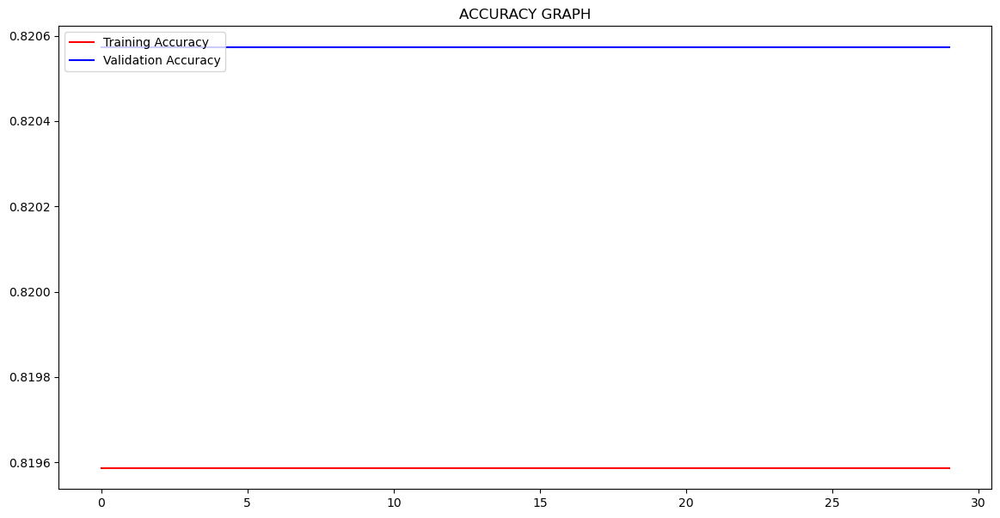

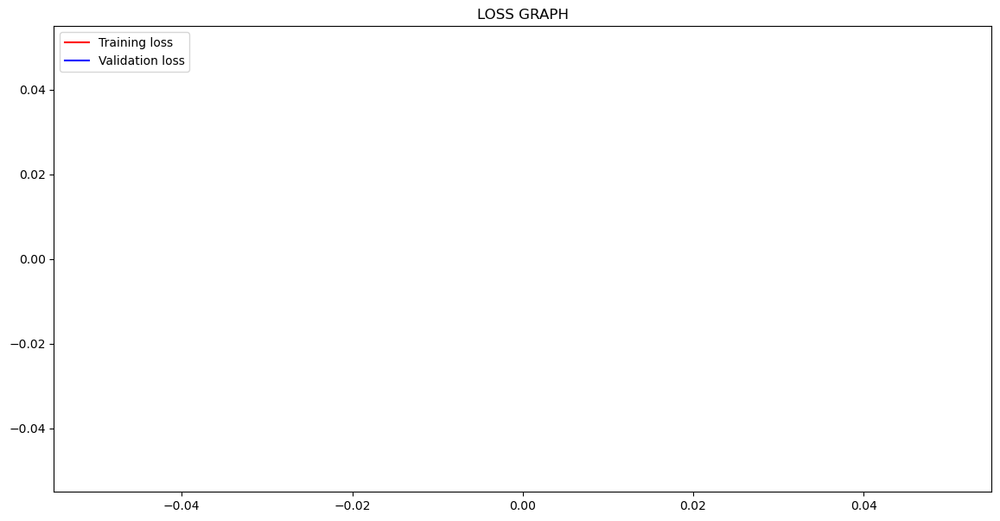

In [33]:
eval_graph(CNN_results_1)

In [34]:
Y_test1

205596    0
322682    0
259413    0
244507    0
267894    0
         ..
262291    0
358416    0
242850    0
36177     0
335117    0
Name: Category, Length: 104443, dtype: int64

In [35]:
Y_test1

205596    0
322682    0
259413    0
244507    0
267894    0
         ..
262291    0
358416    0
242850    0
36177     0
335117    0
Name: Category, Length: 104443, dtype: int64

3264/3264 [==============================] - 7s 2ms/step


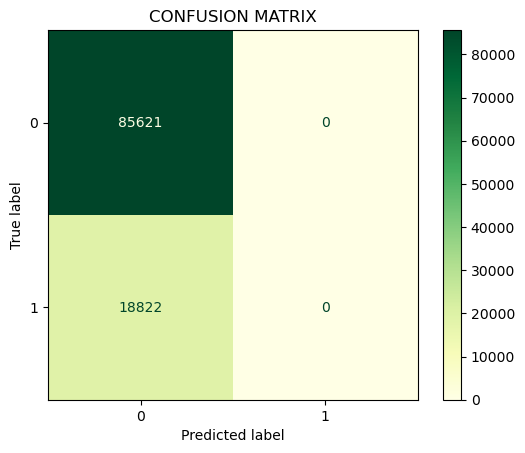

In [36]:
conf_matrix(X_test1,Y_test1,CNN_model1)

In [37]:
# CNN MODEL ON SECOND DATASET
CNN_model2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

callbacks = [tf.keras.callbacks.ModelCheckpoint('CNN_MODEL_ON_NON_FEATURE_EXTRACTED.h5',verbose=1,save_best_only=True),
             tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=30,verbose=1)]
CNN_results_2 = CNN_model2.fit(X_train2,Y_train2,validation_split=0.2,batch_size=128,epochs=200,callbacks=callbacks)

Epoch 1/200
2612/2612 [==============================] - ETA: 0s - loss: 0.3352 - accuracy: 0.8653
Epoch 1: val_loss improved from inf to 0.27370, saving model to CNN_MODEL_ON_NON_FEATURE_EXTRACTED.h5
2612/2612 [==============================] - 982s 375ms/step - loss: 0.3352 - accuracy: 0.8653 - val_loss: 0.2737 - val_accuracy: 0.8891
Epoch 2/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2651 - accuracy: 0.8899
Epoch 2: val_loss improved from 0.27370 to 0.23982, saving model to CNN_MODEL_ON_NON_FEATURE_EXTRACTED.h5
2612/2612 [==============================] - 954s 365ms/step - loss: 0.2651 - accuracy: 0.8899 - val_loss: 0.2398 - val_accuracy: 0.8972
Epoch 3/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2510 - accuracy: 0.8949
Epoch 3: val_loss did not improve from 0.23982
2612/2612 [==============================] - 907s 347ms/step - loss: 0.2510 - accuracy: 0.8949 - val_loss: 0.2428 - val_accuracy: 0.8960
Epoch 4/200
2612/2612 [==============

Epoch 29/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2011 - accuracy: 0.9134
Epoch 29: val_loss did not improve from 0.22044
2612/2612 [==============================] - 1127s 432ms/step - loss: 0.2011 - accuracy: 0.9134 - val_loss: 4.0277 - val_accuracy: 0.3235
Epoch 30/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2006 - accuracy: 0.9135
Epoch 30: val_loss did not improve from 0.22044
2612/2612 [==============================] - 1149s 440ms/step - loss: 0.2006 - accuracy: 0.9135 - val_loss: 0.3390 - val_accuracy: 0.8564
Epoch 31/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2003 - accuracy: 0.9137
Epoch 31: val_loss did not improve from 0.22044
2612/2612 [==============================] - 1127s 432ms/step - loss: 0.2003 - accuracy: 0.9137 - val_loss: 0.4231 - val_accuracy: 0.8149
Epoch 32/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2001 - accuracy: 0.9139
Epoch 32: val_loss did not improve from 0.

In [38]:
CNN_model2.evaluate(X_test2,Y_test2,verbose = 1)

3264/3264 [==============================] - 59s 18ms/step - loss: 0.2681 - accuracy: 0.8899


[0.26809969544410706, 0.8898633718490601]

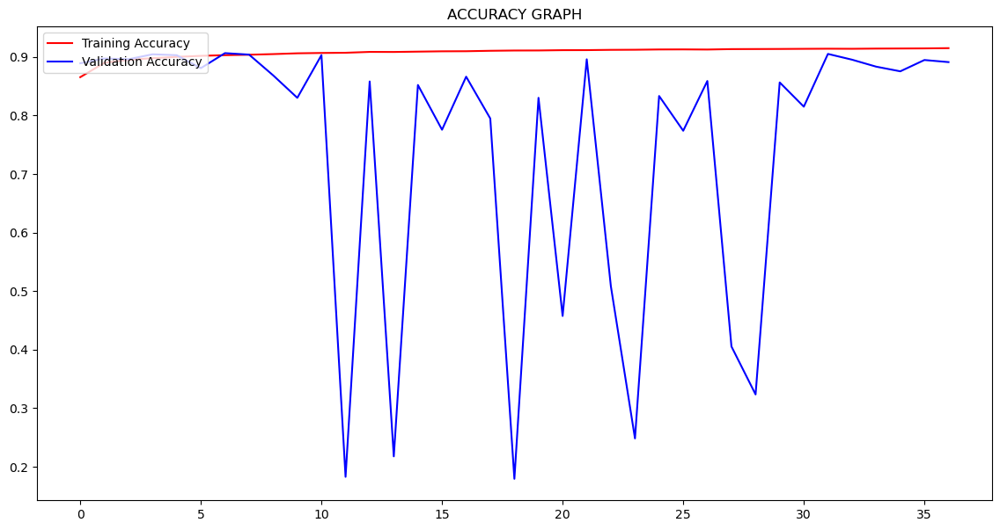

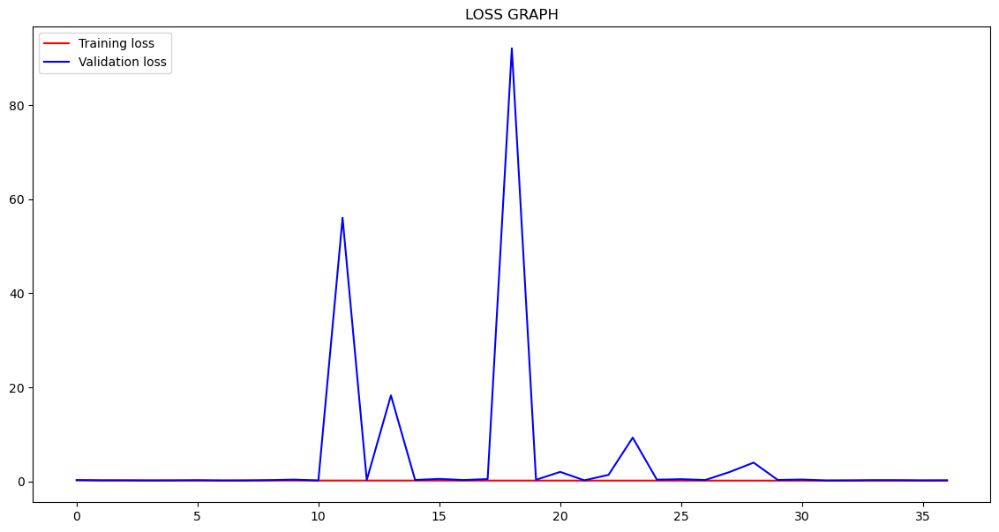

3264/3264 [==============================] - 59s 18ms/step


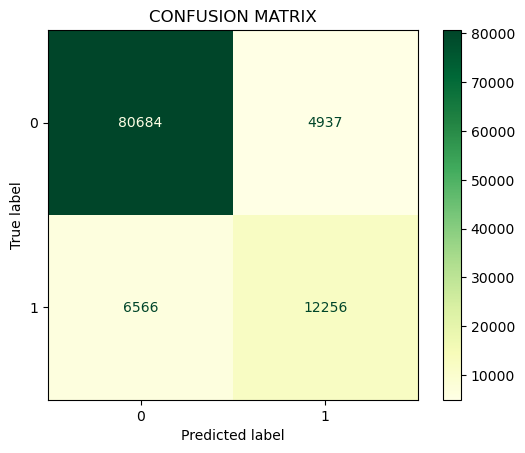

In [39]:
eval_graph(CNN_results_2)
conf_matrix(X_test2,Y_test2,CNN_model2)


In [40]:
# CNN LSTM MODEL
def CNN_LSTM(input_size):
    model = keras.Sequential()
    model.add(layers.Input(input_size))
    model.add(layers.Conv1D(filters = 16,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 32,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 64,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 128,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size = 2,padding = 'same'))
    model.add(layers.Conv1D(filters = 256,kernel_size = 3,activation = 'relu',padding = 'same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LSTM(128,return_sequences=True))
    model.add(layers.Dropout(0.3))
    model.add(layers.Flatten())
    model.add(layers.Dense(128,activation = 'relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(128,activation = 'relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1,activation = 'sigmoid'))
    
    return model

CNN_LSTM_model1 = CNN_LSTM(input_size1)
CNN_LSTM_model1.summary()
CNN_LSTM_model2 = CNN_LSTM(input_size2)    
CNN_LSTM_model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 21, 16)            64        
                                                                 
 dropout_14 (Dropout)        (None, 21, 16)            0         
                                                                 
 batch_normalization_10 (Bat  (None, 21, 16)           64        
 chNormalization)                                                
                                                                 
 max_pooling1d_10 (MaxPoolin  (None, 11, 16)           0         
 g1D)                                                            
                                                                 
 conv1d_11 (Conv1D)          (None, 11, 32)            1568      
                                                                 
 dropout_15 (Dropout)        (None, 11, 32)           

                                                                 
 dense_7 (Dense)             (None, 128)               1032320   
                                                                 
 dropout_28 (Dropout)        (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               16512     
                                                                 
 dropout_29 (Dropout)        (None, 128)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                 129       
                                                                 
Total params: 1,379,169
Trainable params: 1,378,177
Non-trainable params: 992
_________________________________________________________________


In [41]:
# CNN_LSTM MODEL ON FIRST DATASET
CNN_LSTM_model1.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

callbacks = [tf.keras.callbacks.ModelCheckpoint('CNN_LSTM_MODEL_ON_FEATURE_EXTRACTED.h5',verbose=1,save_best_only=True),
             tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=30,verbose=1)]
CNN_LSTM_results_1 = CNN_LSTM_model1.fit(X_train1,Y_train1,validation_split=0.2,batch_size=128,epochs=200,callbacks=callbacks)

Epoch 1/200
2610/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 1: val_loss did not improve from inf
2612/2612 [==============================] - 92s 30ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 2/200
2610/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 2: val_loss did not improve from inf
2612/2612 [==============================] - 84s 32ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 3/200
2610/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 3: val_loss did not improve from inf
2612/2612 [==============================] - 77s 30ms/step - loss: nan - accuracy: 0.8196 - val_loss: nan - val_accuracy: 0.8206
Epoch 4/200
2610/2612 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.8196
Epoch 4: val_loss did not improve from inf
2612/2612 [==============================] - 77s 30ms/ste

3264/3264 [==============================] - 13s 4ms/step - loss: nan - accuracy: 0.8198


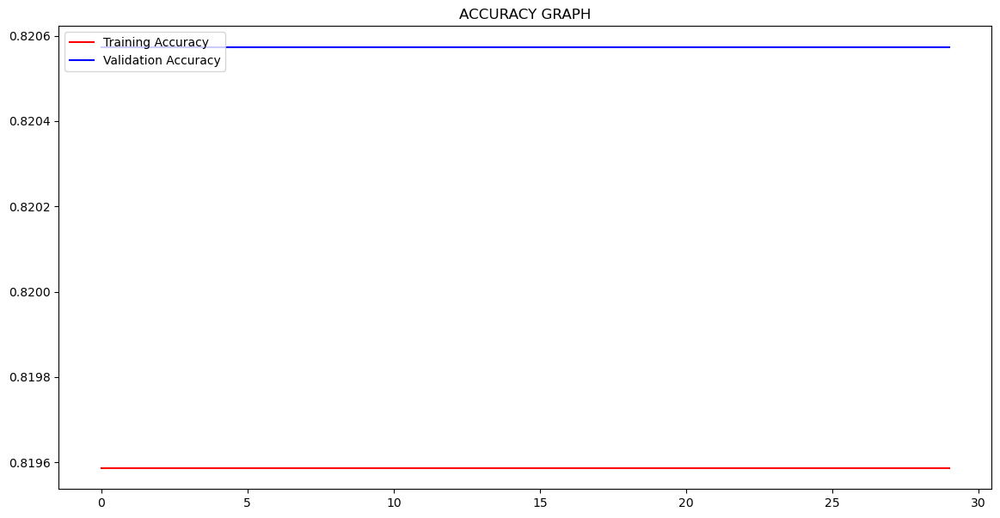

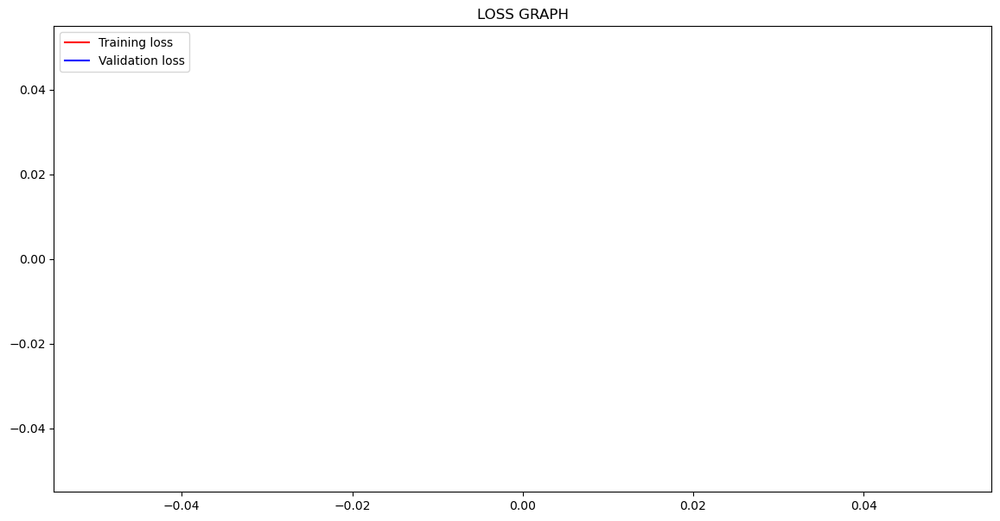

3264/3264 [==============================] - 12s 3ms/step


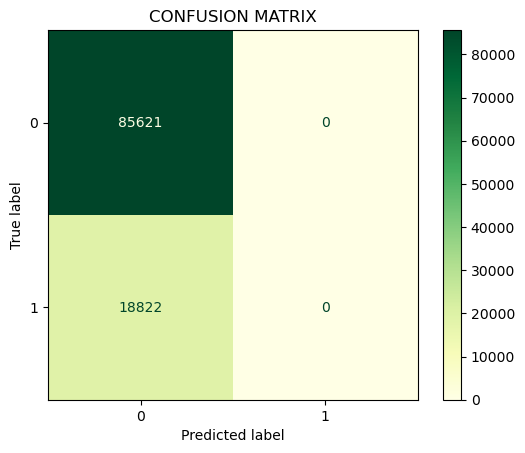

In [42]:
CNN_LSTM_model1.evaluate(X_test1,Y_test1)
eval_graph(CNN_LSTM_results_1)
conf_matrix(X_test1,Y_test1,CNN_LSTM_model1)

In [43]:
# CNN_LSTM MODEL ON SECOND DATASET
CNN_LSTM_model2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

callbacks = [tf.keras.callbacks.ModelCheckpoint('CNN_LSTM_MODEL_ON_NON_FEATURE_EXTRACTED.h5',verbose=1,save_best_only=True),
             tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=30,verbose=1)]
CNN_LSTM_results_2 = CNN_LSTM_model2.fit(X_train2,Y_train2,validation_split=0.2,batch_size=128,epochs=200,callbacks=callbacks)

Epoch 1/200
2612/2612 [==============================] - ETA: 0s - loss: 0.3025 - accuracy: 0.8739
Epoch 1: val_loss improved from inf to 0.24288, saving model to CNN_LSTM_MODEL_ON_NON_FEATURE_EXTRACTED.h5
2612/2612 [==============================] - 1649s 630ms/step - loss: 0.3025 - accuracy: 0.8739 - val_loss: 0.2429 - val_accuracy: 0.8969
Epoch 2/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2506 - accuracy: 0.8948
Epoch 2: val_loss did not improve from 0.24288
2612/2612 [==============================] - 1663s 637ms/step - loss: 0.2506 - accuracy: 0.8948 - val_loss: 0.9032 - val_accuracy: 0.8484
Epoch 3/200
2612/2612 [==============================] - ETA: 0s - loss: 0.2385 - accuracy: 0.8994
Epoch 3: val_loss improved from 0.24288 to 0.22881, saving model to CNN_LSTM_MODEL_ON_NON_FEATURE_EXTRACTED.h5
2612/2612 [==============================] - 1622s 621ms/step - loss: 0.2385 - accuracy: 0.8994 - val_loss: 0.2288 - val_accuracy: 0.9026
Epoch 4/200
2612/2612 [=

Epoch 56/200
2612/2612 [==============================] - ETA: 0s - loss: 0.1825 - accuracy: 0.9197
Epoch 56: val_loss did not improve from 0.21213
2612/2612 [==============================] - 1659s 635ms/step - loss: 0.1825 - accuracy: 0.9197 - val_loss: 0.2233 - val_accuracy: 0.9105
Epoch 56: early stopping


3264/3264 [==============================] - 127s 39ms/step - loss: 0.2248 - accuracy: 0.9088


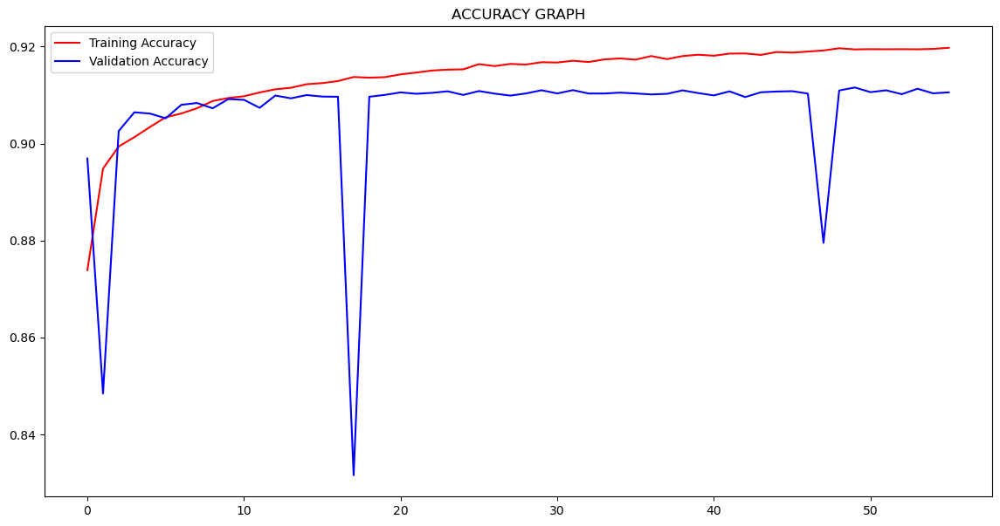

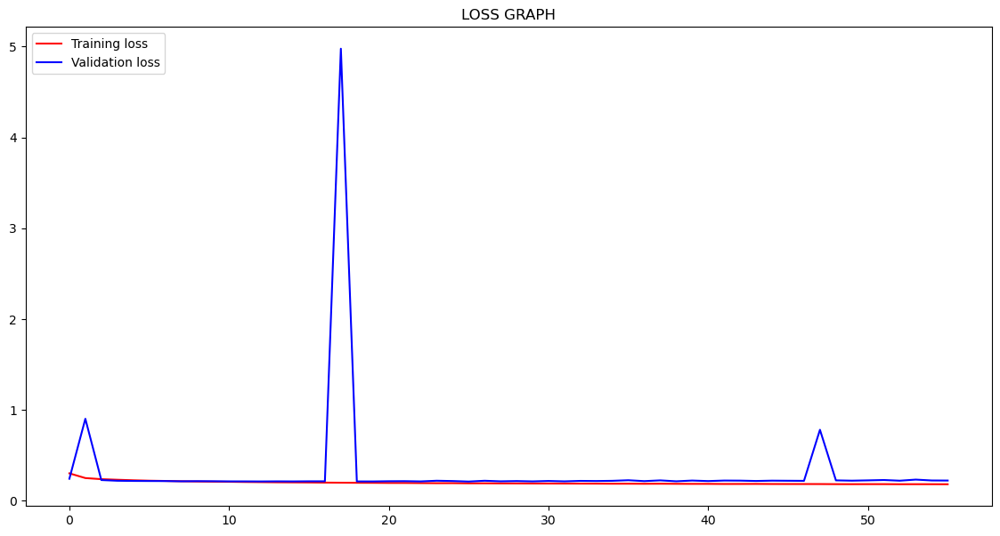

3264/3264 [==============================] - 167s 51ms/step


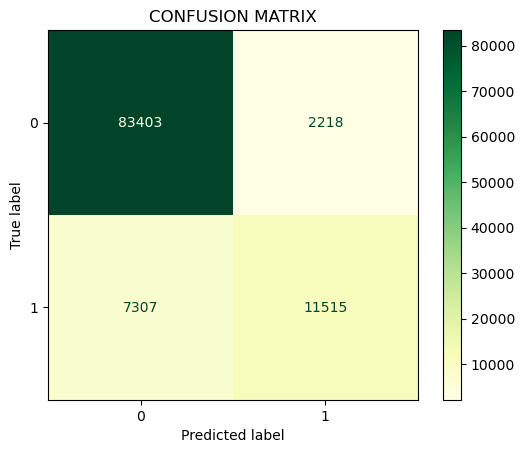

In [46]:
CNN_LSTM_model2.evaluate(X_test2,Y_test2)
eval_graph(CNN_LSTM_results_2)
conf_matrix(X_test2,Y_test2,CNN_LSTM_model2)

In [45]:
Y_test2

205596    0
322682    0
259413    0
244507    0
267894    0
         ..
262291    0
358416    0
242850    0
36177     0
335117    0
Name: Category, Length: 104443, dtype: int64

In [47]:
model_architecture = CNN_LSTM_model1.to_json()
with open('./modal/CNN_LSTM_urlv2_0.json', 'w') as json_file:
    json_file.write(model_architecture)

In [48]:
model_architecture = CNN_model1.to_json()
with open('./modal/CNN_urlv2_0.json', 'w') as json_file:
    json_file.write(model_architecture)

In [49]:
model_architecture = CNN_LSTM_model2.to_json()
with open('./modal/CNN_LSTM_2_urlv2_0.json', 'w') as json_file:
    json_file.write(model_architecture)

In [50]:
model_architecture = CNN_model2.to_json()
with open('./modal/CNN_2_urlv2_0.json', 'w') as json_file:
    json_file.write(model_architecture)